# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **1**, **3** and **5**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $2$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
running file: action_list.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[117495.50135958  95611.25879778 123396.80896711 163945.61903468
  92681.20263534  92681.69654331 166962.85594269 128287.52178985
  85865.50347172 119257.05562057  86034.4775969   85969.93480342
 108170.57813688  53738.68354952  57126.84793488  83317.25550298
  71981.73815777 110738.61693473  74472.65917597  63227.95366503
 160920.31283036  92933.55858926 102216.11620354  62973.06639424
  83802.88617593 103666.06970946  68824.92112422 112969.63603961
  82286.50855935  90966.24299436  82257.98971196 182437.27830573
  99562.84804397  70940.73323924 130603.02513683  67282.02216372


Omni_P_RQi ================== 0.10459019288879445
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 95611.25879777755, 'S': 10000, 'W': 10000, 'P': 0.10459019288879445, 'dP': 0}, 'j': {'R': 87237.2766009738, 'S': 10000, 'W': 10000, 'P': 0.11462989664086297}, 'k': {'R': 87237.2766009738, 'S': 10000, 'W': 10000, 'P': 0.11462989664086297}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10459019288879445
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 95611.25879777755, 'S': 10000, 'W': 10000, 'P': 0.10459019288879445, 'dP': 0}, 'j': {'R': 87237.2766009738, 'S': 10000, 'W': 10000, 'P': 0.11462989664086297}, 'k': {'R': 87237.2766009738, 'S': 10000, 'W': 10000, 'P': 0.11462989664086297}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10459019288879445
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'p

Omni_P_RQi ================== 0.07794990393829031
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 128287.52178984831, 'S': 10000, 'W': 10000, 'P': 0.07794990393829031, 'dP': 0}, 'j': {'R': 105830.30288521064, 'S': 10000, 'W': 10000, 'P': 0.09449089464334756}, 'k': {'R': 105830.30288521064, 'S': 10000, 'W': 10000, 'P': 0.09449089464334756}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.11646120497381722
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 85865.50347172002, 'S': 10000, 'W': 10000, 'P': 0.11646120497381722, 'dP': 0}, 'j': {'R': 108719.28576106037, 'S': 10000, 'W': 10000, 'P': 0.09198000088022716}, 'k': {'R': 108719.28576106037, 'S': 10000, 'W': 10000, 'P': 0.09198000088022716}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.11646120497381722
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.A

Omni_P_RQi ================== 0.17504904193909077
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 57126.847934875026, 'S': 10000, 'W': 10000, 'P': 0.17504904193909077, 'dP': 0}, 'j': {'R': 93947.03753224776, 'S': 10000, 'W': 10000, 'P': 0.1064429519298834}, 'k': {'R': 93947.03753224776, 'S': 10000, 'W': 10000, 'P': 0.1064429519298834}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.17504904193909077
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 57126.847934875026, 'S': 10000, 'W': 10000, 'P': 0.17504904193909077, 'dP': 0}, 'j': {'R': 93947.03753224776, 'S': 10000, 'W': 10000, 'P': 0.1064429519298834}, 'k': {'R': 93947.03753224776, 'S': 10000, 'W': 10000, 'P': 0.1064429519298834}}}
config_param a value =============  1
Omni_P_RQi ================== 0.17504904193909077
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {

Omni_P_RQi ================== 0.06214255878648488
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 160920.31283035706, 'S': 10000, 'W': 10000, 'P': 0.06214255878648488, 'dP': 0}, 'j': {'R': 129273.91133498424, 'S': 10000, 'W': 10000, 'P': 0.07735512832196476}, 'k': {'R': 129273.91133498424, 'S': 10000, 'W': 10000, 'P': 0.07735512832196476}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10760375640189637
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 92933.5585892591, 'S': 10000, 'W': 10000, 'P': 0.10760375640189637, 'dP': 0}, 'j': {'R': 74439.70910160709, 'S': 10000, 'W': 10000, 'P': 0.13433690325616962}, 'k': {'R': 74439.70910160709, 'S': 10000, 'W': 10000, 'P': 0.13433690325616962}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10760375640189637
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.08851936104754661
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 112969.63603960807, 'S': 10000, 'W': 10000, 'P': 0.08851936104754661, 'dP': 0}, 'j': {'R': 83208.87345698303, 'S': 10000, 'W': 10000, 'P': 0.12017949029402204}, 'k': {'R': 83208.87345698303, 'S': 10000, 'W': 10000, 'P': 0.12017949029402204}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.08851936104754661
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 112969.63603960807, 'S': 10000, 'W': 10000, 'P': 0.08851936104754661, 'dP': 0}, 'j': {'R': 83208.87345698303, 'S': 10000, 'W': 10000, 'P': 0.12017949029402204}, 'k': {'R': 83208.87345698303, 'S': 10000, 'W': 10000, 'P': 0.12017949029402204}}}
config_param a value =============  1
Omni_P_RQi ================== 0.08851936104754661
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.07656790483622376
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 130603.0251368334, 'S': 10000, 'W': 10000, 'P': 0.07656790483622376, 'dP': 0}, 'j': {'R': 74197.58905611216, 'S': 10000, 'W': 10000, 'P': 0.13477526867399248}, 'k': {'R': 74197.58905611216, 'S': 10000, 'W': 10000, 'P': 0.13477526867399248}}}
config_param a value =============  1
Omni_P_RQi ================== 0.07656790483622376
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 130603.0251368334, 'S': 10000, 'W': 10000, 'P': 0.07656790483622376, 'dP': 0}, 'j': {'R': 74197.58905611216, 'S': 10000, 'W': 10000, 'P': 0.13477526867399248}, 'k': {'R': 74197.58905611216, 'S': 10000, 'W': 10000, 'P': 0.13477526867399248}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.14862811310378346
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.09458938570254448
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 105720.10723747619, 'S': 10000, 'W': 10000, 'P': 0.09458938570254448, 'dP': 0}, 'j': {'R': 152850.35527864468, 'S': 10000, 'W': 10000, 'P': 0.0654234658582906}, 'k': {'R': 152850.35527864468, 'S': 10000, 'W': 10000, 'P': 0.0654234658582906}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09458938570254448
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 105720.10723747619, 'S': 10000, 'W': 10000, 'P': 0.09458938570254448, 'dP': 0}, 'j': {'R': 152850.35527864468, 'S': 10000, 'W': 10000, 'P': 0.0654234658582906}, 'k': {'R': 152850.35527864468, 'S': 10000, 'W': 10000, 'P': 0.0654234658582906}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09458938570254448
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.07095429050678422
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 140935.80428436334, 'S': 10000, 'W': 10000, 'P': 0.07095429050678422, 'dP': 0}, 'j': {'R': 65141.34294745224, 'S': 10000, 'W': 10000, 'P': 0.1535123402056161}, 'k': {'R': 65141.34294745224, 'S': 10000, 'W': 10000, 'P': 0.1535123402056161}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.08944591558204182
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 111799.40341521545, 'S': 10000, 'W': 10000, 'P': 0.08944591558204182, 'dP': 0}, 'j': {'R': 118461.57947979252, 'S': 10000, 'W': 10000, 'P': 0.08441555518602405}, 'k': {'R': 118461.57947979252, 'S': 10000, 'W': 10000, 'P': 0.08441555518602405}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.08944591558204182
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.0739126005637709
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 135294.9283846686, 'S': 10000, 'W': 10000, 'P': 0.0739126005637709, 'dP': 0}, 'j': {'R': 79304.65485186709, 'S': 10000, 'W': 10000, 'P': 0.12609600304898833}, 'k': {'R': 79304.65485186709, 'S': 10000, 'W': 10000, 'P': 0.12609600304898833}}}
config_param a value =============  1
Omni_P_RQi ================== 0.0739126005637709
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 135294.9283846686, 'S': 10000, 'W': 10000, 'P': 0.0739126005637709, 'dP': 0}, 'j': {'R': 79304.65485186709, 'S': 10000, 'W': 10000, 'P': 0.12609600304898833}, 'k': {'R': 79304.65485186709, 'S': 10000, 'W': 10000, 'P': 0.12609600304898833}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.13131173991783324
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'p

Omni_P_RQi ================== 0.14320520531082526
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 69829.8639235572, 'S': 10000, 'W': 10000, 'P': 0.14320520531082526, 'dP': 0}, 'j': {'R': 145655.1763336588, 'S': 10000, 'W': 10000, 'P': 0.06865530118265453}, 'k': {'R': 145655.1763336588, 'S': 10000, 'W': 10000, 'P': 0.06865530118265453}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.14744427362661566
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 67822.23381101771, 'S': 10000, 'W': 10000, 'P': 0.14744427362661566, 'dP': 0}, 'j': {'R': 76614.21060932228, 'S': 10000, 'W': 10000, 'P': 0.13052408842261462}, 'k': {'R': 76614.21060932228, 'S': 10000, 'W': 10000, 'P': 0.13052408842261462}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.14744427362661566
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>

Omni_P_RQi ================== 0.060699442873713115
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 164746.1578981092, 'S': 10000, 'W': 10000, 'P': 0.060699442873713115, 'dP': 0}, 'j': {'R': 76735.46625776659, 'S': 10000, 'W': 10000, 'P': 0.13031783720982962}, 'k': {'R': 76735.46625776659, 'S': 10000, 'W': 10000, 'P': 0.13031783720982962}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.060699442873713115
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 164746.1578981092, 'S': 10000, 'W': 10000, 'P': 0.060699442873713115, 'dP': 0}, 'j': {'R': 76735.46625776659, 'S': 10000, 'W': 10000, 'P': 0.13031783720982962}, 'k': {'R': 76735.46625776659, 'S': 10000, 'W': 10000, 'P': 0.13031783720982962}}}
config_param a value =============  1
Omni_P_RQi ================== 0.060699442873713115
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Ass

Omni_P_RQi ================== 0.09706543069838146
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103023.28983707634, 'S': 10000, 'W': 10000, 'P': 0.09706543069838146, 'dP': 0}, 'j': {'R': 91768.07509395196, 'S': 10000, 'W': 10000, 'P': 0.10897035804403678}, 'k': {'R': 91768.07509395196, 'S': 10000, 'W': 10000, 'P': 0.10897035804403678}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09706543069838146
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103023.28983707634, 'S': 10000, 'W': 10000, 'P': 0.09706543069838146, 'dP': 0}, 'j': {'R': 91768.07509395196, 'S': 10000, 'W': 10000, 'P': 0.10897035804403678}, 'k': {'R': 91768.07509395196, 'S': 10000, 'W': 10000, 'P': 0.10897035804403678}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09706543069838146
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.11768798561912017
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 84970.44067321815, 'S': 10000, 'W': 10000, 'P': 0.11768798561912017, 'dP': 0}, 'j': {'R': 126081.64059932392, 'S': 10000, 'W': 10000, 'P': 0.07931368875329833}, 'k': {'R': 126081.64059932392, 'S': 10000, 'W': 10000, 'P': 0.07931368875329833}}}
config_param a value =============  1
Omni_P_RQi ================== 0.11768798561912017
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 84970.44067321815, 'S': 10000, 'W': 10000, 'P': 0.11768798561912017, 'dP': 0}, 'j': {'R': 126081.64059932392, 'S': 10000, 'W': 10000, 'P': 0.07931368875329833}, 'k': {'R': 126081.64059932392, 'S': 10000, 'W': 10000, 'P': 0.07931368875329833}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.07429452099818547
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.12559363773248408
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 79621.86764030291, 'S': 10000, 'W': 10000, 'P': 0.12559363773248408, 'dP': 0}, 'j': {'R': 107196.4876563966, 'S': 10000, 'W': 10000, 'P': 0.09328663857022636}, 'k': {'R': 107196.4876563966, 'S': 10000, 'W': 10000, 'P': 0.09328663857022636}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.12559363773248408
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 79621.86764030291, 'S': 10000, 'W': 10000, 'P': 0.12559363773248408, 'dP': 0}, 'j': {'R': 107196.4876563966, 'S': 10000, 'W': 10000, 'P': 0.09328663857022636}, 'k': {'R': 107196.4876563966, 'S': 10000, 'W': 10000, 'P': 0.09328663857022636}}}
config_param a value =============  1
Omni_P_RQi ================== 0.12559363773248408
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.09983415852476969
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100166.11696605742, 'S': 10000, 'W': 10000, 'P': 0.09983415852476969, 'dP': 0}, 'j': {'R': 101907.37572170106, 'S': 10000, 'W': 10000, 'P': 0.09812832416869421}, 'k': {'R': 101907.37572170106, 'S': 10000, 'W': 10000, 'P': 0.09812832416869421}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09983415852476969
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100166.11696605742, 'S': 10000, 'W': 10000, 'P': 0.09983415852476969, 'dP': 0}, 'j': {'R': 101907.37572170106, 'S': 10000, 'W': 10000, 'P': 0.09812832416869421}, 'k': {'R': 101907.37572170106, 'S': 10000, 'W': 10000, 'P': 0.09812832416869421}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10791193644761524
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

POOL Class  1POOL Class  0.5 Asset  i  Class Price =  0.10560096237229331
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10560096237229331
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10560096237229331
POOL Class   A value =  0.5  R over W=  9.489945833203912 Q over Wq =  1.0
Asset  i  Class Price =  0.07723625400191854
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07723625400191854
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07723625400191854
POOL Class   A value =  1.5  R over W=  8.947215912972629 Q over Wq =  1.0
1885.0  Class Price =  
  A value =  1 Asset  i  Class Price =  0.0797836256622629
POOL Class   A value =  1 Asset  j  Class Price =  0.0797836256622629
POOL Class   A value =  1 Asset  k  Class Price =  0.0797836256622629
POOL Class   A value =  1  R over W=  9.761250149635863 Q over Wq =  1.0
1882.0 POOL Class POOL Class Asset 1931.0
   A value =   A value =  0.5 Asset  i  Class Price =  0.11120861314144406
POOL Class   A value = i  

1871.0  A value =  1
i POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.05848352367394316
POOL Class   A value =   POOL Class  Class Price = 1.5POOL Class     A value =  1.5 Asset  i  Class Price =  0.0736946885287592
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0736946885287592
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0736946885287592
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0991417905183565
POOL Class   A value =  R over W=  8.947215912972629 Q over Wq =  1.0
1799.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0760038639103649
POOL Class   A value =  1 Asset  j  Class Price =  0.07829321631011846POOL Class 
addliq - Sq delta Sq POOL Class Asset   k A value =  j  Class Price =  0.05848352367394316
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05848352367394316
POOL Class   A value =  1.5  R over W=  18.445631044795157 Q over Wq =  1.0
1880.01   A value = 
0.5 Asset  i  Class Price =  0.10397178595669236
POOL Class   A valu

POOL Class   A value =  0.5 Asset  k POOL Class   A value =  Class Price = 1Q over Wq =    A value =   Asset  i POOL Class   1.0 Class Price =  0.05848352367394316
POOL Class   A value =  1.5 0.51  A value =  1.5 Asset  i  Class Price =  0.07128997708676262
1775.0 Asset   1
Asset 
POOL Class Asset  j  Class Price =  0.05848352367394316
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05848352367394316
POOL Class   A value =  1.5  R over W=  18.445631044795157 Q over Wq =  1.0
1915.0POOL Class     0.07702848079960453
Asset i  Class Price =  0.0890442310544084
POOL Class   A value =  1 Asset  j  Class Price =  0.0890442310544084
POOL Class   A value =  1 Asset  k  Class Price =  0.0890442310544084
POOL Class   A value =  1  R over W=  8.72372766009738 Q over Wq =  1.0
1655.0POOL Class  Asset  A value =  j

  A value =  1.5 Asset  i  Class Price =  0.057952889536296855
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057952889536296855
POOL Class   A value =  1.5 Asset  k  Cla

POOL Class POOL Class 1724.0  1.5
 A value =  1706.0  1634.0 A value = POOL Class Asset 
POOL Class  A value =    i0.5 
 POOL Class   1 A value =   A value =  0.5 Asset  i  Class Price =  0.10107762512060352
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10107762512060352
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10107762512060352
POOL Class   A value =  0.5  R over W=   Class Price = Asset   A value = POOL Class  Asset 1 1.5    A value =  1 Asset  i  Class Price =  0.08676854523388347
POOL Class   A value =  1 Asset  j  Class Price =  0.08676854523388347
POOL Class   A value =  1 Asset  k  Class Price =  0.08676854523388347
POOL Class   A value =  1  R over W=  8.72372766009738 Q over Wq =  1.00.0690010604702369
POOL Class   A value =  1.5 Asset  j   0.5 
1613.010.871928576106036i Class Price = Asset j Asset 
  Class Price =  0.07702848079960453
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07702848079960453
POOL Class   A value =  0.5 Asset  k  Class Pri

 POOL Class   A value =   POOL Class  k1 1354.0 
1.5 Asset  i  Class Price =  0.06682063344439794
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06682063344439794
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06682063344439794
POOL Class   A value =  1.5  R over W=  8.947215912972629 Q over Wq =  1.0
 0.05540501613773249j A value =  1697.0  Class Price =  0.08351516287122375
POOL Class   A value =  1 Asset  k  Class Price =  0.08351516287122375
POOL Class   A value =  1  R over W=  8.72372766009738 Q over Wq =  1.0
 
 A value =  0.5 Asset  i  Class Price =  0.09434964045437462
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09434964045437462
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09434964045437462
POOL Class   A value =  0.5  R over W=  10.871928576106036 Q over Wq =  1.0
1572.0POOL Class 
0.5POOL Class  1553.0  A value =  0.5 Asset  i  Class Price =  0.07528106741826933
POOL Class   A value =   
 Class Price = Asset 
0.5 0.0710525377023899
POOL 

1510.0POOL Class 0.08044139345820754 0.06611676793149827


  11.401410895731255POOL Class  A value = 0.07359246927455065 POOL Class 1POOL Class   A value =  0.5 Asset  i  Class Price =  0.08943937235456556
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08943937235456556
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08943937235456556
POOL Class   A value =  0.5  R over W=  10.871928576106036 Q over Wq =  1.0
Q over Wq =    
 1.0
1620.0POOL Class 1528.00.5 A value = Asset 
  Asset  i  Class Price =  0.08517344352037318
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08517344352037318
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08517344352037318POOL Class   A value = 
 
   A value =  1 Asset  i  Class Price =  0.08914567865157297
POOL Class   A value =  1 Asset  j  Class Price =  0.08914567865157297
POOL Class   A value =  1 Asset  k  Class Price =  0.08914567865157297
POOL Class   A value =  1  R over W=  11.401410895731255 Q over Wq =  1.0
POOL Class  

1479.0 A value = POOL Class  0.5 
POOL Class  Asset  i   Class Price =  0.08410213112379761
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08410213112379761
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08410213112379761
POOL Class   A value =  0.5  R over W=  9.489945833203912 Q over Wq =  1.0
1535.0 A value = POOL Class 
 1 Asset  i  Class Price =  0.08364702636081559
POOL Class   A value =  1 Asset  j  Class Price =  0.08364702636081559
POOL Class   A value =  1 Asset  k  Class Price =  0.08364702636081559
POOL Class   A value =  1  R over W=  11.401410895731255 Q over Wq =  1.0
 POOL Class POOL Class 1507.0  A value =  0.5 Asset  i  Class Price =  0.08305090724314008
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08305090724314008
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08305090724314008
POOL Class   A value =  0.5  R over W=  9.489945833203912 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.0784855601925648
POOL Class   A value = 

 
POOL Class 
  A value =  A value =  0.5 Asset  i  Class Price =  0.07807913474821755
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07807913474821755
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07807913474821755
POOL Class   A value =  0.5  R over W=  9.489945833203912 Q over Wq =  1.0
POOL Class   A value =  1 Asset  j  Class Price =  0.08158914561104533
POOL Class   A value =  1 Asset  k  Class Price =  0.08158914561104533
POOL Class   A value =  1  R over W=  11.401410895731255 1425.0  Class Price = Asset  A value = 
Q over Wq =  1.0
1522.0 0.5 Asset  k  Class Price =  0.06961145820944425
POOL Class   A value =  0.5  R over W=  6.3165039063452815 Q over Wq =  1.0
1622.0
POOL Class 
POOL Class   POOL Class POOL Class  1  A value =  A value =  0.5 Asset  i  Class Price =  0.06885409653907792
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06885409653907792
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06885409653907792
POOL Class   A value =  0.5  



POOL Class   A value =  1 Asset  k  Class Price =  0.0721736473336172
POOL Class   A value =  1  R over W=  8.72372766009738 Q over Wq =  1.0
 POOL Class   A value =  1 Asset  j
 R over W= 1345.0POOL Class  
POOL Class 8.947215912972629  A value =  0.5  
  A value =  0.5 Asset  i  Class Price =  0.08276270257718372
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08276270257718372
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08276270257718372
POOL Class 18.445631044795157 Q over Wq =  1.0
POOL Class  Class Price = POOL Class  Asset     A value =  0.5 Asset  i  Class Price =  0.07530741799846924
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07530741799846924
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07530741799846924
POOL Class   A value =  0.5  R over W=  9.489945833203912 Q over Wq =  1.0
POOL Class 1375.01694.0  A value = 0.06516949045918688 
 1 Asset  i  Class Price =  0.07133447152904634
POOL Class   A value =  1 Asset  j  Class Price =  0.07

POOL Class     A value = 1POOL Class  1.5 Asset  j  Class Price =  0.08070261864910347
POOL Class   A value =  Class Price =  A value =   A value =  0.5 Asset   i  Class Price =  0.0666547250484792
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0666547250484792
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0666547250484792
POOL Class   A value =  0.5  R over W=  6.3165039063452815 Q over Wq =  1.0
 Asset   
 POOL Class 0.5927.00.049934828337837904Asset 1   A value =  1 Asset  i  Class Price =  0.06315048379946857
POOL Class   A value =  1 Asset  j  Class Price =  0.06315048379946857
POOL Class   A value =   Asset  i  Class Price =  0.07407285330706319
POOL Class   A value = 
1 Asset POOL Class   j
POOL Class  k R over W=  POOL Class    A value =  0.5 Asset  i  Class Price =  0.0666547250484792
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0666547250484792
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0666547250484792
POOL Class   A value =  0.5  R ove

POOL Class POOL Class 1328.0 1440.0  

 A value =  A value = 
 1.5POOL Class  A value = POOL Class  POOL Class    POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.07268070852184773
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07268070852184773
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07268070852184773
POOL Class   A value =     A value =  0.5 Asset  i  Class Price =  0.07871850971837918
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07871850971837918
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07871850971837918
POOL Class   A value =  0.5  R over W=  10.871928576106036 Q over Wq =  1.0
1309.00.5 A value =  1 Asset 
0.5 Asset  i  Class Price =  0.06594498434030432
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06594498434030432
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06594498434030432
POOL Class   A value =  0.5  R over W=  6.3165039063452815 Q over Wq =  1.0
1537.0  A value =   1.5 Asset  k  Class Price 

 1   0.06127963903149702
 Asset 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06127963903149702
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06127963903149702
POOL Class   A value = 1 Asset  1163.00.5 Class Price = 1533.0  POOL Class i
 i 
0.5  A value =  1.5 Asset  i  Class Price =  0.05621610086973227
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05621610086973227
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05621610086973227
POOL Class   A value =  1.5  R over W=  8.947215912972629 Q over Wq =  1.0
  R over W=  1371.0
POOL Class 0.07587678543780137 Class Price =   0.07235610463698408
POOL Class   A value =  1 Asset POOL Class POOL Class    
  A value =  1  j Class Price =  R over W= Asset  i  Class Price =  0.06163655607392471
POOL Class   A value = POOL Class  A value =  A value = 9.489945833203912 1 Asset  j  Class Price =  Q over Wq =  1.0
1219.0
     1.5 Asset  i  Class Price =  6.3165039063452815 0.04634685931282566
POOL Class   A value = 

 A value = Asset 0.50.5 Asset  i  0.5 Asset  i  Class Price =  0.07406694381000384
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07406694381000384
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07406694381000384
POOL Class   A value =  0.5  R over W=  10.871928576106036 Q over Wq =  1.0
1217.0
  Class Price =    POOL Class  i  R over W= Asset 10.06859851025790978
POOL Class   A value =   Class Price =  0.07069835740758378
POOL Class   A value =  1 Asset  j  Class Price =  0.07069835740758378
POOL Class   A value =  1 Asset  k  Class Price =  0.07069835740758378
POOL Class   A value =  1  R over W=  11.401410895731255 Q over Wq =  1.0
1277.0
   i  Class Price =  0.05943050716635294
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05943050716635294
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05943050716635294
POOL Class   A value =  0.5  R over W=  6.3165039063452815 Q over Wq =  1.0
786.00.5  POOL Class  A value = 
 Asset  j  Class Price =  0.0685985102

POOL Class   A value =  0.5  R over W=  10.871928576106036POOL Class POOL Class 18.445631044795157Asset   A value =  1 Asset  i  Class Price =  0.057626056666983845
POOL Class   A value =  1 Asset  j  Class Price =  0.057626056666983845
POOL Class   A value =  1 Asset  k  Class Price =  0.057626056666983845
POOL Class   A value =  1  R over W=  9.761250149635863 Q over Wq =  1.0
 j  Class Price =     1378.0 A value =  1 Asset  i  Class Price =  0.06831655172144963
POOL Class   A value =  1 Asset  j  Class Price =  0.06831655172144963
POOL Class   A value =  1 Asset  Q over Wq = 
k Q over Wq =   Class Price =  0.06831655172144963
POOL Class   A value =  1  R over W=  11.401410895731255 Q over Wq =  1.0
1.0
POOL Class  1234.01182.0

POOL Class POOL Class  1.0   A value =  1 Asset  i  Class Price =  0.0675493134900407
POOL Class   A value =  1 Asset  j  Class Price =  0.0675493134900407
POOL Class   A value =  1 Asset  k  Class Price =  0.0675493134900407
POOL Class   A value =  1  R over


POOL Class POOL Class POOL Class  1153.0 A value =   A value = 
POOL Class  
  A value =   1  POOL Class 0.51.5Asset  A value =  A value = POOL Class      Asset i1  A value =  0.5 Asset  i Asset  POOL Class    Class Price =   A value =  1.5 A value =   Class Price =  i i  Asset  0.0576638298280356750.5 Asset 1  0.06679493335277847
   Class Price = i
POOL Class   Class Price = iAsset   POOL Class  Asset  0.06274777272791997 Class Price =   A value =  0.05207969908718858  
  A value =  i
 Class Price = iPOOL Class 0.05649704399952094 0.5 POOL Class    
1  Class Price =  0.045236470734008785 Class Price =  A value = POOL Class  Asset   A value = 
  0.5 Asset  j  Class Price =  0.06274777272791997
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06274777272791997
POOL Class   A value =  0.5  R over W=  9.489945833203912 Q over Wq =  1.0
1147.00.056620185877439944Asset    0.07063625200640097POOL Class 

  A value = j1.5
 POOL Class  POOL Class j  POOL Class  A value =  1   Class Pric

POOL Class POOL Class     Asset 0.06900961035803332 Class Price =  POOL Class j  A value =  Class Price = 
    A value =  1 Asset  i  Class Price =  0.06605312372922034
POOL Class   A value =  1 Asset  j  Class Price =  0.06605312372922034
POOL Class   A value =  1 Asset  k  Class Price =  0.06605312372922034
POOL Class   A value =  1  R over W=  11.401410895731255 Q over Wq =  1.0
1130.0 A value = 0.05546180391102145  A value = POOL Class    1.5 Asset  i  Class Price =  0.04451824390466402
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04451824390466402
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04451824390466402
POOL Class   A value =  1.5  R over W=  18.445631044795157 Q over Wq =  1.0
  A value =  0.5 Asset  j  Class Price =  

POOL Class   A value =  1 Asset  j  Class Price =  0.05546180391102145
POOL Class   A value =  1  Class Price = 1461.0
0.5 Asset  i  Class Price =  0.05597477108737187
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055974771087371

   Class Price =  A value =  0.066673013618337261  A value = 
 POOL Class 1.5 A value =  0.05435885132431309
POOL Class   A value =  0.5  R over W=  6.3165039063452815 Q over Wq =  1.0
 0.5POOL Class   A value =  0.5  R over W=  10.871928576106036 Q over Wq =   R over W=  8.947215912972629 Q over Wq = Asset   1.0
 i  Class Price =  0.05381554226710256
POOL Class   A value =  1 Asset  j  Class Price =  A value = 1 1073.0 0.05381554226710256
POOL Class  1  A value =  1  727.0

Asset  POOL Class 1.01.5 Asset  
 Asset  i  Class Price =  0.053789763374855346
POOL Class   A value =  1 Asset  j  Class Price =  0.053789763374855346
POOL Class   A value =  1 Asset  k  Class Price =  0.053789763374855346
POOL Class   A value =  1  R over W=  8.72372766009738  POOL Class Asset  1202.0   A value = k A value =  0.5 Asset  i  Class Price =  0.06667301361833726
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06667301361833726
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0666730136183

 Class Price = POOL Class POOL Class POOL Class  POOL Class Asset 975.0  1.0  A value =  0.5 Asset  i  Class Price =  0.06592047273461865
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06592047273461865
POOL Class   A value =  0.5 Asset  i  Class Price =  0.059463247871658326
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059463247871658326
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059463247871658326
POOL Class   A value =  0.5  R over W=  9.489945833203912 Q over Wq =  1.0

0.053302187268571825 A value =  1087.0
 A value =   
1.5 Asset  i  Class Price =  0.048823680616081375
POOL Class   A value =  1.5 Asset  j  Class Price =  0.048823680616081375
POOL Class   A value =  1.5 Asset  k  Class Price =    A value =  1 Asset  i  Class Price =  0.061189936292563855
POOL Class   A value =  1 Asset  j  Class Price =  0.061189936292563855
POOL Class   A value =  1 Asset  k  Class Price =  0.061189936292563855
POOL Class   A value =  1  R over W=  11.401410895731255

 A value =  POOL Class k0.51.51.5 A value =     1    A value =  0.5 Asset  j  Class Price =  0.06592047273461865
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06592047273461865
POOL Class   A value =  0.5 Class Price = Asset Asset 1Asset 1   R over W=  10.871928576106036 Q over Wq =  1.0
979.0Asset       
Asset ki0.05281191198189477i155442 i  Class Price =  0.05091831512301345
POOL Class   A value =  1 Asset  j  Class Price =  0.05091831512301345
POOL Class   A value =  1 Asset  k  Class Price =  0.05091831512301345
POOL Class   A value =  1  R over W=  8.72372766009738  i  Class Price =  0.05132050120268673
POOL Class  
 Class Price = 
   R over W=  Class Price =    Class Price = POOL REMOVE LIQUIDITY Timestep === 11.401410895731255 A value = POOL Class Q over Wq =   0.058221278962131890.047949404233804414       A value = 1.0

0.0424632777599734890Q over Wq = 1   
POOL Class POOL Class 
 POOL Class delta W 0.9999999999999999Asset 0.5964.0    A value =  A value =  1.5 Asset  j

POOL Class   A value =  A value = POOL Class  A value = 
 POOL Class   A value =  0.5 Asset  k  Class Price =  0.05213979116804357
POOL Class   A value =  0.5  R over W=  6.3165039063452815 Q over Wq =  1.0
11  1203.0POOL Class   A value = 0.5 
 Asset  i  Class Price =  0.05132050120268673
POOL Class   A value =  1 Asset  j  Class Price =  0.05132050120268673
POOL Class   A value =  1 Asset   1 Asset  i  Class Price =  0.05834756213942006
POOL Class   A value =  1 Asset  j  Class Price =  0.05834756213942006
POOL Class   A value =  1 Asset  k  Class Price =  0.05834756213942006
POOL Class   A value =  1  R over W=  11.401410895731255 Q over Wq =  0.9999999999999999
Asset   Asset  i  Class Price =  0.05557775028889368
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05557775028889368
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05557775028889368
POOL Class   A value =  0.5  R over W=  9.489945833203912 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.061607125

 POOL Class   A value =  0.5 POOL Class Asset Asset 0.5 Asset Asset  j  Class Price =  0.0416272057577289
POOL Class   A value =  1.5 Asset  k i  Class Price =  0.050198652390979974
POOL Class   A value =  0.5 Asset  j  Class Price =  0.050198652390979974
POOL Class   A value =  0.5 Asset  k  Class Price =  0.050198652390979974
POOL Class   A value =  0.5  R over W=  6.3165039063452815 Q over Wq =  1.0
650.0  
iPOOL Class   A value =  1.5 Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.050198652390979974
POOL Class   A value =  0.5 Asset  j  Class Price =  0.050198652390979974
POOL Class   A value =  0.5 Asset  k  Class Price =  0.050198652390979974
POOL Class   A value =  0.5  R over W=  6.3165039063452815 Q over Wq =  1.0
POOL Class    k  Class Price =  0.0493931962265113
POOL Class   A value =  1  R over W=  9.761250149635863 Q over Wq =  1.0
1178.0 Class Price =  A value = i  Class Price =  0.10243482659301574
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1024

1913.00.5j11.5  Class Price =  0.0755716987281268
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0755716987281268
POOL Class  POOL Class   A value =  1  R over W=  10.871928576106036 Q over Wq =  1.0
1883.0
 A value =  
   POOL Class  Asset Asset  Class Price = 
 0.5 Asset  k  Class Price =  0.0755716987281268
POOL Class   A value =  0.5  R over W=  10.583030288521064 Q over Wq =  1.0
 i  Class Price =  0.10123195232738125
POOL Class   0.10243482659301574  A value = 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10243482659301574
POOL Class   A value =  1.5  R over W=  8.72372766009738 Q over Wq =  1.0
i  Class Price =  POOL Class  A value = 1975.0POOL Class 
 0.05743496888102002  R over W=  
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05743496888102002
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05743496888102002
POOL Class   A value =  0.5  R over W=  7.7073285111009175 Q over Wq =  1.0
1866.0
POOL Class 1.51803.0POOL Class   Asset  j  Class Pri

 A value =  addliq - Sq delta Sq1.5 Class Price =    Wq ADD LIQUIDITY Timestep ===  j A value = 1 POOL Class   10  Asset 0.5 5302.8230908845835 0.0760076617852553  A value =  1 Class Price = 
Asset 
  j  Class Price =  0.08092011490700703
POOL Class   A value =  1 Asset  k  Class Price =  0.08092011490700703
POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
addliq - Sq delta S 5302.8230908845835
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5061.413183812481
POOL ADD LIQUIDITY Timestep ===   delta W =   R over W=  10.583030288521064Asset  i  Class Price =  0.10398007813138824
POOL Class   A value =  1 Asset  j  Class Price =  0.10398007813138824
POOL Class   A value =  1 Asset  k  Class Price =  0.10398007813138824
POOL Class   A value =  1  R over W=  10.871928576106036 Q over Wq =  1.0
POOL Class  Q over Wq =  1.0
1918.0 1761.0  10

  A value =  1.5 j  Class Price =  0.0971262994669954
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0971262994669954
POO

POOL Class   1820.0 0.092656507816599981j  Asset  j  Class Price =  0.09743088941108016
POOL Class   A value =  1 Asset  k  Class Price =  0.09743088941108016
POOL Class   A value =  1  R over W=  10.871928576106036 Q over Wq =  1.0
1651.0 Asset 
 A value =  A value = 

 Class Price =  addliq - Sq delta Sq 0.09831942482193215
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09831942482193215
POOL Class  POOL Class   0.51.5 POOL Class    A value =  1 Asset  i  Class Price =  0.09850323226699768
POOL Class   A value =  1 Asset  j  Class Price =  0.09850323226699768
POOL Class   A value =  1 Asset  k  Class Price =  0.09850323226699768
POOL Class   A value =  1  R over W=  9.489945833203912 Q over Wq =  1.0
 Asset   A value = j5113.3951767168921747.0 j  Class Price =  0.07997862535412809
POOL Class   A value =  1 Asset  k  Class Price =  0.07997862535412809
POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
1863.0  
Asset  A value =  

 1.5 Asset  k  Class Pri

POOL Class jPOOL Class Asset  Asset 0.07313822480309094
POOL Class  POOL Class    ii   A value =   Class Price = POOL Class   A value =  A value =   A value =     A value =  1.5 Asset  i  Class Price =  0.09572521768451736
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09572521768451736
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09572521768451736
POOL Class   A value =  1.5  R over W=  8.72372766009738 Q over Wq =  1.0
 1.5 Asset  k  Class Price =  0.09143857724652472
POOL Class   A value =  1.5  R over W=  11.401410895731255 Q over Wq =  1.0
1813.00.05383505059743301 1701.01.5  Class Price = 
 Class Price = 
1
1  0.07036409116789859 POOL Class   POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.09024451091189183
POOL Class   A value =  1.5 Asset 
Asset POOL Class    POOL Class  Asset 0.0971818060748205  A value =  1.5 Asset  i  Class Price =  0.09446645285453381
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09446645285453381
POOL Class   A value

1691.0 
POOL Class POOL Class 1779.0
 POOL Class   A value = 
  A value =  1.5 Asset  i  Class Price =  0.09083567216165644
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09083567216165644
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09083567216165644
POOL Class   A value =  1.5  R over W=  8.72372766009738 Q over Wq =  1.0
1721.0 0.5 Asset  i  Class Price =  0.05242621737956588
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05242621737956588
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05242621737956588
POOL Class   A value =  0.5  R over W=  7.7073285111009175 Q over Wq =  1.0
1702.0
 A value = POOL Class   A value =  1 Asset  i  Class Price =  0.07550886045994892
POOL Class   A value =  1 Asset  j  Class Price =  0.07550886045994892
POOL Class   A value =  1 Asset  k  Class Price =  0.07550886045994892
POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
1466.0 A value = 
  POOL Class 
POOL Class  1.5 Asset  i  Class Price =  

 Asset 1687.01.0 
Asset POOL Class 
Asset 1656.0 
  A value =  1.5 Asset  i  Class Price =  0.08853021827317703
POOL Class  POOL Class   k   Class Price = 1645.0 POOL Class  A value = i
k
0.0897842177839536 A value =   A value =  1 Asset  i  Class Price =  0.07300456155140253
POOL Class   A value =  1 Asset  j  Class Price =  0.07300456155140253
POOL Class   A value =   1.5 Asset  j  Class Price =  0.08853021827317703
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08853021827317703
POOL Class   A value =  1.5  R over W=  8.72372766009738 Q over Wq =  1.0
1358.0
1
 POOL Class   POOL Class   Asset POOL Class  A value =   Class Price =   A value =  1  R over W=  9.489945833203912 Q over Wq =  1.0
k 0.5POOL Class   Class Price =   A value =  0.5 Asset  i  Class Price =  0.06465484639536541
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06465484639536541
POOL Class   A value =  0.5 Asset   0.07073678967296852 1557.0 A value =  k1.5
Asset  
POOL Class  POOL Class     Class Pr

1628.0 1477.0 0.5 Asset  i  Class Price =  0.06399039326516007k  Class Price =  0.08863377792988242
POOL Class   A value =  1  R over W=  9.489945833203912 Q over Wq =  1.0
1447.0
  
  A value = POOL Class 0.06996256236336448 A value =  
 Class Price = 
POOL Class 1.5  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06996256236336448
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06996256236336448
POOL Class   A value =  1.5  R over W=  9.761250149635863 Q over Wq =  1.0
1596.0 0.08792551218979866POOL Class   
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08792551218979866
POOL Class   A value =  1.5  R over W=  11.401410895731255 Q over Wq =  1.0

 R over W= POOL Class   A value =   A value = 0.51545.08.72372766009738 A value =   
Asset POOL Class    1  POOL Class  A value = 0.5 Q over Wq = 1 i  A value =  1.5 Asset  i  Class Price =  0.06996256236336448
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06996256236336448
POOL Class   A value =  1.5 Asset 

1.511261.0     A value =   
0.5Asset Asset  1.5 Asset  i  Class Price =    Class Price = 0.06698938094628741
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06698938094628741
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06698938094628741
POOL Class   A value =  1.5  R over W=  9.761250149635863 Q over Wq =  1.0
 Asset   0.51 Asset  k  Class Price =  0.08217368640041546
POOL Class   A value =  1  R over W=  9.489945833203912 Q over Wq =  1.0
1373.00.08517008657095303iPOOL Class 
POOL Class   A value =  1 Asset  j  Class Price =  0.08517008657095303
POOL Class   A value =  1 Asset  k  Class Price =  0.08517008657095303
POOL Class   A value =  1  R over W=  10.871928576106036 Q over Wq =  1.0
1658.0
i1512.0  Asset  j 
  Class Price =  0.08679943003628557
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08679943003628557
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08679943003628557
POOL Class   A value =  1.5  R over W=  11.401410895731255 Q over Wq =  1.0

 Asset  j  Class Price =  0.04934645302670076
POOL Class  POOL Class    A value =  1.5 Asset  i  Class Price =  0.06627570424052173
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06627570424052173
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06627570424052173
POOL Class   A value =  1.5  R over W=  9.761250149635863 Q over Wq =  1.0
 Class Price = POOL Class   A value =  1.5 j Asset 11434.0   Class Price =  0.062057354292004485
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062057354292004485
POOL Class   A value =  0.5  R over W=  10.583030288521064 Q over Wq =  1.0
1493.0i  Class Price =  0.08013358113400153
POOL Class   A value =  1.5 Asset 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.062057354292004485
POOL Class   A value =  0.5 Asset  j  
 A value =  Asset   Class Price =  k  Class Price =  0.0801766547955347
POOL Class   A value =  1  R over W=  9.489945833203912 Q over Wq =  1.0
1303.0
   POOL Class i0.062057354292004485j0.08517008657095303A

 A value =  1.5 Asset  i  Class Price =  0.06488215104106272 0.5 Asset  i  Class Price =  0.04851630895234042
POOL Class   A value = i
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06488215104106272
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06488215104106272
POOL Class   A value =  POOL Class    Class Price =   1.5 POOL Class  0.0773148936230037
POOL Class   A value =  1 Asset  j  Class Price =  0.0773148936230037
POOL Class   A value =  1 Asset  k  Class Price =  0.0773148936230037
 A value =  1.5 Asset  i0.5POOL Class   A value =  1  R over W=  9.489945833203912 Q over Wq =  1.0
i    Class Price =  0.07822111780432259
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07822111780432259
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07822111780432259
POOL Class   A value =  1.5  R over W=  8.72372766009738 Q over Wq =  1.0
1260.0 R over W=  A value =   1195.0 9.761250149635863 Q over Wq =  1.0
1386.0
Asset 
  0.5 Asset  i  Class Price =  0.06021061238

 A value =   A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.06287281970550247
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06287281970550247
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06287281970550247
POOL Class   A value =  1.5  R over W=  9.761250149635863 Q over Wq =  1.0
1340.01385.0   A value =  

POOL Class   A value =  1 1POOL Class 0.5 Asset  1.5  A value =  1.5 Asset  i  Class Price =  0.06287281970550247
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06287281970550247
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06287281970550247
POOL Class   A value =  1.5  R over W=  9.761250149635863 Q over Wq =  1.0
1481.0POOL Class Asset  1.5
  A value =  0.5 Asset  i  Class Price =  0.046917654578224714
POOL Class   A value =  0.5 Asset  j  Class Price =  0.046917654578224714
POOL Class   A value =  0.5 Asset  k  Class Price =  0.046917654578224714
POOL Class   A value =  0.5  R over W=  7.7073285111009175 Q over Wq =  1.0
  Ass

1398.00.5 1378.0Asset  POOL Class   A value =  i  Class Price =  0.05902488349654499
 1.5 Asset  POOL Class   A value =  
 A value =  1 Asset  i  Class Price =  0.07989008659677578
POOL Class   A value =  1 Asset  j  Class Price =  0.07989008659677578
POOL Class   A value =  1 Asset  k  Class Price =  0.07989008659677578
POOL Class   A value =  1  R over W=  10.871928576106036 Q over Wq =  1.0
iPOOL Class 
1333.0   A value =  1.5 Asset  i  Class Price =  0.07287724676077188
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07287724676077188
POOL Class   A value =  1.5 Asset  k  Class Price =  
POOL Class  Asset 0.5 A value = 0.07287724676077188POOL Class 
 Class Price =       A value =  1 Asset  i  Class Price =  0.05850573725027335
POOL Class   A value =  1 Asset  j  Class Price =  0.05850573725027335
POOL Class   A value =  1 Asset  k  Class Price =  0.05850573725027335
POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
1111.0POOL Class  1.5Asset  A value 

POOL Class   A value =  1 Asset  Asset  k  Class Price =  0.07373156203256814
POOL Class   A value =  1  R over W=  9.489945833203912 Q over Wq =  1.0
 k  Class Price =  0.055692020271610215
POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
1161.0
0.071217222003913771013.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07121722200391377
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07121722200391377
POOL Class   A value =  1.5  R over W=  8.72372766009738 Q over Wq =  1.0
1350.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.07373156203256814
POOL Class   A value =  1 Asset  j  Class Price =  0.07373156203256814
POOL Class   A value =  1 Asset  k  Class Price =  0.07373156203256814
POOL Class   A value =  1  R over W=  9.489945833203912 Q over Wq =  1.0
1346.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.055692020271610215
POOL Class   A value =  1 Asset  j  Class Price =  0.055692020271610215
POOL Class   A value =  1 Asset  k  C

 Class Price =  0.05410014395978903
POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
969.0
POOL Class  Asset 

POOL Class  POOL Class  i  A value =   A value =  1  Class Price =  A value =  1  0.05902488349654499
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05902488349654499
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05902488349654499
POOL Class   A value =  0.5  R over W=  10.583030288521064 Q over Wq =  1.0
1202.0
 Asset  i  Class Price =  0.05410014395978903
POOL Class   A value =  1 Asset  j  Class Price =  0.05410014395978903
POOL Class   A value =  1 Asset  k  Class Price =  0.05410014395978903
POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
 A value = POOL Class  1.5 Asset    A value =  0.5 Asset  i  Class Price =  0.05902488349654499
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05902488349654499
POOL Class   A value =  0.5 Asset  k  Class Price = Asset  j  Class Price =  0.07039170201931279
POOL 

1103.0  A value =  1.5 Asset  i  Class Price =  0.05680862577646175
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05680862577646175
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05680862577646175
POOL Class   A value =  1.5  R over W=  9.761250149635863 Q over Wq =  1.0

 Class Price =  POOL Class 1339.0POOL Class 
   A value =  1 Asset  i  Class Price =  0.07240911586858255
POOL Class   A value =  1 Asset  j  Class Price =  0.07240911586858255
POOL Class   A value =  1 Asset  k  Class Price =  0.07240911586858255
POOL Class   A value =  1  R over W=  10.871928576106036 Q over Wq =  1.0
0.07054859386066109
POOL Class   A value =  1.5  R over W=  11.401410895731255 Q over Wq =  1.0
1210.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.056250943507919926
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056250943507919926
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056250943507919926
POOL Class   A value =  1.5  R over W=  9.761250149635863 Q ove

POOL Class   A value = i  Class Price =  0.06961327757345152
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06961327757345152
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06961327757345152
POOL Class   A value =  1.5  R over W=  8.72372766009738 Q over Wq =  1.0
931.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06961327757345152
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06961327757345152
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06961327757345152
POOL Class   A value =  1.5  R over W=  8.72372766009738 Q over Wq =  1.0
916.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06961327757345152
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06961327757345152
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06961327757345152
POOL Class   A value =  1.5  R over W=  8.72372766009738 Q over Wq =  1.0
902.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06961327757345152
POOL Class   A value =  1.5 Asset  j  Clas

1150.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06815950565858155
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06815950565858155
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06815950565858155
POOL Class   A value =  1.5  R over W=  11.401410895731255 Q over Wq =  1.0
 POOL Class 1058.01059.0i
 
 A value =  1 Asset  i  Class Price =  0.06229461780256307
POOL Class   A value =  1 Asset  j  Class Price =  0.06229461780256307
POOL Class   A value =  1 Asset  k  Class Price =  0.06229461780256307
POOL Class   A value =  1  R over W=  9.489945833203912 Q over Wq =  1.0
1138.0
 POOL Class  Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.05461574174511005
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05461574174511005
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05461574174511005
POOL Class   A value =  0.5  R over W=  10.583030288521064 Q over Wq =  1.0
1044.0  
POOL Class POOL Class 0.04125269997202013  A value =  1 As

 R over W= POOL Class   A value =  A value =  0.5 1.5 Asset  i  Class Price =  0.06588977535220054
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06588977535220054
POOL Class   A value =  1.5   POOL Class Asset 7.7073285111009175 A value =    A value =  1 Asset  i  Class Price =  0.06746706075756705
POOL Class   A value =  1 Asset  j  Class Price =  0.06746706075756705
POOL Class   A value =  1 Asset  k  Class Price =  0.06746706075756705
POOL Class   A value =  1  R over W=  10.871928576106036 Q over Wq =  1.0
 i  Class Price =  0.052594178636198155
POOL Class   A value =  0.5 Asset  j  Class Price =  0.052594178636198155
POOL Class   A value =  0.5 Asset  k  Class Price =  0.052594178636198155
POOL Class   A value =  0.5  R over W=  10.583030288521064Asset  k   1.5 Asset  i  Class Price =  0.05207078241799057
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05207078241799057
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05207078241799057
POOL Class   A value = 

POOL Class    A value = 1011.00.5 
 Asset  i  Class Price =  0.03999684652474104
POOL Class   A value =  0.5 Asset  j0.5  R over W=  10.583030288521064 Q over Wq =  1.0
1275.0
POOL Class POOL Class  POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.04976596605692535
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04976596605692535
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04976596605692535
POOL Class   A value =  0.5  R over W=  10.583030288521064 Q over Wq =  1.0
1263.0 A value =  
1.5 Asset  i  Class Price =  0.051581245412713306
POOL Class   A value =  1.5 Asset  j  Class Price =  0.051581245412713306
POOL Class   A value =  1.5 Asset  k  Class Price =  0.051581245412713306
POOL Class   A value =  1.5  R over W=  9.761250149635863 Q over Wq =  1.0
1216.0
 POOL Class POOL Class  1  A value =  0.5 Asset  i  Class Price =  0.04931684439665956
POOL Class   A value =  0.5 Asset  A value =  1.5 Asset  i  Class Price =  0.05109858159064376
POOL Class   

POOL Class   A value =  1 Asset  k  Class Price =  0.046454089010562846
POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.058790774439916614
POOL Class   A value =  1 Asset  j  Class Price =  0.058790774439916614
POOL Class   A value =  1 Asset  k  Class Price =  0.058790774439916614
POOL Class   A value =  1  R over W=  9.489945833203912 Q over Wq =  1.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  2135.6777600104256 delta S  2874
POOL REMOVE LIQUIDITY share fraction of pool = 0.1259770775582999
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20462559894288093
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20462559894288096
POOL Class   A value =  0.5 Asset  i  Class Price =  0.03999684652474104
POOL Class   A value =  0.5 Asset  j  Class Price =  0.03999684652474104
POOL Class   A value =  0.5 1076.0Asset  k  Class Price =  0.03999684652474104
POOL Class   A value =  0.5  R over W= 
 7.7073285111009175 Q over 

 Asset  i  Class Price =  0.03923635961262285
POOL Class   A value =  0.5 Asset   A value =  0.5 Asset  i  Class Price =  0.04700214785101216
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04700214785101216
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04700214785101216
POOL Class   A value =  0.5  R over W=  10.583030288521064 Q over Wq =  1.0
1205.0 POOL Class j  Class Price =  0.03923635961262285
POOL Class   A value =  0.5 Asset  k  Class Price =  0.03923635961262285
POOL Class   A value =  0.5  R over W=  7.7073285111009175 Q over Wq =  1.0
1273.0

   A value =  1   A value = Asset  1.5 Asset  i  Class Price =  0.06006819465303717
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06006819465303717
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06006819465303717
POOL Class   A value =  1.5  R over W=  11.401410895731255 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.03886422456619041
POOL Class   A value =  0.5 Asset  j  Class 

POOL Class   A value =  0.5  R over W=  5.364298879821878   A value =  0.5 Asset  j  Class Price =  0.07723253646274147
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07723253646274147
POOL Class   A value =  0.5  R over W=  8.947215912972629 Q over Wq =  1.0
1  Class Price = Q over Wq = 1847.0 0.11379330306017585
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11379330306017585
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11379330306017585
POOL Class   A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0
1926.0 Asset 
1870.01.0
1757.0
 

POOL Class k  POOL Class POOL Class  A value =  Class Price =    A value =  0.5 Asset  0.5 Asset  i  Class Price =  0.07723253646274147
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07723253646274147
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07723253646274147
POOL Class   A value =  0.5  R over W=  8.947215912972629 Q over Wq =  1.0
1807.0  A value = POOL Class 0.07557283275777277
POOL Class   A

POOL Class  Class Price =  1781.0POOL Class  
 A value = 
  A value =  0.5 Asset 0.058821746492643025 POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.09389935516781088
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09389935516781088
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09389935516781088  A value =  0.5 Asset  i  Class Price =  0.05712068816435323
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05712068816435323
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05712068816435323
POOL Class   A value =  0.5  R over W=  18.445631044795157 Q over Wq =  1.0
1890.0i 

POOL Class POOL Class 
 1.5POOL Class   A value =  1.5  R over W=  9.489945833203912 Q over Wq =  1.0
1747.0  A value =  1 Asset  j  Class Price =  0.058821746492643025
POOL Class   A value =  1 Asset  k  Class Price =  0.058821746492643025
POOL Class   A value =  1  R over W=  7.7073285111009175 Q over Wq = 
POOL Class   Class Price =      A value =  1.5 Asset  i  Class P

 Class Price =  delta W =  R over W=   Class Price = iPOOL Class   5189.511907589545
POOL ADD LIQUIDITY Timestep ===  10 delta W  5189.511907589545
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1037902381517909
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1037902381517909
POOL Class   A value =  0.5 Asset  k     0.5  Class Price = 7.7073285111009175 Q over Wq =  1.0
1696.0 0.10398837432429286 Class Price =   A value = 0.07144389481504794

POOL Class   A value =  1.5 Asset  j  Class Price =  0.10398837432429286
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10398837432429286
POOL Class   A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0
 Class Price =  0.07600768424697457Asset  
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94000  110000  158873  170000  150000    0   116000  130000  180000   
2  2    50000  160000   52617  25738

POOL Class  POOL Class  Class Price = 
 A value =   A value =  0.5 Asset  i  Class Price =  0.10090452967027003
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10090452967027003
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10090452967027003
POOL Class   A value =  0.5  R over W=  5.364298879821878 Q over Wq =  1.0
1683.0Wq ADD LIQUIDITY Timestep ===   Asset  
POOL Class  0.06990933613404049 A value =    A value =  0.5 Asset  i  Class Price =  0.09950659532237893
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09950659532237893
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09950659532237893
POOL Class   A value =  10  delta W =  3610.302190037718
POOL ADD LIQUIDITY Timestep ===  10 delta W  3610.302190037718
POOL Class 0.5
 j1.5  A value =  1 Asset  i  Class Price =  0.07220604380075438
POOL Class   A value =  1 Asset  j  Class Price =  0.07220604380075438
POOL Class   A value =  1 Asset  k  Class Price =  0.07220604380075438
POOL Class   A value =  1  R

1666.0POOL Class  1.0  1 Asset  i  Class Price =  0.057070112800532403
POOL Class   A value =  1 Asset  j  Class Price =  0.057070112800532403
POOL Class   A value =  1 Asset  k  Class Price =  0.057070112800532403
POOL Class   A value =  1  R over W=  7.7073285111009175 Q over Wq =  1.0

0.09698039211646832
1711.0POOL Class Asset 1.01835.0
POOL Class   A value =  1.5 
 A value =   Asset  k  Class Price =  0.09698039211646832
POOL Class   A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0
1686.0 k1.5 Asset  j  Class Price =  0.08461162906953368
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08461162906953368
POOL Class   A value =  1.5  R over W=  9.489945833203912 Q over Wq =  1.0
 
 A value =  1.5 Asset  i  Class Price =  0.0710647909623986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0710647909623986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0710647909623986
POOL Class   A value =  1.5  R over W=  6.3165039063452815 Q over Wq =  1.0
1648.0 

POOL Class 0.06841999258432298 Asset POOL Class 
 
  A value =  1.5 Asset  i  Class Price =  0.08047621059634393
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08047621059634393
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08047621059634393
POOL Class   A value =  1.5  R over W=  9.489945833203912 Q over Wq =  1.0
1469.0iPOOL Class POOL Class  POOL Class i A value = 
   Class Price =  0.0695239240446871
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0695239240446871
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0695239240446871
POOL Class   A value =  1.5  R over W=  6.3165039063452815 Q over Wq =  1.0
 A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.06841999258432298
POOL Class   A value =  1 Asset  k  Class Price =  0.06841999258432298
POOL Class   A value =  1  R over W=  10.583030288521064 Q over Wq =  1.0
 Class Price =    0.5 A value = POOL Class 0.068423694267582951612.0POOL Class  1709.0

POOL Class Asset POOL Class POOL Class    Asset  POOL Class   A value =  R over W= j A value =  A value =  1.5 Asset  i  Class Price =  0.0943742714099479
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0943742714099479
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0943742714099479
POOL Class   A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0
1578.0 POOL Class 
 1.5      A value =  0.5 Asset  i  Class Price =  0.06628248281450794
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06628248281450794
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06628248281450794
POOL Class   A value =  0.5  R over W=  8.947215912972629 Q over Wq =  1.0
1345.0 A value =  Class Price = 
k  Class Price =  0.09419564528981111
POOL Class   A value =  0.5  R over W=  5.364298879821878 Q over Wq =  1.0
1572.0
 Asset  i  Class Price =  0.07852126142807998
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07852126142807998
POOL Class   A value =  1.5 Asset  k  Class

 i0.0655910500512161POOL Class  k  
 iAsset  j  Class Price =  A value = POOL Class  Class Price =  A value =    0.06492411207203838
POOL Class   A value =  1 Asset  k  Class Price =  0.06492411207203838
POOL Class   A value =  1  R over W=  10.583030288521064 Q over Wq =  1.0
1595.0  Class Price =  POOL Class  Class Price = 
0.5 1.5    A value =  1.5 Asset  i  Class Price =  0.09187184123063091
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09187184123063091
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09187184123063091
POOL Class   A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0
0.05313284731035139 A value = 0.06658885516556345 1480.0  
 0.0494018354578403


Asset 0.5POOL Class  Asset  j  Class Price =  0.0655910500512161
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0655910500512161
POOL Class   A value =  0.5  R over W=  8.947215912972629 Q over Wq =  1.0
1623.0POOL Class POOL Class  
 R over W=  5.364298879821878 Q over Wq =  1.0
 A value 

POOL Class  0.07393457730627297
POOL Class   A value =  1.5  R over W=  9.489945833203912 Q over Wq =  1.0
1326.0
  A value =  1.5 POOL Class Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.0894676592061396
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0894676592061396
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0894676592061396
POOL Class   A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0
 0.047774091825405075
POOL Class   A value =  0.5 Asset POOL Class 1510.0 A value = Asset     A value =  1 Asset  i  Class Price =  0.06231677497108443
POOL Class   A value =  1 Asset  j  Class Price =  0.06231677497108443
POOL Class   A value =  1 Asset  k  Class Price =  0.06231677497108443
POOL Class   A value =  1  R over W=  10.583030288521064 Q over Wq =  1.0
1580.0k   
 Class Price = 
0.5  R over W=  8.947215912972629 Q over Wq =  1.0
1589.0   Class Price = POOL Class 0.08263973610793747 POOL Class 1.0i  A value =  1.5 Asset  i  Class Price =  0.088300

POOL Class POOL Class  k  A value = POOL Class   POOL Class  A value =     A value =  1 Asset  i  Class Price =  0.050441279190846997
POOL Class   A value =  1 Asset  j  Class Price =  0.050441279190846997
POOL Class   A value =  1 Asset  k  Class Price =  0.050441279190846997
POOL Class   A value =  1  R over W=  7.70732851110091750.5  R over W=   A value =  1 Asset  i  Class Price =  0.05986340498601957
POOL Class   A value =  1 Asset  j  Class Price =  0.05986340498601957
POOL Class   A value =  1 Asset  k  Class Price =  0.05986340498601957
POOL Class   A value =  1  R over W=  10.583030288521064 Q over Wq =  1.0
1518.0 1.5  Class Price =  A value = 
  0.06229097240384534
POOL Class   A value =  0.5  R over W=  8.947215912972629 Q over Wq =  1.0
Asset  i  Class Price =  0.07221181285113132
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07221181285113132
POOL Class   1.5 Asset  i Q over Wq =  1.0
 Class Price =   A value = 1624.0POOL Class   A value =  1 Asset  i  Class Pric

POOL Class   A value =   
1
1.5 Asset  k  Class Price =  0.06001584167432459
POOL Class   A value =  1.5  R over W=  A value = 1356.0 6.3165039063452815 Q over Wq =  1.0
835.0POOL Class POOL Class   
POOL Class  A value = 
   A value =  0.5 Asset  i  Class Price =  0.04737972646277587
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04737972646277587
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04737972646277587
POOL Class   A value =  0.5  R over W=  18.445631044795157 Q over Wq =  1.0
1554.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.0681594000500272
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0681594000500272
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0681594000500272
POOL Class   A value =  1.5  R over W=  9.489945833203912 Q over Wq =  1.0
1245.01.5 Asset  i  Class Price =  0.07973552583756063
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07973552583756063
POOL Class   A value =  1.5 Asset  k  Class Price =  0.079735525837

POOL Class  A value = 1105.0  A value =  1.5 Asset  j  Class Price =  0.07684232862254992
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07684232862254992
POOL Class   A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0
1309.0 
 A value =  Asset   A value = 
POOL Class  Class Price =  0.5     A value = 0.05807369510919122k1.50.5POOL Class  
   1   A value =  1 Asset  i  Class Price =  0.04875895477438728
POOL Class   A value =  1 Asset  j  Class Price =  0.04875895477438728
POOL Class   A value =  1 Asset  k  Class Price =  0.04875895477438728
POOL Class   A value =  1  R over W=  7.7073285111009175 Q over Wq =  1.0
POOL Class  Class Price =  Asset Asset 1.51570.0 Asset    Asset  
POOL Class  0.05881847831211895Asset ji  A value =   A value =  1 Asset  i  Class Price =  
POOL Class  i  Class Price =  0.07684232862254992
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07684232862254992
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07684232862254992
POO

1177.0POOL Class  7.7073285111009175
 1283.00.5
1  Asset  k  Class Price =  0.054846530373600266
POOL Class   A value =  1  R over W=  10.583030288521064 Q over Wq =  1.0
1391.0 POOL Class POOL Class Q over Wq =  1.0
1024.0
   Asset  Class Price = POOL Class  A value =  0.5 Asset  i  Class Price =  0.05639636131797035
POOL Class   A value =  0.5 Asset  j 0.05765659820456805
POOL Class   A value =  1.5  Class Price =  0.05639636131797035
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05639636131797035
POOL Class   A value =  0.5  R over W=  8.947215912972629 Q over Wq =  1.0
1395.0 
  A value =   A value =  1.5 Asset  i  Class Price =  0.0750001499235144
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0750001499235144
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0750001499235144
POOL Class   A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0
1217.0Asset  A value = i
 1.5 Asset  i  Class Price =  0.0637312614899037
POOL Class   A value =  1.5 Asset  j

POOL Class   A value =  0.5  R over W=  18.4456310447951571.5POOL Class  1.5  Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.05708852662790352
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05708852662790352
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05708852662790352
POOL Class   A value =  1.5  R over W=  6.3165039063452815 Q over Wq =  1.0
 A value = 1571.0 1325.0Asset  POOL Class  
 Asset 
Asset   A value =  0.5 Asset  i  Class Price =  0.07222378059682517
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07222378059682517
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07222378059682517
POOL Class   A value =  0.5  R over W=  5.364298879821878 Q over Wq =  1.0
965.01i
  POOL Class POOL Class Asset     A value = i  POOL Class   i A value = i Class Price =   A value =  0.5 Asset  i  Class Price =  0.07222378059682517
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07222378059682517
POOL Class   A value =  0.5 Asset  k  Class Price 

POOL Class POOL Class 829.0POOL Class POOL Class 
   POOL Class POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.04585012274757652
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04585012274757652
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04585012274757652
POOL Class   A value =  0.5  R over W=  18.445631044795157 Q over Wq =  1.0
  A value =  0.5 Asset  i  A value =  A value =  A value = 1295.0 
1 Asset  i  Class Price =  0.05136802719584221
POOL Class   A value =  1 Asset   0.5 Asset  i  Class Price =  0.053757993710049606
POOL Class  Class Price = POOL Class  jPOOL Class 1.5      A value =  0.5 Asset  i  Class Price =  0.04585012274757652
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04585012274757652
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04585012274757652
POOL Class   Asset 1.5 Asset  k  Class Price =  0.055433828210051
POOL Class   i  Class Price =  0.06235078478796491
POOL Class   A value =  1.5 Asset  j  Class Price

1103.0i  Class Price =  0.05226288625224476
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05226288625224476
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05226288625224476
POOL Class   A value =  
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0597210832954086
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0597210832954086
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0597210832954086
POOL Class   A value =  1.5  R over W=  9.489945833203912 Q over Wq =  1.0
1010.00.5
  R over W=  8.947215912972629 Q over Wq =  1.0
1293.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0597210832954086
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0597210832954086
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0597210832954086POOL Class   A value =  0.5 Asset  i  Class Price =  0.05177835589589489
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05177835589589489
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0517783558958

POOL Class POOL Class POOL Class    A value =  A value =   1 Asset  i  Class Price =  0.04490383694981888
POOL Class   A value =  1 Asset  j  Class Price =  0.04490383694981888
POOL Class   A value =  1 Asset  k  Class Price =  0.04490383694981888
POOL Class   A value =  1  R over W=  7.7073285111009175 Q over Wq =  1.0
1447.0 
0.5POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.04454368327106211
POOL Class   A value =  1 Asset  j  Class Price =  0.04454368327106211
POOL Class   A value =  1 Asset  k  Class Price =  0.04454368327106211
POOL Class   A value =  1  R over W=  7.7073285111009175 Q over Wq =  1.0
717.0
  POOL Class 1.5Asset  i  Class Price =  0.04404008949511893
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04404008949511893
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04404008949511893
POOL Class   A value =  0.5  R over W=  18.445631044795157 Q over Wq =  1.0
1209.0 Asset  k  Class Price =  0.06747780470161989
POOL Class   A value =  1.5 

 k  Class Price =  
1235.0k0.10034000292966405
POOL Class   A value =  0.5  R over W=  8.72372766009738 Q over Wq =  1.0
POOL Class  1893.0 Class Price =  0.06812953110782588
POOL Class   A value =  0.5  R over W=  5.364298879821878 Q over Wq =  1.0
1141.0

POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.09831140175584671
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09831140175584671
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09831140175584671
POOL Class   A value =  0.5  R over W=  8.72372766009738 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i1927.0  Class Price =  0.06735254371780174
 A value =  1.5 Asset  i  Class Price =  0.06134043246124664
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06134043246124664
POOL Class   A value =  1.5 
POOL Class   A value =  0.5POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.04821027017033826
POOL Class   A value =  1 Asset  j  Class Price =  0.04821027017033826
POOL Class   A value =  

925.0 A value =  0.5 Asset  i  Class Price =  0.05049850755060925
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05049850755060925
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05049850755060925
POOL Class   A value =  0.5  R over W=  8.947215912972629 Q over Wq =  1.0
1978.0

POOL Class   A value =  1.5 Asset  iPOOL Class   Class Price =  0.05470525565552757
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05470525565552757
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05470525565552757
POOL Class   A value =  1.5  R over W=  9.489945833203912 Q over Wq =  1.0
1002.0  A value =  1 Asset  i  Class Price =  0.07974038852086822
POOL Class   A value =  1 Asset  j  Class Price =  0.07974038852086822
POOL Class   A value =  1 Asset  k  Class Price =  0.07974038852086822
POOL Class   A value =  1  R over W=  8.947215912972629 Q over Wq =  1.0

1946.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0784723829362469
POOL Class   A value =  1 Asset  j  Class

POOL Class    A value =  A value =  0.5 Asset  i  Class Price =  0.04239306495348196
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04239306495348196
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04239306495348196 
POOL Class   A value =   A value =  1  0.5  R over W=  18.445631044795157 Q over Wq =   A value = i1.5 Asset  i  Class Price =  0.05742169856837089
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05742169856837089
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05742169856837089
POOL Class   A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0
1005.01.0  Asset 
0.5  R over W=  8.72372766009738 Q over Wq =  1.0

POOL Class  1714.0 i1405.0 A value = 
  Class Price = 
  0.06025821046922481 Class Price = 1.5
POOL Class  addliq - Sq delta Sq  A value =  0.5 Asset  i  Class Price =  0.04197326293169398
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04197326293169398
POOL Class   A value = 0.04610385592872981POOL Class   4755.4390871

 R over W=  1.5 Asset  i  Class Price =  0.060258210469224811983.0
 
10.871928576106036 Q over Wq =  1.0

10.583030288521064 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06025821046922481
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06025821046922481
POOL Class   A value =  1.5  R over W=  7.7073285111009175 Q over Wq =  1.0
1958.01131.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.08731192269548568
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08731192269548568
POOL Class POOL Class   A value =  0.5 Asset   984.0


POOL Class iPOOL Class   POOL Class  A value =  A value =  Class Price =  0.059074369901583074
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059074369901583074
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059074369901583074
POOL Class   A value =  0.5  R over W=  5.364298879821878 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.05779633215378491
POOL Class   A value =  1 Asset  j  Class Price =  0.0577

POOL Class   A value =  0.5 Asset 1 Asset  j  i  Class Price =  0.07978156369790405
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07978156369790405
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07978156369790405
POOL Class   A value =  0.5  R over W=     0.5  R over W=  8.72372766009738 Q over Wq =  1.0
1803.0
POOL Class  Class Price = Asset 9.761250149635863 A value =    A value =  0.5 Asset  i  Class Price =  0.08195449612696616
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08195449612696616
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08195449612696616
POOL Class   A value =  0.5  R over W=  8.72372766009738 Q over Wq =  1.0
1764.0 k   
Q over Wq =  1.0
1882.00.1135730498361201i POOL Class  Class Price = 
 0.5 0.07369121046559635
POOL Class   A value =  1  R over W=  8.947215912972629 Q over Wq =  1.0
1799.0 Asset  j  
 A value =  0.5 Asset  i  Class Price =  0.08195449612696616
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0819544961269

1756.0POOL Class   A value =  1 Asset  i  Class Price =  0.10852092220248402
POOL Class   A value =  1 Asset  j  Class Price =  
POOL Class 0.10852092220248402
POOL Class   A value =  1 Asset  k  Class Price =  0.10852092220248402
POOL Class   A value =  1  R over W=  5.364298879821878 Q over Wq =    A value = 1.0
1820.0
 POOL Class POOL Class 0.5  A value =  1 Asset  i  Class Price =  0.10852092220248402
POOL Class   A value =  1 Asset  j  Class Price =  0.10852092220248402
POOL Class   A value =  1 Asset  Asset    A value =  1 Asset  i  Class Price =  0.0720742872712149
POOL Class   A value =  1 Asset  j  Class Price =  0.0720742872712149
POOL Class   A value =  1 Asset  k  Class Price =  0.0720742872712149
POOL Class   A value =  1  R over W=  8.947215912972629 Q over Wq =  1.0
1737.0i 
 POOL Class k  A value =  1 Asset  i  Class Price =  0.07128571151890334
POOL Class   A value =  1 Asset  j  Class Price =  Class Price =  0.07128571151890334
POOL Class   A value =  1 Asset  k  Clas

POOL Class Q over Wq =  1.0
1822.0
 POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  159384  170000  150000    0   115000  130000  180000   
2  2    50000  160000   45721  264278  152907    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000   A value = 
POOL Class     A value =  1 Asset  i  Class Price =  0.055953230267745
POOL Class   A value =  1 Asset  j  Class Price =  

POOL Class   A value =  1.5  POOL Class POOL Class 1 Asset   A value =  1.5 Asset  i  Class Price =  0.07330502524663401
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07330502524663401
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07330502524663401
POOL Class   A value =  1.5  R over W=  10.583030288521064 Q over Wq =  1.0
1709.0  R over W=   A value = 
i  Class Price =  0.07414459236514097
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07414459236514097
POOL Class   A value =  0.5 Asset   POOL Class 7.7073285111009175 Asset k  A value =  1.5 Asset  i  Class Price =  0.07330502524663401
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07330502524663401
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07330502524663401
POOL Class   A value =  1.5  R over W=    0.5 10.583030288521064 Q over Wq =  1.0
1865.0 Class Price = Q over Wq =  j
 1.0
1510.0POOL Class   
Asset   A value =  1.5 Asset  i  Class Price =  0.07250719370512902
POOL Class   A value = 

  i1 POOL Class i  1.0  A value =  1.5 Asset  j  Class Price =  0.07095012531150198
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07095012531150198
POOL Class   A value =  1.5  R over W=  10.583030288521064 Q over Wq =  1.0
Asset  j  Class Price =  0.05169357486512732
POOL Class   A value =  1 Asset  k  Class Price =  0.05169357486512732  Class Price = 1805.0 Class Price =  
Asset 
 0.0682573729958966k  Class Price =  0.07250681783043506
POOL Class   A value =  0.5  R over W=  9.761250149635863 Q over Wq =   1.0
1535.0
POOL Class POOL Class 0.07524515506007316
  A value =  1.5 Asset   
i  Class Price =  0.07019033452004551
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07019033452004551
POOL Class   A value =  1.5 A value = 1596.0POOL Class 
POOL Class     1 A value = Asset 0.08687228949825168    
1 Asset  i  Class Price =  0.10697552074186596
POOL Class   A value = Asset  j  Class Price =  0.0682573729958966
POOL Class k  Class Price =   0.07019033452004551 A value = 

  A value =  1.5 Asset  i  Class Price =  0.05390185488454058
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05390185488454058
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05390185488454058
POOL Class   A value =  1.5  R over W=  7.7073285111009175 Q over Wq =  1.0
POOL Class POOL Class POOL Class 1785.0   A value =  1 Asset  i  Class Price =  0.06211111879661871
POOL Class   A value =  1 Asset  j  Class Price =  0.06211111879661871
POOL Class   A value =  A value =  0.5 Asset  i  Class Price =  0.0805757860521119
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0805757860521119
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0805757860521119
POOL Class   A value =  0.5  R over W=  11.401410895731255 Q over Wq =  1.0
1570.0 1749.0 

POOL Class 
1  A value =  1 Asset  i  Class Price =  0.05169357486512732
POOL Class   A value =  1 Asset  j  Class Price =  0.05169357486512732
POOL Class   A value =  1 Asset  k  Class Price =  0.05169357486512732
 Asset  POO

 POOL Class 1748.01.0
1422.0
1729.00.5 

POOL Class   A value =  
POOL Class  R over W=  9.761250149635863   A value =  1.5 Asset  i  Class Price =  0.0679827695304971
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0679827695304971
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0679827695304971
POOL Class   A value =  1.5  R over W=  10.583030288521064 Q over Wq =  1.0
1543.0 A value = Q over Wq =  
0.5 Asset  i  Class Price =  0.07177481549718027
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07177481549718027
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07177481549718027
POOL Class   A value =  0.5  R over W=  8.72372766009738 Q over Wq =  1.0
1438.0  POOL Class 1
1.0  A value =  1 Asset  i  Class Price =  0.05125052746001023
POOL Class   A value =  1 Asset  j  Class Price =  0.05125052746001023
POOL Class   A value =  1 Asset  k  Class Price =  0.05125052746001023
POOL Class   A value =  1  R over W=  18.445631044795157 Q over Wq =  1.0

1485.0
POOL

0.5     j10.583030288521064Asset iPOOL Class  i1       Asset  i Class Price =  0.09702627717352409
POOL Class   A value =  1 Asset  k  Class Price =  0.09702627717352409
POOL Class   A value =  1  R over W=  5.364298879821878 Q over Wq =  1.0
1201.0 iQ over Wq =  Class Price =  Class Price =  A value =  R over W= 
 1.5 Asset  j  Class Price =  0.05116058241477134
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05116058241477134POOL Class  Class Price =   Class Price =  0.07405820423280492
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07405820423280492
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07405820423280492
POOL Class   A value =  0.5  R over W=  11.401410895731255 Q over Wq =  1.0
1336.0    
  POOL Class   A value =  1.5  A value =  1 Asset  i  Class Price =  0.09702627717352409
POOL Class   A value =  10.050381349845715934
POOL Class 0.06864218514014137
POOL Class   A value =  0.5 Asset  j  Class Price =  Asset  j  Class Price =  0.09702627717352409
PO

0.51.0  Class Price =  0.06646989664453137
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06646989664453137
POOL Class   A value =  0.5  R over W=  9.761250149635863 Q over Wq =  1.0
1566.0 1
POOL Class 
POOL Class      A value =  1.5 Asset  i  Class Price =  0.06258042581794357
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06258042581794357
POOL Class   A value =  1.5 Asset  k  Class Price = Asset  i  Class Price =  0.05964290099443421
POOL Class   A value =  1 Asset  j  Class Price =  0.05964290099443421
POOL Class   A value =  1 Asset  k  Class Price =  0.05964290099443421
POOL Class   A value =  1  R over W=  8.947215912972629 Q over Wq =  1.0
 A value =  0.06258042581794357
POOL Class   A value =  1.5  R over W=  10.583030288521064 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.09443813100038402
POOL Class   A value =  1 Asset  j  Class Price =  0.09443813100038402
POOL Class   A value =  1 Asset  k  Class Price =  0.09443813100038402
POOL Class   A value =  1  R 

1238.00.04870805142770229  
  A value =  0.5 Asset  j  Class Price =  0.06830055302241324
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06830055302241324
POOL Class   A value =  0.5  R over W=  11.401410895731255 Q over Wq =  1.0

Asset  A value = POOL Class 1 A value = 
POOL Class 1433.0    
 A value = Asset   1 Asset  j  Class Price =  0.04870805142770229
POOL Class   A value =  1 Asset  1.5 i  Class Price =  0.05788703533702632
POOL Class   A value =  1 Asset  j  Class Price =  0.05788703533702632
POOL Class   A value =  1 Asset  k  Class Price =  0.05788703533702632
POOL Class   A value =  1  R over W=  8.947215912972629 Q over Wq =  1.0
1251.0
POOL Class POOL Class  0.5 i  A value = POOL Class    A value =  0.5  A value =   A value =  1 Asset  j  Class Price =  0.06307189189399645
POOL Class   A value =  0.5  Asset  i  Class Price =  0.05788703533702632
0.5 Asset  i Class Price =  0.08840333943903901
POOL Class   A value =  1 Asset   Asset  1.5 Asset  i  Class Price =  0.

1208.0POOL Class 1.0  A value =  1 Asset  i  Class Price =  0.08615037427997221
POOL Class   A value =  1 Asset  j  Class Price =  0.08615037427997221
POOL Class   A value =  1 Asset  k  Class Price =  0.08615037427997221
POOL Class   A value =  1  R over W=  5.364298879821878 Q over Wq =  1.0
1469.0

POOL Class 
  A value =  1 Asset  i  Class Price =  0.04790249246618571
POOL Class   A value =  1 Asset  j  Class Price =  0.04790249246618571
POOL Class   A value =  1 Asset  k  Class Price =  0.04790249246618571
POOL Class   A value =  1  R over W=  18.445631044795157 Q over Wq =  1.0
1496.0  A value =  1.5 Asset  i  Class Price =  0.04821879580277116
1546.0 POOL Class POOL Class POOL Class   

 A value =  0.5 Asset  i  Class Price =  0.061156687666332435
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061156687666332435
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061156687666332435
POOL Class   A value =  0.5  R over W=  9.761250149635863 Q over Wq =  1.0
 A value =  

POOL Class   A value = 990.0  POOL Class   1.5Asset 
POOL Class 0.0660366801080626
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0660366801080626
POOL Class   A value =  0.5 Asset  k  Class Price =    0.0660366801080626
POOL Class   A value =  0.5  R over W=  11.401410895731255 Q over Wq =  1.0
1313.0i A value =  
 1 Asset  i  Class Price =  0.04750718863638786
POOL Class   A value =  1 Asset  j  Class Price =  0.04750718863638786
POOL Class   A value =  1 Asset  k  Class Price =  0.04750718863638786
POOL Class   A value =  1  R over W=  18.445631044795157 Q over Wq =  1.0
Asset  k  Class Price =  0.04589462533474323
POOL Class   A value =  1.5  R over W=  7.7073285111009175 Q over Wq =  1.0
1588.01490.0 
POOL Class  POOL Class 8.72372766009738
POOL Class  A value =   A value =    Class Price =  0.05836467450197772
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05836467450197772
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05836467450197772
POOL Class   A val

 A value =    A value = i  Class Price =  0.0606899060734965
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0606899060734965
POOL Class   A value =     A value = 0.5 Asset  k  Class Price =  0.0606899060734965
POOL Class   A value =  0.5  R over W=  8.72372766009738 Q over Wq =  1.0
1133.0 1 Asset  i  Class Price =  0.05512826071150659
POOL Class   A value = POOL Class   1 Asset  j  Class Price =  0.05512826071150659
POOL Class   A value =  1 Asset  k  Class Price =  0.05512826071150659
POOL Class   A value =  1  R over W=  8.947215912972629 Q over Wq = Q over Wq = i0.5 Asset  j  Class Price =  0.058735878057838954
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058735878057838954
POOL Class   A value =  0.5  R over W=  9.761250149635863 Q over Wq =  1.0
1106.0  Class Price =  0.05456099675341724
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05456099675341724
POOL Class   A value =   
1.0
POOL Class  0.5 Asset  i  Class Price =  0.0631891625977962
POOL Class   A

0.045234961742115075
POOL Class   A value =  1  R over W=  18.445631044795157 Q over Wq =  1.0
1512.0Asset  k  Class Price =  Asset 
POOL Class   0.06250606410720479   A value =  1 Asset  i  Class Price =  0.04487215036187447
POOL Class   A value =  1 Asset  j  Class Price =  0.04487215036187447
POOL Class   A value =  1 Asset  k  Class Price =  0.04487215036187447
POOL Class   A value =  1  R over W=  18.445631044795157 Q over Wq =  1.0
 A value = 
POOL Class   1329.0
POOL Class  A value =  k 8.947215912972629 A value = POOL Class  1 Asset  i  Class Price =  0.07890758637429739
POOL Class   A value =  1 Asset  j  Class Price =  0.07890758637429739
POOL Class   A value =  1    A value =  1.5 Asset  i  Class Price =  0.04304830200499629
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04304830200499629
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04304830200499629
POOL Class   A value =  1.5  R over W=  7.7073285111009175 Q over Wq =  1.0
952.0 A value = Q over Wq =  1.0

 Class Price =  0.061172682961885376  POOL Class   A value =  1 Asset  j  Class Price =  0.07700571180903773
POOL Class   A value =  1 
 A value =  1 Asset Q over Wq = POOL Class   A value =  0.5  R over W=  11.401410895731255 Q over Wq =  1.0
1208.0  A value =  0.5 Asset   Asset POOL Class   A value = POOL Class   i  Class Price =  0.04451368729765587
POOL Class   A value =  1 Asset  j  Class Price = 
 1.0
1008.0ik1.5
  Asset   POOL Class  A value =  1 Asset  i  Class Price =  0.05256212176739972
POOL Class   A value =  1 Asset  j  Class Price =  0.05256212176739972
POOL Class   A value =  1 Asset  k  Class Price =  0.05256212176739972
POOL Class   A value =  1  R over W=  8.947215912972629 Q over Wq =   A value =  0.5 Asset  i  Class Price = POOL Class   0.061172682961885376
POOL Class   Class Price = 1.0 0.07700571180903773
POOL Class   A value =  1  R over W=  5.364298879821878  Class Price =  A value =   
1271.0  A value = Q over Wq =  1.0

0.5  i774.0 Asset  j  Class Price =  0.0

 POOL Class 1160.01    
POOL Class  POOL Class  A value =  1 Asset  i  Class Price =  0.07340261289545272
POOL Class   A value =  1 Asset  j  Class Price =  0.07340261289545272
POOL Class   A value =  1 Asset  k  Class Price =  0.07340261289545272
POOL Class  Class Price = 1.5  A value =   A value =   A value =  1  R over W=  5.364298879821878 Q over Wq =  1.0
 0.05590679325390761
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05590679325390761
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05590679325390761
POOL Class   A value =  0.5  R over W=  9.761250149635863 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.053061534467021686
POOL Class  1253.0  Asset   A value =  0.5 Asset  j  Class Price =  0.053061534467021686
POOL Class   A value =  0.5 Asset  k  Class Price =  0.053061534467021686
POOL Class   A value =  0.5  R over W=  8.72372766009738 Q over Wq =  1.0
994.0Asset  A value = 1318.0 A value =  
 0.5 Asset  i  Class Price =  0.058630801082703674
POOL Class   A 

1240.0 Asset  0.5153834k 

jPOOL Class Asset 
  A value =  1.5 Asset  i  Class Price =  0.042378123480702336
POOL Class   A value =  1.5 Asset  j  Class Price =  0.042378123480702336
POOL Class   A value =  1.5 Asset  k  Class Price =  0.042378123480702336
POOL Class   A value =  1.5  R over W=  7.7073285111009175 Q over Wq =  1.0
 POOL Class     A value =  1 Asset  i  Class Price =  0.04312194689681196
POOL Class   A value =  1 Asset  j  Class Price =  0.04312194689681196
POOL Class   A value =  1 Asset  k  Class Price =  0.04312194689681196
POOL Class   A value =  1  R over W=  18.445631044795157 Q over Wq =  1.0
POOL REMOVE LIQUIDITY Timestep ===  A value =  Class Price =  0.05741886599439546
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05741886599439546
POOL Class   A value =  0.5  R over W=  11.401410895731255 Q over Wq =  1.0
155118
i  Class Price =  0.05078126573329356
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05078126573329356
POOL Class   A value =  0.5 

POOL Class   A value =  1.51 Asset   POOL Class j0.04131894364301752 1POOL Class   Asset 
   A value =  1.5 Asset  i  Class Price =  0.10852612820784523
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10852612820784523
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10852612820784523
POOL Class   A value =  1.5  R over W=  5.364298879821878 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.05035964308320731
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05035964308320731
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05035964308320731
POOL Class   A value =  0.5  R over W=  9.761250149635863 Q over Wq =  1.0
1188.0 1957.0 R over W= POOL Class 
POOL Class k 
 Class Price =   Class Price =   A value =  0.5 Asset  i  Class Price =  0.04989674302540179
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04989674302540179
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04989674302540179
POOL Class   A value =  0.5  R over W=  9.7612501496358

addliq - Sq delta S1011.01167.0
  A value =  0.5 Asset  i  Class Price =  0.05234703710107171
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05234703710107171
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05234703710107171
POOL Class   A value =  0.5  R over W=  11.401410895731255 Q over Wq =  1.0
POOL Class 
 POOL Class   A value =  1 Asset  i  Class Price =  0.04776586092424656
POOL Class   A value =  1 Asset  j  Class Price =  0.04776586092424656
POOL Class   A value =  1 Asset  k  Class Price =  0.04776586092424656
POOL Class   A value =  1  R over W=  8.947215912972629 Q over Wq =  1.0
POOL Class 5262.4480419818265  A value =  0.5 Asset  i  Class Price =  0.04881838840856802
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04881838840856802
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04881838840856802
POOL Class   A value =  0.5  R over W=  9.761250149635863 Q over Wq =  1.0
997.0839.0
 

 A value =  1  R over W=  5.364298879821878 Q over Wq =  1.

1757.0 Class Price = POOL Class 
  POOL Class POOL Class   A value = 0.04014003540095556 A value =  0.5 Asset  k  Class Price =  0.04820823926880122
POOL Class   A value =  0.5  R over W=  9.761250149635863 Q over Wq =  1.0
1125.0 

POOL Class POOL Class 1POOL Class 1.5 Asset  i  Class Price =  0.1668859667616968
POOL Class   A value =  1 Asset  j  Class Price =  0.1668859667616968
POOL Class   A value =  1 Asset  k  Class Price =   POOL Class  A value =  1 Asset  i  Class Price =  0.04071396200051985
POOL Class   A value =  1 Asset  j  Class Price =  0.04071396200051985
POOL Class   A value =  1 Asset  k  Class Price =  0.04071396200051985
POOL Class   A value =  1  R over W=  18.445631044795157 Q over Wq =  1.0000000000000002
  A value =  1.5 Asset  j  Class Price =  0.04014003540095556
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04014003540095556
POOL Class   A value =  1.5  R over W=  7.7073285111009175 Q over Wq =  1.0
752.0    A value =  1179.0 A value =  0.5 Asset  i 

j  A value = i  Class Price =  0.1479794573683299
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1479794573683299
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1479794573683299
POOL Class   A value =  1.5  R over W=  9.394703753224777 Q over Wq =  1.0
1931.0  Class Price = 

POOL Class 1.5  R over W=  5.364298879821878 POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.045084008308445125
POOL Class   A value =  1.5 Asset  j  Class Price =  0.045084008308445125
POOL Class   A value =  1.5 Asset  k  Class Price =  0.045084008308445125
POOL Class   A value =  1.5  R over W=  10.583030288521064 Q over Wq =  1.0
  976.0
POOL Class  0.13513339382757722  A value =  1.5 Asset  i  Class Price =  0.045084008308445125
POOL Class   A value =  1.5 Asset  j  Class Price =  0.045084008308445125
POOL Class   A value =  1.5 Asset  k  Class Price =  0.045084008308445125
POOL Class   A value =  1.5  R over W=  10.583030288521064 Q over Wq =  1.0
963.0 A value =  A value = 

Asset POOL Class  A value = POOL Class     1 Asset  i  Class Price =  0.08712368627043741
POOL Class   A value =  1 Asset  j  Class Price =  0.08712368627043741
POOL Class   A value =  1 Asset i Class Price =  0.1611426033576363
POOL Class   Class Price =  0.08913683890890031
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08913683890890031
POOL Class   A value =  1.5 A value =  0.5 Asset  i  Class Price =  0.05844953867986614
POOL Class   A value =  0.5   A value =  1 Asset  k  Class Price =  0.1611426033576363
POOL Class   A value =  1  R over W=  22.245413679694067 Q over Wq =  1.0
1654.0 0.5  Asset 
POOL Class Asset   A value = k  A value =  1 Asset  i  Class Price =  0.15818994499568456
POOL Class   A value =  1 Asset  j  Class Price =  0.15818994499568456
POOL Class   A value =  1 Asset  k  Class Price =  0.15818994499568456
POOL Class   A value =  1  R over W=  22.245413679694067 Q over Wq =  1.0
1624.0
POOL Class   Class Price =  0.08712368627043741
POOL Class   A value 

1663.01.5 1725.0 Asset  i  Class Price =  0.13648065167141182
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13648065167141182
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13648065167141182
POOL Class   A value =  1.5  R over W=  9.394703753224777 Q over Wq =  1.0
1892.0 

0.14206559159546203
0.5POOL Class 
 POOL Class POOL Class POOL Class  Asset    A value =  0.5 Asset  i  Class Price =  0.07949341930738393
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07949341930738393
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07949341930738393
POOL Class   A value =  0.5  R over W=  10.197426537911767 Q over Wq =  1.0
1582.0  A value =   A value = 
POOL Class   A value =  i  A value =  0.5 Asset  i  Class Price =  0.07949341930738393
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07949341930738393
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07949341930738393
POOL Class   A value =  0.5  R over W=  10.197426537911767 Q over Wq =  1.0
1705.01

1480.0POOL Class  POOL Class   A value =  
1.5  A value =  0.5 Asset  i  Class Price =  0.11295573506043029
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11295573506043029
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11295573506043029
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  1.0
1635.0POOL Class   A value =  A value = 
 Asset  j  Class Price =  0.11153917756529735
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11153917756529735
POOL Class   A value =  1.5  R over W=  14.491136733928483 Q over Wq =  1.0
1644.0
  1.51 Asset  i  Class Price =  0.08016687116568508
POOL Class   A value =  1 Asset  j  Class Price =  0.08016687116568508
POOL Class   A value =  1 Asset  Asset  i  Class Price =  0.1296354153354383
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1296354153354383
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1296354153354383
POOL Class   A value =  1.5  R over W=  9.394703753224777 Q over Wq =  1.0
1779.0POO

 POOL Class 1803.0 A value =  Class Price =   A value =  1 Asset  i  Class Price =  0.07390414834699058
POOL Class   A value =  1 
POOL Class 
 
 A value =   0.07763394140666369  A value = 1.5Asset 1353.0
1.5   POOL Class 1jAsset    A value =  0.5 Asset  i  Class Price =  0.054193447730440325
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054193447730440325
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054193447730440325
POOL Class   A value =  0.5  R over W=  12.927391133498423 Q over Wq =  1.0
  Class Price =  0.07390414834699058
POOL Class   A value =  1 Asset  k  Class Price =  0.07390414834699058
POOL Class   A value =  1  R over W=  6.843098066126654 Q over Wq =  1.0
Asset 1642.0
 POOL Class  j  Class Price =  0.1050955887706778
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1050955887706778
POOL Class   A value =  1.5  R over W=  14.491136733928483 Q over Wq =  1.0
k
POOL Class  1727.0 Asset 
 A value = 1669.0 POOL Class 
   Class Price = i   A value =  

POOL Class   A value =  1.5 Asset  j  Class Price =  0.11553506592653981 Class Price = 
 0.5j 0.05276886666936487
POOL Class   A value =    Class Price =  0.10031082265565412
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10031082265565412
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0991946764007289
POOL Class   A value =  1.5  R over W=  
POOL Class  POOL Class 14.4911367339284830.5  0.5 A value =   Asset     R over W=  12.927391133498423 Q over Wq =  1.0
1.5 Asset  k  Class Price =  0.11553506592653981
POOL Class   A value =  1.5  R over W=  9.394703753224777 Q over Wq =  1.0
Asset  1681.0Q over Wq = 0.116418514932042741417.0i  Class Price =  0.07243083699897956
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07243083699897956
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07243083699897956
POOL Class   A value =  0.5  R over W=  10.197426537911767 Q over Wq =  1.0
1383.0
POOL Class    1.0 A value = 

 
i R over W=  9.887960449673777 Q over Wq =  1.0

1700.0POOL Class 
 POOL Class Asset  i  Class Price =  0.09611148637327074
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09611148637327074
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09611148637327074
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  1.0
POOL Class     A value =  1.5 Asset  i  Class Price =  0.07375706763177148
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07375706763177148
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07375706763177148
POOL Class   A value =  1.5  R over W=  5.364298879821878 Q over Wq =  1.0
POOL Class  A value =  1 Asset  j  Class Price =  0.067605240836901
POOL Class   A value =  1 Asset  k  Class Price =  0.067605240836901
POOL Class   A value =  1  R over W=  6.843098066126654 Q over Wq =  1.0
1265.01103.0 A value =  Class Price =    

1.5  R over W=  14.491136733928483 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.11282673434482968
  POOL Class 
POOL Class 0.07081228842602891

 A value =  1.0

 A value =  1371.01.01174.0
POOL Class   A value =  1.5  Class Price =  POOL Class 
Asset 
1277.0  
0.08879143734982566 1 POOL Class POOL Class 1 Asset  i  Class Price =  0.11109285655585888
POOL Class   A value =  1 Asset  j  Class Price =  0.11109285655585888
POOL Class   A value =  1 Asset  k  Class Price =  0.11109285655585888
POOL Class   A value =  1  R over W=  22.245413679694067 Q over Wq =  1.0

  A value =  A value =   i 1146.0POOL Class   A value =  1.5 Asset  j  Class Price =  0.08879143734982566
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08879143734982566
POOL Class   A value =  1.5  R over W=  0.5 Asset 
 14.491136733928483 Q over Wq =  1.0
POOL Class 1.5 i  Class Price =  1310.0
 POOL Class  A value = Asset   A value =  0.5 Asset  i  Class Price =  0.07002328393476662
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07002328393476662
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07002328393476662
POOL Class   A value =  0.5  R 

Asset 0.5  R over W=  12.927391133498423 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.1077428732399414
POOL Class   A value =  1 Asset  j  Class Price =  0.1077428732399414
POOL Class   A value =  1 Asset  k  Class Price =  0.1077428732399414
POOL Class   A value =  1  R over W=  22.245413679694067 Q over Wq =  1.0
1512.0 POOL Class j  Class Price =  0.06475365534540366
POOL Class   A value =  1 Asset  k  Class Price =  0.06475365534540366
POOL Class   A value =  1  R over W=  6.843098066126654 Q over Wq =  1.0

POOL Class  
1618.01596.0
 A value =  0.5 
  R over W=  10.197426537911767 Q over Wq =  1.0
1257.0
 A value = 
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09345674811604672
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09345674811604672
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09345674811604672
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  1.0
1302.0 A value = 
 1.5 Asset  i  Class Price =  0.07

POOL Class   A value =  1  R over W= POOL Class   R over W=   Class Price = 1.5   22.2454136796940670.5 A value =   1.5 Asset  i  Class Price =  0.06713141963200998
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06713141963200998
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06713141963200998
POOL Class   A value =  1.5  R over W=  5.364298879821878 Q over Wq =  1.0
965.00.06406895281760999   A value = 12.927391133498423 Q over Wq =  1.0

Asset  0.5 Asset  i  Class Price =  0.09217045113470139
POOL Class   A value =  1556.00.5 Asset  j  Class Price =  0.09217045113470139
POOL Class   A value =  0.5 
POOL Class  
  i  Class Price =  0.06699555581904375
POOL Class   A value =  0.5 Asset  j  Class Price =  Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.048405062999394344
POOL Class   A value =  0.5 Asset  j  Class Price =  0.048405062999394344
POOL Class   A value =  0.5 Asset  k  Class Price =  0.048405062999394344
POOL Class   A value =  0.5  R over W=  12

iAsset  1.5 POOL Class 10.197426537911767    Class Price =  0.09855423711807211
POOL Class   A value =  1 Asset  j  Class Price =  0.09855423711807211
POOL Class   A value =  1 Asset  k  Class Price =  0.09855423711807211
POOL Class   A value =  1  R over W=  22.245413679694067 Q over Wq =  1.0
 POOL Class 1.01530.0Asset   A value =   A value =  1 Asset  i  Class Price =  0.06207878839726011
POOL Class   A value =  1 Asset  j k  Class Price =  0.09619711967620394
POOL Class   A value =  1.5  R over W=  9.394703753224777 Q over Wq =  1.0
 A value = 
i 
 1214.0940.0  Q over Wq =  

 Class Price =  1.0
1407.0 POOL Class  Class Price = 0.04642341718788857
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04642341718788857
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04642341718788857
POOL Class   A value =  0.5  R over W=  12.927391133498423 Q over Wq =  1.0
1480.0 0.5
0.06207878839726011
POOL Class   A value =  1 Asset  k 
 Asset  i  Class Price =  0.08846697782384938
POOL 

 0.06080308475592205
POOL Class   A value =  1  R over W=  6.843098066126654 Q over Wq =  0.06280931241093915
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06280931241093915
POOL Class  0.09212180587398411
POOL Class   A value =  1.5 Asset  jPOOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.0627310422589897
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0627310422589897
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0627310422589897
POOL Class   A value =  1.5  R over W=  5.364298879821878 Q over Wq =  1.0
831.0 Class Price =     A value =  A value =   A value =  1 Asset  i  Class Price =  0.09713765035154392
POOL Class   A value =  1 Asset  j  Class Price =  0.09713765035154392
POOL Class   A value =  Asset  j  Class Price =  0.09212180587398411
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09212180587398411
POOL Class   A value =  1.5  R over W=  9.394703753224777 Q over Wq =  1.0
 Class Price = 1 1.0
 1194.0 Asset  k  Class Price =  

  1 Asset  j  Class Price =  0.05956631343348034
POOL Class   A value =   Asset  iPOOL Class   A value =  1.5 Asset  j  Class Price =  0.060033579890461236
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060033579890461236
POOL Class   A value =  1.5  R over W=  5.364298879821878 Q over Wq =  1.0
774.0 1  Class Price =  0.08707885317410803
POOL Class   A value =  1.5 Asset   0.044202002402624944
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08707885317410803
POOL Class   A value =  1.5 Asset  k k  Class Price =  0.044202002402624944
POOL Class   A value =  0.5  R over W=  12.927391133498423 Q over Wq =  1.0
1409.0 0.5 Class Price =  Asset  Class Price = 

POOL Class    0.08707885317410803 A value =   0.09439458894080179Asset POOL Class 
 Asset  A value = 
 i  A value =  1.5 Asset  i  Class Price =  0.060033579890461236
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060033579890461236
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060033579890461236
POOL 

POOL Class   Class Price = 0.060232761601395055 0.0930664236997465
POOL Class   A value =  1  R over W=  22.245413679694067 Q over Wq =  1.0
  Q over Wq =  1.0
1365.0
POOL Class 1082.0 A value =  Class Price = POOL Class  
  
POOL Class  POOL Class  0.51.50.0583668950825974 963.0 A value =  1.5 Asset  i  Class Price =  0.05874964473787093
POOL Class   A value =  1.5 Asset  j  A value =  
POOL Class   A value =  1 Asset  i  Class Price =  0.09176609238538469
POOL Class   A value =  1 Asset  j  Class Price =  0.09176609238538469
POOL Class   A value =  1 Asset  k  Class Price =  0.09176609238538469
POOL Class   A value =  1  R over W=  22.245413679694067 Q over Wq =  1.0
949.0
POOL Class  
POOL Class   A value =  1 Asset  k  Class Price =  0.0583668950825974
POOL Class   A value =  1  R over W=  6.843098066126654 Q over Wq =  1.0
1296.0 A value =  Class Price =   
POOL Class  Asset    A value =  1 Asset  i  Class Price =  0.0577807260731963
POOL Class   A value =  1 Asset  j  Class Price

1.50.5  A value =  1.5 Asset  i  Class Price =  0.07062541803311302
POOL Class   A value =  Asset 

  0.0806475213669118
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  1.0
990.0POOL Class 1.5 Asset  j  Class Price =  0.07062541803311302
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07062541803311302
POOL Class   A value =  1.5  R over W=  14.491136733928483 Q over Wq =  R over W=  
POOL Class   POOL Class Asset  i  Class Price =  0.08356352149709564
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08356352149709564
POOL Class    A value =  0.5 Asset  i  Class Price =  0.05840298835602985
POOL Class   A value =  0.5  1.0 i  Class Price =  0.05663457394060801
POOL Class   A value =  1 Asset  j  Class Price =  0.05663457394060801
POOL Class   A value =  1 Asset  k  Class Price =  0.05663457394060801
POOL Class   A value =  1  R over W=  6.843098066126654 Q over Wq =  1.0
865.012.927391133498423POOL Class 
  A value = Asset  A value =  A value = 
  A 

POOL Class     A value =  0.5 Asset  i  Class Price =  0.0756800315278019
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0756800315278019
POOL Class   A value =  0.5
  A value = 110.197426537911767 Q over Wq =  1.0i  Class Price =  0.08243894910282253
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08243894910282253
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08243894910282253
POOL Class   A value =  1.5  R over W=  9.394703753224777 Q over Wq =  1.0
1051.0 
  1.5 POOL Class 1 Asset  i  Class Price =  0.08450714196919684
POOL Class   A value =  1 Asset  j  Class Price =  0.08450714196919684
POOL Class   A value =  1 Asset  k  Class Price =  0.0756800315278019
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  1.0
962.0
POOL Class delta S 
Asset    R over W= 1229.0    Asset 
5374k  Class Price =  0.08450714196919684
POOL Class   A value =  1  R over W=  22.245413679694067 Q over Wq =  1.0
158512POOL Class 
POOL Class  A value =   A value = 


POOL Class   A value = POOL Class Asset  i  Class Price =  0.04147983902102909
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04147983902102909
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04147983902102909
POOL Class   A value =  0.5  R over W=  12.927391133498423 Q over Wq =  1.0
1323.0 Asset    
POOL Class  i  Class Price =  0.08025686042186161
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08025686042186161
POOL Class   A value =  1.5 A value =  1.5
 Asset  k  Class Price =  0.08025686042186161
POOL Class   A value =  1.5  R over W=  9.394703753224777 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.05609020118348604
0.5 Asset  i  Class Price =  0.07382076634584799
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07382076634584799
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07382076634584799
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  1.0
923.0 A value = 885.0 POOL Class POOL Class  

  A value = POOL 

 156411POOL Class 
  POOL Class  A value =  POOL Class  A value =  A value = POOL Class  A value =      A value =  0.5 Asset  i  Class Price =  0.07202918554341917
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07202918554341917
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07202918554341917
POOL Class   A value =   0.5 Asset  i  Class Price =  0.05553347136355063
POOL Class  1 A value = 1.5 0.5  R over W=  9.887960449673777 Q over Wq =  1.0
 A value = 0.5   911.0 Asset 1.5Asset  
POOL Class   Asset  0.5  A value =  0.5 Asset  i  Class Price =  0.07202918554341917
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07202918554341917
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07202918554341917
POOL Class   A value =  0.5  R over W=  9.887960449673777 i  Class Price =  0.05339356427348831kQ over Wq =  1.0

 Asset  1025.0POOL Class i Asset  
 Class Price =  i j  Class Price =  0.05553347136355063
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055533

POOL Class   A value =  0.5 Asset  j  Class Price =  0.05400132307519549  A value =  1.5 Asset  i  Class Price =  0.0771426822329985
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0771426822329985
POOL Class   A value =  1.5 Asset  k  Class Price =   A value = 1213.0 Class Price = 
0.0771426822329985
POOL Class   A value =  1.5  R over W=  9.394703753224777 Q over Wq =  1.0

 0.05720835427569781
 
1 Asset  i  Class Price =  0.052684514421068564
POOL Class   A value =  1 Asset  j  Class Price =  0.052684514421068564
POOL Class   A value =  1 Asset  k  Class Price =  0.052684514421068564
POOL Class   A value =  1  R over W=  6.843098066126654 Q over Wq =  1.0
733.0
836.0POOL Class POOL Class 
 POOL Class  A value =  1.5 Asset  j  Class Price =  0.05720835427569781
POOL Class   A value =  1.5 Asset  k POOL Class  Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.052684514421068564
POOL Class   A value =  1 Asset  j  Class Price =  0.052684514421068564
POOL Class  

0.074200727362911291157.0k  Class Price =  0.10618588395553266
POOL Class   A value =  0.5  R over W=  9.914307131612096 Q over Wq =  1.0


1974.0POOL Class   A value =  1 Asset  j  Class Price =  0.07420072736291129
POOL Class   A value =  1 Asset  k  Class Price =  0.07420072736291129
POOL Class 
800.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.07198089547385665
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07198089547385665
POOL Class   A value =  1.5 Asset POOL Class  POOL Class  A value =   0.5 Asset  i  Class Price =  0.039815569830732804
POOL Class   A value =  0.5 Asset  j  Class Price =  0.039815569830732804
POOL Class   A value =  0.5 Asset  k  Class Price =  0.039815569830732804
POOL Class   A value =  k  A value =  A value =  0.5 Asset  i  Class Price =  0.10618588395553266
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10618588395553266
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10618588395553266
POOL Class  0.5   R over W=  12.927

POOL Class   A value =  1.5 Asset  k  Class Price =  1146.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05325891851005497
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05325891851005497
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05325891851005497
POOL Class   A value =  0.5  R over W=  10.197426537911767 Q over Wq =  1.0
916.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05325891851005497
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05325891851005497
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05325891851005497
POOL Class   A value =  0.5  R over W=  10.197426537911767 Q over Wq =  1.0
1130.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05253171908416061
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05253171908416061
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05253171908416061
POOL Class   A value =  0.5  R over W=  10.197426537911767 Q over Wq =  1.0
1115.0
POOL Class   A value =  0.5 Asset  

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.08712541962378807
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08712541962378807
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08712541962378807
POOL Class   A value =  1.5  R over W=  6.843098066126654 Q over Wq =  1.0
1907.0 
 A value = POOL Class  0.5 Asset  i  Class Price =    A value =  1.5 Asset  i  Class Price =  0.08559928204179237
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08559928204179237
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08559928204179237
POOL Class   A value =  1.5  R over W=  6.843098066126654 Q over Wq =  1.0
1909.00.14858051130730188
POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14858051130730188
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14858051130730188
POOL Class   A value =  0.5  R over W=  12.764363366130134 Q over Wq =  1.0
 1978.0 A value =  1.5 Asset  i  Class Price =  0.08559928204179237
POOL Class   A value =  

 1092.0 A value = 
 1 Asset  i  Class Price =  
0.1280119897739021
POOL Class   A value =  1 Asset  j  Class Price =  0.1280119897739021
POOL Class   A value =  1 Asset  k  Class Price =  0.1280119897739021
POOL Class   A value =  1  R over W=  9.887960449673777 Q over Wq =  1.0
1813.0
POOL Class   A value =  1 Asset  POOL Class i  Class Price =  0.12465913364566307
POOL Class   A value =  1 Asset  j  Class Price =  0.12465913364566307
POOL Class   A value =  1 Asset  k  Class Price =  0.12465913364566307
POOL Class   A value =  1  R over W=  9.887960449673777 Q over Wq =  1.0
1766.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.10066172926827997
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10066172926827997
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10066172926827997
POOL Class   A value =  0.5  R over W=  11.028305588753145 Q over Wq =  1.0

 1661.0 A value =  0.5 Asset  i  Class Price =  0.03903990090303956
POOL Class   A value =  0.5 Asset  j  Class Pr

1696.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09820037982671138
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09820037982671138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09820037982671138
POOL Class   A value =  0.5  R over W=  9.914307131612096 Q over Wq =  1.0
1723.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09820037982671138
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09820037982671138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09820037982671138
POOL Class   A value =  0.5  R over W=  9.914307131612096 Q over Wq =  1.0
1692.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09820037982671138
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09820037982671138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09820037982671138
POOL Class   A value =  0.5  R over W=  9.914307131612096 Q over Wq =  1.0
1672.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09685790269021267
POOL Class   A va

1620.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08210688240654242
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08210688240654242
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08210688240654242
POOL Class   A value =  1.5  R over W=  6.843098066126654 Q over Wq =  1.0
1793.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.081130678555908
POOL Class   A value =  1.5 Asset  j  Class Price =  0.081130678555908
POOL Class   A value =  1.5 Asset  k  Class Price =  0.081130678555908
POOL Class   A value =  1.5  R over W=  6.843098066126654 Q over Wq =  1.0
1578.0
12.764363366130134 Q over Wq =  1.0
1603.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.081130678555908
POOL Class   A value =  1.5 Asset  j  Class Price =  0.081130678555908
POOL Class   A value =  1.5 Asset  k  Class Price =  0.081130678555908
POOL Class   A value =  1.5  R over W=  6.843098066126654 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12754095115

1600.0Asset  A value =  1.5 Asset  i  Class Price =  0.07562315531487475
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07562315531487475
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07562315531487475
POOL Class   A value =  1.5  R over W=  6.843098066126654 Q over Wq =  1.0
1326.0
POOL Class   A value =  1.5 Asset 
 i  Class Price =  0.09651520797724061
POOL Class   A value =  0.5 Asset  j  i  Class Price =  0.07562315531487475
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07562315531487475
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07562315531487475
POOL Class   A value =  1.5   Class Price =  0.09651520797724061
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09651520797724061
POOL Class   A value =  0.5  R over W=  11.028305588753145 Q over Wq =  1.0
1778.01  Asset  i  Class Price =  0.05654541365766654
POOL Class   A value =  1 Asset  j  Class Price =  0.05654541365766654
POOL Class   A value =  1 Asset  k  Class Price =  0.05654541365

POOL Class  Asset POOL Class POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.054533379143949554
POOL Class   A value =  1 Asset  j  Class Price =  0.054533379143949554
POOL Class   A value =  1     A value =  1 Asset  i  Class Price =  0.10857914955673534
POOL Class   A value =  1 Asset  j  Class Price =  0.10857914955673534
POOL Class   A value =  1 Asset  k  Class Price =  0.10857914955673534
POOL Class   A value =  1  R over W=  9.887960449673777 Q over Wq =  1.0
1517.0i A value =  
 Asset  Class Price = POOL Class 0.5 Asset  i  Class Price =  0.09137352648669923
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09137352648669923
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09137352648669923
POOL Class   A value =  0.5  R over W=  11.028305588753145 Q over Wq =  1.0 A value =     A value =  1 Asset  i  Class Price =  0.10857914955673534
POOL Class   A value =  1 Asset  j  Class Price =  0.10857914955673534
POOL Class   A value =  1 Asset  k  Class Pric

POOL Class   A value =  0.5 Asset   
 A value =  1 Asset  i  Class Price =  0.051261820785925394
POOL Class   A value =  1 Asset  j  Class Price =  0.051261820785925394
POOL Class   A value =  1 Asset  k  Class Price =  0.051261820785925394
POOL Class j  Class Price =  0.08482300481708309
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08482300481708309
POOL Class   A value =  0.5  R over W=  9.914307131612096 Q over Wq =  1.0
1446.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1421017448655373
POOL Class   A value = POOL Class    A value =  0.5 Asset  i  Class Price =  0.08374450513917689
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08374450513917689
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08374450513917689
POOL Class   A value =  0.5  R over W=  9.914307131612096 Q over Wq =  1.0
1427.0
1.5POOL Class   A value =  0.5  Asset  i  Class Price =  0.08268644340941131
POOL Class Asset   A value =  0.5 Asset  j   Class Price =  0.08268644340941131
P

1406.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07201625967541532
POOL Class   A value =  1 Asset  j  Class Price =  0.07201625967541532
POOL Class   A value =  1 Asset  k  Class Price =  0.07201625967541532
POOL Class   A value =  1  R over W=  10.197426537911767 Q over Wq =  1.0
1520.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07120968617736284
POOL Class   A value =  1 Asset  j  Class Price =  0.07120968617736284
POOL Class   A value =  1 Asset  k  Class Price =  0.07120968617736284
POOL Class   A value =  1  R over W=  10.197426537911767 Q over Wq =  1.0
1383.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07120968617736284
POOL Class   A value =  1 Asset  j  Class Price =  0.07120968617736284
POOL Class   A value =  1 Asset  k  Class Price =  0.07120968617736284
POOL Class   A value =  1  R over W=  10.197426537911767 Q over Wq =  1.0
 R over W= 1503.0 6.843098066126654 Q over Wq =  1.0
1652.0
POOL Class 
POOL Class   A value =  1 Asset  i  Class Pric

 i  Class Price =  0.06835685038831339
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06835685038831339
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06835685038831339
POOL Class   A value =  1.5  R over W= POOL Class POOL Class  A value = POOL Class     A value =  0.5 Asset  i  Class Price =  0.0995003264283332
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0995003264283332
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0995003264283332
POOL Class   A value =  0.5  R over W=  12.764363366130134 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.08120675909381368
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08120675909381368
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08120675909381368
POOL Class   A value =  0.5  R over W=  11.028305588753145 Q over Wq =  1.0
1342.01481.0 6.843098066126654 
1 Asset  i  Class Price =  0.10095599996979181
POOL Class   A value =  1 Asset  j  Class Price =  0.10095599996979181
POOL Class   A v

POOL Class   A value =  0.5 Asset  k  Class Price =  0.07864856003922044
POOL Class   A value =  0.5  R over W=  9.914307131612096 Q over Wq =  1.0
1547.0
POOL Class 1  A value =  1341.0
POOL Class  0.5POOL Class   Asset   A value =  1 Asset  i  Class Price =  0.050381097048601706
POOL Class   A value =  1 Asset  j  Class Price =  0.050381097048601706
POOL Class   A value =  1 Asset  k  Class Price =  0.050381097048601706
POOL Class   A value =  1  R over W=  12.927391133498423 Q over Wq =  1.0
1610.0 A value = Asset  
 i  Class Price =  0.074428093579648
POOL Class   A value =  0.5 Asset  j  Class Price =  0.074428093579648
POOL Class   A value =  0.5 Asset  k  Class Price =  0.074428093579648
POOL Class   A value =  0.5  R over W=  11.028305588753145 Q over Wq =  1.0
POOL Class  i1230.00.5 Asset  i  Class Price =  0.07768530784876343
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07768530784876343
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07768530784876343
POOL C

POOL Class 1569.0  A value =  1.5 Asset  i  Class Price =  0.1146475594894621
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1146475594894621
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1146475594894621
POOL Class   A value =  1.5  R over W=  22.245413679694067 Q over Wq =  1.0
1542.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1146475594894621
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1146475594894621
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1146475594894621
POOL Class   A value =  1.5  R over W=  22.245413679694067 Q over Wq =  1.0
1530.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1146475594894621
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1146475594894621
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1146475594894621
POOL Class   A value =  1.5  R over W=  22.245413679694067 Q over Wq =  1.0
1518.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1146475594894621
POOL Class   A value =  1

POOL Class   A value =  0.5 Asset  kPOOL Class   1  R over W=  10.197426537911767 Q over Wq =  1.0
1200.0
 R over W=  Class Price =    0.07178024147492257
POOL Class   A value =  0.5  R over W=  11.028305588753145 Q over Wq =  1.0
1187.0 
 A value =  0.5 Asset  i  Class Price =  0.09132885509149642
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09132885509149642
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09132885509149642
POOL Class   A value =  0.5  R over W=  12.764363366130134 Q over Wq =  1.0
1333.0 A value = 
9.8879604496737771447.0 1.5 Asset  i  Class Price =  0.06208966646357054
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06208966646357054
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06208966646357054
POOL Class   A value =  1.5  R over W=  6.843098066126654 Q over Wq =  1.0
POOL Class 1357.0 POOL Class 

Q over Wq = POOL Class   A value =  0.5 Asset  1.0
1202.0
  POOL Class POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0

Asset  POOL Class     A value =  1.5 Asset  i  Class Price =  0.06019121437733924
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06019121437733924
POOL Class   A value =  1.5i  Class Price =  0.04787095604802819
POOL Class   A value =  1 Asset  j A value =  0.5 Asset  i  Class Price =  0.07009273880065553
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07009273880065553
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07009273880065553
POOL Class   A value =    Class Price =  0.04787095604802819
POOL Class   A value = POOL Class  1116.0 A value =   A value =  1 Asset  i  Class Price =  0.0941085071884903
POOL Class   A value =  1 Asset  
1 Asset  k  Class Price =  0.04787095604802819
POOL Class   A value =  1Asset    R over W=  12.927391133498423 Q over Wq =  1.0
 POOL Class 0.51530.0   j0.5
  A value = kAsset   0.5 Asset  i  Class Price =  0.08882775324183528
POOL Class    Class Price =  0.06019121437733924
POOL Class   A value =  1.5  R over W=  6.843098066126654

1150.0


POOL Class POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.06120715932203223
POOL Class   A value =  1 Asset  j  Class Price =  0.06120715932203223
POOL Class   A value =  1  A value =  0.5 Asset  i  Class Price =  0.0666206210504064
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0666206210504064
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0666206210504064
POOL Class   A value =  0.5  R over W=  9.914307131612096 Q over Wq =  1.0
1137.0  
POOL Class Asset  A value =   A value =  0.5 Asset  i  Class Price =  0.0658691124873674
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0658691124873674
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0658691124873674
POOL Class   A value =  0.5  R over W=  9.914307131612096 Q over Wq =  1.0
 k  Class Price =  0.06120715932203223
POOL Class   A value =  1  R over W=  10.197426537911767 Q over Wq =  1.0
1147.0
POOL Class 1124.0
  A value =  1 Asset  i  Class Price =  0.06120715932203223
POOL Cl

POOL Class   A value =  1  R over W=  9.887960449673777 Q over Wq =   A value =  1 Asset   A value = i  Class Price =  0.05873532703857245
POOL Class   A value =  1 Asset  j  Class Price =  0.05873532703857245
POOL Class   A value =  1 Asset  1.5 Asset  i  Class Price =  0.056086311801320544
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056086311801320544
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056086311801320544
POOL Class   A value =  1.5  R over W=  6.843098066126654 Q over Wq =  1.0
882.0     
ikiPOOL Class  R over W=  11.028305588753145 Q over Wq =  1.0
1260.0
  Class Price =    Class Price =  0.0852644386289732
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0852644386289732
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0852644386289732
POOL Class   A value =  0.5  R over W=  12.764363366130134 Q over Wq =  1.0
1057.0
1.0
 976.0 Class Price =  0.0448057563802695 A value =  POOL Class  1.5 Asset  i  Class Price =  0.056086311801320544
POOL C

  A value =  1.5 Asset  i  Class Price =  0.09181489254313664
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09181489254313664
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09181489254313664
POOL Class   A value =  1.5  R over W=  22.245413679694067 Q over Wq =  1.0
POOL Class  Class Price =   A value =  1 Asset  i  Class Price =  0.08129629547664491
POOL Class   A value =  1 Asset  j  Class Price =  0.08129629547664491
POOL Class   A value =  1 Asset  k  Class Price =  0.08129629547664491
POOL Class   A value =  1  R over W=  9.887960449673777 Q over Wq =  1.0
1149.0 A value = 1385.0 

POOL Class 0.07978458675368984  POOL Class 
POOL Class  A value = 1.5  A value =  1 Asset  i  Class Price =  0.04373181008148917
POOL Class   A value =  1 Asset  j  Class Price =  0.04373181008148917
POOL Class   A value =  
  A value =  0.5 Asset  i  Class Price =  0.06368933102344163
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06368933102344163
POOL Class   A value =  0.5 A

POOL Class POOL REMOVE LIQUIDITY Timestep === 1046.0  A value =  1.5  R over W=  22.245413679694067  
Asset 90POOL Class  Q over Wq =  POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.06248572221482811
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06248572221482811
POOL Class   A value =  0.5 Asset delta W i1.0 k  Class Price =  0.06248572221482811
POOL Class   A value =  0.5  R over W=  11.028305588753145 Q over Wq =  1.0
1034.0 
  
POOL Class 3958.3925350020413 Class Price = 978.01   
158659 
Asset  A value = delta S 0.05755519428402209   
0.55496POOL REMOVE LIQUIDITY Timestep ===  90 delta W  6465.274878510039 delta S  8659
POOL REMOVE LIQUIDITY share fraction of pool = 0.30441774255308246
POOL REMOVE LIQUIDITY share fraction of reserve = 0.49678108000566334
POOL REMOVE LIQUIDITY weight fraction of pool = 0.49678108000566334
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09054162480977605
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0905

POOL Class   
 A value =  Class Price =   A value =   A value =  0.5 Asset  i  Class Price =  0.05612500444274032
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05612500444274032
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05612500444274032
POOL Class   A value =  0.5  R over W=  9.914307131612096 Q over Wq =  1.0
961.0j0.5   0.055074111710269914
 i POOL Class 
POOL Class   A value =  1 Asset  k  Class Price =  0.055074111710269914
POOL Class   A value =  1Asset  j  Class Price =  0.05978601601809276
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05978601601809276
POOL Class   A value =  0.5  R over W=  11.028305588753145 Q over Wq =    A value =  1.5 Asset  i  Class Price =  0.053926536265340226
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053926536265340226
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053926536265340226
POOL Class   A value =  1.5  R over W=  6.843098066126654 Q over Wq =  1.0
  1.00.5POOL Class  Class Price = 1.5 Class 

POOL Class  

Asset POOL Class  A value = POOL REMOVE LIQUIDITY Timestep ===    A value =  1 Asset  i  Class Price =  0.1110833825476122
POOL Class   A value =  1 Asset  j  Class Price =  0.1110833825476122
POOL Class   A value =  1  90 delta W  4010.625317195958 delta S  5536
POOL REMOVE LIQUIDITY share fraction of pool = 0.21828160458263998
POOL REMOVE LIQUIDITY share fraction of reserve = 0.36993948726833986
POOL REMOVE LIQUIDITY weight fraction of pool = 0.36993948726833986
POOL Class   A value =  0.5 Asset  i  Class Price =  0.058501303222663455
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058501303222663455
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058501303222663455
POOL Class   A value =  0.5  R over W=  11.028305588753145 Q over Wq =  1.0
155536
i1  R over W=  10.197426537911767 Q over Wq =  1.0000000000000002
1146.0POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.05250948020637889
POOL Class   A value =  1.5 Asset  j  Class Price =  0.

1 Asset  i  Class Price =  0.07072757868722775
POOL Class   A value =  1 Asset  j  Class Price =  0.07072757868722775
POOL Class   A value =  1 Asset  k  Class Price =  0.07072757868722775
POOL Class   A value =  1  R over W=  9.887960449673777 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price = 995.0 POOL Class POOL Class POOL Class  A value =  POOL Class 0.06797968855777034
   A value =    A value =  1 Asset  i  Class Price =  0.039929853201796706
POOL Class   A value =  1 Asset  j  Class Price =  0.039929853201796706
POOL Class   A value =  1 Asset  k  Class Price =  0.039929853201796706
POOL Class   A value =  1  R over W=  12.927391133498423 Q over Wq =  1.0
1278.0 A value = 1
 A value =  0.5 Asset  i  Class Price =  0.0575103626635756
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0575103626635756
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0575103626635756
POOL Class   A value =  0.5  R over W=  11.028305588753145 Q over Wq =  1.0
950.0
 POOL Class POOL 

POOL Class   A value =  1 Asset  j Class Price =      m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  158911  170000  150000    0   115000  130000  180000   
2  2    50000  160000   50674  259325  155496    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  
POOL Class   A value =  1 Asset  i  Class Price =  0.10240863239787809
POOL Class   A value =  1 Asset  j  Class Price =  0.10240

     Class Price =  0.13150814034482397
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13150814034482397
POOL Class   A value =  1.5 Asset POOL Class i Class Price =   A value = POOL Class   k    A value =  1 Asset  i  Class Price =  0.13986398416404755
POOL Class   A value =  1 Asset  j  Class Price =  0.13986398416404755
POOL Class   A value =  1 Asset  k  Class Price =  0.13986398416404755
POOL Class   A value =  1  R over W=  12.764363366130134 Q over Wq =  1.0
1738.0 Class Price = 0.06137706368271517 0.5
 A value = 
 Class Price =  0.13150814034482397
POOL Class   A value =  1.5  R over W=  9.887960449673777 Q over Wq =  1.0
1897.0 Asset  i  Class Price =  0.12732886327664059
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12732886327664059
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12732886327664059
POOL Class   A value =  0.5  R over W=  14.491136733928483 Q over Wq =  1.0

  POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0
1
1

7  160000   POOL Class 
  1696.09.887960449673777 Q over Wq =   A value =  POOL Class   A value =  1 Asset  i 1795.0
 A value =  0.5 Asset  j  Class Price =  0.12090596331803882
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12090596331803882
POOL Class   A value =  0.5  R over W=  14.491136733928483 Q over Wq =  1.0
1851.0 A value =  Class Price =  R over W= 
 POOL Class 
   1.5POOL Class  1 Asset  i  Class Price =  0.13578652793459225
POOL Class   A value =  1 Asset  j  Class Price =  0.13578652793459225
POOL Class   A value =  1 Asset  k  Class Price =  0.13578652793459225
POOL Class   A value =  1  R over W=  12.764363366130134 Q over Wq =  1.0
  0.10293389578916887 1.0 A value =  1.5 Asset  i  Class Price =  0.0824206657147689
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0824206657147689
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0824206657147689
POOL Class   A value =  1.5  R over W=  10.197426537911767 Q over Wq =  1.0
1762.0Asset POOL Class 1698.0


  Q over Wq =   A value =  1.5 Asset  i A value =     POOL Class Asset  i  Class Price =  0.11544403352347903
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11544403352347903
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11544403352347903
POOL Class   A value =  0.5  R over W=  14.491136733928483 Q over Wq =  1.0
 1.5  Class Price = 11660.0 Class Price =  Asset  i  Class Price =  0.0824206657147689
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0824206657147689
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0824206657147689   A value =  1.0
POOL Class   A value =  1.5  R over W=  10.197426537911767 Q over Wq = Asset  i  Class Price =  0.091767536093301
POOL Class   A value =  1 Asset  j  Class Price =  0.091767536093301
POOL Class   A value =  1 Asset  k  Class Price =  0.091767536093301
POOL Class   A value =  1  R over W=  9.914307131612096 Q over Wq =  1.0
0.10005912908783499
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0
1

1483.01525.0POOL Class  0.08143150340799812
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08143150340799812
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08143150340799812
POOL Class   A value =  1.5  R over W=  10.197426537911767 Q over Wq =  1.0
 Asset 
  
0.09465944076635695
POOL Class   A value =  1 Asset  k  Class Price =  0.09465944076635695
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0
 j  Class Price =  0.10871893013745179
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10871893013745179
POOL Class   A value =  0.5  R over W=  14.491136733928483 Q over Wq = 0.107478325188907111555.0
POOL Class POOL Class POOL Class  
 A value =     A value =  1.5 Asset  i  Class Price =  0.05518015971264576
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05518015971264576
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05518015971264576
POOL Class   A value =  1.5  R over W=  12.927391133498423 Q over Wq =  1.0
1758.0 A value = 

  A value =  1 Asset  k  Class Price =   A value = POOL Class 1669.00.08270268600146381 
 

1.5 POOL Class 0.12673283629079782kPOOL Class  POOL Class  A value =  
 POOL Class  A value =    A value = POOL Class Asset   1.5 Asset  j  Class Price =  0.05419867925433275
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05419867925433275
POOL Class   A value =  1.5  R over W=  12.927391133498423 Q over Wq =  1.0
1730.0 Class Price =  A value = 1    
1i  A value =  A value =     0.08143150340799812  POOL Class 0.50.5
1Asset  Class Price = Asset   A value =  1.5 Asset  i  Class Price =  0.05419867925433275
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05419867925433275
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05419867925433275
POOL Class   A value =  1.5  R over W=  12.927391133498423 Q over Wq =  1.0
1706.0     POOL Class  
 iAsset i  Class Price =  R over W= 0.10590315447463933 A value =  1.5  R over W=  10.197426537911767 Q over Wq =  1.0
1478.0POOL Class 
 Asse

   k  POOL Class   A value =  1  R over W= i 12.764363366130134 Asset  i  Class Price =  0.05277485448774072
POOL Class    Class Price =  0.11503702899540297
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11503702899540297
POOL Class   A value =  0.5 Asset  k A value =  1.5 Asset  j  Class Price =  0.05277485448774072
0.07856864267274109
POOL Class   A value =  1.5 Asset    Class Price =   Class Price =  0.10137996944335052
Asset  i  Class Price =  0.08850305564801146
POOL Class POOL Class   A value =  1 Asset  j  Class Price =  0.08850305564801146
POOL Class   A value =  1 Asset  k  Class Price =  0.08850305564801146
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0
1635.0 POOL Class  Q over Wq =  A value = j ij 
 0.11503702899540297 
 A value = 1.0   POOL Class POOL Class   A value =  0.5  R over W=  9.394703753224777 Q over Wq =  1.0
1302.0 Class Price =  Class Price = 
    Class Price = 
1.5 1608.0 0.10557464810902013 A value = 1.5
POOL Class   A val

POOL Class Asset  Q over Wq = POOL Class  A value = POOL Class  1    A value =  1 Asset  j  Class Price =  0.11724205995302718
POOL Class   A value =  1 Asset  k  Class Price =  0.11724205995302718
POOL Class   A value =  1 1.0
1393.0  j  A value =  
  Class Price =  0.05185658726286115
POOL Class   A value =  1.5 Asset  k0.5 A value = Asset  R over W=  A value =   Class Price =  0.05185658726286115
 i  Class Price =  0.08850305564801146
POOL Class   A value =  1 Asset  j  Class Price =  0.08850305564801146
POOL Class   A value =  1 Asset  k  Class Price =  0.08850305564801146
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0
POOL Class    1485.0   A value =  1 Asset  i  Class Price =  0.07491746337264317
POOL Class   A value =  1 Asset  j  Class Price =  0.07491746337264317
POOL Class   A value =  1 Asset  k POOL Class  
Asset 0.51.512.764363366130134  Asset  j  Class Price =  0.11324597750103298
POOL Class   Class Price =  1.5POOL Class    A value =  0.0749174

POOL Class 
POOL Class  POOL Class   A value =  A value =  iPOOL Class    1.5  A value =   A value =  0.5 Asset  i  Class Price =  Class Price =  0.07402223981367688
POOL Class   A value =  1 Asset  j  Class Price =  0.07402223981367688
POOL Class   A value =  1 Asset  k  Class Price =  0.07402223981367688
POOL Class   A value = 1.5 Asset  i  Class Price =  0.07498052196954932
POOL Class   A value =  1.5 Asset  j 0.10488858451945159
POOL Class   A value =  0.5 Asset   R over W=  12.927391133498423 Q over Wq =  1.0
1486.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05096208734319636
POOL Class   A value =  1.5  A value =   Class Price =  0.07498052196954932
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07498052196954932    0.5 Asset  i  Class Price =  0.09691883639297856
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09691883639297856
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09691883639297856
POOL Class   A value =  0.5  R over W=  14.4911367339

POOL Class   A value =    A value = POOL Class   A value =  1 Asset  Asset  1.5i  Class Price =  0.08292845640490845
POOL Class   A value =  1 Asset  j1  R over W=  12.764363366130134 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.07143079227258542
POOL Class   A value =  1 Asset  j  Class Price =  0.07143079227258542
POOL Class   A value =  1 Asset  k  Class Price =  0.07143079227258542
POOL Class   A value =  1  R over W=  9.914307131612096 Q over Wq =  1.0
1233.01380.0   Class Price =  0.08292845640490845
POOL Class   A value =  1 Asset  k  Class Price =  0.08292845640490845
POOL Class   A value =  1  12.9273911334984230.5 A value =  1.5 Asset  i  Class Price =  0.09188942127009682
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09188942127009682
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09188942127009682
POOL Class   A value = 
POOL Class 
    R over W= Asset    A value =  1 Asset  i  Class Price =  0.10853708640603425
POOL Class   A value =  1 Asset  j  Class P

1223.0j 1293.0   Class Price = 
Asset 
POOL Class i 
0.5  POOL Class   Class Price =  0.08187687977295434
POOL Class   A value =  1 Asset  j  Class Price =  0.08187687977295434
POOL Class   A value =  1 Asset  k  Class Price =  0.08187687977295434
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0
1297.0
 Asset  i  Class Price =  POOL Class POOL Class  j0.089285468698128310.09742333429172365  A value =  1 Asset  i  Class Price =  0.10377155291574773
POOL Class   A value =  1 Asset  j  Class Price =  0.10377155291574773  A value =  1 
POOL Class   A value =  1 Asset  k  Class Price =  0.10377155291574773
POOL Class   A value =  1   Class Price =  0.07327794704759298
POOL Class   A value = 
Asset  i  Class Price =  0.08187687977295434
POOL Class   A value =  1 Asset  j  Class Price =  0.08187687977295434
POOL Class   A value =  1 Asset  k  Class Price =  0.08187687977295434
POOL Class   A value =  1  R over W=  
POOL Class  A value =  R over W= 11.028305588753145 P

POOL Class   A value =  Asset POOL Class 0.5  1262.0j  A value =  0.5  
Asset  Asset  A value =   POOL Class  Asset 1  i1.5  A value =  1 Asset  i  Class Price =  0.09931310816750981
POOL Class   A value =  1 Asset  j  Class Price =  0.09931310816750981
POOL Class   A value =  1 Asset  k  Class Price =  0.09931310816750981
POOL Class   A value =  1  R over W=  12.764363366130134 Q over Wq =  1.0
i   Class Price =   1316.0 k Class Price = Asset k Asset 
 0.07786442846032876
POOL Class   A value =  1 Asset  j  Class Price =  0.07786442846032876
POOL Class   A value =  1 Asset  k  Class Price =  0.07786442846032876
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0
0.07244833194380215 Class Price =  POOL Class  Class Price = 
  1242.0    0.04882455315030877
POOL Class  Class Price = i  Class Price =  0.06664005453426916
POOL Class   A value =  1 Asset  j  A value =  0.0933204825282439
POOL Class   A value =  0.5  R over W=  9.394703753224777 Q over Wq =  1.0
1057.00

 A value =  POOL Class 
POOL Class     12.764363366130134POOL Class  A value =  A value =  A value = 1.5POOL Class      11Asset Q over Wq =    1.0
 A value =  1.5   A value = 0.5Asset i Asset  i  Class Price =  0.08580262048949741
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08580262048949741
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08580262048949741
POOL Class   A value =  0.5POOL Class   Class Price =  0.07004231318751913
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07004231318751913
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07004231318751913
POOL Class   A value =  1.5  R over W=  10.197426537911767 Q over Wq =  1.0
1147.0
     A value =  1.5 Asset  i  Class Price =  0.046818752554249825
Asset 0.5Asset 1283.0  j  Class Price =  0.07690740672057594
POOL Class   A value =  1 Asset  k  Class Price =  0.07690740672057594
POOL Class   A value =  1 POOL Class    
iPOOL Class   R over W=  Asset  R over W= iPOOL Class   A value =      Class Pri

POOL Class  i  Class Price =  0.08469909320379025
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08469909320379025
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08469909320379025
POOL Class   A value =  0.5  R over W=  9.394703753224777 Q over Wq =  1.0
1468.0 1157.0
1051.0  POOL Class POOL Class  A value = 1.5
   
 POOL Class Asset  A value =  A value =  A value =  1 Asset  i  Class Price =  0.0912168263819669
POOL Class   A value =  1 Asset  j  Class Price =  0.0912168263819669
POOL Class   A value =  1 Asset  k  Class Price =  0.0912168263819669
POOL Class   A value =  1  R over W=  12.764363366130134 Q over Wq =  1.0
0.5  POOL Class   1192.01.51  A value =  0.5 Asset  i  Class Price =  0.08469909320379025
POOL Class   A value =  0.5 Asset  j A value =  j  Class Price =  0.08469909320379025
POOL Class   A value =  0.5 Asset  k 1.5 Asset  i  Class Price =  0.045674039815128145
POOL Class   A value =  1.5 Asset  j  Class Price =  0.045674039815128145
POOL Class   A va

 A value = 1  A value =   0.08753503422451954   0.0814671187765688POOL Class 1.5
Asset  A value = 
11.5  A value =  0.5 Asset  i  Class Price =  0.08245485982040178
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08245485982040178
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08245485982040178
POOL Class   A value =  0.5  R over W=  9.394703753224777 Q over Wq =  1.0
935.0POOL Class   POOL Class   A value =    A value =  0.5 Asset  j  Class Price =  0.0814671187765688
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0814671187765688
POOL Class   A value =  0.5  R over W=  14.491136733928483 Q over Wq =  1.0
  R over W= 
POOL Class   A value =  0.5 1232.0 1.5 Asset  i  Class Price =  0.04421192220364072
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04421192220364072
POOL Class   A value =  1.5 Asset  R over W= Asset 
  Asset  9.887960449673777 Q over Wq =  POOL Class  19.914307131612096  k1.0  A value =  0.5 Asset  i  Class Price =  0.0814671187765688
POOL

POOL Class 1168.0

delta S   5496
POOL REMOVE LIQUIDITY share fraction of pool = 0.2159572104699198
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3547759823201797
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3547759823201797
POOL Class   A value =  1 Asset  i  Class Price =  0.06030956582227581
POOL Class   A value =  1 Asset  j  Class Price =  0.06030956582227581
POOL Class   A value =  1 Asset  k  Class Price =  0.06030956582227581
POOL Class   A value =  1  R over W=  9.914307131612096 Q over Wq =  1.0
 A value = POOL Class 1.5 155496POOL Class   A value = 
   A value =  1.5 Asset  i  Class Price =  0.04316091608536691
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04316091608536691
POOL Class   A value = 1  1.5 Asset  k  Class Price =  0.04316091608536691
POOL Class   A value =  1.5  R over W=  12.927391133498423 Q over Wq =  1.0
1199.0POOL Class  A value =  POOL Class Asset 
Asset      A value =  1 Asset  i  Class Price =  0.05931043428772645
POOL Class   A valu

 POOL Class POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.06744985515976401
POOL Class   A value =  1 A value =  1 Asset 976.00.06350196996502086POOL Class    
Asset i  Class Price =  0.07842756839555604
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07842756839555604
POOL Class   A value =  0.5 Asset  A value = Asset 
  A value =  1.5 Asset  i  Class Price =  0.04248092974118509
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04248092974118509
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04248092974118509
POOL Class   A value =  1.5  R over W=  12.927391133498423 Q over Wq =  1.0
1170.0    POOL Class POOL Class j  Class Price =  0.06744985515976401
POOL Class   A value =  1 Asset  k  Class Price =  0.06744985515976401
POOL Class   A value =   A value =  1.5   A value =  1.5 Asset  i  Class Price =  0.07371834450215901
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07371834450215901
POOL Class   A value =  1.5 Asset  k  Class Price =

919.0
 POOL Class  
 A value = Q over Wq =   Class Price = POOL Class  A value =  1.5 Asset  j  Class Price =  0.0728219085752507
POOL Class   A value =  1.5 Asset  k  Class Price =    A value =  0.5 Asset  i  Class Price =  0.07738939905324715
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07738939905324715
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07738939905324715
POOL Class   A value =  0.5  R over W=  9.394703753224777 Q over Wq =  1.0000000000000002
874.0
0.0728219085752507  POOL Class 1 Asset  i  Class Price =  0.06517283983728486
POOL Class   A value =  1 Asset  j  1.0 Class Price =  0.06517283983728486
POOL Class   A value =  1 Asset  k  Class Price =  0.06517283983728486
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  
1287.01.0
1067.0

POOL Class  POOL Class 
 A value = POOL Class   A value =  1 Asset  i  Class Price =  0.06517283983728486
POOL Class   A value =  1 Asset  j  Class Price =  0.06517283983728486
POOL Class   A value = 

  POOL Class   A value =  1.5 Asset  i  Class Price =  0.04181689089118089
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04181689089118089
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04181689089118089
POOL Class   A value =  1.5  R over W=  12.927391133498423 Q over Wq =  1.0
 Asset  A value = Asset  k  Class Price =  0.07217891479223498
POOL Class   A value =  0.5  R over W=   POOL Class 1117.00.59.394703753224777 POOL Class  
  j   A value =  1.5 Asset  i  Class Price =  0.058427886965251065
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058427886965251065
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058427886965251065
POOL Class   A value =  1.5  R over W=  10.197426537911767 Q over Wq =  1.0
Q over Wq =  1.0000000000000002
 11235.0816.0  A value = 
Asset  k  Class Price =  0.07174218509429256
POOL Class   A value =  0.5  R over W=  14.491136733928483 Q over Wq =  1.0
1097.0 POOL Class Asset 
 i  Class Price =  0.07873976641324783
POOL Class   A


POOL Class  11.5 Asset  j  Class Price =  0.06300921361988418
POOL Class   A value =  1 Asset  k  Class Price =  0.06300921361988418
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0
155598POOL Class   Class Price = 
 POOL Class   0.04139919949947387
POOL Class   A value =  1.5  R over W=  12.927391133498423 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.06901657955350325Asset   A value =  A value = POOL Class 1079.0  POOL Class 
  A value =  1 Asset  i  Class Price =  0.06300921361988418
POOL Class   A value =  1 Asset  j  Class Price =  0.06300921361988418
POOL Class   A value =  1 Asset  k  Class Price =  0.06300921361988418
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0
  A value = i1.51.51013.0  Class Price =  0.06886432015664722
 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06886432015664722
POOL Class   A value =  1.5 POOL Class POOL Class 
Asset Asset  k  Class Price =  0.06886432015664722
POOL Class  

POOL Class   10.197426537911767POOL Class  A value =  A value =   A value =  1 Asset  i  9.887960449673777 Class Price =  0.15798175455469193
POOL Class   A value =  1 Asset  j  Class Price =  0.15798175455469193
POOL Class   A value =  1 Asset  k  Class Price =  0.15798175455469193
POOL Class   A value =  1  R over W=  9.394703753224777 Q over Wq =  1.0
1770.0  Q over Wq =  1.0
1153.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05393791185106579
POOL Class 11.5
  A value =  1.5 Asset  j  Class Price =  0.05393791185106579
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05393791185106579
POOL Class   A value =  1.5  R over W=  10.197426537911767 Q over Wq =  1.0
 Asset   i  Class Price =  0.10619962595813855
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10619962595813855
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10619962595813855
POOL Class   A value =  1.5  R over W=  9.914307131612096 1137.0Q over Wq =  1.0
918.0POOL Class 
Q over Wq =  1.0
186

0.11719099525617277i  Asset  Class Price =   iPOOL Class 0.14795335189575012 

POOL Class   A value =  1 Asset  j  Class Price =  0.14795335189575012
POOL Class   A value =  1 Asset  k  Class Price =  0.14795335189575012
POOL Class   A value =  1  R over W=  9.394703753224777 Q over Wq =  1.0
1659.0 Class Price = POOL Class  
  POOL Class  A value =  A value = 0.13073687833390615  A value =  1 Asset  i  Class Price =  0.14329353433318465
POOL Class   A value =  1 Asset  j  Class Price =  0.14329353433318465
POOL Class   A value =  1 Asset  k  Class Price =   1.5 Asset  i  Class Price =  0.09959134708332362
POOL Class   A value =  1.5 
 0.14329353433318465Asset  j  Class Price =  0.09959134708332362
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09959134708332362
POOL Class   A value =  1.5  R over W=  9.914307131612096 Q over Wq =  1.0
1.5
1756.0
POOL Class POOL Class    POOL Class  A value =  Asset  A value =     A value = 1.5 Asset  i  Class Price =  0.09959134708332362
POOL 

POOL Class   A value =   A value = POOL Class 0.08559417895553534     R over W= POOL Class 10.5 A value = 9.914307131612096  
  A value =  1 Asset  i  Class Price =  0.12091633383601151
POOL Class   A value =  1 Asset  j  Class Price =  0.12091633383601151
POOL Class   A value =  1 Asset  k  Class Price =  0.12091633383601151
POOL Class   A value =  1  R over W=  14.491136733928483 Q over Wq =  1.0
   A value = 7.443970910160709POOL Class   1773.0Q over Wq =  1.0

 1.51672.0Asset   j  Class Price =  0.14329353433318465POOL Class 

Q over Wq =  A value = Asset    A value =  1 Asset  i  Class Price =  0.11788766343426291
POOL Class   A value =  1 Asset  j  Class Price =  0.11788766343426291
POOL Class   A value =  1 Asset  k  Class Price =  0.11788766343426291
POOL Class   A value =  1  R over W=  14.491136733928483 Q over Wq =  1.0
   1.5POOL Class  Asset  k  Class Price =  0.11181922694679094
POOL Class   A value =  1.5  R over W=  11.028305588753145 Q over Wq =  1.0
1940.0POOL Class  

Asset  POOL Class  1  A value =  A value =  POOL Class   A value =  1 Asset  k  Class Price =  0.11497134724900893
POOL Class   A value =  1  R over W=  14.491136733928483 Q over Wq =  1.0
1901.0    Class Price = i 0.5
 Asset 1.5 Class Price =  0.5   addliq - Sq delta Sq  R over W=  22.245413679694067 Q over Wq =  1.0
1536.0Asset 0.14414067824497614
  Asset i  Class Price =  0.14079139922979986
POOL Class   A value =  1 Asset  j  Class Price =  0.14079139922979986
POOL Class   A value =  1 Asset  k  Class Price =  0.14079139922979986
POOL Class   A value =  1  R over W=  9.394703753224777 Q over Wq =  1.0
POOL Class 
 0.09888979624502423 A value = 6035.594061850841710.0
 k
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09888979624502423
POOL Class   A value =  0.5 Asset  k  Class Price =  
POOL Class   A value =  1 Asset  i  Class Price =  0.14079139922979986
POOL Class   A value =  1  1.5addliq - Sq delta Sq 7762.033725283438
addliq - Sq delta Saddliq - Sq delta S i  Class Pri

 POOL Class  POOL Class 0.5POOL Class     POOL Class  A value = Asset  Class Price =  A value =   A value =       A value =   22.245413679694067 A value =  1.5 Asset  i  Class Price =  0.09927625104337316
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09927625104337316
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09927625104337316
POOL Class   A value =  1.5  R over W=  11.028305588753145 Q over Wq =  1.0
1.5 Asset  1 Asset  0.091780669800154850.5j j  Class Price =  0.13988034933126842
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13988034933126842
POOL Class   A value =  1.5  R over W=  12.764363366130134 Q over Wq =  1.0
1860.0k1661.0  

Q over Wq =  1.0
  Class Price =  0.1336660277695765
POOL Class   A value =  1  R over W=  9.394703753224777 Q over Wq =  1.0
 1932.01 Class Price = 

1645.0 Asset 
POOL Class Asset POOL Class  i  Class Price =  0.09687673639972477
POOL Class   A value =  0.5   A value =  1.5 Asset  j  Class Price =  0.09178066980015485
POO

POOL Class   Class Price = 0.14294865163333845 POOL Class Asset  POOL Class  0.08938047871274579  A value =  0.5 Asset  i  Class Price =  0.0943064840926497
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0943064840926497
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0943064840926497
POOL Class   A value =  0.5  R over W=  7.443970910160709 Q over Wq =  1.0
1646.0
 i
POOL Class  POOL Class 
 A value =  POOL Class POOL Class  POOL Class  Class Price =     A value =   A value =   A value =  0.5 Asset  i  Class Price =  0.0943064840926497
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0943064840926497
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0943064840926497
 A value =  0.5  R over W= POOL Class   A value =  0.5  R over W=  7.443970910160709 Q over Wq =  1.0
 A value = 1    A value = 1736.0
POOL Class 0.522.245413679694067   0.093921365757194381.511.5
     A value = Asset Q over Wq =    POOL Class Asset Asset      Asset Asset 1.0    A value = i0.5ii  

POOL Class   A value =  1.5  R over W=  9.914307131612096 Q over Wq =  1.0
1464.0
j  Class Price =  0.12706829165123876
POOL Class   A value =  1 Asset  k  Class Price =  0.12706829165123876
POOL Class   A value =  1  R over W=  9.394703753224777 Q over Wq =  1.0
  A value =  1.5 Asset  j  Class Price =  0.08781571698495254
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08781571698495254
POOL Class   A value =  1.5  R over W=  11.028305588753145 Q over Wq =  1.0
1469.01573.0POOL Class 0.5POOL Class 
POOL Class 
 
POOL Class    1394.0 R over W=  A value =  A value =  A value =  1.5 Asset  k  Class Price =  0.1352263110011072
POOL Class   A value =  1.5  R over W=  12.764363366130134 Q over Wq =  1.0
1642.0POOL Class     POOL Class 22.245413679694067

0.5 A value =  1.5  A value =  1 Asset  i  Class Price =  0.10355290116523916
POOL Class   A value =  1 Asset  j  Class Price =  0.10355290116523916
POOL Class   A value =  1 Asset  k  Class Price =  0.10355290116523916
POOL Class  

 POOL Class 1809.0  A value =  A value =  Asset  
 A value =   Q over Wq =   A value =   A value =  1.5 Asset  i  Class Price =  0.08168127622756279
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08168127622756279
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08168127622756279
POOL Class   A value =  1.5  R over W=  9.914307131612096 Q over Wq =  1.0
0.5  j1370.01  R over W=  9.394703753224777 Q over Wq =  1.0
1417.0  
1 Asset  i  Class Price =  0.09917401270088289
POOL Class   A value =  1 Asset  j  Class Price =  0.09917401270088289
POOL Class   A value =  1 Asset  k  Class Price =  0.09917401270088289
POOL Class   A value =  1  R over W=  14.491136733928483 Q over Wq =  1.0
1.0POOL Class 

 POOL Class  R over W=  Class Price = 1484.0   
 A value =  1.5 Asset  i  Class Price =  0.08553907862828011
POOL Class   A value =  1.5  A value =  1.5 Asset  i  Class Price =  0.08168127622756279
POOL Class   A value =  1.5 Asset  j  Class Price =  6.843098066126654 POOL Class  

 Class Price =   A value =  POOL Class   A value =    k11.028305588753145k Asset  0.1209472780299852 k  Class Price =  0.12455881491816696
POOL Class   A value =  1.5  R over W=  12.764363366130134 Q over Wq =  A value =  0.5 Asset  k  Class Price =  0.07312816951378753
POOL Class   A value =  1 Asset  k  Class Price =  
POOL Class   A value =  1 Asset  k  Class Price =  0.1209472780299852
POOL Class   A value =  1  R over W=  9.394703753224777 Q over Wq =  1.0
 0.5  R over W=  6.843098066126654 Q over Wq =  1.0
0.5 Asset  k  1598.00.09640725910029954 Class Price =  0.07966388993980406 
POOL Class   A value =  1  R over W=  14.491136733928483 Q over Wq =  1.0
1443.0
 Class Price =  0.0818421019879406
POOL Class   A value =  0.5  R over W=  7.443970910160709 Q over Wq =  1.0
1508.0

 Q over Wq = 1.0
 1.0
 Class Price = POOL Class 1368.0 

  A value =  0.5 Asset  i  Class Price =  0.07230215827570129
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07230215827570129
POOL Class   A 

1.0 Class Price = POOL Class   A value =  
POOL Class  POOL Class 1545.0 A value =  1321.0  A value =  1.5 Asset  i  Class Price =  0.0777203387520666
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0777203387520666
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0777203387520666
POOL Class   A value =  1.5  R over W=  9.914307131612096 Q over Wq =  1.0

0.08124359867688062
  POOL Class 
0.5  A value =  0.5 Asset  i  Class Price =  0.07984308287273116
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07984308287273116
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07984308287273116
POOL Class   A value =  0.5  R over W=  7.443970910160709 Q over Wq =  1.0
1242.0POOL Class 1.51429.0POOL Class   
  A value = POOL Class 
  A value =  1 Asset  i  Class Price =  0.11710909425373392
POOL Class   A value =  1 Asset  j  Class Price =  0.11710909425373392
POOL Class   A value =  1 Asset  k  Class Price =  0.11710909425373392
POOL Class   A value =  1  R over W=  9.394

0.5POOL Class POOL Class      A value =  0.5 Asset  i  Class Price =  0.0751546284035161
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0751546284035161
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0751546284035161
POOL Class   A value =  0.5  R over W=  7.443970910160709 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.08997647254775511
POOL Class   A value =  1 Asset  j  Class Price =  0.08997647254775511
POOL Class   A value =  Asset 1280.0 A value = POOL Class 1   Class Price =  0.115105472510655
POOL Class   A value =  1.5 Asset  j  Class Price =  0.115105472510655
POOL Class   A value =  1.5 Asset  k  Class Price =  0.115105472510655
POOL Class   A value =  1.5  R over W=  12.764363366130134 Q over Wq =  1.0
1631.0i 
   POOL Class  A value = 
 Q over Wq = POOL Class Asset 1  Class Price =   k  Class Price =  0.08997647254775511
POOL Class   A value =  1  R over W=  14.491136733928483 Q over Wq =  1.0
1512.0   A value =  0.5 Asset  i
  Class Price =  0.0

POOL Class   A value =  1391.0 R over W= 1.522.245413679694067 R over W= 1 Asset  j  Class Price =  0.10344824820502112
POOL Class   A value =   Asset  i  Class Price =  0.11162322743102313
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11162322743102313
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11162322743102313
POOL Class   A value =  1.5  R over W=  12.764363366130134 Q over Wq =  1.0
1359.0POOL Class 
 
     A value =  0.5 Asset  i  Class Price =  0.07339421974648672
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07339421974648672
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07339421974648672
POOL Class   A value =  0.5  R over W=  7.443970910160709 Q over Wq =  1.0
1353.011.028305588753145
 A value =  1.5 Asset  i  Class Price =  0.07229819112417524
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07229819112417524
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07229819112417524
POOL Class   A value =  1.5  R over W=  9.91430713

POOL Class   Class Price =   i  Class Price =  0.06617000517556967
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06617000517556967
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06617000517556967
POOL Class   A value =  0.5  R over W=  6.843098066126654 Q over Wq =  1.0
1265.01
POOL Class POOL Class    A value =   A value =  0.5 Asset  i  Class Price =  0.11107307372034844
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11107307372034844
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11107307372034844
POOL Class   A value =  0.5  R over W=  22.245413679694067 Q over Wq =  1.0
 POOL Class POOL Class 1.5 0.07538267618573137  A value =  0.5 Asset  i  Class Price =  0.07169495187609291
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07169495187609291
POOL Class   A value =  0.5
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07538267618573137
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07538267618573137
POOL Class   A value =  1.5  R

POOL Class  i  POOL Class  k Class Price =  POOL Class POOL Class 1 Class Price =    A value =     A value =  0.5 Asset  i  Class Price =  0.06407021957662819
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06407021957662819
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06407021957662819
POOL Class   A value =  0.5  R over W=  6.843098066126654 Q over Wq =  1.0
 Class Price =   A value =  A value =   1401.00.5 Asset  j  Class Price =  0.0676962798150286
POOL Class   A value =  0.5 Asset  k  Class Price =   0.102074536627346
 1.5 Asset  j  Class Price =  0.06666000196088406
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06666000196088406
POOL Class   A value =  1.5  R over W=  9.914307131612096 Q over Wq =  1.0
1082.0 0.06769627981502860.10040664671320974
0.07268724866217031POOL Class 

0.5 R over W= 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06339246474869516
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06339246474869516
POOL Class   A va

1259.0   POOL Class i A value =  A value = 
 A value =    1397.0 0.5 Asset  i  Class Price =  0.0620688247584259
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0620688247584259
POOL Class  0.5 1 Asset  i  Class Price =  Class Price = Asset  i  Class Price =  0.10598894443788216
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10598894443788216
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10598894443788216
POOL Class   A value =  0.5  R over W=  22.245413679694067 Q over Wq =  1.0
1579.0 
POOL Class   A value =  0.5POOL Class   0.099162674578342380.09608972473711994 
  A value =  1.5 Asset  i  Class Price =  0.07268724866217031
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07268724866217031
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07268724866217031
POOL Class   A value =  1.5  R over W=  11.028305588753145 Q over Wq =  1.0
1376.01.5
 A value = 
 
POOL Class   R over W= POOL Class POOL Class  A value =    A value =  1 Asset  j  Class Price =

1232.01.5 Q over Wq =  1.0
1555.0     

 R over W= 0.06444370957050387 11.028305588753145 Q over Wq =  Class Price = Q over Wq =  1.0

 Class Price =   1.0
1192.0POOL Class 0.09608972473711994 POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.0864222416987234
POOL Class   A value =  1 Asset  j  Class Price =  0.0864222416987234
POOL Class   A value =  1 Asset  k  Class Price =  0.0864222416987234
POOL Class   A value =  1  R over W=  14.491136733928483 Q over Wq =  1.0
1219.0
POOL Class 
1201.0
  0.06015976362902871POOL Class  A value =  A value =  1  R over W=  9.394703753224777 Q over Wq =  1.0
 POOL Class 1084.0   POOL Class 
 A value =  A value = 1.5  R over W=  9.914307131612096 Q over Wq =  1.0
992.0
 A value = 
   1.5 Asset  i  Class Price =  0.09637363831012762
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09637363831012762
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09637363831012762
POOL Class   A value =  1.5  R over W=  12.764363366130134 

POOL Class POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.09973566543835638
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09973566543835638
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09973566543835638
POOL Class   A value =  0.5  R over W=  22.245413679694067 Q over Wq =  1.0
j A value =  
 1032.0 1 Asset  i  Class Price =  0.0809496656403048
POOL Class   
 A value =  A value =  A value =   Class Price = POOL Class   A value =  POOL Class    A value =  0.5 Asset  i  Class Price =  0.09825882291047268
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09825882291047268
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09825882291047268
POOL Class   A value =  0.5  R over W=  22.245413679694067 Q over Wq =  1.0
1017.01.5 0.05774837455802186 1 

1.5  A value =  POOL Class Asset   R over W= POOL Class 1   A value =  0.5 Asset  i  Class Price =  0.0968145394836362
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0968145394836362
POOL C

POOL Class    A value =  POOL Class  Class Price = Asset  A value = i 1.5 Asset  i  Class Price =  0.0886777497546486
POOL Class   A value =  1.5 Asset  1 1 Asset  k  Class Price =  0.08703836601394857
POOL Class   A value =  1  R over W=  9.394703753224777 Q over Wq =  1.0
  j Asset  i  Class Price =  0.07991766489400846
POOL Class   A value =  1 Asset  j  Class Price =  0.07991766489400846
POOL Class   A value =  1 Asset    Class Price =  0.0886777497546486
POOL Class   A value =  1.5 Asset  k  Class Price =  k   Class Price =  0.05993912759535847
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05993912759535847
POOL Class   A value =    Class Price =  0.07991766489400846
POOL Class   A value =  1  R over W=  14.491136733928483 Q over Wq =  1.0
j959.00.08867774975464861.51196.00.09401988761215593 A value = 
POOL Class  

 1.5POOL Class POOL Class Asset  
  k Class Price =  A value =      Class Price =  0.05993912759535847
POOL Class   A value =  1.5  R over W=  9.9143071316120

  POOL Class   1054.00.5 A value = 10.5
0.511.028305588753145 Q over Wq =  1.0
 1 Asset  j  Class Price =  0.08242903310176665
POOL Class  Asset  j  Class Price =   Asset    POOL Class  Asset  A value =  A value =  1.5 Asset  k  Class Price =  0.0580048680900512
POOL Class   A value =  1.5  R over W=  9.914307131612096 Q over Wq =  1.0
900.01069.0  i 
Asset 1 Asset  k  Class Price =  0.08242903310176665
POOL Class j  Class Price =  0.09004944355192347
  A value =   A value =  1  R over W=  9.394703753224777 Q over Wq =  1.0
909.0  k  Class Price =  

POOL Class  POOL Class 1.5POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.08133391311974869
POOL Class   A value =  1    A value =  Asset  j  Class Price =  0.08133391311974869
POOL Class   A value =  1 Asset  k  Class Price =  0.08133391311974869
POOL Class   A value =  Class Price =  0.06196081826309853
POOL Class   A value =  0.5  R over W=  7.443970910160709 0.07412068973505037 Q over Wq =  1.0
932.0
  A value =  A valu

POOL Class   A value =  0.5 Asset  j POOL Class 1.0
1046.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.061836902372911874
POOL Class   Asset  k  Class Price =   Class Price =  Class Price = 
POOL Class  A value =  
 A value =   0.08133391311974869  A value =  1 Asset  i  Class Price =  0.07321610238680432
POOL Class   A value =  1 Asset  j  Class Price =  0.07321610238680432
POOL Class   A value =  1 Asset  k  Class Price =  0.07321610238680432
POOL Class   A value =  1  R over W=  14.491136733928483 Q over Wq =  1.0
POOL Class  0.10532185802989921
0.0612955176703658051108.00.5 Asset  j  Class Price =  0.08632529218053915
POOL Class   A value =  0.5  
 Asset  k  Class Price =  0.08632529218053915
POOL Class   A value =  0.5  R over W=  22.245413679694067 Q over Wq =  1.0
895.00.5POOL Class  A value = 
POOL Class 
 A value =   1.5 Asset  i  Class Price =  0.08294742381516104
POOL Class   A value =  1.5 Asset  j
  A value =     A value = POOL Class 1.5  Class Price =   A value

155105 1150.0
 POOL Class 
i
1POOL Class   Class Price =  0.05083787868918706
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05083787868918706
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05083787868918706
POOL Class   A value =  0.5  R over W=  6.843098066126654 Q over Wq =  1.0
899.0 Class Price =  11.028305588753145 POOL REMOVE LIQUIDITY Timestep ===  POOL Class   Asset  90 delta W  3578.0373198572283 delta S  5105
POOL REMOVE LIQUIDITY share fraction of pool = 0.20334214109656573
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3190232557006904
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3190232557006904
POOL Class  A value =  A value = 
  A value =  0.5 Asset  i  Class Price =  0.08396940833859362
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08396940833859362
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08396940833859362
POOL Class   A value =  0.5 1 Asset  i  Class Price =  0.07037278878836598
POOL Class   A value =  1 Asset  j  Clas

POOL Class   A value =  1 Asset  A value =  k0.5 Asset    i  Class Price =  0.05668453719570767
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05668453719570767
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05668453719570767
POOL Class   A value =  0.5  R over W=  7.443970910160709 Q over Wq =  1.0
1048.0Asset  j  iAsset  i  Class Price =  0.05035842790225346
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05035842790225346
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05035842790225346
POOL Class   A value =  0.5  R over W=  6.843098066126654 Q over Wq =  1.0
1102.0  
1.5 Class Price =  1.5
j  Class Price =  0.08175260426599264
 POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =  0.08175260426599264
POOL Class   A value =  0.5 Asset  j  Class Price =   Class Price =   R over W=  22.245413679694067 Q over Wq =  1.0
1325.0
  0.05809908397796982
POOL Class   A value =  0.079436977400381 Class Price = 1.5POOL Class   0.06640857914929388
POOL Cl

POOL Class 1.51687.0 POOL Class 
  Class Price = POOL Class  POOL Class  A value =    0.054998550482360235
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054998550482360235
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054998550482360235
POOL Class   A value =  0.5  R over W=  7.443970910160709 Q over Wq =  1.0
 A value =  POOL Class  Asset   A value =  A value =  i  Class Price =  0.057130717321197295
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057130717321197295
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057130717321197295
POOL Class   A value =  1.5  R over W=  11.028305588753145 Q over Wq =  1.0
782.0  A value =  1 Asset  i  Class Price =  0.09431425940985917
POOL Class   A value =  10.5 
  Asset  j  Class Price =  0.09431425940985917
POOL Class   A value =  1 Asset  k  Class Price =  0.09431425940985917
POOL Class   A value =  1  R over W=  7.443970910160709 Q over Wq =  1.0
1760.0 POOL Class 1.5Asset 0.5959.0
  
 1.51975.0Asset i 
 Asset   

POOL Class   A value = POOL Class   1.5 1 Asset  k  Class Price =  0.09306783829465594
POOL Class   A value =  1  R over W=  7.443970910160709 Q over Wq =  1.0
1532.0 A value =  A value = i  Class Price =  0.14116057196589277
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14116057196589277
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14116057196589277
POOL Class   A value =  1.5  R over W=  7.250454004227792 Q over Wq =  1.0
1966.0   A value =  
 0.5 Asset  i  Class Price =  0.1112046396905848
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1112046396905848
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1112046396905848
POOL Class   A value =  0.5  R over W=  12.098418084660779 Q over Wq =  1.0
1.5
Asset POOL Class   A value =  1 Asset  i  Class Price =  0.09306783829465594
POOL Class   A value =  1 Asset  j  Class Price =  0.09306783829465594
POOL Class   A value =  1 Asset  k  Class Price =  0.09306783829465594
POOL Class   A value =  1  R over W=  7.

POOL Class 0.5POOL Class POOL Class   i  A value =  1.5 Asset  j  Class Price =  0.08727806878123202
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08727806878123202
POOL Class   A value =  1.5  R over W=  15.76704639355583 Q over Wq =  1.0
1763.0 A value = Asset  i  Class Price =  0.10558951078262326
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10558951078262326
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10558951078262326
POOL Class   A value =  0.5  R over W=  12.098418084660779 Q over Wq =  1.0
1738.0 
 
   Class Price =  0.08463312176636033 A value = POOL Class POOL Class  A value = 
addliq - Sq delta SqPOOL Class  
1.5    4532.03361686062
addliq - Sq delta S 4532.033616860619
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4363.903439061602
POOL ADD LIQUIDITY Timestep ===  A value =  1 Asset  i  Class Price =  0.10754997621485325
POOL Class   A value =  1 Asset  j  Class Price =  0.10754997621485325
1.5 Asset  j  Class Price =  0.13340199875075157
POOL 

1865.01.5 Asset  i  Class Price =  0.0840594286557892
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0840594286557892
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0840594286557892
POOL Class   A value =  1.5  R over W=  15.76704639355583 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.08499584353131781
POOL Class   A value =  1 Asset  j  Class Price =  0.08499584353131781
POOL Class   A value =  1 Asset  k  Class Price =  0.08499584353131781
POOL Class   A value =  1  R over W=  7.443970910160709 Q over Wq =  1.0
1586.0
POOL Class POOL Class 1908.0
POOL Class  1.5
   A value =  1 Asset  i  Class Price =  0.10301441785624099
POOL Class   A value =  1 Asset  j  Class Price =  0.10301441785624099
POOL Class   A value =  1 Asset  k  Class Price =  0.10301441785624099
POOL Class   A value =  1  R over W=  8.492305324348079 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.08358866836704032
POOL Class   A value = 
1970.0  A value = POOL Class  1
 Asset 19

POOL Class   Asset  A value = Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.08302603807756752
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08302603807756752
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08302603807756752
POOL Class   A value =  1.5  R over W=  15.76704639355583 Q over Wq =  1.0
1839.0 1.50.5j   
 A value =   Asset  j  Class Price =  1j 0.5i 0.12563519083229044
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12563519083229044
POOL Class   A value =  1.5  R over W=  7.250454004227792 Q over Wq =  1.0
1711.0  Class Price =    Class Price =   0.11586182187639696
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11586182187639696
POOL Class   A value =  1.5  R over W=   R over W=  0.08056873430208136
 Class Price = POOL Class  Asset 
POOL Class  Asset 6.045116988136708  A value =  1.5 Asset  i  Class Price =  0.08302603807756752
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08302603807756752
POOL Class   A value =  1.5 

POOL Class 0.5POOL Class     11.0POOL Class 
0.09445570030416368POOL Class Asset      A value =  1.5 Asset  i  Class Price =  0.1105476238758646
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1105476238758646
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1105476238758646
POOL Class   A value =  1.5  R over W=  6.045116988136708 Q over Wq =  1.0
1675.0 A value = Asset 
   A value = 1839.0
 k
POOL Class 1 Asset  k  Class Price =  0.07864545781202853   A value =  1.5 Asset  k  Class Price =   k  Class Price =  0.0779301618389583
POOL Class   A value =  1  R over W=  7.443970910160709 Q over Wq =  1.0
0.08101563558930423 
1308.0 Class Price = addliq - Sq delta Sq 
 A value = 
POOL Class POOL Class  0.10641631213434019POOL Class  1 Asset  i  Class Price =  0.09875983829916411
POOL Class   A value =  1 Asset 5889.528031373149
addliq - Sq delta S 5889.52803137315
Wq ADD LIQUIDITY Timestep ===   j  Class Price =  0.09875983829916411
POOL Class   A value =  1 Asset  k  Class Pr

 Class Price =  0.09073066519800181POOL Class 
 R over W=  1578.0POOL Class   A value = 
POOL Class 0.5Q over Wq =   A value =  1 Asset  i  Class Price =  0.0777095466064607
POOL Class   A value =  1 Asset  j  Class Price =  0.0777095466064607
POOL Class   A value =  1 Asset  k  Class Price =  0.0777095466064607
POOL Class   A value =  1  R over W=  20.360389426883838 Q over Wq =  1.0
 Asset  i  Class Price =  0.10641631213434019
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10641631213434019
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10641631213434019
POOL Class   A value =  1607.015.76704639355583 0.5  R over W=  10.328749423240872 Q over Wq =  1.0
1560.0
  Q over Wq =  1.0
1 A value =  POOL Class 1803.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.1073720450946047
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1073720450946047
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1073720450946047
POOL Class   A value =  1.5  R over W=  6.0451

1738.0Asset 1.5 R over W= 
 POOL Class  Class Price = 1.5      A value =  1 Asset  i  Class Price =  0.0935584183185459
POOL Class   A value =  1 Asset  j  Class Price =  0.0935584183185459
POOL Class   A value =  1 Asset  k  Class Price =  0.0935584183185459
POOL Class   A value =  1  R over W=  8.492305324348079 Q over Wq =  1.0
1515.0POOL Class   A value =   0.10340000631610076
POOL Class   A value =  0.5  R over W=  10.328749423240872 Q over Wq =  1.0
1483.0 Asset j0.5
17.443970910160709
POOL Class   Asset  i  Class Price =  0.08836840076422553
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08836840076422553
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08836840076422553
POOL Class   A value =  0.5  R over W=  12.098418084660779 Q over Wq =  1.0
 j  Class Price =  0.10768807333836046
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10768807333836046
POOL Class   A value =  1.5  R over W=  7.250454004227792 Q over Wq =  1.0
1451.01456.0Asset POOL Class   

POO

  A value = 1.00.0717103140515015
POOL Class   A value =  1  R over W=  7.443970910160709 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.10193972088560857
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10193972088560857
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10193972088560857
POOL Class   A value =  0.5  R over W=  10.328749423240872 Q over Wq =  1.0
1.51337.0 A value = 
 1685.0
 0.5 Asset  i  Class Price =  0.08285114176884578
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08285114176884578
POOL Class   A value =  0.5 
Asset POOL Class 1 1  Asset  k  Class Price =  0.0745254285886779
POOL Class   A value =  1.5  R over W=  15.76704639355583 Q over Wq =  1.0
1502.0
POOL Class k    A value = Asset   i 1 Asset  i  Class Price =  0.07088291251774145
POOL Class   A value =  1 Asset  j  Class Price =  0.07088291251774145
POOL Class   A value =  1 Asset  k  Class Price =  0.07088291251774145
POOL Class   A value =  1  R over W=  7.443970910160709

 POOL Class  i  A value =  1.5 Asset  i  Class Price =  0.09212799887676215
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09212799887676215
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09212799887676215
POOL Class   A value =  1.5  R over W=  6.045116988136708 Q over Wq =  1.0
 Asset  0.50.5POOL Class 1  Class Price =   1141.0 0.09731922172783658
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09731922172783658
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09731922172783658
POOL Class   A value =  1.5  R over W=  7.250454004227792 Q over Wq =  1.0
1324.0 kPOOL Class Asset 
 
 A value =  POOL Class   Class Price = Asset  j  Class Price =  0.07880102584453785
POOL Class   A value =  0.5 Asset   POOL Class  1 Asset k A value =    A value =  1.5 Asset  i  Class Price =  0.09212799887676215
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09212799887676215
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09212799887676215
POOL Class   A value =

POOL Class   A value =  1064.00.083258581168066461.0Asset  POOL Class   A value =  1 Asset  i  Class Price = 
1223.0 0.06766995733257615
POOL Class   A value =  1 Asset  

  
 A value =  A value = 1.5 POOL Class  1.5 Asset  i  Class Price =  0.09463122868025348
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09463122868025348
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09463122868025348
POOL Class   A value =  1.5  R over W=  7.250454004227792 Q over Wq =  1.0
  jPOOL Class 1162.0
POOL Class   iPOOL Class 0.5 A value =  A value =   Asset    A value =  1 Asset  i  Class Price =  0.0654721892019548
POOL Class   A value =  1 Asset  j  Class Price =  0.0654721892019548
POOL Class   A value =  1 Asset  k  Class Price =  0.0654721892019548
POOL Class   A value =  1  R over W=  7.443970910160709 Q over Wq =  1.0
1221.0 A value =  Class Price =    Class Price =   
Asset  j  Class Price =  0.09379415886267485
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0937941588626

POOL Class   A value =  1Asset POOL Class  A value =  POOL Class  1.0  A value =  0.5 Asset  i
i   Class Price =   Class Price =  0.08957893222109113
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08957893222109113
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08957893222109113
POOL Class   A value =  1.5  R over W=  7.250454004227792 Q over Wq =  1.0
1092.01    1194.0 Class Price =  A value = 
 0.08738148000345515 Class Price = 

  R over W= Asset  POOL Class 0.06726647342929579 1POOL Class   
i  POOL Class Asset 0.09008274132599342 8.492305324348079POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.08957893222109113
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08957893222109113
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08957893222109113 Class Price =  0.06265406403049427
POOL Class   A value =  1 Asset  j  Class Price =  
POOL Class   A value =  1.5  R over W=  7.250454004227792 Q over Wq =  1.0

POOL Class   A value =  0.5 Asse

POOL Class   A value = POOL Class    A value = 915.0   A value =  A value =  1 1.5 Asset  i  Class Price = Asset POOL Class 
 Asset  i  Class Price =  0.06405304494123289
POOL Class   A value =  1 Asset  j  Class Price =  0.0650812854363561
POOL Class   A value =   A value =  1  1.5 Asset  i  Class Price =  0.08625220555903541
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08625220555903541
 i  Class Price =  0.06988571157815907
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06988571157815907
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06988571157815907
POOL Class   A value =  0.5  R over W=  12.098418084660779 Q over Wq =  1.0
1153.0 POOL Class Asset POOL Class 
POOL Class 0.5 0.06405304494123289   A value =  1 Asset  i  Class Price =  0.06001405396960627
POOL Class   A value =  1 Asset  j  Class Price =  0.06001405396960627
POOL Class   A value =  1 Asset  kAsset  i  Class Price =  0.08772951256405784
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0

Asset 0.05635625509045798  POOL Class  
i1   A value =  1.5 Asset  i  Class Price =  0.06300086098359635
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06300086098359635
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06300086098359635
POOL Class   A value =  1.5  R over W=  15.76704639355583 Q over Wq =  1.0
  A value =  0.5 Asset  k  Class Price =  0.0843688695159299
POOL Class   A value =  0.5  R over W=  10.328749423240872 Q over Wq =  1.0
1394.0POOL Class   A value =  1  R over W=  7.443970910160709 Q over Wq =  1.0
899.0  
ii1.01415.0 R over W=  8.492305324348079 Q over Wq =  1.0
  Class Price =  0.06336452499346229
POOL Class   A value =  1 Asset  j  Class Price =  0.06336452499346229
POOL Class   A value =  1 Asset  k  Class Price =  0.06336452499346229
POOL Class   A value =  1  R over W=  20.360389426883838 Q over Wq =  1.0



 Class Price = 1336.01388.01535.0 POOL Class 

 Class Price = POOL Class      A value =  1 Asset  A value = 
POOL Class 0.08492077549686

j  Class Price = 0.06268704988804136POOL Class   Asset  
 Class Price =  0.08381301872364706
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08381301872364706
POOL Class   A value =  1.5  R over W=  7.250454004227792 Q over Wq =  1.0
j  POOL Class POOL Class 1143.0 A value = i1.50.08223459077686206   
POOL Class    A value =  A value =   Class Price = 
  A value =  1.5 Asset  i  Class Price =  0.08272679282988249
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08272679282988249
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08272679282988249
POOL Class   A value =  1.5  R over W=  7.250454004227792  1 Asset  jAsset  Class Price = Q over Wq =  1.0
1129.0POOL Class   1   
  1k0.062329517112126380.06828496333926097POOL Class  A value =  Class Price = Asset  
 
  A value =  1.5 Asset  i  Class Price =  0.08166154349815419
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08166154349815419
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08166154349815419
PO

 Asset  R over W=   
POOL Class  POOL Class 0.061668847202622968.492305324348079jPOOL Class   Class Price =  Q over Wq =  1.0
1275.0
POOL Class    
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.080180293200708
POOL Class   A value =  0.5 Asset  j  Class Price =  0.080180293200708
POOL Class   A value =  A value =  1  R over W=  7.443970910160709 Q over Wq =   0.5 Asset  k  Class Price =  0.06750513596131108
POOL Class   A value =  Class Price = POOL Class   A value =  1.5 Asset  1.0  A value =  1 Asset  i  Class Price =  0.07114000583516669
POOL Class   A value =  1 Asset  j  Class Price =  0.07114000583516669
POOL Class   A value =  1 Asset  k  j  Class Price =  A value =  1.5  R over W=  6.045116988136708 Q over Wq =  0.06166884720262296
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06166884720262296
POOL Class   A value =    
823.0  Class Price =  0.07114000583516669
POOL Class   A value =  1  R over W=  
POOL Class 8.4923053243480790.50.51.01.50.060718

0.5   A value =  1 Asset  i  Class Price =  0.06794086971814023
POOL Class   A value =  1 Asset  j  Class Price =  0.06794086971814023
POOL Class   A value =  1 Asset  k  Class Price =  0.06794086971814023
POOL Class   A value =  1  R over W=  8.492305324348079 Q over Wq =  1.0
POOL Class  0.054665376608993151.5POOL Class i   A value =  1 Asset  i  Class Price =  0.059457289881588354
POOL Class   A value =  1 Asset  j  Class Price =  0.059457289881588354
POOL Class   A value =  1 Asset  k  Class Price =  0.059457289881588354
POOL Class   A value =  1  R over W=  20.360389426883838 Q over Wq =  1.0
 
POOL Class  A value =  1446.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.07795665443038424
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07795665443038424
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07795665443038424
POOL Class   A value =  1.5  R over W=  6.045116988136708 Q over Wq = 960.0  R over W=   1.0
1287.0 
1.5Asset  Class Price =  

15.76704639355583

  A value = POOL Class 
POOL Class   POOL Class Asset  POOL Class  A value =  A value = 
  i A value = 1.5  POOL Class     A value = 1 1.5Asset   1 Asset   Asset  j  Class Price =  0.058841344077522534
POOL Class   A value =  1 Asset  k  Class Price =  0.058841344077522534
POOL Class   A value =  1  R over W=   A value =  Class Price =   1.5  i20.360389426883838 POOL Class i0.0667385923676918Asset   0.5Asset  i  Class Price =  0.10532337157496865
 Asset   A value =  1.5 Asset  i  Class Price =  0.07606984544080915
POOL Class   A value =    Class Price =  0.061018631076870694
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061018631076870694
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061018631076870694
POOL Class   A value =  1.5  R over W=  15.76704639355583 Q over Wq =  1.0
1231.0
 Class Price = Q over Wq =  POOL Class  1.5
  i i POOL Class POOL Class 0.06717481154969333Asset  A value =  1.0   
   Class Price = 
 A value =  A value =  Class Price = POOL Class   A va

POOL Class   A value =  1.5 Asset  j 
 1 Asset  POOL Class i  Class Price =  0.06309491548916843
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06309491548916843
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06309491548916843
POOL Class   A value =  0.5  R over W=  12.098418084660779 Q over Wq =  1.0
1177.0POOL Class   Class Price =  Asset  
  A value =  1.5 Asset  i  Class Price =  0.07568176524776493
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07568176524776493
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07568176524776493
POOL Class   A value =  1.5  R over W=  7.250454004227792 Q over Wq =  1.0
807.01.5Asset  i POOL Class   A value = 
   0.5 Asset  i  Class Price =  0.06309491548916843
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06309491548916843
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06309491548916843
POOL Class   A value =  0.5  R over W=  12.098418084660779 Q over Wq =  1.0
1163.0 A value = 0.07425075045945241 iAss

POOL Class   A value =  1.5 Asset  i  Class Price =  POOL Class 0.073833940624996040.064952790151536030.10097488446161824
POOL Class   A value =  1.5
POOL Class   A value =  1.5  R over W=  7.250454004227792 Q over Wq =  1.0
1008.0POOL Class   A value =  0.5  R over W= 

156865
  Class Price =  0.07249612902592834
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07249612902592834
POOL Class   A value =  POOL REMOVE LIQUIDITY Timestep ===  1.5  R over W=  6.045116988136708 Q over Wq =  1.0
 90 delta W  4654.388523597368 delta S  6865
POOL REMOVE LIQUIDITY share fraction of pool = 0.2551967322134341
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3871557454309293
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3871557454309293
POOL Class   A value =  POOL Class 9010.328749423240872POOL Class Asset  j  Class Price =  0.10097488446161824
 Q over Wq =  1.0
1292.0
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10097488446161824
POOL Class   A value =  1.5  R over W=  7.44

POOL Class   A value = POOL Class    A value =  1.5 Asset  i  Class Price =  0.07237539796516297
POOL Class   A value =  1.5 Asset  j  Class Price =   A value =  1.5 Asset  i  Class Price =  0.056475054393117285
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056475054393117285
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056475054393117285
POOL Class   A value =  1.5  R over W=  15.76704639355583 Q over Wq =  1.0
1125.00.072375397965162970.07164205045894631 1
POOL Class 
 POOL Class POOL Class 0.06133415108796524Q over Wq =  j   A value =  1.5 Asset  i  Class Price =  0.09960496816339069
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09960496816339069
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09960496816339069
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
1532.0  A value =  
  R over W= 

POOL Class  A value =  1.5 Asset  k  Class Price =   POOL Class POOL Class   A value =  1.5  R over W=  6.045116988136708 Q over Wq 

Asset  POOL REMOVE LIQUIDITY share fraction of reserve = 0.3185046016805763i
 
1970.0POOL REMOVE LIQUIDITY weight fraction of pool = 0.3185046016805763
POOL Class   A value =  1 Asset  
POOL Class i  Class Price =  0.07629609180883973
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07629609180883973
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07629609180883973
POOL Class   A value =  0.5  R over W=  10.328749423240872 Q over Wq =  1.0
889.0POOL REMOVE LIQUIDITY Timestep ===   POOL Class i A value =  A value =  Class Price = 
   A value =  1.5 Asset  i  Class Price =  0.0956585074689853
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0956585074689853
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0956585074689853
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0

  POOL Class 90  1725.01.5  A value =  0.5 Asset  i  Class Price =  0.07629609180883973
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07629609180883973
POOL Cla

POOL Class 7.443970910160709 Q over Wq =  1.0  A value =  1 Asset  i  Class Price =  0.05962032018757075
POOL Class   A value =  1 Asset  j  Class Price =  0.05962032018757075
POOL Class   A value =  1 Asset  k  Class Price =  0.05962032018757075
POOL Class   A value =  1  R over W=  8.492305324348079 Q over Wq =  1.0
1042.0

 0.053257832581353415
POOL Class   A value =  1.5  R over W=  15.76704639355583 Q over Wq =  1.0

1311.0 0.07445900070965074
POOL Class   A value =  0.5 Asset 155796
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3913.307844098493
1167.0 delta S  5796
POOL REMOVE LIQUIDITY share fraction of pool = 0.22387430133822286
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32844036014556616
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32844036014556616
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06916846202511827
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06916846202511827
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0691684620251

155728   0.056918745391646174
POOL Class   A value =  1 Asset  k  Class Price =  0.056918745391646174
POOL Class   A value =  1  R over W=  8.492305324348079 Q over Wq =  1.0
1963.0 A value = Asset 1.0  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
1366.0 0.5
POOL Class 
j  Class Price =  0.06683682161756219
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06683682161756219
POOL Class   A value =  1.5  R over W=  6.045116988136708 Q over Wq =  1.0
593.0
1796.0


POOL Class 1972.0 Asset  k  Class Price =  0.08546144307625601
POOL Class   A value =  0.5  R over W=  8.320887345698303 Q over Wq =  1.0
1879.0
  
POOL REMOVE LIQUIDITY Timestep ===  A value =  1 Asset  i  Class Price =  0.05319242265932413
POOL Class   A value =  1 POOL Class  POOL Class  A value = 90   POOL Class Asset   A value = 1.5 A value = delta W  4200.633411783073 Asset  i  Class Price =  0.09075124124527013
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09075124124527013
POOL Class     j delta S  A

 0.5Wq ADD LIQUIDITY Timestep === 0.06571496372621649 j1.5
POOL Class   A value =  0.5  R over W=  10.328749423240872 Q over Wq =  1.0
794.0 Class Price =  1.0
   
Asset POOL Class Asset  Class Price =   10 0.09462802268820572
  POOL Class  0.0862121232913829
1724.0
j A value = j delta W =  POOL Class 
  A value =  POOL Class    A value =  1.5 Asset  j  Class Price =  0.09462802268820572
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09462802268820572
POOL Class   A value =  1.5  R over W=  20.360389426883838 Q over Wq = 4058.1672737899153  
0.5 Class Price =  1.5POOL Class 1.0POOL ADD LIQUIDITY Timestep ===    A value =     A value =  1 Asset  i  Class Price =  0.104734889993143
POOL Class   A value =  1 Asset  j  Class Price =  0.104734889993143
POOL Class   A value =  1 Asset  k  Class Price =  0.104734889993143
POOL Class   A value =  1  R over W=  12.098418084660779 Q over Wq = Asset  i  Class Price =    0.10524870792856482 Asset  Class Price = 
0.14034546269580395
POOL Cl

1798.0POOL Class k  A value =  1.5 Asset  i  Class Price =  0.08200520377665048
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08200520377665048
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08200520377665048
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  j  Class Price =  0.07742775116269014
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07742775116269014
POOL Class   A value =  0.5  R over W=  8.320887345698303 Q over Wq =  1.0
1755.0  
1983.0
1482.0

 Class Price =  Class Price = POOL Class   A value =  0.5 Asset  j  Class Price =  0.06926688333300077
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06926688333300077
POOL Class   A value =  0.5  R over W=  10.328749423240872 Q over Wq =  1.0
775.0 0.13623507821890332
POOL Class   A value =  i POOL Class   A value =  1.5 Asset  i  Class Price =  0.08100159269170641
POOL Class  0.09898545316586577 

0.5  R over W=  6.344284106905442 Q over W

POOL Class   A value =  1 Asset  POOL Class Asset  j Class Price =     A value =  1.5 Asset  i  Class Price =  0.07904888580878477
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07904888580878477
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07904888580878477
POOL Class  i  Class Price =  0.12955254686879353
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
1176.0    A value =  0.5 Asset  j  Class Price =  0.12955254686879353
POOL Class   A value =  0.5 Asset  
Asset   j  Class Price =  0.07565594061547479
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08830121328995467 Class Price = POOL Class 0.07565594061547479
  A value = k A value = i  A value =  1.5 Asset  i  Class Price =  0.07904888580878477
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07904888580878477
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07904888580878477
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
0.11862149248878875 

0.5POOL Class   A value = POOL Class   POOL Class Asset  0.5 A value =   Class Price =  A value =   A value =  1 Asset  i  Class Price =  0.09244084943954853
POOL Class   A value =  1 Asset  j  Class Price =  0.09244084943954853
POOL Class   A value =  1 Asset  k  A value =  1.5 Asset  i  Class Price =  0.07359639508140803
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07359639508140803
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07359639508140803
POOL Class   A value =  1.5   Class Price =  A value =      R over W=  7.443970910160709 Q over Wq =  1.0
0.09551493875619411
POOL Class   A value =  1.5 Asset  j   R over W= i  Class Price =  0.05083344227469878
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05083344227469878
POOL Class   A value =  0.5 Asset  1.51 Class Price =  0.09551493875619411
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09551493875619411
POOL Class   A value =  1.5  R over W=  8.492305324348079 Q over Wq =  1.0
1613.0 Asset  i  Cla

  POOL Class  POOL Class  1 Asset 1.0   A value =  1.5 Asset  i  Class Price =  0.0894112171577796
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0894112171577796
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0894112171577796
POOL Class   A value =  1.5  R over W=  8.492305324348079 Q over Wq =  1.0
1579.0
   A value = 
Asset  A value =  1.5 Asset  i  Class Price =  0.0790743522295514
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0790743522295514
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0790743522295514
POOL Class   A value =  1.5  R over W=  20.360389426883838 Q over Wq =  1.0
1803.0Asset j
    Class Price =  0.12138113951387157
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12138113951387157 1567.0
0.5POOL Class iPOOL Class   A value =  1.5 Asset  i  Class Price =  0.0790743522295514
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0790743522295514
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0790743522295514
POOL Class 

Asset 1.50.11574951984914428 A value =  POOL Class k Asset  i  Class Price =  0.07631833064897933
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07631833064897933
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07631833064897933
POOL Class   A value =  1.5  R over W=  20.360389426883838 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.06791920900139983
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06791920900139983
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06791920900139983
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
1023.0 
  1 Asset  i  Class Price =  0.09969261658724542
POOL Class   A value =  1 Asset  j  Class Price =  0.09969261658724542
POOL Class   A value =  1 Asset  k  Class Price =  0.09969261658724542
POOL Class   A value =  1  R over W=  10.328749423240872 Q over Wq =  1.0
 Class Price =  0.06991085556993294
POOL Class   A value =  0.5  R over W=  8.320887345698303 Q over Wq =  1.0
 A value = 
 

POOL Class 1568.0 A value =  1.5  A value =   Asset  i  Class Price =  0.0737039077622463
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0737039077622463
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0737039077622463
POOL Class   A value =  1.5  R over W=  20.360389426883838 Q over Wq =  1.0
1506.0 A value = 1 0.5 Asset  i  Class Price =  0.10719769515045734
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10719769515045734
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10719769515045734
POOL Class   A value =  0.5  R over W=  6.344284106905442 Q over Wq =  1.0
POOL Class 
1302.0  A value =  1.5 Asset  i  Class Price =  0.06496529645602786
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06496529645602786
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06496529645602786
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
 
 0.07980694503066642
POOL Class   A value =  1.5  R over W=  8.492305324348079 Q over Wq =  1.0
11

Asset  k  Class Price =  0.09055682839240115
POOL Class   A value =  1  R over W=  10.328749423240872 Q over Wq =  1.0
1465.0
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.08935493955320084
POOL Class   A value =  1 Asset  j  Class Price =  0.08935493955320084
POOL Class   A value =  1 Asset  k  Class Price =  0.08935493955320084
POOL Class   A value =  1  R over W=  10.328749423240872 Q over Wq =  1.0
1445.0 A value = 
POOL Class    A value =  1 Asset  i  Class Price =  0.08817681738112342
POOL Class   A value =  1 Asset  j  Class Price =  0.08817681738112342
POOL Class   A value =  1 Asset  k  Class Price =  0.08817681738112342
POOL Class   A value =  1  R over W=  10.328749423240872 Q over Wq =  1.0
0.51458.0
POOL Class  Asset  i  Class Price =  0.06764723976893824
POOL Class   A value =  0.5  Asset  j  Class Price =  0.06764723976893824
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06764723976893824
POOL Class   A value =   A value = 0.5  R over W=  8.32

1661.0 A value =  0.5 Asset  j  Class Price =  0.09813043714240474
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09813043714240474
POOL Class   A value =  0.5  R over W=  6.344284106905442 Q over Wq =  1.0
1193.0
1371.0
POOL Class POOL Class  
  A value =  1.5 Asset  i  Class Price =  0.06886249726150408
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06886249726150408
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06886249726150408
POOL Class   A value =  1.5  R over W=  20.360389426883838 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.09673164475568904
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09673164475568904
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09673164475568904
POOL Class   A value =  0.5  R over W=  6.344284106905442 Q over Wq = 1408.0
 POOL Class 1.0 POOL Class   A value =  1.5 Asset  i  Class Price =  0.06810214567067666
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06810214567067666
POOL Class   A va

1151.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0628745180121132
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0628745180121132
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0628745180121132
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
1139.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06219998195490673
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06219998195490673
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06219998195490673
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
899.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06219998195490673
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06219998195490673
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06219998195490673
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
883.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06219998195490673
POOL Class   A value =

POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.04221533234298633
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04221533234298633
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04221533234298633
POOL Class   A value =  0.5  R over W=  10.225045421452185 Q over Wq =  1.0
1278.0POOL Class 
 A value =  POOL Class  1 Asset  i  Class Price =  0.08157376061177296
POOL Class   A value =  1 Asset  j  Class Price =  A value =  0.5 Asset  i  Class Price =  0.060846074999755244
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060846074999755244
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060846074999755244
POOL Class   A value =  0.5  R over W=  8.320887345698303 Q over Wq =  1.0
1379.0  
 A value =  0.5 Asset  i  Class Price =  0.04221533234298633
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04221533234298633
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04221533234298633
POOL Class   A value =  0.5  R over W=  10.2250454214

1224.0POOL Class    A value =  0.5 Asset  i  Class Price =  0.09142524608524144
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09142524608524144
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09142524608524144
POOL Class   A value =  0.5  R over W=  6.344284106905442 Q over Wq =  1.0

1112.0 Class Price = 
POOL Class    A value =  0.5 Asset  i0.06311551568784331
POOL Class   A value =  1.5  R over W=  20.360389426883838 Q over Wq =  1.0
1291.0 POOL Class  Class Price = 
  A value =  1.5 Asset  i  Class Price =  0.06923384701041758
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06923384701041758
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06923384701041758
POOL Class   A value =  1.5  R over W=  8.492305324348079 Q over Wq =  1.0
1249.0
 POOL Class POOL Class 0.0901668770713761   A value =  1.5 Asset  i  Class Price =  0.06844908602503998
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06844908602503998
POOL Class   A value =  1.5 Asset  k  Clas

795.0 1
  1.5 R over W=  12.098418084660779 Q over Wq =  1.0
 Asset  j  Class Price =  0.06050811409805603
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06050811409805603
POOL Class   A value =  1.5  R over W=  20.360389426883838 Q over Wq =  1.0
1120.0
POOL Class POOL Class 1238.0POOL Class    A value = POOL Class 
  A value =  1.5 A value =    1.5 A value = 1 Asset POOL Class     A value =    1.5 Asset Asset  i  Class Price =  0.05988151075203608
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05988151075203608
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05988151075203608
POOL Class   A value =  1.5  R over W=  20.360389426883838 Q over Wq =  1.0
Asset  i  Class Price =  0.06400900489371572
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06400900489371572
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06400900489371572
POOL Class   A value =  1.5  R over W=  8.492305324348079 Q over Wq =   0.50.07662175644659723 Asset  i1.0i
  Class Price =  

Asset 0.5 Asset   POOL Class  Asset 1039.0 R over W= ik j  Class Price =  0.04221533234298633
POOL Class   A value =  0.5   Class Price =  0.05865715070587406
POOL Class   A value =  1.5  R over W=  20.360389426883838 Q over Wq =  1.0

  Class Price =  0.07014928581249283
POOL Class   A value =  1 Asset  j  Class Price =  0.07014928581249283
POOL Class   A value =  1 Asset  k  Class Price =  0.07014928581249283
POOL Class   A value =  1  R over W=  12.098418084660779 Q over Wq =  1.0
1079.0POOL Class   
Asset 1521.0 A value =  0.5 Asset  i  Class Price =  POOL Class 6.3442841069054420.05502131786668912POOL Class   

   A value =  1.5 Asset  i  Class Price =  0.05640616952070437
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05640616952070437
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05640616952070437
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
756.0 A value = Q over Wq = POOL Class 
   A value =  0.5 Asset     A value = POOL Class 1k 

   
 A value = Asset  i  Class Price =  0.0756855781989692POOL Class  A value =   A value = 
 A value =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.0831348531433845
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0831348531433845
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0831348531433845
POOL Class   A value =  0.5  R over W=  6.344284106905442 Q over Wq =  1.0
1013.00.5   A value =   POOL Class  Asset  i  Class Price =  0.08890461310327206
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08890461310327206
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08890461310327206
POOL Class   A value =  0.5  R over W=  15.76704639355583 Q over Wq =  1.0

1.5 Asset  i  Class Price =  0.05805900585869273
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05805900585869273
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05805900585869273
POOL Class   A value =  1.5  R over W=  20.360389426883838 Q over Wq =  1.0
 1795.0 A value =  1 Asset  j 

 0.08412252060830822POOL Class   0.06580608310089214Asset  i  Class Price =  0.0619492713476209
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0619492713476209
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0619492713476209
POOL Class   A value =  1.5  R over W=  8.492305324348079 Q over Wq =  1.0
Asset 
 1.0
 1118.0POOL Class   A value =  1 Asset  j  Class Price =  0.06580608310089214
POOL Class  
POOL Class 
Q over Wq =  A value = Asset  A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.061284755182945634
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061284755182945634
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061284755182945634
POOL Class   A value =  1.5  R over W=  8.492305324348079 Q over Wq =  1.0
 1  j703.0  Asset  
i 1106.0 Class Price =   A value =   11.0k Class Price =  
 0.05343651184757663 POOL Class  
  0.05520121179512368 R over W=  Class Price =  A value = 
 0.5POOL Class POOL Class  10.328749423240872 POOL Class 
 As

 Class Price =   A value =  1.50.053436511847576626 POOL REMOVE LIQUIDITY share fraction of pool = 0.2655371143651471POOL Class   A value =  1  R over W=  12.098418084660779 Q over Wq =  1.0
1016.0  A value = 
  0.07476647338678027

0.5  R over W=  15.76704639355583 Q over Wq =  1.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.39109373290440713
POOL Class Asset  1704.0POOL Class   A value =  1 Asset  j  Class Price =   k  Class Price =  0.054655012857312474
POOL Class   A value =  1.5  R over W=   0.07476647338678027
POOL Class   A value =  1 Asset  k  Class Price =  0.07476647338678027
POOL Class   A value =  1  R over W=  10.328749423240872 Q over Wq =  1.0
1211.0 A value = 20.360389426883838 A value = 1.5

 0.5  Asset  j  Class Price =  0.05935411571516079
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05935411571516079
POOL Class   A value =  1.5  R over W=  8.492305324348079 Q over Wq =  1.0
976.0POOL REMOVE LIQUIDITY weight fraction of pool = 0.39109373290440713Ass

 R over W= POOL Class   A value =   1.5POOL Class Asset     j1449.0  A value = 8.492305324348079Asset  A value =   
    Class Price = Asset POOL Class 0.5 0.5  ii  A value =  0.5 Asset  i  Class Price =  0.04004891742737867
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04004891742737867
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04004891742737867
POOL Class  Asset  0.07041277889031466
POOL Class   A value =   A value =  0.5  R over W=  10.225045421452185 Q over Wq =  1.0
1068.0k   jQ over Wq =  
 Class Price =  0.052032670307675645
POOL Class   A value =  0.5 Asset  j  Class Price =  0.052032670307675645
POOL Class   A value =  0.5 Asset  k  Class Price =  0.052032670307675645
POOL Class   A value =  0.5  R over W=  8.320887345698303 Q over Wq =  1.0
 Class Price =  POOL Class  1Asset    Class Price =  0.07724517658072987
POOL Class   A value =  0.5 Asset  1.0  Class Price =   0.116527924202269231180.0i  A value = k
Asset 

 0.05306419020107893  POOL Class  930.0k 

1014.0 A value =  1 Asset  k  Class Price =  0.06958776723176517
POOL Class   A value =  1  R over W=  10.328749423240872 Q over Wq =  1.0
 1127.0

POOL Class POOL Class 
POOL Class 0.07721966197371229  A value =   A value =  1 Asset  i  Class Price =  0.0839939893229817
POOL Class POOL Class 0.5 A value =       A value = 1.5 A value = 
POOL Class   A value =  1 Asset    A value = i  Class Price =  0.06877717106259758
POOL Class   A value =  1 Asset  j  Class Price =  0.06877717106259758
POOL Class   A value =  1 Asset  k  Class Price =  0.06877717106259758
POOL Class   A value =  1  R over W=  10.328749423240872 Q over Wq =  1.0
 Asset 1114.0
1.5  POOL Class 11 Asset POOL Class   1.5     j A value = iAsset  A value = Asset Asset         Asset  Class Price =  0.10390415557334524
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10390415557334524
POOL Class  j  Class Price =  0.0839939893229817
POOL Class i A value =  1.5 Asset  k  Class Price =  0.10390415557334524
POOL Class   A 

POOL Class POOL Class   Class Price = i  A value =  1 Asset  i  Class Price =  0.14036217423330177
POOL Class   A value =  1 Asset  j  Class Price =  0.14036217423330177
POOL Class   A value =  1 Asset  k  Class Price =  0.14036217423330177
POOL Class   A value =  1  R over W=  6.344284106905442 Q over Wq =  1.0
 A value =  1689.0  
 Class Price =  0.0839939893229817
POOL Class   A value =  1 Asset  j  Class Price =  0.0839939893229817
POOL Class   A value =  1 Asset  k  Class Price =  0.0839939893229817
POOL Class   A value =  1  R over W=  8.320887345698303 Q over Wq =  1.0
1716.0
 A value = 0.06642857723103222 
  A value =  0.5 Asset  i  Class Price =  0.11865944427913425
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11865944427913425
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11865944427913425
POOL Class   A value =  0.5  R over W=  6.045116988136708 Q over Wq =  1.0
POOL Class addliq - Sq delta Sq 7519.150891177175
addliq - Sq delta S 7519.150891177176
Wq ADD 

1857.0
 Asset Asset POOL Class 1042.0
k  A value =  1.5 Asset  j  Class Price =  0.09667597850989608
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09667597850989608
POOL Class   A value =  1.5  R over W=  12.098418084660779 Q over Wq =  1.0
1627.0
POOL Class   1POOL Class    
 A value = POOL Class j  Class Price =  Asset    0.5 A value = POOL Class  A value =  Class Price = 0.11314562589141837   i  A value =  1.5 Asset  i  Class Price =  0.09534503857957265
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09534503857957265
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09534503857957265
POOL Class   A value =  1.5  Class Price =  0.07279635699802917
0.5 Asset  i  Class Price =  0.13338153117633872
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13338153117633872
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13338153117633872
POOL Class   A value =  0.5  R over W=  7.250454004227792 Q over Wq =  1.0
1914.0i  POOL Class  
Asset POOL Class  
 10.1403

 Class Price =  A value =  POOL Class   A value =  1.5 Asset  j  Class Price =  0.09404140263721777
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09404140263721777
POOL Class   A value =  1.5  R over W=  12.098418084660779 Q over Wq =  1.0
1 Asset  j  Class Price =  0.13799095114152865
POOL Class   A value =  1 Asset  k  Class Price =  0.13799095114152865
POOL Class   A value =  1  R over W=  6.344284106905442 Q over Wq =  1.0
POOL Class Q over Wq =   1796.01468.0 0.079150268683080520.5 
 A value =   A value =  1 Asset  k  Class Price =  0.06414122866223136
POOL Class   A value =  1  R over W=  10.328749423240872 Q over Wq =  0.9999999999999999
POOL Class 889.0
 1.0POOL Class 

  
Asset  j  Class Price =  0.038601986869101934
POOL Class   A value =  0.5 Asset  k  Class Price =  0.038601986869101934
POOL Class   A value =  0.5  R over W=  10.225045421452185 Q over Wq =  1.0
152611
  A value =  0.5 Asset  i  Class Price =  0.10174298980538486
POOL Class   A value =  0.5 Asset  j

POOL Class POOL Class   A value =  0.5 1.5 Asset  i  Class Price =  0.09028697589940872
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09028697589940872
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09028697589940872
POOL Class   A value =  1.5  R over W=  12.098418084660779 Q over Wq =  1.0
1741.0   1621.0 A value = Asset  A value = 
 A value =  1 Asset  Asset  0.5 Asset  i  Class Price =  0.12973427184641992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12973427184641992
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12973427184641992
POOL Class   A value =  0.5  R over W=  7.250454004227792 Q over Wq =  1.0
    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  158620  170000  150000    0   115000  130000  180000   
2  2    50000  160000   53068  256931  156772    0   120000  130000  180000   
3  3   100000  110000  140000  

    Class Price = 
1jAsset POOL Class  0.5POOL Class    0.08908535961911627 POOL Class  Class Price = i A value = 
Asset    A value =  1 Asset  i  Class Price =  0.053052985796880635
POOL Class   A value =  1 Asset  j  Class Price =  0.053052985796880635
POOL Class   A value =  1 Asset  k  Class Price =  0.053052985796880635
 0.06952572609143272
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06952572609143272
POOL Class   A value =  0.5  R over W=  15.76704639355583 Q over Wq =  1.0
1426.0POOL Class   POOL Class    A value = 
i   Class Price = Asset 0.5POOL Class  A value =  A value =   i  1 Asset  i  Class Price =  0.07557069805522917
POOL Class   A value =  1 Asset  j  Class Price =  0.07557069805522917
POOL Class   A value =  1 Asset  k  Class Price =  0.07557069805522917
POOL Class   A value =  1  R over W=  8.320887345698303 Q over Wq =  1.0
 0.10799284266564105   Asset 1507.0
1 Class Price =  Class Price =    A value = 
 k1.5 POOL Class  0.12699033176445984
 0.5 POOL Clas

1226.0POOL Class  k A value = 
1646.0
 A value =    Class Price =  0.10555840229284368
POOL Class   A value =  1.5  R over W=  10.328749423240872 Q over Wq =  1.0

POOL Class POOL Class      m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93000  110000  158674  170000  150000    0   117000  130000  180000   
2  2    50000  160000   55042  254957  155599    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  1

  A value =  Q over Wq =   Q over Wq =  Class Price =  POOL Class  POOL Class 11 A value =   1.0   A value =  1.5 Asset  i  Class Price =  0.10404788848946461
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10404788848946461
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10404788848946461
POOL Class   A value =  1.5  R over W=  10.328749423240872 Q over Wq =  1.0
  A value = 0.12295558806549826
  1797.0 
0.5
Asset  k  Class Price =  0.07304301942171247
POOL Class   A value =  1  R over W=  8.320887345698303 Q over Wq =  1.0
 POOL Class Asset 0.51.0 j  Class Price =  0.05052452852816281
POOL Class   A value =  1 Asset  k  Class Price =  0.05052452852816281
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =  1.0
 Asset  i  Class Price =  0.11433320329766439
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11433320329766439
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11433320329766439
POOL Class   A value =  0.5  R over W=  7.2504540042277

POOL Class 1POOL Class POOL Class  
  A value =  1.5 Asset  k  Class Price =  0.08342250816170052
POOL Class   A value =  1.5  R over W=  12.098418084660779 Q over Wq =  1.0
 k i  Class Price =  0.06361264509697476
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06361264509697476
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06361264509697476
POOL Class   A value =  0.5  R over W=  15.76704639355583 Q over Wq =  1.0
1431.0POOL Class POOL Class  Asset 
 A value = 1567.0  A value =  1.5 Asset  i  Class Price =  0.10112255941935357
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10112255941935357
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10112255941935357
POOL Class   A value =  1.5  R over W=  10.328749423240872 Q over Wq =  1.0
1612.0 
 A value =  1 Asset  i  Class Price =  0.04848603132260525
POOL Class   A value =  1 Asset  j  Class Price =  0.04848603132260525
POOL Class   A value =  1 Asset  k  Class Price =  0.04848603132260525
POOL Class   A val

POOL Class   A value =  1.5POOL Class    POOL Class Asset 0.04809315568052385 R over W= POOL Class   0.5
POOL Class   A value =  1 Asset  j  Class Price =  0.04809315568052385
POOL Class   A value =  1 Asset  k  Class Price =  0.04809315568052385
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =  1.0
1739.0 Asset  A value =  15.76704639355583  j  Class Price =  0.07927212295210978
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07927212295210978
POOL Class   A value =  1.5  R over W=  12.098418084660779 Q over Wq =  1.0
 R over W=  6.045116988136708 Q over Wq =  1.0
1326.0
 i 1334.0
POOL Class   A value =  A value =  POOL Class   A value =  1 Asset 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07828291947989698
POOL Class   A value =    Q over Wq =  1.5 Asset  j  Class Price =  1 Class Price =  0.109258163367939
POOL Class   A value =  0.5 0.5 Asset  i  Class Price =  0.0809128972294442
POOL Class   A value =  0.5 Asset  j  Class Price =  0.080912897

 POOL Class  A value =  1277.0Asset POOL Class   0.11025029116980718  A value =  1.5 Asset  i  Class Price =  0.07635925163327958
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07635925163327958
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07635925163327958
POOL Class   A value =  1.5  R over W=  12.098418084660779 Q over Wq =  1.0
1500.00.5POOL Class  A value =  i


  A value =  1 Asset  j  Class Price =  0.046568464751277586
POOL Class   A value =  1 Asset  k  Class Price =  0.046568464751277586
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =  1.0
i  POOL Class   A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.07635925163327958
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07635925163327958
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07635925163327958
POOL Class   A value =  1.5  R over W=  12.098418084660779 Q over Wq =  1.0
 Class Price =    Class Price = 1684.0 0.06029208388773216
POOL Class   A value =  0

1533.01354.0 0.10451371925538205
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10451371925538205
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10451371925538205
POOL Class   A value =  0.5  R over W=  7.250454004227792 Q over Wq =  1.0
1409.0  R over W= 

  

 POOL Class POOL Class POOL Class  A value = POOL Class 8.320887345698303 i    A value =   A value =  1 Asset  i  Class Price =  0.10698117553649078
POOL Class   A value =  1 Asset  j  Class Price =  0.10698117553649078
POOL Class   A value =  1 Asset  k  Class Price =  0.10698117553649078
POOL Class   A value =   Class Price =  0.0759979055562447
POOL Class   A value =  1.5  A value =  1.5 A value = 0.5 Asset  j  Class Price =  0.0759979055562447
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0759979055562447
POOL Class   A value =  0.5  R over W=  6.045116988136708 Q over Wq =  1.0
1230.0   A value = Asset    
POOL Class  1Q over Wq = 1 Asset 0.5  A value =  0.5 Asset  i  Class Price =  0.07506875919692

POOL Class   A value =  1.5 Asset  j  Class Price =  0.085907465680961031315.01.5

1
 
POOL Class POOL Class k  POOL Class POOL Class 6.045116988136708Asset       A value =  0.5 Asset  i  Class Price =  0.05722488821053628
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05722488821053628
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05722488821053628
POOL Class   A value =  0.5  R over W=  15.76704639355583 Q over Wq =  1.0
 A value =  A value =   Class Price =   1174.0 0.5  R over W=  7.250454004227792 Q over Wq =  1.0
1350.0 A value = Q over Wq = i Asset 
 
 1.0POOL Class   
1 i  Class Price =  0.10234353787686391
POOL Class   A value =  1 Asset  j  Class Price =  0.10234353787686391
POOL Class   A value =  1 Asset  k  Class Price =  0.10234353787686391
POOL Class   A value =  1  R over W=  6.344284106905442 Q over Wq =  1.0
  Class Price = 1201.00.06343216166061072 
POOL Class POOL Class   
0.06617713195032873.0  A value =  0.5 Asset  i  Class Price =  0.056639584843

POOL Class  POOL Class  Asset POOL Class     A value =  1 Asset  i  Class Price =  0.06277269551421817
POOL Class   A value =  1 Asset  j  Class Price =  0.06277269551421817
POOL Class   A value =  1 Asset  k  Class Price =  0.06277269551421817
POOL Class   A value =  1  R over W=  8.320887345698303 Q over Wq =  1.0
 A value =  A value = 1386.0 0.5 Asset  i  Class Price =  0.0945764669161679
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0945764669161679
POOL Class   A value =  0.5 i
 Asset  k  Class Price =  0.0945764669161679
POOL Class   A value =  0.5  R over W=  7.250454004227792 Q over Wq =  1.0
1115.0 POOL Class 
 Class Price = 0.5  A value =  1 Asset  i  Class Price =  0.06212346285841797
POOL Class   A value =   0.044069347143710025
POOL Class   A value =  1 Asset  j 1 Asset  j  Class Price =  0.06212346285841797
POOL Class   A value =  1 Asset  k  Class Price =  0.06212346285841797
POOL Class   A value =  1  R over W=  8.320887345698303 Q over Wq =  1.0
1127.0 Class P

1258.0 Class Price =   0.06901689614115493

POOL Class 0.06394992932689764
 POOL Class POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.09941739613872284
POOL Class   A value =  1 Asset  j  Class Price =  0.09941739613872284
POOL Class   A value =  1 Asset  k  Class Price =  0.09941739613872284
POOL Class   A value =  1  R over W=  6.344284106905442 Q over Wq =  1.0
788.0  
0.5POOL Class   A value =  R over W=  6.045116988136708 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.09941739613872284
POOL Class   A value =  1 Asset  j  Class Price =  0.09941739613872284
POOL Class   A value =  1 Asset  k  Class Price =  0.09941739613872284
POOL Class   A value =  1  R over W=  6.344284106905442 Q over Wq =  1.0
773.0
1118.0
POOL Class  POOL Class  1.5  R over W=  12.098418084660779 Q over Wq =  1.0
1076.0 A value =  0.5 Asset  i  Class Price =  0.06821244497858654
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06821244497858654
POOL Class   A value =  0.5  
A

 Asset   POOL Class  Class Price = iPOOL Class   POOL Class   A value =  1.5 Asset  i  A value =  1 Asset  i  Class Price =  0.04305949765842696
POOL Class   A value =  1 Asset  j  Class Price =  0.04305949765842696
POOL Class   A value =  1 Asset  k  Class Price =  0.04305949765842696
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =  1.0
  Class Price =   Class Price = 1557.00.0888835749781328 A value =  
 0.06085486050297704
POOL Class   A value =  1 Asset  j  Class Price =  0.06085486050297704
POOL Class   A value =  1 Asset  k  Class Price =  0.06085486050297704
POOL Class   A value =  1  R over W=  8.320887345698303 Q over Wq =  1.0
0.05790351514294331
POOL Class  1.5
POOL Class   A value =  Asset  i  Class Price =  0.07478698912377037
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07478698912377037
POOL Class  1344.0POOL Class    A value =  1  R over W=   1.5
 Asset  j  Class Price =  A value = POOL Class 6.344284106905442   A value =  1 Asset  i  1.5 

POOL Class   i  Class Price =  0.08599190622080008
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08599190622080008
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08599190622080008
POOL Class   A value =  0.5  R over W=  7.250454004227792 Q over Wq =  1.0
1028.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08599190622080008
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08599190622080008
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08599190622080008
POOL Class   A value =  0.5  R over W=  7.250454004227792 Q over Wq =  1.0
1008.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08599190622080008
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08599190622080008
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08599190622080008
POOL Class   A value =  0.5  R over W=  7.250454004227792 Q over Wq =  1.0
1161.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08486160222384553
POOL Class   A value =  0.5 Asset  j  Class Pr

Q over Wq =  R over W=   A value =  1 Asset  i  Class Price =  0.08536130838457483
POOL Class   A value =  1 Asset  j  Class Price =  0.08536130838457483
POOL Class   A value =  1 Asset  k  Class Price =   1 POOL Class 1.00.0853613083845748312.098418084660779   A value =  0.5 Asset  i  Class Price =  0.06021986234905986
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06021986234905986
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06021986234905986
POOL Class   A value =  0.5  R over W=  6.045116988136708 Q over Wq =  1.0

POOL Class 
792.0Asset 1168.0
 
 Q over Wq =  1.0
1272.0 k  Class Price =  0.056150086331743454
POOL Class   A value =  1  R over W=  8.320887345698303 Q over Wq =  1.0
1241.0

 A value = POOL Class POOL Class   POOL Class 1 A value =   A value =  1.5 Asset  i  Class Price =  0.07212832668010928
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07212832668010928
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07212832668010928
POOL Class   

POOL Class 1.0

   1.0
1413.0 A value =  A value = 157465
POOL Class 
POOL Class   A value =  1   POOL REMOVE LIQUIDITY Timestep ===  Asset  i  Class Price =  0.05348143182528374
POOL Class   A value =  1 Asset  j  Class Price =  0.05348143182528374
POOL Class   A value =  1 Asset  90 delta W 1114.01.5   A value = 0.5
POOL Class    4945.459865473585k  A value =  1.5 Asset  i  Class Price =  0.06879843124683327
POOL Class   A value =  1.5 Asset  1 Asset  i  Class Price =  0.038776676571313694
POOL Class   A value =  1 Asset  j  Class Price =  0.038776676571313694
POOL Class   A value =  1 Asset  k  Class Price =  0.038776676571313694
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =  1.0
1403.0  iAsset Asset 
 i  Class Price =  0.05548819676721973
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05548819676721973
POOL Class   A value =  1.5 Asset  k  Class Price =    Class Price = delta S   Class Price = POOL Class   0.05548819676721973j   A value =  1  Class Pr

POOL Class   A value =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.07657018665264423
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07657018665264423
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07657018665264423
POOL Class   A value =  0.5  R over W=  7.250454004227792 Q over Wq =  1.0
836.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07657018665264423
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07657018665264423
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07657018665264423
POOL Class   A value =  0.5  R over W=  7.250454004227792 Q over Wq =  1.0
1034.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07561993714347429
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07561993714347429
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07561993714347429
POOL Class   A value =  0.5  R over W=  7.250454004227792 Q over Wq =  1.0
822.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07561993714347429
PO

POOL Class 1970.0  A value =  1 Asset  i  Class Price =  0.07538970296856973
POOL Class   A value =  1 Asset  j  Class Price =  0.07538970296856973
POOL Class   A value =  1 Asset  k  Class Price =  0.07538970296856973
POOL Class   A value = 

   A value = 1 POOL Class   1.5 Asset  i  Class Price =  0.051067592392285185
POOL Class   A value =  1.5 Asset  j  Class Price =  0.051067592392285185
 R over W= POOL Class   A value =  1.5 Asset  k  Class Price =  0.051067592392285185
POOL Class   A value =  1.5  R over W=  12.098418084660779 Q over Wq =  1.0
 6.344284106905442 A value =  1.5 Asset  Q over Wq =  1.0
POOL Class   Class Price =   0.050260049886313836
POOL Class   A value =  1 Asset  k  Class Price =  0.050260049886313836
POOL Class   A value =  1  R over W=  8.320887345698303 Q over Wq =  1.0
1975.0
i A value = 1962.0   Class Price = 
1874.0 0.06495060253001812 

Asset  iPOOL Class   A value =  1.5 Asset  j  Class Price =  0.06495060253001812
POOL Class   A value =  1.5 Asset  k 

POOL Class   A value =  1.5  A value =  1 Asset 1.0 Asset   Class Price =  A value =  0.5 Asset  j  Class Price =  0.061416782770420265
POOL Class   A value =  1.5 Asset  k  Class Price =   0.09110444807490563
POOL Class   A value =  0.5 Asset  ki  Class Price =  0.03687100788633462
POOL Class   A value =  1 Asset  j  Class Price =  0.03687100788633462
POOL Class   A value =  1 Asset  k  Class Price =  0.036871007886334620.061416782770420265
POOL Class   A value =  1.5  R over W=  10.328749423240872 Q over Wq =  1.0
 i  Class Price =  0.15386749647141998


  Class Price =  Class Price =  0.09110444807490563
POOL Class   A value =  0.5  R over W=  20.360389426883838 Q over Wq =  1.0
1965.0
POOL Class 1105.0POOL Class   A value =  0.5 Asset  i  Class Price =  
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09110444807490563 0.061416782770420265
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061416782770420265
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06141678

 POOL Class  A value = 
  A value =  1.5 Asset  i  Class Price =  0.07981140307993038
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07981140307993038
POOL Class   1 Asset  i  Class Price =  0.036033817007623356
POOL Class   A value =  1 Asset  j  Class Price =  0.036033817007623356
POOL Class   A value =  1 Asset  k  Class Price =  0.036033817007623356
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =  1.0000000000000002
POOL Class  A value =  1.5 Asset  k  Class Price =  0.07981140307993038
POOL Class   A value =  1.5  R over W=  8.320887345698303 Q over Wq =  1.0
1787.01303.0 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08510916934242119
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08510916934242119
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08510916934242119
POOL Class   A value =  0.5  R over W=  20.360389426883838 Q over Wq =  1.0

 A value =  POOL Class 1739.0 1  A value =  1.5 Asset  i  Class Price =  0.078874872376002

POOL Class   A value =  1 Asset POOL Class   A value =  1.5 Asset  i   Class Price =  0.14220866658242887
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14220866658242887
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08302691684516181
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08302691684516181
POOL Class   A value =  Asset  k  Class Price =  0.14220866658242887
0.5 Asset  k  Class Price =  0.08302691684516181POOL Class   A value =  1.5  R over W=  6.344284106905442 Q over Wq =  1.0

POOL Class   A value =  0.5  R over W=  20.360389426883838 Q over Wq =  1.0
Asset  k  Class Price =  0.05870132287621698
POOL Class   A value =  1.5  R over W=  10.328749423240872 Q over Wq =  1.0
1030.01551.0k  Class Price =  0.10406758283669151
POOL Class   A value =  1 
 R over W=  6.045116988136708 Q over Wq =  
POOL Class   A value =  1.5 Asset  i  Class Price =  POOL Class 1.0  A value =  1.5 Asset  i  Class Price =  0.14220866658242887
POOL Class   A value =  1.5 Asset  

POOL Class   A value =  0.5 Asset  j  Class Price =  0.08102015362400472
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08102015362400472
POOL Class   A value =  0.5  R over W=  20.360389426883838 Q over Wq =  1.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.0997217183851477
POOL Class   A value =  1 Asset  j  Class Price =  0.0997217183851477
POOL Class   A value =  1 Asset  k  Class Price =  0.0997217183851477
POOL Class   A value =  1  R over W=  6.045116988136708 Q over Wq =  1.0
POOL Class  A value = 1408.01837.0
POOL Class 
 
  A value =  1.5 Asset  i  Class Price =  0.13295975738434132
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13295975738434132
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13295975738434132
POOL Class   A value =  1.5  R over W=  6.344284106905442 Q over Wq =  1.0
1256.0POOL Class   A value =  1 Asset  i  Class Price =  0.0997217183851477
POOL Class   A value =  1 Asset  j  Class Price =  0.0997217183851477
POOL Class   A v

1768.0   
1.5Asset  A value =  1.5 Asset  i  Class Price =   Asset  i  Class Price =  0.07443064168643844
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07443064168643844
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07443064168643844
POOL Class   A value =  1.5  R over W=  8.320887345698303 Q over Wq =  1.0
0.053053574293362285
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053053574293362285
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053053574293362285
POOL Class   A value =  1.5  R over W=  10.225045421452185 Q over Wq =  1.0
1919.0 1572.0
0.5 POOL Class  jAsset  i  Class Price =  0.07814373455010379
POOL Class   A value =  0.5 Asset   
j  Class Price =  0.07814373455010379
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07814373455010379
POOL Class   A value =  0.5  R over W=  20.360389426883838 Q over Wq = POOL Class   A value =  1.5 Asset  i  Class Price =  0.07443064168643844
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07443

POOL Class   A value =  1 Asset  j  Class Price =   1 Asset  i  Class Price =  0.11068793085792805
POOL Class   A value =  1 Asset  j  Class Price =  0.11068793085792805
POOL Class   A value =  1 Asset  k  Class Price =  0.11068793085792805
POOL Class   A value =  1  R over W=  7.250454004227792 Q over Wq =  1.0
0.0720014853495588
POOL Class   A value =  1 Asset  k  Class Price =  0.0720014853495588
POOL Class   A value =  1  R over W=  15.76704639355583 Q over Wq =  1.0
1435.01508.0

POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.10901379465564816
POOL Class   A value =  1 Asset  j  Class Price =  0.10901379465564816
POOL Class   A value =  1 Asset  k  Class Price =  0.10901379465564816
POOL Class   A value =  1  R over W=  7.250454004227792 Q over Wq =  1.0
1486.0
POOL Class  A value =  1 Asset  i  Class Price =    A value =  10.07118614539985818
POOL Class   A value =  1 Asset  j  Class Price =  0.07118614539985818
POOL Class   A value =  1 Asset  k  Class Price = 

  i
1.5POOL Class  R over W=   POOL Class   Class Price = Asset  Class Price =  POOL Class 8.492305324348079    A value =    A value =  1 Asset  i  Class Price =  0.09180881048582919
POOL Class   A value =  1 Asset  j  Class Price =  0.09180881048582919
POOL Class   A value =  1 Asset  k  Class Price =  0.09180881048582919
POOL Class   A value =  1  R over W=  6.045116988136708 Q over Wq =  1.0
1170.0 j0.065847642007749090.07367901702495552 A value = 

 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07367901702495552
POOL Class   A value =  0.5 POOL Class   1.5 Class Price = Q over Wq = POOL Class   A value =  1 Asset  i  Class Price =  0.09180881048582919
POOL Class   A value =  1 Asset  j  Class Price =  0.09180881048582919
POOL Class   A value =  1 Asset  k  Class Price =  0.09180881048582919
POOL Class   A value =  1  R over W=  6.045116988136708 Q over Wq =  1.0
1141.01.5Asset     
 A value =  1 Asset  j  Class Price =  0.06584764200774909
POOL Class   A value =  1 Asset 

POOL Class   A value =  1.5  R over W=  8.320887345698303 Q over Wq = iAsset  i
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07037707956257203
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07037707956257203
POOL Class   A value =  0.5  R over W=  20.360389426883838 Q over Wq =  1.0
1439.0 Class Price =   Class Price =   0.0923123995313076
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0923123995313076
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0923123995313076
POOL Class   A value =  0.5  R over W=  8.492305324348079 Q over Wq =  1.0
k  Class Price =  0.08820103690756025
POOL Class   A value =  1  R over W=  6.045116988136708  
 POOL Class  1579.01.00.06443246826177682Q over Wq = 
 Class Price = 

 0.11697707161424621
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.10268327659266069
POOL Class   A value =  1POOL Class 1.5 1509.0 POOL Class  POOL Class Asset 
1.0 
     A value = Asset  A value = jPOOL Class  1438.0  A value =  1.5 

POOL Class  
   A value =  0.5 Asset  i  Class Price =  0.06729222530384538
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06729222530384538
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06729222530384538
POOL Class   A value =  0.5  R over W=  20.360389426883838 Q over Wq =  1.0
1377.0 A value = 0.06173561844312458  Class Price =   A value = 
POOL Class   A value =  1 Asset  k  Class Price =  0.06173561844312458
POOL Class   A value =  1  R over W=  15.76704639355583 Q over Wq =  1.0
Asset  k 1 Asset  i  Class Price =  0.09551665585566002
POOL Class   A value =  1386.0  Asset 
 i  Class Price =  0.0651818916212337
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0651818916212337
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0651818916212337
POOL Class   A value =  1.5  R over W=  8.320887345698303 Q over Wq =  1.0
 0.5 Asset  k  Class Price =  0.08874609602378325
POOL Class   A value =  0.5  R over W=  8.492305324348079 Q over Wq =  1.0
1600.0
POOL Clas

     POOL Class Q over Wq = Asset 0.5 A value = 1
POOL Class      
 i  Class Price =  0.09551665585566002
POOL Class   A value =  1  A value =  0.5 Asset Asset 1.5Asset   1.0POOL Class   A value =  1 Asset  i  Class Price =  0.07299596236810708
POOL Class   A value =  1 Asset  j  Class Price =   Asset  A value =  j  Class Price =  0.058596164170041466
POOL Class   A value =  1 Asset  k  Class Price =  0.058596164170041466
POOL Class   A value =  1  R over W=  15.76704639355583 Q over Wq =  1.0
1170.0  i  Class Price =  0.08538252961463753
POOL Class   A value =  0.5 Asset  
0.07299596236810708 j  Class Price = 1401.0
i1.5Asset   Class Price =  0.0651097697397828
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0651097697397828
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0651097697397828
POOL Class   A value =  0.5  R over W=  j
 
POOL Class     Class Price =  0.09551665585566002
POOL Class   A value =  1 Asset  k  Class Price =  0.09551665585566002
POOL Class   A value

 POOL Class  A value =  1332.0
i  Class Price =  0.046098741350117704
POOL Class   A value =  1.5 Asset  j  Class Price =  0.046098741350117704
POOL Class   A value =  1.5 Asset  k  Class Price =  0.046098741350117704
POOL Class   A value =  1.5  R over W=  10.225045421452185 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.06056169121617131
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06056169121617131
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06056169121617131
POOL Class   A value =  1.5  R over W=  8.320887345698303 Q over Wq =  1.0
1358.01   
0.5 Asset  i  Class Price =  0.06440583643950948
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06440583643950948
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06440583643950948
POOL Class   A value =  0.5  R over W=  20.360389426883838 Q over Wq =  1.0
 Asset  i  Class Price =  0.091571060867161
POOL Class   A value =  1 Asset  j  Class Price = 1561.0POOL Class 1 0.091571060867161
POOL Class 

i   ii0.05813884015242805  
POOL Class  i A value =  1  R over W=  15.76704639355583 Q over Wq =  1.0
1102.0 Class Price = POOL Class   Class Price =  i Class Price = 
 A value =  1.5 Asset  j  Class Price =  0.04501792190109096
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04501792190109096
POOL Class   A value =  1.5  R over W=  10.225045421452185 Q over Wq =  1.0
  A value =  1.5 Asset  j  Class Price =    1479.0 Class Price =  0.06303179531211495
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06303179531211495
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06303179531211495
POOL Class   A value =  0.5  R over W=  20.360389426883838 Q over Wq =  1.0
 Class Price =  0.09031008170422944
POOL Class   A value =  1 Asset  j  Class Price =  0.09031008170422944
POOL Class   A value =  1 Asset  k  Class Price =  0.09031008170422944
POOL Class   A value =  1  R over W=  7.250454004227792 Q over Wq =  1.0
1008.0 0.0801868088653992
POOL Class   A value =  0.5 Asset  j 

Asset  j  Class Price =  0.04466608867651256
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04466608867651256
POOL Class   A value =  1.5  R over W=  10.225045421452185 Q over Wq =  1.0
1603.0
1412.0 POOL Class   A value =  1.5  R over W=  6.344284106905442 Q over Wq =  1.0

 A value = 
730.01183.0Asset 

Asset  POOL Class   POOL Class i 1i  Class Price =  0.05698157868275958
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05698157868275958
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05698157868275958
POOL Class   A value =  1.5  R over W=  8.320887345698303 Q over Wq =  1.0
POOL Class  A value =   1278.0 
POOL Class Asset  A value = 
  A value =  0.5 Asset  i  Class Price =  0.07729384991782526
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07729384991782526
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07729384991782526
POOL Class   A value =  0.5    Class Price = POOL Class    A value = 0.053261626560760895
POOL Class   A value =  1 Asset  

1434.0 POOL Class   POOL Class  
 A value =   A value =  0.5 Asset  i  Class Price =  0.07545132921544924
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07545132921544924
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07545132921544924
POOL Class   A value =  0.5  R over W=  8.492305324348079 Q over Wq =  1.0
1362.01  Asset  A value = i A value =  1 Asset  i  Class Price =  0.05099941557769465
POOL Class   A value =  1 Asset  j  Class Price =  0.05099941557769465
POOL Class   A value =  1 Asset  k  Class Price =  0.05099941557769465
POOL Class   A value =  1  R over W=  15.76704639355583 Q over Wq =  1.0
 1.5  1.5 Asset  k  Class Price =   Class Price =  0.08326368947888042
POOL Class   A value =  1 Asset  j  Class Price =  0.08326368947888042
POOL Class   A value =  1 Asset  k  Class Price =  0.08326368947888042
POOL Class   A value =  1  R over W=  7.250454004227792 Q over Wq =  1.0
1136.0k
POOL Class  Asset  0.055309425034178614 POOL Class 1033.0  A value =  1 Asset 

 POOL Class   A value = Asset  ki  Asset  A value =   Class Price =  0.07195856854108001
POOL Class   A value =  0.5  R over W=  8.492305324348079 Q over Wq =  1.0
 k  Class Price =  0.0634941263335436
POOL Class   A value =  1  R over W=  6.045116988136708 Q over Wq =  1.0
 0.5 Asset  j  Class Price =  0.09844775694470333
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09844775694470333
POOL Class   A value =  0.5  R over W=  7.083505464420419 Q over Wq =  1.0
1935.0882.0  A value = iPOOL Class  
 Class Price =   1080.0  Class Price = 
 1
POOL Class 0.04231482140334488 1.5 POOL Class  0.05677920923484457 A value =  
Asset 
 A value = POOL Class Asset  POOL Class POOL Class     A value =     A value =  0.5 Asset  i  Class Price =  0.09651507489072815
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09651507489072815
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09651507489072815
POOL Class 1 Asset  1.5 Asset  i  Class Price =  i A value =   0.05423521548375262
POO

1216.0POOL Class 0.056205648606744034Q over Wq =   POOL Class   A value =  1.5 Asset  j  Class Price =  0.09387336326326456
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09387336326326456
POOL Class   A value =  1.5  R over W=  6.344284106905442 Q over Wq =  1.0
1171.01  A value = Asset 
 

 POOL Class   1.0 A value =  0.5  R over W=  20.360389426883838 Q over Wq =  1.0
0.5 Asset  k  Class Price =  0.06870284224103097
POOL Class   A value =  0.5  R over W=  8.492305324348079 Q over Wq =  1.0
1240.0 A value = 
POOL Class   jAsset  A value =  0.5 Asset  i  Class Price =  0.06792343579671263
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06792343579671263
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06792343579671263
POOL Class   A value =  POOL Class  0.5  R over W=  8.492305324348079 Q over Wq =  1.0
1044.0  
1151.0 
i Class Price =  A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.0537098180442906
POOL Class   A value =  1.5 Asset  j  Class Pr

POOL Class   A value =  0.5  Asset  0.06209227883405052 j  Class Price =  0.053192017309532956
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053192017309532956
POOL Class   A value =  1.5  R over W=  8.320887345698303 Q over Wq =  1.0000000000000002
Asset 

Asset  154518 i  Class Price =  0.07232296865406951
POOL Class   A value =  1 Asset  j154202
POOL Class POOL Class 
i  j  Class Price =  0.06566317281798406
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06566317281798406
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06566317281798406
POOL Class   A value =  0.5  R over W=  8.492305324348079 Q over Wq =  1.0
  A value =  1  Class Price =  0.07232296865406951
POOL Class  kAsset  k  Class Price =  0.06209227883405052
POOL Class   A value =  1  R over W=  6.045116988136708 Q over Wq =  1.0
  Class Price = POOL REMOVE LIQUIDITY Timestep ===   A value =    11186.0 Class Price = 
 A value =  0.0904427333017016POOL Class 
POOL Class   Asset  k  Class Price =  0.07

 Asset  i  Class Price =  0.07143685330202007
POOL Class   A value =  1 Asset  j  Class Price =  0.07143685330202007
POOL Class   A value =  1 Asset  k  Class Price =  0.07143685330202007
POOL Class   A value =  1  R over W=  7.250454004227792 Q over Wq =  1.01575780.05402089675570059POOL Class 
iPOOL Class  

 851.0POOL Class   R over W=   A value = 
  Class Price =  POOL REMOVE LIQUIDITY Timestep === POOL Class 10.225045421452185  A value =  A value =   A value =   A value =  1 Asset  i  Class Price =  0.07143685330202007
POOL Class   A value =  1 Asset  j 90 delta W  5066.032629957085 delta S  7578
POOL REMOVE LIQUIDITY share fraction of pool = 0.2731279736026816
POOL REMOVE LIQUIDITY share fraction of reserve = 0.38785377375259794
POOL REMOVE LIQUIDITY weight fraction of pool = 0.38785377375259794
POOL Class    0.5   Class Price =   A value =  1.5 Asset  i  Class Price =  0.08767831685170349
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08767831685170349
POOL Class   A val

   A value =   1  Class Price =  A value = Asset  A value = POOL Class POOL Class       Class Price =   A value =  1.5 Asset  i  Class Price =  0.07879782442378498
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07879782442378498
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07879782442378498
POOL Class   A value =  1.5  R over W=  6.344284106905442 Q over Wq =  1.0
549.0 A value =  1.5 A value = j0.50.08489161185824216
0.050457281451487986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.050457281451487986
POOL Class   A value =  1.5  R over W=  8.320887345698303 Q over Wq =  1.0000000000000002
  0.5 Asset  i  Class Price =  0.06213911484138904
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06213911484138904
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06213911484138904
POOL Class   A value =  0.5  R over W=  8.492305324348079 Q over Wq =  1.0
1  POOL Class 1143.0  A value =   Asset 
Asset 
 i  Class Price =  0.05172061341425281
POOL Class   A v

POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.07983632371898768
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07983632371898768
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07983632371898768
POOL Class   A value =  0.5  R over W=  7.083505464420419 Q over Wq =  1.0
1374.0155210
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3707.9561650809155 delta S  5210
POOL REMOVE LIQUIDITY share fraction of pool = 0.2068229330423375
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3296624484730744
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3296624484730744
POOL Class   A value =  0.5 Asset  i  Class Price =  0.060159180318709024
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060159180318709024
 A value =  1.5 Asset  i  Class Price =  0.03926512553719877
POOL Class   A value =  1.5 Asset  j  Class Price =  0.03926512553719877
POOL Class   A value =  1.5 Asset  k  Class Price =  0.03926512553719877
POOL Class   A value =  1.5  R over W=  10.

POOL Class   A value =  1.5 Asset  i  Class Price =  0.03719418203063094
POOL Class   A value =  1.5 Asset  j  Class Price =  0.03719418203063094
POOL Class   A value =  1.5 Asset  k  Class Price =  0.03719418203063094
POOL Class   A value =  1.5  R over W=  10.225045421452185 Q over Wq =  1.0
969.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.03719418203063094
POOL Class   A value =  1.5 Asset  j  Class Price =  0.03719418203063094
POOL Class   A value =  1.5 Asset  k  Class Price =  0.03719418203063094
POOL Class   A value =  1.5  R over W=  10.225045421452185 Q over Wq =  1.0
956.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.03719418203063094
POOL Class   A value =  1.5 Asset  j  Class Price =  0.03719418203063094
POOL Class   A value =  1.5 Asset  k  Class Price =  0.03719418203063094
POOL Class   A value =  1.5  R over W=  10.225045421452185 Q over Wq =  1.0
943.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.03719418203063094
POOL Class   A value =  

1387.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06862430717962048
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06862430717962048
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06862430717962048
POOL Class   A value =  0.5  R over W=  7.083505464420419 Q over Wq =  1.0
1035.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06862430717962048
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06862430717962048
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06862430717962048
POOL Class   A value =  0.5  R over W=  7.083505464420419 Q over Wq =  1.0
1015.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06862430717962048
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06862430717962048
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06862430717962048
POOL Class   A value =  0.5  R over W=  7.083505464420419 Q over Wq =  1.0
995.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06862430717962048
POOL Class   A val

1590.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0916232293598112
POOL Class   A value =  1 Asset  j  Class Price =  0.0916232293598112
POOL Class   A value =  1 Asset  k  Class Price =  0.0916232293598112
POOL Class   A value =  1  R over W=  7.083505464420419 Q over Wq =  1.0
1550.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0916232293598112
POOL Class   A value =  1 Asset  j  Class Price =  0.0916232293598112
POOL Class   A value =  1 Asset  k  Class Price =  0.0916232293598112
POOL Class   A value =  1  R over W=  7.083505464420419 Q over Wq =  1.0
1796.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09044833685451817
POOL Class   A value =  1 Asset  j  Class Price =  0.09044833685451817
POOL Class   A value =  1 Asset  k  Class Price =  0.09044833685451817
POOL Class   A value =  1  R over W=  7.083505464420419 Q over Wq =  1.0
1513.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09044833685451817
POOL Class   A value =  1 Asset  j  Class Price =

POOL Class   A value =  1 Asset  i  Class Price =  0.07435599462964469
POOL Class   A value =  1 Asset  j  Class Price =  0.07435599462964469
POOL Class   A value =  1 Asset  k  Class Price =  0.07435599462964469
POOL Class   A value =  1  R over W=  7.083505464420419 Q over Wq =  1.0
1459.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07349624474555942
POOL Class   A value =  1 Asset  j  Class Price =  0.07349624474555942
POOL Class   A value =  1 Asset  k  Class Price =  0.07349624474555942
POOL Class   A value =  1  R over W=  7.083505464420419 Q over Wq =  1.0
1125.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07349624474555942
POOL Class   A value =  1 Asset  j  Class Price =  0.07349624474555942
POOL Class   A value =  1 Asset  k  Class Price =  0.07349624474555942
POOL Class   A value =  1  R over W=  7.083505464420419 Q over Wq =  1.0
1101.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07349624474555942
POOL Class   A value =  1 Asset  j  Class Price = 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09464574605262793
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09464574605262793
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09464574605262793
POOL Class   A value =  1.5  R over W=  7.083505464420419 Q over Wq =  1.0
1860.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09464574605262793
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09464574605262793
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09464574605262793
POOL Class   A value =  1.5  R over W=  7.083505464420419 Q over Wq =  1.0
1861.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09282569714170455
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09282569714170455
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09282569714170455
POOL Class   A value =  1.5  R over W=  7.083505464420419 Q over Wq =  1.0
1811.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09282569714170455
POOL Class   A value =  

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08182093014127996
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08182093014127996
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08182093014127996
POOL Class   A value =  1.5  R over W=  7.083505464420419 Q over Wq =  1.0
1254.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08182093014127996
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08182093014127996
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08182093014127996
POOL Class   A value =  1.5  R over W=  7.083505464420419 Q over Wq =  1.0
1635.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08082945708891187
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08082945708891187
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08082945708891187
POOL Class   A value =  1.5  R over W=  7.083505464420419 Q over Wq =  1.0
1227.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08082945708891187
POOL Class   A value =  

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05698219120590575
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05698219120590575
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05698219120590575
POOL Class   A value =  1.5  R over W=  7.083505464420419 Q over Wq =  1.0
753.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05698219120590575
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05698219120590575
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05698219120590575
POOL Class   A value =  1.5  R over W=  7.083505464420419 Q over Wq =  1.0
740.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05698219120590575
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05698219120590575
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05698219120590575
POOL Class   A value =  1.5  R over W=  7.083505464420419 Q over Wq =  1.0
1140.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.056159126745605324
POOL Class   A value =  1

POOL Class   A value =  0.5 Asset  k  Class Price =  0.10757619878771983
POOL Class   A value =  0.5  R over W=  11.661698134039092 Q over Wq =  1.0
1512.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10598563409793518
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10598563409793518
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10598563409793518
POOL Class   A value =  0.5  R over W=  11.661698134039092 Q over Wq =  1.0
1489.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10443008373377982
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10443008373377982
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10443008373377982
POOL Class   A value =  0.5  R over W=  11.661698134039092 Q over Wq =  1.0
1468.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10290852750703006
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10290852750703006
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10290852750703006
POOL Class   A value 

975.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06839104672288061
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06839104672288061
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06839104672288061
POOL Class   A value =  0.5  R over W=  11.661698134039092 Q over Wq =  1.0
1188.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06839104672288061
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06839104672288061
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06839104672288061
POOL Class   A value =  0.5  R over W=  11.661698134039092 Q over Wq =  1.0
1172.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06839104672288061
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06839104672288061
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06839104672288061
POOL Class   A value =  0.5  R over W=  11.661698134039092 Q over Wq =  1.0
963.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06758296163015794
POOL Class   A v

0.09282296149351192  0.07626345352097322
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07626345352097322
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07626345352097322
POOL Class   A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
1939.0POOL Class Asset 0.07427456185100763

  A value =  
POOL Class   A value =  1.5 Asset  j  Class Price =   1.5POOL Class POOL Class  1894.08427.059004489054    A value =  0.5 Asset  i  Class Price =  0.09004207146459385
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09004207146459385
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09004207146459385
POOL Class   A value =  0.50.07427456185100763
POOL Class Asset  i  Class Price =  0.14483580410057947
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14483580410057947
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14483580410057947
POOL Class   A value =  1.5  R over W=  13.022087599479452 Q over Wq =  1.0
  R over W=  7.755068873137273 Q over Wq 

POOL Class   A value =  1  R over W=  0.07427456185100763 POOL Class  Asset  A value =  1 Asset  POOL Class  11.661698134039092   A value =  0.5 Asset  i  Class Price =  0.07626345352097322
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07626345352097322
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07626345352097322
POOL Class   A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
1870.0 1.5
iiQ over Wq =  1.0
1818.0  Class Price =  0.08840983688128538
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08840983688128538
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08840983688128538
POOL Class   A value =  0.5  R over W=  7.755068873137273 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    97000  110000  158619  170000  150000    0   113000  130000  180000   
2  2    50000  160000   45371  264628  154544    0   1200

POOL Class  1834.0POOL Class  A value =  1897.0
  A value =   A value =  1 Asset  i  Class Price =  0.1204348834921945
POOL Class   A value =  1 Asset  j  Class Price =  0.1204348834921945
POOL Class   A value =  1 Asset  k  Class Price =  0.1204348834921945
POOL Class   A value =  
 A value = 13.0220875994794520.14922624177811197 1  R over W=  11.661698134039092 Q over Wq =  1.0
1673.0 
0.5 
0.5 Asset  i  Class Price =  0.07509378678465267
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07509378678465267
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07509378678465267
POOL Class   A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
 Q over Wq =    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    97000  110000  158945  170000  150000    0   113000  130000  180000   
2  2    50000  160000   44551  265448  153843    0   120000  130000  180000   
3  3

POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.0801826447855459
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0801826447855459
POOL Class   A value =  0.5 Asset  k  Class Price =    A value =  0.5  R over W= 1817.0i0.0801826447855459
POOL Class   A value =  0.5  R over W=  7.755068873137273 Q over Wq =  1.0
1620.0addliq - Sq delta Sq1 Asset 

  10.766257745147508   POOL Class  Class Price =  4971.302984993102 R over W= iPOOL Class   
  Asset Q over Wq =   A value =  1 Asset  i  Class Price =  0.08565091655511277
POOL Class   A value =  1 Asset  j  Class Price =  0.08565091655511277
POOL Class   A value =  1 Asset  k  Class Price =  0.08565091655511277
POOL Class   A value =  1  R over W=  15.285035527864467 Q over Wq =  1.0
 Class Price =  0.11675336661820801 A value = addliq - Sq delta S13.0220875994794521794.0 0.07102307186084768
POOL Class  0.5 Asset  i1.0  A value =  1.5 Asset  j  Class Price =  0.07102307186084768
POOL Class   A value =  1.5 Asset  k 

POOL Class   A value =  0.5 Asset  k1684.0   A value =  1 Asset  i  Class Price =  0.11323812632492739
POOL Class   A value =  1 Asset  j  Class Price =  0.11323812632492739
POOL Class   A value =  1 Asset  k  Class Price =  0.11323812632492739
POOL Class   A value =  1  R over W=  11.661698134039092 Q over Wq =  1.0
1602.0
 POOL Class 
  Class Price =  0.07108759768519597
POOL Class   A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
POOL Class POOL Class  A value = 1461.0  
 A value = 1713.0 1.5 A value =  A value =  1 Asset  i  Class Price =  0.11323812632492739
POOL Class   A value =  1 Asset  j  Class Price =  0.11323812632492739
POOL Class   A value =  1 Asset  k  Class Price =  0.11323812632492739 1 Asset  i  Class Price =  0.08058753127572611
POOL Class   A value =  1 Asset  j  Class Price =  0.08058753127572611
POOL Class   A value =  1   

 POOL Class 1Asset POOL Class   Asset  i  Class Price =  0.09259626342208237
POOL Class   A value =  1.5 Asset  j  Class Pric

1587.01385.0 POOL Class i 
  Class Price =  0.10825565153617492
POOL Class   A value =  1 Asset  j  Class Price =  0.10825565153617492
POOL Class   A value =  1 Asset  k  Class Price =  0.10825565153617492
POOL Class   A value =  1  R over W=  11.661698134039092 Q over Wq =  1.0
 Class Price =  0.07389066381972882
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07389066381972882
POOL Class   A value =  0.5  R over W=  7.755068873137273 Q over Wq =  1.0
1586.0
1505.0 
Asset POOL Class  
POOL Class Asset  i  Class Price =  0.06883587571051114
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06883587571051114
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06883587571051114
POOL Class   A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
1684.01.5  A value = 
 A value =  1   j  A value = Asset POOL Class   POOL Class POOL Class 0.5i  Class Price =  0.1227905541085642
POOL Class   A value =  1 Asset  i  Class Price =    Class Price =  0.10666772459598846
POOL

1601.0i  Class Price =  0.11892226789067487
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11892226789067487
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11892226789067487
POOL Class   A value =  1.5  R over W= 
 13.022087599479452 Q over Wq =  1.0
POOL Class 1488.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.0673452840804728
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0673452840804728
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0673452840804728
POOL Class   A value =  1.5  R over W=  7.419758905611216 Q over Wq =  1.0
1306.0 
POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.06668947002225391
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06668947002225391
POOL Class   A value =  0.5 Asset  k  A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.11705630923394525
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11705630923394525
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11705630923394525
POO

POOL Class   A value =  1 Asset  i  Class Price =  0.1320249819433151
POOL Class   A value =  1 Asset  j  Class Price =  0.1320249819433151
POOL Class   A value =  1 Asset  k  Class Price =  0.1320249819433151
POOL Class   A value =  1  R over W=  9.007397902636697 Q over Wq =  1.0
1361.0 A value = 
 A value =  0.5 Asset  i  Class Price =  0.07141873820911593
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07141873820911593
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07141873820911593
POOL Class   A value =  0.5  R over W=  7.755068873137273 Q over Wq =  1.0
  A value = POOL Class   1.5 Asset  i  Class Price =  0.06527414365581469
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06527414365581469
POOL Class 1533.0 A value =  1.5 Asset  i  Class Price =  0.10835387990492491
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10835387990492491
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10835387990492491
POOL Class   A value =  1.5  R over W=  13.022

1 1.5 POOL Class   A value =  A value =  Asset  i  Class Price =  0.07493402641368813
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07493402641368813
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07493402641368813
POOL Class   A value =  1.5  R over W=  5.934646919369309 Q over Wq =  1.0
Asset    1405.00.5  R over W=  7.755068873137273 Q over Wq =  1.0
1483.00.5POOL Class  Asset  i  Class Price =  0.06268724312747934
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06268724312747934
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06268724312747934
POOL Class   A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
  
  A value = 
1430.0
  A value = j A value =   Class Price =  0.07596022013241056
POOL Class   A value =  1 Asset  k  Class Price =  0.07596022013241056
POOL Class   A value =  1  R over W=  15.285035527864467 Q over Wq =  1.0
POOL Class 1592.0  1.5 
 A value = 1.5 POOL Class POOL Class  1 A value =   POOL Class POOL Class  0.5Asset As

POOL Class   1159.0 Class Price =  A value = 1 0.12149684104827688
 POOL Class POOL Class  POOL Class  
  A value =  0.5 Asset  i  Class Price =  0.062055356999433736
0.1035902617891065  A value =  0.5 Asset  i  Class Price =  0.06756605600686906
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06756605600686906
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06756605600686906
POOL Class   A value =  0.5  R over W=  7.755068873137273 Q over Wq =  1.0
1450.0POOL Class 
 A value = POOL Class  1
POOL Class   Asset   A value =  1.5 Asset  i  Class Price =  0.0731944466190861
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0731944466190861
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0731944466190861
POOL Class   A value =  1.5  R over W=  5.934646919369309 Q over Wq =  1.0
1130.01.5   i  Class Price =  0.09646955950015215
POOL Class   A value =  1 Asset  j  Class Price =  0.09646955950015215
POOL Class   A value =  1 Asset  k  Class Price =  0.0964695595001521

Asset  j  Class Price =  jPOOL Class POOL Class 
 
 0.09771230932248358  A value =  1 Asset  i  Class Price =  0.09254166018843155
POOL Class   A value =  1 Asset  j  Class Price =  0.09254166018843155
POOL Class   A value =  1 Asset  k  Class Price =  0.09254166018843155
POOL Class   A value =  1  R over W=  11.661698134039092 Q over Wq =  1.0
1287.01.51576.0

 Class Price = 
 A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.06143297728032916
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06143297728032916
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06143297728032916
POOL Class   A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
1285.0POOL Class   A value =  1 Asset  i  Class Price =  0.12149684104827688 

POOL Class 0.07172030228813685POOL Class 
   A value =  1.5 POOL Class   A value =  1.5 Asset  kPOOL Class  A value =   Asset  i  Class Price =  0.060196086750917824
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06019608675091

POOL Class POOL Class  Asset Asset POOL Class    POOL Class j A value =  1.5 Asset  j  Class Price =  0.07234732449710853
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07234732449710853
POOL Class   A value =  1.5  R over W=  5.934646919369309 Q over Wq =  1.0
1357.0POOL Class k  A value = 1077.0
  A value =  1 Asset  i    Class Price =  
  A value =  1.5 Asset  i  Class Price =  0.09495920135163206
POOL Class   A value =   Class Price =  0.06934455108883851
POOL Class   A value =  1 Asset  j  Class Price =  0.06934455108883851
POOL Class   A value =  1 Asset  k  Class Price =  0.06934455108883851
POOL Class   A value =  1  R over W=  15.285035527864467 Q over Wq =  1.0
1454.0 Class Price = 1
1.5POOL Class  A value =   POOL Class     Asset 0.06021598347587624  A value =  1 Asset  i  Class Price =  0.12149684104827688
POOL Class   A value =  1 Asset  j  Class Price =  0.12149684104827688
POOL Class   A value =  1 Asset  k  Class Price =  0.12149684104827688
POOL Class   A value

POOL Class   A value =  1.5 Asset  0.06334072861933636 A value =  1 Asset     j  Class Price =  0.12149684104827688
POOL Class   A value =  1 1.0
1360.0Asset POOL Class   A value =  1 Asset  i  Class Price =  0.08316738337572452
POOL Class   A value =  1 Asset  j  Class Price =  0.08316738337572452
POOL Class Asset  A value = 
 k  Class Price =  0.06857882180047446
POOL Class   A value =  1  R over W=  15.285035527864467 Q over Wq =  1.0
1401.0
POOL Class   A value =  0.5 Asset  j  Class Price =  POOL Class    A value =    A value =  1.5 Asset  i  Class Price =  0.09362608439441124
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09362608439441124
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09362608439441124
POOL Class   A value =  1.5  R over W=  13.0220875994794521.5 Asset   
 A value = kj  Class Price =  0.059019205217941226
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059019205217941226
POOL Class   A value =  1.5  R over W=  7.419758905611216 Q over Wq =

   A value = POOL Class    Class Price = 1159.0POOL Class 1.5Asset  
0.058457195695546756   0.06635622716313132POOL Class 
 A value = iAsset 
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.09104272844610506
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09104272844610506
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09104272844610506
POOL Class   A value =  1.5  R over W=  13.022087599479452 Q over Wq =  1.0
1293.0POOL Class  POOL Class  A value =   
 Class Price =   j A value =  POOL Class  A value =   1 1.5   A value =  1.5 Asset  i  Class Price =  0.09104272844610506
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09104272844610506
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09104272844610506
POOL Class   A value =  1.5  R over W=  13.022087599479452 Q over Wq =  1.0
1143.0 0.5  A value =   Class Price = 0.11577367372945198
POOL Class  1  Asset 
Asset   A value =  1.5 Asset  i  Class Price =  0.08979096180220676
POOL Class   A value =  1.5

POOL Class POOL Class   A value =  1 Asset  k  Class Price =  0.11395558694625824
POOL Class   A value =  1  R over W=  9.007397902636697 Q over Wq =  1.0
POOL Class 894.0  A value =  1.5 Asset  k  Class Price =  0.055688488555688365
POOL Class   A value =  1.5  R over W=  7.419758905611216 Q over Wq =  1.0
850.0 A value =  1 Asset  k  Class Price =  0.07704087577892092
POOL Class   A value =  1  R over W=  11.661698134039092 Q over Wq =  1.0

POOL Class  
  A value =  1 Asset  i  Class Price =  0.11395558694625824
POOL Class   A value =  1 Asset  j  Class Price =  0.11395558694625824
POOL Class   A value =  1 Asset  k  Class Price =  0.11395558694625824
POOL Class   A value =  1  R over W=  9.007397902636697 Q over Wq =  1.0
881.01271.0 

POOL Class POOL Class   A value =  A value =  A value =    1 Asset  i  Class Price =  0.07704087577892092
POOL Class   A value =  1 Asset  j  Class Price =  0.07704087577892092
POOL Class   A value =  1 Asset  k  Class Price =  0.07704087577892092
PO

POOL Class Asset  POOL Class j Asset  0.5 Asset   1.5  Asset  i  Class Price =  0.05569252441738796
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05569252441738796
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05569252441738796
POOL Class   A value =  0.5  R over W=  10.766257745147508 Q over Wq =   i Class Price =  0.06255245557723305k  Class Price = i  Class Price =  0.07608588691087716
POOL Class   A value =  1 Asset  j  Class Price =  0.07608588691087716
POOL Class   A value =  1.0
1405.0  A value =  
  A value = 
 Asset  i  Class Price =  0.05516087329243195
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05516087329243195
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05516087329243195
POOL Class   A value =  1.5  R over W=  7.419758905611216 Q over Wq =  1.0
1430.01 POOL Class 0.5 1.50.11395558694625824POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.055163164306359126
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055163164306359

POOL Class  Class Price = Q over Wq = 1247.0 R over W=   POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.05214710973596465
POOL Class   A value =  1.5 Asset  jPOOL Class  A value =  1.0
 13.022087599479452POOL Class   A value =  1.5 Asset  i  Class Price =  0.06188276856608849
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06188276856608849
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06188276856608849
POOL Class   A value =  1.5  R over W=  5.934646919369309 Q over Wq =  1.0
   923.0 A value = 0.05412683810954656
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05412683810954656
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.062223327505727254
POOL Class   A value =  1 Asset  j  Class Price =  0.062223327505727254
POOL Class   A value =  1 Asset  k  Class Price =  0.062223327505727254
POOL Class   A value =  1  Q over Wq = 1  R over W=  15.285035527864467 Q over Wq =  1.0
 Class Price = 
0.51163.01306.0  
1 
  R over W=  10.7662577451

POOL Class   A value =  1 Asset POOL Class POOL Class   A value =  1.5 1239.0  Asset   i j  Class Price =   Class Price =  
1 A value =  0.10234874595990691
POOL Class   A value =  1 Asset  k  Class Price =  0.10234874595990691
POOL Class   A value =  1  R over W=  9.007397902636697 Q over Wq =  1.0
1057.0
 Asset  i  Class Price =  0.07243817123121196
POOL Class   A value =  1 Asset  j  Class Price =  0.07243817123121196
POOL Class   A value =  1 Asset  k  Class Price =  0.07243817123121196
POOL Class   A value =  1  R over W=  11.661698134039092 Q over Wq =  1.0
1009.0 POOL Class k
POOL Class 1  A value =  0.5 Asset  i  Class Price =  0.05712994477467169
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05712994477467169
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05712994477467169
POOL Class   A value =  0.5  R over W=  7.755068873137273 Q over Wq =  1.0
1226.0 Class Price =   POOL Class  
0.08064426582860891  A value =    A value =  1 Asset  i  Class Price =  0.07156

POOL Class   A value =  1.5 Asset  k  Class Price =  0.07857602207763242
POOL Class   A value =  1  R over W= 
POOL Class   A value =  1.5  R over W=   9.007397902636697 Q over Wq =  1.0
 A value = 1041.0
7.419758905611216  Q over Wq =  1.0
1304.0POOL Class 1
  R over W=  11.661698134039092 Q over Wq =  1.0
985.0  
 A value = 
POOL Class   A value =  1.5  R over W=  13.022087599479452 Q over Wq =  1.0
 A value =  1  R over W=  15.285035527864467 Q over Wq =  1.0
 POOL Class 1108.00.5 A value = POOL Class   A value =  1 Asset  i  Class Price =  0.06987182472530462
POOL Class   A value =  1 Asset  j  Class Price =  0.06987182472530462
POOL Class   A value =  1 Asset  k  Class Price =  0.06987182472530462
POOL Class   A value =  1  R over W=  11.661698134039092 Q over Wq =  1.0
  
  973.0 A value =  1.5 Asset  i  Class Price =  0.049820379970214386
POOL Class   A value =  1.5 Asset  j  Class Price =  0.049820379970214386
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0498203799702

POOL Class POOL Class  A value =   R over W=  11.661698134039092    A value =  0.5 Asset   1.5 Asset  i A value =  1.5 Asset  i A value =  0.5 Asset  i  Class Price =  0.04879302902868497
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04879302902868497
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04879302902868497
POOL Class   A value =  1.5  R over W=  7.419758905611216 Q over Wq =  1.0
ki Asset  Q over Wq = 754.0  Class Price =  0.05118723048299825
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05118723048299825
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05118723048299825
POOL Class  90 delta W  3532.865457342584  Class Price =   A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
i  Class Price =  0.09791079053471147
POOL Class   A value =  1 Asset  j  Class Price =  0.09791079053471147
POOL Class   A value =  1 Asset  k  Class Price =  0.09791079053471147
POOL Class   1292.0
  A value =  1  R over W=  9.007397902636697 Q over Wq =  1

 1 Asset  j  A value =  1 Asset  i  Class Price =  POOL Class 0.0765863460237443 POOL Class   A value =  1.5 Asset  i  Class Price =  0.057578915533888636
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057578915533888636
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057578915533888636
POOL Class   A value =  1.5  R over W=  5.934646919369309 Q over Wq =  1.0
1067.0
POOL Class  Class Price = POOL Class      
  A value =  1.5 Asset  i  Class Price =  0.04766191425864143
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04766191425864143
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04766191425864143
POOL Class   A value =  1.5  R over W=  7.419758905611216 Q over Wq =  1.0
730.01 A value = Asset  A value = 0.06690007125439709POOL Class  Class Price = 
  A value =  1.5 Asset  j  Class Price =  0.0765863460237443
POOL Class   A value =  1.5 Asset  k
POOL Class      Class Price =  0.0765863460237443
POOL Class   A value =  1.5  R over W=  13.022087599479452 Q 

0.5POOL Class  1165.0 Asset  i  Class Price =  0.049331685617328515
POOL Class   A value =  0.5 Asset  j  Class Price =  0.049331685617328515
POOL Class   A value =  0.5 Asset  k  Class Price =  0.049331685617328515
POOL Class   A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
1231.0 Q over Wq = 
 A value =   A value =   R over W=  1.0
916.0POOL Class   A value =  1
POOL Class     A value =  0.5 Asset  i  Class Price =  0.10787014943299145
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10787014943299145
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10787014943299145
POOL Class   A value =  0.5  R over W= Asset  i  Class Price =  0.054601620982971104
POOL Class   A value =  1 0.5  R over W=  6.706353371721627 Q over Wq =  1.0
1964.07.755068873137273
 A value =  1POOL Class  
 Asset POOL Class   10.6176310143136Q over Wq = POOL Class    Asset  Q over Wq =  1.0
1975.0
POOL Class   A value =  0.5 Asset  i 1.0  i  Class Price =  0.06193044214367793
POOL Class 

POOL Class POOL Class  1 Class Price =  A value =   0.140148168250916
POOL Class   A value =  0.5 Asset  j  Class Price =  0.140148168250916
POOL Class   A value =  0.5 Asset  k  Class Price =  6.706353371721627 POOL Class Asset   A value = POOL Class    1.5 A value =  1.5 Asset  j Asset  j  Class Price =  0.08943827108132556
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08943827108132556
POOL Class   A value =  1.5  R over W=  15.285035527864467 Q over Wq =  1.0
1981.0 A value = i    Q over Wq = 
0.1401481682509160.5 A value =     Class Price = POOL Class  Class Price = 1.5 
  1.0  A value =  1.5 Asset  i  Class Price =  0.08943827108132556
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08943827108132556
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08943827108132556
POOL Class   A value =  1.5  R over W= 
 R over W=    0.16916673151007075POOL Class 1907.0 0.0900440025273065715.285035527864467Asset 
 10.6176310143136 Q over Wq =  1.0
1903.01
 

 POOL Class   

1751.010.766257745147508POOL Class 
  j1869.0 Class Price = POOL Class Q over Wq =   A value = 
 
 A value =   A value =  0.5 Asset  i  Class Price =  0.08873595723878397
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08873595723878397
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08873595723878397
POOL Class   A value =  0.5  R over W=  6.706353371721627 Class Price =  0.136177793558184POOL Class   POOL Class  0.1523638057391333
   A value =  1 Asset  i  Class Price =  0.08682525045361872
POOL Class   A value =  1 Asset  j  Class Price =  0.08682525045361872
POOL Class   A value =  1 Asset  k  Class Price =  0.08682525045361872
POOL Class   A value =  1  R over W=  7.755068873137273 Q over Wq =  
POOL Class   A value =  1.5 Asset  k 1.5 Asset  1.01.0
 
POOL Class  Class Price = Q over Wq = 1.51825.0   A value = 
  1860.0Asset  POOL Class 0.15236380573913331.0i
 0.5 A value =   A value =  1 Asset  i  Class Price =  0.08682525045361872
POOL Class   A value =  1 Asset  j

16.53836300138332 0.5 Class Price =   iPOOL Class   R over W= 0.14691888080855128     A value =  1.5 Asset  i  Class Price =  0.1210664586349764
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1210664586349764
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1210664586349764
POOL Class   A value =  1.5  R over W=  11.661698134039092 Q over Wq =  1.0

POOL Class  Class Price = Q over Wq = 0.08321179536755222 1789.0  A value =  1.5 Asset  j  Class Price =  0.08469668897209436
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08469668897209436
POOL Class   A value = POOL Class  Class Price = 

 1.5  R over W=  15.285035527864467 Q over Wq =  1.0
POOL Class   A value =  1 Asset  j  Class Price =  0.08321179536755222
POOL Class   A value =  1 Asset  k  Class Price =  0.08321179536755222
POOL Class   A value =  1  R over W=  7.755068873137273 Q over Wq =  1.0
10.6176310143136   0.07096714681840217
POOL Class   A value =  1 Asset  j  Class Price =  0.07096714681840217
POOL C

  A value =    A value =  A value =  POOL Class Q over Wq =   A value = Asset   i  1.5 1.0  0.50.5    Class Price = 1
Asset  A value = i  Class Price =  0.0991176525969835
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0991176525969835
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0991176525969835
POOL Class   A value =  0.5  R over W=  10.6176310143136 Q over Wq =  1.0
1767.0 Asset  R over W=   1698.00.082639646547772 
1.5  i
k Asset  16.53836300138332 Class Price = POOL Class   POOL Class  
  Class Price = iAsset    A value =  0.5 Asset  i  Class Price =  0.09777837286892996
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09777837286892996
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09777837286892996
POOL Class   A value =  0.5  R over W=  10.6176310143136 Q over Wq =  1.0
 j  Class Price =  0.144305196717153
POOL Class   A value =  1.5POOL Class  A value =    Asset  k  Class Price =  0.144305196717153
POOL Class   A value =  1.5  R over W=    Class

1.5 0.5    Class Price = iPOOL Class  POOL Class  1 Class Price =    Class Price =    A value =  1 Asset  i  Class Price =  0.06797911256330366
POOL Class   A value =  1 Asset  j  Class Price =  0.06797911256330366
POOL Class   A value =  1 Asset  k  Class Price =  0.06797911256330366
POOL Class   A value =  1  R over W=  10.766257745147508 Asset  j0.11733939012772052
POOL Class   A value =  1.5   Class Price =  0.08024747901564336
POOL Class   A value =  1 Asset  k  Class Price =  0.08024747901564336
POOL Class   A value =  1  R over W=  7.755068873137273 Q over Wq =  1.0
1583.0Asset  i  Class Price =  0.08396609513270215
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08396609513270215
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08396609513270215
POOL Class   A value =  0.5  R over W=  6.706353371721627 Q over Wq =  1.0
1796.0   A value =  Asset Asset 
Q over Wq =  0.5 Asset  i  Class Price =  
  1.0
0.129621790831589150.13928281408031684 0.09391944995230936POOL Cla

1812.0 POOL Class 
i  A value =  i  Class Price =  0.12551066407015624
POOL Class   A value =  0.5 Asset  j   A value =  1 k 0.5 Asset  i  Class Price =  Class Price =  Class Price =    Asset  i  Class Price =  0.07835842254357497
POOL Class   A value =  1 Asset   Class Price =  0.13222693403523336
POOL Class   A value =  1.5  R over W= POOL Class j 9.007397902636697 Q over Wq =  1.0
1735.0    0.09147239449110657 A value =  Class Price = 

 POOL Class 0.07835842254357497POOL Class 
0.12551066407015624  A value =  1 Asset  i  Class Price =  0.06726159731514898
POOL Class   A value =  1 Asset  j  Class Price =  0.06726159731514898
POOL Class   A value =  1 Asset  k  Class Price =  0.06726159731514898
POOL Class   A value =  1  R over W=  10.766257745147508 Q over Wq =  1.0
1671.0POOL Class 
 POOL Class  1.5  A value = POOL Class   A value =  0.08194805192539788
 POOL Class Asset  1.5
 A value =    0.5 POOL Class  A value =  0.5 Asset  k  Class Price =  0.12551066407015624
POOL Class   A 

1   Asset   0.5  j1.0 1.00.079054726283434530.11206344482095468POOL Class Asset  
 R over W= 


  Class Price =  0.07653529273567956
POOL Class   A value =  1 Asset  k  Class Price =  0.07653529273567956
POOL Class   A value =  1  R over W=  7.755068873137273 Q over Wq =  1.0
POOL Class   A value =  0.5  R over W=  6.706353371721627 Q over Wq =  1.0
 1512.01691.0  A value =  1.5 Asset  j  Class Price =  0.12999378222613353
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12999378222613353
POOL Class   A value =  1.5  R over W=  9.007397902636697 Q over Wq =  1.0
1341.01612.0
POOL Class 16.53836300138332


  A value =  1.5 Asset  POOL Class i   A value =  1.5 Asset  i  Class Price =  0.07600044541006404
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07600044541006404
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07600044541006404
POOL Class   A value =  1.5  R over W=  15.285035527864467 Q over Wq =  1.0
1593.0POOL Class  
POOL Class  Class Price = k1570.0Q over W

 1POOL Class  A value = 
 Class Price =    POOL Class  R over W=  7.755068873137273 Q over Wq =  1.0
 0.12569398196071377
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12569398196071377
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12569398196071377
POOL Class   A value =  1.5  R over W=  9.007397902636697 Q over Wq =  1.0
 11.661698134039092 Q over Wq =  1.00.5POOL Class 
 Asset  i  Class Price =  0.1142859552774715
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1142859552774715
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1142859552774715
POOL Class   A value =  0.5  R over W=  16.53836300138332 Q over Wq =  1.0
1523.0 1296.01385.0
 A value =  A value =  

POOL Class POOL Class    A value = 0.5 Asset  j1508.0 1 Asset    Class Price =  0.0836203783352355
POOL Class i A value =  
 POOL Class POOL Class 1.5 POOL Class     A value =    A value =   A value =  1.5 Asset  i  Class Price =  0.11038368859948078
POOL Class   A value =  1.5 Asset  j  Class Pr

  A value =  0.5 Asset  i  Class Price =  0.10761908743610275
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10761908743610275
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10761908743610275
POOL Class   A value =  0.5  R over W=  16.53836300138332 Q over Wq =  1.0
1434.0    POOL Class 0.07204781612982071
POOL Class 
1.51 POOL Class POOL Class   A value =  0.5 Asset    A value =  1.5 Asset  i  Class Price =  0.07092642085220721
POOL Class   A value =  1.5 Asset  j  A value = 0.07957926753120756 Asset  i  Class Price =  0.07224650204065275
 1 Asset  i  Class Price =  0.05946950626928784
POOL Class   A value =  1 Asset  j  Class Price =  0.05946950626928784
POOL Class   A value =  1 Asset  k  Class Price =  0.05946950626928784
POOL Class   A value =  1  R over W=  10.766257745147508 Q over Wq =  1.0
i 1479.0 Class Price = POOL Class POOL Class Asset  
   
  A value =  1.5 Asset  i  Class Price =  0.11963365220130553
POOL Class   A value =  1.5 Asset  j  Class Price =  0.

1451.0POOL Class POOL Class 

0.5 0.5 A value =  1 Asset  i  Class Price =  0.06906983140298083
POOL Class   A value =  1 Asset  j  Class Price =  0.06906983140298083
POOL Class   A value =  1 Asset  k  Class Price =  0.06906983140298083
POOL Class   A value =  1  R over W=  7.755068873137273 Q over Wq =  1.0
POOL Class 
 POOL Class   POOL Class   A value =  0.5 Asset  i  Class Price =  0.09866161052500226
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09866161052500226
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09866161052500226
POOL Class   A value =  0.5  R over W=  16.53836300138332 Q over Wq =  1.0
1579.0
  A value =  1.5 Asset  i  Class Price =  0.11583380350150926
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11583380350150926
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11583380350150926
POOL Class   A value =  1.5  R over W=  9.007397902636697 Q over Wq =  1.0
1255.0 A value = Asset 1130.0 Asset POOL Class 
 
POOL Class  A value =    ii A

  R over W=  6.706353371721627 Q over Wq =  1.0
  Class Price =  0.10875774176398323
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10875774176398323
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10875774176398323
POOL Class   A value =  1.5  R over W=  9.007397902636697 Q over Wq =  1.0
1436.0
  1123.0 
 A value =  0.5 Asset  i  Class Price =  0.09459654695820739
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09459654695820739
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09459654695820739
POOL Class   A value =  0.5  R over W=  16.53836300138332 Q over Wq =  1.0
1070.0
1545.0i  Class Price =  0.07673763012617965
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07673763012617965
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07673763012617965
POOL Class   A value =  0.5  R over W=  10.6176310143136 Q over Wq =  1.0
1277.0POOL Class 
 POOL Class 
POOL Class 0.060893976151035846
POOL Class  A value =   A value =  1.5 Asset  i  Class Price 

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.055003688009248854
POOL Class   A value =  1 Asset  j  Class Price =  0.055003688009248854
POOL Class   A value =  1 Asset  k  Class Price =  0.055003688009248854
POOL Class   A value =  1  R over W=  10.766257745147508 Q over Wq =  1.0
1369.0 
POOL Class   A value =  1 Asset  i  Class Price =  0.054481062196511124
POOL Class   A value =  1 Asset  j  Class Price =  0.054481062196511124
POOL Class   A value =  1 Asset  k  Class Price =  0.054481062196511124
POOL Class   A value =  1  R over W=  10.766257745147508 Q over Wq =  1.0
1356.0 A value = 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07317958834727412
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07317958834727412
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07317958834727412
POOL Class   A value =  0.5  R over W=  10.6176310143136 Q over Wq =  1.0
1307.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07232874658446205
POOL Class

991.0  1.5  A value =  0.5 Asset  i Asset  i  Class Price =  0.09034982203463969
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09034982203463969
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09034982203463969
POOL Class   A value =  1.5  R over W=  11.661698134039092 Q over Wq =  1.0
1271.0
 Class Price = 
POOL Class    A value =  1.5 Asset  i  Class Price =  0.09034982203463969
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09034982203463969
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09034982203463969
POOL Class   A value =  1.5  R over W=  11.661698134039092 Q over Wq =  1.0
1257.00.0624981423874992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0624981423874992
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0624981423874992
POOL Class   A value =  0.5  R over W=  6.706353371721627 Q over Wq =  1.0

POOL Class 905.0  A value =  1.5 Asset  i  Class Price =  0.08913238901085817
POOL Class   A value =  1.5 Asset  j  Class Price =  0.



POOL Class POOL Class   A value = POOL Class   1381.0 A value =  A value = 0.5
   POOL Class   A value = 1.51.5  A value =  1 Asset  i  Class Price =  0.0646837851330856
POOL Class   A value =  1 Asset  j  Class Price =  0.0646837851330856
POOL Class   A value =  1 Asset  k  Class Price =  0.0646837851330856
POOL Class   A value =  1  R over W=  7.755068873137273 Q over Wq =  1.0
Asset  k  Class Price =  0.09202450108795182
POOL Class   A value =  0.5  R over W=  16.53836300138332 Q over Wq =  1.0
  1366.01.5 Asset  i  Class Price =  0.05963640312926878
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05963640312926878
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05963640312926878
POOL Class   A value =  1.5  R over W=  Asset  i  Class Price =  0.08562417726444636
POOL Class   1228.0
POOL Class 
15.285035527864467  A value = Asset   A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.09077763782035109
POOL Class   A value =  0.5 Asset  j  Class Price =  0

POOL Class 1.5 Asset  k  Class Price =  0.05841739240602575
POOL Class   A value =  1.5  R over W=  15.285035527864467 Q over Wq =  1.0
1481.0
  A value =  POOL Class 1.5 POOL Class Asset    A value =  1.5 Asset  i  Class Price =  0.05841739240602575
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05841739240602575
POOL Class   A value =  1.5 Asset  k  Class Price =   i  Class Price =  0.10078871602600246
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10078871602600246
POOL Class 0.05841739240602575
POOL Class   A value =  1.5  R over W=  15.285035527864467 Q over Wq =  1.0
 1465.0 A value =  1.5 Asset  k  Class Price =  0.10078871602600246
POOL Class   A value =  1.5  R over W=  9.007397902636697 Q over Wq =  1.0
1041.0 A value = 

 0.5 Asset  i  Class Price =  0.08603526856401385
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08603526856401385POOL Class 
POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.05841739240602575
POOL Class   A value =

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0675219743531081
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0675219743531081
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0675219743531081
POOL Class   A value =  0.5  R over W=  10.6176310143136 Q over Wq =  1.0
1207.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06676761211338351
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06676761211338351
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06676761211338351
POOL Class   A value =  0.5  R over W=  10.6176310143136 Q over Wq =  1.0
1075.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06676761211338351
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06676761211338351
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06676761211338351
POOL Class   A value =  0.5  R over W=  10.6176310143136 Q over Wq =  1.0
1193.0
POOL Class   A value =   i0.5 Asset  i  Class Price =  0.06602582149881128
POOL Class   A value =  0.5 

 1POOL Class  POOL Class  Class Price =   A value =  Asset POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.079201750642594
POOL Class   A value =  1.5 Asset  j  Class Price =  0.079201750642594
POOL Class   A value =  1.5  0.5  A value =  0.5 Asset  i  Class Price =  0.06387314394841787
POOL Class   A value =  0.5 Asset  k  Class Price =  0.079201750642594
POOL Class   A value =  1.5  R over W=  11.661698134039092 Q over Wq =  1.0
1103.0i0.0572353907966108 A value =  

POOL Class   A value =  1.5 Asset  j  Class Price =  0.0572353907966108
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0572353907966108
POOL Class   A value =  1.5  R over W=  15.285035527864467 Q over Wq =  1.0
POOL Class   Class Price =  0.05884852359041684
POOL Class   A value =  1 Asset  j  Class Price =  0.05884852359041684
POOL Class   A value =  1 Asset  k  Class Price =  0.05884852359041684
POOL Class   A value =  1  R over W=  7.755068873137273 Q over Wq =  1.0
1243.0 Asset 1201.0 A va

Asset  i A value = POOL Class 
  POOL Class  A value =  1 Asset  i  Class Price =  0.057078065929181604
POOL Class   A value =  1 Asset  j  Class Price =  0.057078065929181604
POOL Class   A value =  1 Asset  k  Class Price = 1.5   Class Price =  0.055273374156651775
POOL Class   A value =  0.50.056088905944845585
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056088905944845585
POOL Class   A value =  1.5  R over W=  15.285035527864467 Q over Wq =  1.0
1342.0 Asset  i  Class Price =  0.09233076317772575
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09233076317772575
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09233076317772575
POOL Class   A value =  1.5  R over W=  9.007397902636697 Q over Wq =  1.0
954.0
  
POOL Class 0.057078065929181604 A value = POOL Class  POOL Class 
 1.5   A value =  1.5 Asset  i  Class Price =  0.056088905944845585
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056088905944845585
POOL Class   A value =  1.5 Asset  k  Class 

   A value =  1.5 Asset 0.5POOL Class   Asset  i  Class Price =  0.07760099439392136
POOL Class   A value =  0.5 Asset   A value =  1 Asset  i  Class Price =  0.04964055803589835
POOL Class   A value =  1 Asset  j  Class Price =  0.04964055803589835
POOL Class   A value =  1 Asset  k  Class Price =  0.04964055803589835
POOL Class  i  Class Price =    A value =  1  R over W=  10.766257745147508 Q over Wq =  1.0
999.00.05284881754467452

j  Class Price =  0.07760099439392136
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07760099439392136
POOL Class   A value =  0.5  R over W=  16.53836300138332 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.04964055803589835
POOL Class   A value =  1 Asset  j  Class Price =  0.04964055803589835
POOL Class   A value =  1 Asset  k  Class Price =  0.04964055803589835
POOL Class   A value =  1  R over W=  10.766257745147508 Q over Wq =  1.0
1224.0POOL Class 1036.0  A value =  1.5 

POOL Class POOL Class    A value =  1 Asset  

POOL Class   A value =  0.5  R over W=  10.6176310143136 Q over Wq =  1.0
905.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06084017274204157
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06084017274204157
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06084017274204157
POOL Class   A value =  0.5  R over W=  10.6176310143136 Q over Wq =  1.0
1101.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.059877064986589595
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059877064986589595
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059877064986589595
POOL Class   A value =  0.5  R over W=  10.6176310143136 Q over Wq =  1.0
894.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.059877064986589595
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059877064986589595
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059877064986589595
POOL Class   A value =  0.5  R over W=  10.6176310143136 Q over Wq =  1.0
1972.0
POOL Class   A 

 i  Class Price =  0.0516301180161011 R over W=  9.007397902636697 Q over Wq =  1.0
856.0 A value = 
  Class Price =  0.052428468223408506
POOL Class   A value =  1 Asset  j  Class Price =  0.052428468223408506
POOL Class   A value =  1 Asset  k  Class Price =  0.052428468223408506
POOL Class   A value =  1  R over W=  7.755068873137273 Q over Wq =  1.0000000000000002
768.0POOL Class   A value =  0.5  R over W=  6.706353371721627 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.07475536799210698
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07475536799210698
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07475536799210698
POOL Class   A value =  0.5  R over W=  16.53836300138332 Q over Wq =  1.0
1250.0


1114.0POOL Class POOL Class POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.05209893541199021
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05209893541199021
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05209893541199021
POOL Class   A value 

1888.0 
i  Class Price =  0.07799222223038205
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07799222223038205
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07799222223038205
POOL Class   A value =  1.5  R over W=  9.007397902636697 Q over Wq =  1.0
791.0POOL Class  A value = 1975.0 0.5

POOL Class    A value =  1.5 Asset  i  Class Price =  0.06838503829241918
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06838503829241918
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06838503829241918
POOL Class   A value =  1.5  R over W=  11.661698134039092 Q over Wq =    A value =  1.5 Asset  i  Class Price =  0.07395526817436751
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07395526817436751
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07395526817436751
POOL Class   A value =  1.5  R over W=  10.766257745147508 Q over Wq =  1.0
1870.0Asset POOL Class 
1.0
  A value =  1.5 Asset  i  Class Price =  0.07615045207669222
POOL Class   A value =  1.5 

POOL Class POOL Class   A value =  1  Asset  i  Class Price =  A value =  1.5 Asset  i  Class Price =  0.07049668520889445
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07049668520889445
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07049668520889445
POOL Class   A value =  1.5  R over W=  10.766257745147508 Q over Wq =  1.0
  A value =  1 Asset  i1628.0  Class Price =  0.0969897484279322
POOL Class   A value =  1 Asset  j  Class Price =  0.0969897484279322
POOL Class   A value =  1 Asset  k  Class Price =  0.0969897484279322
POOL Class   A value =  1  R over W=  10.6176310143136 Q over Wq =  1.0

   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93000  110000  158771  170000  150000    0   117000  130000  180000   
2  2    50000  160000   53796  256203  155118    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  

POOL Class   A value =  0.5 0.5  Asset  i  Class Price =  0.07316318135825362
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07316318135825362
POOL Class  Asset  i  Class Price =  0.09198405081378157
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09198405081378157
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09198405081378157
POOL Class   A value =  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
i  Class Price =  0.08558310811546223
 POOL Class   A value =  1 Asset  j  Class Price =  0.08558310811546223
POOL Class   A value =  1 Asset  k  Class Price =  0.08558310811546223
POOL Class   A value =  1  R over W=  6.706353371721627 Q over Wq =  1.0
1891.01897.0 A value =  A value = 

1803.0POOL Class 
 POOL Class    A value =  0.5 Asset  i  Class Price =  0.13652042756569188
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13652042756569188
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13652042756569188
POOL Class  POOL Class 0.5 Asset  k  Class

Asset  0.13618863164875852 A value =   

POOL Class POOL Class POOL Class i 0.50.5  A value =  0.5 Asset  i  Class Price =  0.0907866683145956
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0907866683145956
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0907866683145956
POOL Class   A value =  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
1670.0    A value = 
POOL Class Asset Asset    Class Price =   A value =  0.5 Asset  i  Class Price =  0.0907866683145956
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0907866683145956
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0907866683145956
POOL Class   A value =  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
   A value =  1620.0i  Class Price =  0.1320375411939934
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1320375411939934
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1320375411939934
POOL Class   A value =  0.5  R over W=  13.022087599479452 Q over Wq =  1.0 1 Asset  k  Class Pr

1645.0  POOL Class  Class Price =  Class Price =  0.08034534212746051
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08034534212746051
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08034534212746051
POOL Class   A value =  1.5  R over W=  7.755068873137273 Q over Wq =  1.0
1583.0   
 
0.12777187921909425Asset  A value = POOL Class   
POOL Class   A value =  1.5 Asset  i  A value = POOL Class 0.5  Class Price =  0.08034534212746051
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08034534212746051
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08034534212746051
POOL Class   A value =  1.5  R over W=  7.755068873137273 Q over Wq =  1.0
1547.0j  A value =     Class Price =  0.13176681802694418
POOL Class   A value =  1 Asset  k  Class Price =  0.13176681802694418
POOL Class   A value =  1  R over W=  16.53836300138332 Q over Wq =  1.0
1825.0
POOL Class  A value = 
1Asset    A value =  1 Asset  i  Class Price =  0.13176681802694418
POOL Class   A value =  1 A

POOL Class   A value =  1  R over W=  16.53836300138332 Q over Wq =  1.0
 A value =  
1743.0 A value =  1 Asset  i  Class Price =  0.0791238183072599
POOL Class   A value =  1 Asset  j  Class Price =  0.0791238183072599
POOL Class    A value =  1 Asset  k  Class Price =  0.0791238183072599
POOL Class   A value =  1  R over W=  6.706353371721627 Q over Wq =  1.0

1 Asset  i  Class Price =  0.08392196970207647
POOL Class   A value =  1 Asset  j  Class Price =  0.08392196970207647
POOL Class   A value =  1 Asset  k  Class Price =  0.08392196970207647
POOL Class   A value =  1  R over W=  10.6176310143136 Q over Wq =  1.0
1692.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07818742833456932
POOL Class   A value =  1 Asset  j  Class Price =  0.07818742833456932
POOL Class   A value =  1 1498.0
POOL Class POOL Class POOL Class  Asset POOL Class     A value =  1 A value =  A value =  0.5 Asset  i  Class Price =  0.06760804771925377
POOL Class   A value =  0.5 Asset  j  Class Price =  

   A value =  1 Asset  i  Class Price =  0.07374579495165184
POOL Class   A value =  1 Asset  j  Class Price =  0.07374579495165184
POOL Class   A value =  1 Asset  k  Class Price =  0.07374579495165184
POOL Class   A value =  1  R over W=  6.706353371721627 Q over Wq =    Asset  Asset POOL Class  i  Class Price =  0.12777187921909425
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12777187921909425
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12777187921909425
POOL Class   A value =  0.5  R over W= 1.5POOL Class 1.0kj     A value =  0.5 Asset  k  Class Price =  0.06760804771925377
POOL Class   A value =  0.5  R over W=  7.419758905611216 Q over Wq =  
   A value = 13.022087599479452j  Class Price =  0.07981846760023759
POOL Class   A value =  1 Asset  k  Class Price =  0.07981846760023759
POOL Class   A value =  1  R over W=  10.6176310143136 Q over Wq =  1.0
1623.0   Asset 1530.0 
 Class Price =  0.08622360528570255
POOL Class   A value =  0.5  R over W=  Q over Wq =

1585.01619.0  A value =   Class Price = 0.07883963168509865
  A value =  0.5 Asset  i  Class Price =  0.06620998733783376
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06620998733783376
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06620998733783376
POOL Class   A value =  0.5  R over W=  7.419758905611216 Q over Wq =  1.0
1691.0 

POOL Class POOL Class 0.07207452079113119
0.07571526304479988  A value = POOL Class 
 POOL Class  1 Asset  i  Class Price =  0.11787421807952525
POOL Class   A value =  1 Asset   A value =   POOL Class  A value =  
 1.5POOL Class 1  A value =  0.5 Asset  i  Class Price =  0.06552716384097967
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06552716384097967
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06552716384097967
POOL Class   A value =  0.5  R over W=  7.419758905611216 Q over Wq =  1.0
1365.0    A value = jPOOL Class  
POOL Class  Asset  Asset   A value = 0.5  A value =  0.5 Asset  i  Class Price =  0.0655271638409796

1568.0Asset   A value = 
 1  R over W=  6.706353371721627 Q over Wq =  1.0
1349.00.11430753171589123  A value =  
POOL Class i j
POOL Class  Class Price =   A value =  1 Asset  i  Class Price =  0.07207452079113119
POOL Class   A value =  1 Asset  j  Class Price =   0.5  Class Price =   A value =  1.5 Asset  i  Class Price =  0.060929243707346384
POOL Class   A value =   Class Price =  0.07229343584564576
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07229343584564576
POOL Class   A value =  1.5 Asset  k  Class Price = 0.072074520791131191.5 Asset  j  Class Price =  0.060929243707346384
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060929243707346384
POOL Class   A value =  1.5  R over W=  10.766257745147508 Q over Wq =  1.0
1552.0 
  POOL Class  POOL Class 0.08098785605317026
POOL Class   A value =  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
0.07229343584564576POOL Class  Asset 0.11614553796727564
1547.0  A value =  1 Asset  k  Class Price =  0.07207452079113

Asset 1 POOL Class    Class Price =   Class Price = 1.5 POOL Class   jAsset   A value =   0.07807212882791933  A value =  1 Asset  j  Class Price =  0.07787869234986075
POOL Class   A value =  1 Asset  k  Class Price =  0.07787869234986075
POOL Class   A value =  1  R over W=  10.6176310143136 Q over Wq =  1.0
 Asset i
  Class Price = 1391.0 k  Class Price =  0.071474233593863980.50.11090032355160426
 Asset  j  Class Price =  0.059243236011766856
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059243236011766856
POOL Class   A value =  0.5  R over W=  7.419758905611216 Q over Wq =  1.0
1515.0POOL Class POOL Class  

i
   A value =  1 Asset  i  Class Price =  0.07693523244575022
POOL Class   A value =  1 Asset  j  Class Price =  0.07693523244575022
POOL Class   A value =  1 Asset  k  Class Price =  0.07693523244575022
POOL Class   A value =  1  R over W=  10.6176310143136 Q over Wq =  1.0
1374.00.0579799691638187
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057979969163

Asset  A value =     
POOL Class  k  Class Price =  0.05753379956934058
POOL Class   A value =  0.5  R over W=  7.419758905611216 Q over Wq =  1.0
1472.0kAsset POOL Class   j A value = 
 0.5   A value = POOL Class  A value =  j Class Price =      A value =  0.5 Asset  i  Class Price =  0.05698040397604984
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05698040397604984
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05698040397604984
POOL Class   A value =  0.51.5 Asset  j  Class Price =  0.06909848364373129
POOL Class   Class Price = Asset     R over W=  7.419758905611216 Q over Wq =  1.0
1458.00.0750990268501908911.5
POOL Class 
   Class Price =     Asset POOL Class  A value =  A value =  iAsset 0.06967222163693645
    0.10603672034505798  kPOOL Class i A value = 0.51.5
 Class Price =        POOL Class 1Asset Asset   A value =  0.5 Asset  k  Class Price =  0.10603672034505798
POOL Class   A value =  0.5  R over W=  13.022087599479452 Q over Wq =  1.0
1509.0 Class Price

1434.01.0 Class Price =  POOL Class 0.06889810692946086Q over Wq =   
1310.0 
0.07355100088430704 A value = 1.0 
 
1444.0 A value = 
1.5POOL Class POOL Class   A value =  0.5 Asset  j  Class Price =  0.07355100088430704
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07355100088430704
POOL Class   A value =  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
1405.0

  POOL Class 
Asset POOL Class POOL Class     A value = 1450.0POOL Class  A value =  A value =    
 A value =   A value =  0.5 Asset  i  Class Price =  0.05589730097418679
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05589730097418679
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05589730097418679
POOL Class   A value = k  Class Price =  0.055772035203093984
POOL Class 1 0.5  R over W=  7.419758905611216 Q over Wq =  1.0
1105.0   0.5  
110.5  A value = Asset POOL Class  POOL Class    Asset  i Asset  i  Class Price =  0.0726939975910539
POOL Class   A value =  0.5 Asset  j  Class Price = Asset 1.5  

 0.100101704532137011186.01377.0
 
Asset 
POOL Class POOL Class 1 POOL Class   Asset  i  Class Price =  0.06665166849790014
POOL Class   A value =  1 Asset  j  Class Price =  0.06665166849790014
POOL Class   A value =  1 Asset  k  Class Price =  0.06665166849790014
POOL Class   A value =  1  R over W=  6.706353371721627 Q over Wq =  1.0
 j  A value =  1.5 Asset  i  Class Price =  0.06399528073883717
POOL Class   A value =  1425.0 A value =  POOL Class 1.5  A value =  0.5 Asset 0.5 A value = 
  R over W=  7.419758905611216 Q over Wq =  1.0
1062.0 i  Class Price =  0.10001339499744843
POOL Class   A value =  0.5   Class Price =  POOL Class  Asset 
POOL Class  1  A value =  1 Asset  i  Class Price =  0.06592722563346656
POOL Class   A value =  1 Asset  j  Class Price =  0.06592722563346656 0.5  0.054715071323371285
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054715071323371285
POOL Class   A value =  1.5  R over W=  10.766257745147508 Q over Wq =  1.0
j   A value =  R over W=  

 A value = 
i POOL Class POOL Class  Class Price =   1.5 Asset  i  Class Price =  0.05318509568135201
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05318509568135201
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05318509568135201
POOL Class   A value =  1.5  R over W=  10.766257745147508 Q over Wq =  1.0
1355.0 Class Price =   
  A value =  1 Asset  i  Class Price =  0.06382338068769958
POOL Class   A value =  1 Asset  j  Class Price =  0.06382338068769958
POOL Class   A value =  1 Asset  k  Class Price =  0.06382338068769958
POOL Class   A value =  1  R over W=  6.706353371721627 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.06488949382836566
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06488949382836566
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06488949382836566
POOL Class   A value =  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
 POOL Class  0.5924.00.097305465891938020.06264089734741665  A value =  1 Asset  i  Class Price

1352.0
0.5  POOL Class   A value = Asset Asset  i  Class Price =  0.06279243270856731
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06279243270856731
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06279243270856731
POOL Class   A value =  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.05124296386074195
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05124296386074195
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05124296386074195
POOL Class   A value =  1.5  R over W=  10.766257745147508 Q over Wq =  1.0
  1.0
1201.0 1128.0
POOL Class i
 A value = 7.755068873137273POOL Class   A value =  1 Asset  i  Class Price =  0.09462477517531545
POOL Class   A value =  1 Asset  j  Class Price =  0.09462477517531545
POOL Class   A value =  1 Asset  k  Class Price =  0.09462477517531545
POOL Class   A value =  1  R over W=  16.53836300138332 Q over Wq =  1.0
1336.0  Q over Wq =  1.0
 
0.5POOL Class POOL Class 973.0   A value =  1.5

  0.50.5 1.5Asset    A value = 1  
 Asset  i i R over W= POOL Class   Class Price =  Asset  Asset 10.766257745147508 Q over Wq =  1.0
1281.0 POOL Class  Class Price =  0.5  
  A value =  1 0.09205336284898699
POOL Class   A value =  1 Asset  j  Class Price =  0.09205336284898699
POOL Class   A value =  1 Asset  k  Class Price =  0.09205336284898699
POOL Class   A value =  1  R over W=  16.53836300138332 Q over Wq =  1.0
1245.0  ji A value = 
 R over W=  7.419758905611216 Q over Wq =  1.0
0.06683447306133355  1247.0
 Class Price = Asset  i  Class Price =  0.060534203022076315
POOL Class   A value =  1 Asset  j  Class Price =  0.060534203022076315
POOL Class   A value =  1 Asset  k  Class Price =  0.060534203022076315
POOL Class   A value =  11.5
   POOL Class POOL Class Asset   A value =  1 0.08820441689903977POOL Class   Class Price = Asset   POOL Class   A value = 
    A value =  1.5 Asset  i  Class Price =  POOL Class   A value =  0.50.06015087062173867
POOL Class   A value =  0.5 As

1237.01 0.0494052968568790550.50.0858649679183667j 
POOL Class   A value =  1.5  R over W=  10.766257745147508 Q over Wq =  1.0
1258.0
 
 0.05990694320880465
POOL Class   A value =  1  R over W=  6.706353371721627 Q over Wq =  1.0
 Class Price =  0.059516526654899767
POOL Class  POOL Class   A value =  0.5 Asset  j  Class Price =  0.0858649679183667
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059516526654899767
POOL Class 776.0POOL Class Asset  A value =  0.5 Asset  k  
Asset  k  Class Price =  0.06608393066279213
POOL Class   A value =  1  R over W=  Class Price =  0.0858649679183667
POOL Class   A value =  0.5  R over W=  13.022087599479452  i  Class Price =  0.04781901477734202
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04781901477734202
POOL Class   A value =   A value =  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
 A value =  Q over Wq =  POOL Class  750.010.6176310143136 
  A value =  1 Asset  i  Class Price =  0.05990694320880465
POOL Class   A valu

  Asset   A value =  0.5 Asset  i  Class Price =  0.04590882505080521
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04590882505080521
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04590882505080521
POOL Class   A value =  0.5  R over W=  7.419758905611216 Q over Wq =  1.0
850.0POOL Class i1.5  
Asset  j  Class Price =  jPOOL Class   A value =  1.5 Asset  i  Class Price =  0.04809114998772679
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04809114998772679
POOL Class   A value =  1.50.05707691626339028
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05707691626339028  Asset   

POOL Class   A value =  0.5  R over W=  POOL Class  Asset  k  Class Price =   A value =  0.5 Asset  k  Class Price =  0.08472999335292097
POOL Class   A value =  0.5  R over W=  13.022087599479452 Q over Wq =  1.0
1092.0
k5.934646919369309  A value =  1 Asset  j  Class Price =   Class Price = 0.056473302520445315
POOL Class   A value =  1.5  R over W=  7.755068873137273 Q over Wq 

1POOL Class POOL Class POOL Class   A value = Asset   POOL Class Asset 1  A value =  0.5 Asset  i  Class Price =  0.08040790790287171
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08040790790287171
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08040790790287171
POOL Class   A value =  0.5  R over W=  13.022087599479452 Q over Wq =  1.0
      A value =  1.5 Asset  i  Class Price =  0.04766473741242754
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04766473741242754
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04766473741242754
POOL Class   A value =  1.5  R over W=  10.766257745147508 Q over Wq =  1.0
1026.01.5POOL Class j1037.0
 Asset j   
Asset   Class Price =  A value =  A value =     Class Price = POOL Class 1  i  0.045384394620468706k  
POOL Class  POOL Class  Class Price =  Class Price =  A value =  Asset 0.056912257362150430.5  A value =  1.5 Asset  i  Class Price =  0.04766473741242754
POOL Class   A value =  1.5 Asset  j  Class Price =  0.047

POOL Class   POOL Class  ik  Class Price =  0.08274887233671877
POOL Class   A value =  1  R over W=  16.53836300138332 Q over Wq =  1.0000000000000002
 Class Price =  0.06221961451075548
POOL Class   A value =  1 Asset  k  Class Price =  0.06221961451075548
POOL Class   A value =  1  R over W=  10.6176310143136 Q over Wq =  1.0
  Class Price =  0.0710204601049751
POOL Class   A value =  1 Asset  j  Class Price =  0.0710204601049751
POOL Class   A value =  1 Asset  k  Class Price =  0.0710204601049751
POOL Class   A value =  1  R over W=  7.419758905611216 Q over Wq =  1.0
1836.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.05306810847716625
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05306810847716625
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05306810847716625
POOL Class   A value =  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
640.0 A value =  A value =  A value =  0.5 Asset  i  Class Price =  0.07545498709474399
POOL Class   A value =  0.5 Asse

POOL Class 
1868.0
POOL Class POOL Class     A value = 1.0POOL Class  A value = 
  793.0
POOL Class  
1 A value =    A value =  0.5 Asset  i  Class Price =  0.07047040453922514
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07047040453922514
POOL Class   A value =  0.5 Asset  k1 Asset  i  Class Price =  0.10169966360783703
POOL Class   A value =  1 Asset  j  Class Price =  0.10169966360783703
POOL Class   A value =  1 Asset  k  Class Price =  0.10169966360783703
POOL Class   A value =  1  R over W=  5.934646919369309 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.10114172344861484
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10114172344861484
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10114172344861484
POOL Class   A value =  1.5  R over W=  10.6176310143136 Q over Wq =  1.0
1903.01961.0 
 1 Asset  i  Class Price =  0.07916647509047463
POOL Class   A value =  1 Asset  j  Class Price =  0.07916647509047463
POOL Class   A value =  1 Asset  k  C

 A value =  1.5 Asset 0.07746188366334271 
POOL Class   A value =  1 Asset  j  Class Price =  0.07746188366334271
POOL Class   A value =  1 Asset  k  Class Price =  0.07746188366334271
POOL Class   A value =  1  R over W=  16.53836300138332 Q over Wq =  1.0000000000000002
 1.5 Asset  i  Class Price =  0.051177148092771005
POOL Class   A value =  1.5 Asset  j  Class Price =  0.051177148092771005
POOL Class   A value =  1.5 Asset  k  Class Price =  0.051177148092771005
POOL Class   A value =  1.5  R over W=  7.755068873137273 Q over Wq =  1.0
768.0  i
POOL Class 0.0846859689399856  Class Price =  0.09207329518783863
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09207329518783863
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09207329518783863
POOL Class   A value =  1.5  R over W=  6.706353371721627 Q over Wq =  1.0
1907.0POOL Class kj

  Class Price =  0.0689794076784425
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0689794076784425
POOL Class   A value =  0.5 

1672.0 A value =  Asset   1.5 POOL Class i 
POOL Class  1.5Asset   A value =  A value =    A value =  1 Asset  i  Class Price =  0.0631956550378885
POOL Class   A value =  1 Asset  j  Class Price =  0.0631956550378885
POOL Class   A value =  1 Asset  k  Class Price =  0.0631956550378885
POOL Class   A value =  1  R over W=  7.419758905611216 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.08714344074779039
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08714344074779039
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08714344074779039
POOL Class   A value =  1.5  R over W= POOL Class 1772.0 Class Price =    
0.5  j A value = 0.17535859986001795   Asset POOL Class Asset  i  Class Price =  0.0807381290770613
  Class Price = 1 Asset  i  Class Price =   0.1443026657881168
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1443026657881168
POOL Class   A value =  1.5  R over W=  16.53836300138332 Q over Wq =  1.0
1908.0 POOL Class 0.14925943442010098i

POOL Class  POOL Cl

POOL Class   A value =  1 Asset  kPOOL Class  Class Price =    POOL Class  A value = POOL Class 0.14058995956392006 A value =      A value =  0.5 Asset  i  Class Price =  0.16321534518479097
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16321534518479097
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16321534518479097
POOL Class   A value =  0.5  R over W=  9.007397902636697 Q over Wq =  1.0
1694.0 
 1.5Asset 0.09637279917872271
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09637279917872271
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09637279917872271
POOL Class   A value =  1.5  R over W=  10.6176310143136 Q over Wq =  1.0
1740.0

 A value =  1 Asset  i  Class Price =  0.09443902882481936
POOL Class   A value =  1 Asset  j  Class Price =  0.09443902882481936
POOL Class   A value =  1 Asset  k  Class Price =  0.09443902882481936
POOL Class   A value =  1  R over W=  5.934646919369309 Q over Wq =  1.0
 0.5POOL Class 1767.0
Asset  i  Class Price =  0

POOL Class   A value =  1 Asset   0.0913563822865205
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0913563822865205
POOL Class   A value =   0.5
k  Class Price =  0.14058995956392004
POOL Class   A value =  1  R over W=  13.022087599479452 Q over Wq =  1.0
POOL Class   A value =  1  R over W=  5.934646919369309 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    96000  110000  158946  170000  150000    0   114000  130000  180000   
2  2    50000  160000   51244  258755  157248    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000

POOL Class   0.5   A value =  1.5 Asset  i  Class Price =  0.08453820568409998
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08453820568409998
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08453820568409998
POOL Class   A value =  1.5  R over W=  6.706353371721627 Q over Wq =  1.0
Asset  i  Class Price =  0.07428327749568556
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07428327749568556
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07428327749568556
POOL Class   A value =  0.5  R over W=  15.285035527864467 Q over Wq =  1.0
1576.0POOL Class   A value =  1 Asset  k  Class Price =  0.13823480130084206
POOL Class   A value =  1  R over W=  13.022087599479452 Q over Wq =  1.0
 1.5 A value = 1786.0  R over W=  16.53836300138332 Q over Wq =  1.0
1763.0
1783.0Asset 

POOL Class 0.08963443940483043 POOL Class   A value =  1.5 Asset  i  Class Price =  0.08784669560521643
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08784669560521643
POOL Class   A 

POOL Class  
 Class Price =  0.08736850416366956
POOL Class   A value =  1 Asset  j  Class Price =  0.08736850416366956
POOL Class   A value =  1 Asset  k  Class Price =  POOL Class 0.1336986202696638 0.08736850416366956
POOL Class   A value =  1  R over W=  5.934646919369309 Q over Wq = POOL Class   1.0
1636.0 A value =    A value =  1.5 Asset  i  Class Price =  0.08150261688689812
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08150261688689812
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08150261688689812
POOL Class   A value =  1.5  R over W=  6.706353371721627 Q over Wq =  1.0
1316.0
 A value =  A value = POOL Class 1484.0 
1
    
 A value =  1 Asset  i  Class Price =  0.0862676218392142
POOL Class   A value =  1 Asset  j  Class Price =  0.0862676218392142
POOL Class   A value =  1 Asset  k  Class Price =  0.0862676218392142
POOL Class   A value =  1  R over W=  5.934646919369309 Q over Wq =  1.0
1616.0POOL Class 
POOL Class  A value = POOL Class 1.5  Asset    As

POOL Class   A value =  1.5 Asset POOL Class  k 1POOL Class POOL Class  1  Class Price =  j  A value =   A value =   Class Price =   Asset  i  Class Price =  0.12938209358612424
POOL Class   A value =  1 Asset  j  Class Price =  0.12938209358612424
POOL Class   A value =  1 Asset  k  Class Price =  0.12938209358612424
POOL Class   A value =  1  R over W=  13.022087599479452 Q over Wq =  1.0
1617.0  R over W=  0.07013516021543773  Class Price =  A value = 
POOL Class 0.5
0.058324508442870134     A value =  1 Asset  i  Class Price =  0.12730179750582227
POOL Class   A value =  1 Asset  j  Class Price =  0.12730179750582227
POOL Class   A value =  1 Asset  k  Class Price =  0.12730179750582227
POOL Class   A value =  1  R over W=  13.022087599479452 Q over Wq =  1.0
1708.0
POOL Class 
0.080527031654690181.51.55.934646919369309 POOL Class   A value =  1 Asset  i  Class Price =  0.12730179750582227
POOL Class   A value =  1 Asset  j  Class Price =  0.12730179750582227
POOL Class   A value =

1508.0 Class Price = 1.5  0.5i
 Asset    POOL Class 1POOL Class  Asset  Class Price = 1.5 0.08007907154717483  A value =  0.5 Asset  i  Class Price =  0.12976753871106955
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12976753871106955
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12976753871106955
POOL Class   A value =  0.5  R over W=  9.007397902636697 Q over Wq =  1.0
1480.0Asset 
i   
POOL Class POOL Class j0.05664215055750153Asset    A value =  1  R over W=  5.934646919369309 Q over Wq =  1.0
1501.0    
  A value = 
 Class Price =  Class Price = POOL Class i 1.5 Asset  i  Class Price =  0.07656799247166857
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07656799247166857
POOL Class   A value =  1.5  0.06857266634712751
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06857266634712751
POOL Class   A value =  0.5  R over W=  15.285035527864467 Q over Wq =  1.0
1455.0POOL Class 
  Asset k  A value =  A value =  1  A value = Asset  j  Class Price =  0.0

  1587.0    A value =  1.5 Asset  k  Class Price =  0.07416332703323032
POOL Class   A value =  1.5  R over W=  
POOL Class  A value =  Class Price = 16.706353371721627POOL Class      0.07631612961600474Asset  j  Class Price =   A value =  0.5 Asset  i  Class Price =  0.12345203035137803
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12345203035137803
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12345203035137803
POOL Class   A value =  0.5  R over W=  9.007397902636697 Q over Wq =  1.0
Q over Wq = 0.05556071017545636
 1.51274.0POOL Class POOL Class  A value =  Asset  

  A value =  0.5 Asset  i  Class Price =  0.06632504451357835
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06632504451357835
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06632504451357835
POOL Class   A value =  0.5  R over W=  15.285035527864467 Q over Wq =  1.0
 R over W= 1.0 1568.0
1119.0POOL Class   A value =  A value =  

POOL Class  16.53836300138332 Q over Wq =  1.0
1558.0
PO

1.5  Asset   Class Price =  1.5kPOOL Class   Asset  Asset   Class Price =   0.05450995142535292
POOL Class   A value =  1 Asset  k  Class Price =  0.05450995142535292
POOL Class   A value =  1  R over W=  7.419758905611216 Q over Wq =  1.0
  0.11343075083936165 Class Price = Asset  A value = 1128.0j  Class Price =  0.06488747144352164
POOL Class   A value =  0.5 Asset  ij
   
k POOL Class 1POOL Class  i Class Price =    A value =  1 Asset  i  Class Price =  0.05450995142535292
POOL Class   A value =  1 Asset  j  Class Price =  0.05450995142535292
POOL Class   A value =  1 Asset  k  Class Price =  0.05450995142535292
POOL Class   A value =  1  R over W=  7.419758905611216 Q over Wq =  1.0
1105.0  Class Price = 0.11572409445303378  Class Price =   
 A value =  POOL Class 
 POOL Class  1.5 Asset 0.07214717598365121 Class Price =   A value =  0.0745333630905941 0.06488747144352164 
0.0685252421849361
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0685252421849361
POOL Class POOL Cl

0.104270225973757471.0POOL Class  16.53836300138332 Q over Wq =  1.0
POOL Class 1444.0 

 POOL Class 
 A value = POOL Class  Class Price =  0.0704854669713623
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0704854669713623
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0704854669713623
POOL Class   A value =  1.5  R over W=  10.6176310143136 Q over Wq =  1.0
POOL Class 
POOL Class  1268.0 1400.0
    A value = 0.5
 Asset  i  Class Price =  0.06349613602086389
  A value =  A value = POOL Class 1 Asset  POOL Class  POOL Class   1.5  A value =   A value =  1.5 Asset  i  Class Price =  0.06967606150253222
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06967606150253222
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06967606150253222
POOL Class   A value =  1.5  R over W=  10.6176310143136 Q over Wq =  1.0
1253.0 0.5 Asset  i  Class Price =  0.11390550446923703
POOL Class   A value =   1.50.5 Asset  j  Class Price =  0.11390550446923703
POOL Class   A value = 

 A value = POOL Class  1.5 Class Price =   A value =  0.5 Asset  i  Class Price =  R over W= POOL Class   POOL Class  A value = 0.5    Asset  i  Class Price =  0.11212946913178568
POOL Class   A value =  0.5 Asset  j0.06084443067894921
POOL Class   Asset 0.10128877763327807  Class Price =  0.11212946913178568
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11212946913178568
POOL Class   A value =  0.5  R over W=  9.007397902636697 Q over Wq =  1.0
1113.0
POOL Class   A value =  0.51
POOL Class   A value =  1 Asset  i  Class Price =  0.051057783050806146
POOL Class   A value =  1 Asset  j  Class Price =  0.051057783050806146
POOL Class   A value =  1 Asset  k  Class Price =  0.051057783050806146
POOL Class   A value =  1  R over W=  7.419758905611216 Q over Wq =  1.0
1041.0
POOL Class   A value =  1 Asset  j  Class Price =  0.10128877763327807
POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.0673297730454559
POOL Class  Asset  j  Class Price =  0.07034048510234837
POOL Cla

 Class Price =  0.11039465087422692
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11039465087422692
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11039465087422692
POOL Class   A value =  0.5  R over W=  9.007397902636697 Q over Wq =  1.0
Asset  k  Class Price =  0.06583082898134576
POOL Class   A value =  1.5  R over W=  10.6176310143136 Q over Wq =  1.0
  1.5 1077.0 Class Price =  0.05013160194505525
POOL Class   A value =  1 Asset  j  Class Price =  0.05013160194505525
POOL Class   A value =   A value =  
POOL Class 1 Asset  A value = 1 Asset  i  Class Price =  0.09843340551832255
POOL Class   A value =  1 Asset  j  Class Price =  0.09843340551832255
POOL Class   A value =  1 Asset  k  Class Price =  0.09843340551832255
POOL Class   A value =  1  R over W=  13.022087599479452 Q over Wq =    1.0
  1.5 A value =  1 Asset  i  Class Price =  0.06723578572386955
POOL Class   A value =  1 Asset  j  Class Price =  0.06723578572386955
POOL Class   A value =  1 Asset  k  Cl

POOL Class   R over W= 
 A value =    0.5 A value =  1  R over W=  5.934646919369309 Q over Wq =  1.0
Q over Wq =   A value = 1235.06.706353371721627 POOL Class 
 1 1.0
1089.0Q over Wq =  1.0
 Asset  j  Class Price =  0.04835327492720776
POOL Class   A value =  1 Asset  k  Class Price =  0.04835327492720776
POOL Class   A value =  1  R over W=  7.419758905611216 Q over Wq =  POOL Class 1402.0
 1.0  
 A value =  1 Asset  i  Class Price = 965.0 
POOL Class Asset 
POOL Class  POOL Class  j  Class Price =  0.05835542992680825
POOL Class   A value = 0.08933541137876355POOL Class    A value = 
   A value =  1 Asset  i  Class Price =  0.04835327492720776
POOL Class   A value =  1 Asset  j  Class Price =  0.04835327492720776
POOL Class   A value =  1 Asset  k  Class Price =  0.04835327492720776
POOL Class   A value =  1  R over W=  7.419758905611216 Q over Wq =  1.0
947.0 A value =   A value = 0.5POOL Class 
 1.5 Asset  i  Class Price =  0.06558761174841855
POOL Class   A value =   A value =  

POOL Class  
1.5 A value =  POOL Class   A value =  A value =   POOL Class  1.5  Asset    A value =  0.5 Asset  i  Class Price =  0.09644217436175691
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09644217436175691
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09644217436175691
POOL Class   A value =  0.5  R over W=  9.007397902636697 Q over Wq =  1.0
979.01 0.51.5 A value =  
 Asset  i  Class Price =  0.06283498084134985
POOL Class   A value =   Asset   i  Class Price =  0.05966804487984741
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05966804487984741
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05966804487984741
POOL Class   A value =  1.5  R over W=  10.6176310143136 Q over Wq =  1.0
1074.0 1Asset POOL Class  Asset 
j   A value =  0.5 Asset  i  Class Price =  0.09644217436175691
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09644217436175691
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09644217436175691
POOL Class   A value = 

POOL Class   A value = 
POOL Class   A value =  1 Asset  k  Class Price =  0.04626037248530815
POOL Class   A value =  1  R over W=  7.419758905611216 Q over Wq =  1.0
153607
 1.5 Asset  i  Class Price =  0.060882687474827
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060882687474827
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060882687474827
POOL Class   A value =  1.5  R over W=  6.706353371721627 Q over Wq =  1.0
661.0POOL Class 
POOL Class   1.5 Asset  k  Class Price =  0.08412194873698228
POOL Class   A value =  1.5  R over W=  16.53836300138332 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.05658087519326089
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05658087519326089
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05658087519326089
POOL Class    A value =  1 Asset  i  Class Price =  0.04626037248530815
POOL Class   A value =  1 Asset  j  Class Price =  0.04626037248530815
POOL Class   A value =  1 Asset  k  Class Price =  0.046

POOL Class   A value =  0.5 Asset  i  Class Price =  0.053046176956536364
POOL Class   A value =  0.5 Asset  j  Class Price =  0.053046176956536364
POOL Class   A value =  0.5 Asset  k  Class Price =  0.053046176956536364
POOL Class   A value =  0.5  R over W=  15.285035527864467 Q over Wq =  1.0000000000000002
1128.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05229404383841212
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05229404383841212
POOL Class   A value =  0.5 Asset  k   Class Price =  0.05229404383841212
POOL Class   A value =  0.5  R over W=  15.285035527864467 Q over Wq =  1.0000000000000002
j  Class Price =  0.06504021958046638
POOL Class   A value =  1 Asset  k  Class Price =  0.06504021958046638
POOL Class   A value =  1  R over W=  5.934646919369309 Q over Wq =  1.0
1112.01222.0

POOL Class   A value =  1 Asset  i  Class Price =  0.06433223444007521
POOL Class   A value =  1 Asset  j  Class Price =  0.06433223444007521
POOL Class   A value =  1 Asset

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09107667770793405
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09107667770793405
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09107667770793405
POOL Class   A value =  0.5  R over W=  9.007397902636697 Q over Wq =  1.0
856.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09107667770793405
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09107667770793405
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09107667770793405
POOL Class   A value =  0.5  R over W=  9.007397902636697 Q over Wq =  1.0
942.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0898052789476641
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0898052789476641
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0898052789476641
POOL Class   A value =  0.5  R over W=  9.007397902636697 Q over Wq =  1.0
929.0
158483
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5774.321829904435 delta S  8483
POOL REMOVE LIQU

  A value =  1.5 Asset  POOL Class   A value =  1 Asset  i  Class Price =  0.04418075584455571
POOL Class   A value =  1 Asset  j  Class Price =  0.04418075584455571
POOL Class   A value =  1 Asset  k  Class Price =  0.04418075584455571
POOL Class   A value =  1  R over W=  7.419758905611216 Q over Wq =  1.0
780.0
POOL Class   A value =  1 Asset  i  Class Price =  0.04418075584455571
POOL Class   A value =  1 Asset  j  Class Price =  0.04418075584455571
POOL Class   A value =  1 Asset  k  Class Price =  0.04418075584455571
POOL Class   A value =  1  R over W=  7.419758905611216 Q over Wq =  1.0
1144.0
POOL Class   A value =  1 Asset  i  Class Price =  0.04368276353846531
POOL Class   A value =  1 Asset  j  Class Price =  0.04368276353846531
POOL Class   A value =  1 Asset  k  Class Price =  0.04368276353846531
POOL Class   A value =  1  R over W=  7.419758905611216 Q over Wq =  1.0
1962.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.15648030208433145
POOL Class   A value =  0

7  160000  POOL Class   A value =  1.5 Asset  i  Class Price =  0.10372335787616531
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10372335787616531
POOL Class 
  A value =  1.5 Asset  k  Class Price =  0.10372335787616531
POOL Class   A value =  1.5  R over W=  6.6931173781877895 Q over Wq =  1.0
1853.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.10372335787616531
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10372335787616531
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10372335787616531
POOL Class   A value =  1.5  Class Price =  R over W=  6.6931173781877895 Q over Wq =  1.0
1762.0 
0.05083698178834139POOL Class   A value =  1.5 Asset  i  Class Price =  0.10148192047677075
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10148192047677075
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10148192047677075
POOL Class   A value =  1.5  R over W=  6.6931173781877895 Q over Wq =  
1.0
1801.0POOL Class   A value =  0.5 Asset  j

0.08841506027837277POOL Class 
  A value =  1 Asset  iPOOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
 1975.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08841506027837277
POOL Class   A value =  Class Price =  1.5 Asset  j  Class Price =  0.08841506027837277
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08841506027837277
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
1940.0 0.14949470078775584
POOL Class   A value =  1 Asset  j  Class Price = 
 0.14949470078775584
POOL Class   A value =  1 Asset  k  Class Price =  0.14949470078775584
POOL Class   A value =  1  R over W=  11.011984649384587 Q over Wq =  1.0
1840.0
addliq - Sq delta Sq 7938.608891454785
addliq - Sq delta S 7938.6088914547845
Wq ADD LIQUIDITY Timestep ===  10  delta W = POOL Class  7474.735039387792
POOL ADD LIQUIDITY Timestep ===  10 delta W  7474.735039387792
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08841506027837277
POOL Class  

POOL Class  POOL Class  A value =  0.5 Asset  i  Class Price =  0.12151960386626952
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.08066268824427564
POOL Class   A value =  1 Asset  j  Class Price =  0.08066268824427564
POOL Class   A value =  1 Asset  k  Class Price =  0.08066268824427564
POOL Class   A value =  1  R over W=  10.783023309029222 Q over Wq =  1.0
0.5 Asset  j  Class Price =  0.12151960386626952
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12151960386626952
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
1939.01921.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08066268824427564
POOL Class   A value =  1 Asset  j  Class Price =  0.08066268824427564
POOL Class   A value =  1 Asset  k 
 Class Price =  0.08066268824427564
POOL Class   A value =  1  R over W=  10.783023309029222 Q over Wq =  1.0
1945.0
POOL Class  POOL Class  A value =  1 Asset  i  Class Price =  0.07936523541566307
POOL Class   A value =  0.5 A

POOL Class   A value =  0.5 Asset  k  Class Price =  0.1176788194238957
POOL Class   A value =  0.51715.0
POOL Class   A value =  1 Asset   i  Class Price =  0.10630510699726356
POOL Class   A value =  1 Asset  j  Class Price =  0.10630510699726356
POOL Class   A value =  1 Asset  k  Class Price =  0.10630510699726356
POOL Class   A value =  1  R over W=  12.888806274237927 Q over Wq =  1.0
1691.0 R over W=  10.880162628613553 Q over Wq =  1.0
1424.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11582868982450342

POOL Class   A value =  0.5 Asset  j  Class Price =  0.11582868982450342
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11582868982450342
POOL Class   A value =  0.5  R over W=  10.880162628613553 Q over Wq =  1.0
1402.0POOL Class   A value =  1 Asset  i  Class Price =  0.10478175415417597
POOL Class   A value =  1 Asset  j  Class Price =  0.10478175415417597
POOL Class   A value =  1 Asset  k  Class Price =  0.10478175415417597
POOL Class   A value =  1  R o

 POOL Class   A value =  1.5 Asset  i  Class Price =  0.0960008539424829
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0960008539424829
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0960008539424829
POOL Class   A value =  1.5  R over W=  6.6931173781877895 Q over Wq =  1.0
1637.0
POOL Class Asset  i  Class Price =  0.08138611390300908
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08138611390300908
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08138611390300908
POOL Class   A value =  0.5  R over W=  11.846157947979252 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.09469998612663873
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09469998612663873
POOL Class   A value =  1.5 Asset  1764.0k  Class Price =  0.09469998612663873
POOL Class   A value =  1.5  R over W=  6.6931173781877895 Q over Wq =  1.0
1490.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09469998612663873
POOL Class   A value =  1.5 Asset  j  Class Price =

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.08186753491945924
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08186753491945924
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08186753491945924
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
1803.0 
 A value =  1 Asset  i  Class Price =  0.12381833013665439
POOL Class   A value =  1 Asset  j  Class Price =  0.12381833013665439
POOL Class   A value =  1 Asset  k  Class Price =  0.12381833013665439
POOL Class   A value =  1  R over W=  11.011984649384587 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08089619164255266
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08089619164255266
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08089619164255266
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
1662.01781.0

POOL Class   A value =  1 Asset  i  Class Price =  0.12381833013665439
POOL Class   A value =  1 Asset

POOL Class   A value =  0.5  R over W=  A value =  1 Asset  i  Class Price =  8.019322430095519 Q over Wq =  1.0
1668.0 
0.07548644546651823
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.10751067403864259
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10751067403864259
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10751067403864259
POOL Class    A value =  1 Asset  j  Class Price =  0.07548644546651823
POOL Class   A value =  1 Asset  k  Class Price =  0.07548644546651823
POOL Class   A value =  1  R over W=  10.783023309029222 Q over Wq =  1.0
1825.0 A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0

1630.0POOL Class   A value =  1 Asset  i  Class Price =  0.07464471963974789
POOL Class   A value =  1 Asset  
j  Class Price =  0.07464471963974789
POOL Class   A value =  1 Asset  k  Class Price =  0.07464471963974789
POOL Class   A value =  1  R over W=  10.783023309029222 Q over Wq =  1.0
POOL Class 1805.0 
POOL Class   A value =  1 Ass

 Q over Wq =  Asset  j  Class Price =  0.09629328167248132
POOL Class   A value =  1 Asset  k  Class Price =  0.09629328167248132
POOL Class   A value =  1  R over W=  12.888806274237927 Q over Wq =  1.0
1657.0POOL Class 1.0

POOL Class  0.10154325243430426  A value =  1 Asset  i  Class Price =  0.09629328167248132
POOL Class   A value =  1 Asset  j  Class Price =  0.09629328167248132
POOL Class   A value =  1 Asset  k  Class Price =  0.09629328167248132
POOL Class   A value =  1  R over W=  12.888806274237927 Q over Wq =  1.0
1531.0
1690.0

 A value = POOL Class    A value =  1 Asset  i  Class Price =  0.09497928934837867
POOL Class   A value =  1 Asset  j  Class Price =  0.09497928934837867
POOL Class   A value =  1POOL Class POOL Class  0.5   A value =  1 Asset  i  Class Price =   Asset  i  Class Price =  0.10559186341555048
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10559186341555048
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10559186341555048
POOL Class   A

POOL Class    A value =  0.5 Asset  i  Class Price =  0.07763661747675596
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07763661747675596
POOL Class   A value =  0.5 Asset  k  Class Price =  0.077636617476755961.5
POOL Class   A value =  0.5  R over W=  11.846157947979252 Q over Wq =  1.0
1712.0
 Asset  i  Class Price =  0.08742252529189225
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08742252529189225
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08742252529189225
POOL Class   A value =  1.5  R over W=  6.6931173781877895 Q over Wq =  POOL Class 1.0
 1315.0
 A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.07673973876634692
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07673973876634692
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07673973876634692
POOL Class   A value =  0.5  R over W=  11.846157947979252 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.09119476019527112
POOL Class   A value =  1 Asset  j  Class Price =  0.

1433.0
 POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06969690687540929
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06969690687540929
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06969690687540929
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
1411.0 A value = 
POOL Class   A value =  POOL Class 1  A value =  1.5 Asset  i  Class Price =  0.06969690687540929
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06969690687540929
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06969690687540929
POOL Class    A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
1389.0
 0.5 Asset  i  Class Price =  0.07009255066725668
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07009255066725668
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07009255066725668
POOL Class   A value =  0.5  R over W=  11.846157947979252 Q over Wq =  1.0
1547.0  A value = POOL Class Asset  i  Class Price =  0.11251106346106347
POOL

 Class Price =  1.5 POOL Class  1317.0Asset   A value =  1 Asset  i  Class Price =  0.08319747779499419
POOL Class   A value =  1 Asset  j  Class Price =  0.08319747779499419
POOL Class   A value =  1 Asset  k  Class Price =  0.08319747779499419
POOL Class   A value =  1  R over W=  12.888806274237927 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.06288983332253817
POOL Class   A value =  1 Asset  j  Class Price =  0.06288983332253817
POOL Class   A value =  1 Asset  k  Class Price =  0.06288983332253817
POOL Class   A value =  1  R over W=  10.783023309029222 Q over Wq =  1.0
0.08880563165778277
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08880563165778277
POOL Class   A value =  0.5  R over W=  10.880162628613553 Q over Wq =  1.0
1370.0
1453.0

 POOL Class POOL Class  i1446.0  Class Price =  0.07895542169307684
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07895542169307684
POOL Class   A value =  1.5 Asset  A value =  0.5 Asset  i  Class Price =  0.08

POOL Class  0.06856572831456913
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06856572831456913
POOL Class   A value =  0.5  R over W=  11.846157947979252 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.0760949174817594
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0760949174817594
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0760949174817594
POOL Class   A value =  1 Asset  i  Class Price =  0.08110539322395714
POOL Class   A value =  1 Asset  j  Class Price =  0.08110539322395714
POOL Class   A value =  1 Asset  k  Class Price =  0.08110539322395714
POOL Class   A value =  1  R over W=  12.888806274237927 Q over Wq =  1.0
1355.0 A value = 1369.0 1.5  R over W=  6.6931173781877895 Q over Wq =  1.0
1046.0

POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.08110539322395714
POOL Class   A value =  1 Asset  j  Class Price =  0.08110539322395714
POOL Class   A value =  1 Asset  k  Class Price =  0.08110539322395714
POOL C

POOL Class 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06529775097923272
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06529775097923272
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06529775097923272
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
1233.0  POOL Class Asset  i  Class Price =  0.06427306332768411
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06427306332768411
POOL Class   A value =  
POOL Class  A value =   0.5 Asset  i  Class Price =  0.08634450107101811
POOL Class   A value =   0.50.5 Asset  j  Class Price =  0.08634450107101811
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08634450107101811
POOL Class   A value =  0.5 A value =    R over W=  8.019322430095519 Q over Wq =  1.0
Asset  k  Class Price =  0.06427306332768411
POOL Class   A value =  0.5  R over W=  11.846157947979252 Q over Wq =  1.0
1262.0 A value =  1362.0
1 Asset  i  Class Price =  0.0968321833912186
POOL Class   A value =  1 Ass

POOL Class   A value =  0.5  R over W=  11.846157947979252 Q over Wq =   Asset  1.0 A value =   A value =  0.5 Asset  i  Class Price =  0.07999406275531254
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07999406275531254
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07999406275531254
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
1148.0
   1
POOL Class  11.5j  A value =  0.5 Asset  i  Class Price =  0.07999406275531254
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07999406275531254
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07999406275531254
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
 1228.01127.0 Class Price =  
Asset  i  Class Price =  0.07338714534637282
POOL Class   A value =  1.5 Asset  jPOOL Class 
  Asset    A value =  0.5 Asset  i  Class Price =  0.06227634947962935
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06227634947962935Asset  j  Class Price =  0.07811220262151289


 POOL Class  Class Price = Asset   A value =  1.5 Asset  i  Class Price =  0.06194234158492349
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06194234158492349
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06194234158492349
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
 j  Class Price =  0.0762078855799128
POOL Class   A value =  1 Asset  k  Class Price =  0.0762078855799128
POOL Class   A value =  1  R over W=  12.888806274237927 Q over Wq =  1.0
 POOL Class 0.5Asset POOL Class 1142.0  1165.0 A value =  0.05975562166363994 

POOL Class   A value =  0.5 Asset Asset i A value =  
 A value = POOL Class   Class Price =  0.08079954386710349
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08079954386710349
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08079954386710349
POOL Class   A value =  0.5  R over W=  10.880162628613553 Q over Wq =  1.0
980.0   1 
 A value =  1 Asset  i  Class Price =  0.0762078855799128
POOL Class   A va

  Asset POOL Class 1293.0

Asset   POOL Class POOL Class  A value =   A value = k kPOOL Class  1.5 Asset  k  Class Price =  0.06607776443857848
POOL Class   A value =  1.5  R over W=  6.6931173781877895 Q over Wq =  1.0
1129.0k   A value =    
1 Asset  j  Class Price =  0.0734793888523432
POOL Class   A value =  1 Asset  k  Class Price =  0.0734793888523432
POOL Class   Class Price =  Class Price =  0.06005176592919222  0.08772866004496971 A value =  Class Price =  0.0743193106209855
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
1066.0 A value = POOL Class  
 
 
POOL Class   A value =  1  R over W=  11.011984649384587 Q over Wq =  1.0
995.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08653369163245409
POOL Class   A value =  1POOL Class  1 10.5POOL Class  R over W=  12.888806274237927 Q over Wq =  1.0
1168.0    A value =  A value =   
Asset  j  Class Price =  0.08653369163245409
POOL Class   A value =  1 Asset  k  Class Price =  0.08653369163245409

Asset  Asset  i  Class Price =  0.07170574499320927
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07170574499320927
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07170574499320927
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
1029.0

POOL Class  POOL Class POOL Class POOL Class     iPOOL Class   A value =  A value =  A value =  A value =    A value =  0.5 Asset  i  Class Price =  0.07670158382208886
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07670158382208886
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07670158382208886
POOL Class   A value =  0.5  R over W=  10.880162628613553 Q over Wq =  1.0
 A value =  1  R over W=  11.011984649384587 Q over Wq =  1.0
968.0 Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  0.06179517911830047
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06179517911830047
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06179517911830047
POOL Class   A value =  1.5

POOL Class POOL Class     Class Price = iPOOL Class j    A value =   A value =  1.5 Asset  i  Class Price =  0.05652135015210913
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05652135015210913
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05652135015210913
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
1058.0 POOL Class 1 0.0700635691429622 A value =  Class Price = 
  A value =  0.5 Asset  i  Class Price =  0.056252096180733506
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056252096180733506
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056252096180733506
POOL Class   A value =  0.5  R over W=  11.846157947979252 Q over Wq =  1.0
1242.0  A value =  Class Price =  
POOL Class 
  0.0819899685548432 0.5 Asset  i  Class Price =  0.072003151197857340.070039219055946291.5 POOL Class Asset 
POOL Class 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07003921905594629
POOL Class   A value =    A value =  1  R over W=   A v

  A value =  0.5 Asset  j  Class Price =  0.0684301236078799
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0684301236078799
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
1081.0   Asset 
POOL Class  A value =  A value = 1i 
POOL Class   Class Price =  0.07200315119785734
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07200315119785734
POOL Class j  Class Price =  0.06013380177466822
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06013380177466822
  A value =  1.5 Asset  i  Class Price =  0.055963319987634826
POOL Class   A value =  1.5 Asset  j  Class Price =  0.055963319987634826
POOL Class   A value =  1.5 Asset  k  Class Price =  0.055963319987634826
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
1234.0
POOL Class  Asset  i  Class Price =  0.07881298480116349
POOL Class   A value =  1 Asset  j  Class Price =  0.07881298480116349
POOL Class   A value =  1 Asset  k  Class Price =  0.07881298480116349
POO

Asset POOL Class  0.06687585196459624  A value = 1.0
 i
   A value =  1.5 Asset  i  Class Price =  0.05390832085984072
POOL Class   A value =  1.5 Asset 1542801 Asset  k  Class Price =  0.07779493276898149
POOL Class   A value =  1  R over W=  11.011984649384587 Q over Wq =  1.0

 POOL Class  A value =   A value =  0.5 Asset  j  Class Price =  0.06687585196459624
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06687585196459624
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
1056.01979.0j  Class Price =  0.05390832085984072
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05390832085984072
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
1191.0878.0
POOL Class   A value =  1.5 Asset  i  1077.0

POOL REMOVE LIQUIDITY Timestep ===  Class Price =  0.050311997185920825
POOL Class   A value =  1 Asset  j  Class Price =  0.050311997185920825
POOL Class   A value = 
 Class Price = 
POOL Class   POOL Class POOL Class   0.053178

POOL Class   A value =  0.5 Asset   A value =  1.5 Asset  i  Class Price =  0.05107623575457201
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05107623575457201
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05107623575457201
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
941.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05107623575457201
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05107623575457201
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05107623575457201
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
  Class Price =  0.05439862480005774
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05439862480005774
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05439862480005774
POOL Class   A value =  0.5  R over W=  11.846157947979252 Q over Wq =  1.0
993.0POOL Class POOL Class 1962.0

    A value =  0.5 Asset  i  Class Price =  0.06897997564482616
POOL Class   A value =

 
POOL Class   1040.0 A value = POOL Class POOL Class  A value =  
POOL Class   1.0  R over W=  0.10833742147007529  A value =  1 Asset  i  Class Price =  0.048784206101753005
POOL Class   A value =  1 Asset  j  Class Price =  0.048784206101753005
POOL Class   A value =  1 Asset  k  Class Price =  0.048784206101753005
POOL Class   A value =  1  R over W=  10.783023309029222 Q over Wq =  1.0
1027.01
 A value =  A value = 0.5 
 Asset  i  Class Price =  0.14696860831116224
POOL Class   A value =  1 Asset  j  Class Price =  0.14696860831116224
POOL Class   A value =  1 Asset  k  Class Price =  0.14696860831116224
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0
1786.0  11.846157947979252
 1 Asset  k  Class Price =  0.0675306953384978
POOL Class   A value =  1  R over W=  11.011984649384587 Q over Wq =  1.0
766.01.5 Asset 
 POOL Class 
POOL Class  Asset  iQ over Wq = POOL Class    1745.0   A value =  1 Asset  i  Class Price =  0.048784206101753005
POOL Class   A val

POOL Class Asset  A value = Asset Asset 11.846157947979252 0.5 Asset  j  Class Price =  0.06708693899637738
POOL Class   A value =  0.5  j  Class Price =  0.04817906745662317
POOL Class   A value =  1 Asset  k  Class Price =  0.04817906745662317
POOL Class   A value =  1  R over W=  10.783023309029222 Q over Wq =  1.0  A value =   Asset  addliq - Sq delta Sq 1 Asset  i  Class Price =  0.13424204922593613
POOL Class   A value =  1 Asset  j  Class Price =  0.13424204922593613
POOL Class   A value =  1 Asset  k  Class Price =  0.13424204922593613
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0
1871.0j
Q over Wq =  i  A value =   Class Price =  0.06424048606262944
POOL Class   A value =  0.5 
Asset  k  Class Price =  0.06424048606262944
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0000000000000002
k 0.5 Asset  i  Class Price =  0.10368137902272892
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10368137902272892
POOL Class   A va

1793.0
POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93000  110000  158756  170000  150000    0   117000  130000  180000   
2  2    50000  160000   54136  255863  155249    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000    A value =  
 A value =  1 Asset  i  Class Price =  0.1319913762814332
POOL Class   A value =  1 Asset  j  Class Price =  0.1319913762814332
POOL Class   A value 

7  160000   Class Price = POOL Class  1939.0  A value =   R over W=  
POOL Class   A value =   A value = 0.11574620962995022
1.510.880162628613553 Q over Wq =  1.0
1715.0

  POOL Class   A value =  1.5 Asset  i  Class Price =  0.14222259992253883
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14222259992253883
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14222259992253883
POOL Class   A value =  1.5  R over W=  11.011984649384587 Q over Wq =  1.0
1873.00.5 Asset  k  Class Price =  0.09209213775188134
POOL Class   A value =  0.5  R over W=  11.190214637153112 Q over Wq =  1.0
1632.0Asset  i  Class Price =  0.1094643134108109
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1094643134108109
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1094643134108109
POOL Class   A value =  1.5  R over W=  12.888806274237927 Q over Wq =  1.0

  1 Asset  i  A value =  Class Price = POOL Class  0.0833668143209941
POOL Class   A value =  1 Asset  j  Class Price =  0.083366

1785.01.5POOL Class   A value =  0.5 Asset  i  Class Price = 1.5 
 
 A value =  0.5 Asset  i  Class Price =  0.08621195817704148
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08621195817704148
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08621195817704148
POOL Class   A value =  0.5  R over W=  11.190214637153112 Q over Wq =  1.0
1528.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.10631767052961054
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10631767052961054
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10631767052961054
POOL Class   A value =  1.5  R over W=  12.888806274237927 Q over Wq =  1.0

1705.0 POOL Class 0.06010567968687311POOL Class   A value =  1 Asset  i  Class Price =  0.12765667941254394
POOL Class   A value =  

POOL Class POOL Class Asset  k  Class Price =  0.07810080544516432
POOL Class   A value =  1.5  R over W=   POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.08510365770190215
POOL Class   A value 

  POOL Class  Class Price = POOL Class  jiPOOL Class   Class Price =       A value =  1 Asset  i  Class Price =  0.1235320603830042
POOL Class   A value =  1 Asset  j  Class Price =  0.1235320603830042
POOL Class   A value =  1 Asset  k  Class Price =  0.1235320603830042
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0
1513.0 Class Price = 0.10479499719826336 Class Price =  Class Price =  A value =   A value = 
 0.05839058841887178 0.10971641317852332
POOL Class   A value =  1 Asset 0.07721549094914971
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07721549094914971
POOL Class   A value =  1.5  R over W=  10.783023309029222 Q over Wq =  1.0
1743.0   

j  Class Price =  0.10971641317852332
POOL Class   A value =  1 Asset  k  Class Price =  0.10971641317852332
POOL Class   A value =  1  R over W=  8.019322430095519 Q over Wq =  1.0
1668.01
1.5 
0.082950224218482
POOL Class   A value =  0.5 Asset  k  Class Price =  0.082950224218482
POOL Class   A value = 

1419.0 Asset  j  Class Price = POOL Class  
 0.1004181742123906
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1004181742123906
POOL Class   A value =  1.5  R over W=  12.888806274237927 Q over Wq =  1.0
1574.0
 Class Price = POOL Class POOL Class  POOL Class     A value =   A value = 0.0772407381424771 POOL Class  A value =  A value =  1 Asset  i  Class Price =  0.11405442349005333
POOL Class   A value =  1 Asset  j  Class Price =  0.11405442349005333
POOL Class   A value =  1 Asset  k  Class Price =  0.11405442349005333
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0
 1.5
  1504.0 POOL Class   A value =  1 Asset  k  Class Price =  0.0772407381424771
POOL Class   A value =  1  R over W=  11.846157947979252 Q over Wq =  1.0
1703.0 A value =  1
  A value =  A value = 
1.5 Asset  i  Class Price =  0.12409686171955914
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12409686171955914
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12409686171

POOL Class   A value =  0.5  R over W=  6.514134294745224POOL Class POOL Class 1632.0  0.5 Q over Wq =  1.0
1154.0 Asset  
POOL Class 0.07547222712920423
 1.5  A value =   A value =  1.5 Asset  i  Class Price = 
POOL Class   A value =  1 Asset  k  Class Price =  0.07547222712920423
POOL Class   A value =  1  R over W=  11.846157947979252 Q over Wq =  1.0
1657.0 POOL Class 1.5  kPOOL Class 
  A value =   Asset 0.07220651406483813  A value =  0.5 Asset  i  Class Price =  0.05569096141485416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05569096141485416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05569096141485416
POOL Class   A value =  0.5  R over W=  6.514134294745224 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.10888223559436017
POOL Class   A value =  1 Asset  j  Class Price =  0.10888223559436017
POOL Class   A value =  1 Asset  k  Class Price =  0.10888223559436017
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0
1370.0 i  Class Price

Q over Wq = POOL Class   1.0POOL Class  A value = POOL Class  1 Asset  k  Class Price =  0.1006517591154382
POOL Class   A value =  1  R over W=  8.019322430095519 Q over Wq =  1.0

 POOL Class 0.5  1.0  A value =  1632.0POOL Class 
Asset    A value =  1.5 Asset  i  Class Price =  1564.01532.01 Asset  i  Class Price =  0.10888223559436017
POOL Class   A value =  1 Asset  j  Class Price =  

POOL Class  A value =   A value =   A value =  1 Asset  i  Class Price =  0.09925072145483597
POOL Class   A value =  1 Asset  j  Class Price =  0.09925072145483597
POOL Class   A value =  1 Asset  k  Class Price =  0.09925072145483597
POOL Class   A value =  1  R over W=  8.019322430095519 Q over Wq =  1.0
1493.0
0.10888223559436017 k0.06839556225213866
POOL Class   A value =  1 Asset  k  Class Price =  0.10888223559436017
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0
1334.0  

POOL Class POOL Class 1.50.5POOL Class  Class Price = 
 POOL Class   A value =  1 Asset  i  Cl

POOL Class   A value =  1.5 Asset 
0.0705163837843232 POOL Class 1253.0  
j0.09244862729249342i  Class Price =  0.07510501089779167
POOL Class   A value =  0.5 Asset  j 
POOL Class   A value =  1.5  R over W=  12.888806274237927 Q over Wq =  1.0
1450.0  Class Price = 
 A value = POOL Class POOL Class  A value =  POOL Class    
 0.07510501089779167   A value =  1 Asset  i  Class Price =  0.09954004981295066
POOL Class   A value =  1 Asset  j  Class Price =  0.09954004981295066
POOL Class   A value =  1 Asset  k  Class Price =  0.09954004981295066
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0
1221.0
 A value = 1.5POOL Class   A value =  0.5 Asset  k  Class Price =  0.07510501089779167
POOL Class   A value =  0.5  R over W=  11.190214637153112  Class Price = 
 A value = Q over Wq =  1.0
1331.0   1 
POOL Class 0.10277565254096191  A value =  0.5 Asset  i  Class Price =  0.07420326260552476
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07420326260552476


1186.0
  A value =  0.5 Asset  i  Class Price =  0.052691513949179834
POOL Class   A value =  0.5 Asset  j  Class Price =  0.052691513949179834
POOL Class   A value =  0.5 Asset  k  Class Price =  0.052691513949179834
POOL Class   A value =  0.5  R over W=  6.514134294745224 Q over Wq =  1.0
1475.0 
 Class Price =  A value = POOL Class   A value =  1 Asset  i  Class Price =  0.09531354922542157
POOL Class   A value =    1 0.0865102890619094 A value = 1POOL Class 
POOL Class  Asset  i  Class Price =    A value =  1.5 Asset  kPOOL Class  0.50.06973805484985282  1 Asset  i  Class Price =  0.0926657421820241
POOL Class   A value =  1 Asset  j  Class Price =  0.0926657421820241
POOL Class   A value =  1 Asset  k  Class Price =  0.0926657421820241
POOL Class   A value =  1  R over W=  8.019322430095519 Q over Wq =  1.0
1442.0 A value =    Asset 

POOL Class   0.5 Asset  i  Class Price =  0.0522152387560683
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0522152387560683
POOL Class   A

 A value =  1323.01215.010.783023309029222
 Q over Wq =  1.0
1430.01
POOL Class 
POOL Class   Asset  POOL Class   A value =  0.5 Asset  i A value =     iPOOL Class  10.5 Class Price =  A value =   A value =  1.5 Asset   0.07159336333809437
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07159336333809437
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07159336333809437
POOL Class   A value =  0.5  R over W=  11.190214637153112 Q over Wq =  1.0
1269.0 Class Price = i  Class Price =  0.06225656183292019
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06225656183292019
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06225656183292019
POOL Class   A value =  1.5  R over W=  10.783023309029222 Q over Wq =  1.0
 0.08902453945702425
POOL Class   A value =  1 Asset  j  Class Price =  0.08902453945702425
POOL Class   A value =  1 Asset  k  Class Price =  0.08902453945702425
POOL Class   A value =  1  R over W=  8.019322430095519 Q over Wq =  1.0
1386.0  
1507.0Asset 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.0983046042334395
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0983046042334395
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0983046042334395
POOL Class   A value =  1.5  R over W=  11.011984649384587 Q over Wq =  1.0
1084.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.05037328541278884
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05037328541278884
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05037328541278884
POOL Class   A value =  0.5  R over W=  6.514134294745224 Q over Wq =  1.0
1410.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.09687894808366046
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09687894808366046
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09687894808366046
POOL Class   A value =  1.5  R over W=  11.011984649384587 Q over Wq =  1.0
 1355.0
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.09687894808366046
PO

POOL Class   A value =  1 Asset  i  Class Price =  0.06463344459320981
POOL Class   A value =  1 Asset  j  Class Price =  0.06463344459320981
POOL Class   A value =  1 Asset  k  Class Price =  0.06463344459320981
POOL Class   A value =  1  R over W=  11.846157947979252 Q over Wq =  1.0
1427.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06395021342366788
POOL Class   A value =  1 Asset  j  Class Price =  0.06395021342366788
POOL Class   A value =  1 Asset  k  Class Price =  0.06395021342366788
POOL Class   A value =  1  R over W=  11.846157947979252 Q over Wq =  1.0
1351.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06395021342366788
POOL Class   A value =  1 Asset  j  Class Price =  0.06395021342366788
POOL Class   A value =  1 Asset  k  Class Price =  0.06395021342366788
POOL Class   A value =  1  R over W=  11.846157947979252 Q over Wq =  1.0
1412.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06327775913786249
POOL Class   A value =  1 Asset  j  Class Price

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.0783205980320266
POOL Class   A value =  1 Asset  j  Class Price =  0.0783205980320266
POOL Class   A value =  1 Asset  k  Class Price =  0.0783205980320266
POOL Class   A value =  1  R over W=  8.019322430095519 Q over Wq =  1.0
 i  Class Price =  0.06832237727276906
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06832237727276906
POOL Class   A value =  0.5 Asset  k   A value =   Class Price =  0.06832237727276906
POOL Class   A value =  0.5  R over W=  11.190214637153112 Q over Wq =  1.0
1090.01221.0

1.5 Asset  j  Class Price =  0.05979040710285938
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05979040710285938
POOL Class   A value =  1.5  R over W=  10.783023309029222 Q over Wq =  1.0
1324.0POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.06832237727276906
POOL Class   A value =  0.5 Asset  j  Class Price = 
 0.06832237727276906
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0

1148.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07367844767596997
POOL Class   A value =  1 Asset  j  Class Price =  0.07367844767596997
POOL Class   A value =  1 Asset  k  Class Price =  0.07367844767596997
POOL Class   A value =  1  R over W=  8.019322430095519 Q over Wq =  1.0
1149.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07279965249888658
 j  Class Price =  0.09264368355013666
POOL Class   A value =  1 Asset  k  Class Price =  0.09264368355013666
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0
1150.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09264368355013666
POOL Class   A value =  1 Asset  j  Class Price =  0.09264368355013666
POOL Class   A value =  1 Asset  k  Class Price =  0.09264368355013666
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0
1136.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09135062314607036
POOL Class   A value =  1 Asset  j  Class Price =  0.09135062314607036
PO

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06926926926640681
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06926926926640681
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06926926926640681
POOL Class   A value =  1.5  R over W=  12.888806274237927 Q over Wq =  1.0
1197.0
POOL Class j  A value =  1.5 Asset  i  Class Price =  0.06926926926640681
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06926926926640681
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06926926926640681
POOL Class   A value =  1.5  R over W=  12.888806274237927 Q over Wq =  1.0
1183.0  Class Price =  0.09278326754049279
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09278326754049279
POOL Class   A value =  1.5  R over W=  11.011984649384587 Q over Wq =  1.0

1223.0
POOL Class  POOL Class  A value =  1.5 Asset  i  Class Price =  0.06926926926640681
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06926926926640681
POOL Class   A value =  1.5  A value =  1.5 A

1354.01.5
 Asset POOL Class    A value =  1 Asset  i  Class Price =  0.060691300216454
POOL Class   A value =  1 Asset  j  Class Price =  0.060691300216454
POOL Class   A value =  1 Asset  k  Class Price =  0.060691300216454
POOL Class   A value =  1  R over W=  11.846157947979252 Q over Wq =  1.0
1196.0POOL Class 
POOL Class  i  A value =  1 Asset  i  Class Price =  0.060691300216454
POOL Class   A value =  1 Asset  j  Class Price =  0.060691300216454
POOL Class   A value =  1 Asset  k  Class Price =  0.060691300216454
POOL Class   A value =  1  R over W=  11.846157947979252 Q over Wq =  A value =  0.5 Asset  i  Class Price =   0.04617330693689147
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04617330693689147
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04617330693689147
POOL Class   A value =  0.5  R over W=  6.514134294745224 Q over Wq =  1.0
 Class Price = 692.0 0.08194177412842774
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08194177412842774
POOL Cla

1122.01108.0POOL Class 
POOL Class   
 A value =  0.5 Asset  i  Class Price =  0.06311391769561527
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06311391769561527
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06311391769561527
POOL Class   A value =  0.5  R over W=  11.190214637153112 Q over Wq =  1.0
996.0 
 A value = POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.057675324809339984
POOL Class   A value =  1 Asset  j  Class Price =  0.057675324809339984
POOL Class   A value =  1 Asset  k  Class Price =  0.057675324809339984
POOL Class   A value =  1  R over W=  11.846157947979252 Q over Wq =  1.0
 1274.01.5POOL Class 1
 Asset  i  Class Price =    Asset  i  Class Price =  0.07108857937176286
POOL Class   A value =  1 Asset  j  Class Price =  0.07108857937176286
POOL Class   A value =  1 Asset  k  Class Price =  0.07108857937176286
POOL Class   A value =  1  R over W=  8.019322430095519 Q over Wq =  1.0
0.05746797553453161109.0 A value = 
POOL Class  

POOL Class   A value =  1 Asset  i  Class Price =  0.08083902141917845
POOL Class   A value =  1 Asset  j  Class Price =  0.08083902141917845
POOL Class   A value =  1 Asset  k  Class Price =  0.08083902141917845
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0
157365
POOL Class   A value =  1 Asset  i  Class Price =  0.08083902141917845
POOL Class   A value =  1 Asset  j  Class Price =  0.08083902141917845
POOL Class   A value =  1 Asset  k  Class Price =  0.08083902141917845
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0
988.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07901698012380813
POOL Class   A value =  1 Asset  j  Class Price =  0.07901698012380813
POOL Class   A value =  1 Asset  k  Class Price =  0.07901698012380813
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0
966.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07725583861219623
POOL Class   A value =  1 Asset  j  Class Price =


POOL Class   A value =  1 Asset  i  Class Price =  0.056531574573853084
POOL Class   A value =  1 Asset  j  Class Price =  0.056531574573853084
POOL Class   A value =  1 Asset  k  Class Price =  0.056531574573853084
POOL Class   A value =  1  R over W=  POOL Class 11.846157947979252  A value =  1 Asset  i  Class Price =  0.0661715084859849
POOL Class   A value =  1 Asset  j  Class Price =  0.0661715084859849
POOL Class   A value =  1 Asset  k  Class Price =  0.0661715084859849
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
 1905.0
Q over Wq = POOL Class   A value =  1 Asset  i  Class Price =  0.0661715084859849
POOL Class   A value =  1 Asset  j  Class Price =  0.0661715084859849
POOL Class   A value =  1 Asset  k  Class Price =  0.0661715084859849
POOL Class   1.0
1248.0 A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0

1849.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0661715084859849
POOL Class   A value =  1 Asset  j  Class Price =  0

  A value =  1.5 Asset  i  Class Price =  0.05078684361030911
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05078684361030911
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05078684361030911
POOL Class   A value =  1.5  R over W=  10.783023309029222 Q over Wq =  1.0
1054.0
POOL Class     POOL Class  A value =  1.5 Asset  0.06555180376238764Asset Asset  i  Class Price =  0.05078684361030911
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05078684361030911
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05078684361030911
POOL Class   A value =  1.5  R over W=  10.783023309029222 Q over Wq =  1.0

1230.0  A value = 
POOL Class  1 Asset  i  Class Price =  0.10368774889361446
POOL Class   A value =  1 Asset  j  Class Price =  0.10368774889361446
POOL Class   A value =  1 Asset  k  Class Price =  0.10368774889361446
POOL Class   A value =  1  R over W=  11.190214637153112 Q over Wq =  1.0
 1805.0POOL Class 
 A value = j  1 Asset  j   A value =  1.5 Asset  i  Cl

7  160000  
 
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.07231176043502982
POOL Class   A value =  1 Asset  j  Class Price =  0.07231176043502982
POOL Class   A value =  1 Asset  k  Class Price =  0.07231176043502982 1 Asset  i  Class Price =  0.0601866559469191
POOL Class   A value =  1 Asset  j  Class Price =  0.0601866559469191
POOL Class   A value =  1 Asset  k  Class Price =  0.0601866559469191
POOL Class   A value =  1  R over W=  8.019322430095519 Q over Wq =  1.0
896.0
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0
POOL Class 
POOL Class    A value =  1 Asset  i  Class Price =  0.09796414457642393
POOL Class   A value =  1  A value =  1.5 Asset  i  Class Price =  0.0490708477352877
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0490708477352877
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0490708477352877
POOL Class   A value =  1.5  R over W=  10.783023309029222 Q over Wq =  1.0
1201.0Asset 
POOL Class   A value

POOL Class   A value =  1.5 Asset  i  Class Price =  0.13959591745738475
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13959591745738475
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13959591745738475
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
1686.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.13725710361313423
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13725710361313423
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13725710361313423
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
1658.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.13497656456021478
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13497656456021478
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13497656456021478
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
1630.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.13275238056979996
POOL Class 0.06150860

1722.0   A value =  A value =    A value =  0.5 Asset  i  Class Price =  0.10602622689537229
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10602622689537229
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10602622689537229
POOL Class   A value =  0.5  R over W=  6.6931173781877895 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.0596897232076705
POOL Class   A value =  1 Asset  j  Class Price =  0.0596897232076705
Asset  1801.00.5  R over W=  A value = POOL Class   A value =  1 Asset  k  Class Price =  0.0596897232076705
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
1560.0POOL Class   A value =   

1.5 Asset  i  Class Price =  0.12152428951280532
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12152428951280532
POOL Class   A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.0596897232076705
POOL Class   A value =  1 Asset  j  Class Price =  1.5 j  Class Price =  0.08632783994526645
POOL Class   A value =  1.5 Asset  k  Class 

1871.01577.0 
1.0
   A value = Asset  k  Class Price =  0.10452699088400699
POOL Class   A value =  0.5  R over W=  6.6931173781877895 Q over Wq =  1.0
 0.5 Asset  k  Class Price =  0.08284907287394742
POOL Class POOL Class  POOL Class 
1632.0  POOL Class 4331.1767683201121875.01808.0 A value =  1 Asset  i  Class Price =  0.09034094059086713
POOL Class   A value =  1 
addliq - Sq delta S A value = 
POOL Class 
  A value = 
  Asset  j  Class Price =  0.09034094059086713
POOL Class   A value =  1 Asset  k  Class Price =  0.09034094059086713
POOL Class   A value =  1  R over W=  11.190214637153112 Q over Wq =  1.0
1640.00.5 Asset  i  Class Price =  0.06669392382056177
POOL Class   A value =  0.5 Asset  j  Class Price =  4331.176768320112 A value =   A value =  1.5 Asset  i  Class Price =  0.11858591367544559
POOL Class   A value =  1.5 Asset  j  Class Price =   

POOL Class 0.5  R over W=  10.847051372880351 Q over Wq =  1.0
1744.0Wq ADD LIQUIDITY Timestep ===  1.5   Asset  i  Class Price

1825.0   A value =  0.5 Asset  j  Class Price =  0.06488606041274242
POOL Class   A value =  0.5POOL Class  
   A value =  1 Asset  i  Class Price =  0.08685881714230026
POOL Class   A value =  1 Asset  j  Class Price =  0.08685881714230026
POOL Class   A value =  1 Asset  k  Class Price =  0.08685881714230026
POOL Class   A value =  1  R over W=  11.190214637153112 Q over Wq =  1.0
1.5 Asset  i 1563.0Asset  A value = 
 Class Price =  0.12049264346956749
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12049264346956749
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12049264346956749
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
1775.0 POOL Class 
1.5 POOL Class   A value =  1.5 Asset  i  Class Price =  0.08043243811021185k  POOL Class   A value =    Class Price =  0.06488606041274242
POOL Class   A value =  0.5  R over W=  10.998009712263602 Q over Wq =  1.0
1906.0 A value = Asset 1.5
 Asset  i  Class Price =  0.12049264346956749
POOL Class 

1788.0 1.5Asset 
POOL Class  A value =    0.5 Asset  i Asset  i  Class Price =  0.11678165713552316
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11678165713552316
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11678165713552316
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
1604.0  Class Price = k
 0.06232375646831144
POOL Class    Class Price =  0.10021524655597365
POOL Class   A value =  0.5  R over W=  6.6931173781877895 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11678165713552316
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11678165713552316
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11678165713552316
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
1412.0 A value = 1733.0 1.5 Asset  i

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.11499012193847766
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11499012193847766
POOL Class   A val

  A value =  1 Asset  i  Class Price =  0.05428677135080287
POOL Class   A value =  1 Asset  j  Class Price =  0.05428677135080287
POOL Class   A value =  1 Asset  k  Class Price =  0.05428677135080287
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
 
POOL Class  Asset 1270.0  A value =  1.5 Asset  i  Class Price =  0.0935940168910053
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0935940168910053
POOL Class   A value =  1.5 Asset  k
  i  Class Price =  0.07675122519681495
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07675122519681495
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07675122519681495
POOL Class   A value =  1.5  R over W=  11.846157947979252 Q over Wq =  1.0
1721.0POOL Class 
1POOL Class  Class Price =   POOL Class  A value = POOL Class     R over W=    A value =  A value =  1 A value =   0.0935940168910053  0.50.5
POOL Class   A value =  1.5  R over W=  8.019322430095519 Q over Wq =  1.0
1476.011.190214637153112 Asset 1

Q over Wq = POOL Class   A value =   R over W=   A value =  1.5 Asset  i  Class Price =  0.09108567693134068
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09108567693134068
POOL Class   A value = 
POOL Class   A value =  0.5  R over W=  6.6931173781877895 Q over Wq =   1 Asset 1808.0  Asset 1.01.0
POOL Class 
 1.5 
k  A value =  0.5 Asset  i  Class Price =  0.058755772160122434
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058755772160122434
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058755772160122434
POOL Class   A value =  0.5  R over W=  10.998009712263602 Q over Wq =  1.0
i  Class Price =  0.07249454143309635
POOL Class   A value =  1.5 Asset  j  Class Price =  0.072494541433096351128.0 Asset  k 1630.0 Class Price = 
 0.08148689798020102 
 Class Price =  0.09108567693134068
POOL Class   A value =  1.5  R over W=  8.019322430095519 Q over Wq =  1.0
10.880162628613553POOL Class   A value =  1  R over W=  11.190214637153112 Q over Wq =  1.0
1469.0
POOL C

POOL Class POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09235536667097449
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09235536667097449
POOL Class   A value =  POOL Class POOL Class  A value =  0.10505845081154494    A value =  1 Asset  i  Class Price =  0.053294513631446265
POOL Class   A value =  1 Asset  j  Class Price =  0.053294513631446265
POOL Class   A value =  1 Asset  k  Class Price =  0.053294513631446265
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.07286691536249434
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07286691536249434
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07286691536249434
POOL Class   A value =  0.5  R over W=  10.847051372880351 Q over Wq =  1.0
1486.0 A value = 0.51579.0

 1 Asset  i  Class Price =  0.07849956854354385
POOL Class   A value =  1 Asset  j  Class Price = 
 Asset  k  Class Price =  0.09235536667097449
POOL Class   A value =  0.5  R

POOL Class    A value =  1.5 Asset  i  Class Price =  0.10203250483588723
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10203250483588723
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10203250483588723 Q over Wq =    R over W=  10.998009712263602 Q over Wq =  1.0
1554.0 A value = 0.07124696024777404

 POOL Class  POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  A value = 1.0
1589.0   
 A value = 0.5 10.08750819598245477POOL Class  A value =  
 A value =     Asset  1 Asset  i  Class Price =  0.07754023388870042
POOL Class   POOL Class  A value =  1 Asset  j  Class Price =  0.07754023388870042
POOL Class   A value =  1 Asset  k  Class Price =  0.07754023388870042
POOL Class   A value =  1  R over W=  11.190214637153112 Q over Wq =  1.0
1347.0 0.5 A value = Asset 0.5 Asset  i  Class Price =  0.05548563976871495
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05548563976871495
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05548563976871495


0.50.51315.0 
 Asset  i  Class Price =  0.054967244860651354
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054967244860651354
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054967244860651354
POOL Class   A value =  0.5  R over W=  10.998009712263602 Q over Wq =  1.0
1608.0Asset 1.0 POOL Class POOL Class  POOL Class  A value = 

   A value =  1 Asset  i  Class Price =  0.05092973260574925
POOL Class   A value =  1 Asset  j  Class Price =  0.05092973260574925
POOL Class   A value =  1 Asset  k  Class Price =  0.05092973260574925
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
966.0j    Class Price =  0.06858238697360033
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06858238697360033
POOL Class   A value =  1.5  R over W=  11.846157947979252 Q over Wq =  1.0
1449.01.51308.0
POOL Class 
  A value = 
POOL Class POOL Class   A value =  0.5 Asset  i  A value =  1 Asset  i  Class Price =  0.07476542125561038
POOL Class    Class Price =  0.054

POOL Class k  A value = POOL Class  Class Price =  A value =     Class Price = 1POOL Class       A value =   A value =  1.5 Asset  i  Class Price =  0.08199731736860524
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08199731736860524
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08199731736860524
POOL Class   A value =  1.5  R over W=  8.019322430095519 Q over Wq =  1.0
1317.01.5  A value = 0.053454921392770850.06783803269132083
0.5 Asset  i  Class Price =  0.06891649295938321
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06891649295938321
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06891649295938321
  Asset  j  Class Price =  0.071291498672842
POOL Class   A value =  1 Asset  k  Class Price =  0.071291498672842
POOL Class   A value =  1  R over W=  11.190214637153112 Q over Wq =  1.0
1267.0Asset 

0.5POOL Class   A value = POOL Class  Asset  i POOL Class   A value =  0.5  Class Price =  1.5 Asset  i  Class Price =  0.08199731736860524
POOL Class   

0.5  A value =  1 Asset  i  Class Price =  0.04829408290625002j  A value = POOL Class POOL Class    
Asset Asset   A value =  0.5 Asset  i  Class Price =  0.06458591850145125
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06458591850145125
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06458591850145125
POOL Class   A value =  0.5  R over W=  10.847051372880351 Q over Wq =  1.0
 A value =    Class Price = 1.51402.0ii  POOL Class 
  0.5  POOL Class   A value =  Class Price = 0.09501579688004506 Class Price = Asset   A value =  0.5 Asset  i  Class Price =  0.06390398269015941
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06390398269015941
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06390398269015941
POOL Class   A value =  0.5  R over W=  0.08016234854814568
POOL Class   A value =  0.5  R over W=   
 10.847051372880351 Q over Wq =  1.0
1 Asset  j  Class Price =  0.04829408290625002
POOL Class   A value =  1 Asset  k  Class Price =  0.04829408290625002


0.5 1POOL Class Asset      A value = 1.5  R over W=  11.846157947979252 Q over Wq =  1.0
 R over W=  10.998009712263602 Q over Wq =  1.0
1439.0  Asset  R over W= 
 A value =  0.5 Asset  iPOOL Class  1441.0 k  A value =  0.5 0.5 Asset  k  Class Price =  0.07820657742374575
POOL Class   A value =  0.5  R over W=  6.6931173781877895 Q over Wq =  1.0
1352.0
  k
POOL Class POOL Class  Class Price = 11.190214637153112POOL Class   Class Price =        A value =  0.5 Asset  i  Class Price =  0.07725542306074173
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07725542306074173
POOL Class  Q over Wq =  A value =  A value = Asset  Class Price = 0.06128145704936587
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06128145704936587
POOL Class   A value =  0.5 Asset         A value = 0.07604511572365123
POOL Class   A value =  1.5  R over W=  8.019322430095519 Q over Wq =  1.0
1193.01.50.04705232729706177i1.01.5k 

POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0

j POOL Class   POOL Class POOL Class  Class Price =  0.06295105017892957
POOL Class   A value =   Asset  i  Class Price =  0.0594190712544743
POOL Class Asset   A value =  1 Asset  i  Class Price =  0.04585785612591729
POOL Class   A value =  1 Asset  j  Class Price =  0.04585785612591729
POOL Class   A value =  1 Asset  k  Class Price =  0.04585785612591729
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
0.09114774633426463
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09114774633426463
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
1103.0
1280.0   A value =  POOL Class  A value =  1.5 Asset  i  Class Price =  0.0742045198880091
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0742045198880091
POOL Class   A value =  1.5 Asset  k  0.5 Asset  j
 Class Price =  0.0742045198880091
POOL Class   A value =  1.5  R over W=  8.019322430095519 Q over Wq =  1.0
  Class Price =  0.06576875833304165
POOL Class   A value =  1 Ass

1066.0
 POOL Class 
 Class Price =  0.5 Asset  i  Class Price =  0.07105787830890861
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07105787830890861
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07105787830890861
POOL Class   A value =  0.5  R over W=  6.6931173781877895 Q over Wq =  1.0
1229.0POOL Class  POOL Class   A value = 
Asset 
 i  A value =  1.5 Asset  k  Class Price =  0.06039199453197245
POOL Class   A value =  1.5  R over W=  11.846157947979252 Q over Wq =  1.0
1354.0 POOL Class   A value =  1.5 Asset  i  Class Price =  0.07071828771987715
POOL Class   A value =  1.5 Asset  j
 A value =  A value =   Class Price =  0.07071828771987715
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07071828771987715
POOL Class   A value =  1.5  R over W=  8.019322430095519 Q over Wq =  1.0
1047.0   0.06359654851070558 POOL Class 1.5
0.50.5POOL Class   A value =  1  Asset  k  Class Price =  0.08991076199069344
POOL Class   A value =  1.5  R over W=  10.880162628613553

0.5Asset 0.06359654851070558 0.5 Asset  k  Class Price =  0.05706510636725974
POOL Class   A value =  0.5  R over W=  10.847051372880351 Q over Wq =  1.0
1233.0 1.5 Asset  j  Class Price =  0.08751118278892946
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08751118278892946
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
 A value =  1269.0
 0.5 1134.0
1.5 Asset  k  Class Price =  0.0585737282993099
POOL Class   A value =  1.5  R over W=  11.846157947979252 Q over Wq =  1.0
1212.0POOL Class 
 j

POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.04508663687550762
POOL Class   A value =  1 Asset  j  Class Price =  0.04508663687550762
POOL Class   A value =  1 Asset  k  Class Price =  0.04508663687550762
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
1258.0 Asset Asset  A value =  
POOL Class   A value =  POOL Class    Class Price = jPOOL Class   A value =  1.5 Asset  i  Class Price =  0.0585737282993099
POOL Clas

 A value = 
POOL Class   A value =  1 Asset  k  Class Price =  0.044334713431598706
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
1237.0
  POOL Class 0.50.065577247962357130.06669549613605318

   A value =  1 Asset  i  Class Price =  0.061859133618568374
POOL Class   A value =  1 Asset  j  Class Price =  0.061859133618568374
POOL Class   A value =  1 Asset  k  Class Price =  0.061859133618568374
POOL Class   A value =  1  R over W=  11.190214637153112 Q over Wq =  1.0
 R over W=  10.998009712263602 Q over Wq =  1.0
1309.0POOL Class POOL Class 996.0POOL Class   A value =  0.5 Asset  i

Asset  j  Class Price =  0.08520639945049897
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08520639945049897
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
  A value =  1.5  R over W=  8.019322430095519 Q over Wq =  1.0
POOL Class 
  976.0 A value = 1032.0
 1 Asset  i  Class Price =  0.043965785399715615
POOL Class POOL Class   Class Price =

POOL Class   A value =  0.5  R over W=  10.998009712263602 POOL Class i Q over Wq = POOL Class  k    1.0 kAsset  A value =   Class Price =  Class Price =  0.05539023658499394   A value = 
   Class Price =  Class Price =  0.043028831028548764
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
1212.0 1295.0
POOL Class 0.06371935709243160.5

1.5k  A value =  1 Asset  i  Class Price =  0.04257154606728379
POOL Class   A value =  1 Asset  j  Class Price =  0.04257154606728379
POOL Class   A value =  1 Asset  k  Class Price =  0.04257154606728379
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
 Asset  k  Class Price =  0.055175155621989984
POOL Class   A value =  1.5  R over W=  11.846157947979252 Q over Wq =  1.0
 1199.0
POOL Class  POOL Class  Class Price = 
1237.0  POOL Class  POOL Class 0.06084736016544147
 Asset  
 A value =  0.08191625828937577POOL Class   A value =  A value = POOL Class  i   A value = 1 
   A value =  0.5 A value =  1 Ass

 1108.0 1.5  i  Class Price = 
POOL Class  1.5 0.04517970795529889 A value =   Class Price =   A value =  1.5 Asset  i  Class Price =  0.0541078276134189
POOL Class   A value =  1.5 Asset  
 0.05431429263579025 Asset  i  Class Price =  0.08191625828937577
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08191625828937577
POOL Class   A value =  1.5 j
0.06307731970572202
POOL Class   A value =  0.5  R over W=  6.6931173781877895 Q over Wq =  1.0
1093.0   Class Price =  0.06300644860176126
POOL Class   A value =  1.5 Asset  j
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06205260930948758
POOL Class   A value =  0.5 1 Class Price =  0.0541078276134189
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0541078276134189
POOL Class   A value =  1.5  R over W=  11.846157947979252 Q over Wq =  1.0
1213.0POOL Class  R over W= POOL Class  Asset  Asset 
   Class Price = Asset    0.06300644860176126
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06300644860176126
POOL C

881.0 POOL Class   A value =  0.5 Asset  j  Class Price =  0.04442220501317602
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04442220501317602
POOL Class   A value =  0.5  R over W=  10.998009712263602 Q over Wq =  1.0
1172.0 Q over Wq = 
1.5  A value =  
 1.0
  Asset  i  Class Price =  0.051363059253160946
POOL Class   A value =  1.5 Asset  j  Class Price =  0.051363059253160946
POOL Class   A value =  1.5 Asset  k  Class Price =  0.051363059253160946
POOL Class   A value =  1.5  R over W=  11.846157947979252 Q over Wq =  1.0
1543065418.338592483278 Class Price = POOL Class 0.5
   
1164.0addliq - Sq delta S 5418.338592483278
Wq ADD LIQUIDITY Timestep ===  10POOL Class POOL Class Asset 0.06995756513383089  i  Class Price =  0.058193673785405645
POOL Class   A value = 
POOL Class   A value =  1.5 1.0  A value =  0.5 Asset  i  Class Price =  0.052549147289236854
POOL Class   A value =  0.5 Asset  j  Class Price =  0.052549147289236854
POOL Class   A value =  0.5 Asset  k  Class 

953.01872.0

1 1977.00.5 Asset  k  Class Price =  0.04405057962411314
POOL Class   A value =  0.5  R over W=  10.998009712263602 Q over Wq =  1.0
1223.0
POOL Class POOL Class 
  11.846157947979252 Q over Wq =  1.0
 A value =  POOL Class 1054.0 A value =  R over W= POOL Class   A value =  0.5 Asset 

  1.5 Asset  i  Class Price =  0.0756466652637723
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0756466652637723
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0756466652637723
 i  Class Price =  0.05047391652595222
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05047391652595222
POOL Class POOL Class   A value =  1.5 Asset  i   A value =    Class Price =  0.050002939413773345
POOL Class   A value =  1.5 Asset  j  Class Price =  0.050002939413773345
POOL Class   A value =  1.5 Asset  k  Class Price =  0.050002939413773345
POOL Class   A value =  1.5  R over W=  11.846157947979252 Q over Wq =  1.0
1133.0  A value = 
6.6931173781877895POOL Class 1.5 1.50.5 Asset  k  C

 

1969.0Wq ADD LIQUIDITY Timestep ===  10.847051372880351 10  delta W =  3308.6767343347133
POOL ADD LIQUIDITY Timestep ===  10 delta W  3308.6767343347133
POOL Class i 
 Q over Wq = POOL Class  
POOL Class  Class Price =   1.0  A value =   A value =  1 Asset  i  Class Price =  0.10603318682376009
POOL Class   A value =  1 Asset  j  Class Price =  0.10603318682376009
POOL Class   A value =  1 Asset  k  Class Price =  0.10603318682376009
POOL Class   A value =  1  R over W=  6.6931173781877895 Q over Wq =  1.0
1703.0 0.10083832717992581.5 Asset  i  Class Price =  0.06617353468669426
 A value = 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07936391556414264
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07936391556414264
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07936391556414264
POOL Class   A value =  0.5  R over W=  10.783023309029222 Q over Wq =  1.0
1914.0 0.5 Asset  i  Class Price =  0.04237566535879959
POOL Class   A value =  0.5 Asset  j  Class Pri

1861.0 1733.0  1884.0 A value = 
 A value =  

 
Asset 0.5POOL Class addliq - Sq delta Sq A value =  1 Asset  i  Class Price =  0.08533823547494866
POOL Class   A value =  1 Asset  j  Class Price =  0.08533823547494866
POOL Class   A value =  1 Asset  k  Class Price =  0.08533823547494866
POOL Class   A value =  1  R over W=  10.847051372880351 Q over Wq =  1.0
 1975.0 i  1.5
POOL Class  4061.1257850344055 POOL Class 
 Class Price =  R over W=  addliq - Sq delta S   R over W=  POOL Class 0.041460767494179804  A value =  A value =   11.190214637153112  A value =  1 Asset  i  Class Price =  0.08533823547494866
POOL Class   A value =  1 Asset  j  Class Price =  0.08533823547494866
POOL Class   A value =  1 Asset  k  Class Price =  0.08533823547494866
POOL Class   A value =  1  R over W=  10.847051372880351 Q over Wq =  0.5 Asset  
11.011984649384587 1.0
 4061.1257850344055
Wq ADD LIQUIDITY Timestep ===  10  delta W =  3904.845219922531
POOL ADD LIQUIDITY Timestep ===  10 delta W  3904.845

1647.0 POOL Class  10.7830233090292220.5 A value = 0.079110454911750231940.0 A value =  0.5 Asset  i  Class Price =  0.11377046805334992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11377046805334992
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11377046805334992
POOL Class   A value =  0.5  R over W=  12.888806274237927 Q over Wq =  1.0
  
 

1741.01.5 Asset  i  Class Price =  0.06229902005912037
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06229902005912037
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06229902005912037
POOL Class   A value =  1.5  R over W=  6.514134294745224 Q over Wq =  A value = POOL Class Q over Wq =   
POOL Class  1.0POOL Class 
POOL Class    11797.0 Asset    A value =  A value = 1.0
 1.5 Asset  i  Class Price =  0.09294455057092608
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09294455057092608
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09294455057092608
POOL Class   A value =  1.5  R over W=  11.19021

Asset  i
Asset   Class Price =  0.05932442622150666
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05932442622150666
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05932442622150666
POOL Class   A value =  1.5  R over W=  6.514134294745224 Q over Wq =  1.0
POOL Class  POOL Class POOL Class  POOL Class    A value =  1.5 Asset   A value =  1 Asset  i  Class Price =  0.09236827527183351
POOL Class   A value =  1 Asset  j  Class Price =  0.09236827527183351
POOL Class   A value =  1 Asset  k  Class Price =  0.09236827527183351
POOL Class   A value =  1  R over W=  6.6931173781877895 Q over Wq =  1.0
1576.0 A value = 1302.0POOL Class   A value = i
  A value =  0.5 Asset  i  Class Price =  0.07141036091093388
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07141036091093388
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07141036091093388
POOL Class   A value =  0.5  R over W=  10.783023309029222 Q over Wq =  1.0
1743.0  0.5
  Asset  i  Class Price =  0.15130806

POOL Class  i  Class Price =  0.0772706244709499
POOL Class   A value =  1 Asset  j  Class Price =  0.0772706244709499
POOL Class   A value =  1 Asset  k  Class Price =  0.0772706244709499
POOL Class   A value =  1  R over W=  10.847051372880351 Q over Wq =  1.0
1702.01611.0POOL Class  1659.0 A value =  1.5 Asset  i  Class Price =  0.08594277549903814
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08594277549903814
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08594277549903814
POOL Class   A value =  1.5  R over W=  11.190214637153112 Q over Wq =  1.0
1267.0

 

POOL Class POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  A value =   A value =  1 Asset    0.5 Asset  i  Class Price =  0.06912276900994989
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06912276900994989
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06912276900994989i  Class Price =  0.0763746874752913
POOL Class   A value =  1 Asset  j  Class Price =  0.0763746874752913
POO

POOL Class POOL Class 
  A value =  1POOL Class   Asset  i  Class Price =  0.0887820051303656
POOL Class   A value =  1 Asset  j  Class Price =  0.0887820051303656
POOL Class   A value =  1 Asset  k  Class Price =  0.0887820051303656
POOL Class   A value =  1  R over W=  6.6931173781877895 Q over Wq =  1.0
1196.0
POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.0887820051303656
POOL Class   A value =  1 Asset  j  Class Price =  0.0887820051303656
POOL Class   A value =  1 Asset  k  Class Price =  0.0887820051303656
POOL Class   A value =  1  R over W=  6.6931173781877895 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.06339702432484255
POOL Class   A value =  1 Asset  j  Class Price =  0.06339702432484255
POOL Class   A value =  1 Asset  k  Class Price =  0.06339702432484255
POOL Class   A value = 1515.0 1  R over W=  10.998009712263602 Q over Wq =  1.0
1758.0 A value = 
 1.5 Asset  i  Class Price =  0.05348640316296547
POOL Class   A value =  1.5 Asset  j  Class Price =

POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.08118458416387184
POOL Class   A value =  1 Asset   Asset  i  Class Price =  0.0945363169781958
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0945363169781958
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0945363169781958
POOL Class   A value =  0.5  R over W=  12.888806274237927 Q over Wq =  1.0
1567.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0945363169781958
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0945363169781958
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0945363169781958
POOL Class   A value =  0.5  R over W=  12.888806274237927 Q over Wq =  1.0
1450.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0932630263365387
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0932630263365387
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0932630263365387
POOL Class   A value =  0.5  R over W=  12.888806274237927 Q over Wq =  1.0
1431.0
 POOL Class   

i POOL Class  Class Price =  0.0839422166875461
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0839422166875461
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0839422166875461
POOL Class   A value =  0.5  R over W=  12.888806274237927 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0669433897606733
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0669433897606733
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0669433897606733
POOL Class   A value =  0.5  R over W=  10.783023309029222 Q over Wq =  1.0
1505.0 1324.0
 A value = 
POOL Class POOL Class  1.5 Asset  i  Class Price =  0.08069514300107483
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08069514300107483
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08069514300107483
POOL Class   A value =  1.5  R over W=  11.190214637153112 Q over Wq =  1.0
1166.0  POOL Class 
POOL Class  A value =  A value =    A value =  1.5 Asset  i  Class Price =  0.08069514300107483
POOL

 1.5 Asset  i  Class Price =  0.052517994631775325
POOL Class   A value =  1.5 Asset  j  Class Price =  0.052517994631775325
POOL Class   A value =  1.5 Asset  k  Class Price =  0.052517994631775325
POOL Class   A value =  1.5  R over W=  6.514134294745224 Q over Wq =  1.0
1483.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.06461294720142677
POOL Class   A value =  1 Asset  j  Class Price =  0.06461294720142677
POOL Class   A value =  1 Asset  k  Class Price =  0.06461294720142677
POOL Class   A value =  1  R over W=  10.847051372880351 Q over Wq =  1.0
1347.0
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.052043623174296234
POOL Class   A value =  1.5 Asset  j  Class Price =  0.052043623174296234
POOL Class   A value =  1.5 Asset  k  Class Price =   A value =  1 Asset  i  Class Price =  0.06461294720142677
POOL Class   A value =  1 Asset  j  Class Price =  0.06461294720142677
POOL Class   A value =  1 Asset  k  Class Price =  0.06461294720142677
POOL Class 

POOL Class   A value =   POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.05383771919673316
POOL Class   A value =  1 1 Asset  j  Class Price =  0.05383771919673316
POOL Class   A value =  1 Asset  k  Class Price =  0.05383771919673316
POOL Class   A value =  1  R over W=  10.998009712263602 Q over Wq =  1.0
1417.0 
POOL Class Asset   A value =  1 Asset  i  Class Price =  0.05383771919673316
POOL Class   A value =  1 Asset  j  Class Price =  0.05383771919673316
 i  Class Price =  0.07727323514959648
POOL Class   A value =  1 Asset  j  Class Price =  0.07727323514959648
POOL Class   A value =  1 Asset  k  Class Price =  0.07727323514959648
POOL Class   A value =  1  R over W=  6.6931173781877895 Q over Wq =  1.0
1320.0POOL Class 
  A value =  1 Asset  k  Class Price =  0.05383771919673316
POOL Class   A value =  1  R over W=  10.998009712263602 Q over Wq =  1.0
1396.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.0763395726611521
POOL Class   A value =  1 Asset  j 

Asset  
POOL Class i  A value =  1.5 Asset  i  Class Price =  0.07683559098821673
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07683559098821673
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07683559098821673POOL Class 
POOL Class   A value =  1.5  R over W=  11.190214637153112 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.07503401117483265
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07503401117483265
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07503401117483265
POOL Class   A value =  0.5  R over W=  12.888806274237927 Q over Wq =  1.0
1344.0POOL Class 1154.0
  Class Price =  0.11237922932645121
POOL Class   A value =  0.5 Asset  j  Class Price = 
 POOL Class 0.11237922932645121
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11237922932645121
POOL Class   A value =  0.5  R over W=  11.011984649384587 Q over Wq =  1.0
1157.0 
 A value =  0.5 Asset  i  Class Price =  0.06037764925307365
POOL Class   A value =  0.5 Asset  j 

0.05859571342207207POOL Class   A value =  1 Asset  j  Class Price =  0.06325265168251176
POOL Class   A value =  1 Asset  k  Class Price =  0.06325265168251176
POOL Class   A value =  1  R over W= 

POOL Class   A value =  0.5  R over W=  10.783023309029222 Q over Wq =  1.0
1412.0POOL Class  
  A value =  1.5 Asset  i  Class Price =  0.07500884875341807
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07500884875341807
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07500884875341807
POOL Class   A value =  1.5  R over W=  11.190214637153112 Q over Wq =  1.0
1313.010.847051372880351 Q over Wq =  
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.0580192364312098
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0580192364312098
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0580192364312098
POOL Class   A value =  0.5  R over W=  10.783023309029222 Q over Wq =  1.0
  A value =  POOL Class 1.5 Asset  i  Class Price =  0.07411981400228582
POOL C

853.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.04804898024294726
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04804898024294726
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04804898024294726
POOL Class   A value =  1.5  R over W=  6.514134294745224 Q over Wq =  1.0
1357.0POOL Class   A value =  1 Asset  k  Class Price =  0.05941992873566555
POOL Class   A value =  1  R over W=  10.847051372880351 Q over Wq =  1.0

POOL Class 1181.0 
 A value = POOL Class  1.5 Asset  i  Class Price =  0.047633730350696034
POOL Class   A value =  1.5 Asset  j  Class Price =  0.047633730350696034
POOL Class   A value =  1.5 Asset  k  Class Price =  0.047633730350696034
POOL Class   A value =  1.5  R over W=  6.514134294745224 Q over Wq =  1.0
1345.0  A value = 
 1 Asset  i  Class Price =  0.05941992873566555
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.04722383964061541
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04722383964061541
POOL Cl

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.07025319891722538
POOL Class   A value =  1 Asset  j  Class Price =  0.07025319891722538
POOL Class   A value =  1 Asset  k  Class Price =  0.07025319891722538
POOL Class   A value =  1  R over W=  6.6931173781877895 Q over Wq =  1.0
1200.0 
 A value =  1 Asset  i  Class Price =  0.04876036749046947
POOL Class   A value =  1 Asset  j  Class Price =  0.04876036749046947
POOL Class   A value =  1 Asset  k  Class Price =  0.04876036749046947
POOL Class   A value =  1  R over W=  10.998009712263602 Q over Wq =  1.0
1353.0POOL Class 
POOL Class    A value =  1 Asset  i  Class Price =  0.04833477391593453
POOL Class   A value =  1 Asset  j  Class Price =  0.04833477391593453
POOL Class   A value =  1 Asset  k  Class Price =  0.04833477391593453
POOL Class   A value =  1  R over W=  10.998009712263602 Q over Wq =  1.0
1334.0 A value = 
POOL Class   A value =  1 Asset  i  Class Price =  0.04833477391593453
POOL Class   A value =  

POOL Class   A value =  1 Asset  775.0k 1.5POOL Class 
  POOL Class 0.5   Class Price =  0.057632901116119926
POOL Class   A value =  1  R over W=  10.847051372880351 Q over Wq =  1.0POOL Class  
 A value =  Asset   A value =  1 Asset  i  Class Price =  0.0655975045800879
POOL Class   A value =  1 Asset  j  Class Price =  0.0655975045800879
POOL Class   A value =  1 Asset  k  Class Price =  0.0655975045800879
POOL Class   A value =  1  R over W=  6.6931173781877895 Q over Wq =  1.0
761.0 A value =   Asset 1271.0i0.5
  
0.5 Asset  i  Class Price =  0.05526060223185765
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05526060223185765
POOL Class    A value =  0.5 Asset  k  Class Price =  0.05526060223185765 Class Price =  0.06870898163790475
POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.0655975045800879
Asset  A value = iPOOL Class  
POOL Class     A value =  1 Asset  i  Class Price =  0.057055108640280676
POOL Class   A value =  1 Asset  j  Class Price =  0.057

1054.0
  POOL Class 1.5
1319.0POOL Class POOL Class  1   A value =  1  R over W=  10.847051372880351 Q over Wq =  1.0
1234.0

 1063.0 A value =  
 1.5 Asset  POOL Class i R over W= 
POOL Class Asset   A value =  1 Asset  i  Class Price =  0.05537292766181366
POOL Class   A value =  1 Asset  j  Class Price =  0.05537292766181366
POOL Class   A value =  1 Asset  k  Class Price =  0.05537292766181366
POOL Class   A value =  1  R over W=  10.847051372880351 POOL Class  POOL Class   A value =   Q over Wq =  Class Price =  0.044277081562138554
POOL Class   A value =  1.5 Asset  j  Class Price =  0.044277081562138554
POOL Class   A value =  1.5 Asset  k  Class Price =  0.044277081562138554
POOL Class   A value =  1.5  R over W=   A value =  6.514134294745224 Q over Wq =  1.0
1261.0  1 Asset  i  Class Price =  0.04709090491912508
POOL Class   A value =  1 Asset  j    Class Price =  0.04709090491912508
POOL Class   A value =  1 Asset  k  Class Price =  0.04709090491912508
POOL Class   A value =

POOL Class     A value =  1.5 Asset  i  Class Price =  0.04380155593213985
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04380155593213985
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04380155593213985
POOL Class   A value =  1.5  R over W=  6.514134294745224 Q over Wq =  1.0
i  Class Price =  0.06670316371333009
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06670316371333009
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06670316371333009
POOL Class   A value =  0.5  R over W=  12.888806274237927 Q over Wq =  1.0
1027.01247.00.5Asset   A value =  Class Price = 
POOL Class  Asset  POOL Class 
 i Asset  0.06641069477984737
POOL Class  i  Class Price =  0.09692567412195327
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09692567412195327
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09692567412195327
POOL Class   A value =  0.5  R over W=  11.011984649384587 Q over Wq =  1.0
915.0   A value =  A value =   Class Price =   0.5 Asset  i  C

 0.5POOL Class  A value = 
 A value =  A value = 1172.0  A value =  0.5 Asset  i  Class Price =  0.12792171655162754
POOL Class   A value =  0.5 Asset   0.5 Asset  i  Class Price =  0.053698832482763664
POOL Class   A value =   j  Class Price =  0.12792171655162754
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12792171655162754
POOL Class   A value =  0.5  R over W=  18.32382547368626 Q over Wq =  1.0
1917.0 
 0.5POOL REMOVE LIQUIDITY Timestep === POOL Class 1.5Asset  1POOL Class   A value =  1 Asset  i  Class Price =  0.061073744733176706
POOL Class    A value =  1 Asset  i  Class Price =  0.0455057394741375
POOL Class   A value =  1 Asset  j  Class Price =  0.0455057394741375
POOL Class   A value =  1 Asset  k  Class Price =  0.0455057394741375
POOL Class   A value =  1  R over W=  10.998009712263602 Q over Wq =  1.0
1263.0 90  Asset 
 
 delta W  5981.728128313047 delta S  8414
POOL REMOVE LIQUIDITY share fraction of pool = 0.2960732632462778
POOL REMOVE LIQUIDITY share frac

POOL Class k  Class Price =    POOL Class 0.12466128011519827 POOL Class  A value =  
 1.0  A value =  1.5 Asset  i  Class Price =  0.0676296841208365
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0676296841208365
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0676296841208365
POOL Class   A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0
1871.00.5  A value = 
POOL Class j
 Asset  i  Class Price =  0.06375512386414443
POOL Class   A value =  0.5 Asset 1057.0 1 Asset  POOL Class   0.5  Class Price = 
  0.05269414985162124
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05269414985162124j  Class Price =   A value =  0.06375512386414443
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06375512386414443 1.5
i A value = POOL Class   A value =  0.5  R over W=  10.783023309029222 Q over Wq =  1.0
POOL Class 
 1271.0Asset  
 0.5  R over W=  18.32382547368626 Q over Wq =  1.0
1869.0POOL Class Asset POOL Class     A value =  0.5  R over W=  12.888806274

POOL Class    0.5  R over W=  POOL Class  1  Class Price = 12.888806274237927  A value = 1.0  1  R over W=  10.847051372880351 Q over Wq =  1.0
 Asset  i  Class Price =  0.105819704330962231030.0
 A value =  
 A value =  0.5 Asset  i  Class Price =  0.10748159859691726
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10748159859691726
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10748159859691726
POOL Class   A value =  0.5  R over W=  18.32382547368626 Q over Wq =  1.0
1961.0Q over Wq = 0.5POOL Class 

POOL Class 1109.0  1.5 Asset  i  Class Price =  0.06489156854627535
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06489156854627535
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06489156854627535
POOL Class   A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0
1796.0  1.0

addliq - Sq delta Sq A value = POOL Class 
  Asset   addliq - Sq delta Sq A value =  1 Asset  i  Class Price =  0.05201691987743377
POOL Class   A value =  1 Asset  j  Clas

     A value =  Class Price =  Class Price = 1jkAsset      0.50.104343118687513530.05171740023008937POOL Class 
 i  Class Price = 
  A value =  1.5 Asset  i  Class Price =  0.08666248069391452
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08666248069391452
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08666248069391452
POOL Class   A value =  1.5  R over W=  6.79302601865615POOL Class   A value =   Class Price =  0.06423679431444929
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05171740023008937
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05171740023008937
POOL Class   A value =  0.5  R over W=  10.783023309029222 Q over Wq =  1.0
POOL Class   Class Price =  Asset  949.0Asset   0.10356406480598304  
Q over Wq =  1.5j0.04996202655044422
POOL Class k  
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.05171740023008937
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05171740023008937
POOL Class   A value =  0.5 Asset  k  Class

POOL Class   Class Price =   Class Price =  0.10134012551596622
POOL Class   A value =  0.5  R over W=  18.32382547368626 Q over Wq =  1.0
1859.0
 A value = 1  POOL Class POOL Class   0.11154322193157543
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11154322193157543
POOL Class  1.5  A value =  0.5 Asset  i  Class Price =  0.10134012551596622
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10134012551596622
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10134012551596622
POOL Class   A value =  0.5  R over W=  18.32382547368626 Q over Wq =  1.0
1551.0   Class Price =  A value =  A value = 0.13918655976029798
Asset  j  Class Price =  0.08368171993197163
POOL Class  Asset    A value =  1.5 Asset  k  Class Price =  0.08368171993197163
POOL Class   A value =  1.5  R over W=  6.79302601865615 Q over Wq =  1.0
1855.0  
POOL Class POOL Class 0.099989606289368181.5 1
j  A value =  0.5 
POOL Class   A value =  1 Asset  j  Class Price =  0.09998960628936818
POOL Class   A

 Asset Q over Wq =   k  Class Price =  0.09729370078889016
POOL Class   A value =  1  R over W=  11.662608498325383 Q over Wq =  1.0
1705.00.07564893092679233 R over W= 0.09437623251871112  1.5POOL Class 
POOL Class  1.01 
 
  A value =  1 Asset  i  Class Price =  0.09729370078889016
POOL Class   A value =  1 Asset  j  Class Price =  0.09729370078889016
POOL Class   A value =  1 Asset  k  Class Price =  0.09729370078889016
POOL Class   A value =  1  R over W=  11.662608498325383 Q over Wq =  1.0

 A value = Asset POOL Class POOL Class 1678.0 1.5  R over W=  14.56551763336588 Q over Wq =  1.0
1927.0 6.79302601865615  A value =  0.5 Asset  k  Class Price =  0.07564893092679233
POOL Class   A value =  0.5  R over W=  13.671181710391005 Q over Wq =  1.0
1979.0 

 
 Asset  k  Class Price =  0.10183349820525393
POOL Class   A value =  1  R over W=  12.91083814036439 Q over Wq =  1.0
1892.0j  Class Price =  0.05991877111188979
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05991877111

Asset  iQ over Wq =  0.5 Asset  i  POOL Class 1.0
1617.0   addliq - Sq delta S
 Class Price = 1  Class Price = POOL Class    i  0.07450700443141388 6540.974644443703 A value =  A value = 0.09470540887779487Asset  j  Class Price =  0.10045323115623465
POOL Class   A value =  1 Asset  k  Class Price =  0.10045323115623465
POOL Class   A value =  1  R over W=  12.91083814036439 Q over Wq =  1.0


 Class Price = POOL Class  1835.0POOL Class  
  1.5
POOL Class Wq ADD LIQUIDITY Timestep === 0.09856781738517414 0.5POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.09910083394507715
POOL Class   A value =  1 Asset  j  Class Price =  0.09910083394507715
POOL Class   A value =  1 Asset  k  Class Price =  0.09910083394507715
POOL Class   A value =  Asset  i  Class Price =  0.09179030938002093
POOL Class   A value =  0.5 Asset  1  R over W=  12.91083814036439 Q over Wq =  1.0
Asset  A value =    
1811.0  A value = 1.510POOL Class   A value =  0.5 Asset  j  Class Price =  0.0985678173

1524.0 1 
1631.0 
 A value =  j A value =  
  Class Price =  0.08930922990950964
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08930922990950964
POOL Class   A value =  0.5  R over W=  18.32382547368626 Q over Wq =  1.0
POOL Class 0.05764405602693241
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05764405602693241
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05764405602693241
POOL Class   A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0
 0.5 Asset  k  Class Price =  0.07075291775809055
POOL Class   A value =  0.5  R over W=  13.671181710391005 Q over Wq =  1.0
Asset 1634.0 Asset 1367.0
1.5  Asset  i  Class Price =  0.07936006813652158
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07936006813652158
POOL Class   1767.0 A value = 
POOL Class  A value =  i  A value =  0.5 Asset  i  Class Price =  0.08810624320336774
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08810624320336774
i  Class Price =  POOL Class   0.12078956134643888 PO

POOL Class  Class Price = POOL Class  1.5   A value =  POOL Class    Class Price =  Class Price =   A value = 0.11527100553376297Asset  k  Class Price =  0.07751807727705191
POOL Class   A value =  1.5  R over W=  6.79302601865615 Q over Wq =  1.0
1731.0   A value = 0.5  

0.06852463474577283
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06852463474577283
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06852463474577283
POOL Class   A value =  0.5  R over W=  13.671181710391005 Q over Wq =  1.0
 0.085320281480442891POOL Class  Asset  i  Class Price =  0.08806822605798204
POOL Class   A value =  1 
  A value =  1.5 Asset  i  Class Price =  0.07662104314919214
POOL Class   A value =  1.5 Asset  A value = 1788.0POOL Class   A value =  1 Asset  k  Class Price =  0.08532028148044289
POOL Class   A value =  1  R over W=  11.662608498325383 Q over Wq =  1.0

0.5 Asset  i  Class Price =  0.08577205373642503
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0857720537364250

POOL Class   A value =  1.5  R over W=    10.998009712263602j A value =  0.5 Asset  k  Class Price =  0.08577205373642503
  Class Price =  0.0884924883250936
POOL Class   A value = POOL Class  A value =  1  R over W=  12.91083814036439 Q over Wq =  1.0
       Q over Wq =  1.0
1532.0
POOL Class 11.6626084983253831571.0Asset 0.5 A value =  Class Price =   1.5
POOL Class   Q over Wq =  A value =      A value =  1 Asset  i  Class Price =  0.08479766394558297
POOL Class   A value =  1 Asset  j  Class Price =  0.08479766394558297
POOL Class   A value =  1 Asset  k  Class Price =  0.08479766394558297
0.07402141041651784
POOL Class i  Class Price =  0.06709708619231507 1.5 Asset  i0.5 Asset  k  Class Price =  0.0884924883250936
POOL Class   A value =  0.5  R over W=  7.2878632476339815 Q over Wq =  1.0
1326.01.0POOL Class Asset  
  R over W=   
i  Class Price =  0.11527100553376297
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11527100553376297
POOL Class   A value =  1.5 Asset  k  Cl

POOL Class POOL Class 1.5 Asset  A value =  1 Asset  i  Class Price =  0.0782071591414425POOL Class 
     POOL Class POOL Class    A value = Asset Asset  A value =   A value =  1 Asset  i  Class Price =  0.0837478754969113
POOL Class   A value =  1 Asset  j  Class Price =  0.0837478754969113
POOL Class   A value =  1 Asset  k  Class Price =  0.0837478754969113
POOL Class   A value =  1  R over W=  12.91083814036439 A value =  1.5 0.5 Asset  i  Class Price =  0.08244094554684468
POOL Class   A value =  0.5 Asset  i Asset  i  Class Price =  0.055496469816532217
POOL Class   A value =  1.5 Asset  j  Class Price =  0.055496469816532217
POOL Class   A value =  j  Class Price =    A value =    0.5 Asset  k  Class Price =  0.08510926369813543
POOL Class   1 Asset  j  Class Price =  0.0782071591414425
POOL Class   A value =  1 Asset  k  Class Price =  0.0782071591414425
POOL Class   A value =  1  R over W=  11.662608498325383 Q over Wq =  1.0
Q over Wq = i1.5  A value = i1420.0  Asset  k  Clas

  POOL Class 1506.0  0.50.5 Asset  i  Class Price =  0.07988662201382929
POOL Class   A value =  0.5   A value = 
 A value =  POOL Class  A value =  1 Asset  i  Class Price =  0.07633791271436849
POOL Class   A value =  1 Asset  j  Class Price =  0.07633791271436849
POOL Class   A value =  1 Asset  k  Class Price =  0.07633791271436849
POOL Class   A value =  1  R over W=  11.662608498325383 Q over Wq =  1.0
1402.0 Asset i1.5 Asset  i  Class Price =  0.054978334245599406
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054978334245599406
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054978334245599406
POOL Class   A value =  1.5  Asset  j  Class Price =  0.07988662201382929
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07988662201382929
POOL Class   A value =  0.5  R over W=  7.2878632476339815 Q over Wq =  1.0
1.5  POOL Class 1373.0
 i Class Price =    
 R over W=  A value =  1.5 Asset  i  Class Price =  0.11012227510109095
POOL Class   A value =  1.5 Asset  j 


POOL Class  0.5 POOL Class   A value =  POOL Class     A value =  0.5 Asset  i  Class Price =  0.06437263655192421
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06437263655192421
POOL Class   A value =  0.5 Class Price =  0.10848250970504184
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10848250970504184
POOL Class   A value =  1.5  R over W=  14.56551763336588 Q over Wq =  1Asset  Asset  k  Class Price =  0.06437263655192421
POOL Class   A value =  0.5  R over W=  13.671181710391005 Q over Wq =  1.0
 POOL Class  A value =  1.0 1.01588.0  R over W= 
j
1.5 Asset  j  Class Price =  0.05396359408349573
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05396359408349573
POOL Class   A value =   A value =  
 A value = POOL Class  1.5 11323.0  1462.0   
 R over W= 1.5 Class Price = 
 R over W=  A value = 12.91083814036439     POOL Class Q over Wq = 11.662608498325383Asset POOL Class 0.08137361155438026       A value =  1.5 Asset  Q over Wq =  1.0
1369.0i0.510.99800971

1165.0 Asset jPOOL Class  0.10531099554899388     

 A value = 0.06307222575972934 Class Price = Asset  Class Price = POOL Class  POOL Class i   
0.05297668987758801
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05297668987758801
POOL Class   A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0
1451.0j  1.50.08032687332835858 POOL Class 
POOL Class  
 A value =  Class Price =    A value =   A value =  1.5 Asset  i  Class Price =  0.052493358046873065
POOL Class   A value =  1.5 Asset  j  Class Price =  0.052493358046873065
POOL Class   A value =  1.5 Asset  k  Class Price =  0.052493358046873065
POOL Class   A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0
1438.0 Class Price =  Asset  POOL Class   A value = 
0.51.5  0.07365726180476583  POOL Class 0.07600901207541945   A value = 
i0.5  A value =  1.5 Asset  i  Class Price =  0.052016609765891855
POOL Class   A value =  1.5 Asset  j  Class Price =  0.052016609765891855
POOL Class   A value =  1.5 Asset  

1412.00.5 Asset  i  Class Price =  0.06757706851451177
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06757706851451177
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06757706851451177
POOL Class   A value =  0.5  R over W=  7.2878632476339815 Q over Wq =  1.0
1117.0
POOL Class   A value =  0.5 POOL Class 0.10531099554899388
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10531099554899388
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10531099554899388
 A value =  1306.0POOL Class   A value =  1.5 

 0.5 Asset  j  Class Price =  0.06119426512405827
POOL Class  Asset  R over W=  14.56551763336588 Q over Wq =  1.0

j i  Class Price =  0.06757706851451177
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06757706851451177
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06757706851451177
POOL Class   A value =  0.5  R over W=  7.2878632476339815 Q over Wq =  1.0
1095.0 A value = 1461.0POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =

1161.0 A value =  A value =    Class Price =  0.0742419434577102
POOL Class   A value =  1 Asset  j  Class Price =  0.0742419434577102
POOL Class   A value =  1  A value = i
 POOL Class   POOL Class 1  Class Price = Asset  0.5  A value =  0.5 Asset  i  Class Price =  0.06680881531013758
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06680881531013758
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06680881531013758
POOL Class   A value =  0.5  R over W=  7.2878632476339815 Q over Wq =  1.0
    A value =  1148.0Asset  i  Class Price =  0.05998850532783372
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05998850532783372
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05998850532783372
POOL Class   A value =  0.5  R over W=  Asset  ik0.5
POOL Class    1.5 Asset   i  Class Price =  0.07445056162587167
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07445056162587167
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07445056162587167
POOL Class   A 

POOL Class   A value =  0.5 Asset  j  Class Price =  0.058818035173925094
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058818035173925094
POOL Class   A value =  0.5  R over W=  13.671181710391005 Q over Wq =  1.0
1434.0   A value =  0.5 Asset  i  Class Price =  0.07353413529995757
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07353413529995757
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07353413529995757
POOL Class   A value =  0.5  R over W=  18.32382547368626 Q over Wq =  1.0
1314.0POOL Class 992.0
 
    A value =  1.5 Asset  i  Class Price =  0.048425915134880336
POOL Class   A value =  1.5 Asset  j  Class Price =  0.048425915134880336
POOL Class   A value =  1.5 Asset  k  Class Price =  0.048425915134880336
POOL Class   A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0
1328.0 A value = 0.07170468853585647 Class Price = 
 A value = 
POOL Class   
POOL Class   A value =  1 Asset  j  Class Price =  0.07170468853585647
POOL Class   A value = 

  Asset  k  Class Price =  0.056699393382614344
POOL Class   A value =  1.5  R over W=  6.79302601865615 Q over Wq =  1.0
1266.0i1.51.5i 
   POOL Class Asset  i  Class Price =  0.09262787611267205
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09262787611267205
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09262787611267205
POOL Class   A value =  1.5  R over W=  14.56551763336588 Q over Wq =  1.0
  Class Price =  0.06352938107985466
POOL Class   A value =  1 Asset  j  Class Price =  0.06352938107985466
POOL Class   A value =  1 Asset  k  Class Price =  0.06352938107985466
POOL Class   A value =  1  R over W=  11.662608498325383 Q over Wq =  1.0
1153.0 Asset  Class Price =  A value = POOL Class 1333.0   A value =   
 A value = i0.058245606503729855 POOL Class  
1.5 Asset  i  Class Price =  0.0561375466490129
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0561375466490129
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0561375466490129
POOL Class   A valu

1240.0POOL Class   R over W=  12.91083814036439 Q over Wq =  1.0
1229.0POOL Class 

 Asset  
 0.055584008709023115  A value =  1 Asset  i  Class Price =  0.060831332662618275
POOL Class   A value =  1 Asset  j  Class Price =  0.060831332662618275
POOL Class   A value =  1 Asset  k  Class Price =  0.060831332662618275
POOL Class   A value = i A value = POOL Class 
 POOL Class   A value =  1.5 Asset  j  Class Price =  0.055584008709023115 1  R over W=  11.662608498325383 Q over Wq =  1.0
1104.0
 A value =  
 POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.08771523002956622
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08771523002956622
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08771523002956622
POOL Class   A value =  1.5  R over W=  14.56551763336588 Q over Wq =  1.0
1304.00.5  Class Price =  POOL Class  A value =  1.5
   0.05550505322321462POOL Class  A value = Asset 
  R over W=  7.2878632476339815 Q over Wq =  1.0
973.0
 1 Asset  i  Class Price

POOL Class   A value =  1.5 Asset  i  Class Price =  0.04443730594020478
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04443730594020478
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04443730594020478
POOL Class   A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0
1219.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.06044727132477006
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06044727132477006
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06044727132477006
POOL Class   A value =  0.5  R over W=  7.2878632476339815 
Q over Wq =  1.0
870.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05344951017481549
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05344951017481549
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05344951017481549
POOL Class   A value =  0.5  R over W=  13.671181710391005 Q over Wq =  POOL Class   A value =  1.5 Asset  i  Class Price =  0.04406578091109641
POOL Class   A value =  1.5 Asset

 A value =  1.5 Asset  i  Class Price =  0.05397168014157579
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05397168014157579
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05397168014157579
POOL Class   A value =  1.5  R over W=  6.79302601865615 Q over Wq =  1.0
1004.0 
878.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06452258503141488POOL Class   A value =  1.5 Asset  i  Class Price =  0.05397168014157579
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05397168014157579
Q over Wq = 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06452258503141488
POOL Class   A value =  0.5 Asset  k   Class Price =  0.06452258503141488
POOL Class  1.0
1289.0 A value =  0.5  R over W=  18.32382547368626 Q over Wq =  1.0
986.0
POOL Class POOL Class  
  A value =  0.5 Asset  i  Class Price =  0.0633106230780089
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0633106230780089
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0633106230780089
POOL Cl

 Class Price = POOL Class    Asset POOL Class   A value =  1 Asset  j  Class Price =  0.05951158210487501
POOL Class   A value =  1 Asset  k  Class Price =  0.05951158210487501
POOL Class   A value =  1  R over W=  12.91083814036439 Q over Wq =  1.0
1093.01.5  0.05150607636462357Asset 
POOL Class 
j   A value = POOL Class   A value =  0.5 Asset  j  Class Price =  0.05150607636462357
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05150607636462357
POOL Class   A value =  0.5  R over W=  i Asset 13.671181710391005 Q over Wq =  1.0
1344.0  Class Price =    
1 A value =  Class Price = j 0.08104787104521836
 POOL Class 1 Asset  i  Class Price =  0.058893446993336644
POOL Class   A value =  1 Asset  j  Class Price =  0.058893446993336644
POOL Class   A value =  1 Asset  k  Class Price =  0.058893446993336644
POOL Class   A value =  1  R over W=  12.91083814036439 Q over Wq =  1.0
1082.0 POOL Class    0.05192880937848954Asset 
 A value =   Class Price =  
 kPOOL Class   A value = 0.04

0.05787632021365379 A value = Asset POOL Class 
 1.5 Asset  i  Class Price =  0.04263154614544525
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04263154614544525
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04263154614544525
POOL Class   A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0
 i  Class Price =  0.056148270928591475  A value = 

POOL Class   A value =  1 Asset  j  Class Price =  0.056148270928591475
POOL Class   A value =  1 Asset  k  Class Price =  0.056148270928591475
POOL Class  1.5POOL Class POOL Class   A value =  0.5  A value =  1  R over W=  11.662608498325383 Q over Wq =  1.0
   Asset  j  Class Price = 1085.0 A value = Asset 1171.0   

0.5j0.049666743091628884  Class Price = POOL Class  
POOL Class  0.08001087639633024POOL Class   A value =  1 Asset  i  Class Price =  0.056148270928591475
POOL Class   A value =  1 Asset  j  Class Price =  0.056148270928591475
POOL Class   A value =  1 Asset  k  Class Price =  0.056148270928591475
POOL C

  POOL Class  A value =  1  R over W=  18.32382547368626 Q over Wq =  1.0
1859.0  
POOL Class 1.0 A value = 990.01  R over W=  
2901.462569681912
 
 0.5 Asset  i  Class Price =  0.07073639163339374
 delta S  3726
POOL REMOVE LIQUIDITY share fraction of pool = 0.15697062529430242POOL Class POOL Class 11.662608498325383
  A value = 1967.0 A value =  1 Asset  i  Class Price =  0.052350335632048814
POOL Class   A value =  1 Asset  j  Class Price =  0.052350335632048814
POOL Class   A value =  1 Asset  k  Class Price =  0.052350335632048814
POOL Class   A value =  1
  Q over Wq =  1.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.26767624216200997POOL Class  
 R over W=   A value =  1 Asset  i  Class Price = POOL REMOVE LIQUIDITY weight fraction of pool = 0.26767624216200997   A value =  1 Asset  1.5 12.91083814036439 Q over Wq =  1.0
 iAsset   Class Price =  0.11785064541870205
POOL Class   A value =  1 Asset  j  Class Price =  0.11785064541870205
POOL Class   A value =  1 Asset  k  

 Class Price = 0.5     1.5 1.51707.0 A value =  1.5  R over W=  6.79302601865615 Q over Wq =  1.0

0.11414191395711903Asset 
 Asset  POOL Class 
 Asset  j  Class Price =  0.07701659170788112Asset    i
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07701659170788112
POOL Class   A value =  1.5  R over W=  14.56551763336588 Q over Wq =  1.0
156593
POOL Class  A value =  1 Asset  i  Class Price =  0.11263506680088875
POOL Class   A value =  1 Asset  j  Class Price =  0.11263506680088875
POOL Class   A value =  1 Asset  k  Class Price =  0.11263506680088875
POOL Class   A value =  1  R over W=  18.32382547368626 Q over Wq =  1.0
jPOOL Class 1682.0  Class Price =  0.07073639163339374
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07073639163339374
POOL Class   A value =  0.5  R over W=  7.930465485186709 Q over Wq =  1.0
1894.0i  POOL Class   Class Price =  0.10582289120295542
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10582289120295542
POOL Class   A value =  1.

 A value =  POOL Class 0.5 Asset  i  Class Price =  0.046232393074167336
POOL Class   A value =  0.5 Asset  j  Class Price =  0.046232393074167336
POOL Class   A value =  0.5 Asset  k  Class Price =  0.046232393074167336
POOL Class   A value =  0.5  R over W=  13.671181710391005 Q over Wq =  1.0
 A value = POOL Class   A value =  1 Asset  i  Class Price =  0.11414191395711903
POOL Class   A value =  1 Asset  j  Class Price =  0.11414191395711903
POOL Class   A value =  1 Asset  k  Class Price =  0.11414191395711903
POOL Class   A value =  1  R over W=  7.2878632476339815 Q over Wq =  1.0
1194.0
1599.0POOL Class 
    A value =  1.5 Asset  i  Class Price =  0.07092984142591963
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07092984142591963
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07092984142591963
POOL Class   A value =  A value =  0.5 Asset  i  Class Price =  0.06899150482468842
POOL Class   A value =  0.5 Asset  j POOL Class 0.5   Class Price = addliq - Sq delta 

k A value = POOL Class POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.06878489465921796
POOL Class   A value =  0.5 Asset     A value =  1.5 Asset  i  Class Price =  0.10291245019433051
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10291245019433051
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10291245019433051
POOL Class   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
 Class Price =  0.11414191395711903
POOL Class  1.51843.0 Asset  i  Class Price =  0.06952089426339694
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06952089426339694
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06952089426339694
POOL Class   A value =  1.5  R over W=  14.56551763336588 Q over Wq =  1.0
  A value = 
 A value =  0.5 Asset  i  Class Price =  0.04411252118213141
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04411252118213141
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04411252118213141
POOL Class   A value =  0.5 

POOL Class   A value =   A value =  1.5POOL Class Asset  i  Class Price =  0.09486670426729758
POOL Class   A value =  1.5 Asset  j POOL Class Asset    Class Price =  0.09486670426729758
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09486670426729758
POOL Class   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
  Asset  A value = 1 Asset  POOL Class k  1678.0  A value =  1 Asset  i  Class Price =  0.07339232408044084
POOL Class   A value =  1 Asset  j  Class Price =  0.07339232408044084
POOL Class   A value =  1 Asset  k  Class Price =  0.07339232408044084
POOL Class   A value =  1  R over W=  13.671181710391005 Q over Wq =  1.0
1923.0  A value = ji 

0.5 Asset  j  Class Price =  0.13143747300096642
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13143747300096642
POOL Class   A value =  0.5  R over W=  7.661421060932228 Q over Wq =    Class Price =  1 Asset  j  Class Price =  0.1093480231193778
POOL Class   A value =  1 Asset  k  Class Price =  0.10934802

  A value =  1.5 Asset  i  Class Price =  0.08904268627396013
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08904268627396013
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08904268627396013
POOL Class   A value =  1.5  R over W=  12.91083814036439 Q over Wq =  Asset  POOL Class 1.0
  A value =  0.5 Asset  i  Class Price =  0.06550094088722674
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06550094088722674
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06550094088722674
POOL Class   A value =  0.5  R over W=  7.930465485186709 Q over Wq =  1.0
1734.018.32382547368626 POOL Class 1834.0k 
  
 Class Price = Q over Wq =  1.0
  Class Price =  0.09119309606419465
POOL Class   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
 1520.0 A value = POOL Class  0.0678199447545571  A value =  0.5 Asset  i  Class Price =  0.0648346738686683
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0648346738686683
POOL Class   A value =  0.5 Asset  k  Class

0.5i Asset  i1781.0POOL Class 7.661421060932228  k Asset 
  A value =  1 Asset  i  Class Price =  0.09890874038653831
POOL Class   A value =  1 Asset  j  Class Price =  0.09890874038653831
POOL Class   A value =  1 Asset  k  Class Price =  0.09890874038653831
POOL Class   A value =  1  R over W=  18.32382547368626 Q over Wq =  1.0
j  Class Price =  0.0657500133992634
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0657500133992634
POOL Class   A value =  0.5  R over W=  12.375239939970697   1597.0i Class Price =  Class Price =  Class Price =  0.0648346738686683
POOL Class   A value =  0.5  R over W=  7.930465485186709 Q over Wq =  1.0
1426.0
 Q over Wq =   POOL Class  0.106218313244753050.08661779038328889Q over Wq =  

POOL Class 
POOL Class   A value =  1 Asset  j  Class Price =  0.10621831324475305
POOL Class   A value =  1 Asset  k  Class Price =  0.10621831324475305
POOL Class   A value =  1  R over W=  7.2878632476339815 Q over Wq =  1.0
1190.0 Class Price =    
POOL Class

 Class Price =  0.06377342042612627
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06377342042612627
POOL Class   A value =  0.5   POOL Class Asset   A value = 10.06165106522570782  A value =  1.5 Asset  i  Class Price =  0.08456670306703579
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08456670306703579
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08456670306703579
POOL Class   A value =  1.5  R over W= 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06165106522570782
POOL Class   A value =  0.5  R over W=  7.930465485186709 Q over Wq =  1.0
 k  Class Price =  0.06377342042612627
POOL Class   A value =  0.5  R over W=  12.375239939970697 Q over Wq =  1.0
0.08552777277373466  1339.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08552777277373466
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08552777277373466
POOL Class   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
1508.012.91083814036439POOL Class  Q over Wq =   A 

1703.0 i  Class Price = 
POOL Class  0.08350045272499719
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08350045272499719
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08350045272499719
POOL Class   A value =  1.5  R over W=  12.91083814036439 Q over Wq =  1.0
1590.0 Asset 
1.5  0.09110628652716435
POOL Class   A value =   Asset  k  Class Price =  0.08552777277373466
POOL Class   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
1422.01 A value =  

 Class Price = POOL Class     A value =  1 Asset  i  Class Price =  0.06598672942533948
POOL Class   A value =  1 Asset  j  Class Price =  0.06598672942533948
POOL Class   A value =  1 Asset  k  Class Price =  0.06598672942533948
POOL Class   A value =  1  R over W=  13.671181710391005 Q over Wq =  1.0
iAsset POOL Class  j  Class Price =  0.09110628652716435
POOL Class   A value =  1 Asset  k  Class Price =  0.09110628652716435
POOL Class   A value = 0.5POOL Class  1680.0      A value =  1.5 Asset  i  Class Pri

POOL Class j0.5 0.06067168442932344
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06067168442932344
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06067168442932344
POOL Class   A value =  0.5  R over W=  12.375239939970697 Q over Wq =  1.0
1598.0   R over W=  7.930465485186709 Q over Wq =  1.0

   Class Price =  1.5 POOL Class  A value =  0.09775322716001646 0.063982945607579821570.0 1.5 Asset  i  Class Price =  0.08445823764828916
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08445823764828916
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08445823764828916
POOL Class 

POOL Class   A value =  1 Asset  j  Class Price =  0.09775322716001646
POOL Class   A value =  1 Asset  k  Class Price =  0.09775322716001646
POOL Class  POOL Class  A value = 
   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
0.08870975808818332POOL Class   A value =  0.5 Asset  i  Class Price =  Asset 1362.0  A value =  1 Asset  j  Class Price =  0.06398294560757982


 0.05949405182269969j     A value = Asset 0.5kPOOL Class  A value = 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05949405182269969
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05949405182269969
POOL Class   A value =  0.5  R over W=  12.375239939970697 Q over Wq =  1.0
1531.0     Class Price =   
0.5  R over W=  7.661421060932228 Q over Wq =  1.0
 i1.5Asset  Class Price = POOL Class     A value = 0.079399983280099271474.0 j R over W= 0.06398294560757982 
 
 1POOL Class 
 A value =  Class Price =   A value =  1.5 Asset  k  Class Price =  0.07939998328009927
POOL Class   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
1424.0   Class Price =  POOL Class POOL Class 0.512.91083814036439  R over W=   
  A value =  0.5 Asset  i  Class Price =  0.10376580605922517
POOL Class  0.088709758088183320.05702431439432564 A value =   A value = 
 POOL Class 1
  Q over Wq =  POOL Class Asset 0.5 7.2878632476339815POOL Class   1.0   A value =  R over W=       A value =

POOL Class   A value =  1.5 Asset  j  Class Price = 0.5 Asset  k  Class Price =  0.058350376791139566Asset Asset  i  Class Price = POOL Class   POOL Class   
 i  Class Price =  0.08754680761555782
POOL Class   A value =  1 Asset  j  Class Price =  0.08754680761555782
POOL Class   A value =  1 Asset  k  Class Price =  0.08754680761555782
  A value =  1 Asset  i  Class Price = 
 A value =  0.5 Asset  0.06269737839646566
POOL Class   A value =  1 Asset  j  Class Price =  0.06269737839646566
POOL Class   A value =  1 Asset  k  Class Price =  0.06269737839646566
POOL Class   A value =  1  R over W=  13.671181710391005 Q over Wq =  1.0
1597.00.07657095606137572i 0.09026121014202372POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.0775031468901582
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0775031468901582
POOL Class   A value =  1.5i  Asset  k  Class Price =  0.0775031468901582
POOL Class   A value =  1.5  Class Price =  0.09929207824057214
POOL Class   A value = 

 POOL Class   A value =  0.5 Asset  i  Class Price =  0.055422747408698625
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055422747408698625
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055422747408698625
POOL Class   A value =  0.5  R over W=  7.930465485186709 Q over Wq =  1.0
1100.0 A value =  0.5
 0.5 Asset  i  Class Price =  0.057790868250505875
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057790868250505875
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057790868250505875
1508.0POOL Class POOL Class POOL Class 
POOL Class   A value =  POOL Class    A value =  1 Asset  i  Class Price =  0.060840475234952646
POOL Class   A value =  1 Asset  j  Class Price =  0.060840475234952646
POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.055422747408698625
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055422747408698625
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055422747408698625
POOL Class   A value =  0.5  R over W

 POOL Class   POOL Class  POOL Class  A value = POOL Class  1 Asset  i  Class Price =  0.08311641639129691
POOL Class   A value =  1 Asset  j  Class Price =  0.08311641639129691
POOL Class   A value =  1 Asset  k  Class Price =  0.08311641639129691
POOL Class   A value =  1 Asset   A value = POOL Class   A value =  1 Asset      R over W=  i  Class Price =  0.057790868250505875
POOL Class   A value =  0.5 Asset   A value =  1.5 Asset  i  Class Price =  0.07658013951061488
POOL Class   A value =  1.5 Asset  j  Class Price =  j  Class Price =  0.057790868250505875
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057790868250505875
POOL Class   A value =  0.07658013951061488
POOL Class   A value = 0.5  R over W=  12.375239939970697 A value = 1.5j A value =    i   Class Price =  0.08573505286195228
POOL Class   A value =  1 Asset  k  Class Price =  0.08573505286195228
POOL Class    Class Price =  0.05906486040036021
POOL Class   A value =  A value =  1  R over W=  7.2878632476339815 Q

1341.01 Asset   Asset  i  Class Price =  0.05736585749204421
POOL Class   A value =  1 Asset  j  Class Price =  0.05736585749204421
POOL Class   A value =  1 Asset  k  Class Price =  0.05736585749204421
POOL Class   A value =  1  R over W=  13.671181710391005 Q over Wq =  1.0
1462.0j Class Price = 

 j
 0.07220350523460069
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07220350523460069
POOL Class   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
1058.0  Class Price = 
 0.05459681006746738
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05459681006746738
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05459681006746738
POOL Class   A value =   0.5  R over W=  12.375239939970697 Q over Wq =  1.0
POOL Class POOL Class  POOL Class 1502.0   A value = POOL Class  1.5 Asset  i  A value =   A value =  1.5 Asset  i  Class Price =  0.07220350523460069
POOL Class   Class Price =  0.06807582950344568
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06807

796.0  0.5 i  Class Price =  0.05627359697648969
POOL Class   A value =  1 Asset  j  Class Price =  0.05627359697648969
POOL Class   A value =  1 Asset  k  Class Price =  0.05627359697648969
POOL Class   A value =  1  R over W=  13.671181710391005 Q over Wq =  1.0
1333.0POOL Class i R over W= 
  Class Price =  0.06506936882147524 POOL Class 
 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06506936882147524
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06506936882147524
POOL Class   A value =  1.5  R over W=  12.91083814036439 Q over Wq =  1.0
Asset    A value =  1 Asset  i  Class Price =  0.05627359697648969
POOL Class   A value =  1 Asset  j  Class Price =  0.05627359697648969
POOL Class   A value =  1 Asset  k  Class Price =  0.05627359697648969
POOL Class  1289.0POOL Class  A value = 11.662608498325383Asset 
  A value =   A value =  1 Asset  i  Class Price =  0.07859422189350009
POOL Class   A value =  1 Asset  j  Class Price =  0.07859422189350009
POOL Class   A v

POOL Class Q over Wq = 
0.5
 1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05418063834011464
POOL Class   A value =  1 Asset  j936.0  A value =  1.5 Asset  j  Class Price =  0.06594291496087687
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06594291496087687
POOL Class   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
 
1183.0POOL Class Asset  
155408
POOL Class   k  Class Price =  0.050734104460676395
POOL Class   A value =  0.5  R over W=  12.375239939970697 Q over Wq =  A value =  0.5 Asset  i  Class Price =  0.0483438323687156
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0483438323687156
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0483438323687156
POOL Class   A value =  0.5  R over W=  7.930465485186709 Q over Wq =  1.0
1283.0
POOL Class POOL REMOVE LIQUIDITY Timestep ===    A value =  0.5 Asset  i  Class Price =  0.04792091962665481
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04792091962665481
POOL Class   A value 

1272.0 
0.049832486518658764
POOL Class   A value =  0.5  R over W=  12.375239939970697 Q over Wq =  1.0
1205.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.049832486518658764
POOL Class   A value =  0.5 Asset  j  Class Price =  0.049832486518658764
POOL Class   A value =  0.5 Asset  k  Class Price =  0.049832486518658764
POOL Class   A value =  0.5  R over W=  12.375239939970697 Q over Wq =  1.0
POOL Class 1371.0  A value =  1 Asset  i  Class Price =  0.07402616040415023
POOL Class   A value =  1 Asset  j  Class Price =  0.07402616040415023
POOL Class   A value =  1 Asset  k  Class Price =  0.07402616040415023
POOL Class   A value =  1  R over W=  7.2878632476339815 Q over Wq =  1.0
732.0 A value =  0.5 Asset  i  Class Price =  0.07569706714642328
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07569706714642328
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07569706714642328
POOL Class   A value =  0.5  R over W=  7.661421060932228 Q over Wq =  1.

1369.01.0
1119.0
addliq - Sq delta Sq1156.00.06378756108743665
POOL Class   A value =  1 Asset  i  Class Price =  0.05317768132541091
POOL Class   A value =  1 Asset  j  Class Price =  0.05317768132541091
POOL Class   A value =  1 Asset  k  Class Price =  0.05317768132541091
POOL Class   A value =  1
  R over W=  13.671181710391005 Q over Wq =  1.0
POOL Class 
  A value =  0.5 1356.0
Asset  i  Class Price =  0.04685906379230181
POOL Class   A value =  0.5 POOL Class POOL Class POOL Class   Asset   A value =  1.5 Asset  i  Class Price =  0.05656143572733509
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05656143572733509
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05656143572733509
 A value =   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
995.01POOL Class  
  A value =  1.5  R over W=  12.91083814036439 Q over Wq =  1.0
1068.0
 j154894Asset  i  Class Price =  0.05268661360552218
POOL Class   A value =  1 Asset  j  Class Price =  0.05268661360552218 P

936.0 A value = 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06939751595792296
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06939751595792296
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06939751595792296
POOL Class   A value =  0.5  R over W=  7.661421060932228 Q over Wq =  1.0
1 Asset  j  Class Price =  0.050330401259632174
POOL Class   A value =  1 Asset  k  Class Price =  0.050330401259632174
POOL Class   A value =  1  R over W=  13.671181710391005 Q over Wq =  1.0
1284.0925.0

POOL Class   A value =  1 Asset  i  Class Price =  0.04987815470639158
POOL Class   A value =  1 Asset  j  Class Price =  0.04987815470639158
POOL Class   A value =  1565941 Asset  k  Class Price =  0.04987815470639158
POOL Class   A value =  1  R over W=  13.671181710391005 Q over Wq =  1.0
1273.0

153726
POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===   90 delta W  2906.643061409096 delta S  3726
POOL REMOVE LIQUIDITY share fraction of pool = 0.15660549

POOL Class   A value =  1  R over W=  7.28786324763398151786.0 
POOL Class Q over Wq =   A value =  1 Asset  i  Class Price =  0.07177295804099115
POOL Class   A value =  1 Asset  j  Class Price =  0.07177295804099115
POOL Class   A value =  1 Asset  k  Class Price =  0.07177295804099115
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
1744.0 
1.0
1102.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.06495396736863376
POOL Class   A value =  1 Asset  j  Class Price =  0.06495396736863376
POOL Class   A value =  1 Asset  k  Class Price =  0.06495396736863376
POOL Class   A value =  1  R over W=  7.2878632476339815 Q over Wq =  1.0
1083.0
  A value =  1 Asset  i  Class Price =  0.07177295804099115
POOL Class   A value =  1 Asset  j  Class Price =  0.07177295804099115
POOL Class   A value =  1 Asset  k  Class Price =  0.07177295804099115
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
1703.0
POOL Class   A value =  1 Asset 

POOL Class   A value =  1.5  R over W=   Class Price =  0.05568325059932383
POOL Class   A value =  1.5  R over W=  12.91083814036439 Q over Wq =  1.0
1038.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.054825355320939184
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054825355320939184
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054825355320939184
POOL Class   A value =  1.5  R over W=  12.91083814036439 Q over Wq =  1.0
1142.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.054825355320939184
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054825355320939184
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054825355320939184
POOL Class   A value =  1.5  R over W=  12.91083814036439 Q over Wq =  1.0
1129.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.054825355320939184
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054825355320939184
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054825355320939184
POOL Class  

840.0POOL Class 
 
  A value =  1 Asset  i  Class Price =  0.06878666410209763
POOL Class   A value =  1 Asset  j  Class Price =  0.06878666410209763
POOL Class   A value =  1POOL Class  A value =  Asset  k  Class Price =  0.06878666410209763
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset   i  Class Price =  0.080296359470479
POOL Class   A value =  0.5 Asset  j  Class Price =  0.080296359470479
POOL Class   A value =  0.5 Asset  k  Class Price =  0.080296359470479
POOL Class   A value =  0.5  R over W=  6.79302601865615 Q over Wq =  1.0
1946.0
 1763.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.06878666410209763
POOL Class   A value =  1 Asset  j  Class Price =  0.06878666410209763
POOL Class   A value =  1 Asset  k  Class Price =  0.06878666410209763
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
1869.0 A value = POOL Class  0.5 Asset  i  Class Price =  0.06803229314198245
POOL Class   A 

 Q over Wq =  1.0
POOL Class 1922.0POOL Class 
  A value =  0.5 Asset  i   Class Price =  0.07572659137868025
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07572659137868025
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07572659137868025
POOL Class   A value =  0.5  R over W=  6.79302601865615 Q over Wq =  1.0
1664.0
 A value = addliq - Sq delta Sq 1 Asset  i  Class Price =  0.1391035629165568
POOL Class   A value =  1 Asset  j  Class Price =  0.1391035629165568
POOL Class   A value =  1 Asset  k  Class Price =  0.1391035629165568
POOL Class   A value =  1  R over W=  7.661421060932228 Q over Wq =  1.0
1855.0 
POOL Class 3769.470952625864  A value =  0.5 Asset  i  Class Price =  0.07485954822550234
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07485954822550234
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07485954822550234
POOL Class   A value =  0.5  R over W=  6.79302601865615 Q over Wq =  1.0
1535.0POOL Class 

  A value =  1 Asset  i  Class Pric

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10218330750016197
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10218330750016197
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10218330750016197
POOL Class   A value =  1.5  R over W=  7.2878632476339815 Q over Wq =  1.0
1488.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10218330750016197
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10218330750016197
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10218330750016197
POOL Class   A value =  1.5  R over W=  7.2878632476339815 Q over Wq =  1.0
1732.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10076491351614981
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10076491351614981
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10076491351614981
POOL Class   A value =  1.5  R over W=  7.2878632476339815 Q over Wq =  1.0
1708.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09937584283661834
POOL Class   A value 

addliq - Sq delta SqPOOL Class   A value =  0.5 Asset  i  Class Price =  0.12268566364758732
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12268566364758732
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12268566364758732
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
1851.0 
POOL Class 3457.412769565147  A value =  0.5 Asset  i  Class Price =  0.12268566364758732
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12268566364758732
POOL Class   A value =  0.5
 Asset  k  Class Price =  0.12268566364758732
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
addliq - Sq delta S1827.0 3457.412769565147
Wq ADD LIQUIDITY Timestep ===  10  delta W =  3343.8847144255983
POOL ADD LIQUIDITY Timestep ===  
POOL Class 10  A value =  0.5 Asset  i  Class Price =  0.12268566364758732
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12268566364758732
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12268566364758732
PO

7  160000  1572.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06354509523625787
POOL Class   A value =  1 Asset  j  Class Price =  0.06354509523625787
POOL Class   A value =  1 Asset  k  Class Price =  0.06354509523625787
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
1828.0POOL Class 

  A value =  0.5 Asset  i  Class Price =  0.07073989216778645
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07073989216778645
POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.06354509523625787
 A value =  0.5 Asset  k  Class Price =  0.07073989216778645
POOL Class   A value =  0.5  R over W=  6.79302601865615 Q over Wq =  1.0
1322.0
POOL Class   A value =  1 Asset  j  Class Price =  0.06354509523625787
POOL Class   A value =  1 Asset  k  Class Price =  0.06354509523625787
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
1707.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.06853141666168634
POOL Class   A value 

 POOL Class   A value =  0.5  R over W=  6.79302601865615 Q over Wq =  1.0
POOL Class Asset  A value =  1 Asset  i  Class Price =  0.06467812576413073
POOL Class   A value =  1 Asset  j  Class Price =  0.06467812576413073
POOL Class   A value =  1 Asset  k  Class Price =  0.06467812576413073
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
  A value =  1261.01729.0
POOL Class 
1   A value =  0.5 Asset  i  Class Price =  0.06918673768449397
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06918673768449397
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06918673768449397
POOL Class   A value =  0.5  R over W=  6.79302601865615 Q over Wq =  1.0
1232.0 POOL Class 
i R over W=   A value =  1 Asset  i  Class Price =  0.0640271063513228
POOL Class   A value =  1 Asset  j  Class Price =  0.0640271063513228
POOL Class   A value =  1 Asset  k  Class Price =  0.0640271063513228
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
 7.661421

0.06151890036229361
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
1645.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.06091487881923489
POOL Class   A value =  1 Asset  j  Class Price =  0.06091487881923489
POOL Class   A value =  1 Asset  k  Class Price =  0.06091487881923489
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
1285.0 
 A value =  1.5 POOL Class  R over W=  7.2878632476339815 Q over Wq =  1.0
1596.0  A value =  1 Asset  i  Class Price =  0.06091487881923489
POOL Class   A value =  1
 Asset  j  Class Price =  0.06091487881923489
POOL Class   A value =  1 Asset  k  Class Price =  0.06091487881923489
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
1629.0 Asset  i POOL Class 
 Class Price =   A value =  1.5 Asset  i  Class Price =  0.0928432538823914
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0928432538823914
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0928432

1506.0  
kPOOL Class   Class Price =  0.09399029550483382
POOL Class   A value =  1.5  R over W=  18.32382547368626 Q over Wq =  1.0
1405.0 Asset 
  A value =  0.5 Asset  i  Class Price =  0.11007957144823632
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11007957144823632
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11007957144823632
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
1691.0POOL Class 
iPOOL Class     A value =  0.5 Asset  i  Class Price =  0.11007957144823632
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11007957144823632
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11007957144823632
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
1484.0
POOL Class  Class Price =  A value =   A value =  0.5 Asset  i  Class Price =  0.10843853107132644
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10843853107132644
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10843853107132644
POO

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06120540508545438POOL Class   A value =  0.5 Asset  i  Class Price =  0.06623004938974235
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06623004938974235
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06623004938974235
POOL Class   A value =  0.5  R over W=  6.79302601865615 Q over Wq =  1.0
1126.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.05758594489242645
POOL Class   A value =  1 Asset  j  Class Price =  0.05758594489242645
POOL Class   A value =  1 Asset  k  Class Price =  0.05758594489242645POOL Class POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.06623004938974235
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06623004938974235
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06623004938974235
POOL Class   A value =  0.5  R over W=  6.79302601865615 Q over Wq =  1.0
 A value = POOL Class 1456.0  A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
 1548.01.5 Asset  

1187.0
 0.5POOL Class   A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.10976041647514057
POOL Class   A value =  1 Asset  j  Class Price =  0.10976041647514057
POOL Class   A value =  1 Asset  k  Class Price =  0.10976041647514057
POOL Class   A value =  1  R over W=  7.661421060932228 Q over Wq =  1.0
1242.01 Asset  i  Class Price =  0.05973322507504226
POOL Class   A value =  1 Asset  j  Class Price =  0.05973322507504226 

POOL Class   A value =  1 Asset  k  Class Price =  0.05973322507504226
POOL Class   A value = Asset POOL Class     A value =  1 Asset  i  Class Price =  0.10976041647514057
POOL Class   A value =  1 Asset  j1 i  R over W=  7.930465485186709   Class Price =  Q over Wq =  1.0
 Class Price = 1598.0 0.10976041647514057
POOL Class   A value =  1 Asset  k  Class Price =  0.10976041647514057
POOL Class   A value =  1  R over W=  7.661421060932228 Q over Wq =  1.0
1474.0
0.06149315517219466

POOL Class   A value =  0.5 Asset  j  Class Price =  0.061493155

 POOL Class   Class Price =  A value =    A value =  1.50.0927170637704881 Q over Wq =  1.0
1533.01
 
POOL Class Asset  POOL Class  i  Class Price =  0.07956556361714884
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07956556361714884
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07956556361714884
POOL Class   A value =  1.5  R over W=  7.2878632476339815 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.09791380719260262
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09791380719260262
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09791380719260262
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
1322.0Asset  992.0 
 A value = 
i POOL Class   Class Price =  0.05692530413966816
POOL Class   A value =  1 Asset  j  Class Price =  0.05692530413966816
POOL Class   A value =  1 Asset  k  Class Price =  0.05692530413966816
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
969.01.5 
  A value =  1.5 A

POOL Class     A value = 
POOL Class   A value =  1 Asset  i  Class Price =  0.054915944724946236
POOL Class   A value =  1 Asset  j  Class Price =  0.054915944724946236
POOL Class   A value =  1 Asset  k  Class Price =  0.054915944724946236
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
1428.0 Class Price = 
  A value =  1.5 Asset  i  Class Price =  0.0878743303145797
POOL Class   A value =  1.5 Asset  j 0.09386699493899624
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09386699493899624
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09386699493899624POOL Class 
POOL Class   A value =  0.5  Class Price = 1 R over W=  14.56551763336588 Q over Wq =  1.0
1268.0 
 i    Class Price =  A value = 0.05901109168443538 Class Price =  0.05692530413966816
POOL Class   A value =  1 Asset  j  Class Price =  0.05692530413966816
POOL Class   A value =  1 Asset  k  Class Price =  0.05692530413966816
POOL Class   A value =  1  R over W=  7.930465485186709 Q ov

  A value =  POOL Class POOL Class 1.5 0.05901109168443538  A value =    Asset 0.09006596461110805  1.5
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05901109168443538
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05901109168443538
POOL Class   A value =  0.5  R over W=  6.79302601865615 Q over Wq =  1.0
1298.01.5 
 A value =  Asset  i  Class Price =  0.08672294178384059
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08672294178384059
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08672294178384059
POOL Class   A value =  1.5  R over W=  18.32382547368626 Q over Wq =  1.0
1297.0 A value = 
 kPOOL Class Asset  
Asset  i   A value =  0.5 Asset  j  Class Price =  0.09006596461110805
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09006596461110805
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
1217.0 Class Price =  
  Class Price =  0.09755234589305964
POOL Class   A value =  1  R over W=  7.661421060932228 Q over Wq =  

POOL Class   A value =  1 1 0.08649122042076668Asset  j  Class Price =  0.052911424075061955
POOL Class   A value =  1 Asset  k  Class Price =  0.052911424075061955
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
1301.00.5POOL Class   Class Price = POOL Class    
 
Asset   A value =  1.5 Asset  i  Class Price =  0.08559403940243479
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08559403940243479
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08559403940243479
POOL Class   A value =  1.5  R over W=  18.32382547368626 Q over Wq =  1.0
1280.0POOL Class  Asset  A value =  1 Asset  i  Class Price =  0.09481873049163347
POOL Class   A value =  1 Asset  j  Class Price =  0.09481873049163347
POOL Class   A value =  1 Asset  k  Class Price =  0.09481873049163347
POOL Class   A value =  1  R over W=  7.661421060932228 Q over Wq =  1.0
 i  Class Price =  0.05431085492027481
POOL Class   A value =  1 Asset  j  Class Price =  i
0.07309537851008954
0.0543108

  902.0POOL Class     A value =  A value = Asset POOL Class 0.0842250092018822 A value =    POOL Class 
  A value =  1 Asset  i  Class Price =  0.05195007387013278
POOL Class   A value =  1 Asset  j  Class Price =  0.05195007387013278
POOL Class   A value =  1 Asset  k  Class Price =  0.05195007387013278
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
1398.0 i  Class Price =  0.05331528526285544
POOL Class   A value =  1 Asset  j  Class Price =  0.05331528526285544
POOL Class   A value =  1 Asset  k  Class Price =  0.05331528526285544
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
819.0POOL Class  0.51 Asset  i  Class Price =  0.08968521974623675
POOL Class   A value =  1 Asset  j  Class Price =  0.08968521974623675
POOL Class   A value =  1 Asset  k  Class Price =  0.08968521974623675
POOL Class   A value =  1  R over W=  7.661421060932228 Q over Wq =  1.0

POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
  

POOL Class POOL Class    A value = POOL Class  Class Price =    Class Price =  0.05010434054128143
POOL Class   A value =  1 Asset  j  0.08233650063901041
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08233650063901041
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08233650063901041
POOL Class   A value =  1.5  R over W=  18.32382547368626 Q over Wq =  1.0
1165.0 
  Class Price =   A value =  A value = 
 1 Asset  j  Class Price =  0.052346843186788096
POOL Class   A value =  1 Asset  k  Class Price =  0.052346843186788096
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
  A value =  0.5 A value = 793.0POOL Class 1  0.05010434054128143POOL Class  
  Asset 1.5
  A value =  0.5 Asset  i  Class Price =  0.05611430650605019
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05611430650605019
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05611430650605019
POOL Class   A value =  0.5  R over W=  6.79302601865615 Q over Wq =  1.0
742.0  A v

   A value =  1.5 Asset  k  Class Price =  0.07965788349717236
POOL Class   A value =  1.5  R over W=  18.32382547368626 Q over Wq =  1.0
 Asset  i  Class Price =  0.08273277147404638
POOL Class   A value =  1 Asset  j  Class Price =  0.08273277147404638
POOL Class   A value =  1 Asset  k  Class Price =  0.08273277147404638
POOL Class   A value =  1  R over W=  7.661421060932228 Q over Wq =  1.0
1146.0POOL Class  1113.01
POOL Class  i
 A value =  1.5 Asset  i  Class Price =  0.06441521573877833
POOL Class   A value =     Class Price = 
 POOL Class  A value = Asset  i  Class Price =  0.051872488505993956
POOL Class   A value =  1 Asset  j  Class Price =  0.051872488505993956
POOL Class   A value =  1 Asset  k  Class Price =  0.051872488505993956
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
POOL Class 1388.0 1.5POOL Class POOL Class   
  A value =  1 A value =  0.5 Asset  i  Class Price =  0.055560595761616725
POOL Class   A value =  0.5 Asset  j  Class Price 

1235.0   Class Price = 1.5  1.0
1291.0i Q over Wq = 
  Asset 
0.051404552872741996
POOL Class   A value =  1 Asset  j  Class Price =  0.051404552872741996
POOL Class   A value =  1 Asset  k  Class Price =  0.051404552872741996
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
745.0 1.0
155580
Asset  k  Class Price =  0.07653423955314863
POOL Class   
POOL Class   A value =  1 Asset  i  Class Price =  0.051404552872741996
POOL Class   A value =  1 Asset  j  Class Price =  0.051404552872741996
POOL Class   A value =  1 Asset  k Class Price =    Class Price =  0.051404552872741996
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
1376.0 POOL Class 0.07793618220536902POOL Class 
 A value = i0.08059419753494937POOL Class   A value =  0.5 Asset  j  Class Price =  0.07793618220536902
POOL Class   A value =  0.5 Asset  k   A value =  1.5  1.5  R over W=  18.32382547368626 Q over Wq =  1.0
  Class Price =  0.055560595761616725
POOL Class  1163.0 Cla

Asset   A value =  1 Asset  i  Class Price =  0.04710285190781007
POOL Class   A value =  1 Asset  j  Class Price =  0.04710285190781007
POOL Class   A value =  1 Asset  k  Class Price =  0.04710285190781007
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
   1269.0 A value =  1.5 Asset  i  Class Price =  0.04669354812824635
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04669354812824635
POOL Class   A value =  1.5 Asset  kPOOL Class  A value =   
POOL Class POOL Class  A value =   0.5 Asset  i  Class Price =  0.07505268165898471
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07505268165898471
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07505268165898471
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
kPOOL Class   1.5POOL Class  1195.0 A value =   A value =   A value =  1.5 Asset  i  Class Price =  0.06231064650921079
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06231064650921079
POOL Class   A v

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.07113188770041744
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07113188770041744
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07113188770041744
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
POOL Class 969.0 1911.0 1  A value =  1 Asset  i  Class Price =  0.07559695261981154
POOL Class   A value =  1 Asset  j  Class Price =  0.07559695261981154
POOL Class   A value =  1 Asset  k  Class Price =  0.07559695261981154 Asset  j  Class Price =  0.04576762005906821
POOL Class   A value =  1 Asset  k  Class Price =  0.04576762005906821
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0


POOL Class POOL Class 
1979.01092.0  A value =  0.5 Asset  i  Class Price =  0.10398652706707362
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10398652706707362
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10398652706707362
POOL Class   A value =  0.5  R ov

POOL Class i  Class Price =   Class Price =  0.09771512099897624
POOL Class   A value =  0.5 Asset  A value =    0.06873581712769039
POOL Class   A value =  1.5 1 Asset  i  Class Price =  0.08666076287445089
POOL Class   A value =  1 Asset  j  Class Price =  0.08666076287445089
POOL Class   A value =  1 Asset  k R over W=  7.930465485186709 Q over Wq =  1.0
1786.0  
addliq - Sq delta Sq Class Price =  A value = j 3587.0137926461653
addliq - Sq delta S 3587.0137926461653
Wq ADD LIQUIDITY Timestep ===  10  delta W =  3436.7908563845194
POOL ADD LIQUIDITY Timestep ===  10 delta W  3436.7908563845194
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06873581712769039
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06873581712769039
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06873581712769039
POOL Class   A value =  1.5  R over W=  7.930465485186709 Q over Wq =  1.0
      m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  11000

POOL Class    A value =  1.5 Asset  i  Class Price =  0.13520666431677036
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13520666431677036
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13520666431677036
POOL Class   A value =  1.5  R over W=  7.661421060932228 Q over Wq =  1.0
1803.0
1 Asset  i  Class Price =  0.04524943716349985
POOL Class   A value =  1 Asset  j  Class Price =  0.04524943716349985
POOL Class   A value =  1 Asset  k  Class Price =  0.04524943716349985
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
1054.0POOL Class 
 POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.04524943716349985
POOL Class   A value =  1 Asset  j  Class Price =  0.04524943716349985
POOL Class   A value =  1 Asset  k  Class Price =  0.04524943716349985
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.13146449220013537
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1314644922001

1911.0POOL Class 
 POOL Class  A value =   0.5 Asset  i  Class Price =  0.09220915907923312
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09220915907923312
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09220915907923312
POOL Class   A value =  0.5  R over W=  11.662608498325383 Q over Wq =  1.0
 A value = 1619.0
POOL Class  1 Asset  i  Class Price =  0.13532790398005487
POOL Class   A value =  1 Asset  j  Class Price =  0.13532790398005487
POOL Class   A value =  1 Asset  k  Class Price =  0.13532790398005487
POOL Class   A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0
1980.0
 POOL Class   A value =  1 Asset  i  Class Price =  0.13532790398005487
POOL Class   A value =  1 Asset  j  Class Price =  0.13532790398005487
POOL Class   A value =  1 Asset  k  Class Price =  0.13532790398005487
POOL Class   A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.0910020494485745
POOL Class   A value =  0.5 Asset  j  Cl



POOL Class POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.08168925126744904
POOL Class   A value =  1 Asset  j  Class Price =  0.08168925126744904
POOL Class   A value =  1 Asset  k  Class Price =  0.08168925126744904
POOL Class   A value =  1  R over W=  6.79302601865615 Q over Wq =  1.0
1661.0 A value =  A value =  0.5 Asset  i  Class Price =  0.061968943279383855
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061968943279383855
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061968943279383855
POOL Class   A value =  0.5  R over W=  11.433765102209133 Q over Wq =  1.5 Asset  i  Class Price =  0.06661840469387895
POOL Class   A value =  1.5 Asset   1.0
1942.0j
  Class Price =  0.06661840469387895
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06661840469387895
POOL Class   A value =  1.5  R over W=  7.930465485186709 Q over Wq =  1.0
1806.0

POOL Class   A value =  1 Asset  i  Class Price =  0.08168925126744904
POOL Class   A value =  1 Ass

  A value =  1.5 Asset  i  Class Price =  0.063300650555218
POOL Class   A value =  1.5 Asset  j  Class Price =  0.063300650555218
POOL Class   A value =  1.5 Asset  k  Class Price =  0.063300650555218
POOL Class   A value =  1.5  R over W= POOL Class    A value =  1 Asset  i  Class Price =  0.07701575961056513
POOL Class   A value =  1 Asset  j  Class Price =  0.07701575961056513
POOL Class   A value =  1 Asset  k  Class Price =  0.07701575961056513
POOL Class   A value =  1  R over W=  6.79302601865615 Q over Wq =  1.0
1692.0
POOL Class 7.930465485186709 Q over Wq =  1.0
1488.0  A value =  1 Asset  i  Class Price =  0.07612929089528875
POOL Class   A value =  1 Asset 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.063300650555218
POOL Class   A value =  1.5 Asset  j  Class Price =  0.063300650555218
POOL Class   A value =  1.5 Asset  k  Class Price =  0.063300650555218
POOL Class   A value =  1.5  R over W=  7.930465485186709 Q over Wq =  1.0
1716.0
POOL Class   A value =  1.

1.51554.0POOL Class  
   A value =  1 Asset  i  Class Price =  0.12951184311855196
POOL Class   A value =  1 Asset  j  Class Price =  0.12951184311855196
POOL Class   A value =  1 Asset  k  Class Price =  0.12951184311855196
POOL Class   A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0
1735.0POOL Class  A value = 
Asset   A value =  0.5 Asset  i  Class Price =  0.08317891702851415
POOL Class   A value =  0.5 Asset  j  Class Price = POOL Class    0.08317891702851415
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08317891702851415
POOL Class   A value =  0.5  R over W=  11.662608498325383 Q over Wq =  1.0
1531.0i 1.5
POOL Class  A value =     A value =  0.5 Asset  i  Class Price =  0.08317891702851415
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08317891702851415
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08317891702851415
POOL Class   A value =  0.5  R over W=  11.662608498325383 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.12951184311855196
PO

POOL Class   A value =  0.5 Asset  i

  Class Price =  0.05929638827570723
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05929638827570723
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05929638827570723
POOL Class   A value =  0.5  R over W=  11.433765102209133 Q over Wq =  1.0
1805.0
POOL Class POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.07440165483139397
POOL Class   A value =  1 Asset  j  Class Price =  0.07440165483139397
POOL Class   A value =  1 Asset  k  Class Price =  0.07440165483139397
POOL Class   A value =  1  R over W=  6.79302601865615 Q over Wq =  1.0
1634.0
POOL Class  A value =  0.5 Asset  i  Class Price =  0.05874125314211227
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05874125314211227
POOL Class   A value =  0.5 Asset    A value =  1 Asset  i  Class Price =  0.11780964037710626
POOL Class   A value =  1 Asset  j  Class Price =  0.11780964037710626
POOL Class   A value =  1 Asset  k  Class Price =  0.11780964037710626

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05682088104676715
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05682088104676715
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05682088104676715
POOL Class   A value =  1.5  R over W=  7.930465485186709 Q over Wq =  1.0
POOL Class 1235.0  A value =  0.5 Asset  i  Class Price =  0.07861453684230922
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07861453684230922
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07861453684230922
POOL Class   A value =  0.5  R over W=  12.91083814036439 Q over Wq =  1.0
1505.0

POOL Class  POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.05682088104676715
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05682088104676715
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07861453684230922
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07861453684230922
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07861453684230922
POOL Class

 R over W=  12.375239939970697 Q over Wq =  1.0
1516.0
POOL Class  
1523.0  A value =  0.5 Asset  i  Class Price =  0.07364158114474591
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07364158114474591
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07364158114474591
POOL Class   A value =  0.5  R over W=  11.662608498325383 Q over Wq =  1.0
1343.0 A value = 
POOL Class   A value =  1.5 Asset  iPOOL Class POOL Class 
    A value =  0.5 Asset  i  Class Price =  0.07364158114474591
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07364158114474591
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07364158114474591
POOL Class   A value =  0.5  R over W=  11.662608498325383 Q over Wq =  1.0
1324.0 Class Price = 1
  A value =  1.5  Asset  i  Class Price =  0.11425966512759415
POOL Class   A value =  1 Asset  i  Class Price =  0.10575778319062926
POOL Class   A value =  1.5 Asset  j Asset  j  Class Price =  0.11425966512759415
POOL Class   A value =  1 Asset  k  Clas

1724.0 1.0  1 Asset  i  Class Price =  0.10922820910569368
POOL Class   A value =  1 Asset  j  Class Price =  0.10922820910569368
POOL Class   A value =  1 Asset  k  Class Price =  0.10922820910569368
POOL Class   A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0
1461.0Asset 

Asset 
 i  Class Price =  0.07364158114474591
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07364158114474591
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07364158114474591
POOL Class   A value =  0.5  R over W=  11.662608498325383 Q over Wq =  1.0
1220.01512.0POOL Class   A value =  1 Asset  i  Class Price =  0.10922820910569368
POOL Class 
POOL Class    A value =  1 Asset  j  Class Price =    A value =  0.5 Asset  i  Class Price =  0.0560791545138674
POOL Class   A value =  0.5 Asset  0.10922820910569368k  Class Price =  0.05682088104676715
POOL Class   A value = j  Class Price =  0.0560791545138674

POOL Class   A value =  1POOL Class   A value =  0.5 Asset  k  Class Price =  0.056

0.5  A value =  1.5 Asset  i  Class Price =  0.0552261612137153
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0552261612137153
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0552261612137153
POOL Class   A value =  1.5  R over W=  7.930465485186709 Q over Wq =  1.0
1497.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.05470948608573213
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05470948608573213
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05470948608573213
POOL Class   A value =  1.5  R over W=  7.930465485186709 Q over Wq =  1.0
Asset  k  Class Price =  0.07583155287863859
POOL Class   A value =  0.5  R over W=  12.91083814036439 Q over Wq =  1.0
1080.01466.0

POOL Class   A value =  1 Asset  i  Class Price =  0.06587320479950985
POOL Class   A value =  1 Asset  j  Class Price =  0.06587320479950985
POOL Class   A value =  1 Asset  k  Class Price =  0.06587320479950985
POOL Class   A value =  1  R over W=  6.79302601865615 Q over Wq =  

POOL Class   A value =  1.5  R over W=  7.661421060932228 Q over Wq =  1.0
1326.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09979309858132233
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09979309858132233
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09979309858132233
POOL Class   A value =  1.5  R over W=  7.661421060932228 Q over Wq =  1.0
1168.0
POOL Class k  Class Price =  0.05360301368606879
POOL Class   A value =  1.5  R over W=  12.375239939970697 Q over Wq =  1.0
1474.0
  A value =  1.5 Asset  i  Class Price =  0.09979309858132233
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09979309858132233
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09979309858132233
POOL Class   A value =  1.5  R over W=  7.661421060932228 Q over Wq =  1.0
1307.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.053110602565412904
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053110602565412904
POOL Class   A value =  1.5 Asset  k  Class Pri

POOL Class  1371.0  A value = 
 1 Asset  i  Class Price =  0.10302059958638222
POOL Class   A value =  1 Asset  j  Class Price =  0.10302059958638222
POOL Class   A value =  1 Asset  k  Class Price =  0.10302059958638222 A value =  1.5 Asset  i 
POOL Class   A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0
  Class Price =  1446.00.5 Asset  i  Class Price = 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05074745554212259
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05074745554212259
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05074745554212259
POOL Class   A value =  1.5  R over W=  12.375239939970697 Q over Wq =  1.0
0.08928337139748846POOL Class 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08928337139748846
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08928337139748846
POOL Class   A value =  1.5  R over W=  7.661421060932228 Q over Wq =     A value =  1 Asset  i  Class Price =  0.10155138863688767
POOL Class   A value =  1

  A value =  0.5 Asset  i  Class Price =  0.05407766137799204
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05407766137799204
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05407766137799204
POOL Class   A value =  0.5  R over W=  11.433765102209133 Q over Wq =  1.0
1193.0 
POOL Class POOL Class  iPOOL Class   Class Price =  0.09870570348725688
POOL Class   A value =  1 Asset  j  Class Price =  0.09870570348725688
POOL Class   A value =  1 Asset  k  Class Price =  0.09870570348725688
POOL Class   A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0
1385.0  A value =  
POOL Class  A value =  0.5 Asset    A value =  1 Asset  i  Class Price =  0.06247410165083759
POOL Class   A value =  1 Asset  j  Class Price =  0.06247410165083759
POOL Class   A value =  1 Asset  k  Class Price =  0.06247410165083759
POOL Class   A value =  1  R over W=  6.79302601865615 Q over Wq =  1.0
 1373.0
POOL Class   A value =  1 Asset  i  Class Price =  0.061825911734284374
POOL Class   

1102.0 A value =  1.5 Asset  i  Class Price =  0.050825048095509015
POOL Class   A value =  1.5 Asset  j  Class Price =  0.050825048095509015
POOL Class   A value =  1.5 Asset  k  Class Price =   
POOL Class   A value =  1 Asset  i  Class Price =  0.09465631708615845
POOL Class   A value =  1 Asset  j  Class Price =  0.09465631708615845
POOL Class   A value =  1 Asset  k  Class Price =  0.09465631708615845
POOL Class   A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0
1290.0
0.050825048095509015POOL Class   A value =  1 Asset  i  Class Price =  0.09465631708615845
POOL Class   A value =  1 Asset  j  Class Price =  0.09465631708615845
POOL Class   A value =  1 Asset  k  Class Price =  0.09465631708615845
POOL Class   A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0
1275.0 A value = 
POOL Class   A value =  1.5  R over W=  7.930465485186709 Q over Wq =  1.0

 952.0
POOL Class 1 Asset POOL Class POOL Class      A value =  1 Asset  i  Class Price =  0.09465631708615845

POOL Class   A value =  0.5 Asset  k  Class Price =  0.06321528563604494
POOL Class   A value =  0.5  R over W=  12.91083814036439 Q over Wq =  1.0
1174.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06253363499875522
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06253363499875522
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06253363499875522
POOL Class   A value =  0.5  R over W=  12.91083814036439 Q over Wq =  1.0
1161.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.061862949988829304
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061862949988829304
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061862949988829304
POOL Class   A value =  0.5  R over W=  12.91083814036439 Q over Wq =  1.0
1149.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.061202996666458676
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061202996666458676
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061202996666458676
POOL Class   A val

 1251.0 
POOL Class Asset Asset  i  Class Price =  0.059940741824545715
POOL Class   A value =  1 Asset  j  Class Price =  0.059940741824545715
POOL Class   A value =  1 Asset  k  Class Price =  0.059940741824545715
POOL Class   A value =  1  R over W=  6.79302601865615 Q over Wq =  1.0
 jPOOL Class  Class Price =    i  Class Price =  0.06248937013374088
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06248937013374088
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06248937013374088
POOL Class   A value =  0.5  R over W=  11.662608498325383 Q over Wq =  1.0
960.0 Class Price = 1318.0
  A value =  1.5 Asset  i  Class Price =  0.04811418739542064
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04811418739542064
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04811418739542064
POOL Class   A value =  1.5  R over W=  12.375239939970697 Q over Wq =  1.0

   A value = 1323.00.07832680283288909 POOL Class 0.0517229755998232

POOL Class   A value =  1.5 Asset  kPOO

POOL Class   1.0POOL Class POOL Class POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.07543163229295596
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07543163229295596
POOL Class   A value = kk   A value =  1.5 Asset  i  Class Price =  0.046470926285581304
POOL Class   A value =  1.5 Asset  j  Class Price =  0.046470926285581304
POOL Class   A value =  1.5 Asset  k  Class Price =  0.046470926285581304
POOL Class   A value =  1.5  R over W=  12.375239939970697 Q over Wq =  1.0
 1.5 Asset  k  Class Price =  0.07543163229295596
POOL Class   A value =  1.5  R over W=  7.661421060932228 Q over Wq =  1.0
   Class Price =  0.08727081641074669
POOL Class   A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0
1278.0691.01224.0  Class Price =  0.04612516407826451
POOL Class   A value =  1.5  R over W=  A value =  7.930465485186709 Q over Wq =  1.0
153563


 A value = 991.0 

0.5 Asset  i  Class Price =  0.04994822323174445
POOL Class   A value =  0.5 Asset  j  Class Price

1248.0POOL REMOVE LIQUIDITY Timestep === 1078.0
 
  A value =  0.5 Asset  i  Class Price =  0.04951880777324589
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04951880777324589
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04951880777324589
POOL Class   A value =  0.5  R over W=  11.433765102209133 Q over Wq =  1.0
15504290POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.045092109893318084
POOL Class   A value = POOL REMOVE LIQUIDITY Timestep === 1510.0 delta W   
POOL Class 3033.312218909336590 delta S  4297
POOL REMOVE LIQUIDITY share fraction of pool = 0.17601730277542987
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2630277952235921
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2630277952235921
POOL Class    A value =  1 Asset  i  Class Price =  0.05814053057252167
POOL Class   A value =  1 Asset  j  Class Price =  0.05814053057252167
POOL Class   A value =  1 Asset  k  Class Price =  0.05814053057252167
POOL Class   A value =  1   R over W=  6.793

POOL Class POOL Class  Asset  POOL Class  A value = j  A value =     POOL Class  A value =  1  R over W=  6.79302601865615 Q over Wq =  1.0
1228.01.5 Class Price =   
 A value =  Asset  i  Class Price =  0.07181460852376514
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07181460852376514
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07181460852376514
POOL Class   A value =  1.5  R over W=  7.661421060932228 Q over Wq =  1.0
944.0 A value = POOL Class   A value =  1 Asset  i  Class Price =  0.0558241146506299
POOL Class   A value =  1 Asset  j  Class Price =  0.0558241146506299
 1.5 Asset  i   POOL Class   A value = 0.5 Asset  i  Class Price =  Class Price =  0.044910428588084264
POOL Class   A value =  1.5 Asset  j  Class Price =  0.044910428588084264
POOL Class   A value =  1.5 Asset  k  Class Price =  0.044910428588084264
POOL Class   A value =  1.5  R over W=  0.06148480345466459
POOL Class   A value =  0.51 Asset  i  Class Price =  0.08175702085685624
POOL Class   

 840.0Q over Wq =  1.0
1211.0Asset 
1460.0
 1942.0POOL Class 
 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06687930521815484
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06687930521815484
POOL Class   A value =  1.5 Asset  k  Class Price = POOL Class  0.06687930521815484
POOL Class   A value =  1.5  R over W=  7.661421060932228 Q over Wq =  1.0
882.0j
  Class Price =   POOL Class  A value = POOL Class   A value =  POOL Class  A value = 0.07969689756265427
POOL Class   A value =  1 Asset  k  Class Price =  0.07969689756265427
POOL Class   A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0
1123.0 0.5  1.5 Asset  i  Class Price =  0.04353778288658102
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04353778288658102
POOL Class   A value =  1.5  A value =  
Asset  k  Class Price =  0.04353778288658102
POOL Class   A value =  1.5  R over W=  12.375239939970697 Q over Wq =  1.0
1119.01.5 A value =  
POOL Class   1 Asset  i  Class Price =  0.05508267325112

1050.01 Class Price = 
 Asset  i  Class Price =  0.060432056233505095
POOL Class   A value =  1 Asset  j  Class Price =  0.060432056233505095
POOL Class   A value =  1 Asset  k  Class Price =  0.060432056233505095
POOL Class   A value =  1  R over W=  11.433765102209133 Q over Wq =  1.0
1839.0POOL Class 
 POOL Class   A value =  1 Asset  i  Class Price =  0.07298707625779648
POOL Class   A value =  1 Asset  j  Class Price =  0.07298707625779648
POOL Class   A value =  0.04589132966764536
POOL Class   A value = 1   A value =  1 Asset 0.5 Asset  k  Class Price =  0.04589132966764536
POOL Class   A value =   0.5  R over W=  11.433765102209133 Q over Wq =  1.0
 Asset  k  Class Price =  0.07298707625779648
POOL Class   A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0
1028.0i
1400.0 
153099
POOL REMOVE LIQUIDITY Timestep ===  Class Price =  0.05986113417517619
POOL Class   A value =  1POOL Class  90 delta W  2404.3568800982007 delta S  3099
POOL REMOVE LIQUIDITY share fraction of 

 A value = POOL Class    A value =  1 Asset  i  Class Price =  0.05765648143208111
POOL Class   A value =  1 Asset  j  Class Price =  0.05765648143208111
POOL Class   A value =  1 Asset  k  Class Price =  0.05765648143208111
POOL Class   A value =  1  R over W=  11.433765102209133 Q over Wq =  1.0
1756.01
POOL Class   A value =  1 Asset  i  Class Price =  0.05712435058399974
POOL Class   A value =  1 Asset  j  Class Price =  0.05712435058399974
POOL Class   A value =  1 Asset  k  Class Price =  0.05712435058399974
POOL Class   A value =  1  R over W=  11.433765102209133 Q over Wq =  1.0
1700.0 
Asset  i  Class Price =  0.0686788603010496
POOL Class   A value =  1 Asset  j  Class Price =  0.0686788603010496
POOL Class   A value =  1 Asset  k  Class Price =  0.0686788603010496
POOL Class   A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05712435058399974
POOL Class   A value =  1 Asset  j  Class Price =  0.05712435058399974

1372.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05127455557647282
POOL Class   A value =  1 Asset  j  Class Price =  0.05127455557647282
POOL Class   A value =  1 Asset  k  Class Price =  0.05127455557647282
POOL Class   A value =  1  R over W=  11.433765102209133 Q over Wq =  1.0
1353.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05127455557647282
POOL Class   A value =  1 Asset  j  Class Price =  0.05127455557647282
POOL Class   A value =  1 Asset  k  Class Price =  0.05127455557647282
POOL Class   A value =  1  R over W=  11.433765102209133 Q over Wq =  1.0
1563.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05082811562027142
POOL Class   A value =  1 Asset  j  Class Price =  0.05082811562027142
POOL Class   A value =  1 Asset  k  Class Price =  0.05082811562027142
POOL Class   A value =  1  R over W=  11.433765102209133 Q over Wq =  1.0
1333.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05082811562027142
POOL Class   A value =  1 Asset  j  Clas

POOL Class   A value =  1 Asset  i  Class Price =  0.045144708497752796
POOL Class   A value =  1 Asset  j  Class Price =  0.045144708497752796
POOL Class   A value =  1 Asset  k  Class Price =  0.045144708497752796
POOL Class   A value =  1  R over W=  11.433765102209133 Q over Wq =  1.0
1377.0
POOL Class   A value =  1 Asset  i  Class Price =  0.04477573809109029
POOL Class   A value =  1 Asset  j  Class Price =  0.04477573809109029
POOL Class   A value =  1 Asset  k  Class Price =  0.04477573809109029
POOL Class   A value =  1  R over W=  11.433765102209133 Q over Wq =  1.0
1088.0
POOL Class   A value =  1 Asset  i  Class Price =  0.04477573809109029
POOL Class   A value =  1 Asset  j  Class Price =  0.04477573809109029
POOL Class   A value =  1 Asset  k  Class Price =  0.04477573809109029
POOL Class   A value =  1  R over W=  11.433765102209133 Q over Wq =  1.0
1366.0
POOL Class   A value =  1 Asset  i  Class Price =  0.04441127290243242
POOL Class   A value =  1 Asset  j  Class Pr

1620.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05392478577334872
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05392478577334872
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05392478577334872
POOL Class   A value =  1.5  R over W=  11.433765102209133 Q over Wq =  1.0
1658.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05344282214191856
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05344282214191856
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05344282214191856
POOL Class   A value =  1.5  R over W=  11.433765102209133 Q over Wq =  1.0
1643.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05296729035184547
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05296729035184547
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05296729035184547
POOL Class   A value =  1.5  R over W=  11.433765102209133 Q over Wq =  1.0
1595.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05296729035184547
POOL Class   A

POOL Class   A value =  1.5 Asset  i  Class Price =  0.04253375230527311
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04253375230527311
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04253375230527311
POOL Class   A value =  1.5  R over W=  11.433765102209133 Q over Wq =  1.0
1102.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.04253375230527311
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04253375230527311
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04253375230527311
POOL Class   A value =  1.5  R over W=  11.433765102209133 Q over Wq =  1.0
1088.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.04253375230527311
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04253375230527311
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04253375230527311
POOL Class   A value =  1.5  R over W=  11.433765102209133 Q over Wq =  1.0
1309.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.042195885747738915
POOL Class   A value

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0749188580379789
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0749188580379789
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0749188580379789
POOL Class   A value =  0.5  R over W=  13.05824767506015 Q over Wq =  1.0
1615.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0749188580379789
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0749188580379789
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0749188580379789
POOL Class   A value =  0.5  R over W=  13.05824767506015 Q over Wq =  1.0
1593.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0749188580379789
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0749188580379789
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0749188580379789
POOL Class   A value =  0.5  R over W=  13.05824767506015 Q over Wq =  1.0
1572.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0749188580379789
POOL Class   A value =  0.5 Asset 

1252.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06386609295926912
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06386609295926912
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06386609295926912
POOL Class   A value =  0.5  R over W=  13.05824767506015 Q over Wq =  1.0
1344.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06386609295926912
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06386609295926912
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06386609295926912
POOL Class   A value =  0.5  R over W=  13.05824767506015 Q over Wq =  1.0
1239.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06317194995927983
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06317194995927983
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06317194995927983
POOL Class   A value =  0.5  R over W=  13.05824767506015 Q over Wq =  1.0
1327.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06317194995927983
POOL Class   A va

1051.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05399337685054177
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05399337685054177
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05399337685054177
POOL Class   A value =  0.5  R over W=  13.05824767506015 Q over Wq =  1.0
1149.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05399337685054177
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05399337685054177
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05399337685054177
POOL Class   A value =  0.5  R over W=  13.05824767506015 Q over Wq =  1.0
1035.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05319018558546103
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05319018558546103
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05319018558546103
POOL Class   A value =  0.5  R over W=  13.05824767506015 Q over Wq =  1.0
1020.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.052404782671704474
POOL Class   A v

POOL Class   A value =  1 Asset  i  Class Price =  0.08158384091759315
POOL Class   A value =  1 Asset  j  Class Price =  0.08158384091759315
POOL Class   A value =  1 Asset  k  Class Price =  0.08158384091759315
POOL Class   A value =  1  R over W=  13.05824767506015 Q over Wq =  1.0
1638.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08158384091759315
POOL Class   A value =  1 Asset  j  Class Price =  0.08158384091759315
POOL Class   A value =  1 Asset  k  Class Price =  0.08158384091759315
POOL Class   A value =  1  R over W=  13.05824767506015 Q over Wq =  1.0
1551.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08058946300507612
POOL Class   A value =  1 Asset  j  Class Price =  0.08058946300507612
POOL Class   A value =  1 Asset  k  Class Price =  0.08058946300507612
POOL Class   A value =  1  R over W=  13.05824767506015 Q over Wq =  1.0
1532.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07961315257517328
POOL Class   A value =  1 Asset  j  Class Price = 

POOL Class   A value =  1 Asset  i  Class Price =  0.059373258662781654
POOL Class   A value =  1 Asset  j  Class Price =  0.059373258662781654
POOL Class   A value =  1 Asset  k  Class Price =  0.059373258662781654
POOL Class   A value =  1  R over W=  13.05824767506015 Q over Wq =  1.0
1132.0
POOL Class   A value =  1 Asset  i  Class Price =  0.058755081509656595
POOL Class   A value =  1 Asset  j  Class Price =  0.058755081509656595
POOL Class   A value =  1 Asset  k  Class Price =  0.058755081509656595
POOL Class   A value =  1  R over W=  13.05824767506015 Q over Wq =  1.0
1121.0
154822
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3640.3206121897138 delta S  4822
POOL REMOVE LIQUIDITY share fraction of pool = 0.19427252044259186
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3232179003306914
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3232179003306914
POOL Class   A value =  1 Asset  i  Class Price =  0.05875508150965661
POOL Class   A value =  1 Asset  j  Class Pric

 0.19563874574715273
POOL Class   A value =  1.5 1935.0POOL Class POOL Class  0.09353474234531944 A value = Asset  
 A value =  0.5 Asset  i  Class Price =  0.09718918475279771
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09718918475279771
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09718918475279771
POOL Class   A value =  0.5  R over W= POOL Class 
  POOL Class   A value =  0.5 Asset  k  Class Price =  0.09353474234531944
POOL Class   A value =  0.5  R over W=  10.042292391840741 Q over Wq =  1.0
   A value =  1 Asset  i  Class Price =  0.05806057009767634
POOL Class   A value =  1 Asset  j  Class Price =  0.058060570097676341.5 Asset  i A value =    Class Price =  0.0873695016314194
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0873695016314194
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0873695016314194
POOL Class   A value =  1.5  R over W=  7.492144508323348 Q over Wq =  1.0
1867.0 A value = k 9.752839074057277
POOL Class   Class Price =  

1865.0  5777.627187674528
addliq - Sq delta S 5777.627187674529
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5468.556715188476
POOL ADD LIQUIDITY Timestep ===  10 delta W  5468.556715188476
POOL Class 
i1919.0  
 POOL Class   A value =  A value = 1.5 A value =  1.5POOL Class   1 Asset  i  Class Price =  0.10937113430376952
POOL Class   A value =  1 Asset  j  Class Price =  0.10937113430376952
POOL Class   A value =  1 Asset  k  Class Price =  0.10937113430376952
POOL Class   A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0
0.5Asset   POOL Class     Class Price = Asset     m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  158758  170000  150000    0   115000  130000  180000   
2  2    50000  160000   51258  258741  155806    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  11

POOL Class   0.07470795601251531
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07470795601251531
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07470795601251531
POOL Class   A value =  0.5  R over W=  9.234383606496245 Q over Wq =  1.0
   A value =  1 Asset  i  Class Price =  0.05240754016253808
POOL Class   A value =  1 Asset  j  Class Price =  0.05240754016253808
POOL Class   A value =  1 Asset  k  Class Price =  0.05240754016253808
POOL Class   A value =  1  R over W=  11.170993842779858 Q over Wq =  1.0
1744.0 A value = 4615.8512998322831685.0 A value = 0.0870856411081187POOL Class 
 
 

POOL Class 1.51addliq - Sq delta Sq Asset  i  Class Price =  0.17988517880651722
POOL Class   A value =  1.5 Asset  j  Class Price =  0.17988517880651722
POOL Class   A value =  1.5 Asset  k  Class Price =  0.17988517880651722
POOL Class   A value =  1.5  R over W=  10.939684385658882 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0

POOL Class   A value =  0.5 Asset  j  Class Price =  0.07220084310804843  R over W=  13.05824767506015 Q over Wq = POOL Class  A value = 0.05106130385788069 
POOL Class   A value =  1 Asset  j  Class Price =  0.05106130385788069
POOL Class   A value =  1 Asset  k  Class Price =  0.05106130385788069
POOL Class   A value =  1  R over W=  11.170993842779858 Q over Wq =  1.0
1699.0 POOL Class 
 

  A value =  1.5 Asset  i A value =   Class Price =  0.0813882453201062
POOL Class   A value =  1.5 Asset   1.0 A value =  0.5 Asset  i 
1.5 Asset  i  Class Price =  0.16614788649801795
POOL Class   A value =  1.5 Asset  j  Class Price =  0.16614788649801795
POOL Class   A value =  1.5 Asset  k  Class Price =  0.16614788649801795
POOL Class   A value =  1.5  R over W=  10.939684385658882 Q over Wq =  1.0
 POOL Class POOL Class POOL Class 1 Class Price =    A value =  1 Asset  i  Class Price =  0.05062407044346244
POOL Class   A value =  1 Asset  j  Class Price =  0.05062407044346244
POOL Class   A

POOL Class   A value =  1.5POOL Class    A value =  A value =  Asset  j  Class Price =  0.08468870739767906
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08468870739767906
POOL Class   A value =  1.5  0.5 Asset  i  Class Price = 
Asset   A value =  1.5 Asset    j  Class Price =  0.07856457237968904
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07856457237968904
POOL Class   A value =  1.5  R over W=  7.492144508323348 Q over Wq =  1.0
1340.01577.0
 A value =  0.5 Asset  A value = 
POOL Class 0.07059890744054018 R over W=     A value =  0.5 Asset  i  Class Price =  0.08619511292969559
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08619511292969559
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08619511292969559
POOL Class   A value =  0.5  R over W=  10.042292391840741 Q over Wq =  1.0
1757.0i1
 POOL Class   A value =  
i  Class Price =  0.08178218785438006
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08178218785438006
POOL Class   A value = 

POOL Class   0.04934555549288802
POOL Class   A value =  1 Asset  j  Class Price =  0.04934555549288802
POOL Class   A value =  1 Asset  k1693.0 A value = j  Class Price =  0.1003244765385844
POOL Class   A value =  1 Asset  k  Class Price =  0.1003244765385844
POOL Class   A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0

POOL Class 1634.0 1596.013.05824767506015 
POOL Class 
  1.5 Class Price = 
  Q over Wq =  1.0
1551.0
0.04934555549288802POOL Class POOL Class   A value =  A value = POOL Class  1 Asset  i   A value =  1.5 Asset  i  Class Price =  0.07962350310071444
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07962350310071444
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07962350310071444
POOL Class   A value =  1.5  R over W=  13.05824767506015 Q over Wq =  1.0
1758.0
 Asset  
POOL Class   A value =  Class Price = POOL Class  i  Class Price =  0.14831520077683089
POOL Class   A value =  1.5 Asset  j  0.09892638081972466
POOL Class   A value =  1 Asse

POOL Class 0.08006556086652492  
POOL Class   A value =  0.5  R over W=  10.042292391840741 Q over Wq =  1.0
1633.0
POOL Class Asset   i  Class Price =   A value = 0.07772391888002451 0.5 Asset  i  Class Price =  0.07910779712661797
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07910779712661797
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07910779712661797
POOL Class   A value =  0.5  R over W=  10.042292391840741 Q over Wq =  1.0
1613.0

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.07816711566612872
  A value =  1.5 Asset  j  Class Price =  0.07772391888002451
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07772391888002451
POOL Class   A value =  1.5  R over W=  13.05824767506015 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07816711566612872
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07816711566612872
POOL Class   A value =  0.5  R over W=  10.042292391840741 Q over Wq =  1.0
1471.01496.0

POOL Cl

POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.06755094942824659
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06755094942824659
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06755094942824659
POOL Class   A value =  0.5  R over W=  9.234383606496245 Q over Wq =  1.0
1360.0POOL Class POOL Class 
0.04851993261535947POOL Class 
   1.5  A value =  1.5 Asset  i  Class Price =  0.07589151568171115
POOL Class  Asset  i
POOL Class   A value =  1.5 Asset  j  Class Price =   A value =  1 Asset  i  Class Price =  0.09361639098240013
POOL Class   A value =  1 Asset  j  Class Price =  0.09361639098240013
POOL Class   A value =  1 Asset  k  Class Price =  0.09361639098240013
POOL Class   A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0
jPOOL Class  A value =   A value =   1525.0POOL Class  A value =  Class Price =   
0.07589151568171115   A value =  0.5 Asset  i  Class Price =  0.06755094942824659
POOL Class   A value =  0.5 Asset  j  Class Price = 

 POOL Class POOL Class   0.5 A value =   Asset  i  Class Price =  0.07338421573452938
POOL Class   A value =  0.5  A value =   A value =  1 Asset  i  Class Price =  0.09112033977982867
POOL Class   A value =  1 Asset  j  Class Price =  0.09112033977982867
POOL Class   A value =  1 Asset  k  Class Price =  0.09112033977982867
POOL Class   A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0
1135.01.5POOL Class  0.5 A value = 
   A value =  1 Asset  i  Class Price =  0.046929657458979764
POOL Class   A value =  1 Asset  j  Class Price =  0.046929657458979764
POOL Class   A value =  1 Asset  k 0.5 Asset  1.5   Class Price =  0.046929657458979764
POOL Class   A value =  1  R over W=  11.170993842779858 Q over Wq =  1.0
 Asset  i  Class Price =  0.13797572281816273
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13797572281816273
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13797572281816273
POOL Class   A value =  1.5  R over W=  10.939684385658882 Q over Wq =  1.0


1249.0
 1.5 Asset  k  Class Price =  0.06787933505217314
POOL Class   A value =  1.5  R over W=  7.492144508323348 Q over Wq =  1.0
1068.0 Class Price =  0.08755938012859235 A value =  1 Asset  i  Class Price =  0.04616368162052696
POOL Class   A value =  1 Asset  j  Class Price =  0.04616368162052696
POOL Class   A value =  1 Asset  k  Class Price =  0.04616368162052696
POOL Class   A value =  1  R over W=  11.170993842779858 Q over Wq =  1.0
1424.0 Asset  
 j  Class Price =  0.066819805912478
POOL Class   A value =  0.5 Asset  k  Class Price =  0.066819805912478
POOL Class   A value =  0.5  R over W=  9.234383606496245 Q over Wq =  1.0
1184.0POOL Class 

POOL Class   A value =  1 Asset  j  Class Price =  0.08755938012859235
POOL Class   A value =  1 Asset  k  Class Price =  0.08755938012859235
POOL Class   A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0
1426.0
POOL Class  0.5 A value =   A value =  1 Asset  i  Class Price =  0.08641867753520059
POOL Class   A value =  1 A

POOL Class POOL Class POOL Class  
  j  A value =  0.5 Asset  i  Class Price =  0.06401082223345196
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06401082223345196
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06401082223345196
POOL Class  A value = POOL Class POOL Class  A value = 
    A value =  1.5 Asset  i  Class Price =  0.06996356230909041
POOL Class   A value =  1.5 Asset   1.5 Asset  i  Class Price = 1.5 Asset  i  Class Price =  0.12650423602994723
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12650423602994723
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12650423602994723
POOL Class   A value =  1.5  R over W=  10.939684385658882 Q over Wq =  1.0
 Class Price =  A value =  1 Asset  i  Class Price =  0.043625393863627855
POOL Class   A value =  1 Asset  j  Class Price =  0.043625393863627855
POOL Class   A value =  1 Asset  k  Class Price =  0.043625393863627855
POOL Class   A value =  1  R over W=  11.170993842779858 Q over Wq =  1.0
POOL C

1255.0 0.5 POOL Class 0.5 k A value = 
POOL Class    Asset     A value =  1.5 Asset  i  Class Price =  0.06839724637945901
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06839724637945901
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06839724637945901
POOL Class   A value =  1.5  R over W=  13.05824767506015 Q over Wq =  1.0
1.5POOL Class   R over W=  A value =  A value = 1311.0  A value =  1 Asset  i  Class Price =  0.0761413881959763
POOL Class   A value =  1 Asset  j  Class Price =  0.0761413881959763
POOL Class   A value =  1 Asset  k  Class Price =  0.0761413881959763
POOL Class   A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0
 Class Price = 
 9.752839074057277 Q over Wq =  1.0
1299.0
996.0 R over W=  k  Class Price =  0.06658512023676301
POOL Class   A value =  0.5  R over W=  10.042292391840741 Q over Wq =  1.0
1122.0

 POOL Class  1.5 Asset  i  Class Price =  0.06434339239158204
POOL Class   A value =  1.5 Asset  j  Class Price =   A value =  0.5 A

   j1.0
1231.0
POOL Class POOL Class 0.06074186470801255  Class Price = 0.07521575810511648 
 A value = POOL Class   A value =  0.5   A value =  1.5 Asset  i  Class Price =  0.06763374258521067
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06763374258521067
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06763374258521067
POOL Class   A value =  1.5  R over W=  13.05824767506015 Q over Wq =  1.0
1248.0 A value =   Asset 
 Class Price = POOL Class 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06763374258521067
POOL Class   A value =  POOL Class 0.06514309110180004
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06514309110180004
POOL Class   A value =  0.5 Asset     1.5 Asset  j  Class Price =  0.06763374258521067
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06763374258521067
POOL Class   A value =  1.5  R over W=  13.05824767506015 Q over Wq =  1.0
1233.0 0.118326525400385871.5k i1
 A value =  0.5 Asset  j  Class Price =  0.06074186470801255
P

 Asset   A value =   Asset  1.5 Asset  i  Class Price =  0.10747049986046586
POOL Class   A value =  1.5 Asset  j  Class Price = i  Class Price =  0.061709856814769044
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061709856814769044
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061709856814769044
POOL Class  
 i  Class Price =  0.06200596644403843
POOL Class   A value = POOL Class   A value = POOL Class   A value =  0.5 Asset  j  Class Price =  0.06443958021587884
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06443958021587884
POOL Class   A value =  0.5  R over W=  10.042292391840741  0.5 Asset  i  Class Price =  0.05830368352478072
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05830368352478072
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05830368352478072
POOL Class   A value =  0.5  R over W=  9.234383606496245 Q over Wq =  1.0
 A value =  0.10747049986046586  A value = POOL Class   A value =  1 Asset  i  Class Price = 0.5 Asset  j  Cla

POOL Class   A value =  0.5 Asset  iPOOL Class  POOL Class   A value = POOL Class   Class Price =  0.057139278909087994
POOL Class   A value =  0.5 Asset POOL Class    A value =  0.5 Asset  j  Class Price =  0.06134340991081395
POOL Class   A value =  0.5 Asset  k  Class Price =  A value =  1.5 Asset   A value =  1.5 Asset   A value =  i  Class Price =   1 Asset  i  Class Price =  0.06918432395925599
POOL Class   A value =  1 Asset   0.06134340991081395
POOL Class   A value =  0.5  R over W=  9.752839074057277 Q over Wq =  1.0
 j  Class Price =  0.06918432395925599 A value =  1  j  Class Price =  0.057139278909087994
POOL Class POOL Class 0.10580721372176315
POOL Class   A value =  1 Asset  k  Class Price =  0.06918432395925599
POOL Class   A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0
1127.0
POOL Class  Asset   A value =  1 Asset  968.00.5
i Asset  i  Class Price =  0.062396097670604486
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062396097670604486
POOL Class 

POOL Class POOL Class POOL Class 0.51302.0 Asset  k  Class Price =  0.054912727102717204
POOL Class   A value =  0.5  R over W=  9.234383606496245 Q over Wq =  1.0
979.0 
  POOL Class  A value = 
 A value = 1076.0 A value =  
   A value =  0.5 Asset  i  Class Price =  0.06044830569903617
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06044830569903617
POOL Class   A value =  0.5 Asset  POOL Class  1.50.5 Asset  i  Class Price =  0.06069141958520507
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06069141958520507
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06069141958520507
POOL Class   A value =  0.5  R over W=  9.752839074057277 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.05805272981888734
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05805272981888734
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05805272981888734
POOL Class   A value =  1.5  R over W=  7.492144508323348 Q over Wq =  1.0
1POOL Class 1289.01204.0k    A valu

POOL Class  POOL Class 0.5 Asset  i  Class Price =  0.05941824138372355
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05941824138372355  0.5825.0 A value =  1  R over W=  11.170993842779858 Q over Wq =  1.0

POOL Class  A value = 
 1034.0
155806POOL Class   
 1.5 Asset  i  Class Price =  0.06331016249719298
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06331016249719298
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06331016249719298
POOL Class   A value =  1.5  R over W=  13.05824767506015 Q over Wq =  1.0
1203.0delta W  A value =  0.5 Asset  k  Class Price =  0.05941824138372355
POOL Class   A value =  0.5  R over W=  9.752839074057277 Q over Wq =  1.0
154723
POOL Class   A value =    R over W=  
 10.042292391840741 Q over Wq =  1.0
1194.0POOL Class 
POOL REMOVE LIQUIDITY Timestep === 
  A value =  1 Asset  i A value =  0.5 Asset  i  Class Price =  0.05332712814330908
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05332712814330908
POOL Class   A val

 1.5 Class Price =  Asset  872.0Asset 
 R over W=  13.05824767506015 Q over Wq =  1.0
  i  Class Price =  0.03957411659772779
POOL Class   A value =  1 Asset  j  Class Price =  0.03957411659772779
POOL Class  
0.05323270511560989
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05323270511560989
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05323270511560989
POOL Class   A value =  1.5  R over W=  7.492144508323348 Q over Wq =  1.0
1148.0 A value = 
POOL Class   A value =  1POOL Class POOL Class  
   701.0 A value =  0.5 Asset  i  Class Price =  0.056076277118970376
POOL Class   A value =  
Asset i 0.5 Asset  j  Class Price =  0.056076277118970376
POOL Class   A value =  0.5  A value =  1.5 Asset  i  Class Price =  0.059494270947878486
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059494270947878486
POOL Class   A value = Asset    Class Price =  0.051915387624541791 j  Class Price =  0.09198880202579258
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0919

POOL Class   A value =  i  Class Price =   POOL Class   A value =  1.5 Asset  i  Class Price =  0.12030672248779396
POOL Class   A value = 1 Asset  POOL Class   A value =  1 Asset  i  Class Price =  0.08736194558197746
POOL Class   A value =  1 Asset  j  Class Price =  0.08736194558197746
POOL Class   A value =  1 Asset  k  Class Price =  0.08736194558197746
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
1972.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08736194558197746
POOL Class   A value =  1 Asset  j  Class Price =  0.08736194558197746
POOL Class   A value =  1 Asset  k  Class Price =  0.08736194558197746
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
1930.0POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.08736194558197746
POOL Class   A value =  1 Asset  j  Class Price =  0.08736194558197746
POOL Class   A value =  10.03919580130818928POOL Class 
POOL Class   A value =  1 Asset  j  Class Price =  0.0391

POOL Class   A value =  0.5 POOL Class   A value =   A value =  A value =  1  R over W=    1.5  A value =   9.234383606496245 A value = 1.5 R over W= Asset  i  Class Price =  0.05738072364918878
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05738072364918878
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05738072364918878
POOL Class   A value =  1.5  R over W=  11.170993842779858 Q over Wq =  1.0
 7.673546625776659 Q over Wq =  1.0
1912.0
1941.0 1 1POOL Class 
  POOL Class 0.5POOL Class  Q over Wq = Asset Asset      A value =  1.5 Asset  i  Class Price =  0.05738072364918878
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05738072364918878
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05738072364918878
POOL Class   A value =  1.5  R over W=  11.170993842779858 Q over Wq =  1.0
 i  Class Price =  0.09529002027275521
POOL Class   A value =  1 Asset  1907.0  A value = Asset  j  Class Price =  0.09529002027275521
POOL Class   A value =  1 Asset  k  Class Pr

 POOL Class Asset  POOL Class   
0.5 Asset  i  Class Price =  0.06819785565180515
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06819785565180515
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06819785565180515
POOL Class   A value =  0.5  R over W=  18.509248488390774 Q over Wq =  1.0
1870.0  A value =  A value = POOL Class   1
 A value =     A value =  1.5 Asset  i  Class Price =  0.1146490430849898
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1146490430849898
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1146490430849898
POOL Class   A value =  1.5  R over W=  7.829727648276718 Q over Wq =  1.0
1741.01i POOL Class 0.5
  A value =  Asset    A value =  0.5 Asset  i  Class Price =  0.06724947120302409
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06724947120302409
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06724947120302409
POOL Class   A value =  0.5  R over W=  18.509248488390774 Q over Wq =  1.0
1900.0 1 POOL Class   Class Pri

POOL Class   A value =  1.5  R over W=  7.829727648276718  0.0550589999801755840.5   POOL Class Q over Wq = 

 A value = Asset  Asset  iPOOL Class   A value =  1.5 Asset  j  Class Price =  0.055058999980175584
POOL Class   A value =  1.5 Asset  k  Class Price =  0.055058999980175584
POOL Class   A value =  1.5  R over W=  11.170993842779858 Q over Wq =  1.0
1842.0
POOL Class POOL Class  4331.800641091498    A value =  1.5 Asset  i  Class Price =  0.055058999980175584
POOL Class   A value =  1.5 Asset  j  Class Price =  0.055058999980175584
POOL Class   A value =  1.5 Asset    A value =  1 Asset  i  Class Price =  0.08875751740456113
POOL Class   A value =  1 Asset  j  Class Price =  0.08875751740456113
POOL Class   A value =  1 Asset  k  Class Price =  0.08875751740456113
POOL Class   A value =  1  R over W=  9.752839074057277 Q over Wq =  1.0

 Class Price =   k  Class Price =  0.055058999980175584
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07027159068865177
POOL Class   A

  R over W=  9.234383606496245 Q over Wq =  1.0
1776.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08291418496250547
POOL Class   A value =  1 Asset  j  Class Price =  0.08291418496250547
POOL Class   A value =  1 Asset  k  Class Price =  0.08291418496250547
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
1740.0 A value = 1898.0
 Class Price = Asset 
 0.055492985755003686
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055492985755003686
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055492985755003686
POOL Class   A value =  0.5  R over W=  7.673546625776659 Q over Wq =  1.0
1810.0 POOL Class POOL Class 

j1.5POOL Class    Asset  i  Class Price =  0.05457097072907958
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05457097072907958
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05457097072907958
POOL Class   A value =  1.5  R over W=     11.170993842779858 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.08520749

Asset 9.752839074057277 A value =   Q over Wq =  kPOOL Class  k  Class Price =  0.08000269131797494
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
1577.0 Class Price = i   0.5 
POOL Class   Class Price =  Q over Wq =  1.0
 Class Price =    A value =  1 Asset   0.10355489613127476
POOL Class   A value =  1.5  R over W=  7.829727648276718 Q over Wq =  1.0
1687.0i0.08209541463942444 A value = 1695.00.05457097072907958Asset 
 
  Class Price =  0.08000269131797494
POOL Class   A value =  1 Asset  j  Class Price =  0.08000269131797494
POOL Class   A value =  1 Asset  k  Class Price =  0.08000269131797494
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
1754.0


1.0
POOL Class  i  Class Price =  0.06326180385683539
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06326180385683539
POOL Class  POOL Class 1687.00.5POOL Class POOL Class     A value =  1.5 
POOL Class  A value =     A value = POOL Class   A value =  0.5 Asset  i  Class Price

POOL Class  Asset Asset POOL Class POOL Class  Asset    A value =  POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.05361419226357112
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05361419226357112
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05361419226357112
POOL Class   A value =  1.5  R over W=  11.170993842779858 Q over Wq =  1.0
 1j i A value = 1749.0 Asset  i  Class Price =  0.07915078162349468
POOL Class   A value =  1 Asset  j   Class Price =  0.07814608260665924
POOL Class  0.5 Class Price =  0.07915078162349468
POOL Class   A value =  1 Asset  k  Class Price =  0.07915078162349468
POOL Class   A value =  1  R over W=  10.042292391840741 Q over Wq =  1.0
j  Class Price =   A value = 1577.0 A value =  1 Asset  j  Class Price =  0.07814608260665924
POOL Class  
  
Asset   POOL Class 0.51 Class Price =  A value =   A value =  1 Asset  i  Class Price =  0.07915078162349468
POOL Class   A value =  1 Asset  j  Class Price =  0.07915078162349468

 Asset    POOL Class  R over W= 1 i  Class Price =  0.062011151658651
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062011151658651
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062011151658651
POOL Class   A value =  0.5  R over W=  18.509248488390774 Q over Wq =  1.0
 0.06460686682943553    1681.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06460686682943553
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06460686682943553
POOL Class   A value =  0.5  R over W=  13.079980535823841 Q over Wq =  Asset  j  Class Price =  0.07820439240805585
POOL Class   A value =  A value = i9.752839074057277 A value = 
 1 Asset  k  Class Price =  0.07820439240805585
POOL Class   A value =  1  R over W=  10.042292391840741 Q over Wq =  1.0
1399.0   Class Price =  POOL Class Q over Wq = 1.0
 Class Price = 1.5   A value =  0.5 Asset  i  Class Price =  0.062011151658651
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062011151658651
POOL Class   A value =  0.5 Ass

POOL Class   A value =  0.5 Asset  k  Class Price =  0.049537107259082121 Asset  i  Class Price =  0.07932465567710946
POOL Class   A value =  1 Asset  j  Class Price =  0.07932465567710946
POOL Class   A value =  1 Asset  k  Class Price =  0.07932465567710946
POOL Class   A value =  1  R over W=  9.752839074057277 Q over Wq =  1.0
1545.0  Asset  i  Class Price =  0.050890127783577634
POOL Class   A value =  1.5 Asset  j  Class Price =  0.050890127783577634
POOL Class   A value =  1.5 Asset  k  Class Price =    Class Price = POOL Class  

 Class Price =   A value =  1.5 Asset  i  Class Price =  0.09928778192927515
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09928778192927515
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09928778192927515
POOL Class   A value =  1.5  R over W=  7.829727648276718 Q over Wq =  1.0
 A value = 0.06139968876548184
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06139968876548184
POOL Class POOL Class POOL Class      A value =  1 As

i  1475.0 A value = 1461.0iPOOL Class  
  i
  A value =  1 Asset  i  Class Price =  0.06900269483956004
POOL Class   A value =  1 Asset  j  Class Price =  0.06900269483956004
POOL Class   A value =  1 Asset  k  Class Price =  0.06900269483956004
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
1360.0  Class Price = 0.5 Class Price = 
 0.05961860086690253
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05961860086690253
POOL Class   A value =  0.5 Asset   Class Price = POOL Class  POOL Class 0.0774331863429993 kAsset  POOL Class  
  A value =   Asset   A value =  0.5 Asset  i  Class Price =  0.049119193282453545
POOL Class   A value =  0.5 Asset  j  Class Price =  0.049119193282453545
POOL Class   A value =  0.5 Asset  k  Class Price =  0.049119193282453545
POOL Class   A value =  0.5  R over W=  7.673546625776659 Q over Wq =  1.0
1442.0 0.05002812307832608POOL Class  A value =  k Class Price = 

POOL Class   A value =  1.5 Asset   A value =  1 Asset  j  C

Asset  POOL Class  0.5 Asset  i  Class Price =  0.05847391920222174
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05847391920222174
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05847391920222174
POOL Class   A value =  0.5  R over W=  18.509248488390774 Q over Wq =  1.0
1608.0    1605.0 A value =  A value =  
i A value =  A value = 
     POOL Class 0.51.50.5 Class Price =    11 POOL Class 0.06900269483956004 A value =   Asset Asset    A value =  0.5 Asset  i  Class Price =  0.057913901803634926 R over W=  10.042292391840741 Q over Wq =  1.0
Asset  
Asset   1397.01.5POOL Class  ii 

POOL Class i   Class Price =  0.09399679026733526
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09399679026733526
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09399679026733526
POOL Class   A value =  1.5  R over W=  7.829727648276718 Q over Wq =  1.0
i  Class Price =  POOL Class  1531.0  A value = Asset   Class Price =  
 Class Price =   0.04829907957342188  A value = 0

POOL Class POOL Class POOL Class POOL Class   A value =  POOL Class POOL Class   A value =  1 Asset  k  Class Price =  0.06751367968785653
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
1204.01.0 0.5 A value =    A value =  1
1480.0   A value =  
  A value = 
0.5  1.5 Asset  i  Class Price =  0.08795733877448988
POOL Class  Asset  A value =  1.5 Asset  j  Class Price =  0.08795733877448988
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08795733877448988
POOL Class   A value =  1.5  R over W=  7.829727648276718 Q over Wq =  1.0
1432.0  A value = Asset POOL Class Asset k  POOL Class k 
   1.5  A value =  1 Asset  i  Class Price =  0.06751367968785653
POOL Class   A value =  1 Asset  j  Class Price =  0.06751367968785653
POOL Class   A value =  1 Asset  k  Class Price =  0.06751367968785653
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
1 Asset  i  Class Price =  0.06656000093968943
POOL Class   A value =  1 Asset  j  Class Price

POOL Class     A value =  1 Asset  i  Class Price =  0.06511126586764869
POOL Class   A value =  1 Asset  j  Class Price =  0.06511126586764869
POOL Class   A value =  1 Asset  k  Class Price =  0.06511126586764869
POOL Class   A value =  1  R over W=  10.042292391840741 Q over Wq =  1.0
1307.0 0.04756955982967076
POOL Class   A value =  1.5  R over W=  11.170993842779858 Q over Wq =  1.0
18.509248488390774 Q over Wq =  1.0
1533.0
 
 A value =   A value =  1 Asset  i  Class Price =  0.06678718538844461
POOL Class   A value =  1 Asset  j  Class Price =  0.06678718538844461
POOL Class   A value =  1 Asset  k  Class Price =  0.06678718538844461
POOL Class   A value =  1  R over W=  9.2343836064962451.0
1176.0POOL Class 0.5 
POOL Class 1266.0POOL Class 
 1.5 POOL Class  A value =    Q over Wq =   Asset  A value =  1 Asset  i  Class Price =  0.07131958779836774
POOL Class   A value =  1 Asset  j  Class Price =  0.07131958779836774
POOL Class   A value =  1 Asset  k  Class Price =  0.0713195

  Class Price =  A value =   POOL Class   0.06440457406427158kPOOL Class  A value = POOL Class  A value =  0.5 Asset  i  Class Price =  0.053709683613408624
POOL Class   A value =  0.5 Asset  j  Class Price =    A value =  1.5 Asset  i  Class Price =  0.046029866713977935
POOL Class   A value =  1.5 Asset  j  Class Price =  0.046029866713977935
POOL Class   A value =  1.5 Asset  k  Class Price =  0.046029866713977935
POOL Class   A value =  1.5  R over W=  11.170993842779858 Q over Wq =  1.0
1503.0  R over W= 1.5
   
1 Asset  i  Class Price =  0.06607236256610137
POOL Class   A value =  1 Asset  j  Class Price =  0.06607236256610137
POOL Class   A value =  1 Asset  k  Class Price =  0.06607236256610137
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
1451.0  A value = POOL Class POOL Class  Class Price =  
POOL Class   0.053709683613408624Asset 13.079980535823841    A value =  1 Asset  i  Class Price =  0.06536895701405518
POOL Class   A value =  1 Asset  j  Cla

POOL Class     POOL Class  A value =  A value = POOL Class k  A value =  1.5  0.5 Asset  j  Class Price =  0.05311546652255779
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05311546652255779
POOL Class   A value =  0.5  R over W=  13.079980535823841 Q over Wq =  1.0
1372.0
 0.5 Asset  i  Class Price =  0.04595832240855971
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04595832240855971
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04595832240855971
POOL Class   A value =  0.5  R over W=  7.673546625776659 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.06332483897727444
POOL Class   A value =  1 Asset  k  Class Price =  0.06332483897727444
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
1025.0 A value =  A value = Asset  1500.0
  1.5 Class Price =  0.06302528014986229
POOL Class  
POOL Class   1 iPOOL Class    Class Price = POOL Class     A value = Asset  A value = Asset  i  Class Price =  0.07050567052016696
POOL Class   A 

1072.0POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.04282751335718992
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04282751335718992
POOL Class   A value =  1.5 Asset  k  Class Price = 
 1 Asset  i  Class Price =  0.061375122180627975
POOL Class   A value =  1 Asset  j  Class Price =  0.061375122180627975
POOL Class   A value =  1 Asset  k  Class Price =  0.061375122180627975
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
  0.04282751335718992
POOL Class   A value =  1.5  R over W=  11.170993842779858 Q over Wq =  1.0
1133.0j13.079980535823841
POOL Class 

 i 1349.0 POOL Class   Class Price = 1355.0 A value =  Class Price =   
POOL Class 0.044851253285314426  A value = 
  POOL Class Q over Wq = 
 A value =  POOL Class 0.060396373406526004   1.5POOL Class 1  A value =  1 Asset  i  Class Price =  0.06074519521007241
POOL Class   A value =  1 Asset  j  Class Price =  0.06074519521007241
POOL Class   A value =  Asset  i 
POOL Class   

 Class Price =  0.050722090437984486
POOL Class   A value =  0.5 Asset  j  Class Price =  0.050722090437984486
POOL Class   A value =  0.5 Asset  k  Class Price =  0.050722090437984486
 POOL Class  Asset   A value =  1 Asset  i  Class Price =  0.05832003560832297
POOL Class   A value =  1 Asset  j  Class Price =  0.05832003560832297
POOL Class   A value =  1 Asset  k  Class Price =  0.05832003560832297
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
1282.0  A value = POOL Class     A value =  0.5 Asset  i  Class Price =  0.043093052059749976
POOL Class   A value =  0.5 Asset  j  Class Price =  0.043093052059749976
POOL Class   A value =  0.5 Asset  k  Class Price =  0.043093052059749976
POOL Class   A value =  0.5  R over W=  7.673546625776659 Q over Wq =  1.0
967.0POOL Class 
i A value =  Class Price =  
1.5  A value =  1.5 Asset  i  Class Price =  0.07295995444196651
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07295995444196651
POOL Class   A value

  1.5 Asset  i 
 Class Price =  0.07125434715970874
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07125434715970874
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07125434715970874
POOL Class   A value =  1.5  R over W=  7.829727648276718 Q over Wq =  1.0
825.0

0.05617565683482048
POOL Class   A value =  1 Asset  k  Class Price =  0.05617565683482048
POOL Class   A value =  1  R over W=  10.042292391840741 Q over Wq =  1.0
154509
0.5 Asset  i  Class Price =  0.04241860777128997
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04241860777128997
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04241860777128997
POOL Class   A value =  0.5  R over W=  7.673546625776659 Q over Wq =  1.0
1385.0 A value = 
POOL Class POOL Class   POOL Class  A value =   0.5 Asset  i  Class Price =  0.04779294350278453
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04779294350278453
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04779294350278453
POOL Class   A va

POOL Class 1285.0  A value =  0.5 Asset  i  Class Price =  0.04892197251243497
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04892197251243497
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04892197251243497
POOL Class   A value =  0.5  R over W=  13.079980535823841 Q over Wq =  1.0
1150.0 A value = 

POOL Class   1j  Class Price =  0.047378844415462355
POOL Class   A value =  0.5 Asset  k  Class Price =  0.047378844415462355
POOL Class   A value =  0.5  R over W=  18.509248488390774 Q over Wq =  1.0
1274.0  0.5 Asset  i  Class Price =   A value =  1 Asset  i  Class Price =  0.06517929498617785
POOL Class   A value =  1 Asset  j  Class Price =  0.06517929498617785
POOL Class   A value =  1 Asset  k  Class Price =  0.06517929498617785
POOL Class   A value =  1  R over W=  9.752839074057277 Q over Wq =  1.0
0.04143624876251943
POOL Class   A value =  0.5 Asset  j  Class Price =  941.0Asset POOL Class 0.04143624876251943
POOL Class   A value =  0.5 Asset  k  Class Price =

POOL Class POOL Class   A value =   A value =  1 Asset   0.5 Asset  i i  Class Price =  0.06107997435316016
POOL Class   A value =  1 Asset  j  Class Price =  0.06107997435316016
POOL Class   A value =  1 Asset  k  Class Price =  0.06107997435316016
POOL Class   A value =  1  R over W=  9.752839074057277 Q over Wq =  1.0
1191.0
 POOL Class  Class Price = POOL Class    90  A value =  1 Asset  i  Class Price =  0.060434486291497065
POOL Class   A value =  1 Asset  j  Class Price =  0.060434486291497065
POOL Class   A value =  1 Asset  k  Class Price =  0.060434486291497065
POOL Class   A value =  1  R over W=  9.752839074057277 Q over Wq =  1.0
1179.0
 0.04628964919532439 A value =  1 Asset  i  Class Price =  0.05716156644926979
POOL Class   A value =  1 Asset  j  Class Price =  0.05716156644926979
POOL Class   A value =  1 Asset  k  Class Price =  0.05716156644926979
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
1255.0delta W  A value = 
 1.5 Asset  i  Class P

POOL Class POOL Class   1.5 A value =  90 delta W  3459.7169463916557 delta S  4723
POOL REMOVE LIQUIDITY share fraction of pool = 0.19121026478546796
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3047535999385785
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3047535999385785
POOL Class   R over W=   A value =  1 Asset  i  Class Price =  0.05979917558398624
POOL Class   A value =  1 Asset  j  Class Price =  0.05979917558398624
POOL Class   A value =  1 Asset  k  Class Price =  0.05979917558398624
POOL Class   A value =  1  R over W=  9.752839074057277 Q over Wq =  1.0
1547231
POOL Class     A value =  1 Asset  i  Class Price =  0.05979917558398624
POOL Class   A value =  1 Asset  j  Class Price =  0.05979917558398624
POOL Class   A value =  1 Asset  k  Class Price =  0.05979917558398624
POOL Class   A value =  1  R over W=  9.752839074057277 Q over Wq =  1.0
890.011.170993842779858Asset 
 POOL Class  Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.05979917558398624

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.07542309174429238
POOL Class   A value =  1 Asset  j  Class Price =  0.07542309174429238
POOL Class   A value =  1 Asset  k  Class Price =  0.07542309174429238
POOL Class   A value =  1  R over W=  13.079980535823841 Q over Wq =  1.0
1949.0 Asset 
 POOL Class   A value =  1 Asset  i  Class Price = k  Class Price =  A value =  0.07428850327758592
POOL Class   A value =  1 Asset  j  Class Price =  0.07428850327758592
POOL Class   A value =  1 Asset  k  Class Price =  0.07428850327758592
POOL Class   A value =  1  R over W=  13.079980535823841 Q over Wq =  1.0
1919.0  
POOL Class 1.50.04080018030999884 Asset  i  Class Price =  0.06133538100638554
POOL Class   A value =  
 1.5 Asset  j  Class Price =  0.06133538100638554
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06133538100638554
POOL Class   A value =  1.5  R over W=  7.829727648276718 Q over Wq =   A value = POOL Class 1.0
  773.0 A value =  0.5  R over W=  7.6

  A value =   A value = 1 Asset  j  Class Price =  0.06819958458702004
POOL Class   A value =  1 Asset  k  Class Price =  0.06819958458702004
POOL Class   A value =  1  R over W=  18.509248488390774 Q over Wq =  1.0
1941.0 
1 Asset  j  Class Price =  0.05996866307171055
POOL Class   A value =  1 Asset  k  Class Price =  0.05996866307171055
POOL Class   A value =  1  R over W=  7.673546625776659 Q over Wq =  1.0
1958.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08946826473357009
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08946826473357009
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08946826473357009
POOL Class   A value =  1.5  R over W=  10.042292391840741 Q over Wq =  1.0
1695.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.06819958458702004
POOL Class   A value =  1 Asset  j  Class Price =  0.06819958458702004
POOL Class   A value =  1 Asset  k  Class Price =  0.06819958458702004
POOL Class   A value =  1  R over W=  18.509248488390774 Q over

POOL Class   A value =  1.5  R over W=  9.234383606496245 Q over Wq =  1.0
1661.0
POOL Class Asset POOL Class  i  Class Price =  0.08724339078310811
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08724339078310811
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08724339078310811
POOL Class   A value =  1.5  R over W=  10.042292391840741 Q over Wq =  1.0
1577.0 POOL Class  A value =  
 A value =  POOL Class  A value =  0.5 Asset  i  Class Price =  0.16581042718031525
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16581042718031525
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16581042718031525
POOL Class   A value =  0.5  R over W=  10.939684385658882 Q over Wq =  1.0
   A value =  1.5 Asset  i  Class Price =  0.08724339078310811
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08724339078310811
POOL Class   A value =  1.5 Asset  1388.0 k  Class Price =  0.08724339078310811
POOL Class   A value =  1.5  R over W=  10.042292391840741 Q over Wq =  1.0


  A value =  1.5 Asset  i  Class Price =  0.07314383277493211
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07314383277493211
POOL Class   A value =  1.5 Asset    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  158971  170000  150000    0   115000  130000  180000   
2  2    50000  160000   49383  260616  154814    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000   

POOL Clas

 1783.0 A value = POOL Class  POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.08762097943005584
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08762097943005584
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08762097943005584
POOL Class   A value =  1.5  R over W=  9.752839074057277 Q over Wq =  1.0
0.5  A value =   POOL Class Asset 1596.0 j1 
  A value =   Class Price =  0.08013609075873807 1POOL Class   Asset  i  Class Price =  0.06999682422550713
POOL Class   A value =  1 Asset  j  Class Price =  Asset 
0.06999682422550713 A value =  j  Class Price =  Asset  
0.05650540798645772
POOL Class   A value =  1 Asset  k  Class Price =  0.05650540798645772
POOL Class   A value =  1  R over W=  7.673546625776659 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.08762097943005584
POOL Class   A value =  1.5 Asset  POOL Class 1845.0 j  Class Price =  0.08762097943005584
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08762097943005584
POOL Class   A value =  1.5  R

POOL Class Asset Asset  i  Class Price =  i  Class Price =  0.06851913820466247
POOL Class   A value =  1 Asset  j  Class Price =  0.06851913820466247
POOL Class   A value =  1 Asset  k  Class Price =  0.06851913820466247
POOL Class   0.05422500662564556
POOL Class   A value =  1 Asset  j  Class Price =  0.05422500662564556
POOL Class   A value =  1 Asset  k  Class Price =  0.05422500662564556
POOL Class   A value =  1  R over W=  7.673546625776659 Q over Wq =  1.0
1870.0  A value = 
POOL Class POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.08007632566834033
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08007632566834033
POOL Class   A value =  1.5 Asset  k  Class Price =    A value =    1  R over W=  13.079980535823841 Q over Wq =  1.0
0.08007632566834033
POOL Class   A value =  1.5  R over W=  10.042292391840741 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.07645786930848034
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07645786930848034
POOL Cl

POOL Class  1665.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05999233784840475
POOL Class   A value =  1 Asset  j  Class Price =  0.05999233784840475
POOL Class   A value =  1 Asset  k  Class Price =  0.05999233784840475
POOL Class   A value =  1  R over W=  18.509248488390774 Q over Wq =  1.0
1767.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05999233784840475
POOL Class   A value =  1 Asset  j  Class Price =  0.05999233784840475
POOL Class   A value =  1 Asset  k  Class Price =  0.05999233784840475
POOL Class   A value =  1  R over W=  18.509248488390774 Q over Wq =  1.0
1750.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05999233784840475
POOL Class   A value =  1 Asset  j  Class Price =  0.05999233784840475
POOL Class   A value =  1 Asset  k  Class Price =  0.05999233784840475
POOL Class   A value =  1  R over W=  18.509248488390774 Q over Wq =  1.0
1732.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.06991883845375729
POOL Class   A 

POOL Class POOL Class POOL Class   A value =  0.5 Asset POOL Class      A value =  1 Asset  i  Class Price =  0.06638882812373674
POOL Class   A value =  1 Asset  j  Class Price =  0.06638882812373674
POOL Class   A value =  1 Asset  k  Class Price =  0.06638882812373674
POOL Class   A value =  1  R over W=  13.079980535823841 Q over Wq =  1.0
1616.0
 A value = iPOOL Class   A value =  1 Asset  i  Class Price =  0.06638882812373674
POOL Class   A value =  1 Asset  j  Class Price =  0.06638882812373674
POOL Class   A value =  1 Asset  k  Class Price =  0.06638882812373674
POOL Class   A value =  1  R over W=  13.079980535823841 Q over Wq =  1.0
1720.0 A value =  1.5 Asset  j  Class Price =  0.06546703087306249
POOL Class   A value =  1.5 
POOL Class   A value =  1 Asset  i  Class Price =  0.06570076654718318
POOL Class   A value =  1 Asset  j  Class Price =  0.06570076654718318
 Class Price =    POOL Class   A value =  1 Asset  k  Class Price =  0.06570076654718318
POOL Class   A value 

1617.0
1.0
1475.0POOL Class Asset 
10.042292391840741   A value =  1 Asset  i  Class Price =  0.06178841887051278
POOL Class   A value =  1 Asset  j  Class Price =  0.06178841887051278
POOL Class   A value =  1 Asset  k  Class Price =  0.06178841887051278
POOL Class   A value =  1  R over W=  13.079980535823841 Q over Wq =  1.0
1491.0 POOL Class 
i A value =   A value =  1 Asset  i  Class Price =  0.050997237046650934
POOL Class   A value =  1 Asset  j  Class Price =  0.050997237046650934
POOL Class   A value =  1 Asset  k  Class Price =  0.050997237046650934
POOL Class   A value =  1  R over W=  7.673546625776659 Q over Wq =  1.0
1664.0POOL Class  
    A value =  1 Asset  i  Class Price =  0.06178841887051278
POOL Class Q over Wq =  1.0
1496.0
POOL Class POOL Class  1.5 Class Price =   A value =  1 Asset  i  Class Price =  0.05055975942068411
POOL Class   A value =  1 Asset  j  Class Price =  0.05055975942068411
POOL Class   A value =  1 Asset  k  Class Price =  0.05055975942068411
PO

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06755518095067088
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06755518095067088
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06755518095067088
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0
1369.0  A value =  1.5 Asset  i  Class Price =  0.06891805017629685
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06891805017629685
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06891805017629685
POOL Class   A value =  1.5  R over W=  10.042292391840741 Q over Wq =  1.0
1376.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06755518095067088
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06755518095067088
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06755518095067088
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0
1340.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.06891805017629685

POOL Class   A value =  1.5 Asset 

POOL Class   A value =  1  R over W=  18.509248488390774  A value = Q over Wq =  1.0
 0.5 Asset  k  Class Price =  0.12775884419801245
POOL Class   A value =  0.5  R over W=  10.939684385658882 Q over Wq =  1.0
1437.01513.0
POOL Class 
POOL Class  POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.05452648040109997
POOL Class   A value =  1  A value =  Asset  j  Class Price =  0.05452648040109997
POOL Class   A value =  1 Asset  k  Class Price =  0.05452648040109997
POOL Class   A value =  1  R over W=  18.509248488390774 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.12775884419801245
POOL Class   1585.01.5 Asset  i  Class Price =  0.060790524712410844
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060790524712410844
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060790524712410844
POOL Class   A value =  1.5  R over W=  9.234383606496245 Q over Wq =  1.0
1350.0
 A value = 
 POOL Class   A value =  1 Asset  i  Class Price =  0.05452648040109997
POOL Clas

POOL Class  A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.07392396249774065
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07392396249774065
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07392396249774065
POOL Class   A value =  1.5  R over W=  9.752839074057277 Q over Wq =  1.0
POOL Class 1362.0   
 A value =  A value =  1.5 Asset  i  Class Price =  0.057169689662749934
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057169689662749934
POOL Class 0.5  Asset  i  Class Price =  0.11535824923658747
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11535824923658747
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11535824923658747
POOL Class   A value =  0.5  R over W=  10.939684385658882 Q over Wq =  1.0 
1 A value = 1372.0 Asset  i  Class Price =  0.05303198053507573
POOL Class   A value =  1 Asset  j  Class Price =  0.05303198053507573
 
1.5POOL Class  POOL Class Asset   A value =  0.5 Asset  i  Class Price =  0.11535824923658747
P

POOL Class   A value =  1  R over W=  13.079980535823841 Asset  i  Class Price =  0.06682395817219261
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06682395817219261
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06682395817219261
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0
1468.0 
POOL Class Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.06610454430213347
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06610454430213347
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06610454430213347
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0
1283.0
 1.0
1554.0
POOL Class   A value =  1 Asset  i  Class Price =  0.059371182541074555
POOL Class   A value =  1 Asset  j  Class Price =  0.059371182541074555
POOL Class   A value =  1 Asset  k  Class Price =  0.059371182541074555
POOL Class   A value =  1  R over W=  13.079980535823841 Q over Wq =  1.0
1539.0POOL Class 
  A value =  0.5 Asset  i  Class Pri

1363.010.042292391840741
 Q over Wq =  1.01POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.06137886038612118
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06137886038612118
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06137886038612118
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0
1204.01324.0
POOL Class 
Asset   A value =  0.5 Asset  i  Class Price =  0.06137886038612118
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06137886038612118
POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.06523998055226207
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06523998055226207
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06523998055226207
POOL Class   A value =  1.5  R over W=  10.042292391840741 Q over Wq =  1.0
1269.0i A value = 
POOL Class    Class Price =  0.04845458013633361
POOL Class   A value =  1 Asset  j  Class Price =  0.04845458013633361
POOL Class   A value =  1 Asset  k  Class Price 

  1 A value =   1.5  A value =  POOL Class   R over W=  18.509248488390774 Q over Wq =  1.0
1406.0 Asset  0.06250547865974157Q over Wq = 
 A value =  1 1.0
1293.0POOL Class 

    A value =  1 Asset  i  Class Price =  0.05067422695507056
POOL Class   A value =  1 Asset  j  Class Price =  0.05067422695507056i  Class Price =  0.05659778609455019
POOL Class   A value =  1.5 Asset Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.10467916201327317
POOL Class   A value =  0.51.5POOL Class   A value =  1.5  R over W=  10.042292391840741 Q over Wq =  1.0
 i Asset  j  Class Price =  0.10467916201327317
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10467916201327317
POOL Class   A value =  POOL Class   A value =  1 Asset  k  Class Price =  0.05067422695507056
POOL Class   A value =  1  R over W=  18.509248488390774 Q over Wq =  1.0

  0.51139.01470.0  Class Price = 
POOL Class   R over W= j 
Asset  i  Class Price =  0.06824973387922535
POOL Class   A value =  1.5 Asset  j  Cl

1322.0POOL Class 1
Asset  1272.0
POOL Class  Asset  j  Class Price =  0.09988732850199822
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09988732850199822
POOL Class   A value =  0.5  R over W=  10.939684385658882 Q over Wq =  1.0
  i  Class Price =  0.04889941436520596
POOL Class   A value =  1 Asset  j  Class Price =  0.04889941436520596
POOL Class   A value =  1  0.05546944926304903
POOL Class   A value =  1  R over W=  13.079980535823841 Q over Wq =  1.0
1438.0Asset   A value =  1.5 Asset   A value = 
POOL Class   A value =  1 Asset  i  Class Price =  0.05494360934922497
POOL Class   A value =  1 Asset   Asset  k  i  Class Price =  0.052824368790798125
POOL Class   A value =  1.5 Asset  j  Class Price =  0.052824368790798125
POOL Class   A value =  1.5 Asset  k  Class Price =  0.052824368790798125818.0i Asset  j  Class Price =  0.05494360934922497
POOL Class   A value =  1 Asset  k  Class Price =  0.05494360934922497
POOL Class   A value =  1  R over W=  13.079980535823841 

1232.0 A value =  1.5 Asset  i  Class Price =  0.059322568180183013
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059322568180183013
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059322568180183013
POOL Class   A value =  1.5  R over W=  10.042292391840741 Q over Wq =  1.0
1192.01345.0
0.057142420153862165POOL Class   A value =  1 Asset  i  Class Price =  0.045349979910034525
POOL Class   A value =  1 Asset  j  Class Price =  0.045349979910034525
POOL Class   A value =  1 Asset  k  Class Price =  0.045349979910034525
POOL Class   A value =  1  R over W=  7.673546625776659 Q over Wq =  1.0
1480.0POOL Class 

POOL Class 

POOL Class 0.053914115471794845   A value =  1 Asset  i  Class Price =  0.04498299989052176
POOL Class   A value =  1 Asset  j  Class Price =  0.04498299989052176
POOL Class   A value =  1 Asset  k  Class Price =  0.04498299989052176
POOL Class   A value =  1  R over W=  7.673546625776659 Q over Wq =  1.0
1468.0
 A value = POOL Class   1 Asset  i  Clas

0.05194007377130021
POOL Class   A value =  0.09687327012639653
POOL Class   A value =  0.5 Asset    POOL Class  1 A value =  1.5   A value = iAsset  k i  Class Price = Asset  j  Class Price =  0.05194007377130021
POOL Class   A value =  1 Asset  k  Class Price =  0.05194007377130021
POOL Class   A value =  1  R over W=  13.079980535823841 Q over Wq =  1.0
 1.5 Asset  j  Class Price =  0.05637670951927092
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05637670951927092
POOL Class  0.050835177294538736
POOL Class   A value =    A value =  1.5   1.5  R over W=  9.752839074057277 Q over Wq =  1.0
1056.0
 Class Price =  0.04640705805413259
POOL Class   A value =  1   R over W=  10.042292391840741 Q over Wq =  1.0
1133.01177.0 Class Price = 

POOL Class  R over W= POOL Class   A value =  1.5 Asset  i  Class Price =  0.05581391394033377
POOL Class   A value =  1.5  A value =   Asset  7.492144508323348 Q over Wq =  Asset POOL Class  A value =  j  A value =  1.5  1.0
936.0
 0.096873270

POOL Class  Asset  i  Class Price =  0.04640705805413259
POOL Class   A value =  1POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.059312507669621074
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059312507669621074
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059312507669621074
POOL Class   A value =  1.5  R over W=  9.752839074057277 Q over Wq =  1.0
1011.0  A value =  
  R over W=  9.234383606496245 Q over Wq =  1.0
 A value =  1119.01 1 Asset  i  Class Price = 
 0.04287184015980913
POOL Class   A value =  1 Asset  j  Class Price =  0.04287184015980913
POOL Class   A value =  1 Asset  k  Class Price =  0.04287184015980913
POOL Class   A value =  1  R over W=  7.673546625776659 Q over Wq =  1.0
1400.0POOL Class 1.5Asset POOL Class 

  A value =  0.5 Asset  i  Class Price =  0.05545999258078371 Asset  POOL Class   A value =  Asset 
POOL Class POOL Class  1.5POOL Class   i  A value =      A value =  0.5 Asset  i  Class Price =  0.09399362450708806
P

885.0Asset  A value =   POOL Class 
   Class Price =  0.0536975192084754
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0536975192084754
POOL Class   A value =  1.5  R over W=  10.042292391840741 Q over Wq =  1.0
985.0  Asset i  Class Price =  0.05146350741354429
POOL Class   
 A value =  A value = i0.50.05809477748742985Asset  
  POOL Class  POOL Class 0.5Asset POOL Class i  A value =  1 Asset  i  Class Price =  0.04187156119456445
POOL Class   A value =  1 Asset  j  Class Price =  0.04187156119456445
POOL Class   A value =  1 Asset  k  Class Price =  0.04187156119456445
1     POOL Class   Class Price =  j A value =  Class Price =  Asset   A value =  R over W=     Class Price =  0.054915670743802214
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054915670743802214
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0
1208.010.939684385658882 A value =  0.04941611388318796 Q over Wq =  1.0
 
1.51.5 
0.04548236185452523
1  R over W=  7.67354662577665

 A value =  Asset  j Class Price = 964.01185.0kj 
POOL Class  
   k   A value =  1.5 Asset  i  Class Price =  0.047523003934130115
POOL Class   A value =  1.5 Asset  j  Class Price =  0.047523003934130115
POOL Class   A value =  1.5 Asset  k  Class Price =  0.047523003934130115
POOL Class   A value =  1.5  R over W=  9.234383606496245 Q over Wq =  0.9999999999999999
10.08337854353469773154185 Class Price = 
POOL Class  Class Price =   
1068.0
POOL Class   Class Price =  Asset POOL REMOVE LIQUIDITY Timestep === 0.0444534863329605
POOL Class   A value =  1  R over W=  18.509248488390774 Q over Wq =  1.0
   Class Price = 1225.0   A value =  
90i A value = 0.05099347315020493 0.05664871939363261   0.10779837934029347 
POOL Class delta W  2992.1670864843322 delta S  4185
POOL REMOVE LIQUIDITY share fraction of pool = 0.17297307675396084
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2704551092961371
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2704551092961371
POOL Class 
  A valu

 1.5  Class Price =  0.050426120188598586
POOL Class   A value =  0.5 Asset  j  Class Price =  0.050426120188598586
POOL Class   A value =  0.5 Asset  k  Class Price =  0.050426120188598586
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0000000000000002
1 A value = 760.0Asset POOL Class 
     0.5 Asset  i  Class Price =  0.10106701076319843
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10106701076319843
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10106701076319843
POOL Class   A value =  0.5  R over W=  16.028876163240927 Q over Wq =  1.0
1933.0Asset i Asset Asset  POOL Class i  Class Price =  0.07116748912903897
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07116748912903897
POOL Class   A value = 
  A value =  0.5 Asset  i  Class Price =  0.050426120188598586
POOL Class   A value =  0.5 Asset  j  Class Price =  0.050426120188598586
POOL Class   A value =  0.5 Asset  k  Class Price =  0.050426120188598586
POOL Class   A value =  0

POOL Class   A value =  1.5 Asset  j  Class Price =   Asset  i  Class Price =  0.05945888583645962
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05945888583645962
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05945888583645962
POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0
1958.0
POOL Class 0.06820129797587444  A value =  0.5 Asset  i  Class Price =  0.05875309436929685
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05875309436929685
POOL Class  POOL Class 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06820129797587444
POOL Class   A value =  1.5  R over W=  18.509248488390774 Q over Wq =  1.0
1962.0POOL Class   A value =  0.5 
  A value =  0.5 Asset  k  Class Price =  0.05875309436929685
POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0
POOL Class addliq - Sq delta Sq 5777.6041826600585
addliq - Sq delta S    A value =  1 Asset  i  Class Price =  0.21352711114008854
POOL Class   A value =  1 Ass

POOL ADD LIQUIDITY Timestep === POOL Class  j   Class Price = Asset 0.5 A value =  10    POOL Class  A value =  Asset k10.07428957274935571   A value =  0.5 Asset  i  Class Price =  0.09569833339867
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09569833339867
POOL Class   A value =  0.5delta W    
0.059968938149235713 Asset  k  Class Price =  0.09569833339867
POOL Class   A value =  0.5  R over W=  16.028876163240927 Q over Wq =  1.0
1841.0POOL Class 
 k  Class Price = Asset 
POOL Class 1.510213.238294019604   POOL Class  A value =    
0.0567095079153998i  A value =  0.5 Asset  i  Class Price =  0.09569833339867
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09569833339867
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09569833339867
POOL Class   A value =  0.5  R over W=  16.028876163240927 Q over Wq = Asset  k  Class Price =  0.06632567697686886
 1.0
 A value =  1.5 Asset  k  Class Price =  0.059968938149235713
POOL Class   A value =  1.5  R over W=  7.673546

POOL Class   POOL Class  R over W=  A value =  
 0.5 Asset  i  Class Price =  0.056051961878091465
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056051961878091465
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056051961878091465
POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0
1.01874.0
 1912.0 

POOL Class 
 A value = 18.509248488390774 A value =  1 Asset  i  Class Price =  0.0829201701923566
POOL Class   A value =  1 Asset  i  Class Price =  0.2000595633717774
POOL Class   A value =  1 Asset  Q over Wq =  1.0
1920.0 1700.0 A value =  addliq - Sq delta Sq

   POOL Class 1.52891.00956211387571POOL Class   j  Class Price = Asset   i  Class Price =  0.07103670559593588
POOL Class   A value =   
 POOL Class Asset 0.2000595633717774addliq - Sq delta S A value =  A value = POOL Class 1.5       
1.50.5 A value = j A value = Asset POOL Class 2891.0095621138753     
  Wq ADD LIQUIDITY Timestep === Asset Asset 1.5 Class Price = 0.5j i  Class Price = 

POOL Class   A value =  1.5 Asset  i  Class Price =   A value =    POOL Class   0.07103670559593588
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07103670559593588
POOL Class   A value =  1.5 Asset  1.5  R over W=  7.673546625776659 Q over Wq =  1.0
1831.0 i11.170993842779858 k10.5
  1  POOL Class  Class Price =  Q over Wq =   A value =  R over W=  Class Price =   A value =  1.5 Asset  i  Class Price =  0.05564499879176224
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05564499879176224
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05564499879176224 0.5  R over W=  7.829727648276718 Q over Wq =  1.0 
POOL Class   A value =  1.5  R over W=    R over W=  
7.4921445083233480.071036705595935880.06367912578366204  R over W= 1.0  

10.939684385658882 
7.6735466257766591621.0 Q over Wq = POOL Class POOL Class 16.028876163240927    Q over Wq = 
Q over Wq = 1849.0 A value = Q over Wq =  POOL Class  
  1.0 1.0  A value =  0.5 Asset  i  Class Price =  A value = 1.0

1.0 

POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.05322815769315269
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05322815769315269
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05322815769315269
POOL Class   A value =  1.5  R over W=  7.673546625776659 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.055055481172452694
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055055481172452694
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055055481172452694
POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0
1767.01736.01 Asset  i  Class Price =  1832.0
POOL Class 16.028876163240927POOL Class  Class Price = 
0.07907167100617275  A value =     A value = 

Q over Wq =  1.0
POOL Class POOL Class POOL Class   0.51696.0 A value = POOL Class      
  A value =  1.5 Asset  i  Class Price =  0.0630422444626949
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0630422444626949
POOL Class   A value =  1.5 Asset  k

POOL Class     A value =   A value =  1.5 Asset  i  Class Price =  0.0588400257070688
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0588400257070688
POOL Class   A value =  1.5 
 A value =    A value = 1.5Asset POOL Class 0.5 Asset  i  Class Price =  0.05267751892541704
POOL Class   A value =  0.5  0.5 Asset  i  Class Price =   A value =  0.5 Asset  i  Class Price =  0.09110301403495773
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09110301403495773
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09110301403495773
POOL Class   A value =  0.5  R over W=  7.829727648276718 Q over Wq =  1.0
1305.0Asset Asset   POOL Class 
POOL Class   Asset  1.5k   A value =  0.5 Asset  i  Class Price =  0.09110301403495773
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09110301403495773
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09110301403495773
POOL Class   A value =  0.5  R over W=  7.829727648276718 Q over Wq =  1.0
1279.0 j0.07992602364512226 A value =  


 1508.0
 POOL Class   A value =  1 Asset  i  Class Price =  0.0763584536759081
POOL Class   A value =  1 Asset  j  Class Price =  0.0763584536759081
POOL Class   A value =  1 Asset  k  Class Price =  0.0763584536759081
POOL Class   A value =  1  R over W=  7.492144508323348 Q over Wq =  1.0
1694.01.0 
i  Class Price =  0.051323958288518934
POOL Class   A value =  0.5 Asset  j  Class Price =  0.051323958288518934
POOL Class   A value =  0.5 Asset  k  Class Price =  0.051323958288518934
POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0
1538.0
 Class Price = 

POOL Class 1551.0  
 Class Price = 0.06735749163135026
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06735749163135026
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06735749163135026
POOL Class   A value =  1.5  R over W=  13.079980535823841 Q over Wq =  1.0
POOL Class 1745.0
 0.16742498326494468 A value = POOL Class POOL Class POOL Class POOL Class  
  A value =  1.5 Asset  i  Class Price

1637.0 A value = POOL Class  1.5POOL Class   A value =  A value =  0.5 Asset  i  Class Price =  0.08639975846432324
POOL Class   A value =  0.5 Asset   
 POOL Class  0.5j A value =   Asset  POOL Class Asset Asset   1.5    A value =  1 Asset  i  Class Price =  0.07295286278860123
POOL Class   A value =  1 Asset  j  Class Price =  0.07295286278860123
POOL Class   A value =  1 Asset  k  Class Price =  0.07295286278860123
POOL Class   A value =  1  R over W=  7.492144508323348 Q over Wq =  1.0
1369.0 1.5   A value =  Class Price =  0.08639975846432324
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08639975846432324
POOL Class   A value =  0.5  R over W=  7.829727648276718 Q over Wq =  1.0
1204.0Asset  ii
 i
  1  i  Class Price =  0.06665601603731162
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06665601603731162
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06665601603731162
POOL Class   A value =  1.5  R over W=  13.079980535823841 Q over Wq =  1.0
1551.0  Class 

 Class Price =  0.0500219096516528  POOL Class   Class Price = 
1.50.07213706817635684
POOL Class  
 0.08528085984778642 POOL Class  Asset POOL Class  A value = 
0.0734635442697686  A value =  1 Asset  i  Class Price =  0.15263544831274253
POOL Class   A value =  1 Asset  j  Class Price =  0.15263544831274253
POOL Class   A value =  1 Asset  k  Class Price =  0.15263544831274253
POOL Class   A value =  1  R over W=  10.939684385658882 Q over Wq =   1.5  R over W=  13.079980535823841 Q over Wq = POOL Class    1.0
1290.0 A value = k A value = 
  A value = 
POOL Class   POOL Class 1.0    A value =  1 Asset  i  Class Price =  0.14991342383742776
POOL Class   A value =  1 Asset  j  Class Price =  0.14991342383742776
POOL Class   A value =  1 Asset  k  Class Price =  0.14991342383742776
POOL Class   A value =  0.5  R over W= 1 Asset  j  Class Price =  0.07213706817635684
1  R over W=  10.939684385658882 Q over Wq =  1.0
0.5POOL Class  
 Class Price = 1255.0  A value = 1709.0
 A value =    
P

  A value =  1 Asset  i  Class Price =  0.07133487987982916
POOL Class   A value =  1 Asset  j  Class Price =  0.07133487987982916
POOL Class   A value =  1 Asset  k  Class Price =  0.07133487987982916
POOL Class   A value =  1  R over W=  7.492144508323348 Q over Wq =  1.0
POOL Class  0.14726359543331016
POOL Class   A value =  1 Asset  j  Class Price =  0.14726359543331016
POOL Class   A value =  1 Asset  k  Class Price =  0.14726359543331016
POOL Class   A value =  1  R over W=  10.939684385658882 Q over Wq =  1.0
1245.01583.0 
0.07176082841832619POOL Class  A value = POOL Class  POOL Class 
0.5 Asset  POOL Class 
   POOL Class   A value =  0.5 Asset  k  Class Price =  0.07176082841832619
POOL Class   A value =  0.5  R over W=  16.028876163240927 Q over Wq =  1.0
i A value =  1.5 Asset  i  Class Price =  0.06330780936989056
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06330780936989056
POOL Class   A value =  1.5 Asset  k  Class Price =  POOL Class   A value =  1 Asset  i 

POOL Class 1295.0POOL Class j  A value =  1 Asset  i  Class Price =  0.06900701446943347
POOL Class   A value =  1 Asset  j  Class Price =  0.06900701446943347
POOL Class   A value =  1 Asset  k  Class Price =  0.06900701446943347
POOL Class   A value =  1  R over W=  7.492144508323348 Q over Wq =  1.0
  1180.0 

 A value =  0.5 Asset  i  Class Price =  0.0780235079285894
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0780235079285894
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0780235079285894
POOL Class   A value =  0.5  R over W=  7.829727648276718POOL Class POOL Class   A value =  1.5 Asset  i  A value =  0.5 Asset  i  Class Price =  0.04836153321487181
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04836153321487181
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04836153321487181
POOL Class   A value =  0.5  Q over Wq =  1.0
  Class Price =  A value =  R over W= 1245.0 Class Price = POOL Class   
 11.170993842779858 Q over Wq =  1.0
1610.0 13.079

 1492.013.079980535823841 Q over Wq =  POOL Class  1.0  A value =  0.5
1560.0 
1
POOL Class  Asset  i  Class Price =  0.046782472095048294
POOL Class   A value =  0.5 Asset  j  Class Price =  0.046782472095048294
POOL Class   A value =  0.5 Asset  k  Class Price =  0.046782472095048294
POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0
POOL Class 1557.0Asset  
 i  Class Price =  0.06751785687738573
POOL Class   A value =  1 Asset  j  Class Price =  0.06751785687738573
POOL Class   A value =  1 Asset  k  Class Price =  0.06751785687738573
POOL Class   A value =  1  R over W=  7.492144508323348 Q over Wq =  1.0
1499.0 
 A value =  A value = POOL Class    A value =  0.5 Asset  i  Class Price =  0.04639979132400588
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04639979132400588
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04639979132400588
POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0
1303.01.5 
 POOL Class Asset   A

POOL Class  POOL Class   A value =  1.5  R over W=  13.079980535823841 Q over Wq =  1.0
1486.0  A value =  0.5 Asset  i  Class Price =  0.06931564172359303
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.06399925124454026
POOL Class 0.5 Asset  j  Class Price =  0.06931564172359303
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06931564172359303
POOL Class   A value =  0.5  R over W=  16.028876163240927 Q over Wq =  1.0
1248.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06852829968691349
POOL Class   A value =  0.5 Asset  j A value =    Class Price =  1.50.06852829968691349 0.5 Asset  i  Class Price =  0.07706284623684263
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07706284623684263
POOL Class 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06852829968691349
POOL Class   A value =  0.5  R over W=  16.028876163240927 Q over Wq =  1.0
1234.0Asset 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06775429598809322
POOL Class   

   POOL Class  A value = k A value =      A value = 0.5 Class Price = 1     R over W=  10.939684385658882 Q over Wq =  1.0
1106.0Asset 0.052075810253920450.5
  POOL Class 
iAsset POOL Class   A value =  1.5  R over W=  18.509248488390774 Q over Wq =  1.0
  1417.0
 A value = iPOOL Class     A value =  1.5 Asset  i  Class Price =  0.05207581025392045
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05207581025392045
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05207581025392045
POOL Class   A value =  1.5  R over W=  18.509248488390774 Q over Wq =  1.0
1414.0 Class Price = 1
 Asset  i  Class Price =   Class Price =  0.04564838441927544  POOL Class 0.070808811667795070.12422811245110951  A value =  1.5 Asset  i  Class Price =  0.05160447822917026


POOL Class 
  A value =  1 Asset  j  Class Price =  0.12422811245110951
POOL Class   A value =  1 Asset  k  Class Price =  0.12422811245110951
POOL Class   A value =  1  R over W=  10.939684385658882 Q over Wq =  1.0
POOL Class 

1343.0 POOL Class  Class Price = 1.5POOL Class   A value =  1 Asset  i  Class Price =  0.06332859843473898
POOL Class   A value =  1 Asset  j  Class Price =  0.06332859843473898
POOL Class   A value =  1 Asset  k  Class Price =  0.06332859843473898
POOL Class   A value =  1  R over W=  7.492144508323348 Q over Wq =  1.0
 Asset 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.050680811925282857
POOL Class   A value =  1.5 Asset  j  Class Price =  953.0
POOL Class   0.1183665513599161
i  Class Price =  0.04356187514555857
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04356187514555857
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04356187514555857
POOL Class   A value =  1.5  R over W=  7.673546625776659 Q over Wq =  1.0
  A value =   A value = 1081.0 0.5 Asset  i  Class Price =  0.04455504449144417
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04455504449144417
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04455504449144417
POOL Class   A value

POOL Class  A value =  0.5 Asset  i  Class Price =  0.04350051935990437
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04350051935990437
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04350051935990437
POOL Class    A value =  1 Asset  i  Class Price =  0.06137871285364685
POOL Class   A value =  1 Asset  j  Class Price =  0.06137871285364685
POOL Class   A value =  1 Asset  k  Class Price =  0.06137871285364685
POOL Class   A value =  1  R over W=  7.492144508323348 Q over Wq =  1.0
 A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0
1448.0
841.0POOL Class   A value =  1.5 Asset  i  Class Price = 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.043157320421543084
POOL Class   A value =  0.5 Asset  j  Class Price =  0.043157320421543084
POOL Class   A value =  0.5 Asset  k  Class Price =  0.043157320421543084
POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0
1436.0POOL Class 0.05464831520502461

POOL Class   A value =  1.5 A

POOL Class k  Class Price =  0.05120363096341775
POOL Class   A value =  1.5  R over W=  13.079980535823841 Q over Wq =  1.0
1205.0
 POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.05120363096341775
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05816514219509401
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05816514219509401
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05816514219509401
POOL Class   A value =  0.5  R over W=  16.028876163240927 Q over Wq =  1.0
1297.0
155277
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  4008.3030003981853 delta S  5277
POOL REMOVE LIQUIDITY share fraction of pool = 0.2090399584769541
POOL REMOVE LIQUIDITY share fraction of reserve = 0.36127004210230923
POOL REMOVE LIQUIDITY weight fraction of pool = 0.36127004210230923
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05816514219509401
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05816514219509401
POOL Class   A value =  0.5 Asset  k  Class

POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0  
853.01.51 Asset  k  Class Price =  0.05951752930477129
POOL Class   A value =  1  R over W=  7.492144508323348 Q over Wq =  1.0
1047.0
 813.0
 
k1.5 Asset  i  Class Price =  0.04123654048990147
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04123654048990147POOL Class 
 Asset  Class Price =  j  Class Price =  0.050680811925282857
POOL Class   A value =  1.5 Asset  k  Class Price =  0.050680811925282857
POOL Class  POOL Class  POOL Class  A value =  POOL Class  0.10287884324409952  A value =    A value =  1 Asset  i  Class Price =  0.05951752930477129
POOL Class   A value =  1 Asset  j  Class Price =  0.05951752930477129
POOL Class   A value =  1 Asset  k  Class Price =  0.05951752930477129
POOL Class   A value =  1  R over W=  7.492144508323348 Q over Wq =  A value =  1.5 Asset  k  Class Price =  0.04123654048990147
POOL Class   A value =  1.5  R over W=  7.673546625776659 Q over Wq =  1.0

 A value =

POOL Class    A value =  POOL Class 152904 A value =  1.5 Asset  i  Class Price =  0.040606324375115084
POOL Class   A value =  1.5 Asset  j  Class Price =  0.040606324375115084
POOL Class   A value =  1.5 Asset  k  Class Price =  0.040606324375115084
POOL Class   A value =  1.5  R over W=  7.673546625776659 Q over Wq =  1.0

 870.01.5POOL Class 
 A value = POOL Class POOL Class POOL REMOVE LIQUIDITY Timestep ===     A value =  1.5 Asset   90 delta W  2258.0257248871103 delta S  2904
i  Class Price =  0.040606324375115084
POOL Class   A value =  1.5 Asset  j  Class Price =  0.040606324375115084
POOL Class   A value =  1.5 Asset  k  Class Price =  0.040606324375115084
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.04847731800174135
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04847731800174135
POOL Class   A value =  1.5 Asset   1.5  R over W=  7.673546625776659 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.05539897479720854
POOL Class   A value =  0.5kPO

   1111.0 A value =  1.5  R over W=  7.673546625776659 Q over Wq =  1.0
152928
iPOOL Class POOL Class 
 POOL Class  A value =   A value =  1.5 Asset   A value =  POOL Class   Class Price =   i  A value =  1.5 Asset  i  Class Price =  0.04893875045784747
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04893875045784747
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04893875045784747
POOL Class   A value =  1.5  R over W=  13.079980535823841 Q over Wq =  1.0
0.5  1098.00.053663057262750107
POOL Class   A value =  0.5 Asset  j  Class Price =  0.053663057262750107
 A value =  
153687 Class Price = POOL Class   A value =  0.5 Asset  k 1.5
 Class Price =  0.053663057262750107
POOL Class   A value =  0.5  R over W=  16.028876163240927 Q over Wq =  1.0000000000000002
  Asset POOL REMOVE LIQUIDITY Timestep ===   Asset 1234.01 Asset  i  Class Price =  0.05716480518194824
POOL Class   A value =  1 Asset  j  Class Price =  0.05716480518194824
POOL Class   A value =  1 Asset i 0.0402

 1POOL Class POOL Class 0.03969297664521934
POOL Class   A value =  0.5 Asset  j  Class Price =  Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.05735976817670527
POOL Class  0.03969297664521934
POOL Class   A value =    1.0
 Asset  k  Class Price =  0.10548494093972367
POOL Class   A value =  1  R over W= 0.51231.0k  Class Price =  0.09102827243241332
POOL Class   A value =  1  R over W=  10.939684385658882 Q over Wq =  1.0
 A value =  A value = 
779.0 1 
   POOL Class Asset 0.516.028876163240927Asset   Q over Wq =  1.0
1864.0   A value = 
k POOL Class i1.5     Asset  i  Class Price =  0.04791242347258755
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04791242347258755
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04791242347258755
POOL Class   A value =  1.5  R over W=  18.509248488390774 Q over Wq =  1.0
Asset  Class Price = 1289.0
  A value =  POOL Class 0.05659842399199751 j Class Price = 1  
POOL Class  A value = POOL Class       Class Price = Asset 0.039

POOL Class   A value =  1.5 Asset  k  Class Price =  0.0466499761293859560.05294776418966061  Class Price =  0.10402144593001705
POOL Class   A value =  1 Asset  j  Class Price =  0.10402144593001705
POOL Class   A value =  1 Asset  k

POOL Class   A value =  1.5  R over W=  13.079980535823841 Q over Wq =  1.0
1039.0  A value = POOL Class 
  
 POOL Class   A value =  1 Asset  k  Class Price =  0.05294776418966061
POOL Class   A value =  1  R over W=  7.492144508323348 Q over Wq =  1.0
 Class Price =  0.10402144593001705
POOL Class   A value =  1  R over W=  16.028876163240927 Q over Wq =  1.0
1855.0724.0 A value = 1.5POOL Class POOL Class  Asset  i  Class Price =  0.09164687126416997
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09164687126416997
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09164687126416997
POOL Class   A value =  1.5  R over W=  9.176807509395196 Q over Wq =  1.0

1889.0 
  POOL Class  A value = POOL Class 
 A value = POOL Class  1 A value =   POOL

POOL Class POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.05686007810334114POOL Class  0.09846175726127862  A value = 
 A value =  A value = 


POOL Class POOL Class   A value =  1POOL Class   A value =  1.5 Asset  j  Class Price =  0.05686007810334114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05686007810334114
POOL Class   A value =  1.5  R over W=   Asset  j  7.063785158869908 Q over Wq =  1.0
1966.0  Class Price = 
  A value = 1.5POOL Class    0.5POOL Class   0.5 Asset  i  Class Price =  0.11458799409314158
POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.05686007810334114
POOL Class   A value =  1.5 Asset  j   A value =  1 Asset  i  Class Price =  0.08748804046782505
POOL Class   A value =  1 Asset  j  Class Price =  0.08748804046782505
POOL Class   A value =  1 Asset  k  Class Price =  0.08748804046782505
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
 Class Price = Asset 1941.0   Asset  A value =    0.056

1.01
  POOL Class 
1.5  R over W=  7.063785158869908 Q over Wq =  1.0
0.08558968310191628
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08558968310191628
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08558968310191628
POOL Class   A value =   A value = POOL Class  5729.3997046570785 1.5  R over W=  9.176807509395196 Q over Wq =  1.0

POOL ADD LIQUIDITY Timestep ===  10 delta W  5729.3997046570785
POOL Class  1879.01  R over W= 1739.0 
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    92000  110000  159075  170000  150000    0   118000  130000  180000   
2  2    50000  160000   49199  260800  152948    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  

1647.05247.6644482320011.51.01  Asset  i  Class Price =  0.09457936892122401
POOL Class   A value =  1 Asset  j  Class Price =  0.09457936892122401
POOL Class   A value =  1 Asset  k  Class Price =  0.09457936892122401
POOL Class   A value =  1  R over W=  16.028876163240927 Q over Wq =  1.0
1716.0

Asset 
  
 i  Class Price =  0.08146538584552034
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08146538584552034
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08146538584552034
POOL Class   A value =  1.5  R over W=  9.176807509395196 Q over Wq =  1.0
1704.0POOL Class iAsset   Class Price =  0.11286804968316914
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11286804968316914
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11286804968316914
POOL Class   A value =  0.5  R over W=  9.300337329919385 Q over Wq =  1.0
1777.0Q over Wq = POOL Class 
 
   POOL Class 1835.01.0iPOOL Class  A value =  A value = 
   A value =  0.5 Asset  i  Class Price =  0.112868049683

  A value =  1 Asset  i  Class Price =  0.08052870821100531
POOL Class   A value =  1 Asset  j  Class Price =  0.08052870821100531
POOL Class   A value =  1 Asset  k  Class Price =  0.08052870821100531
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
  R over W=   1.512.6081640599323921792.0 A value =  POOL Class   POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.10793432968520737
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10793432968520737
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10793432968520737
POOL Class   A value =  0.5  R over W=   R over W= Asset   1  A value =  1.5 Asset  i  Class Price =  0.08048090118820436
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08048090118820436
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08048090118820436
POOL Class   A value =  1.5  R over W=  9.176807509395196 Q over Wq =  1.0
9.300337329919385 Q over Wq =  1.0
 Asset  i  0.5i  Class Price =  0.07006625277435859
POOL Class

 A value =  1538.0
 1.5 Asset  k  Class Price =  0.05386169648652703
POOL Class   A value =  1.5  R over W=  7.063785158869908 Q over Wq =  1.0

POOL Class  A value = 0.06860327496445988POOL Class 

1672.0POOL Class POOL Class  POOL Class   A value =  A value =    1 Asset  i  Class Price =  0.1005919629370721
POOL Class   A value =  1 Asset   A value =  1 Asset  i  Class Price = j  Class Price =  0.1005919629370721
POOL Class   A value = 1.5  R over W=  9.176807509395196 Q over Wq =  1.0
1516.0
POOL Class POOL Class  
       A value =  0.5 Asset  i  Class Price =  0.08370226575071406
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08370226575071406
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08370226575071406
POOL Class   A value =  0.5  R over W=  12.251792318939858 Q over Wq =  1.0
11 A value =  A value =  A value = POOL Class  1565.0     A value =  1.5 Asset  i  Class Price =  0.05386169648652703
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05386169648652

POOL Class 1521.0
 Class Price = 
 
POOL Class 
 POOL Class   A value =  1 Asset  i  Class Price = 1549.0  
 A value = 0.09649691527387035POOL Class POOL Class  A value =  1.5 Asset  i  Class Price =  0.06514018650032223
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06514018650032223
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06514018650032223
POOL Class   A value =  1.5  R over W=  11.660355162645422 Q over Wq =  1.0
1733.0POOL Class   A value =  
 
0.07406333326485269 0.51 POOL Class POOL Class 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07406333326485269
 A value =    A value =  POOL Class  1 Asset  i  Class Price =  0.07425707774782939
POOL Class   A value =  1 Asset  j  Class Price =  0.07425707774782939
POOL Class   A value =  1 Asset  POOL Class    A value =  1.5 Asset  i  Class Price =  0.06447908881472232
POOL Class   A value =  1.5 0.5 Asset  i  Class Price =  0.106361471760835
 A value =  1 Asset  j POOL Class   A value =  0.5  A value =  1.5

POOL Class  A value = 1 Asset  i  Class Price =  0.08636688593377255
POOL Class   A value =   Q over Wq =  1.0
1488.0POOL Class 1.5   Class Price = 
 1617.00.5 POOL Class   A value =  1.5 Asset  i  Class Price =  0.061932835744257085
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061932835744257085
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061932835744257085
POOL Class   A value =  1.5  R over W=  11.660355162645422 Q over Wq =  1.0
0.051992677176978835   A value = 1
 1648.0
Asset  A value =  POOL Class Asset  i
 Asset  j  Class Price =  0.08636688593377255
POOL Class   A value =  1 Asset  k  Class Price =  0.08636688593377255
POOL Class   A value =  1  R over W=  16.028876163240927 Q over Wq =    A value =  1 Asset  i  Class Price =  0.07179149567423868
POOL Class   A value =  1 Asset  j  Class Price =  POOL Class   1.0
1542.0 Class Price = 
k  1POOL Class  0.5 Asset  i  Class Price =  0.07864410849598487
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0786

    POOL Class  A value = Asset  A value =   0.5  R over W=  9.300337329919385 Q over Wq =  1.0
   A value =  Asset 1.0Q over Wq = 1413.0j 1 
  A value = 
i   11.01341.01 Class Price = Asset  
POOL Class    Asset 1602.0k 
 0.06838381031297525Asset  
POOL Class  Class Price =  j  
 A value = POOL Class POOL Class 0.07768761269891328   i A value =   A value =  1.5 Asset  i  Class Price =  0.05065404420893402
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05065404420893402
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05065404420893402
POOL Class   A value =  1.5  R over W=  7.063785158869908 Q over Wq =  1.0
1621.0  1.5 Asset  i  Class Price =  0.061319837031543215
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061319837031543215
POOL Class   A value =  1.5 Asset  k  Class Price =   

0.5 Class Price = 0.061319837031543215POOL Class   Class Price = POOL Class   
 A value =  Class Price =  A value =  1.5 Asset  i  Class Price =  0.05021930787857412
POOL Class   A 

  Asset POOL Class 1 A value =   POOL Class i 1.5 Asset  i  Class Price =  0.04772467076783545
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04772467076783545
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04772467076783545
POOL Class   A value =  1.5  R over W=  7.063785158869908 Q over Wq =  1.0
  Class Price =  0.07492054008656768
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07492054008656768
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07492054008656768
POOL Class   A value =  0.5  R over W=  12.251792318939858 Q over Wq =  1.0
  1401.01337.0i  A value =  A value =  
 A value =  1 Asset  i  Class Price =  0.08786212266756448
POOL Class   A value =  1 Asset  j  Class Price =  0.08786212266756448
POOL Class   A value =  1 Asset  k  Class Price =  0.08786212266756448
POOL Class   A value =  1  R over W=  12.608164059932392 Q over Wq =  1.0

Asset 1527.0  
1  i  Class Price =  0.08214553814578454
POOL Class   A value =  1 Asset  j  Class Price =  0.

i   Class Price =  7.57124775130362 Q over Wq =  1.0
1435.0
iAsset POOL Class 
POOL Class   0.07145529231670596 i
 A value = POOL Class   A value =     A value =  1.5 Asset  i  Class Price =  0.06265780004832605
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06265780004832605
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06265780004832605
POOL Class   A value =  1.5  R over W=  9.176807509395196 Q over Wq =    Class Price =  1.5 Asset  i  Class Price =  0.046163457720607794
POOL Class   A value =  1.5 Asset  0.09111337428823607
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09111337428823607
POOL Class   A value =  0.5 Asset  k  A value = 1.0
1309.0j Class Price = POOL Class  POOL Class 1  A value =  1.5 Asset  i  Class Price =  0.05672758767995138
POOL Class   A value =  1.5 Asset  j  Class Price =   Asset  Class Price = 
    A value =  0.5 Asset  j  Class Price =  0.07145529231670596
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07145529231670596
POO

 1401.0iPOOL Class   A value =  0.5 Asset  i  Class Price =  0.06981214023187886
POOL Class   A value = POOL Class   A value =  1 Asset  i  Class Price =  0.08214553814578454
POOL Class   A value =  1 Asset  j  Class Price =  0.08214553814578454
POOL Class  A value =   A value =  1.5 Asset  j  Class Price =  0.06199298662062113
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06199298662062113
POOL Class   A value =  1.5  R over W=  9.176807509395196 Q over Wq =  1.0
1243.0
 
 A value =  A value =   POOL Class  Class Price =   0.5  1.5POOL Class 0.063062436258238221 0.5 A value =     A value =  1.5 Asset  i  Class Price =  0.055660143194646516
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06199298662062113
POOL Class   A value = Asset  A value =  1.5 Asset  j  Class Price =  0.055660143194646516
POOL Class   A value =  1.5 Asset  k  Class Price =  0.055660143194646516
POOL Class   A value =  1.5  R over W=  11.660355162645422 Q over Wq =  1.0
    
Asset 1482.011.5iPOOL C

POOL Class   A value =  1 Asset  k  Class Price =  0.06306243625823822POOL Class 0.08135107477486236
POOL Class   A value =  1  R over W=  12.608164059932392 Q over Wq =  1.0
 R over W=  0.08637320871799875
POOL Class   A value =  0.5 Asset    11.660355162645422 Q over Wq =  1.0
1362.0j A value = 
 
 POOL Class POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.01343.01.5POOL Class 
  Class Price =  
  A value =  1.5 Asset  i  Class Price =  0.05462254743032225
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05462254743032225
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05462254743032225
POOL Class   A value =  1.5  R over W=  11.660355162645422 Q over Wq =  1.0
Asset  0.08637320871799875
POOL Class   A value =  0.5 Asset  k  i  Class Price =  0.05943682522815009
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05943682522815009
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05943682522815009
POOL Class   A value =  1.5  R over W=  9.17

POOL Class POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.07546815823754431
POOL Class   A value =  1 Asset  j  Class Price =  0.07546815823754431
POOL Class   A value =  1 Asset  k  Class Price =  0.07546815823754431
POOL Class   A value =  1  R over W=  16.028876163240927 Q over Wq =  1.0
  1297.0 A value =  1.5 Asset  i  Class Price =  0.058217637817074855
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058217637817074855
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058217637817074855
POOL Class   A value =  1.5  R over W=  9.176807509395196 Q over Wq =  1.0
1088.0 A value = 

POOL Class    A value =  1.5 Asset  i  Class Price =  0.058217637817074855
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058217637817074855
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058217637817074855
POOL Class   A value =  1.5  R over W=  9.176807509395196 Q over Wq =  1.0
1071.0POOL Class 
0.5  A value =  1 Asset  i  Class Price =  0.07546815823754431


POOL Class   A value =  0.5  R over W=  12.251792318939858 Q over Wq =  1.0
1205.0
POOL Class  1  A value =  0.5 Asset  i  Class Price =  0.06377537295676297
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06377537295676297
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06377537295676297
POOL Class   A value =  0.5  R over W=  12.251792318939858 Q over Wq =  1.0
1199.0 A value =   1.5 Asset  i  Class Price =  0.04191337191270475
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04191337191270475
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04191337191270475
POOL Class   A value =  1.5  R over W=  7.063785158869908 Q over Wq =  1.0
1342.0Asset 

 POOL Class j  Class Price =  0.05928327050027593
POOL Class   A value =  1 Asset  k  Class Price =  0.05928327050027593
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
942.0POOL Class  
  A value =  0.5 Asset  i  Class Price =  0.06377537295676297
POOL Class   A value =  0.5 Asset  j  Class 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05361371246783557
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05361371246783557
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05361371246783557
POOL Class   A value = 1160.0 1.5  R over W=  11.660355162645422 Q over Wq =  1.0
1220.0

POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.07509189133421916
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07509189133421916
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07509189133421916
POOL Class   A value =  0.5  R over W=  9.300337329919385 Q over Wq =  1.0
1013.0 A value = 
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.07509189133421916
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07509189133421916
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07509189133421916
POOL Class   A value =  0.5  R over W=  9.300337329919385 Q over Wq =  1.0
1146.0
POOL Class 1.5  A value =  0.5 Asset  i  Class Price =  0.0741775

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.05167813427217169
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05167813427217169
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05167813427217169
POOL Class   A value =  1.5  R over W=  11.660355162645422 Q over Wq =  1.0
1099.0
 POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.05167813427217169
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05167813427217169
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05167813427217169
POOL Class   A value =  1.5  R over W=   111.660355162645422 Q over Wq =  1.0
  R over W=  12.608164059932392 Q over Wq =  1.0
1219.0
1085.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.07286216333480923
POOL Class   A value =  1  A value =  1.5 Asset  i  Class Price =  0.05167813427217169
POOL Class   A value =  1.5 Asset  j  Class Price =  Asset  0.05167813427217169
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05167813427

  A value =  0.5 Asset  i  Class Price =  0.061046493352857965
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061046493352857965
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061046493352857965
POOL Class   A value =  0.5  R over W=  12.251792318939858 POOL Class Q over Wq =   A value =  1 Asset  i  Class Price =  0.05528844497109198
POOL Class   A value =  1 Asset  j  Class Price =  0.05528844497109198
POOL Class   A value =  1 Asset  k  Class Price =  0.05528844497109198
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
 1.0
1141.0833.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06039164165880999
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06039164165880999
POOL Class   A value =  0.5 Asset  k  Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.05528844497109198
POOL Class   A value =  1 Asset  j  Class Price =  0.05528844497109198
POOL Class   A value =  1 Asset  k  Class Price =  0.05528844497109198
POOL

POOL Class   A value =  0.5 Asset  j7.063785158869908 Q over Wq =  1.0
 1233.0 Class Price =  0.056076663686661324
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056076663686661324
POOL Class  
POOL Class   A value =  A value =  1 Asset  i  Class Price =  0.05402077667219742
POOL Class   A value =  1 Asset  j  Class Price =  0.05402077667219742
POOL Class   A value =  1 Asset  k  Class Price =  0.05402077667219742
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
779.0 0.5  R over W=  12.251792318939858 Q over Wq =  1.0
1051.0
 
 A value =  1.5POOL Class  POOL Class Asset    A value =  1 Asset  A value =  0.5 Asset  i  Class Price =  0.05520884006836118
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05520884006836118
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05520884006836118
POOL Class   A value =  0.5  R over W=   i  Class Price =  0.05402077667219742
POOL Class   A value =  1 Asset  j  Class Price =  0.05402077667219742
POOL Class  

POOL REMOVE LIQUIDITY Timestep === POOL Class   A value =  0.5 Asset  i  Class Price =  0.06382297679405992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06382297679405992
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06382297679405992
POOL Class   A value =  0.5  R over W=  9.300337329919385 Q over Wq =  1.0
960.0153581

 90 delta W POOL Class POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.0626853479222026
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0626853479222026
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0626853479222026
POOL Class   A value =  0.5  R over W=  9.300337329919385 Q over Wq =  1.5 Asset  i  Class Price =  0.04925834609392628
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04925834609392628
POOL Class   A value =  1.5 Asset   4094.548772579257 delta S  5496
POOL REMOVE LIQUIDITY share fraction of pool = 0.21565629657139046
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3485159229641319
POOL REMOV

POOL Class    A value =  0.5 Asset  i  Class Price =  0.15879390300686289
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15879390300686289
POOL Class   A value =  0.5 Asset  k  A value =  1 Asset  i  Class Price =  0.06289792383088644
POOL Class   A value =  1 Asset  j  Class Price =  0.06289792383088644
POOL Class   A value =  1 Asset  k  Class Price =  0.06289792383088644
POOL Class   A value =  1  R over W=  16.028876163240927 Q over Wq =  1.0
1121.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06187458308669074
POOL Class   A value =  1 Asset  j  Class Price =  0.06187458308669074
POOL Class   A value =  1 Asset  k  Class Price =  0.06187458308669074
POOL Class   A value =  1  R over W=  16.028876163240927 Q over Wq =  1.0
1103.0
POOL Class   A value =  1 Asset  i  Class Price =  0.060876010982716874
POOL Class   A value =  1 Asset  j  Class Price =  0.060876010982716874
POOL Class   A value =  1 Asset  k  Class Price =  0.060876010982716874
POOL Class   A value =  

POOL Class   A value =  1 POOL Class   A value =  0.5 Asset  1.5  R over W=  7.063785158869908  Q over Wq =  1.0
1191.0
POOL Class iAsset   A value =  1.5 Asset  i  Class Price =  0.03680460530020808
POOL Class   A value =  1.5 Asset  j  Class Price =  0.03680460530020808
POOL Class   A value =  1.5 Asset  k  Class Price =  0.03680460530020808
POOL Class   A value =  1.5  R over W=  7.063785158869908 Q over Wq =  1.0
1179.0   Class Price =  0.05436100532000948
POOL Class   A value =  0.5 Asset  j k
  Class Price = POOL Class  Class Price =  0.05191598144916026
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =    A value =  1.5 Asset  i  Class Price =  0.036462039928965455
POOL Class   A value =  1.5 Asset  j  Class Price =  0.036462039928965455
POOL Class   A value =  1.5 Asset  k  Class Price =  0.036462039928965455
POOL Class   A value = 1.0 0.05436100532000948
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05436100532000948
POOL Class   A value =  0.5  R ove

1713.0 A value =  1.5 Asset  j  Class Price =  0.07837111952938187
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07837111952938187
POOL Class 

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.06059202174047718
POOL Class   A value =  1 Asset  j  Class Price =  0.06059202174047718
POOL Class   A value =  1 Asset  k  Class Price =  0.06059202174047718
POOL Class   A value =  1  R over W=  12.608164059932392 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  POOL Class   A value =  1 Asset  i  Class Price =  0.12349236977828261
POOL Class   A value =  1 Asset  j  Class Price =  0.12349236977828261
POOL Class   A value =  1 Asset  k  Class Price =  0.12349236977828261
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09227359265858616
POOL Class   A value =  1 Asset  j  Class Price =  0.09227359265858616
POOL Class   A value =  1 Asset  k  Class Price =  0.09227359265858616
POOL Cla

Asset POOL Class   POOL Class 
i  Class Price =  0.10733638295521404
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10733638295521404
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10733638295521404
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
1917.0  A value = 
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.107336382955214040.5 Asset  i  Class Price =  0.08373874516044812
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08373874516044812
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08373874516044812
POOL Class   A value =  0.5  R over W=  9.76637485875636 Q over Wq =  1.0
1842.0 

POOL Class  A value =  A value = POOL Class  1 Asset  i  Class Price =  0.11459934995283816
POOL Class   A value =  1 Asset  j  Class Price =  0.11459934995283816
POOL Class   A value =  1 Asset  k  Class Price =  0.11459934995283816
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0
1891.0  
 A value =  

POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.14241899998149657
POOL Class   A value =  0.5 Asset   j  Class Price =  0.14241899998149657
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14241899998149657
POOL Class   A value =  0.5  R over W=  24.18016198533214 Q over Wq =  1.0
Asset  i  Class Price =  0.08035515610603848
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08035515610603848
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08035515610603848
POOL Class   A value =  0.5  R over W=  9.76637485875636 Q over Wq =  1.0
1763.01478.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.13993759033683095
 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13993759033683095
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13993759033683095
POOL Class   A value =  0.5  R over W=  24.18016198533214 Q over Wq =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.07940749002304194
0.0943505166340647
POOL Class   A value = 1.0
1

   A value = POOL Class 0.10104759734321621
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10104759734321621
POOL Class   A value =  0.5  R over W=  11.695360063318844 Q over Wq =  1.0
1706.0  
1 Asset  i  Class Price =  0.08218563320570613
POOL Class   A value =  1 Asset  j  Class Price =  0.08218563320570613
POOL Class   A value =  1 Asset  k  Class Price =  0.08218563320570613
POOL Class   A value =  1  R over W=  12.251792318939858 Q over Wq =  1.0
1507.0
 A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.10104759734321621
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10104759734321621
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10104759734321621
POOL Class   A value =  0.5  R over W=  11.695360063318844 Q over Wq =  1.0
1678.0 
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09964263432179565
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09964263432179565
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09

1708.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.07666293984344896
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07666293984344896
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07666293984344896
POOL Class   A value =  0.5  R over W=  9.76637485875636 Q over Wq =  1.0
1822.0
POOL Class POOL Class  0.09430594323114616POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09430594323114616
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09430594323114616  A value =  1.5 Asset  i  Class Price =  0.09707702722099094
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09707702722099094
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09707702722099094
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
 A value =  1803.0

POOL Class   A value =  0.5  R over W=  11.695360063318844 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.1079487030569254
POOL Class   A value =  1  POOL Class 1567.0Asset   A va

  A value = j1.024.18016198533214
POOL Class   1536.0   Class Price = Q over Wq = 
1 Asset  j  Class Price =  0.0976263519596806
POOL Class   A value =  1 Asset  k  Class Price =  0.0976263519596806
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0
1474.0  A value = POOL Class 
1.0    A value =  1.5 Asset  i  Class Price =  0.09071074959283157
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09071074959283157
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09071074959283157
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
0.084963978663733541699.00.5
POOL Class  POOL Class  A value = 

   A value =  1 Asset  i  Class Price =  0.09627344827206705
POOL Class   A value =  1 Asset  j  Class Price =  0.09627344827206705
POOL Class   A value =  1 Asset  k  Class Price =  0.09627344827206705
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0
1454.0 1403.0Asset 1.5
  POOL Class POOL Class Asset 
i   A value = 

 1480.00.09179695253869827 A value = 

POOL Class   A value =  0.5 Asset  k  Class Price =  0.09179695253869827
POOL Class   A value =  0.5  R over W=  11.695360063318844 Q over Wq =  1.0
1525.0 0.5 Asset  i  Class Price =  0.12425081365730925
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12425081365730925
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12425081365730925
POOL Class   A value =  0.5  R over W=  24.18016198533214 Q over Wq =  1.0
1291.0
0.07918848908180882
POOL Class   A value =  1 Asset  j  Class Price =  0.07918848908180882
POOL Class   A value =  1 Asset  k  Class Price =  0.07918848908180882
POOL Class   A value =  1  R over W=  12.251792318939858 Q over Wq =  1.0

POOL Class POOL Class   A value =  1.5 Asset  1667.0 A value =  1.5  R over W=  7.57124775130362 Q over Wq =  1.0
1540.0POOL Class 

 i  Class Price =  0.08180226047591208
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08180226047591208
POOL Class   A value =  1.5 Asset  k  Class Pr

  Q over Wq =  POOL Class Q over Wq =  A value = POOL Class  1.0     A value =  0.5 Asset  i  Class Price =  0.0893867700447799
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0893867700447799
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0893867700447799
POOL Class   A value =  0.5  R over W=  11.695360063318844 Q over Wq =  1.0
1509.0 A value =  1.5 Asset  i  Class Price =  0.0778539393365262
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0778539393365262
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0778539393365262
POOL Class   A value =  1.5  R over W=  16.028876163240927 Q over Wq =  1.0
1391.0

1.01
POOL Class  1428.0 
 A value =  1.5 Asset Asset  i  Class Price =  0.07822581147513101
POOL Class   A value =  1 Asset  j  Class Price =  0.07822581147513101
POOL Class   A value =  1 Asset  k  Class Price =  0.07822581147513101
POOL Class   A value =  1  R over W=  12.251792318939858 Q over Wq =  1.0
 i  Class Price =  0.07691151915894673
POOL Class 

POOL Class   A value =  0.5  1495.0
 Class Price =  0.07544081976994807
POOL Class   A value = Asset  Class Price =  1 Asset  j  Class Price =  0.07544081976994807
POOL Class   A value =  1 Asset  k  Class Price =  0.07544081976994807
POOL Class   A value =  1  R over W= 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08833850620816304
POOL Class   A value =  1.5 Asset 1.5    POOL Class 0.06847355553052689j12.251792318939858j
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06847355553052689
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06847355553052689
POOL Class   A value =     Class Price =  0.0870702848532665
POOL Class Asset  i  Class Price =  0.07418467934577344
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07418467934577344
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07418467934577344
POOL Class   A value =  1.5  R over W=  16.028876163240927 Q over Wq =  1.0
1326.0   A value =  0.5 Asset  k  Class Price =  0.0870702848532665
POOL Clas

POOL Class   A value =  0.5  R over W=  R over W=   24.18016198533214 Q over Wq =  1.0
 9.76637485875636 Q over Wq =  1.0
1456.01191.0Asset 
 i  Class Price =  0.0807289527109146
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0807289527109146
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0807289527109146
POOL Class   A value =  1.5  R over W=  
POOL Class 12.608164059932392POOL Class   POOL Class  A value =  A value =   0.5
POOL Class   A value =  1.5 Asset  j Asset  i  Class Price =  0.06556142753676963
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06556142753676963
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06556142753676963
POOL Class   A value =  0.5  R over W=  9.76637485875636 Q over Wq =  1.0
1434.0 Q over Wq =   
0.5 Asset  i  Class Price =  0.11281299763045781
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11281299763045781
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11281299763045781
POOL Class   A value =   Class Price

 1272.0 POOL Class 0.5 Asset  j  Class Price =  0.06417454574806815
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06417454574806815
POOL Class   A value =  0.5  R over W=  9.76637485875636 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.06020267555204825
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06020267555204825
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06020267555204825
POOL Class   A value =  1.5  R over W=  7.57124775130362 Q over Wq =  1.0
0.08416271368267661 
POOL Class 1363.0Asset 1 Asset  i  Class Price =  0.070299142989722
POOL Class   A value =  1 Asset  j  Class Price =  0.070299142989722
POOL Class   A value =  1 Asset  k  Class Price =  0.070299142989722
POOL Class   A value =  1  R over W=  12.251792318939858 Q over Wq =  1.0
  A value =  1.5 Asset  1355.0k

  Class Price =  0.06914869149223939
POOL Class   A value =  1.5  R over W=  16.028876163240927POOL Class   A value =  1  R over W=  
9.300337329919385 Q over Wq =  1.0


 POOL Class 1Asset 0.058385510384910425 A value =   Asset 1.5 Asset  i  Class Price =  0.06607095387276744
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06607095387276744
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06607095387276744
POOL Class   A value =  1.5  R over W=  16.028876163240927 Q over Wq =  1.0
1501.0 1.5    
 A value =  0.5 Asset  j
 Asset  j  Class Price =  0.07587986645484456
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07587986645484456
POOL Class   A value = Asset  i  Class Price =  0.06870163733729993i 1.5  R over W=  12.608164059932392 Q over Wq =  1.0
1417.0POOL Class 0.5 
 k
POOL Class    A value =   Class Price = POOL Class  Class Price =  Asset  i  Class Price =  0.09986517950270815
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09986517950270815
POOL Class   A value =  0.5  Class Price =  0.08307900695619672
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0
    A value =   1.5 Asset  j  Class Price = 

0.5 j Asset  i  Class Price =  0.06089394807441124
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06089394807441124
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06089394807441124
POOL Class   A value =  0.5  R over W= jPOOL Class  
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07399265896808886
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07399265896808886
POOL Class   A value =  0.5  R over W=  11.695360063318844 Q over Wq =  1.0
1205.0      Class Price = POOL Class 
 A value =  0.59.76637485875636 Q over Wq =  1.0
1338.0 A value =   Class Price =   Class Price =   A value =   
 POOL Class POOL Class   A value =  0.5 Asset  i0.06566575338607172
POOL Class  0.056649393207123824   Class Price =  0.06026807069646774
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06026807069646774
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06026807069646774
POOL Class   A value =  0.5  R over W=  9.76637485875636 Q over Wq =  1.0
  A value =  1 Asse

POOL Class POOL Class 1.0    A value =  1.5 Asset  
 A value =  0.5
 Class Price =  A value = j  Class Price =  0.07145491127335282
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07145491127335282
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
 A value =  1 Asset  j  Class Price =  0.06351899143178873
POOL Class   A value =  1 Asset  k  Class Price =  0.06351899143178873
POOL Class   A value =  1  R over W=  12.251792318939858 Q over Wq =  1.0
1166.01195.0
POOL Class 
POOL Class 977.0 
    A value =  1 Asset  i  Class Price =  0.06282675784611871
POOL Class   A value =  1 Asset  j  Class Price =  0.06282675784611871
POOL Class   A value =  1 Asset  k  Class Price =  0.06282675784611871
POOL Class   A value =  1  R over W=  12.251792318939858 Q over Wq =  1.0POOL Class  
POOL Class 
0.05670773403685039 A value =  1.5Asset   A value =  1.5 Asset  i  Class Price =  0.056087872161208384
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056087872161

 A value =  0.5 Asset  i  Class Price =  0.08541081934726502
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08541081934726502
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08541081934726502
POOL Class   A value =  0.5  R over W= Asset  1045.0 0.5 Asset  i  Class Price =  0.07224496449790448
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07224496449790448
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07224496449790448
POOL Class   A value =  POOL Class  Class Price =  0.06740601076266596
POOL Class   A value =  1.5 Asset  j  Class Price =  0.5  R over W=  11.695360063318844 Q over Wq =   24.18016198533214 Q over Wq =  1.0
889.0
0.067406010762665961.5
 POOL Class 1.0  R over W=   7.57124775130362 A value =  0.5 Asset  i  Class Price =  0.0561451212450463
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0561451212450463
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0561451212450463
POOL Class   A value =  0.5  R over W=  9.76637485875636 Q 

POOL Class   A value =    Class Price = POOL Class 1071.0 0.06081662193136478POOL Class 
  A value = Asset 
   A value =  1.5 Asset  i  Class Price =  0.05392326844337837
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05392326844337837
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05392326844337837
POOL Class   A value =  1.5  R over W=  7.57124775130362 Q over Wq =  1.0
1214.01.5 0.5POOL Class 
  A value =  Asset    A value =  1 Asset  POOL Class  1 kj   Class Price =  0.055590840724779184
POOL Class   A value =  0.5 i 0.5  Class Price =  0.07224496449790448
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07224496449790448
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07224496449790448
POOL Class   A value =  0.5  R over W=  11.695360063318844 Q over Wq =  1.0
1022.0
 Asset  R over W=   A value = POOL Class   Asset POOL Class Asset    Class Price = j   i9.76637485875636  1.5 A value =   Class Price =  0.06663760740859252
POOL Class   A value =  1.5 Ass

POOL Class  0.057977105268401385 i  Class Price =  0.06905093247589186
POOL Class   A value =  1 Asset  j  Class Price =  0.06905093247589186
POOL Class   A value =  1 Asset  k  Class Price =  0.06905093247589186
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0

  Asset 1013.0 A value =    A value = 
POOL Class POOL Class i  Class Price =  0.06369173066132862
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06369173066132862
POOL Class   A value = i  A value =  0.5 Asset  i  Class Price =  0.07971062554510813
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07971062554510813
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07971062554510813
POOL Class   A value =  0.5  R over W=  24.18016198533214 Q over Wq =  1.0
 0.5 Asset  k  Class Price =  0.05397637521017681 1.5 Asset  k  Class Price =  0.06369173066132862
POOL Class   A value =  840.0
 A value =  1.5 Asset  k  Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.069050932475

POOL Class   A value =  1.5 Asset POOL Class POOL Class 0.052938827002591345  j  Class Price =  0.06093695740749213
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06093695740749213
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
1020.0
Asset     
0.05613097756030063
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05613097756030063
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05613097756030063
POOL Class   A value =  1.5  R over W=  16.028876163240927 Q over Wq =  1.0
1259.0POOL Class   A value = POOL Class  j 0.05340170300565154 
  A value =  1.5 Asset  i  Class Price =  0.060276186416996475
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060276186416996475
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060276186416996475
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
1009.0
j A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.05962610333107398
POOL Class   A value =  1.5 Asse

POOL REMOVE LIQUIDITY share fraction of pool = 0.17463520023728343
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2748006473580836
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2748006473580836
POOL Class   A value =  1.5 Asset  1.5 Asset  i  Class Price =  0.05352281533404005
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05352281533404005
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05352281533404005
POOL Class   A value =  1.5  R over W=  16.028876163240927 Q over Wq =  1.0
1246.0POOL Class 985.0  A value =  1 Asset  i  Class Price =  0.054751455642231626
POOL Class   A value =  1 Asset  j  Class Price =  0.054751455642231626
POOL Class   A value =  1 Asset  k  Class Price =  0.054751455642231626
POOL Class   A value =  1  R over W=  12.251792318939858 Q over Wq =  1.0
  1956.0 1141.0
i1

0.5 
POOL Class   1.0
  A value =  1.5 Asset  i  Class Price =  0.05352281533404005
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05352281533404005
POOL Class   

POOL Class   A value =  0.5 Asset  j 0.05229647106143211POOL Class   A value = 
  1.5 Asset  i  Class Price =  0.05200162831605079
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05200162831605079
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05200162831605079
POOL Class   A value =  1.5  R over W=  7.57124775130362 Q over Wq =  1.0
 Class Price =   1.5 Asset  i  Class Price =  0.05492374072535254
POOL Class  0.06467080614743496 A value = POOL Class i1167.0Asset  i  Class Price =  0.06387295871732074
POOL Class   A value =  1 Asset   1   Class Price =  0.09520482654870638
POOL Class  
j A value = Asset  
POOL Class  i  Class Price =  0.1835457935426738   A value =  1.5 Asset  i  Class Price =  0.05132214993694973
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05132214993694973
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05132214993694973
POOL Class   A value =  1.5  R over W=  7.57124775130362 Q over Wq =  1.0
1152.01.5POOL Class   A value = 
 
POOL C

i  Class Price =  Asset  POOL Class  A value =  i   0.08828272089822473  A value =  0.5 Asset  k  Class Price =  0.07320125730685723
POOL Class   A value =  0.5  R over W=  11.660355162645422 Q over Wq =  1.0
1943.0j  A value = 0.5
 Class Price = 0.12669038785340941
POOL Class  POOL Class   
  Class Price =   A value =  0.5 Asset  i  Class Price =  0.07320125730685723
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07320125730685723
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07320125730685723
POOL Class   A value =  0.5  R over W=  11.660355162645422 Q over Wq =  1.0
0.10078736295453766
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10078736295453766
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10078736295453766
POOL Class   A value =  1.5  R over W=  12.251792318939858 Asset POOL Class   Class Price = 0.5  1950.0 0.17051690604133135
POOL Class   A value =  1 Asset  k  Class Price =  0.17051690604133135
POOL Class   A value =  1  R over W=  24.18016

POOL Class   A value =   Asset    A value =  0.5 Asset  i  Class Price =  0.05965732498667989
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05965732498667989
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05965732498667989
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
iQ over Wq =  POOL Class 1POOL Class 1.0 1910.0    A value =  1 Asset  i  Class Price =  0.08521589390265302
POOL Class   A value =  1 Asset  j  Class Price =  0.08521589390265302
POOL Class   A value =  1 Asset  k  Class Price =  0.08521589390265302
POOL Class   A value =  1  R over W=  9.76637485875636 Q over Wq =  1.0
 
1.0
1911.0

1822.0  A value = 1775.0 Class Price =  0.12349746170928719
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12349746170928719
POOL Class   A value = POOL Class POOL Class  
Asset 
  A value =    A value =  0.5 Asset  i  Class Price =  0.05893802453595148
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05893802453595148
POOL Class   

POOL Class   A value =    1894.00.14741637231666702 addliq - Sq delta Sq0.123497461709287191

0.5POOL Class  
 1.0POOL Class POOL Class    Asset Asset POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.07006245645338767
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07006245645338767
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07006245645338767
POOL Class   A value =  0.5  R over W=  11.660355162645422 Q over Wq =  1.0
 A value =  0.51778.0  A value =  1.5  R over W=  9.300337329919385 Q over Wq =  1.0
1870.01818.0 
 A value =  4369.761776294772
k  Class Price =  0.057697135355260165
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
1716.0 

POOL Class Asset  i  Class Price =  0.08342815802845897
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08342815802845897
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08342815802845897
POOL Class   A value =  0.5  R over W=  9.176807509395196 Q over Wq =  1.0
1673.0
POOL Class addliq

POOL Class 1  Asset  i  Class Price =  0.10249253266122098
POOL Class   A value =  1 Asset  j  Class Price =  0.10249253266122098
POOL Class   A value =  1 Asset  k  Class Price =  0.10249253266122098
POOL Class   A value =  1  R over W=  11.695360063318844 Q over Wq =  1.0
   A value = addliq - Sq delta Sqi  Class Price =    1678.0
POOL Class 
i0.07006245645338767  A value =  0.11746351415210579  A value =  1 Asset  i  Class Price =  0.1010582503952403
POOL Class   A value =  1 Asset  j  Class Price =  0.1010582503952403
POOL Class   A value =  1 Asset  k  Class Price =  0.1010582503952403
POOL Class   A value =  1  R over W=  11.695360063318844 Q over Wq =  1.0
1849.04853.384283498896
POOL Class  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
POOL Class   A value =   1 Asset  i 
 Class Price = 1812.0
 Class Price =  0.08374207308729706
POOL Class   A value =  1 Asset  j  Class Price =  0.08374207308729706
POOL Class   A value =  1 Asset  k  Class Price =  POOL Class   A value =  

POOL Class 
 jPOOL Class POOL Class  Class Price = Q over Wq = 
      A value =  1.5 Asset  i  Class Price =  0.08812948256408583
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08812948256408583
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08812948256408583
POOL Class   A value =  1.5  R over W=  12.251792318939858 Q over Wq =  1.0
1647.0
  A value = POOL Class  A value =  Class Price =  Class Price =  0.5 Asset  i  Class Price =  0.078531702839411
POOL Class   A value =  0.5 Asset  j  Class Price =  0.078531702839411
POOL Class   A value =  0.5 Asset  k  Class Price =  0.078531702839411
POOL Class   A value =  0.5  R over W=  9.176807509395196 Q over Wq =  1.0
     0.09965387130666181
POOL Class   A value =  1 Asset  j  Class Price =  0.09965387130666181
POOL Class   A value =  1 Asset  k  Class Price =  0.09965387130666181
POOL Class   A value =  1  R over W=  11.695360063318844 Q over Wq =  1.0
1704.0POOL Class 1.0 A value = 0.081750183920429890.11568918492660761
P

POOL Class   POOL Class  i  Class Price =  0.06648702439466482
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06648702439466482
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06648702439466482
POOL Class   A value =  0.5  R over W=  11.660355162645422 Q over Wq =  1.0
1577.0
  
1 Class Price =  0.05563100581833358
 A value =  1 Asset  iPOOL Class   A value =  0.5 Asset  j  Class Price =  0.05563100581833358
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05563100581833358
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
1763.0  A value =  0.5 Asset  i  Class Price =  0.07491835391470138
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07491835391470138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07491835391470138
POOL Class   A value =  0.5  R over W=  9.176807509395196 Q over Wq =  1.0
  1.5
1638.0POOL Class  Class Price =  0.09561200192269495
POOL Class   A value =  1 Asset  j  Class Price =  0.09561200192269495
POOL C

POOL Class  1.51  Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  0.08063651687412533
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08063651687412533
POOL Class   A value =  1.5 Asset  k  Class Price =    A value =  1 Asset  i  Class Price =  0.09059442729192457
1 0.50.08063651687412533
POOL Class   A value =  1.5  R over W=  12.251792318939858 Q over Wq =  1.0
1798.00.07320449111930122 0.054153391270343416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054153391270343416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054153391270343416
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
1406.0  
POOL Class 
Asset  
  A value =  1 Asset  j  Class Price =  0.09059442729192457
POOL Class   A value =  1 Asset  k  Class Price =  0.09059442729192457
POOL Class   A value =  1  R over W=  11.695360063318844 Q over Wq =  1.0
1653.0 Asset  k  Class Price =  0.0651331067831885
POOL Class   A value =  0.5  R over W=  11.6603551626

1485.0Asset  k  Class Price =  0.1284716263292003
POOL Class   A value =  1  R over W=  24.18016198533214 Asset  i  Class Price =  0.07074189612438227
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07074189612438227
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07074189612438227
POOL Class   A value =  0.5  R over W=  9.176807509395196 Q over Wq =  1.0
1575.0  
 Q over Wq =  
0.5j POOL Class  POOL Class  POOL Class  1.01.5 R over W=   A value =  0.5 Asset  i  Class Price =  0.07074189612438227
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07074189612438227
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07074189612438227
POOL Class   A value =  0.5  R over W=  9.176807509395196 Q over Wq =   A value =  1 Asset  i  Class Price =  0.08940176106454395
POOL Class   A value =  1 Asset  j  Class Price =  0.08940176106454395
POOL Class   A value =  1 Asset  k  Class Price =  0.08940176106454395
POOL Class   A value =  1  R over W=  11.695360063318844 Q over Wq

POOL Class 
 0.12636321479450641687.0 
 A value = 
POOL Class  A value =  1 Asset  i  Class Price =  0.08377751453680801
POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.0676471409138412
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0676471409138412POOL Class POOL Class 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0676471409138412
POOL Class   A value =  0.5  R over W=  9.176807509395196 Q over Wq =  1.0
1460.0  POOL Class POOL Class 
 A value =  A value =  1493.0  A value =  0.5 Asset  i  Class Price =  0.06254645609922609
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06254645609922609
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06254645609922609
POOL Class  1 Asset  
  A value = 1 1.5 Asset  i  Class Price =  0.07677622252055977
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07677622252055977
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07677622252055977
POOL Class   A value =  1.5  R over W=  12.251792318939858 Q over 

Q over Wq =   Class Price =    A value =  1.5 Asset  i  Class Price =  0.0958619083714832
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0958619083714832
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0958619083714832
POOL Class   A value =  1.5  R over W=  9.3003373299193850.07531080341950305
POOL Class   A value =   Q over Wq =  1.0
1461.0
1.0
1352.0
 POOL Class POOL Class 1
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.09455234262429486
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09455234262429486
POOL Class    A value =  1 Asset  i  Class Price =  0.11656103254562117
POOL Class   A value =  1 Asset  j  Class Price =  0.11656103254562117
POOL Class   A value =  1 Asset  k  Class Price =  0.11656103254562117
POOL Class   A value =  1  R over W=  24.18016198533214 Q over Wq =  1.0
 A value =  0.5 1694.0  A value = Asset  j  Class Price =  0.07531080341950305
POOL Class   A value =  1 Asset  k  Class Price =  0.07531080341950305
POOL Clas

POOL Class    Class Price =   A value =  0.5  R over W=  11.660355162645422 Q over Wq =  1.0
1.50.07037822824138999 Asset  j  Class Price =  0.09078070864272964
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09078070864272964
POOL Class   A value =  1.5  R over W=  9.300337329919385 Q over Wq =  1.0
1363.0
1590.0POOL Class   A value =  1  R over W=  9.76637485875636 Q over Wq =  1.0


POOL Class 1254.0  A value =  0.5 Asset  i  Class Price =  0.058946108876664106
POOL Class   A value =  0.5 Asset  POOL Class 
j  A value =  1.5 Asset  i  Class Price =  0.09078070864272964
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09078070864272964
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09078070864272964
POOL Class   A value =  1.5  R over W=  9.300337329919385 Q over Wq =  1.0
 POOL Class 1384.0  Class Price =  A value =  1 Asset  i  Class Price =  0.07037822824138999
POOL Class   A value =  1 Asset  
0.058946108876664106
POOL Class   A value =  0.5 Asset  k  Class P

POOL Class   A value =  0.5 Asset  i  Class Price =  0.04879482774244033
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04879482774244033
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04879482774244033
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
1055.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.04879482774244033
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04879482774244033
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04879482774244033
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
1548.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.048384596177831495
POOL Class   A value =  0.5 Asset  j  Class Price =  0.048384596177831495
POOL Class   A value =  0.5 Asset  k  Class Price =  0.048384596177831495
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
1535.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.04797951613400664
POOL Class   A value 

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.07770205913122462
POOL Class   A value =  1 Asset  j  A value =   Class Price =  0.07770205913122462
POOL Class   A value =  1 Asset  k  Class Price =  0.07770205913122462
POOL Class   A value =  1  R over W=  11.695360063318844 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.05512522651184254
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05512522651184254
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05512522651184254
POOL Class   A value =  0.5  R over W=  11.660355162645422 Q over Wq =  1.0
1473.01344.0

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.07770205913122462
POOL Class   A value =  1 Asset  j  Class Price =  0.07770205913122462
POOL Class   A value =  1 Asset  k  Class Price =  0.07770205913122462
POOL Class   A value =  1  R over W=  11.695360063318844 Q over Wq =  1.0
1276.0  A value =  0.5 Asset  i  Class Price =  0.0546098578472408
POOL Class   A value =  0.5 Asset  j  C

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08609307586501345
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08609307586501345
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08609307586501345
POOL Class   A value =  1.5  R over W=  9.300337329919385 Q over Wq =  1.0
1250.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.0698431829940118
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0698431829940118
POOL Class   A value =  1.5 Asset POOL Class 
   A value =  1 Asset  i  Class Price =  0.06521239807818123
POOL Class   A value =  1 Asset  j  Class Price =  0.06521239807818123
POOL Class   A value =  1 Asset  k  Class Price =  0.06521239807818123
POOL Class  k  Class Price =  0.0698431829940118
POOL Class   A value =  A value =  1.5  R over W=  12.251792318939858 Q over Wq =  1  R over W=  9.76637485875636 Q over Wq =  1.0
1417.0 1.0

POOL Class 1305.0 
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.06904310460802218
POOL Class  

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08072708769113822
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08072708769113822
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08072708769113822
POOL Class   A value =  1.5  R over W=  9.300337329919385 Q over Wq =  1.0
1150.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08072708769113822
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08072708769113822
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08072708769113822
POOL Class   A value =  1.5  R over W=  9.300337329919385 Q over Wq =  1.0
1131.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08072708769113822
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08072708769113822
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08072708769113822
POOL Class   A value =  1.5  R over W=  9.300337329919385 Q over Wq =  1.0
1231.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07971423547639114
POOL Class   A value =  

POOL Class   A value =  1 Asset  i  Class Price =  0.07490924104207929
POOL Class   A value =  1 Asset  j  Class Price =  0.07490924104207929
POOL Class   A value =  1 Asset  k  Class Price =  0.07490924104207929
POOL Class   A value =  1  R over W=  11.695360063318844 Q over Wq =  1.0
 0.5 Asset  j  Class Price =  0.044552017055195285
POOL Class   A value =  0.5 Asset  k  Class Price =  0.044552017055195285
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
1231.0POOL Class 1415.0
  A value =  0.5 Asset  i  Class Price =  0.05261900258025447
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05261900258025447
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05261900258025447
POOL Class   A value =  0.5  R over W=  11.660355162645422 Q over Wq =  1.0

1142.0POOL Class 
POOL Class    A value =  1 Asset  i  Class Price =  0.07401170821659142
POOL Class   A value =  1 Asset  j  Class Price =  0.07401170821659142
POOL Class   A value =  1 Asset  k  Class P

POOL Class   A value = Asset  j  Class Price =  0.06186301300990904
POOL Class   A value =  1 Asset  k  Class Price =  0.06186301300990904
POOL Class  0.5 Asset  j  Class Price =  0.042804290829974175
POOL Class   A value =  0.5 Asset  k  Class Price =  0.042804290829974175
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
1360.0
 POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.0424671042962332
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0424671042962332
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0424671042962332
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
806.0 Class Price =  
 A value =  A value =  1  R over W=  9.76637485875636 Q over Wq =  1.0
1057.0 POOL Class 
1 POOL Class     A value =  1 Asset  i  Class Price =  0.06186301300990904
POOL Class   A value =  1 A value = 0.05119645002545323 Asset  j  Class Price =  0.06186301300990904
POOL Class   A value =  1 Asset  k  Class Price =  

1179.00.07584762569809987
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0624221326664408

POOL Class POOL Class   A value =  1.5 Asset  k  Class Price =  0.07584762569809987
POOL Class   A value = POOL Class   A value =  1.5 Asset  j  Class Price =  0.0624221326664408
POOL Class    A value =  1.5  R over W=  9.300337329919385 Q over Wq =  1.0
  A value =  1.5 Asset  k  Class Price =  0.0624221326664408
POOL Class   A value =  1.5 1157.01 Asset  i  Class Price =  0.05876521580627276
POOL Class   A value =   R over W=  12.251792318939858 Q over Wq =  1.0
1166.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.061745803933289524
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061745803933289524
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061745803933289524
POOL Class   A value =  1.5  R over W=  12.251792318939858 Q over Wq =  1 Asset  
1.0j  Class Price =  0.05876521580627276
POOL Class   A value =  1 Asset  k  Class Price =  0.05876521580627276
POOL Clas

POOL Class   A value =  1.5 Asset  i  Class Price =  0.07055465379238056
i   Class Price =  0.0893055307083734
POOL Class   A value =  1 Asset  j  Class Price =  0.0893055307083734
POOL Class   A value =  1 Asset  k  Class Price =  0.0893055307083734
POOL Class   A value =  1  R over W=  24.18016198533214 Q over Wq =  1.0
1433.0
Asset POOL Class  j  Class Price =  0.054303532854957814
  A value =  1 Asset  i  Class Price =  0.0893055307083734
POOL Class   A value =  1 Asset  j  Class Price =  0.0893055307083734
POOL Class   A value =  1 Asset  k  Class Price =  0.0893055307083734
POOL Class   A value =  1  R over W=  24.18016198533214 Q over Wq =  1.0
942.0POOL Class   A value =  0.5 Asset  k  Class Price =  0.054303532854957814
POOL Class   A value =  0.5  R over W=  9.176807509395196 Q over Wq =  1.0
1094.0

POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.08808099818998551
POOL Class   A value =  1 Asset  j  Class Price =  0.08808099818998551
POOL Class   A value =  

 Asset  k  Class Price =  0.041804575206231584
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
 A value =  0.5 Asset  k  Class Price =  0.04968386582733353
POOL Class   A value =  0.5  R over W= 751.01974.0
POOL Class  11.660355162645422 Q over Wq =  1.0
960.0

  A value = POOL Class POOL Class     A value =  0.5 Asset  i  Class Price =  0.041804575206231584
POOL Class   A value =  0.5 Asset  j  Class Price =  0.041804575206231584
POOL Class   A value =  0.5 Asset  k  Class Price =  0.041804575206231584
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
1327.0 A value =  0.5 Asset  i1
 POOL Class   A value =  1 Asset  i  Class Price =  0.09520594421228454
POOL Class   A value =  1 Asset  Class Price =  0.04968386582733353
POOL Class   A value =  Asset  i  Class Price =  0.06585913485025678
POOL Class   A value =  1 Asset POOL Class     A value =  0.5 Asset  i  Class Price =  0.04139623489032019
POOL Class   A value =  0.5 Asset  j  Cla

 1275.0 A value = POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06972658117849354
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06972658117849354
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06972658117849354
POOL Class   A value =  1.5  R over W=  9.300337329919385 Q over Wq =  1.0
926.0POOL Class  A value = 
 1  1113.0 Asset  i  Class Price =  0.05459319428399834
POOL Class   A value =  1 Asset  j  Class Price =  0.05459319428399834
POOL Class   A value =  1 Asset  k  Class Price =  0.05459319428399834
POOL Class   A value =  1  R over W=  9.76637485875636 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.047958003451095806
POOL Class   A value =  0.5 Asset  j  Class Price =  0.047958003451095806
1 Asset  i  Class Price =  0.06361962116168664
POOL Class   A value =  1 Asset  j  Class Price =  0.06361962116168664
POOL Class   A value =  1 Asset  k  Class Price =  0.06361962116168664
POOL Class   A value =  1  R over W=  11.695360063318844 Q over 

 A value = POOL Class    A value =  1.5 Asset  i  Class Price =  0.06719073571904703
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06719073571904703
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06719073571904703
POOL Class   A value =  1.5  R over W=  9.300337329919385 Q over Wq =  1.0
  A value =  1.5 Asset  j  Class Price =  0.0552444529121026
POOL Class 874.0  A value =  1.5 Asset  k  Class Price =  0.0552444529121026
POOL Class   A value =  1.5  R over W=  12.251792318939858 Q over Wq =  1.0
1046.0

1POOL Class    A value =  1.5 Asset  i  Class Price =  0.06719073571904703
POOL Class   A value =  1.5 Asset  j POOL Class Asset  Class Price =  i  Class Price =  0.050385331904852414
POOL Class   A value =  1 Asset  j  Class Price =  0.050385331904852414
POOL Class   A value =  1 Asset  k  Class Price =  0.050385331904852414
POOL Class   A value =  1   A value =  1.5 Asset  i  Class Price =  0.05439690744135491
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0

1921.0POOL Class   A value =  1 Asset  i  Class Price =  0.08666393529287364
POOL Class   A value =  1 Asset  j  Class Price =  0.08666393529287364
POOL Class   A value =  1 Asset  k  Class Price =  0.08666393529287364
POOL Class   A value =  1  R over W=  9.176807509395196 Q over Wq =  1.0
1764.0
POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.1645438176998283
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1645438176998283
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1645438176998283
POOL Class   A value =  1.5  R over W=  24.18016198533214 Q over Wq =  1.0
1906.0addliq - Sq delta Sq
 4530.028390691904
addliq - Sq delta S 4530.028390691904
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4333.196764643682
POOL ADD LIQUIDITY Timestep ===  10 delta W  4333.196764643682
POOL Class   A value =  1 Asset  i  Class Price =  addliq - Sq delta Sq0.08666393529287365 8620.643464761039
addliq - Sq delta S 8620.643464761039
Wq ADD LIQUIDITY Timestep ===  10  delta W =  8227.

1925.0
  A value =  1 Asset  i  Class Price =  0.07213294325116555
POOL Class   A value =  1 Asset  j  Class Price =  0.07213294325116555
POOL Class   A value =  1 Asset  k  Class Price =  0.07213294325116555
POOL Class   A value =  1  R over W=  11.660355162645422 Q over Wq =  1.0
1879.0POOL Class 
POOL Class addliq - Sq delta Sq  A value =  1.5 Asset  i  Class Price =  0.11290940564175411
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11290940564175411
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11290940564175411
POOL Class   A value =  1.5  R over W=  11.695360063318844 Q over Wq =  1.0
1911.0  
POOL Class POOL Class 3086.6623388885823  A value =  1 Asset  i  Class Price =  0.07213294325116555
POOL Class   A value =  1 Asset  j  Class Price =  0.07213294325116555
POOL Class   A value =   A value = 1 
addliq - Sq delta S 3086.662338888582
Wq ADD LIQUIDITY Timestep ===  10  delta W =  2946.95665421777
POOL ADD LIQUIDITY Timestep ===  10 delta W  2946.95665421777
POO

  POOL Class  0.06906326330514759
POOL Class   A value =  1  R over W=  11.660355162645422 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.11232595594168535
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11232595594168535
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11232595594168535
POOL Class   A value =  0.5  R over W=  12.608164059932392 Q over Wq =  1.0
 0.0823099877646586
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0823099877646586
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0823099877646586
POOL Class   A value =  1.5  R over W=  9.76637485875636 Q over Wq =  1.0
1810.0 1.5POOL Class 1881.0   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94000  110000  159162  170000  150000    0   116000  130000  180000   
2  2    50000  160000   48340  261659  153556    0   120000  130000  180000   
3  3   100000  110000  14000

1706.00.5  
5372.808038272094 Asset  j POOL Class 
addliq - Sq delta S 5372.808038272095
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5132.271485004652
POOL ADD LIQUIDITY Timestep ===  10 delta W  5132.271485004652
POOL Class   A value = POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.10264542970009305
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10264542970009305
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10264542970009305 0.08302439358920663
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08302439358920663
POOL Class   A value =  0.5  R over W=  7.57124775130362 Q over Wq =  1.0
1822.0 A value = 
  
POOL Class   A value =  0.5  R over W=  12.608164059932392 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.07640218185221447
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07640218185221447
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07640218185221447
POOL Class   A value =  1.5  R over W=  9.76637485875636 Q over Wq 

POOL Class   A value = 
  A value =  0.5 Asset  i1.5 Asset  j  Class Price =  0.10720077289619469
  Class Price =  0.09572572965902182
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09572572965902182
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09572572965902182
POOL Class   A value =  0.5  R over W=  12.608164059932392 Q over Wq =  1.0
1634.0POOL Class POOL Class   A value =  1.5 Asset  k  Class Price =  0.10720077289619469
POOL Class   A value =  1.5  R over W=  11.695360063318844 Q over Wq =  1.0

 1628.0 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09442595190391001
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09442595190391001
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09442595190391001
POOL Class   A value =  0.5  R over W=  12.608164059932392 Q over Wq =  1.0
 A value = 0.51612.0 1.5 Asset  i  Class Price =  0.15284136886283844
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15284136886283844
POOL Class   A value =  1.5 A

 1.51 Asset  POOL Class i A value =   kAsset      Class Price = 1.5  Asset  A value =  j  Class Price =  0.054794500446776744
POOL Class   A value =  1    Class Price = 0.07492216980383501
POOL Class   A value =  1 Asset  j  Class Price =  0.07492216980383501Asset  i  Class Price =    0.1423442306554452
POOL Class   A value =  1.5  R over W=  24.18016198533214 Q over Wq =  1.0

POOL Class 11503.0
Asset  k  Class Price =  0.054794500446776744
POOL Class   A value =  1  R over W=  7.063785158869908 Q over Wq =  1.0
i  Class Price =  0.07295382390810765
POOL Class   A value =  1.5 Asset  1737.0  j  Class Price =  0.07295382390810765
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07295382390810765
POOL Class  POOL Class  A value =  1.5  R over W=  9.76637485875636 Q over Wq =  1.0
1602.0
 A value =  1 Asset  k  Class Price =  0.07492216980383501
POOL Class   A value =  1
  R over W=  9.176807509395196 Q over Wq =  1.0
1504.0
 Asset  i  Class Price =  0.06358143595042662
POOL Class 

1548.0 A value = POOL Class 
Asset  POOL Class POOL Class   k  Class Price =  0.06896204831158018
POOL Class   A value =  1.5  R over W=  9.76637485875636 Q over Wq =  1.0
1753.01.5 POOL Class 
POOL Class      A value =  1 Asset  i  Class Price =  0.05382667970422754
POOL Class   A value =  1 Asset  j A value =  1.5 Asset  i  Class Price =  0.0946003554187669
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0946003554187669
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0946003554187669
POOL Class    A value =  1.5 Asset  i  Class Price =  0.06896204831158018
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06896204831158018
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06896204831158018
POOL Class   A value =  1.5  R over W=  9.76637485875636 Q over Wq =  1.0
1720.0Asset 0.5 A value =  A value =   A value = 
 1.5  R over W=  11.695360063318844 Q over Wq =  1.0
 Class Price =  0.05382667970422754
POOL Class   A value =  1 Asset  k  Class Price =  0.05382667

 A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.08602590045856302
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08602590045856302
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08602590045856302
POOL Class   A value =  0.5  R over W=  12.608164059932392 Q over Wq =  1.0
1604.0 POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.07518223245543787
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07518223245543787
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07518223245543787
POOL Class   A value =  0.5  R over W=  7.57124775130362 Q over Wq =  1.0
  A value =  POOL Class POOL Class 0.05335236157734973  A value =  1.5 Asset  i  Class Price =  0.06745661239258093
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06745661239258093
POOL Class   A value =  1.5 Asset  k
POOL Class   A value =  1 Asset  j  Class Price =  0.05335236157734973
POOL Class   A value =  1 Asset  k  Class Price =  0.05335236157734973
POOL Class   A value =  1

POOL Class   A value =  1.5 Asset  k  Class Price =  0.07153482150256588
POOL Class   A value =  1 Asset  j  Class Price =  0.07153482150256588
POOL Class   A value =  1 Asset  k  Class Price =  0.07153482150256588
POOL Class   A value =  1  R over W=  9.176807509395196 Q over Wq =  1.0
1437.0   Class Price =  0.12851568527645113
POOL Class   A value =  1.5  R over W=  24.18016198533214 Q over Wq =  1.0
1356.0
1 Asset  i  Class Price =  0.051072251256712616
POOL Class   A value =  1 Asset  j  Class Price =  0.051072251256712616
POOL Class   A value =  1 Asset  k  Class Price =  0.051072251256712616
POOL Class   A value =  1  R over W=  7.063785158869908 POOL Class POOL Class Q over Wq =  
 A value = 
  A value =  1.5 Asset  i  Class Price =  0.09333902529822438
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09333902529822438
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09333902529822438
POOL Class   A value =  1.5  R over W=  11.695360063318844 Q over Wq =  1.0
 1.0
1

POOL Class  Asset  A value = POOL Class POOL Class   1
    A value =  1.5 Asset  i  Class Price =  0.122345064309662
POOL Class   A value =  1.5 Asset  j  Class Price =  0.122345064309662
POOL Class   A value =  1.5 Asset  k  Class Price =  0.122345064309662
POOL Class   A value =  1.5  R over W=  24.18016198533214 j  Class Price =  0.05650609090034018
POOL Class   A value =  1 Asset  k  Class Price =  0.05650609090034018
POOL Class   A value =  1  R over W=  11.660355162645422 Q over Wq =  1.0
1490.0  A value = 1.5 A value =  0.5 Asset  i  Class Price =  0.08171975742355353
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08171975742355353
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08171975742355353
POOL Class   A value =  0.5  R over W=  12.608164059932392 Q over Wq =  1.0
POOL Class 1395.0Q over Wq = 
   A value =  1.5 Asset  i  Class Price =  0.0851758693227784
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0851758693227784
POOL Class   A value =  1.5 Asse

    1 Asset  1.5 POOL Class 0.06837213537184599kPOOL Class   A value =  1.5 Asset  i  Class Price =  0.11478551136211147
POOL Class   A value =  1.5 Asset  j  Class Price =   Class Price =  0.055442450349972514
0.5
 0.11478551136211147
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11478551136211147
POOL Class   A value =  1.5  R over W=  24.18016198533214 Q over Wq =  1.0
   A value =  0.5 Asset  i  Class Price =  POOL Class   A value =  1  R over W=  9.176807509395196 Q over Wq =  1.0
1374.0Asset  A value =  1.5  R over W=  11.695360063318844 Q over Wq =  1.0
1374.0
  POOL Class 
1211.00.06948310020913454i  Class Price =  0.06458996545808604
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06458996545808604
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06458996545808604
POOL Class   A value =  1.5  R over W=  9.76637485875636 Q over Wq =  1.0
Asset  j  Class Price =  0.07772904000281053
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07772904000281053
PO

i Class Price = POOL Class    0.07900193913542095  POOL Class POOL Class   A value =  1  R over W=  7.063785158869908 Q over Wq =  1.0
1013.0
 Asset   A value = 0.066135785069255630.07772904000281053
 i  Class Price =  0.11300508548651617
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11300508548651617
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11300508548651617
POOL Class   A value =  1.5  R over W=  24.18016198533214 Q over Wq =  1.0
1538.0 Class Price =   A value = 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07900193913542095
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07900193913542095
POOL Class   A value =  1.5  R over W=  11.695360063318844 Q over Wq =  1.0
1.5
POOL Class   A value =  1  R over W=  9.176807509395196 Q over Wq =  1.0
1124.0
POOL Class    A value =  1 Asset  i  Class Price =  0.06613578506925563
POOL Class   A value =  1 Asset  j  Class Price =  0.06613578506925563
POOL Class   A value =  1 Asset  k  Class Price =  0.0661

POOL Class   A value =  0.5 1495.0Asset    Class Price =  i  Class Price =  
 110.07492478943499487
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07492478943499487
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07492478943499487
POOL Class   A value =  0.5  R over W=  POOL Class  Asset    0.061256572798011145POOL Class k A value =  1 Asset  i  Class Price =  0.046161787730397835
POOL Class   A value =  1 Asset  j  Class Price =   A value =  1.5 Asset  i  R over W=   Class Price =  0.046161787730397835
POOL Class   A value =  1 Asset  k  Class Price =  0.046161787730397835
POOL Class   A value =  1  R over W=  7.063785158869908 Q over Wq =  1.0
 
 Class Price =  0.10469517826375431
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10469517826375431
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10469517826375431
POOL Class   A value =  1.5  R over W=  24.18016198533214 Q over Wq =  1.0
i  Class Price =  0.051946901210304236
POOL Class   A value =  1 Asset  

 0.51.5POOL Class  POOL Class  A value =  1056.0Asset    A value =  0.5 Asset  i  Class Price =  0.061116233535469945
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061116233535469945
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061116233535469945
POOL Class   A value =  0.5  R over W=  7.57124775130362 Q over Wq =  1.0
1362.0
1  A value =    
 1 Asset  i  Class Price =  0.04541262659836341
POOL Class   A value =  1 Asset  j  Class Price =  0.04541262659836341
POOL Class   A value =  1 Asset  k  Class Price =  0.04541262659836341
POOL Class   A value =  1  R over W=  7.063785158869908 j  Class Price =  0.07226959913326561
POOL Class   A value =  0.5POOL Class   Class Price = Q over Wq = Asset   A value =  0.5 Asset  i k  Class Price =  0.07525155720828072
POOL Class   A value =  1.5  R over W=  11.695360063318844 Q over Wq =  1.0
1276.01    Asset  i  Class Price =  0.0633207522574323
POOL Class   A value =  1 Asset  j  Class Price =  0.0633207522574323
POOL Class   A 

1215.00.068943401125585921  1095.0

  A value =  A value = 
i  Class Price =  0.04468156542651973
POOL Class   A value =  1 Asset  j  Class Price =  0.04468156542651973
POOL Class   A value =  1 Asset  k  Class Price =  0.04468156542651973
POOL Class   A value =  1  R over W=  7.063785158869908 Q over Wq =  1.0
792.0  POOL Class  POOL Class 1.5 A value = POOL Class  1Asset   A value =  0.5 Asset  i  Class Price =  0.058070294313307146
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058070294313307146
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058070294313307146
POOL Class   A value =  0.5  R over W=  7.57124775130362 Q over Wq =  1.0
1295.0 A value =  
    
POOL Class Asset POOL Class Asset  1.5k   A value =   A value =  1 Asset  i  Class Price =  0.04468156542651973
POOL Class   A value =  1 Asset  j  Class Price =  0.04468156542651973
POOL Class   A value =  1 Asset  k  Class Price =  0.04468156542651973
POOL Class   A value =  1  R over W=  7.063785158869908 Q ove

Q over Wq = 1141.0 Class Price =  0.056915363074248985
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056915363074248985
POOL Class   A value =  0.5  R over W=  7.57124775130362 Q over Wq =  1.0
 
751.01.0
969.0POOL Class POOL Class POOL Class 
 POOL Class   A value = 1053.0
  POOL Class   
 A value =  1.51   A value = POOL Class  A value =     A value =  0.5 Asset  i  Class Price =  0.056915363074248985
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056915363074248985
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056915363074248985
POOL Class   A value =  0.5  R over W=  7.57124775130362 Q over Wq =  1.0
1033.0
0.0600477086314936750.5Asset 
POOL Class   A value =  1 Asset  k  Class Price =  0.060047708631493675
POOL Class   A value =  1  R over W=  9.176807509395196 Q over Wq =  1.0
 Asset   A value = 1.5 Asset  i  Class Price =  0.07435568879099384
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07435568879099384
POOL Class   A value =  1.5 Asset  k  C

959.0 POOL Class   Class Price =  Asset  

 A value =  A value =  1 Asset  j  Class Price =  0.05644436119587299
POOL Class   A value =  1 Asset  k  Class Price =  0.05644436119587299
POOL Class   A value =  1  R over W=  9.176807509395196 Q over Wq =  1.0
1006.0POOL Class 1 A value = 0.06584165751053556  A value =  1 Asset  j  Class Price =  0.04275957040265214
POOL Class   A value =  1 Asset  k  Class Price =  0.04275957040265214
POOL Class   A value =  1  R over W=  7.063785158869908 Q over Wq =  1.0
679.0 
 
  
1.5 Asset  i  Class Price =  0.07092761276447675
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07092761276447675
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07092761276447675
POOL Class   A value =  1.5  R over W=  11.695360063318844 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.05587369551470367
POOL Class POOL Class  i1115.0Asset   A value =  1 Asset  i  Class Price =  0.04275957040265214
POOL Class   A value =  1 Asset  j  Class Price =  0.0427595704

  A value =  1.5 Asset  i  Class Price =  0.05370655094824816
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05370655094824816
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05370655094824816
POOL Class   A value =  1.5  R over W=  9.76637485875636 Q over Wq =  1.0
1.5i
1086.01026.0  Class Price =  0.05421936464596877
POOL Class   A value =  1 Asset  j  Class Price =  0.05421936464596877
POOL Class  
POOL Class  A value =  A value =  1 Asset  k  Class Price =  0.05421936464596877
POOL Class   A value =  1  R over W=  9.176807509395196 Q over Wq =  1.0
154544
155496 0.5 Asset  i  Class Price =  0.05365001724895262
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05365001724895262
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05365001724895262
POOL Class   A value =  0.5  R over W=  7.57124775130362 Q over Wq =  
POOL Class   A value = 1.0 POOL Class  
POOL Class  A value =  1.5 Asset  k  Class Price =  0.08112829986828489  A value =  1 Asset   0.5 Asset  i

1158.0847.0
 POOL Class    A value =  1 Asset  i  Class Price =  0.0527017101126556
POOL Class   A value =  1 Asset  j  Class Price =  0.0527017101126556
POOL Class   A value =  1 Asset  k  Class Price =  0.0527017101126556
POOL Class   A value =  1  R over W=  9.176807509395196 Q over Wq =  1.0
1.0
1838.0
11.6603551626454221053.0
 A value = 1059.0POOL Class  addliq - Sq delta SqQ over Wq =  1.0
153556 

  POOL Class 
1.5 POOL Class POOL Class  A value =  A value = 1977.0POOL Class   5851.99807468841   
  A value =  1 Asset  i  Class Price =  0.05196666650289596
POOL Class   A value =  1 Asset  j  Class Price =  0.05196666650289596
POOL Class   A value =  1 Asset  k  Class Price =  0.05196666650289596
POOL Class   A value =  1  R over W=  9.176807509395196 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.04627642065844436
POOL Class   A value =  1 Asset  j  Class Price =  0.04627642065844436
POOL Class   A value =  1 Asset  k  Class Price =  0.04627642065844436
POOL Class   A 

POOL Class   A value =  1 Asset  154262
POOL REMOVE LIQUIDITY Timestep === 1.5 kAsset  0.5 Asset  i  Class Price =  0.10602147469467588
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10602147469467588
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10602147469467588
POOL Class   A value =  0.5  R over W=  7.5967605278874135 Q over Wq =  1.0
  R over W= POOL Class   A value =  1.5 Asset  i  Class Price =  0.06580181882608208
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06580181882608208
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06580181882608208
POOL Class   A value =  1.5  R over W=  11.695360063318844 Q over Wq =  0.9999999999999999
1009.0  j 90 delta W  3050.9510236638826 delta S  4262
POOL REMOVE LIQUIDITY share fraction of pool = 0.17553513482108216
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2783453655042642
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2783453655042642
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0526238

 Class Price =  0.06466776515022236
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06466776515022236
POOL Class   A value =  1.5  R over W=  11.695360063318844 Q over Wq =  0.9999999999999999
997.01 A value = 
  
addliq - Sq delta Sq A value =  1.5 Asset  i  Class Price =  0.09149790722881015
POOL Class   A value = 0.5 4105.594992448964
addliq - Sq delta S 4105.594992448964
Wq ADD LIQUIDITY Timestep ===  10  delta W =  3895.5602148021044
POOL ADD LIQUIDITY Timestep ===  10 delta W  3895.5602148021044
POOL Class  
POOL Class  Asset POOL Class POOL Class   POOL Class  Asset   A value =   A value =    A value =  0.5 Asset  i  Class Price =  0.05058213058627286
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05058213058627286
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05058213058627286
POOL Class   A value =  0.5  R over W=  7.57124775130362 Q over Wq =  1.0
i A value =  A value =  1.5754.0  Class Price =  0.10162056009929975
POOL Class   A value =  0.5 Asset   1

POOL Class  POOL Class i  A value =  1 Asset  i A value =  1.5  R over W=  POOL Class 8.650780377551435 Q over Wq =     Class Price =  0.10193683868329938
POOL Class   A value =  1 Asset  j  Class Price =  0.10193683868329938
POOL Class   A value =  1 Asset  k  Class Price =  0.10193683868329938
POOL Class   A value =  1  R over W=  6.674052171809219 Q over Wq =  1.0
1.0
 1800.0
 Class Price =  0.07443013485007387
POOL Class   A value =  1 Asset  j  Class Price =  0.07443013485007387
POOL Class   A value = POOL Class    A value =  11 Asset  i  Class Price =  0.0885861367952519
POOL Class   A value =  1 Asset  j  Class Price =  0.0885861367952519
POOL Class   A value =  1 Asset  k 1736.0 Asset  i  Class Price =  0.10193683868329938
POOL Class   A value =  1 Asset  j  Class Price =  0.10193683868329938
POOL Class   A value =  1 Asset  k  Class Price =  0.10193683868329938
POOL Class   A value =  1  R over W=  6.674052171809219 Q over Wq =  1.0
1750.0

POOL Class POOL Class    A value =  

POOL Class   A value =  0.5 Asset 1557.0
 POOL Class i  A value =  0.5 Asset  i  Class Price =  0.09955646234255151
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09955646234255151
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09955646234255151
POOL Class   A value =  0.5  R over W=  10.71964876563966 Q over Wq =  1.0
1535.0  Class Price =  0.09487157645309444
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09487157645309444
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09487157645309444
POOL Class   A value =  0.5  R over W=  7.5967605278874135 Q over Wq =  1.0

1570.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09816355755741156
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09816355755741156
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09816355755741156
POOL Class   A value =  0.5  R over W=  10.71964876563966 Q over Wq =  1.0
1514.0  A value =  0.5 Asset  i  Class Price =  0.0936026545882956
POOL Class   A val

POOL Class  A value = 1927.0
POOL Class     A value =  1.5 Asset  i  Class Price =  0.10858066871385946
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10858066871385946
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10858066871385946
POOL Class   A value =  1.5  R over W=  10.578232823715906 Q over Wq =  1.0
 A value =  0.51885.0  R over W=  7.50591436925547 Q over Wq =  1.0

1 Asset  i  Class Price =  0.08240430625112248
POOL Class   A value =  1 Asset  j  Class Price =  0.08240430625112248
POOL Class   A value =  1 Asset  k  Class Price =  0.08240430625112248
POOL Class   A value =  1  R over W=  10.511639453921909 Q over Wq =  1.0
1820.0POOL Class 
POOL Class  1747.0 A value =  1.5 Asset  i  Class Price =   
 A value =  0.5 Asset  0.10620704757226623i  Class Price =  0.08920487874298413
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08920487874298413
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08920487874298413
POOL Class   A value =  0.5  R over W

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09682708751813209
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09682708751813209
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09682708751813209
POOL Class   A value =  1.5  R over W=  10.578232823715906 Q over Wq =  1.0
1676.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.0835452471189039
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0835452471189039
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0835452471189039
POOL Class   A value =  0.5  R over W=  7.50591436925547 Q over Wq =  1.0
1689.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09551439550663379
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09551439550663379
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09551439550663379
POOL Class   A value =  1.5  R over W=  10.578232823715906 Q over Wq =  1.0
1654.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.09422821272899114
POOL Class   A 

POOL Class   A value =  1 Asset  i  Class Price =  0.06597636821648896
POOL Class   A value =  1 Asset  j  Class Price =  0.06597636821648896
POOL Class   A value =  1 Asset  k  Class Price =  0.06597636821648896
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
1339.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06597636821648896
POOL Class   A value =  1 Asset  j  Class Price =  0.06597636821648896
POOL Class   A value =  1 Asset  k  Class Price =  0.06597636821648896
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
1523.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0652801634193052
POOL Class   A value =  1 Asset  j  Class Price =  0.0652801634193052
POOL Class   A value =  1 Asset  k  Class Price =  0.0652801634193052
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
1507.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06459491950237455
POOL Class   A value =  1 Asset  j  Class Price =  0.

POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.09649452768688283
POOL Class   A value =  1 Asset  j  Class Price =  0.09649452768688283
POOL Class   A value =  1 Asset  k  Class Price =  0.09649452768688283
POOL Class   A value =  1  R over W=  6.674052171809219 Q over Wq =  1.0
 0.5  R over W=  10.71964876563966 Q over Wq =  1.0
1706.0
1414.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09038862287706043
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09038862287706043
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09038862287706043
POOL Class   A value =  0.5  R over W=  10.71964876563966 Q over Wq =  1.0
1396.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.0952020949239504
POOL Class   A value =  1 Asset  j  Class Price =  0.0952020949239504
POOL Class   A value =  1 Asset  k  Class Price =  0.0952020949239504
POOL Class   A value =  1  R over W=  6.674052171809219 Q over Wq =  1.0
1252.0POOL Class   A value =  0.5 Asset  i  Class Pri

1378.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08220110134752152
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08220110134752152
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08220110134752152
POOL Class   A value =  0.5  R over W=  7.5967605278874135 Q over Wq =  1.0
1097.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08220110134752152
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08220110134752152
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08220110134752152
POOL Class   A value =  0.5  R over W=  7.5967605278874135 Q over Wq =  1.0
1076.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08220110134752152
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08220110134752152
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08220110134752152
POOL Class   A value =  0.5  R over W=  7.5967605278874135 Q over Wq =  1.0
1361.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08117699944435672
POOL Class   A

1.5  A value =  1 Asset  i  Class Price =  0.06459491950237455
POOL Class   A value =  1 Asset  j  Class Price =  0.06459491950237455
POOL Class   A value =  1 Asset  k  Class Price =  0.06459491950237455
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
1491.0
 Asset  POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.0639204103544026
POOL Class   A value =  1 Asset  j  Class Price =  0.0639204103544026
POOL Class   A value =  1 Asset  k  Class Price =  0.0639204103544026
POOL Class   A value =  1  R over W=   A value =  0.5 Asset  i  Class Price =  0.07259593533362615
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07259593533362615
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07259593533362615
POOL Class   A value =  0.5  R over W=  7.50591436925547 Q over Wq =  1.0
1257.0i
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07259593533362615
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07259593533362615
POOL Class   

POOL Class   A value =  1.5 Asset  i  Class Price =  0.07147388045727275
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07147388045727275
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07147388045727275
POOL Class   A value =  1.5  R over W=  8.650780377551435 Q over Wq =  1.0
1438.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07066937392737527
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07066937392737527
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07066937392737527
POOL Class   A value =  1.5  R over W=  8.650780377551435 Q over Wq =  1.0
1234.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07066937392737527
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07066937392737527
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07066937392737527
POOL Class   A value =  1.5  R over W=  8.650780377551435 Q over Wq =  1.0
1422.0
 A value =  1  R over W=  6.674052171809219 Q over Wq =  1.0
POOL Class 1597.0
  A value =  1.5 A

1280.0POOL Class   A value =  1 Asset  i  Class Price =  0.08254829834516747
POOL Class   A value =  1 Asset  j  Class Price =  0.08254829834516747POOL Class 
POOL Class   A value =  1 Asset  k  Class Price =  0.08254829834516747
POOL Class   A value =  1  R over W=  6.674052171809219 Q over Wq =  1.0

1461.0 
 A value =  0.5 Asset  i  Class Price =  0.07834711106199563
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07834711106199563
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07834711106199563
POOL Class   A value =  0.5  R over W=  10.71964876563966 Q over Wq =  1.0
1212.0POOL Class   A value =  1 Asset  i  Class Price =  0.08152492216893924
POOL Class   A value =  1 Asset  j  Class Price =  0.08152492216893924
POOL Class   A value =  1 Asset  k  Class Price =  0.08152492216893924
POOL Class   A value =  1  R over W=  6.674052171809219 Q over Wq =  1.0
1443.0

POOL Class POOL Class  POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.08052045716797093


POOL Class   A value =  1 Asset  k  Class Price =    A value =  0.5 Asset  i  Class Price =  0.07098199236774767
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07098199236774767
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07098199236774767
POOL Class   A value =  0.5  R over W=  7.50591436925547 Q over Wq =  1.0
1134.0 0.07006754470424793

 A value = POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.07098199236774767
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07098199236774767
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07098199236774767
POOL Class   A value =  0.5  R over W=  7.50591436925547 Q over Wq =  1.0
1542.01.5
   A value = POOL Class  Asset  1 A value =  k  Class Price =    0.5 Asset  i R over W=  10.511639453921909 Q over Wq =    Class Price =  0.07019513375265041.00.08267978803349174


POOL Class   A value =  1.5  R over W=  10.578232823715906 Q over Wq =  1.0
1432.0POOL Class   A value =  0.5 Asset  j  Class Price 

POOL Class  A value =   1 Asset  i  Class Price =  0.05829796996560292
POOL Class   A value =  1 Asset  j  Class Price =  0.05829796996560292
POOL Class   A value =  1 Asset  k  Class Price =  0.05829796996560292
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
908.0
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.05829796996560292
POOL Class   A value =  1 Asset  j  Class Price =  0.05829796996560292
POOL Class   A value =  1 Asset  k  Class Price =  0.05829796996560292
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
 1347.0
POOL Class 1.5  A value =  1 Asset  i  Class Price =  0.05771944217399385
POOL Class   A value =  1 Asset  j  Class Price =  0.05771944217399385
POOL Class   A value =  1 Asset  k  Class Price =  0.05771944217399385
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
1334.0 
Asset  i  Class Price =  0.06910059566747248
POOL Class   A value =  1.5 Asset  j  Class Price =  0.069100

1 Asset  POOL Class POOL Class i  A value =    1.5 Asset  i  Class Price =  0.06539989313404293
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06539989313404293
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06539989313404293
POOL Class   A value =  1.5  R over W=  8.650780377551435 Q over Wq =  1.0
1317.0 Class Price =  A value = 
POOL Class     A value =  1.5 Asset  i  Class Price =  0.06469549835761121
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06469549835761121
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06469549835761121
POOL Class   A value =  1.5  R over W=  8.650780377551435 Q over Wq =  0.07486585083039801
POOL Class   A value =  1 Asset  j  Class Price =  0.07486585083039801
POOL Class   A value =  1 Asset  k  Class Price =  0.07486585083039801
POOL Class   A value =  1  R over W=  6.674052171809219 Q over Wq =  1.0
1325.0
1.00.5 Asset  i  Class Price =  0.07455925010469402
POOL Class   A value =  0.5 Asset  j  Class Price =  0.074559250

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06486112233002568POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.06776342952787444
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06776342952787444
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06776342952787444
POOL Class   A value =  0.5  R over W=  10.71964876563966 Q over Wq =  1.0
1302.0POOL Class 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06776342952787444
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06776342952787444
POOL Class   A value =  0.5  Asset  k  Class Price =  0.06776342952787444
POOL Class   A value =  0.5  R over W=  10.71964876563966 Q over Wq =  1.0
1282.0 A value = 
 0.5 Asset  j  Class Price =  0.06486112233002568
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06486112233002568
POOL Class   A value =  0.5  R over W=  7.5967605278874135 Q over Wq =  1.0
961.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06776342952787444
POOL Class   A value =  

POOL Class   A value =  0.5  R over W=  7.50591436925547 Q over Wq =  1029.0POOL Class 
 Asset  i  Class Price =  0.07313148175723941
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07313148175723941
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07313148175723941
POOL Class   A value =  1.5  R over W=  10.578232823715906 Q over Wq =  1.0
1184.01.0POOL Class 
 A value =   A value =  0.5 Asset  i  Class Price =  0.06138450982987772
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06138450982987772
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06138450982987772
POOL Class   A value =  0.5  R over W=  7.5967605278874135 Q over Wq =  1.0

 1 Asset  i  Class Price =  0.06632628743850291
POOL Class   A value =  1 Asset  j  Class Price =  0.06632628743850291
POOL Class   A value =  1 Asset  k  Class Price =  0.06632628743850291
POOL Class   A value =  1  R over W=  10.511639453921909 Q over Wq =  1.0
1409.0
POOL Class 1048.0  A value =  1.5 Asset  i  Class Price 


POOL Class   A value =  0.5 Asset  j  Class Price =  0.06233933788059918iPOOL Class  
  A value =  1 Asset  i  Class Price =  0.05495204263188557
POOL Class   A value =  1 Asset  j  Class Price =  0.05495204263188557
POOL Class   A value =  1 Asset  k  Class Price =  0.05495204263188557
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
783.0 Class Price = POOL Class 
  A value =   0.06817569802539201
POOL Class   A value =  1.5 Asset  j0.5 POOL Class  Class Price =  0.06817569802539201
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06817569802539201
POOL Class   A value =  1.5  R over W=  10.578232823715906 Q over Wq =  1.0
 Asset  k  Class Price =  0.06233933788059918
POOL Class   A value =  0.5  R over W=  7.50591436925547 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.05495204263188557
POOL Class   A value =  1 Asset  j  Class Price =  0.05495204263188557
POOL Class   A value =  1 Asset  k  Class Price =  0.05495204263188557
POOL Class   A


  Class Price =  0.05883761296146389
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05883761296146389
POOL Class   A value =  1.5  R over W=  8.650780377551435 Q over Wq =  1.0
1186.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05812574145556948
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05812574145556948
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05812574145556948
POOL Class   A value =  0.5  R over W=  7.5967605278874135 Q over Wq =  1.0
POOL Class 910.0
POOL Class  
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06325831372206553
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06325831372206553
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06325831372206553
POOL Class   A value =  0.5  R over W=  10.71964876563966 Q over Wq =  1.0
981.0 A value =  
 A value =  0.5 Asset  iPOOL Class   POOL Class   A value =  0.5 Asset  i  Class Price =  0.06255130631549433
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06255

POOL Class   A value =  POOL Class 0.5 Asset  i  Class Price =  0.06042542819740767
POOL Class   A value =  0.5 Asset    1 Asset  k  Class Price =  0.06030745137241913
POOL Class   A value =  1  R over W=  10.511639453921909 Q over Wq =  1.0
934.0
POOL Class  A value = j  A value =  1 Asset  i  Class Price =  0.06030745137241913
POOL Class   A value =  1 Asset  j  Class Price =  0.06030745137241913
POOL Class   A value =  1 Asset  k  Class Price =  0.06030745137241913
POOL Class   A value =  1  R over W=  10.511639453921909 Q over Wq =  1.0
922.0   Class Price =  0.06042542819740767
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06042542819740767
POOL Class   A value =  0.5  R over W=  7.50591436925547 Q over Wq =  1.0
1314.0
1.5
POOL Class   A value =  0.5 Asset  i  Class Price =  0.059807013197961854
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059807013197961854
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059807013197961854
POOL Class   A value =  0.5  R

POOL Class   A value =  0.5 Asset  j   Class Price =  0.05685286036181604
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05685286036181604
POOL Class   A value =  0.5  R over W=  7.50591436925547 Q over Wq =  1.0
1236.0 A value =  1 Asset  i  Class Price =  0.04860057102779802
POOL Class   A value =  1 Asset  j  Class Price =  0.04860057102779802
POOL Class   A value =  1 Asset  k  Class Price =  0.04860057102779802
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
695.0

154344
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3103.0052584499454 delta S  4344
POOL REMOVE LIQUIDITY share fraction of pool = 0.1776972193518897
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2727765790907015
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2727765790907015
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.04860057102779802
POOL Class   A value =  1 Asset  j  Class Price =  0.04860057102779802
POOL Class   A value =  1 Asset  k  Class Price 

1900.0 POOL Class   A value =  0.5 Asset  i  Class Price =  0.070931738115738
POOL Class   A value =  0.5 Asset  j  Class Price =  0.070931738115738
POOL Class   A value =  0.5 Asset  k  Class Price =  0.070931738115738
POOL Class   A value =  0.5  R over W=  13.204610051326393 Q over Wq =  1.0
1923.0
Asset  i  Class Price =  0.05704739239206305
POOL Class   A value =  1 Asset  j  Class Price =  0.05704739239206305
POOL Class   A value =  1 Asset  k  Class Price =  0.05704739239206305
POOL Class   A value =  1  R over W=  6.674052171809219 Q over Wq =  1.0

1012.0
POOL Class POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  A value =  1 Asset  i  Class Price =  0.056180867047325514
POOL Class   A value =  1 Asset  j  Class Price =  0.056180867047325514
POOL Class   A value =  1 Asset  k  Class Price =  0.056180867047325514
POOL Class   A value =  1  R over W=  6.674052171809219 Q over Wq =  1.0
996.0
POOL Class     A value =  1 Asset  i  Class Price =  0.0553339329900298

1887.0 Class Price =  Asset  i  Class Price =  0.11950486322379729
POOL Class   A value =  1 Asset  j
   Class Price =  0.11950486322379729
POOL Class   A value =  1 Asset  k  Class Price =  0.11950486322379729
POOL Class   A value =  1  R over W=  10.71964876563966 Q over Wq =  1.0
0.10138394882726851874.0
POOL Class   A value =  1  R over W=  7.5967605278874135 Q over Wq =  1.0
1539.0
POOL Class 
POOL Class    A value =  1 Asset  i  Class Price =  0.1013839488272685
POOL Class  A value =  1.5 Asset  i  Class Price =  0.1041505782811746
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1041505782811746
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.11662515098055619
POOL Class   A value =  1 Asset  j  Class Price =  0.11662515098055619
POOL Class   A value =  1 Asset  k  Class Price =  0.11662515098055619
POOL Class   A value =  1  R over W=  10.71964876563966 Q over Wq =  1.0
1.5POOL Class 1829.0  A value =  1 Asset  j  Class Price =  0.1013839488272685
POOL C

 1109.01.5  A value =  0.5 Asset  i  Class Price =  0.06796126764472593
POOL Class   
 R over W=  6.115805716418927 Q over Wq =   A value =  0.5 Asset  j1156.0 POOL Class 1.0

   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    92000  110000  158799  170000  150000    0   118000  130000  180000   
2  2    50000  160000   52264  257735  153964    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000    Cla

1730.0POOL Class   A value =  1 Asset  i  Class Price =  0.1085839408545492
POOL Class   A value =  1 Asset  j  Class Price =  0.1085839408545492
POOL Class   A value =  1 Asset  k  Class Price =  0.1085839408545492
POOL Class   A value =  1  R over W=  10.71964876563966 Q over Wq =  1.0
1704.0
 


POOL Class  A value = Asset   k  Class Price =  0.10194291930582593
POOL Class   A value =  1.5 addliq - Sq delta SqPOOL Class  R over W=  6.674052171809219 Q over Wq =  1.0
1702.0 A value =   
 1.5 Asset  i  Class Price =  0.09020923512308324
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09020923512308324
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09020923512308324
POOL Class   A value =  1.5  R over W=  10.511639453921909 Q over Wq =  1.0
 A value = POOL Class 1940.05707.640145753774POOL Class  addliq - Sq delta Sq 

  A value =  1 Asset  i  Class Price =  0.08607503378114481
POOL Class   A value =  1 Asset 1 Asset  i  Class Price =  0.09723518154990152
POOL Class   A 

 A value = 
POOL Class 
POOL Class 0.10544860495609651 0.07131157823825847   A value =  1.5 Asset  i  Class Price =  0.09782138612082164
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09782138612082164
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09782138612082164
POOL Class   A value =  1.5  R over W=  6.674052171809219 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.10544860495609651
POOL Class   A value =  1 Asset  k1569.0 A value = 1
POOL Class   
POOL Class 1.5 Asset  i  Class Price =  0.0854738261414332
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0854738261414332
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0854738261414332
POOL Class   A value =  1.5  R over W=  10.511639453921909   A value =  0.5 Asset  i  Class Price =  0.06366685990766432
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06366685990766432
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06366685990766432
POOL Class   A value =  0.5  R ov

POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.14190675179949952
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14190675179949952
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14190675179949952
POOL Class   A value =  0.5  R over W=  11.332292096437792 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    96000  110000  158854  170000  150000    0   114000  130000  180000   
2  2    50000  160000   51704  258295  157554    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  

1627.0 A value =  0.5 
  Asset  j  Class Price =  0.06366685990766432
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06366685990766432
POOL Class   A value =  0.5  R over W=  13.204610051326393 Q over Wq =  1.0
1707.0Asset 1 Asset  i  Class Price =  0.08155970733666035
POOL Class   A value =  1 Asset  j  Class Price =  0.08155970733666035
POOL Class   A value =  1 Asset  k  Class Price =  0.08155970733666035
POOL Class   A value =  1  R over W=  7.50591436925547 Q over Wq =  1.0
POOL Class 
POOL Class  
1801.0  A value =  1.5  R over W=  10.511639453921909 Q over Wq =   
 A value =  1.5 Asset  i  Class Price =  0.06899394623110809
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06899394623110809
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06899394623110809
POOL Class   A value =  1.5  R over W=  6.115805716418927 Q over Wq =  1.0
POOL Class POOL Class 1413.0k1.0  A value =  1 Asset  i  Class Price =  0.08059157694100406
POOL Class   A value =  1 Asset  j  Clas

  A value = i0.08912471568502274POOL Class    
Asset  0.0653748469875945
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0653748469875945
POOL Class   A value =  1.5  R over W=  6.115805716418927 Q over Wq =  1.0
1525.0POOL Class  
Asset 
POOL Class POOL Class i1 Class Price =      A value =  1.5 Asset  i  Class Price =  0.06468526288797247
POOL Class   0.0916369909751225
POOL Class   A value =  1  A value =  1.5 Asset  i  Class Price =  0.06056568066833651
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06056568066833651
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06056568066833651
POOL Class   A value =  0.5  R over W=  13.204610051326393 Q over Wq =  1.0
1664.0 A value =  A value =  k  Asset 
 A value =  1.5 Asset  k  Class Price =  0.08912471568502274
  POOL Class Asset   POOL Class  j1.50.5 Class Price =  Class Price =  j        Class Price = Asset Asset 0.076886465908833940.07374193232414178 A value =  A value =    k  Class Price =  0.12418875637063446
PO

1567.0 POOL Class   A value =    POOL Class 1.0
 0.5 Asset  k  Class Price =  0.05997268199476559
POOL Class   A value =  0.5  R over W=  13.204610051326393 Q over Wq =  1.0
1576.0
 
 A value = 1.5 A value = POOL Class  Asset 1565.0POOL Class   A value =  1 i  Class Price =  0.12027794243711964
 1 Asset  POOL Class   A value =  0.5 Asset Asset  j  Class Price =  0.06468526288797247
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06468526288797247
POOL Class   A value =  1.5Asset  j  Class Price =  0.08920189403786766
POOL Class   A value =   R over W=  6.115805716418927 Q over Wq = i    
  1.0Asset 0.51 A value =  i
POOL Class 1509.0  
 Asset  k A value =  1.5 Asset  i  Class Price =  0.0729054473497135
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0729054473497135
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0729054473497135
POOL Class   A value =  1.5  R over W=  10.511639453921909 Q over Wq =  1.0
1677.0  j 1.5 Asset  i  Class Price =  0.08574892939428572
P

  0.07047964363241789POOL Class  Class Price =  Class Price =  0.07427279543825056
POOL Class 0.11299080146729318   A value =  0.5 Asset  i  Class Price =  0.05713438871332574
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05713438871332574
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05713438871332574
POOL Class   A value =  0.5  R over W=  13.204610051326393 Q over Wq =  1.0
 Class Price =  0.08153824541590628
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08153824541590628
POOL Class   A value =  1.5  R over W=  6.674052171809219 Q over Wq =  1.0
i   Class Price =  0.06333846317965074
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06333846317965074
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06333846317965074
POOL Class   A value =  1.5  R over W=  6.115805716418927 Q over Wq =  1.0
 

POOL Class POOL Class  A value = POOL Class 0.082451784952782
POOL Class   A value =  1 Asset  j  Class Price =  0.082451784952782
POOL Class   A value =  

 0.060768102374691664
  A value = Asset  0.08053403616366134
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08053403616366134
POOL Class   A value =  1.5  R over W=  6.674052171809219 Q over Wq =  1.0
 Class Price = POOL Class  Asset  1453.01.5 iPOOL Class   Class Price =  0.056055227333964695
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056055227333964695
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056055227333964695
POOL Class   A value =  0.5  R over W=  13.204610051326393 Q over Wq =  1.0
1504.0j 
   
 A value = 
 A value = 0.07343114191918663Asset   Class Price =  0.07936048529783893
POOL Class   A value =  1 Asset  k  Class Price =  0.07936048529783893
POOL Class   A value =  1  R over W=  POOL Class POOL Class      A value =  0.5 Asset  i  Class Price =  0.055527076053358146
POOL Class  
POOL Class 0.51 Asset  j  Class Price =  0.07791076976230643
POOL Class   A value =  1 Asset  k  Class Price =  0.07791076976230643
POOL Class   A value =  1  R over

POOL Class POOL Class   A value =  0.5 A value =   0.07420369256409347
POOL Class   A value =  1 Asset  j  Class Price =  0.07420369256409347
POOL Class   A value =  1 Asset  k  Class Price =  0.07420369256409347
POOL Class   A value =  1  R over W=  7.5967605278874135 Q over Wq =  1.0
1239.0Asset  A value =  

  R over W= POOL Class    10.71964876563966 Q over Wq =  1.0
POOL Class POOL Class 0.5 1212.01.5 A value =   A value =  1 Asset  i  Class Price =  0.07331826537324362
POOL Class   A value =  1 Asset  j  Class Price =  0.07331826537324362
POOL Class   A value =  1 Asset  k  Class Price =  0.07331826537324362
POOL Class   A value = 
 1.5 Asset  j  Class Price =  0.06014996339814854
POOL Class   A value =  1.5 Asset    iAsset  i  Class Price =  0.05500635375715724
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05500635375715724
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05500635375715724
POOL Class   A value =  0.5  R over W=  13.204610051326393 Q over Wq =  1.0

 Class Price =   1.5  POOL Class  Class Price = 0.072789952269927640.0534873945616857 Asset i 

1  POOL Class   A value =  0.5 Asset  k  Class Price =  0.10477687548573168
POOL Class   A value =  0.5  R over W=  11.332292096437792 Q over Wq =  1.0
1388.0POOL Class POOL Class  j  Class Price = 0.06943004381891768
  A value =  
 0.07312816717936017POOL Class   R over W=  A value = POOL Class 
  A value =   1.5   A value =  0.5 Asset  i  Class Price =  0.10477687548573168
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10477687548573168
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10477687548573168
POOL Class   A value =  0.51 Asset  k  Class Price =  0.07278995226992764
POOL Class POOL Class  A value =  7.5967605278874135  R over W=  11.332292096437792 Q over Wq =  1.0
1368.0  Class Price =  0.5   A value =  1.5Asset  i  Class Price =  0.06457255496515475
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06457255496515475
POOL Class   A value =  1.5 Asset  k  Class 

 0.5 Asset  i  Class Price =  0.09742716204040337
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09742716204040337
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09742716204040337
POOL Class   A value =  0.5  R over W=  11.332292096437792 Q over Wq =  1.0
 iPOOL Class POOL Class  A value = 
1218.0  Class Price =  0.0699304540388946
POOL Class   A value =  1 Asset  j  Class Price =  0.0699304540388946
POOL Class   A value =  1 Asset  k  Class Price =  0.0699304540388946
POOL Class   A value =  1  R over W=  7.5967605278874135 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.061250033218154754
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061250033218154754
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061250033218154754
POOL Class   A value =  1.5  R over W=  10.511639453921909 Q over Wq =  1.0
927.0
   1353.01.5 A value = 

  A value = POOL Class  Asset   A value =  1.5 Asset  i  Class Price =  0.061250033218154754
POOL Class   A value =  1

POOL Class  A value = Asset POOL Class POOL Class  Asset   A value =  1.5 Asset  i  Class Price =  0.06980260256341042
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06980260256341042
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06980260256341042
POOL Class   A value =  1.5  R over W=  6.674052171809219 Q over Wq =  1.0
1045.0  A value =  POOL Class i   i
 A value =  0.5 Asset  k  Class Price =  0.0920902128777689
POOL Class   A value =  0.5  R over W=  11.332292096437792 Q over Wq =  1.0
1238.0j    Class Price =  0.06574732238562839
POOL Class   A value =  1 Asset  k  Class Price =  0.06574732238562839
POOL Class   A value =  1  R over W=  7.50591436925547 Q over Wq =  1.0
POOL Class  A value =  1.5
  Class Price =  0.06912019459720722
POOL Class   A value =  1 Asset  j  Class Price =  0.06912019459720722
POOL Class   A value =  1 Asset  k  Class Price =  0.06912019459720722
POOL Class   A value =  1  R over W=  7.5967605278874135 Q over Wq =  1.0
895.0 Class Price =

7.50591436925547 1.5 Asset   Q over Wq =  1.0
POOL Class Asset    i  Class Price =  0.06745507467097493
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06745507467097493
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06745507467097493
POOL Class   A value =  1.5  R over W=  6.674052171809219 Q over Wq =  1.0
1069.0 1.51217.0 A value =   A value =   0.5 Asset  i  Class Price =  0.050632318037060656
POOL Class   A value =  0.5 Asset  j  Class Price =  0.050632318037060656
POOL Class   A value =  0.5 Asset  k  Class Price =  0.050632318037060656
POOL Class   A value =  0.5  R over W=  13.204610051326393 Q over Wq =  1.0
1360.0
1.0

 POOL Class 
iAsset POOL Class    Class Price =  0.06700290177809613
POOL Class   A value =  1 Asset  j  Class Price =  0.06700290177809613
POOL Class   A value =  1 Asset  k  Class Price = 1188.0 A value =   1.5POOL Class i    A value =  1 Asset  i  Class Price =   A value = 0.06700290177809613 
0.06435584159232499 POOL Class   A value =  1.5 As

Asset  Q over Wq =  1.0
1284.0i1026.0 POOL Class  POOL Class    A value =  1 Asset  i  Class Price =  0.06601602672714159
POOL Class   A value =  1 Asset  j  Class Price =  0.06601602672714159
POOL Class   A value =  1 Asset  k  Class Price =  0.06601602672714159j  Class Price = 

1.01250.0 A value =  
 1.5 Asset  i  Class Price =  0.0652240147489513
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0652240147489513
POOL Class   A value =  1.5 POOL Class 0.06435584159232499
POOL Class   A value =  1
1285.0 Asset  j  Class Price =  

POOL Class  Asset POOL Class  Class Price =  0.08718008257797429
POOL Class   A value =  0.5   POOL Class    A value =  1.5 Asset  i  Class Price =  k A value = POOL Class  0.06435584159232499  A value =  1  R over W=  7.5967605278874135 Q over Wq =  Asset 0.05817749830656515  1
 A value =  0.5 Asset  i  Class Price =  1.0 
 Class Price =  A value =  POOL Class   A value =  1 Asset  k  Class Price =  0.06435584159232499POOL Class   Asset  0.04928975178

 POOL Class  Class Price =  0.06310119078556783
POOL Class   A value =  1 Asset  j  Class Price =  0.06310119078556783
POOL Class   A value =  1 Asset  k  Class Price =  0.06310119078556783
POOL Class   A value =  1  R over W=  7.5967605278874135 Q over Wq =  1.0

 POOL Class POOL Class 781.0  A value =  0.5 Asset  i POOL REMOVE LIQUIDITY Timestep === 
POOL Class  90 delta W  2766.469054601227 delta S  POOL Class POOL Class   A value = 3964  Class Price =    A value =  1 Asset  i  Class Price =  0.05981827573901922
POOL Class   A value =  1 Asset  j  Class Price =  0.05981827573901922
POOL Class   A value =  1 Asset  k  Class Price =  0.05981827573901922
POOL Class   A value =  1  R over W=  7.50591436925547 Q over Wq =  1.0

POOL REMOVE LIQUIDITY share fraction of pool = 0.16554488087276212
POOL REMOVE LIQUIDITY share fraction of reserve = 0.24885260423746663
POOL REMOVE LIQUIDITY weight fraction of pool = 0.24885260423746663
POOL Class   A value =   A value =  A value =   A value =  

POOL Class  Asset  k  A value =   A value =  1 Asset  i  Class Price =  0.06205587940833144
POOL Class   A value =  1 Asset  j  Class Price =  0.06205587940833144
POOL Class 90   Class Price =   A value =  1 Asset  k  Class Price =  0.06205587940833144
POOL Class   A value =  1  R over W=  7.5967605278874135 Q over Wq =  1.0
 0.056443695181425474
POOL Class   A value =  1.5  R over W=  10.511639453921909 Q over Wq =  1.0
1201.01039.0  
POOL Class  A value = delta W  A value = 
1  A value =  1.5 Asset  i  Class Price =  0.05588295738186019
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05588295738186019
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05588295738186019
POOL Class   A value =  1.5  R over W=  10.511639453921909 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.05743763801159118
POOL Class   A value =  1 Asset  j  Class Price =  0.05743763801159118
POOL Class   A value =  1 Asset  1189.0k POOL Class 
2707.4571162142406     A value =  1 Asset  i  Class Price =  

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.11072599562854374
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11072599562854374
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11072599562854374
POOL Class   A value =  1.5  R over W=  7.5967605278874135 Q over Wq =  1.0
1838.0
1067.0
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.10822771791190886
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10822771791190886
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10822771791190886
POOL Class   A value =  1.5  R over W=  POOL Class   A value =  1.5 Asset  i  Class Price =  0.05853549404697171
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05853549404697171
POOL Class   A value =  POOL Class  A value =  1.5 Asset  i  Class Price =  0.05372153159797455
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05372153159797455
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05372153159797455
POOL Class   A value 

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.04428990313784564
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04428990313784564
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04428990313784564
POOL Class   A value =  0.5  R over W=  13.204610051326393 Q over Wq =  1.0
1179.0 POOL Class  Class Price =  0.05743763801159118
POOL Class   A value =  1 Asset  k  Class Price =  0.05743763801159118
POOL Class   A value =  1  R over W=   A value =  1.5 Asset  i  Class Price =  0.05168311230648214
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05168311230648214
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05168311230648214
POOL Class   A value =  1.5  R over W=  10.511639453921909 Q over Wq =  1.0
1084.0 
 
154353
7.50591436925547 Q over Wq =  1.0
842.0 A value = POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3238.5966426486175 delta S  4353
POOL REMOVE LIQUIDITY share fraction of pool = 0.17858185393992662
POOL REMOVE LIQUIDITY share fract

  A value = Asset 
  A value = 1 Asset  i  Class Price =  0.05550136152820302
POOL Class   A value =  1 Asset  j  Class Price =  0.05550136152820302
POOL Class   A value =  1 Asset  k  Class Price =  0.05550136152820302
POOL Class   A value =  1  R over W=  10.71964876563966 Q over Wq =  1.0
1095.0POOL Class  
  A value =  1 Asset  i  Class Price =  0.05519636355042802
POOL Class   A value =  1 Asset  j  Class Price =  0.05519636355042802
POOL Class   A value =  1 Asset  k  Class Price =  0.05519636355042802
POOL Class   A value =  1  R over W=  7.50591436925547 Q over Wq =  1.0
j 1  R over W=  13.204610051326393 Q over Wq =  1.0
1951.0  Class Price =  0.08652516475156345
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08652516475156345
POOL Class   A value =  0.5  R over W=  8.650780377551435 Q over Wq =  POOL Class 800.0  A value =  1 Asset  i  Class Price =  0.05550136152820302
POOL Class   A value =  1 Asset  j  Class Price =  0.05550136152820302
POOL Class   A value =  1 As

POOL Class Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.10367713091381375
POOL Class   A value =  1.5   A value =  1.5 Asset  i  Class Price =  0.05529312161235008
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05529312161235008
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05529312161235008
POOL Class   A value =  1.5  R over W=  6.674052171809219 Q over Wq =  1.0
993.0Asset  
POOL Class   A value =  1.5 Asset  i k Class Price =  0.054455946893444934
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054455946893444934
POOL Class   A value =  j  Class Price =  0.10367713091381375
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10367713091381375
POOL Class   A value =  1.5  R over W=  7.5967605278874135 Q over Wq =  1.0
1613.0  
POOL Class  Class Price = 1.5 Asset    A value =  1.5 Asset  i  Class Price =  0.10367713091381375
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10367713091381375
POOL Class   A value =  1.5 Asset  k  Class P

POOL Class   A value =  0.5 Asset  i  Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.09786660338903458
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09786660338903458
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09786660338903458
POOL Class   A value =  0.5  R over W=  10.190737572170105 Q over Wq =  1.0
 1974.00.10167171927609474
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10167171927609474
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10167171927609474
POOL Class   A value =  0.5  R over W=  10.578232823715906 Q over Wq =  1.0
1938.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10167171927609474
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10167171927609474
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10167171927609474
POOL Class   A value =  0.5  R over W=  POOL Class   A value =  0.5 Asset  i  Class Price =  0.09786660338903458
POOL Class   A value =  0.5 Asset  j  Class Price =  0.097866603

POOL Class   A value =  1 Asset  j  Class Price =  0.05229756724227968
POOL Class   A value =  1 Asset  k  Class Price =  0.05229756724227968
 A value =  POOL Class POOL Class  A value =  1 Asset  i  Class Price =  0.06821538423079945
POOL Class   A value =  1 Asset  j  Class Price =  0.06821538423079945
POOL Class    A value =  0.5 Asset  i  Class Price =  0.08133041243264752
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08133041243264752
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08133041243264752
POOL Class   A value =  0.5  R over W=  8.650780377551435 Q over Wq =  1.0
1655.0   A value = 
  A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.08034771542262266
POOL Class   A value =  0.5 Asset  j 1 Asset  k  Class Price =  0.068215384230799450.5  Class Price =  0.08034771542262266
POOL Class   A value =  0.5 Asset 1  R over W=  7.50591436925547 Q over Wq =  1.0
749.0
 Asset  i  Class Price =  0.07178329350278473
POOL Class   A value =  0.5 Asset  j 

POOL Class  POOL Class   A value =  1 Asset  1.5POOL Class  Asset  i  Class Price =  0.10954592743928977
POOL Class   A value =  1 Asset  i  Class Price =  0.0641405131691641
POOL Class   A value =  1 Asset  j  Class Price =  0.0641405131691641
POOL Class   A value =  1 Asset  k  Class Price =  0.0641405131691641
POOL Class   A value =  1  R over W=  13.204610051326393 Q over Wq =  1.0
iPOOL Class   A value =  A value =   A value =  1.5 Asset  j  Class Price =  0.10954592743928977
POOL Class   A value = 1760.0 1 Asset  i  Class Price =  0.15092440294442713
POOL Class   A value =  1 Asset  j  Class Price =  0.15092440294442713
POOL Class   A value =  1 Asset  k 1.5 Asset  k  Class Price =  0.10954592743928977  Class Price =  0.15092440294442713
POOL Class   A value =  1  R over W=  11.332292096437792 Q over Wq =  1.0
1843.0
 
 
POOL Class   A value =  1 Class Price =  0.05160855844994871
POOL Class   A value =  1 Asset  j  Class Price =  0.05160855844994871
POOL Class   A value =  1 Ass

POOL Class 1712.0 
POOL Class  A value = POOL Class   POOL Class   A value =  1.5 Asset  i  Class Price =  0.09940780877129905
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09940780877129905
POOL Class   A value =   A value =  1.5  A value =  0.5 Asset  i 1.5 Asset  Asset  i  Class Price =  0.10485500329022816
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10485500329022816
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10485500329022816
POOL Class   A value =  1.5  R over W=  10.71964876563966 Q over Wq =  1.0
1677.01.5k
POOL Class     Asset  i  Class Price =  0.08457444385697983
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08457444385697983
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08457444385697983
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  1.0
1840.0 A value =  Class Price =  1.5 Asset  i 0.09940780877129905
POOL Class   A value =  1.5  R over W=  7.5967605278874135 Q over Wq =  1.0
 
 Class Price =  0.10335

1650.0 POOL Class 
0.5  R over W=  8.650780377551435 Q over Wq =  1.0
1763.0   A value =  1 Asset  i  Class Price =  0.1314688769426377
POOL Class   A value =  1 Asset  j  Class Price =  0.1314688769426377
POOL Class   A value =  1 Asset  k  Class Price =  0.1314688769426377
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09170825705213885
POOL Class   A value =  0.5   A value = 
 A value =  1  R over W=  11.332292096437792 Q over Wq =  1.0
1645.0 POOL Class 0.5Asset 
  A value =  0.5 Asset  i  Class Price =  0.07308945433298386
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07308945433298386
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07308945433298386
POOL Class   A value =  0.5  R over W=  8.650780377551435 Q over Wq =  1.0
1725.0
 POOL Class j   Class Price =  0.09170825705213885
POOL Class    A value =  0.5 Asset  k  Class Price =  0.09170825705213885
POOL Class   A value =  0.5  R over W=  10.578232823715906 Q over Wq =  1.0
1600.0POOL Class A

1  A value =  1.5 Asset  i  Class Price =  0.07975125342330645
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07975125342330645
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07975125342330645
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  1.0

 Asset  k  Class Price =  0.06223865753936202
POOL Class   A value =  1  R over W=  13.204610051326393 Q over Wq =  1.0
1708.01775.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.07975125342330645
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07975125342330645
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07975125342330645
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06162347472384995
POOL Class   A value =  1 Asset  j  Class Price =  0.06162347472384995
POOL Class   A value =  1 Asset  k  Class Price =  0.06162347472384995
POOL Class   A value =  1  R over W=  13.204610051326393 Q over Wq =  1.0
15

1623.0 1.5 Asset  i  Class Price =  0.09372340305461667
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09372340305461667
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09372340305461667
POOL Class   A value =  1.5  R over W=  10.71964876563966 Q over Wq =  1.0
 POOL Class Asset  
1499.0Asset  i  Class Price =  0.0847839388096437
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0847839388096437
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0847839388096437
POOL Class   A value =  0.5  R over W=  10.578232823715906 Q over Wq =  1.0
1480.0
 POOL Class 
i  A value =  1.5 Asset  i  Class Price =  0.07266829364243785
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07266829364243785
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07266829364243785
POOL Class  
 Class Price =   0.0869320785543865
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0869320785543865
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0869320785543865
POOL Class 

1453.0 

j  A value =  1 Asset  i  Class Price =  0.11727684255263986
POOL Class   A value =  1 Asset  j  Class Price =  0.11727684255263986
POOL Class   A value =  1 Asset  k  Class Price =  0.11727684255263986
POOL Class   A value =  1  R over W=  11.332292096437792 Q over Wq =  1.0
1467.0
1.5POOL Class  Asset   R over W=  7.50591436925547 Q over Wq = POOL Class   A value =  0.5 Asset  i  Class Price =  0.08040363176583366
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08040363176583366 POOL Class  A value =   
 Class Price =   A value =  1 Asset  i  Class Price =  0.11543854640463824
POOL Class   A value =  1 Asset  j  Class Price =  0.11543854640463824
POOL Class   A value =  1 Asset  k  Class Price =  0.11543854640463824
POOL Class   A value =  1  R over W=  11.332292096437792 Q over Wq =  1.0
1444.0POOL Class k1.0  
0.06461274084005618
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06461274084005618
POOL Class   A value =  0.5  R over W= 0.5 Asset  j  Class Price 

 
 1.5Q over Wq =  Asset  i  Class Price =  0.08881095197819094
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08881095197819094
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08881095197819094
POOL Class   A value =  1.5  R over W=  10.71964876563966 Q over Wq =  1.0
1342.0 POOL Class 1 POOL Class  Asset  i  Class Price =  0.11017570643522155
POOL Class   A value =  1 Asset  j  Class Price =  0.11017570643522155
POOL Class   A value =  1 Asset  k  Class Price =  0.11017570643522155
POOL Class   A value =  1  A value =  1.5 Asset  i  Class Price =  0.07025371613899958
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07025371613899958
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07025371613899958
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  1.0
 A value = 
1.0  R over W=  11.332292096437792 Q over Wq =  1.0
1520.01551.0
 0.5 Asset  k  Class Price =   0.07848923878736334
POOL Class   A value =  0.5  R over W=  10.190737572170105 Q 

0.0543914357236782POOL Class  0.10686461265084587
POOL Class   A value =  1 Asset  k  Class Price =  0.10686461265084587
POOL Class   A value =  1  R over W=  11.332292096437792 Q over Wq =  1.0

 Class Price = 1.51.5POOL Class 1430.0POOL Class      A value =  1.5 Asset  i  Class Price =  0.06871026092443352
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06871026092443352
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06871026092443352Asset  i  Class Price =  0.08649831927292598
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08649831927292598
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08649831927292598
POOL Class   A value =  1.5  R over W=  10.71964876563966 Q over Wq =  1.0
 A value = 
0.0805944653172086
 1383.0POOL Class   A value =  1.5  R over W=  7.50591436925547
 Q over Wq = 
 Asset  1.0
1517.0POOL Class POOL Class 0.5  A value =  1.5 Asset  i  Class Price =  0.08537573455881368
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0853757345

1366.0
POOL Class  A value = POOL Class  POOL Class  POOL Class  A value =  1.5 Asset  i  Class Price =  0.07954581096626433
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07954581096626433
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07954581096626433
POOL Class    A value =  1 Asset  i  Class Price =  0.052903647972547346
POOL Class   A value =  1 Asset  j  Class Price =  0.052903647972547346
POOL Class   A value =  1 Asset  k  Class Price =  0.052903647972547346
POOL Class   A value =  1  R over W=  13.204610051326393 Q over Wq =  1.0
 1.5 A value =  1.5  R over W=  7.5967605278874135 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.058727870108299864
POOL Class   A value =  0.5 Asset  j  Class Price = 1349.0 910.0 
Asset  i  Class Price =  0.08319514370383237
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08319514370383237
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08319514370383237
POOL Class   A value =  1.5  R over W=  10.71964876

1278.0POOL Class POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.10067498339176906
POOL Class   A value =  1 Asset  j  Class Price =  0.10067498339176906
POOL Class   A value =  1 Asset  k  Class Price =  0.10067498339176906
POOL Class   A value =  1  R over W=  11.332292096437792 Q over Wq =  1.0
1259.0 
POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.07670804963971689
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07670804963971689
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07670804963971689
POOL Class  1.5 Asset  i  Class Price =  0.07574027431864706
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07574027431864706
POOL Class    A value =  0.5  R over W=  10.578232823715906 Q over Wq =  1.0
1340.0
 A value =  1.5 Asset  k  Class Price =  0.07574027431864706
POOL Class   A value =  1.5  R over W=  POOL Class  A value = 7.5967605278874135POOL Class  Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.099211598935692

1.5 Asset   1  jPOOL Class Asset  i   Class Price =   A value =  0.5 Asset  i  Class Price =  0.05579961047897114
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05579961047897114
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05579961047897114
POOL Class   A value =  0.5  R over W=  8.650780377551435 Q over Wq =  1.0
1190.0    A value =  Asset  Class Price = 
i  Class Price =  0.0739748032979769
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0739748032979769
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0739748032979769
POOL Class   A value =  0.5  R over W=  10.578232823715906 Q over Wq =  1.0
  i  Class Price =  0.051945453149385215
POOL Class   A value = 0.5 Class Price = 0.08109704289134271292.0 1 Asset  j  Class Price =  0.051945453149385215
POOL Class   A value =  1 Asset  k  Class Price =  POOL Class 
0.0650670757677255POOL Class   A value =  1.5 Asset  k  Class Price =  0.0810970428913427

 0.051945453149385215
POOL Class   A value =  1  R over 

POOL Class i1.5 jPOOL Class 794.0   Asset     A value =  Class Price = Asset   Class Price =  A value = Asset 
   i  0.5i0.06892900311561377 0.06437328235828807POOL Class   A value =  1.5 Asset 
  1
i i  Class Price =  0.07220143486343819
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07220143486343819
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07220143486343819
POOL Class   A value =  1.5  R over W=  7.5967605278874135   R over W=  11.332292096437792 Q over Wq =  1.0
POOL Class  Class Price = Q over Wq = POOL Class    Class Price =  0.05101305841618249
POOL Class   A value =  1 Asset  j  Class Price =  0.05101305841618249
POOL Class   A value =  1 Asset  k  Class Price =  0.05101305841618249
POOL Class   A value =  1  R over W=  13.204610051326393 Q over Wq =  1.0
  A value =  1.5 Asset  k  Class Price =  0.06437328235828807
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  1.0
1400.0  Class Price = 1138.0  
1112.01.0 A value =   POOL Class 0.5A

 POOL Class 1.5POOL Class 1Asset       10.190737572170105 Asset  A value = Asset i  Class Price =  Class Price =  A value =   Q over Wq =      0.51.5 j Class Price = 0.06437328235828807i  Class Price =  0.06890498278206435
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06890498278206435
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06890498278206435
POOL Class   A value =  1.5  R over W=  7.5967605278874135 Q over Wq =  1.0
   Class Price =  0.052054409692339924 768.0
 0.08980620053985282
POOL Class   A value =  1 Asset  k  Class Price =  0.08980620053985282
POOL Class   A value =  1  R over W=  11.332292096437792
POOL Class Asset  j POOL Class   A value =  1.5 Asset  k  Class Price =  0.06437328235828807
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  1.0
 Class Price =  0.06892900311561377
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06892900311561377
POOL Class   A value =  0.5  R over W=  10.578232823715906 Q over Wq = 1.0
1048.00.05

POOL Class   A value =   A value = POOL Class k    Class Price = 
1.50.5 Asset  i  Class Price =  0.051053505287628906
POOL Class   A value =  0.5 Asset  j  Class Price =  0.051053505287628906
POOL Class   A value =  0.5 Asset  k  Class Price =  0.051053505287628906
POOL Class   A value =  0.5  R over W=  8.650780377551435 Q over Wq =  1.0
154537
0.06813843111965782 0.0496608397440127
POOL Class   A value =  1 Asset  k  Class Price =  0.0496608397440127
POOL Class   A value =  1  R over W=  13.204610051326393 Q over Wq =  1.0
1363.0
 Asset  k  Class Price =  0.06695639458162779
POOL Class   A value =  1.5  R over W=  7.5967605278874135 Q over Wq =  1.0000000000000002
1121.0POOL Class  Class Price = 
 A value = POOL Class   A value =  0.5 Asset  k  Class Price =  0.06813843111965782
POOL Class   A value =  0.5  R over W=  10.578232823715906 Q over Wq =  1.0
 
1.5POOL Class 1191.0POOL Class     0.07434634915929962
  A value =  0.5 Asset  i  Class Price =  0.05034546964338919
POOL Class  

  A value = POOL Class   A value =    1.5j0.5    A value = i0.5     POOL Class  1 Class Price = Asset  Class Price =  R over W= Asset  i  Class Price =  0.04830754360962582
POOL Class   A value =  R over W=  Asset  i  10.71964876563966 Q over Wq =  1.0
 13.204610051326393 Q over Wq =  1.0
 Class Price =  0.07751856070772623
POOL Class   A value =  1 Asset  j  Class Price =  0.07751856070772623
POOL Class   A value =  1 Asset  k  Class Price =  0.07751856070772623
POOL Class   A value =  1  R over W=  11.332292096437792 Q over Wq =  1.0
1174.0 1351.0
POOL Class   A value = 
969.0
POOL Class  i 0.06472400134099228 0.5  Class Price =  0.0665975485858601
POOL Class   A value =  
1.50.06608415060081287 A value = POOL Class   POOL Class  
  Asset  A value =    A value =  1.5 Asset  i  Class Price =  0.07257214679607082
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07257214679607082
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07257214679607082
POOL Class   A value =  1.5  

POOL Class  POOL Class   POOL Class  A value =  A value = 1.5  0.5 Asset  k  Class Price =  0.0470169054928452
POOL Class   A value =  0.5  R over W=  8.650780377551435 Q over Wq =  1.0
0.5 Asset  j  Class Price =  0.06510835171042495
POOL Class   A value =  0.5 Asset  1 Asset  j  Class Price =  0.04878901298573093
POOL Class   A value =  1 Asset  k  Class Price =  0.04878901298573093
POOL Class   A value =  1  R over W=  13.2046100513263931.5 A value =  0.5 Asset  i  Class Price =  0.06536387129487167
POOL Class   A value =  0.5 Asset    k  Q over Wq =  1.0
j  Class Price =  Class Price = Asset    Asset  i  Class Price =  0.06106540355354502
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06106540355354502
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06106540355354502
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  1.0
 1155.0 0.06536387129487167 A value = 0.065108351710424951977.0i  Class Price =  0.07039314599866729
POOL Class   A value =  1.5 

POOL Class Asset POOL Class 954.0   A value =  i  Class Price =  0.08050589353662164
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08050589353662164
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08050589353662164
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
1881.0 
 A value =  A value = 0.09324446346557637  1.5 Asset  i  Class Price =  0.05981328940548025
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05981328940548025
POOL Class   A value =  1.5 Asset 
 A value =  POOL Class   A value =  1 Asset 
1  R over W=  11.332292096437792 Q over Wq =  1.0
1157.0POOL REMOVE LIQUIDITY Timestep ===  90 delta W  2765.3467964529123 delta S  3547
POOL REMOVE LIQUIDITY share fraction of pool = 0.15053676707596153
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2563587996911015
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2563587996911015
POOL Class   A value =  1 Asset  i  Class Price =  0.04630697798921748
POOL Class   A value =  1 Asse

POOL Class  Class Price = 
POOL Class 0.06786827698724168 POOL Class POOL Class  A value = 
    A value =  1.5  1 Asset  i  Class Price =  0.04577656885322507
POOL Class   A value =  1 Asset  j  Class Price =  0.04577656885322507
POOL Class   A value =  1 Asset  k  Class Price =  0.04577656885322507
POOL Class   A value =  1  R over W=  13.204610051326393 Q over Wq =  1.0
POOL Class 0.07009992418186645
 POOL Class  A value = POOL Class  1244.0Asset  A value =   A value =  0.5 Asset  i  Class Price =  0.060244282543703204
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060244282543703204
POOL Class   A value =  0.5 Asset  k 
 Class Price =     A value =   POOL Class i  Class Price =  0.05859932319260162
POOL Class   A value =  1.5 0.5 Asset    A value =  1 Asset  i  Class Price =  0.04525522194762
POOL Class   A value =  1 Asset  j  Class Price =  0.04525522194762
POOL Class   A value =  1 Asset  k  Class Price =  0.04525522194762
POOL Class   A value =  1  R over W=  13.20461005

 0.50.5  POOL Class  R over W=    7.505914369255470.106424364134091270.059265513267302936
POOL Class   A value =  0.5 Asset  j Q over Wq =  1.0
1268.0
POOL Class  
  A value =  1 Asset  i  Class Price =  0.08653093536195329
POOL Class   A value =  1 Asset  j  Class Price =  0.08653093536195329
POOL Class   A value =  1.5Asset  POOL Class  Asset  i  Class Price =  0.05684651242640806
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05684651242640806
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05684651242640806
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  1.0
1255.0
POOL Class Asset    i  Class Price =  0.06008009135366489
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06008009135366489
POOL Class   A value =  0.5 Asset    A value =  0.5 A value =  1 Asset i13.204610051326393 Asset  j  Class Price =  0.10642436413409127
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10642436413409127
POOL Class   k  Class Price =  0.08653093536195

i  Class Price = 
1935.0
POOL Class   A value =  Class Price =  1777.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10052710907268908
k  Class Price =  0.08335768795606897
POOL Class   A value =  1  R over W=  8.650780377551435 Q over Wq =  1.0
 Asset  k  Class Price =  0.05462917258615487
POOL Class   0.10857718646382941
POOL Class   A value =  1 Asset  k  Class Price =  0.10857718646382941
POOL Class   A value =  1  R over W=  10.578232823715906 Q over Wq =  1.0

1537.0
1885.0POOL Class   A value =  0.5 Asset  j  Class Price =  0.10052710907268908
POOL Class   A value =  0.5 Asset 
  A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.07083970507324884
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07083970507324884
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07083970507324884
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
1494.0 POOL Class 1725.0

 0.06701759896554002
POOL Class   A value =   A value =  1 Asset  i

1892.0 A value = 10.578232823715906  1.5 Asset  i 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053892127937915334

 A value = 
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  1.0POOL Class  Class Price =  A value =  0.5 Asset  i  Class Price =  0.07006318747564676
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07006318747564676
POOL Class   A value =  0.5 Asset  POOL Class   A value =  0.5 Asset  i  Class Price =  
0.09915227030317036addliq - Sq delta Sq1  761.0 
  3462.092825406096
addliq - Sq delta S 3462.0928254060955
Q over Wq =  1.0
1805.0
POOL Class k0.15093386983323898Wq ADD LIQUIDITY Timestep ===  10  delta W =  3350.879948277001
POOL ADD LIQUIDITY Timestep ===  10 delta W  3350.879948277001
POOL Class   A value = 
 A value =    
 1.5 Asset  i  Class Price =  0.06701759896554002
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06701759896554002
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06701759896554002
POOL Class   A 

 POOL Class 
Asset   POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.05246209798661462
POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.07006318747564676
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07006318747564676
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07006318747564676
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
 Class Price =  0.07844383388688121
POOL Class   A value =  1 Asset  k  Class Price =  0.07844383388688121
POOL Class   A value =  1  R over W=  8.650780377551435 Q over Wq =  1.0
1619.01303.0POOL Class   A value =  0.5

k Asset   Class Price =  0.0877281632042184
POOL Class   A value =  1  R over W=  10.190737572170105 Q over Wq =  1.0
1731.0 A value = 
 1.5 Asset  i  Class Price =  0.1377433115045404
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1377433115045404
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1377433115045404
POOL Class   A value =  1.5  R over W=

0.09889303900339293POOL Class POOL Class  
  A value = POOL Class   A value =  1  R over W=  A value =  1 Asset  i  Class Price =  0.07395199411209298
POOL Class   A value =  1 Asset  j  Class Price =  0.07395199411209298
POOL Class   A value =  1 Asset  k  Class Price =  0.07395199411209298
POOL Class   A value =  1  R over W=  8.650780377551435 Q over Wq =  1.0
1488.0POOL Class  1.5 Asset  i  Class Price =  0.05246209798661462
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05246209798661462
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05246209798661462
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  1.0
 
 POOL Class  A value = POOL Class   10.578232823715906  A value =  1 Asset  i  Class Price =  0.07310001182181115
POOL Class   A value =  1 Asset  j  Class Price =  0.07310001182181115
POOL Class   A value =  1 Asset  k  Class Price =  0.07310001182181115
POOL Class   A value =  1  R over W=  8.650780377551435 Q over Wq =  1.0
1471.0 A value =

1713.01.0  A value =  1.5 Asset  i  Class Price =  0.13095182832457047
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13095182832457047
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13095182832457047
POOL Class   A value =  1.5  R over W=  11.332292096437792 Q over Wq = POOL Class POOL Class   A value =  1 Asset  i  Class Price = 
 
 1.0
1565.0  A value = 
POOL Class  0.06983519258155842 1 Asset  i  Class Price =  0.09754252827598855
POOL Class   A value =  1 A value =  1.5 Asset  i  Class Price =  0.06178672454008307
POOL Class   A value =  1.5 Asset  Asset  j  Class Price =  0.09754252827598855
POOL Class   A value =  1 Asset  k  Class Price =  0.09754252827598855
POOL Class   A value =  1  R over W=  10.578232823715906 Q over Wq =  1.0
1701.0
 1975.0POOL Class POOL Class 

j  Class Price =  0.06178672454008307
POOL Class    A value =  1 Asset  j  Class Price =  0.06983519258155842
POOL Class   A value =  1 Asset  k  Class Price =  0.06983519258155842
POOL Class   A 

  A value =  0.5 Asset  i  Class Price =  0.08546686193684114POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.1187933069095692
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1187933069095692
POOL Class  POOL Class   A value =  0.5 Asset  j  Class Price =  0.08546686193684114
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08546686193684114
POOL Class   A value =  0.5  R over W=  10.511639453921909 Q over Wq =  1.0
1867.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08546686193684114
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08546686193684114
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08546686193684114
POOL Class   A value =  0.5  R over W=  10.511639453921909 Q over Wq =  1.0
1839.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08396950782213815
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08396950782213815
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08396950782213815
POOL Class   A value =  0.5  R o

POOL Class   A value =  0.5 Asset  k  Class Price =  0.07666627496039162 0.0642860492368038
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
1485.01.5 Asset  k  Class Price =  0.06117622382514904
POOL Class   A value =  1.5  R over W=  13.204610051326393 Q over Wq =  1.0
1679.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06361450704453178
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06361450704453178
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06361450704453178
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
1469.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.06295343218335203
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06295343218335203
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06295343218335203
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.060574725596536094
POOL Class   A value =  1

POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =   A value =  1.0POOL Class   A value = 
1.0  A value =  1 Asset  i  Class Price =  0.08999153208408418
POOL Class   A value =  1 Asset  j  Class Price =  0.08999153208408418
POOL Class   A value =  1 Asset  k  Class Price =  0.08999153208408418
POOL Class   A value =  1  R over W=  10.578232823715906 Q over Wq =  1.0

1570.0
1396.00.51534.0
 
 Asset 1 Asset  POOL Class  i  Class Price =  0.06392904699544041
POOL Class   A value =  1POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.05979769133811679
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05979769133811679
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05979769133811679
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
 i 1017.0Asset   A value = 
 A value =  1 Asset  i  Class Price =  0.08881866303861628
POOL Class   A value =  1 Asset  j  Class Price =  0.08881866303861628
POOL Class   A value =  1 Asset

1491.0
POOL Class POOL Class  k  Class Price =  0.058016830514626076
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
994.0   A value =  1 Asset  i  Class Price =  0.08434922087163876
POOL Class   A value =  1 Asset  j  Class Price =  0.08434922087163876
POOL Class   A value =  1 Asset  k  Class Price =  0.08434922087163876
POOL Class   A value =  1  R over W=  10.578232823715906 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.08195431612385456
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08195431612385456
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08195431612385456
POOL Class   A value =  0.5  R over W=  10.511639453921909 Q over Wq =  1.0
POOL Class 
 A value =  1.5 Asset  i  Class Price =  0.11333942508758856
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11333942508758856
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11333942508758856
POOL Class   A value =  1.5  R over W=  11.332292096437792 Q over Wq =  1.0
1707.015

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.10825268601634377
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10825268601634377
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10825268601634377
POOL Class   A value =  1.5  R over W=  11.332292096437792 Q over Wq =  1.0
1452.0 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10825268601634377
POOL Class   A value =  1.5 Asset  A value = POOL Class  1 Asset  i  Class Price =  0.06125310250321051
POOL Class   A value =  1 Asset  j  Class Price =  0.06125310250321051
POOL Class   A value =  1 Asset  k  Class Price =  0.06125310250321051
POOL Class   A value =  1  R over W=   A value =  0.5 Asset  i  Class Price =  0.0754440935801725
POOL Class   A value =  0.5 j  Class Price =  0.10825268601634377
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10825268601634377
POOL Class   A value =  1.5  R over W=  11.332292096437792 Q over Wq =  1.0
1430.0
POOL Class   A value =  1.5 Asset  i  Class Pri


POOL Class   A value =  POOL Class 1.5  A value =  0.5 Asset  i  Class Price =  0.05415855128071333
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05415855128071333
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05415855128071333
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
1253.0 
Asset  i  Class Price =  0.05349992337238654
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05349992337238654
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05349992337238654
POOL Class   A value =  1.5  R over W=  13.204610051326393 Q over Wq =  POOL Class 1.0
1468.0 
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.05300776985482883
POOL Class   A value =  1.5  0.5 Asset  i  Class Price =  0.05363894178624635
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05363894178624635
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05363894178624635
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
A

POOL Class  1240.0POOL Class   A value =  0.5 Asset  A value =  1.5 
 Asset  i  Class Price =  0.05204362713947877
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05204362713947877
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05204362713947877
POOL Class   A value =  1.5  R over W=  13.204610051326393 Q over Wq =  1.0
1366.0  A value =  1 Asset  i  Class Price =  0.08020885049751895
POOL Class   A value =  1 Asset  j  Class Price =  0.08020885049751895
POOL Class   A value =  1 Asset i k  Class Price =  0.08020885049751895
POOL Class   A value =  1  R over W=  10.578232823715906 Q over Wq =  1.0
1400.0 A value = 
 
 Class Price =  POOL Class  POOL Class POOL Class  0.073726266338861021  A value =  1.5 Asset  i  Class Price =  
POOL Class   A value =   A value =   0.5 Asset  j  Class Price =  0.07372626633886102
POOL Class   A value = Asset  j  Class Price =  0.06061037181315523
POOL Class   A value =  1 Asset  k  Class Price =  0.06061037181315523
POOL Class   A value 

   A value =  1 Asset  i  Class Price =  0.06902898712714266
POOL Class   A value =  1 Asset  A value =   POOL Class 0.09763682388729504 POOL Class 1
POOL Class   A value =  1.5  R over W=  11.332292096437792 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.07636602940559407
POOL Class   A value =  1 Asset  j  Class Price =  0.07636602940559407
POOL Class   A value =  1 Asset  k  Class Price =  0.07636602940559407
POOL Class   A value =  1  R over W=  10.578232823715906 Q over Wq =  1.0
1334.0j  1171.0 A value =  0.5 Asset  i  Class Price =  0.0712574855425368
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0712574855425368
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0712574855425368
POOL Class   A value =  0.5  R over W=  10.511639453921909 Q over Wq =  1.0
 
Asset 1513.0
 Class Price = 
 0.06902898712714266
POOL Class   A value =  1 Asset  k  Class Price =  0.06902898712714266
POOL Class   A value =  1  R over W=  10.190737572170105 Q over Wq =  1.0
1364.0

POOL Class 1022.0POOL Class   A value =  1  R over W=  8.650780377551435 Q over Wq =  1.0

1072.0POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.06742000725359716
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06742000725359716
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06742000725359716
POOL Class   A value =  0.5  R over W=  6.674052171809219 Q over Wq =  1.0
1001.0
POOL Class POOL Class  A value =  
  A value =  0.5 Asset  i  Class Price =  0.06742000725359716
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06742000725359716
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06742000725359716
POOL Class   A value =  0.5  R over W=  6.674052171809219 Q over Wq =  1.0
1181.0 A value =   1 Asset 1 Asset  i  Class Price =  0.06528959822719552
POOL Class   A value =  1 Asset  j  Class Price =  0.06528959822719552
POOL Class   A value =  1 Asset  k  Class Price =  0.06528959822719552
POOL Class   A value =  1  R over W=  10.190737572170105 Q over Wq

1167.0POOL Class  Class Price = 
  A value =  1.5 Asset  i  Class Price =  0.05019262618533122
POOL Class   A value =  1.5 POOL Class  Asset POOL Class 0.06740995054894759 
   A value =  1 Asset 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06740995054894759
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06740995054894759
POOL Class   A value =  0.5  R over W=  10.511639453921909 Q over Wq =  1173.0
POOL Class  A value =  1.0j  A value =  0.5 Asset   Class Price =  0.05019262618533122
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05019262618533122
POOL Class   A value =  1.5  R over W=  13.204610051326393 Q over Wq =  1.0
1377.0  i 
i1
 Class Price =  0.07193877802405511
POOL Class   A value =  1 Asset  j  Class Price =  0.07193877802405511
 Asset  i  Class Price =  0.05470381273367301 1332.0
POOL Class   A value =  Class Price = POOL Class POOL Class 
 1.5 Asset  i  Class Price =  0.049745308553176944
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04

POOL Class  1295.0  Class Price = 1 A value =  Asset  i  Class Price =  0.051414245021496996
POOL Class   A value =  1
 Class Price =    Asset  j  Class Price =  0.051414245021496996
POOL Class   A value =  1 Asset  k  Class Price =  0.051414245021496996
POOL Class   A value = POOL Class   0.08385680153701243669.01  A value =  0.5 Asset  i  Class Price =  0.06455193154711024
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06455193154711024
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06455193154711024
POOL Class   A value =  0.5  R over W=  10.511639453921909 Q over Wq =  1.0
0.07109963112736288
  R over W=  10.190737572170105 Q over Wq =  1.0
1222.01372.0POOL Class 



1   A value =  0.5 Asset  i  Class Price =  0.04836474211947517
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04836474211947517
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04836474211947517
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
1131.0POOL Class   

850.0 11.3322920964377921 Q over Wq =  1.0
981.0
1.0  
POOL Class POOL Class Asset  Class Price = 
   A value =  1.5 Asset  i  Class Price =  0.08060409412495563
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08060409412495563
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08060409412495563
POOL Class   A value =  1.5  R over W=  11.332292096437792 Q over Wq =  1.0
1126.0   A value = 
POOL Class  i1235.0  A value =  1.5 Asset    Class Price =  0.05928360145083606
POOL Class   A value =  1 Asset  j  Class Price =  0.05928360145083606
POOL Class   A value =  1 Asset  k  Class Price =  0.05928360145083606
POOL Class 0.06788569167779994i0.5

  POOL Class  POOL Class   A value =  1 Asset  j  Class Price =  0.06788569167779994
POOL Class   A value =  1 Asset  k  Class Price =  0.06788569167779994
POOL Class   A value =  1  R over W=  10.578232823715906 Q over Wq =  1.0
Asset   A value =  0.5 Asset  i  Class Price =  i  Class Price =  0.06104463955786509
POOL Class  0.06187188

 A value =  A value =  1.5 Asset  i  Class Price =  0.09230967698981284
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09230967698981284
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09230967698981284
POOL Class   A value =  1.5  R over W=  10.190737572170105 Q over Wq =  1.0
1826.0
 0.5 Asset  i  Class Price =  0.0618718894223236
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0618718894223236
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0618718894223236
POOL Class   A value =  0.5  R over W=  10.511639453921909 Q over Wq =  1.0
1316.0POOL Class 0.050707183941331745POOL REMOVE LIQUIDITY share fraction of pool = 0.14904893719511877

POOL Class 
  POOL Class 
POOL Class   A value =  1 Asset  j  Class Price =  0.050707183941331745
POOL Class   A value =  1 Asset  k  Class Price =  0.050707183941331745
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0905614800942981
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0905614800942981
POOL Class 

POOL Class   A value =  1.5 Asset  j POOL Class 1.5  A value =  0.5 Asset    Class Price = POOL Class  0.04259844245676023
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04259844245676023
POOL Class   A value =  1.5  R over W=  13.204610051326393 Q over Wq =  1.0
Asset i1158.0  Class Price =  0.058154274920557844
POOL Class   A value =  0.5 Asset  j  Class Price =   
  A value =  1 Asset  i  Class Price =  0.0663598486203974
POOL Class   A value =  1 Asset  j  Class Price =  0.0663598486203974
POOL Class   A value =  1 Asset  k  Class Price =  0.0663598486203974
POOL Class   A value =  1  R over W=  POOL Class 0.058154274920557844i  A value =  1.5 Asset  i  Class Price =  0.04212644380147654
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04212644380147654
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04212644380147654
POOL Class   A value =  1.5  R over W=  13.204610051326393 Q over Wq =  1.0
  Class Price =  0.0775370492356224
POOL Class   A value =  1.5 Asset

POOL Class   A value =   A value =  1 Asset  i  0.5 Asset  i  Class Price =  0.05616057330877509
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05616057330877509
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05616057330877509
POOL Class   A value =  0.5  R over W=  6.674052171809219 Q over Wq =  1.0
 Class Price =  0.06309777171082769
POOL Class   A value =  1 Asset  j  Class Price =  0.06309777171082769
POOL Class   A value =  1 Asset  k  Class Price =  0.06309777171082769
POOL Class   A value =  1  R over W=  10.578232823715906 Q over Wq =  1.0
1098.00.06952361731854703745.0
POOL Class 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06952361731854703
POOL Class   A value =  1.5  R over W=  11.332292096437792 Q over Wq =  1.0
1029.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06206371750964572
POOL Class   A value =  1 Asset  j  Class Price =  0.06206371750964572
POOL Class   A value =  1 Asset  k  Class Price =  0.06206371750964572
POOL Class   A val

POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.077098925068003
POOL Class   A value =  1.5 Asset  j  Class Price =  0.077098925068003
POOL Class   A value =  1.5 Asset  k  Class Price =  0.077098925068003
POOL Class   A value =  1.5  R over W=  10.190737572170105 Q over Wq =  1.0
POOL Class 1531.0  A value =  0.5 Asset  i  Class Price =  0.05369689374232002
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05369689374232002
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05369689374232002
POOL Class   A value =  0.5  R over W=  10.511639453921909 Q over Wq =  1.0

1026.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.07618993733586917
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07618993733586917
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07618993733586917
POOL Class   A value =  1.5  R over W=  10.190737572170105 Q over Wq =  1.0

154353
POOL REMOVE LIQUIDITY Timestep === 1668.0 90 delta W  3238.91197568088 delta S  4353
POOL REMOVE LI

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06716897685211114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06716897685211114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06716897685211114
POOL Class   A value =  1.5  R over W=  10.190737572170105 Q over Wq =  1.0
1453.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06716897685211114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06716897685211114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06716897685211114
POOL Class   A value =  1.5  R over W=  10.190737572170105 Q over Wq =  1.0
1335.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06642938370457133
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06642938370457133
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06642938370457133
POOL Class   A value =  1.5  R over W=  10.190737572170105 Q over Wq =  1.0
1429.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06642938370457133
POOL Class   A value 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10561551272743713
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10561551272743713
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10561551272743713
POOL Class   A value =  0.5  R over W=  6.900439540919431 Q over Wq =  1.0
1965.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10561551272743713
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10561551272743713
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10561551272743713
POOL Class   A value =  0.5  R over W=  6.900439540919431 Q over Wq =  1.0
1910.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10561551272743713
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10561551272743713
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10561551272743713
POOL Class   A value =  0.5  R over W=  6.900439540919431 Q over Wq =  1.0
1931.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10339163367062283
POOL Class   A value =  

POOL Class   A value =  0.5  R over W=  6.900439540919431 Q over Wq =  1.0
1269.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08470419183172817
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08470419183172817
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08470419183172817
POOL Class   A value =  0.5  R over W=  6.900439540919431 Q over Wq =  1.0
1241.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08470419183172817
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08470419183172817
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08470419183172817
POOL Class   A value =  0.5  R over W=  6.900439540919431 Q over Wq =  1.0
1545.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08364537843992853
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08364537843992853
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08364537843992853
POOL Class   A value =  0.5  R over W=  6.900439540919431 Q over Wq =  1.0
1526.0
POOL Class   A 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05780512953806264
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05780512953806264
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05780512953806264
POOL Class   A value =  0.5  R over W=  6.900439540919431 Q over Wq =  1.0
738.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05780512953806264
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05780512953806264
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05780512953806264
POOL Class   A value =  0.5  R over W=  6.900439540919431 Q over Wq =  1.0
1069.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05693810285419054
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05693810285419054
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05693810285419054
POOL Class   A value =  0.5  R over W=  6.900439540919431 Q over Wq =  1.0
1052.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.056090436387917136
POOL Class   A value =  

POOL Class   A value =  1 Asset  i  Class Price =  0.08679892480243988
POOL Class   A value =  1 Asset  j  Class Price =  0.08679892480243988
POOL Class   A value =  1 Asset  k  Class Price =  0.08679892480243988
POOL Class   A value =  1  R over W=  6.900439540919431 Q over Wq =  1.0
1583.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08569368086938108
POOL Class   A value =  1 Asset  j  Class Price =  0.08569368086938108
POOL Class   A value =  1 Asset  k  Class Price =  0.08569368086938108
POOL Class   A value =  1  R over W=  6.900439540919431 Q over Wq =  1.0
1711.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08569368086938108
POOL Class   A value =  1 Asset  j  Class Price =  0.08569368086938108
POOL Class   A value =  1 Asset  k  Class Price =  0.08569368086938108
POOL Class   A value =  1  R over W=  6.900439540919431 Q over Wq =  1.0
1563.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0846094164978766
POOL Class   A value =  1 Asset  j  Class Price =  

1127.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06100298831275175
POOL Class   A value =  1 Asset  j  Class Price =  0.06100298831275175
POOL Class   A value =  1 Asset  k  Class Price =  0.06100298831275175
POOL Class   A value =  1  R over W=  6.900439540919431 Q over Wq =  1.0
1115.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06035081468962142
POOL Class   A value =  1 Asset  j  Class Price =  0.06035081468962142
POOL Class   A value =  1 Asset  k  Class Price =  0.06035081468962142
POOL Class   A value =  1  R over W=  6.900439540919431 Q over Wq =  1.0
904.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06035081468962142
POOL Class   A value =  1 Asset  j  Class Price =  0.06035081468962142
POOL Class   A value =  1 Asset  k  Class Price =  0.06035081468962142
POOL Class   A value =  1  R over W=  6.900439540919431 Q over Wq =  1.0
887.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06035081468962142
POOL Class   A value =  1 Asset  j  Class Pri

1757.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10124601958881456
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10124601958881456
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10124601958881456
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
1711.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10124601958881456
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10124601958881456
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10124601958881456
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
1666.0
addliq - Sq delta Sq 5361.27589102441
addliq - Sq delta S 5361.275891024409
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5062.300979440728
POOL ADD LIQUIDITY Timestep ===  10 delta W  5062.300979440728
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10124601958881456
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10124601958881456
POOL Class   A value =  1.5 Asset  k  Clas

1510.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08118767598952187
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08118767598952187
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08118767598952187
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
1491.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08019847201003934
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08019847201003934
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08019847201003934
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
1430.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08019847201003934
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08019847201003934
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08019847201003934
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
1395.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08019847201003934
POOL Class   A va

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06509192887553451
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06509192887553451
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06509192887553451
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
1197.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06438113464406775
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06438113464406775
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06438113464406775
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
1020.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06438113464406775
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06438113464406775
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06438113464406775
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
999.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06438113464406775
POOL Class   A value =  1

838.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.053624683561113225
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053624683561113225
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053624683561113225
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
822.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.053624683561113225
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053624683561113225
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053624683561113225
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
807.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.053624683561113225
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053624683561113225
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053624683561113225
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
998.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05283291533921621
POOL Class  

In [8]:
import pickle
filename = 'experiment' + '_block1_RforQ_sigma3_' + '20210521' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,234991.00,117495.50,10000.00,126330.08,63165.04,10000,117495.50,63165.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,233014.00,118495.50,10000.00,126330.08,63165.04,10000,117495.50,63165.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,4,1
2,8,231070.00,119495.50,10000.00,126330.08,63165.04,10000,117495.50,63165.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,4,2
3,12,229159.00,120495.50,10000.00,126330.08,63165.04,10000,117495.50,63165.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,0,0,1,4,3
4,16,229159.00,120495.50,10000.00,124367.08,64165.04,10000,117495.50,63165.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,131756.31,130510.15,10000.00,88306.79,108004.40,10000,92668.15,69004.40,6394509975.52,...,20135.28,m r_i_out r_i_in h q_i s_i ...,1013527589102.44,j,1000,99,2,3,4,96
30296,120287,131756.31,130510.15,10000.00,87499.79,109004.40,10000,92668.15,69004.40,6394509975.52,...,20135.28,m r_i_out r_i_in h q_i s_i ...,1013527589102.44,i,1000,99,2,3,4,97
30297,120291,130758.31,131510.15,10000.00,87499.79,109004.40,10000,92668.15,69004.40,6394509975.52,...,20135.28,m r_i_out r_i_in h q_i s_i ...,1013527589102.44,j,1000,99,2,3,4,98
30298,120295,130758.31,131510.15,10000.00,86706.79,110004.40,10000,92668.15,69004.40,6394509975.52,...,20135.28,m r_i_out r_i_in h q_i s_i ...,1013527589102.44,i,1000,99,2,3,4,99
30299,120299,129775.31,132510.15,10000.00,86706.79,110004.40,10000,92668.15,69004.40,6394509975.52,...,20135.28,m r_i_out r_i_in h q_i s_i ...,1013527589102.44,i,1000,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,185336.31,92668.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,183364.31,93668.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,99,2,3,4,1
20404,119907,183364.31,93668.15,10000.00,136043.79,70004.40,10000,92668.15,69004.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,99,2,3,4,2
20396,119911,183364.31,93668.15,10000.00,134133.79,71004.40,10000,92668.15,69004.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,99,2,3,4,3
20397,119915,183364.31,93668.15,10000.00,132276.79,72004.40,10000,92668.15,69004.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,131756.31,130510.15,10000.00,88306.79,108004.40,10000,92668.15,69004.40,6394509975.52,...,20135.28,m r_i_out r_i_in h q_i s_i ...,1013527589102.44,j,1000,99,2,3,4,96
20665,120287,131756.31,130510.15,10000.00,87499.79,109004.40,10000,92668.15,69004.40,6394509975.52,...,20135.28,m r_i_out r_i_in h q_i s_i ...,1013527589102.44,i,1000,99,2,3,4,97
20666,120291,130758.31,131510.15,10000.00,87499.79,109004.40,10000,92668.15,69004.40,6394509975.52,...,20135.28,m r_i_out r_i_in h q_i s_i ...,1013527589102.44,j,1000,99,2,3,4,98
30290,120295,130758.31,131510.15,10000.00,86706.79,110004.40,10000,92668.15,69004.40,6394509975.52,...,20135.28,m r_i_out r_i_in h q_i s_i ...,1013527589102.44,i,1000,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([117495.50135958, 172450.43859842, 171450.43859842, ...,
        89353.30268655,  90353.30268655, 132510.15450814])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([117495.50135958,  90966.24299436,  90450.43859842, 112290.1753212 ,
       136945.82644319, 112969.63603961, 111351.95223329,  82286.50855935,
       135294.92838467,  99562.84804397, 103201.2395389 ,  82257.98971196,
        76154.65308934, 182437.27830573, 102216.11620354,  89910.38007817,
        92933.55858926,  94151.63401275,  62973.06639424, 160920.31283036,
        69829.86392356, 103666.06970946, 137252.89254509,  68824.92112422,
        93117.88422135,  83802.88617593,  85595.58086518, 118128.51273943,
        79621.8676403 ,  56424.30268655, 134599.42759769,  96315.72342097,
       111092.75954931, 127086.90640676, 105720.10723748,  79163.38693247,
        84970.44067322, 140935.80428436,  86112.1172684 ,  76917.92516885,
        90688.81949993, 111799.40341522,  61883.43441018, 121962.7820952 ,
        67282.02216372,  84201.59076479, 107014.65789057, 130603.02513683,
       139745.82756865, 161561.20028609,  84516.21258366,  88250.13562623,
        64978.11340792, 1

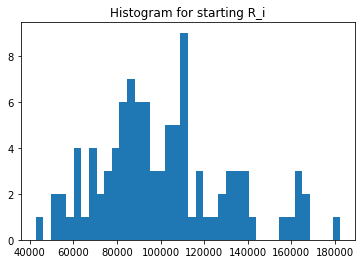

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([234991.00271916, 220484.87719685, 221766.87719685, ...,
        71376.60537311,  70589.60537311, 129775.30901628])

In [24]:
experiments.UNI_Si.unique()

array([10000., 15238., 15728., 15210., 14262., 13473., 14238., 16772.,
       14260., 13563., 14827., 12611., 13995., 14537., 15539., 15941.,
       15105., 14536., 15268., 15042., 17249., 12977., 18701., 16593.,
       14518., 14994., 15630., 13514., 15519., 15772., 13607., 18414.,
       14280., 14886., 14306., 13843., 14520., 14396., 15496., 16012.,
       13449., 15548., 15280., 16103., 17258., 13969., 17114., 13687.,
       15668., 14544., 13407., 16498., 12983., 15523., 17248., 14263.,
       15249., 15933., 18483., 14353., 15442., 15740., 14023., 12911.,
       13695., 12890., 14185., 14344., 14418., 13484., 15277., 15432.,
       14221., 13955., 15119., 19666., 12874., 13660., 14048., 14825.,
       15118., 14635., 14800., 15066., 12904., 14723., 13099., 15536.,
       16411., 14246., 14628., 17554., 18048., 16594., 16291., 17119.,
       13726., 15316., 14776., 18098., 18856., 15146., 15293., 14244.,
       16237., 15333., 14822., 14270., 18140., 16865., 20934., 13460.,
      

In [25]:
experiments.UNI_Qj.unique()

array([126330.07812691, 177236.16996651, 178393.16996651, ...,
       150576.02745761, 149623.02745761, 148682.02745761])

In [26]:
experiments.UNI_Rj.unique()

array([ 63165.03906345, 153626.08498325, 152626.08498325, ...,
       156470.5137288 , 157470.5137288 , 158470.5137288 ])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([ 63165.03906345,  84923.05324348, 116626.08498325,  75712.47751304,
       132046.10051326,  83208.87345698,  67930.26018656, 103287.49423241,
        79304.65485187,  70835.0546442 ,  86507.80377551,  60451.16988137,
       183238.25473686, 102250.45421452, 157670.46393556,  66740.52171809,
        74439.70910161, 129108.38140364,  63442.84106905, 129273.91133498,
       145655.17633366, 203603.89426884, 123752.39939971,  72504.54004228,
       122517.9231894 , 120984.18084661,  72878.63247634,  61158.05716419,
       107196.4876564 , 110119.84649385, 116603.55162645,  59346.46919369,
       108470.5137288 , 107662.57745148, 152850.35527864, 128888.06274238,
       126081.64059932,  65141.34294745,  66931.17378188,  93003.37329919,
       106176.31014314, 118461.57947979, 108801.62628614, 107830.23309029,
       165383.63001383,  75967.60527887,  77550.68873137,  74197.58905611,
       109980.09712264,  70637.8515887 , 116953.60063319, 111902.14637153,
       130220.87599479,  

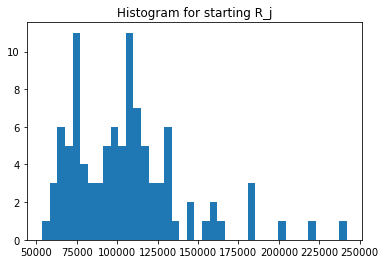

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([117495.50135958,  90450.43859842,  82286.50855935,  90966.24299436,
       112290.1753212 , 103201.2395389 , 136945.82644319, 112969.63603961,
       111351.95223329,  68824.92112422, 135294.92838467, 118128.51273943,
        99562.84804397, 182437.27830573,  76154.65308934,  82257.98971196,
        92933.55858926,  94151.63401275, 102216.11620354,  89910.38007817,
        52458.35073539,  62973.06639424,  79621.8676403 , 160920.31283036,
        69829.86392356, 103666.06970946,  93117.88422135, 137252.89254509,
        83802.88617593,  85595.58086518,  86112.1172684 , 139745.82756865,
        70940.73323924, 134599.42759769,  56424.30268655, 111799.40341522,
        96315.72342097, 111092.75954931, 127086.90640676,  84516.21258366,
       106598.552709  , 105720.10723748,  84970.44067322,  76917.92516885,
        79163.38693247, 140935.80428436,  90688.81949993,  61883.43441018,
       121962.7820952 , 161561.20028609,  84201.59076479,  67282.02216372,
       130603.02513683, 1

In [31]:
experiments.UNI_ji.unique()

array([ 63165.03906345, 116626.08498325, 103287.49423241,  84923.05324348,
        75712.47751304,  86507.80377551, 132046.10051326,  83208.87345698,
        67930.26018656,  72504.54004228,  79304.65485187,  61158.05716419,
        70835.0546442 , 102250.45421452, 183238.25473686,  60451.16988137,
        74439.70910161, 129108.38140364, 157670.46393556,  66740.52171809,
       241801.61985332,  63442.84106905, 107196.4876564 , 129273.91133498,
       145655.17633366, 203603.89426884, 122517.9231894 , 123752.39939971,
       120984.18084661,  72878.63247634,  66931.17378188, 109980.09712264,
       116616.98134039, 116603.55162645, 110119.84649385, 118461.57947979,
        59346.46919369, 108470.5137288 , 107662.57745148, 116953.60063319,
        67063.53371722, 152850.35527864, 126081.64059932,  93003.37329919,
       128888.06274238,  65141.34294745, 106176.31014314, 108801.62628614,
       107830.23309029,  70637.8515887 ,  75967.60527887, 165383.63001383,
        74197.58905611,  

In [32]:
experiments.UNI_Sij.unique()

array([7.42160793e+09, 1.05488805e+10, 8.49916728e+09, 7.72513110e+09,
       8.50176737e+09, 8.92771258e+09, 1.80831624e+10, 9.40007615e+09,
       7.56416709e+09, 4.99011925e+09, 1.07295176e+10, 7.22451033e+09,
       7.05253978e+09, 1.86542946e+10, 1.39544457e+10, 4.97259171e+09,
       6.91794707e+09, 1.21557651e+10, 1.61164625e+10, 6.00066567e+09,
       1.26845142e+10, 3.99519024e+09, 8.53518455e+09, 2.08027983e+10,
       1.01710811e+10, 2.11068155e+10, 1.14086098e+10, 1.69853748e+10,
       1.01388235e+10, 6.23808888e+09, 5.76358509e+09, 1.53692597e+10,
       8.27289416e+09, 1.56947713e+10, 6.21343555e+09, 1.32439339e+10,
       5.71599811e+09, 1.20502887e+10, 1.36825039e+10, 9.88447537e+09,
       7.14887563e+09, 1.61593560e+10, 1.07132126e+10, 7.15362651e+09,
       1.02032156e+10, 9.18074756e+09, 9.62900423e+09, 6.73301830e+09,
       1.31512752e+10, 1.14123361e+10, 6.39659321e+09, 1.11273451e+10,
       9.69042959e+09, 8.29906042e+09, 9.87537959e+09, 8.46150685e+09,
      

What are the trade sizes?

In [34]:
experiments.trade_random_size.unique()

array([1000], dtype=int64)

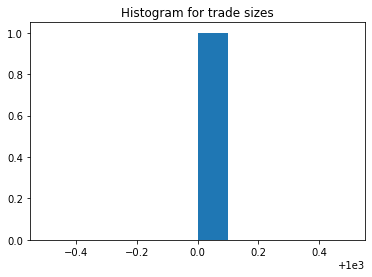

In [41]:
b = experiments.trade_random_size.unique()
_ = plt.hist(b, bins=10)  # arguments are passed to np.histogram
plt.title("Histogram for trade sizes")
#plt.xlim(-2000, 20000)
plt.show()

In [42]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


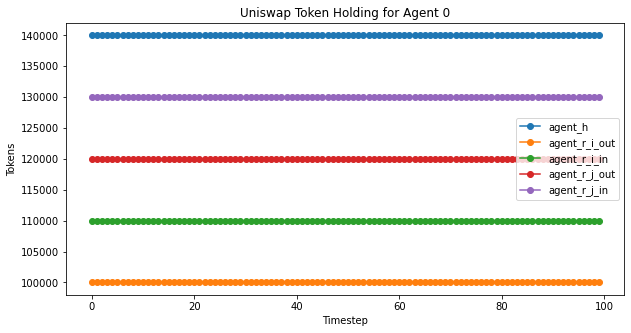

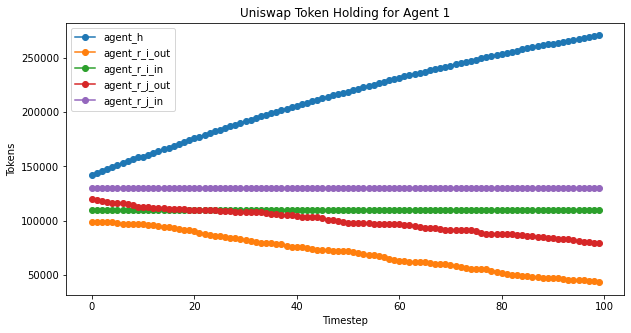

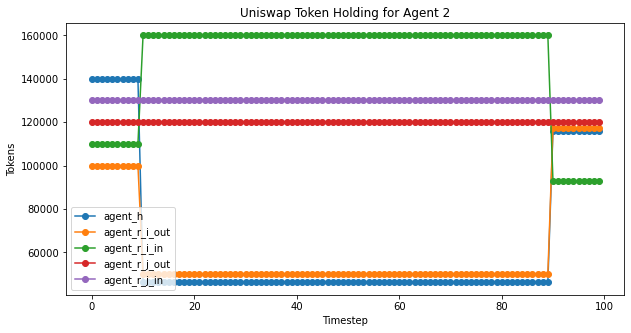

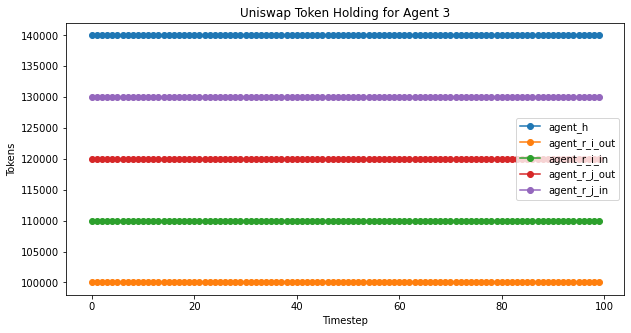

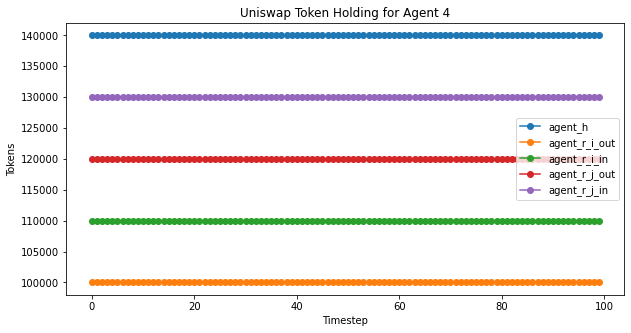

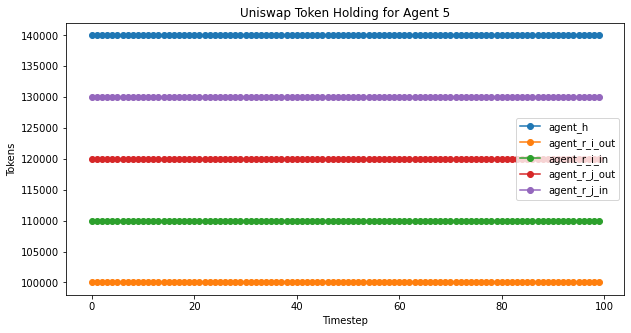

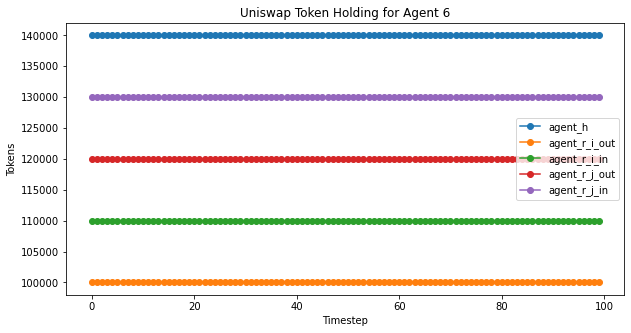

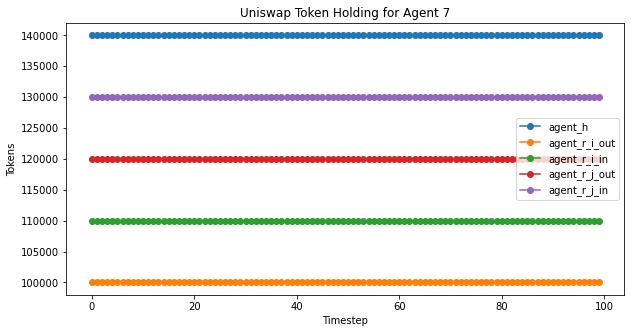

In [43]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


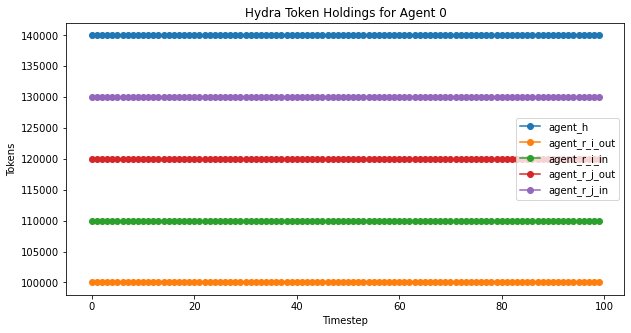

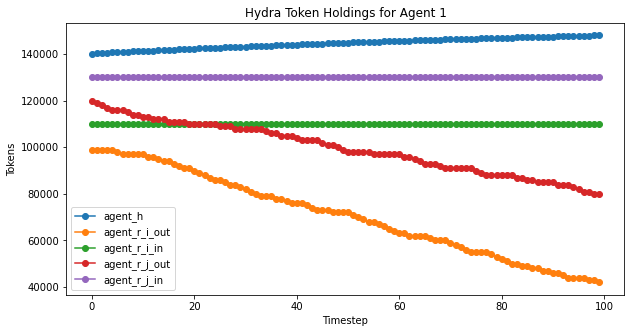

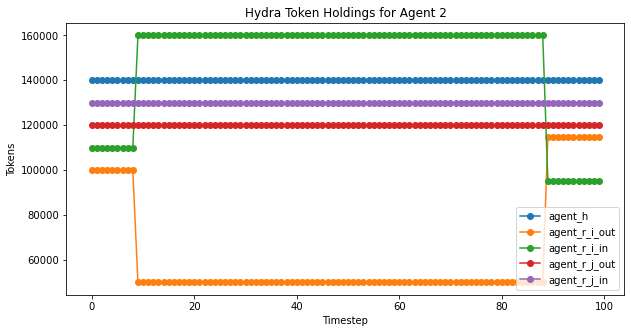

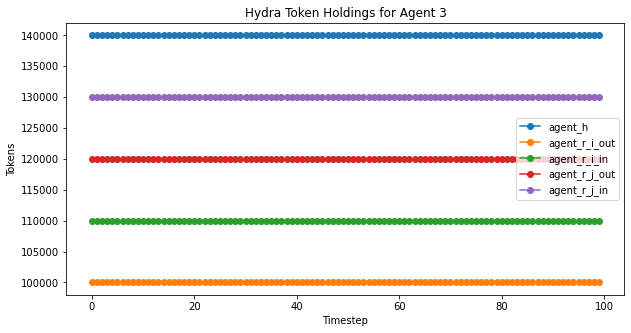

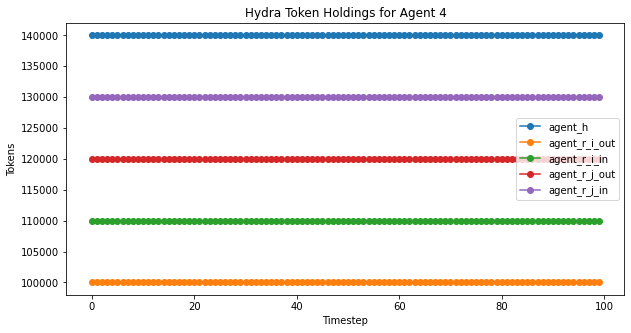

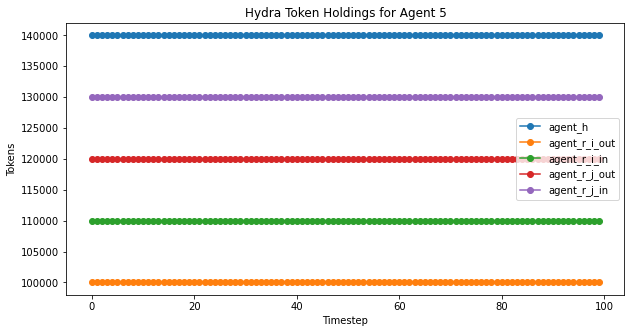

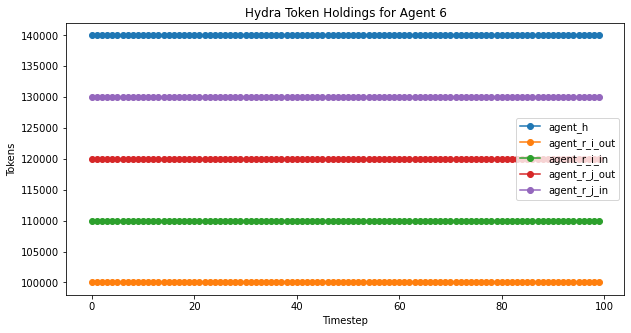

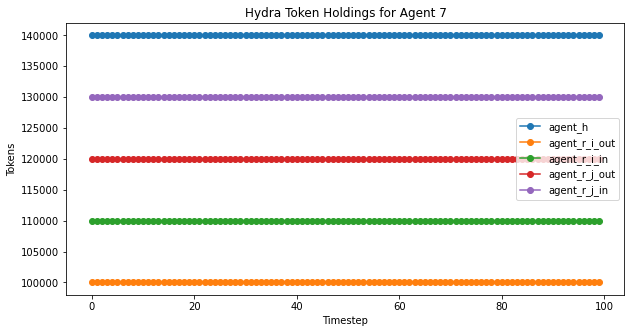

In [86]:
hydra_agent_plot(experiment2,'Hydra Token Holdings for Agent ', 100)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

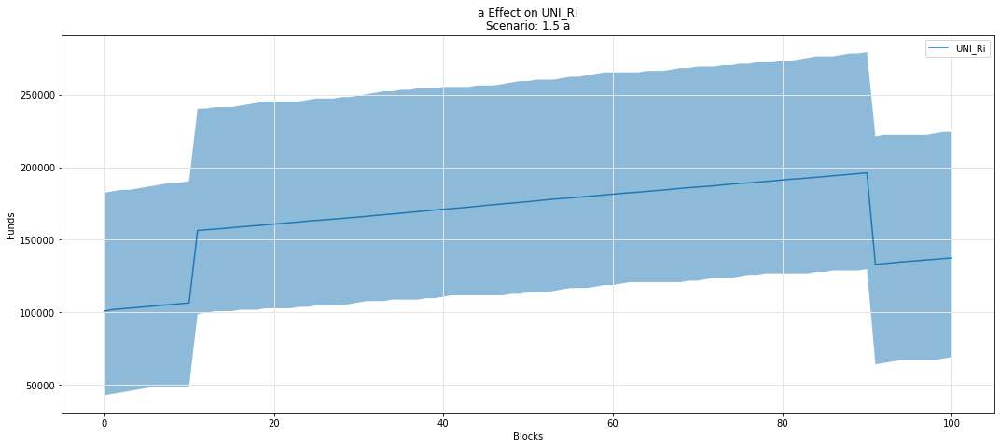

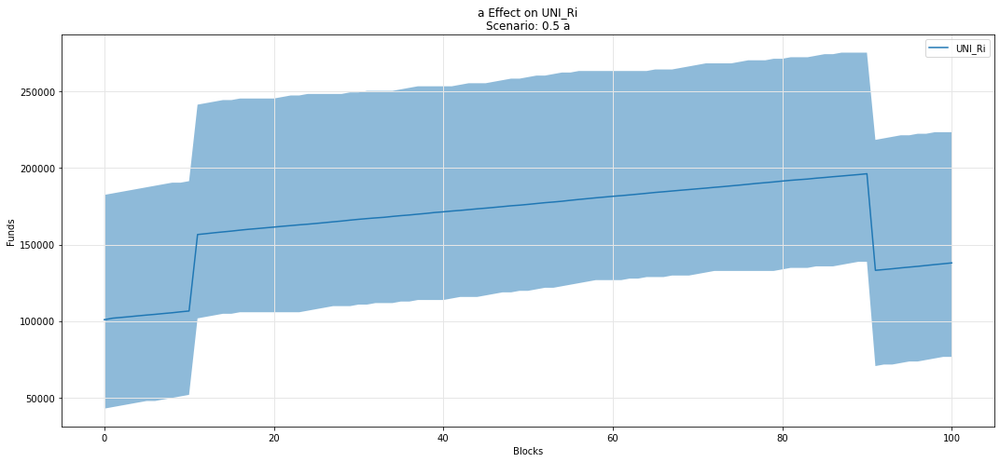

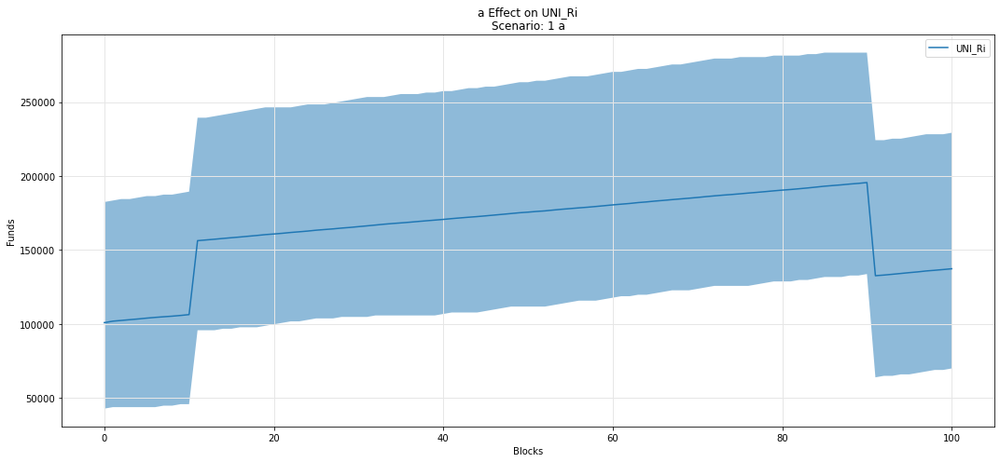

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

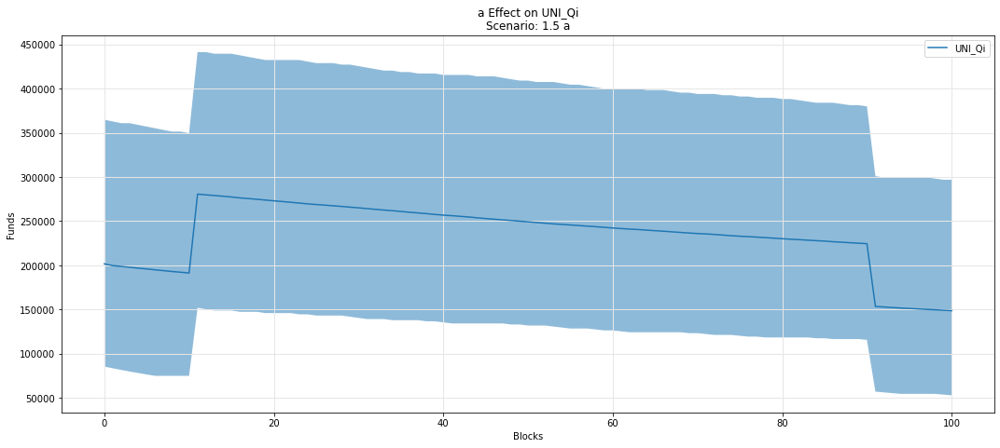

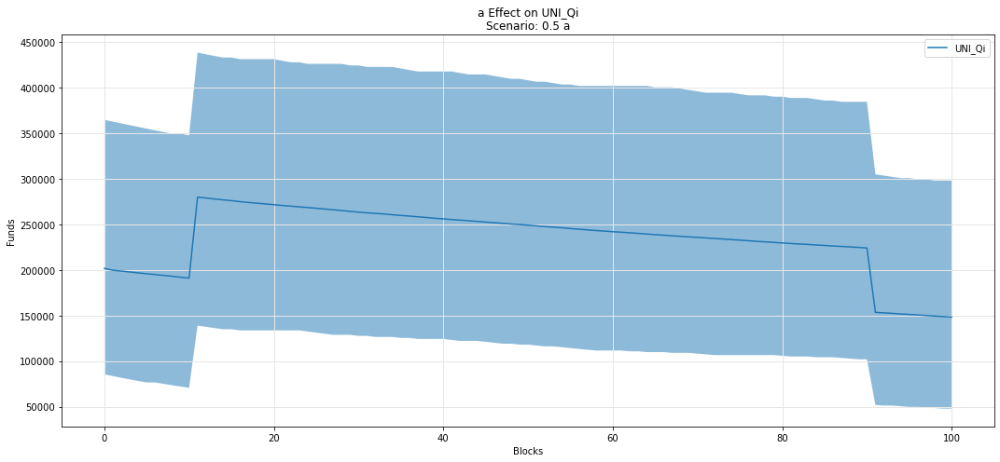

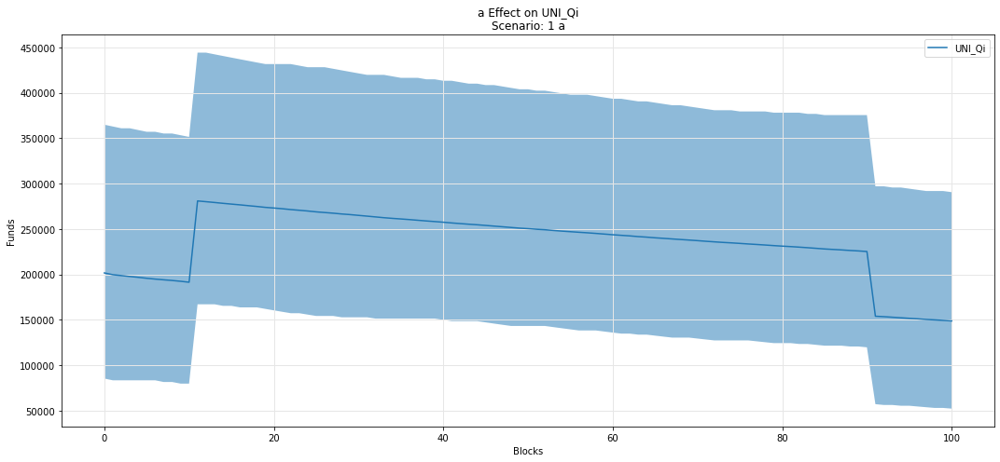

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

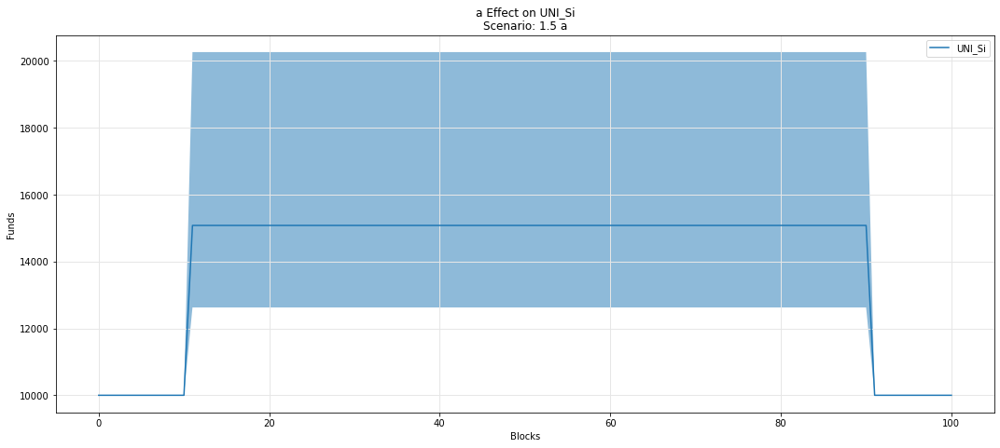

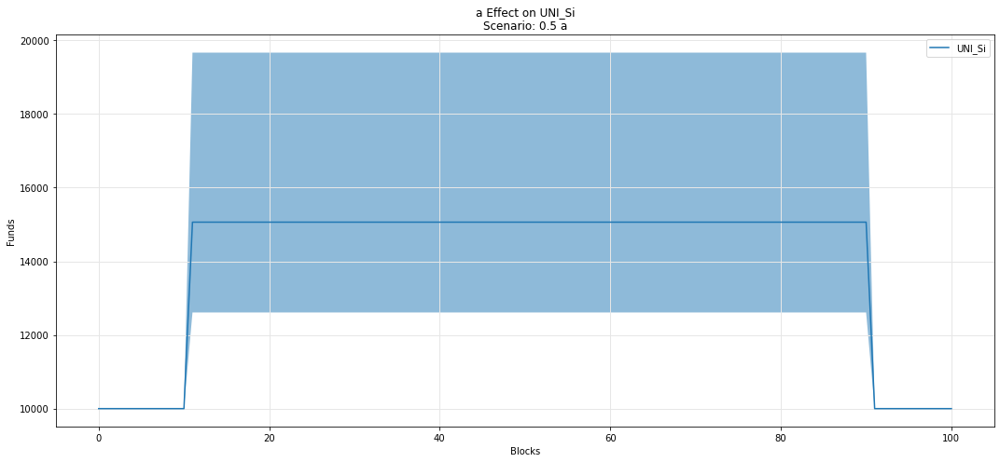

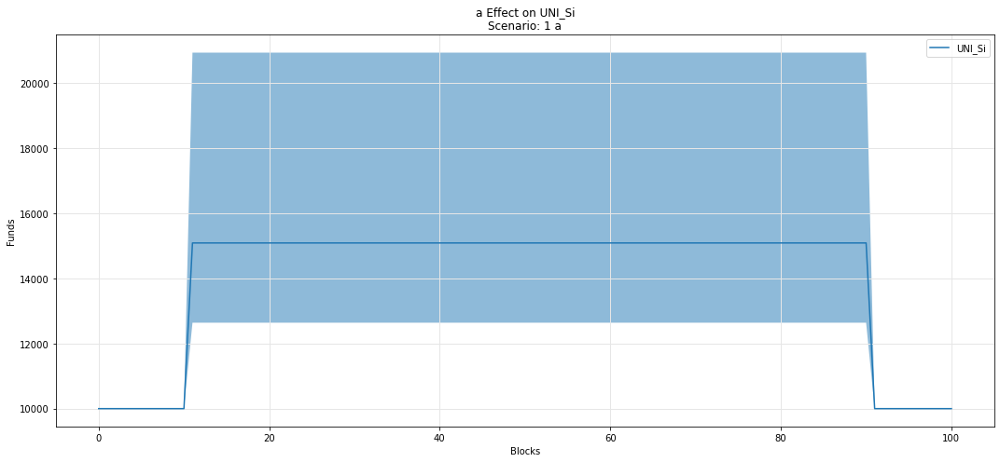

In [47]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

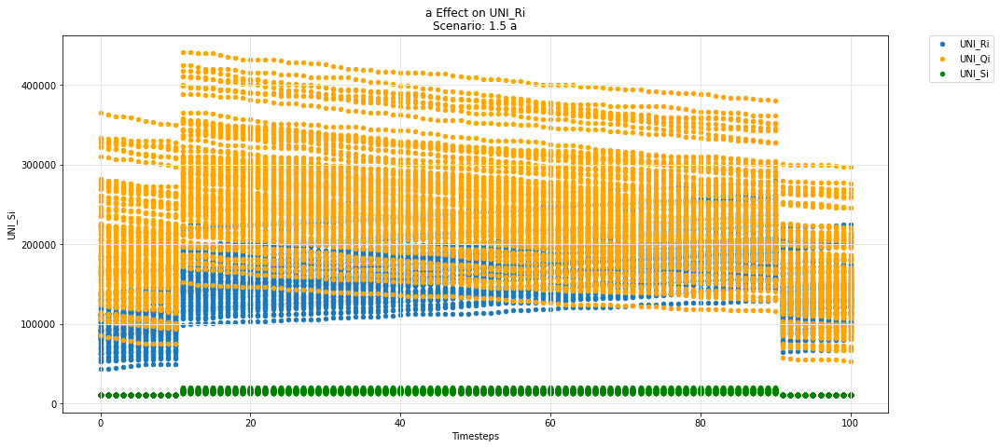

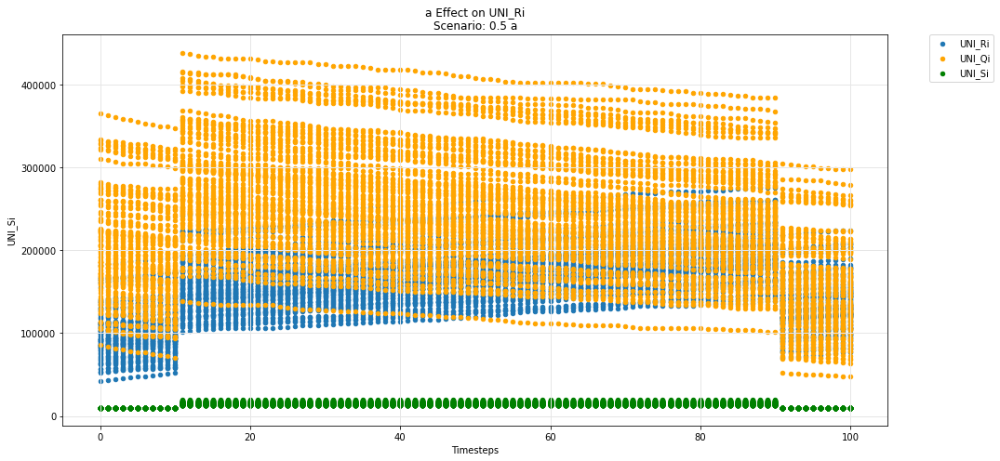

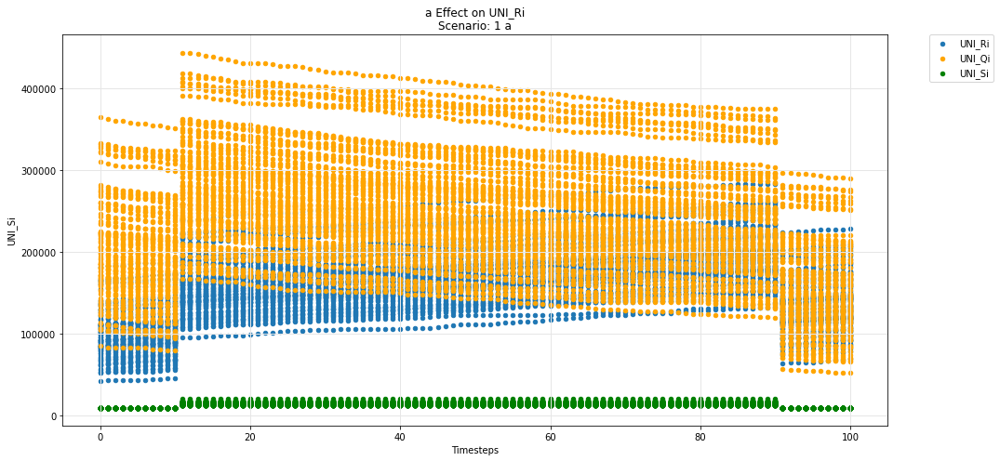

In [48]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

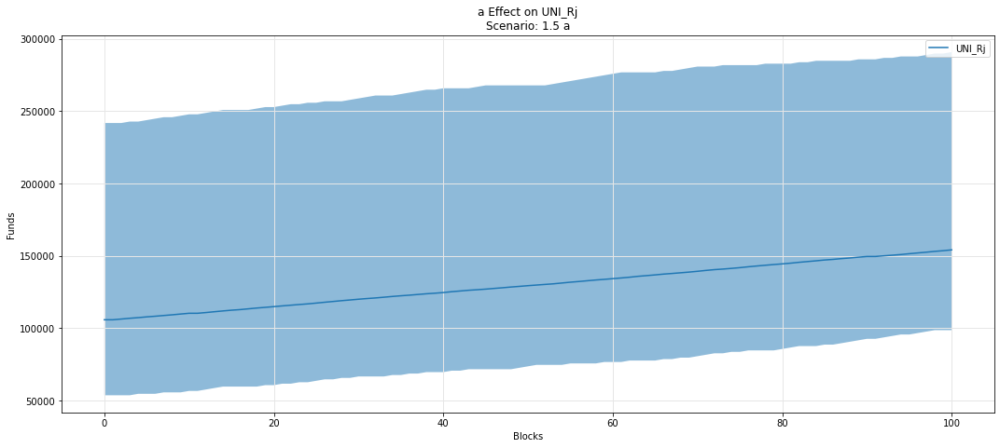

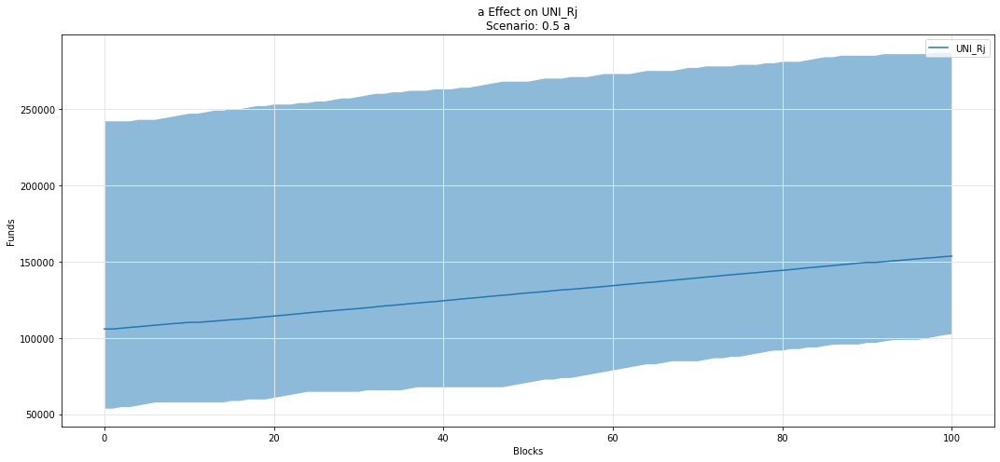

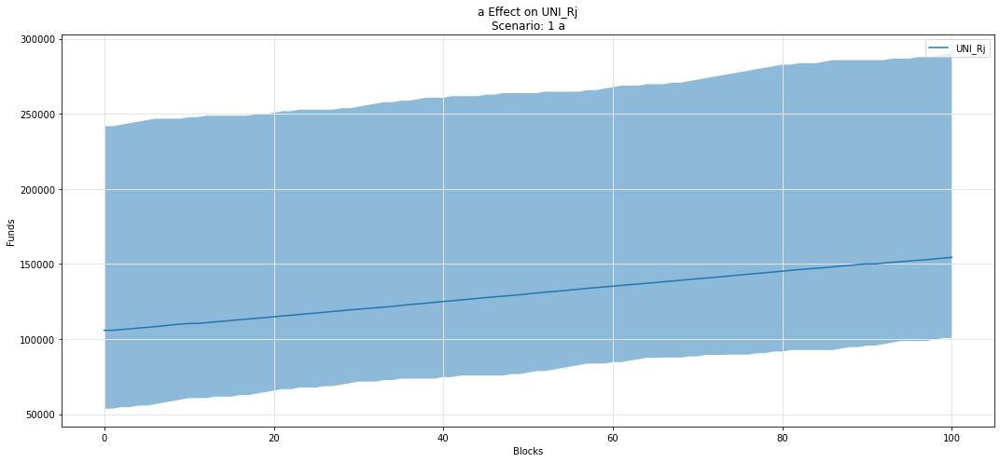

In [49]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

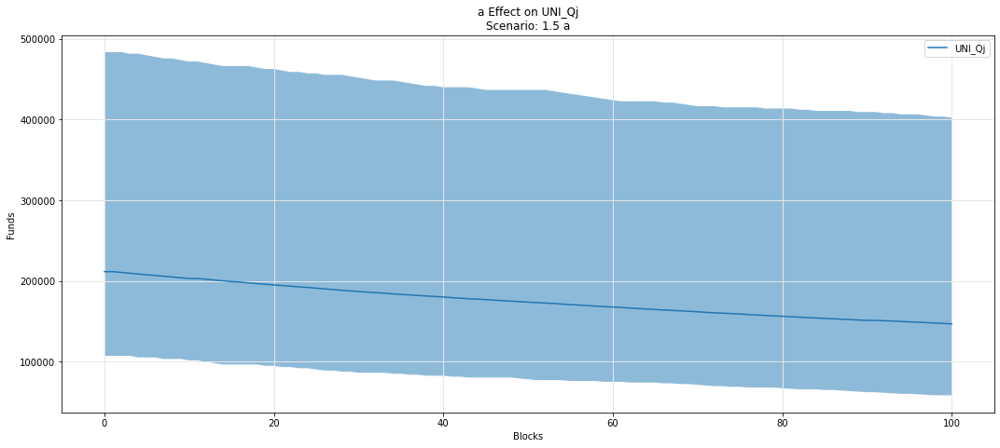

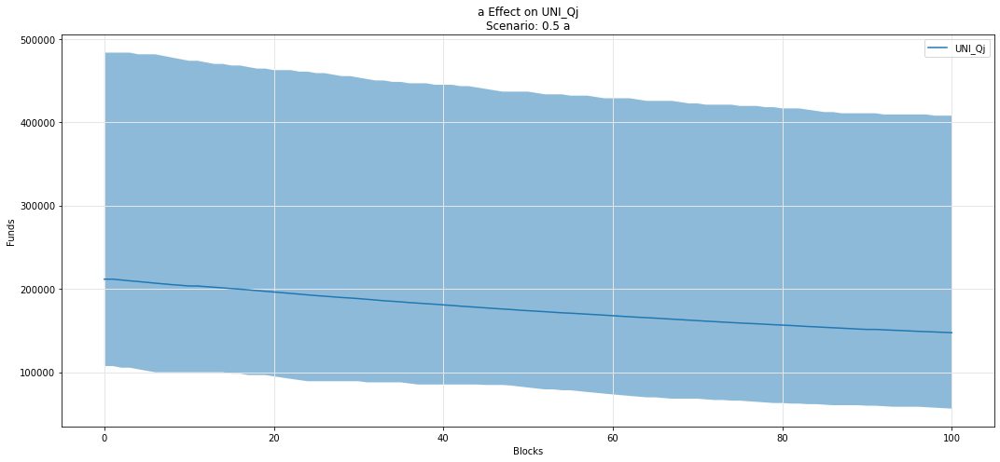

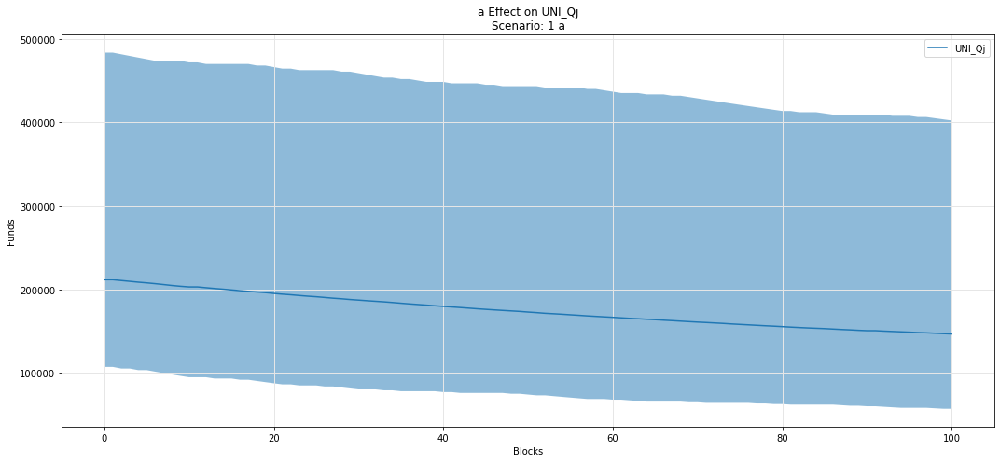

In [50]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

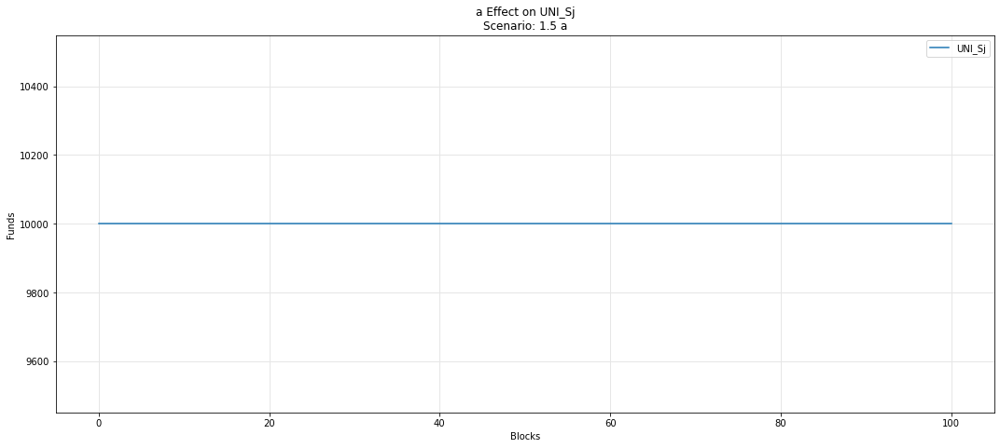

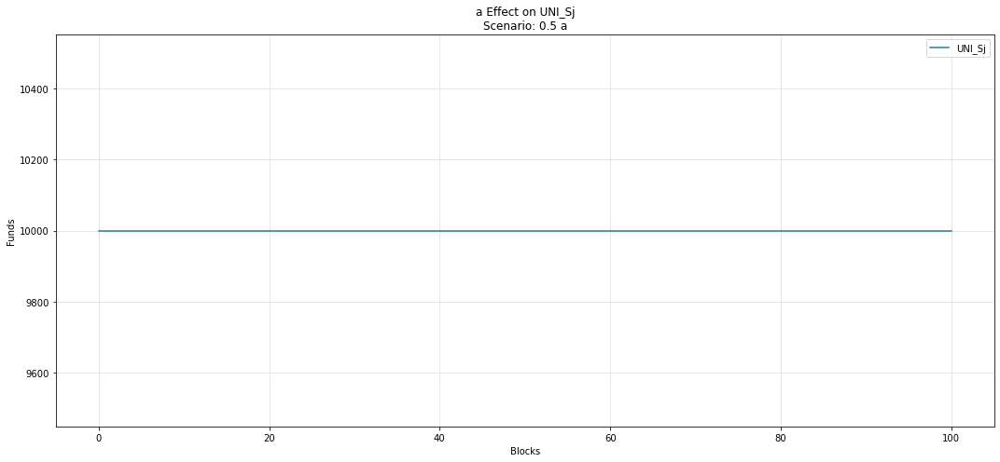

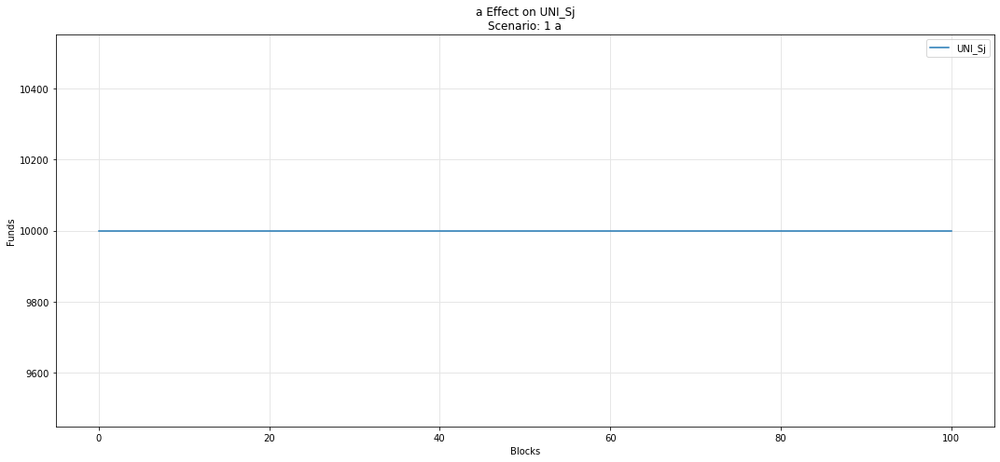

In [51]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

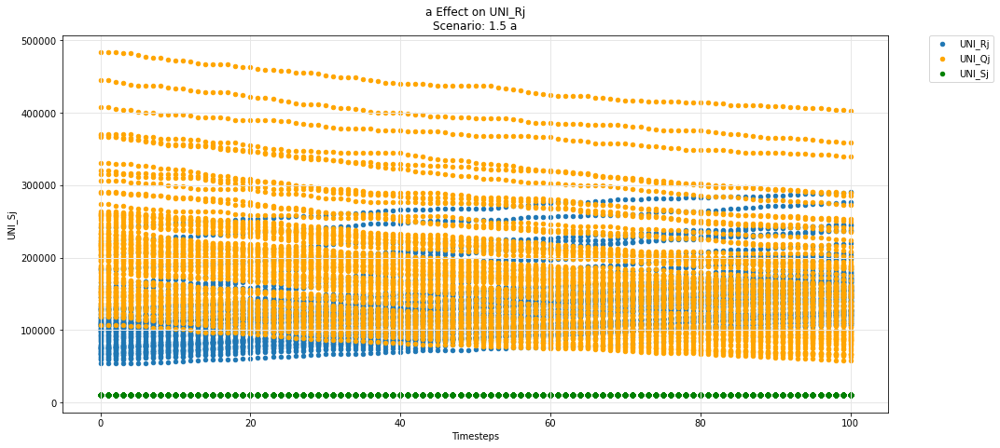

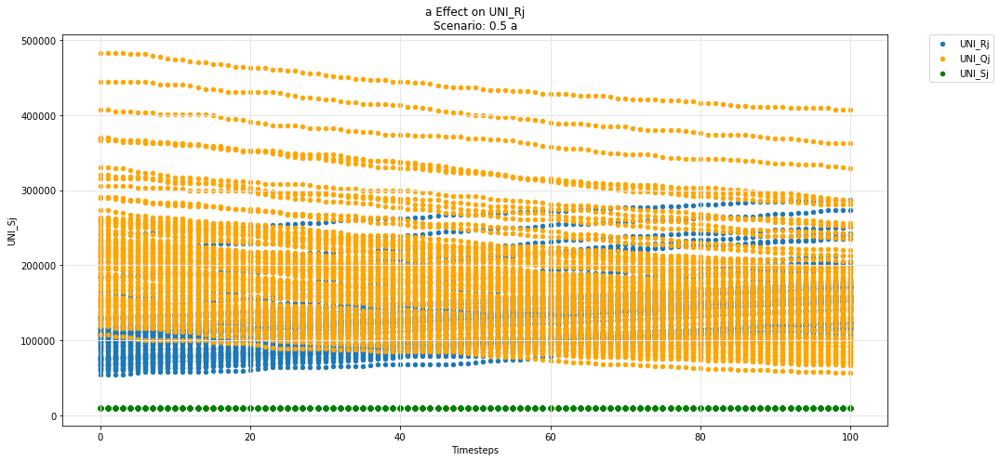

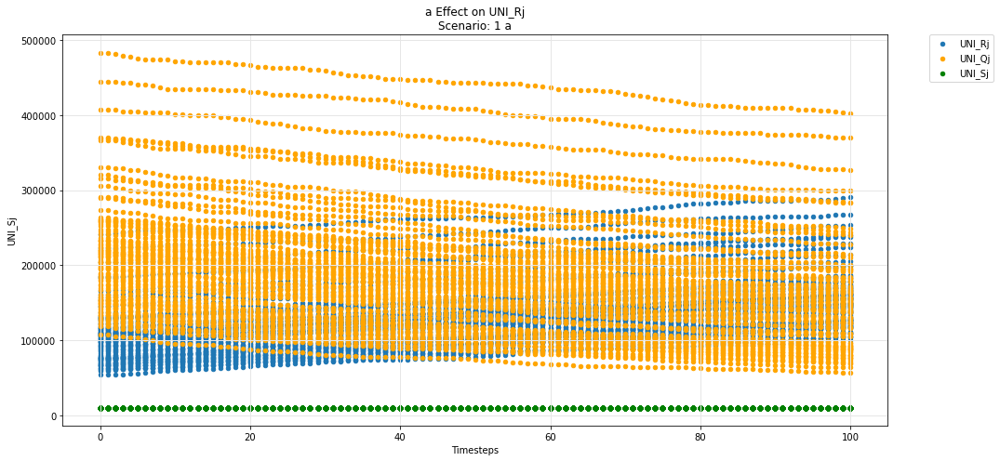

In [52]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

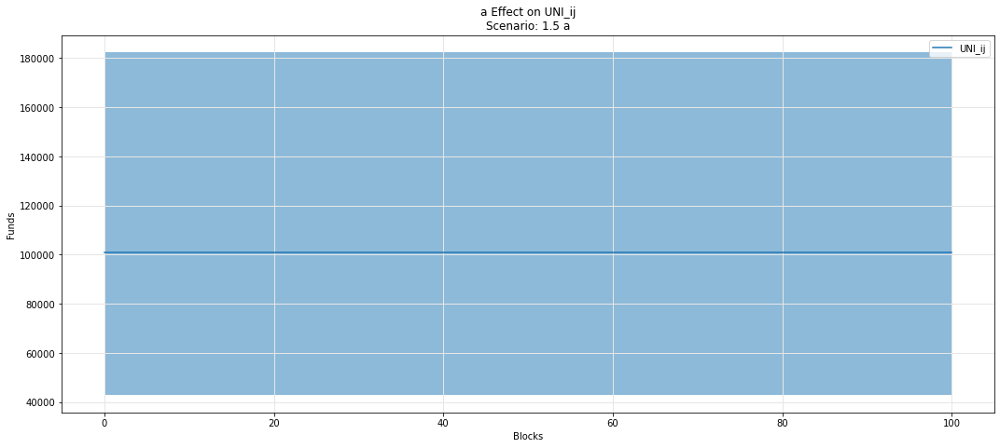

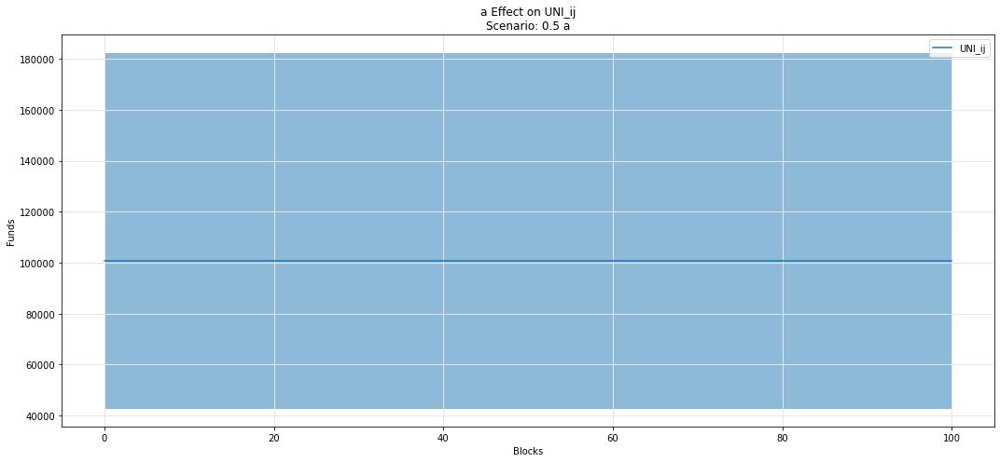

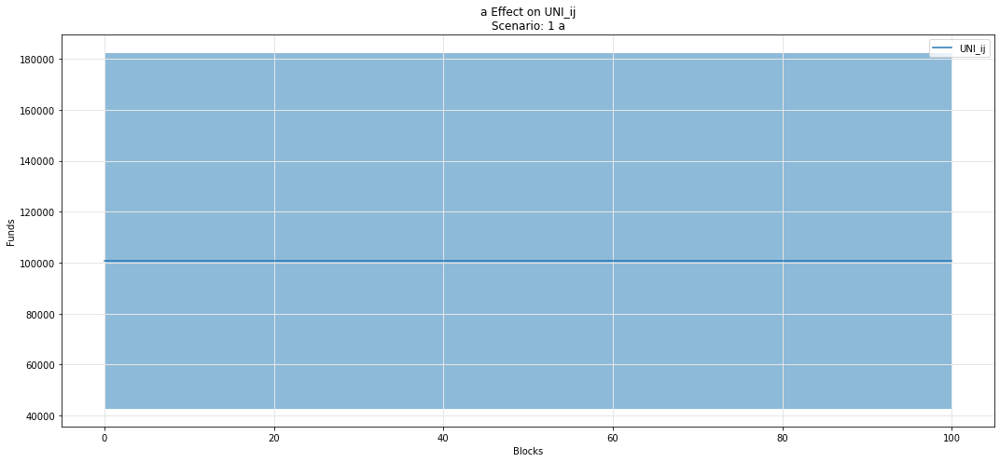

In [53]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

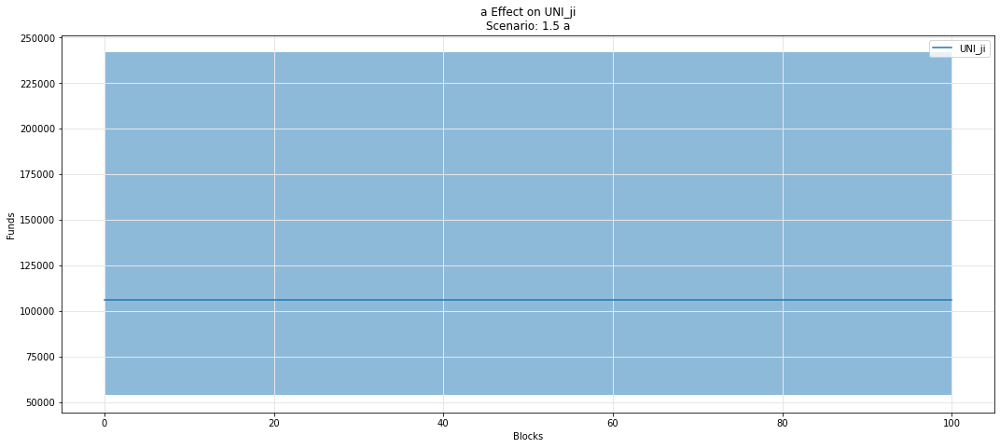

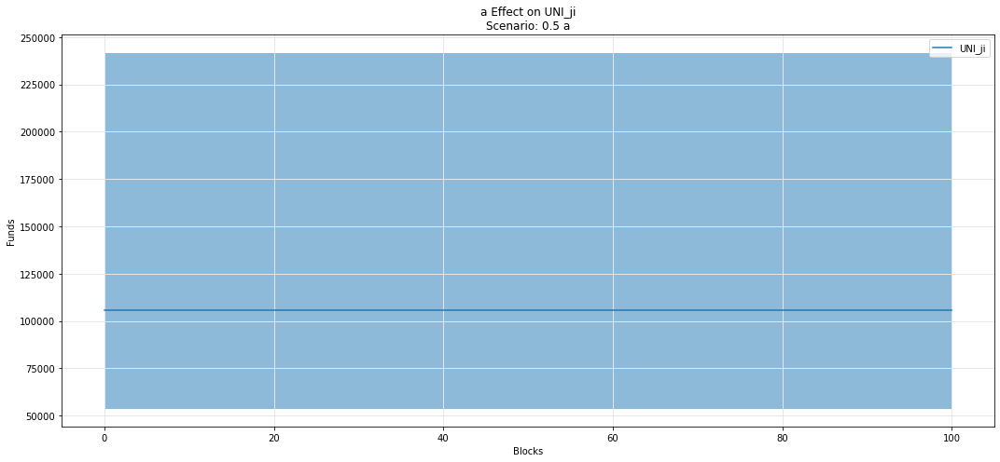

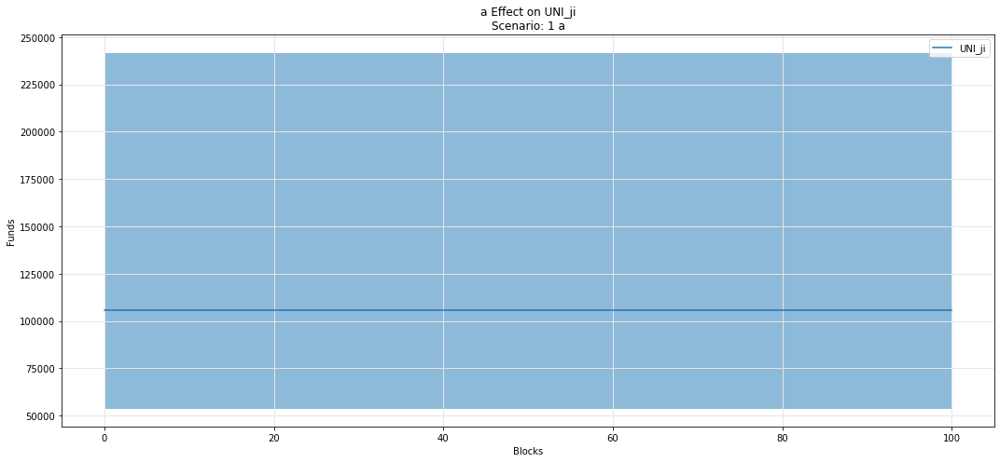

In [54]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

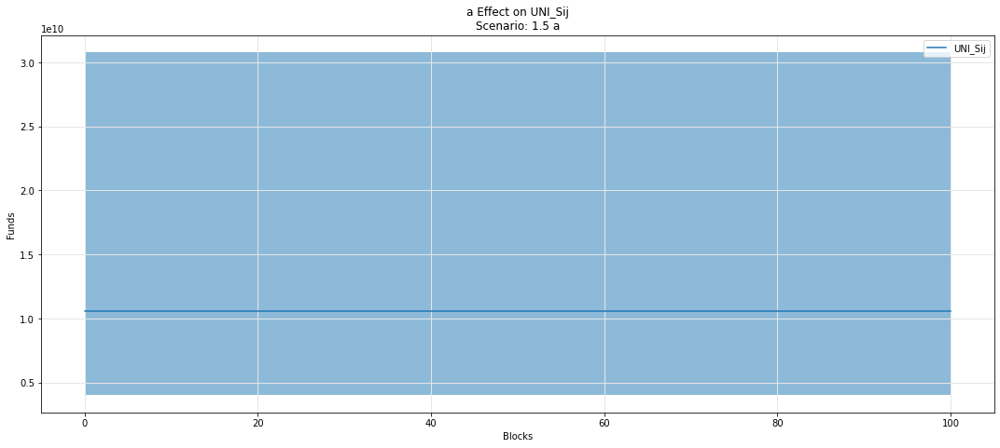

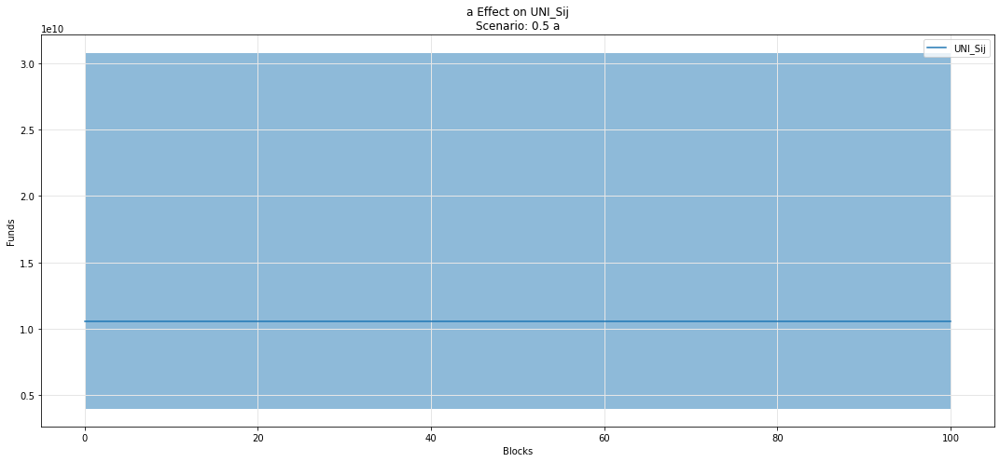

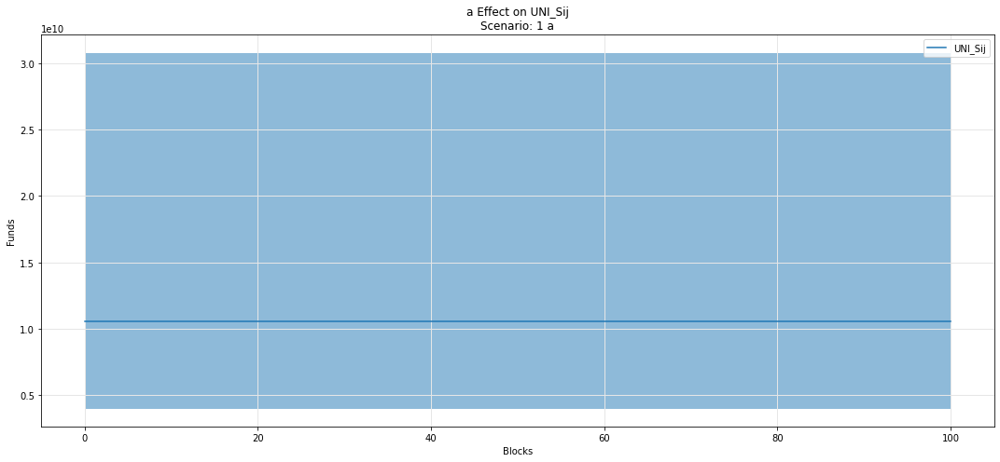

In [55]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

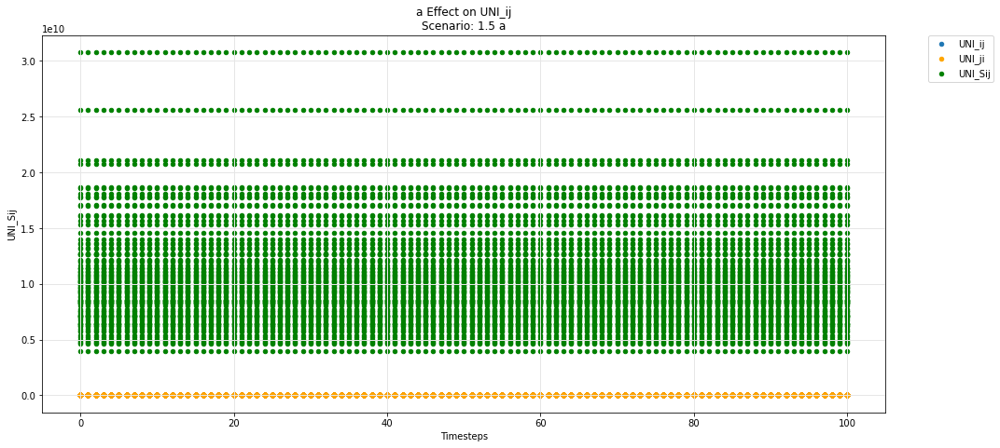

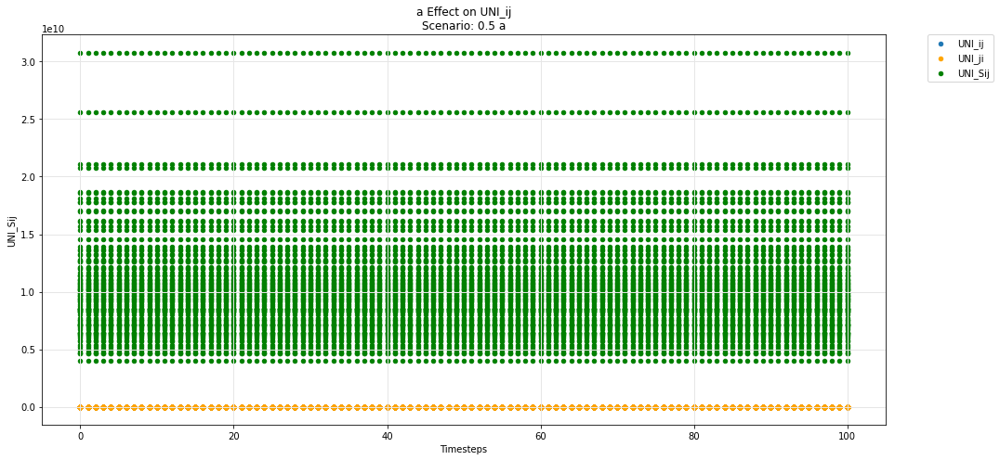

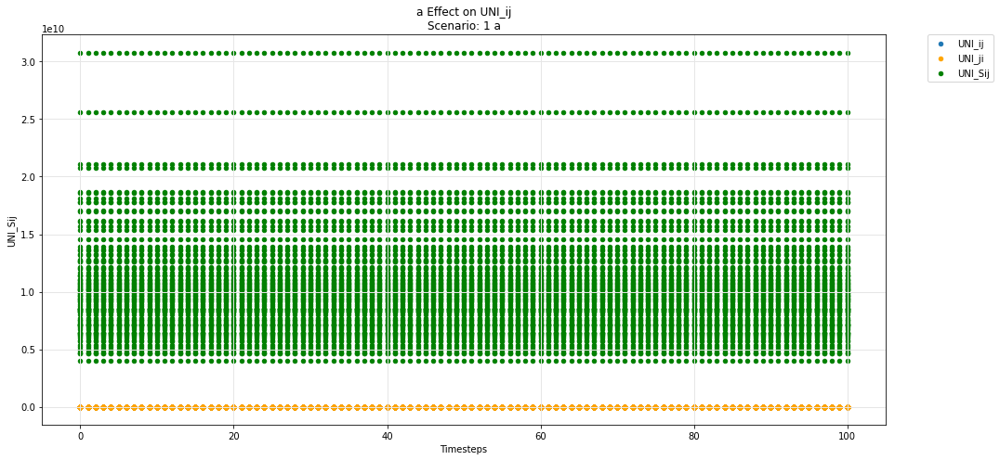

In [56]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

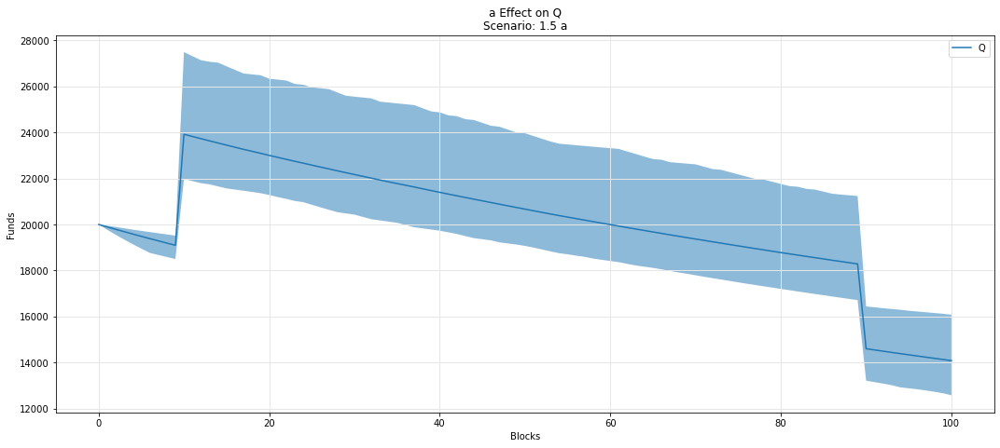

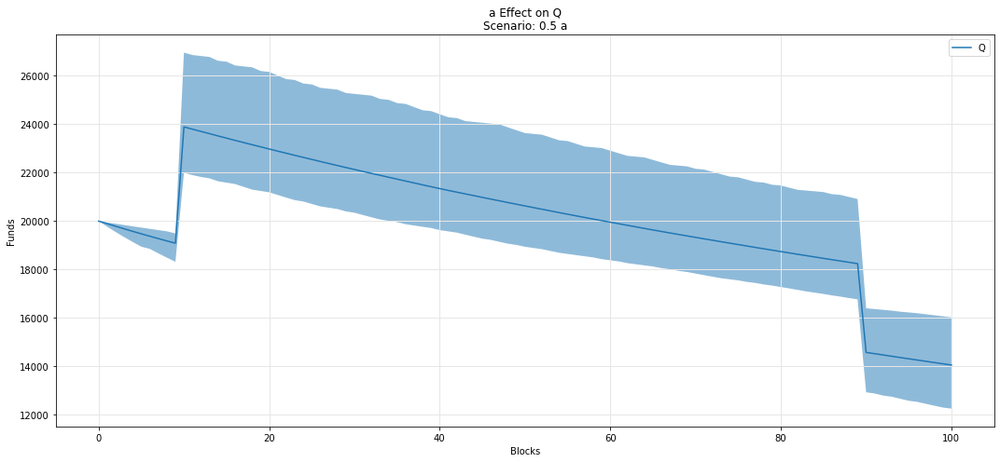

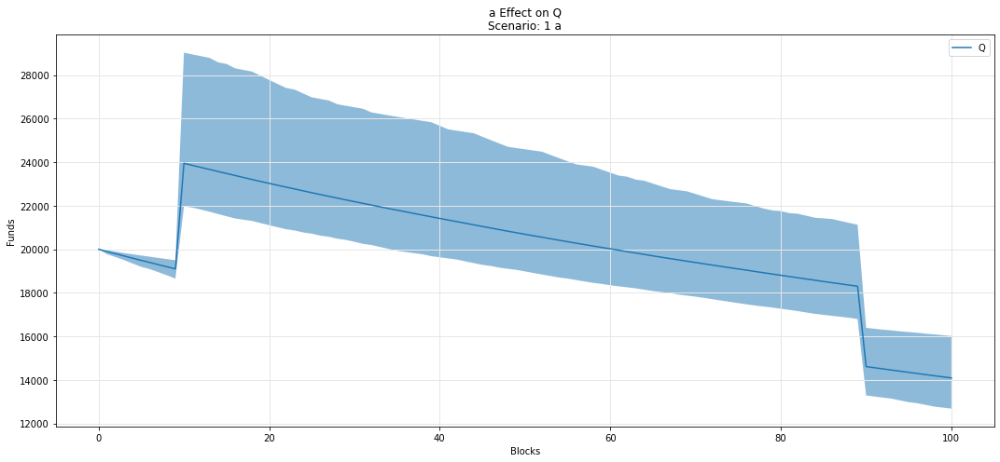

In [57]:
param_fan_plot3(experiments, config_ids, 'a','Q')

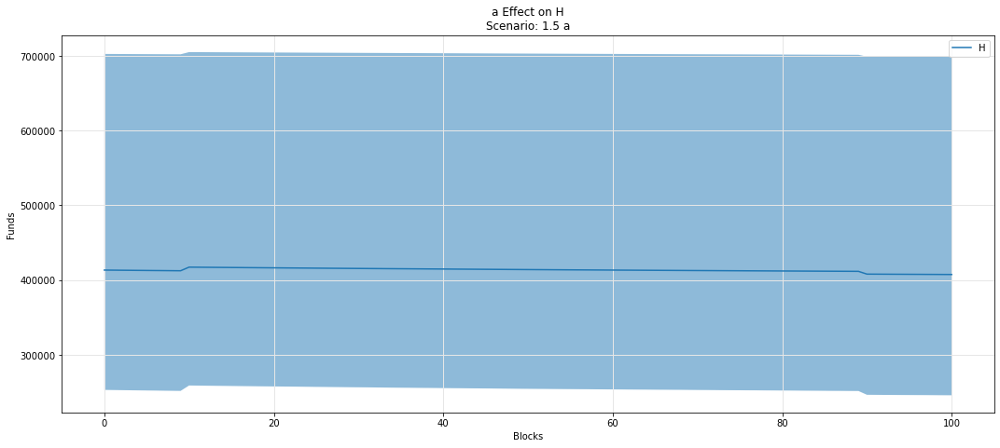

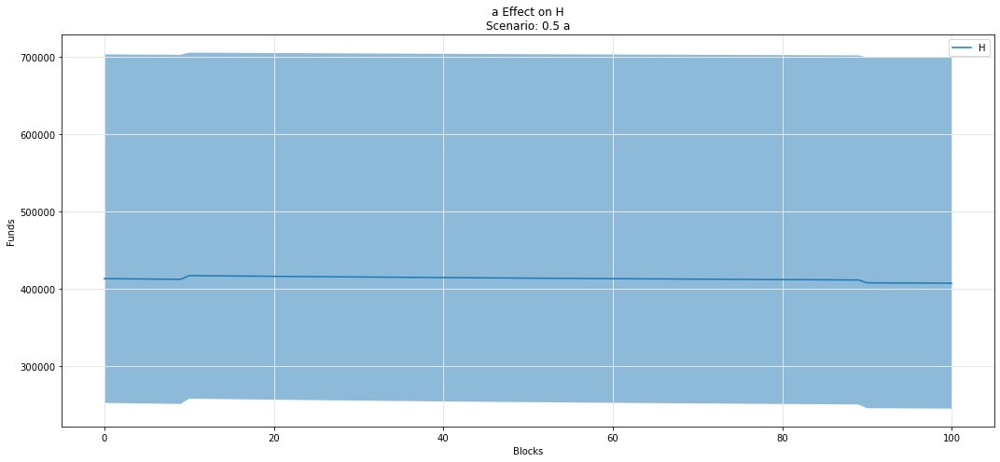

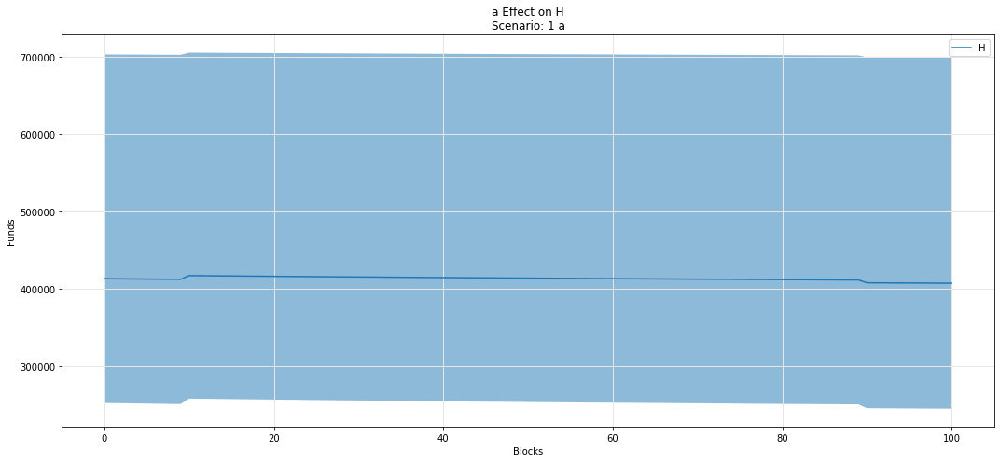

In [58]:
param_fan_plot3(experiments, config_ids, 'a','H')

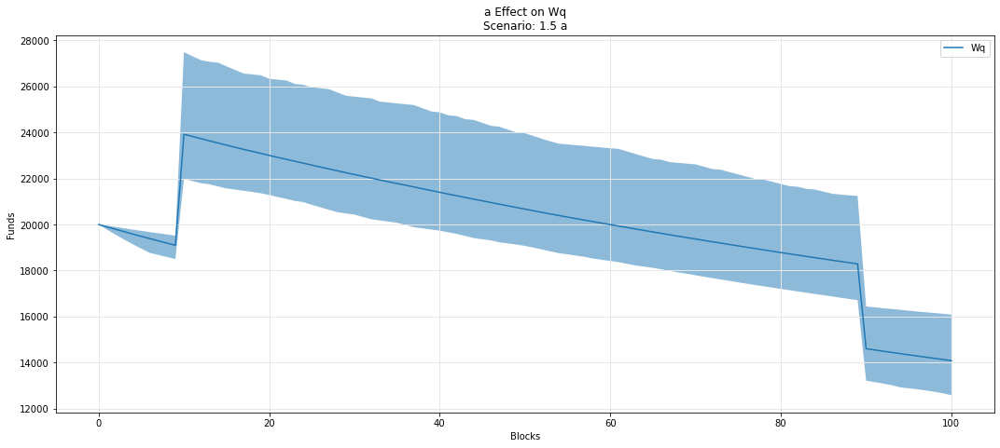

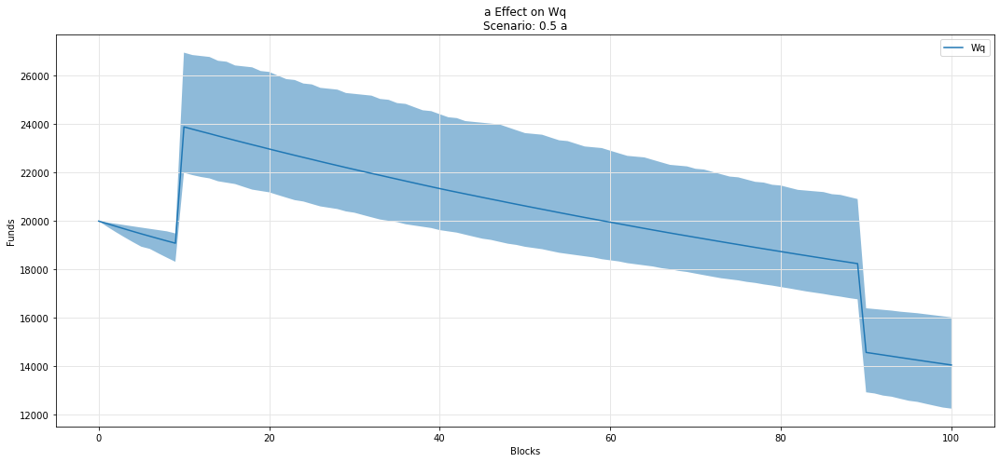

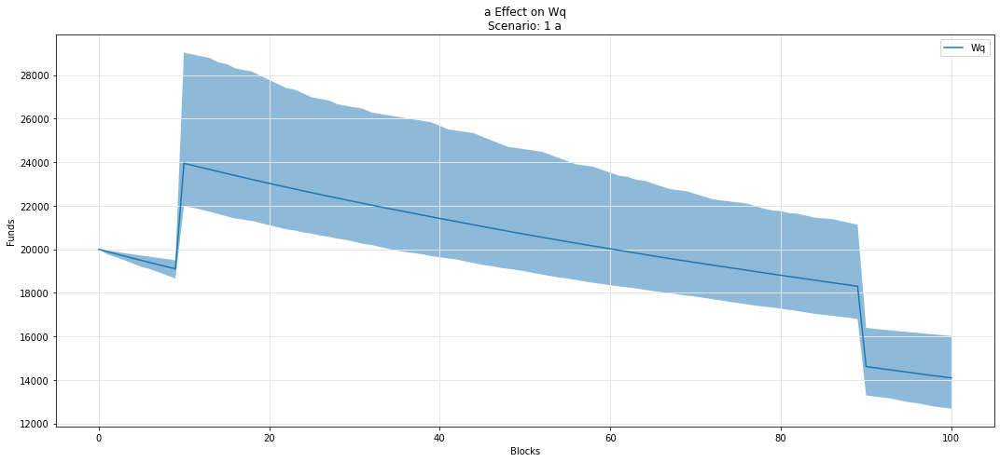

In [59]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

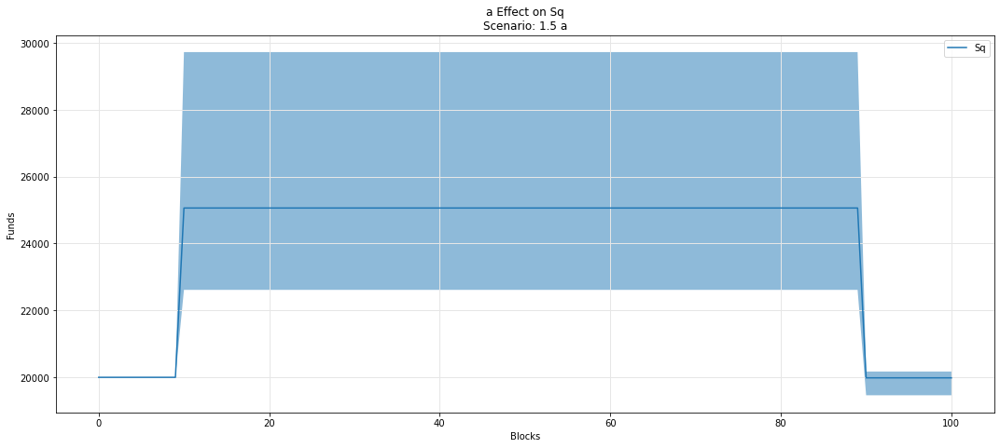

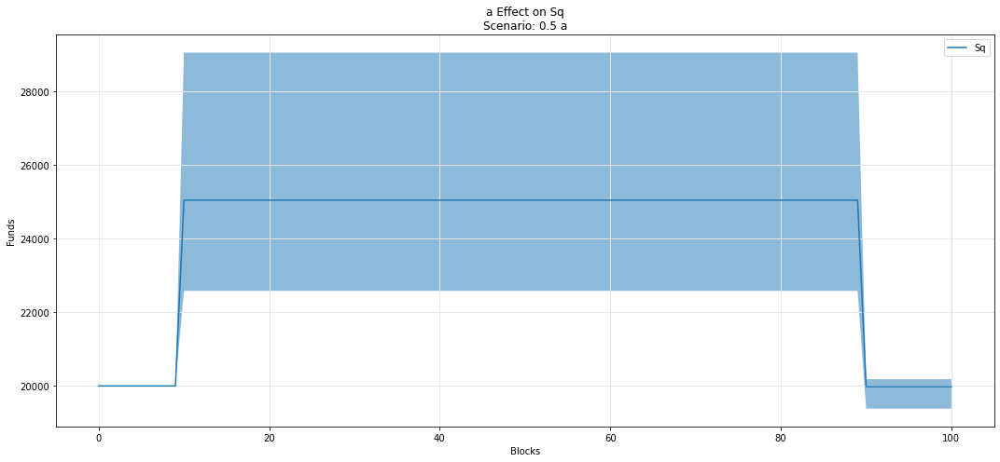

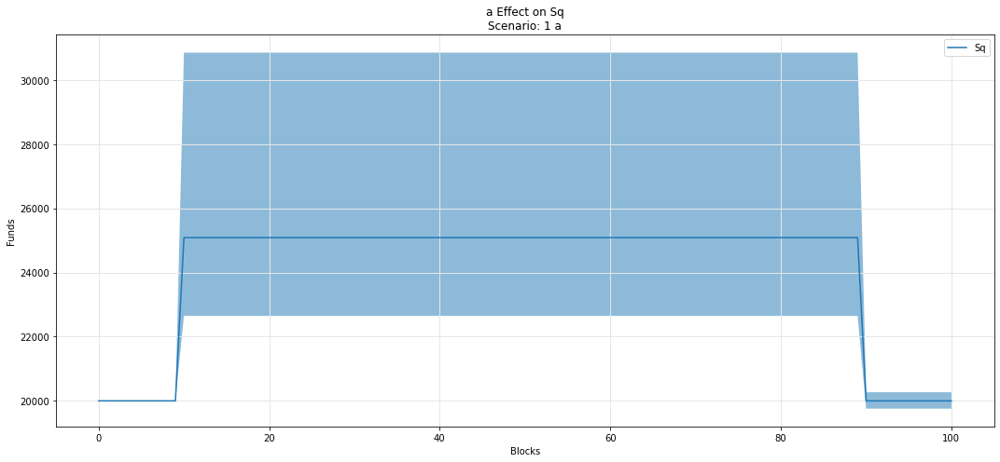

In [60]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

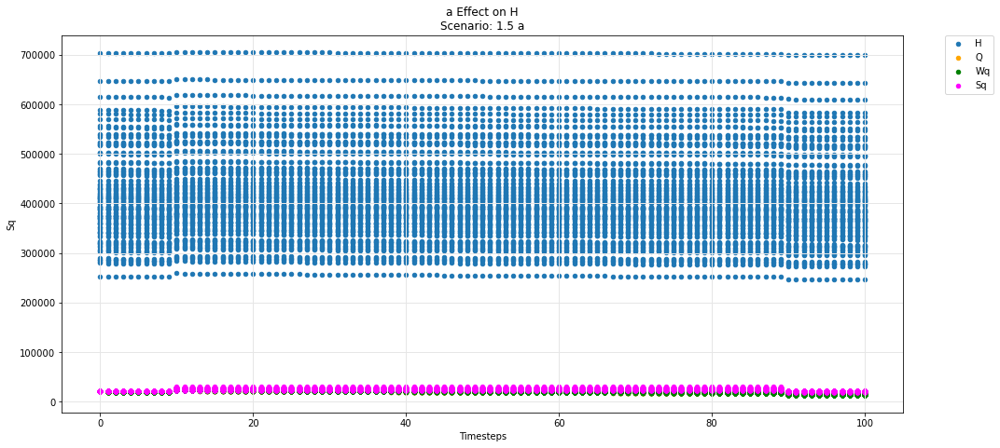

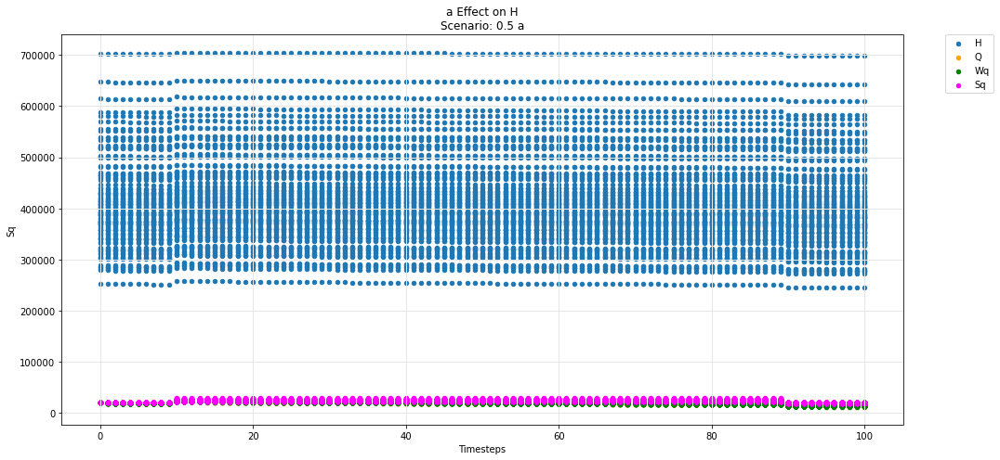

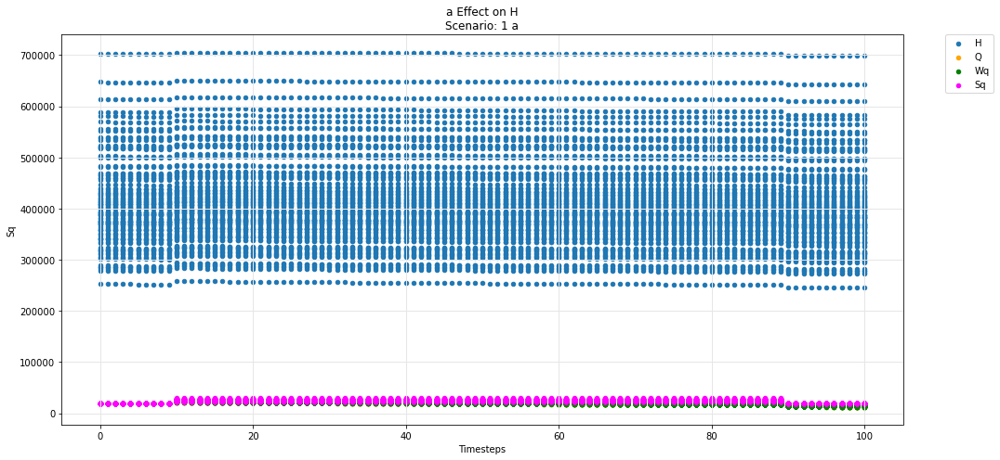

In [61]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

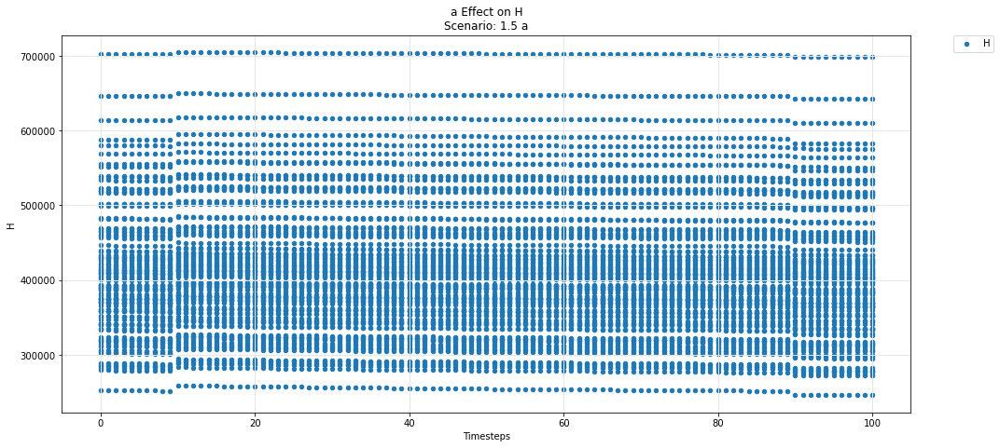

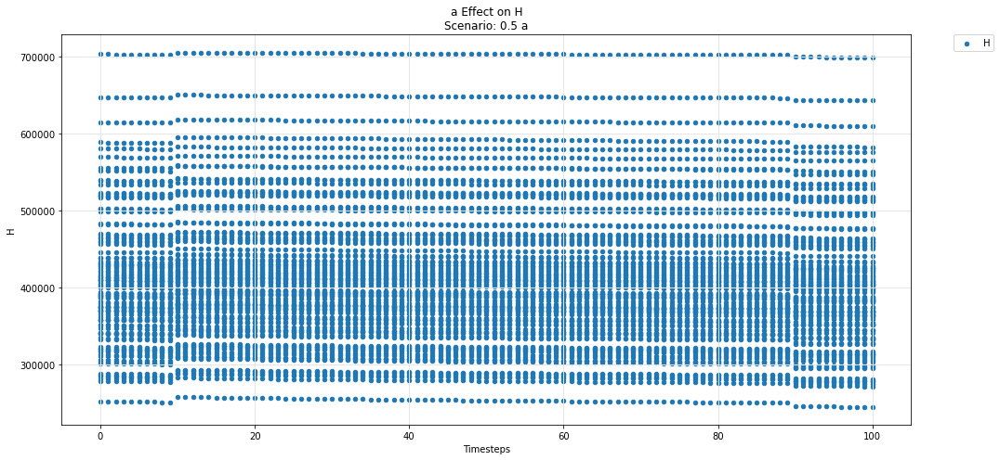

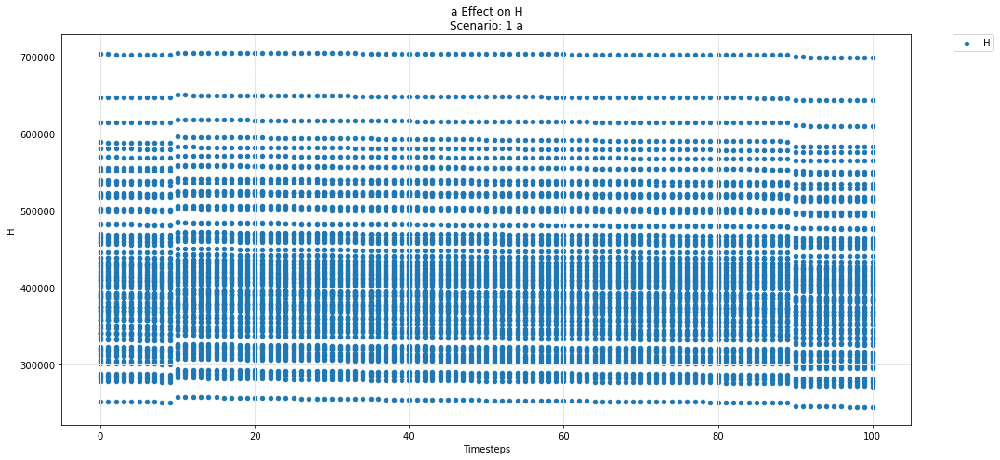

In [62]:
param_test_plot(experiments, config_ids, 'a', 'H')

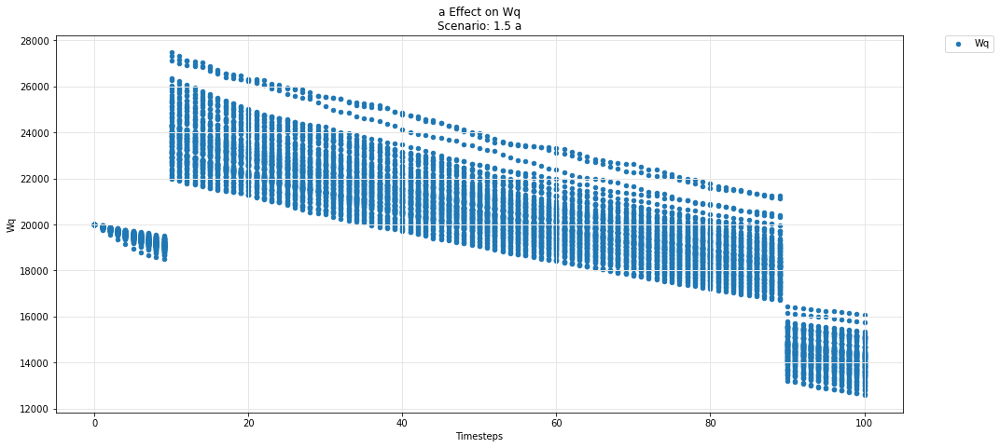

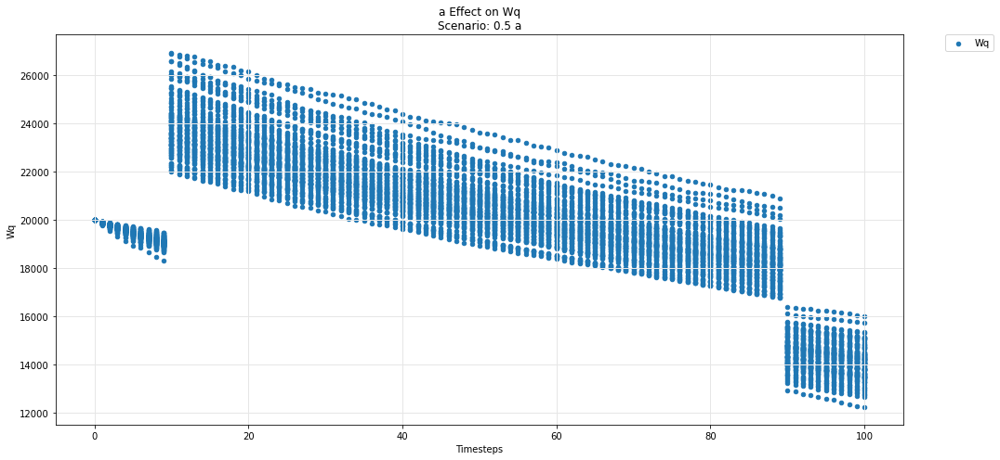

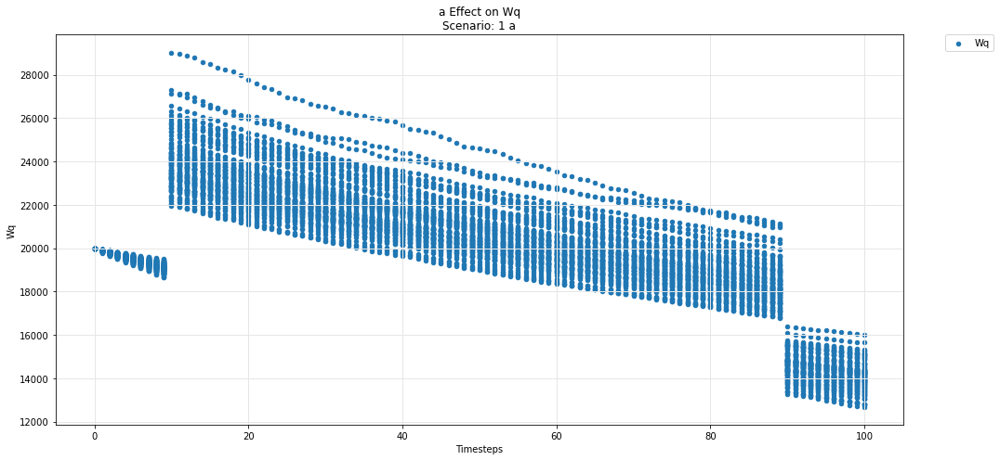

In [63]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

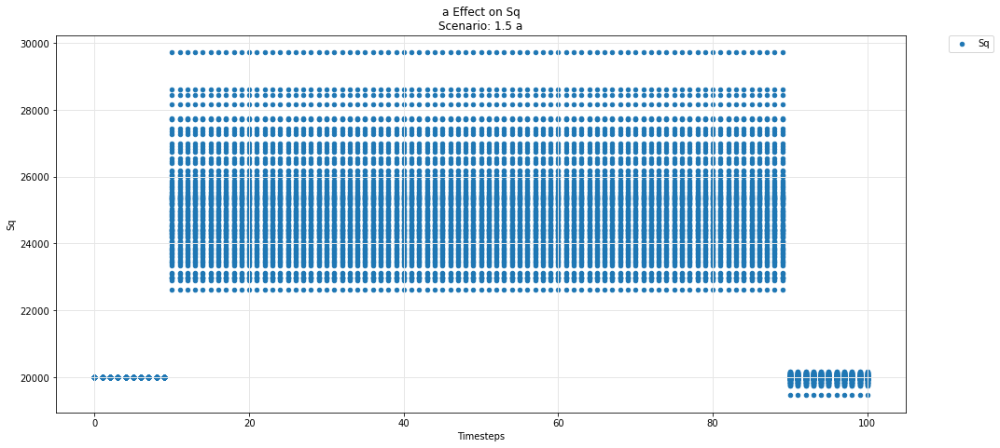

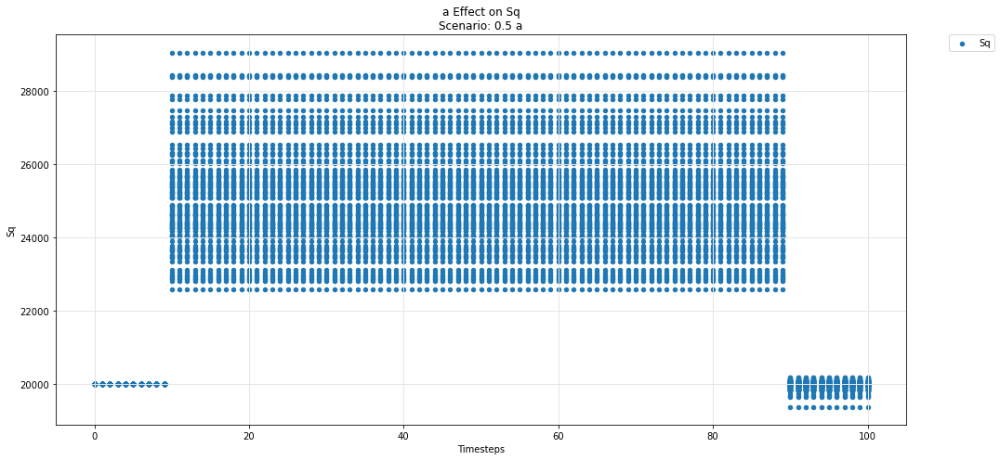

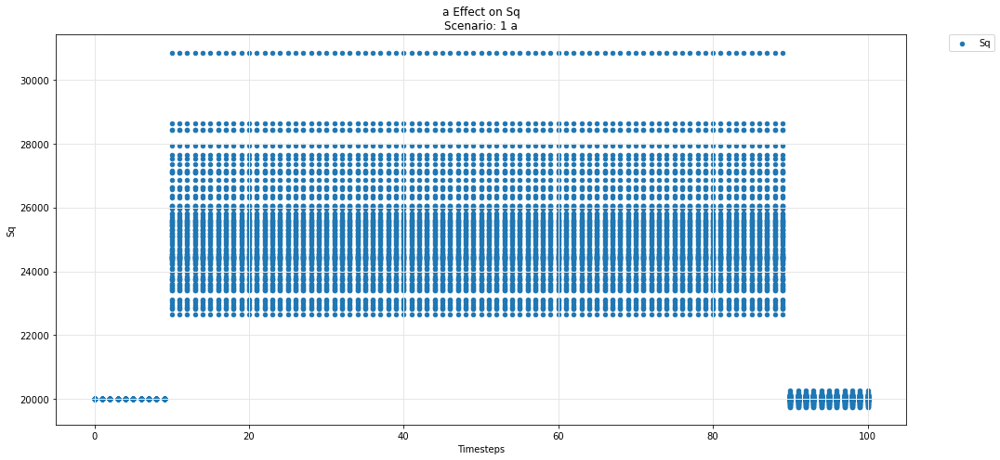

In [64]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [65]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

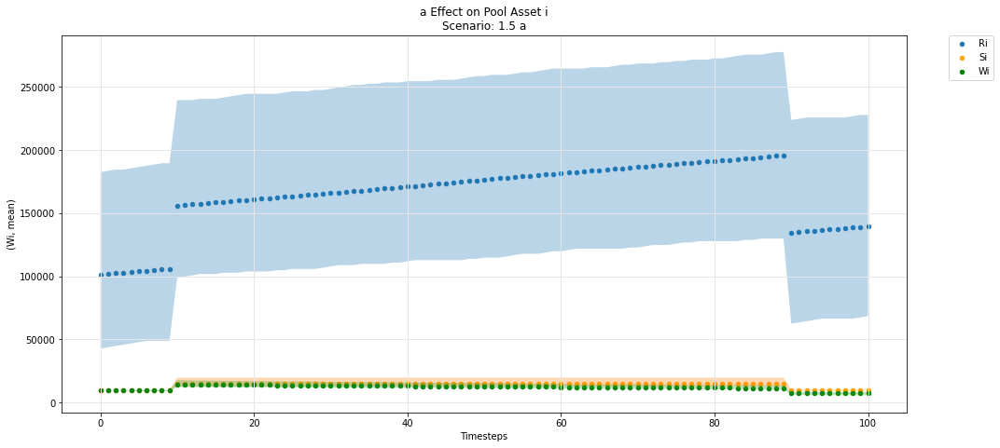

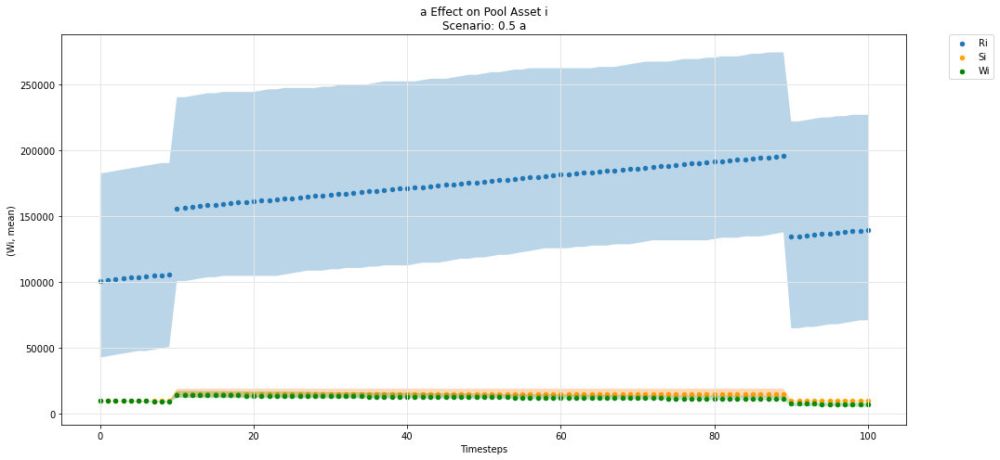

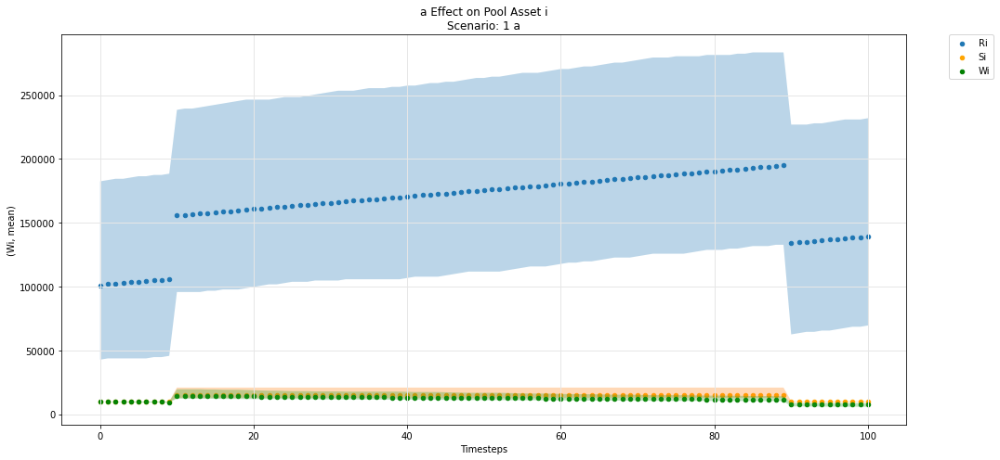

In [66]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

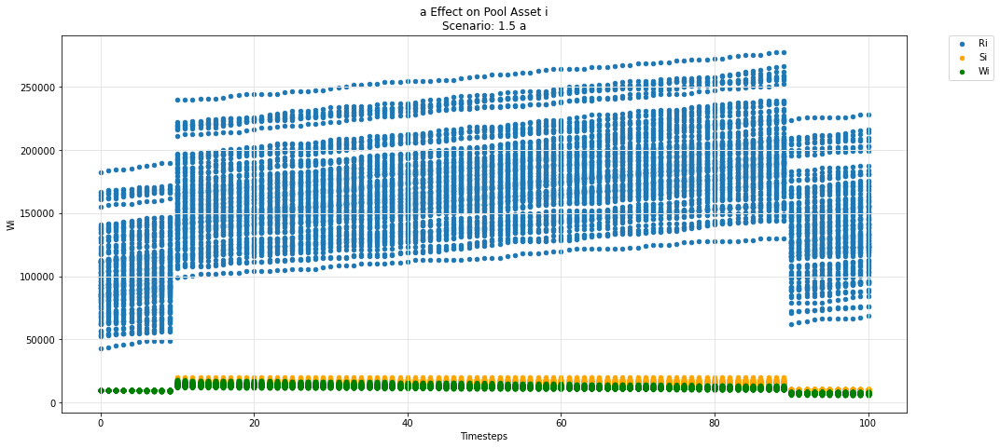

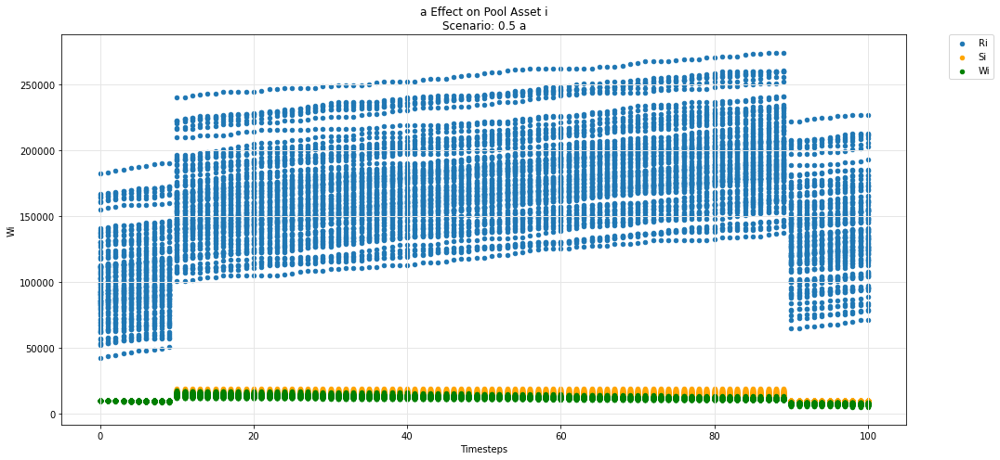

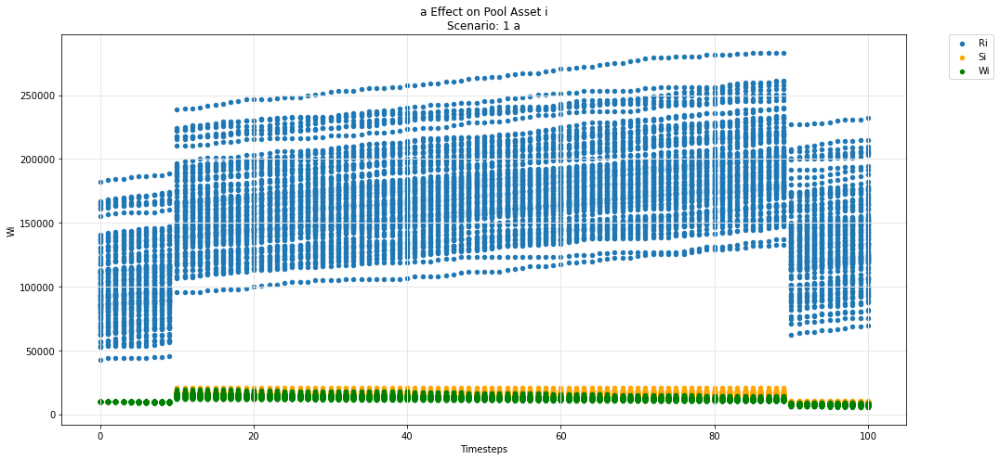

In [67]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

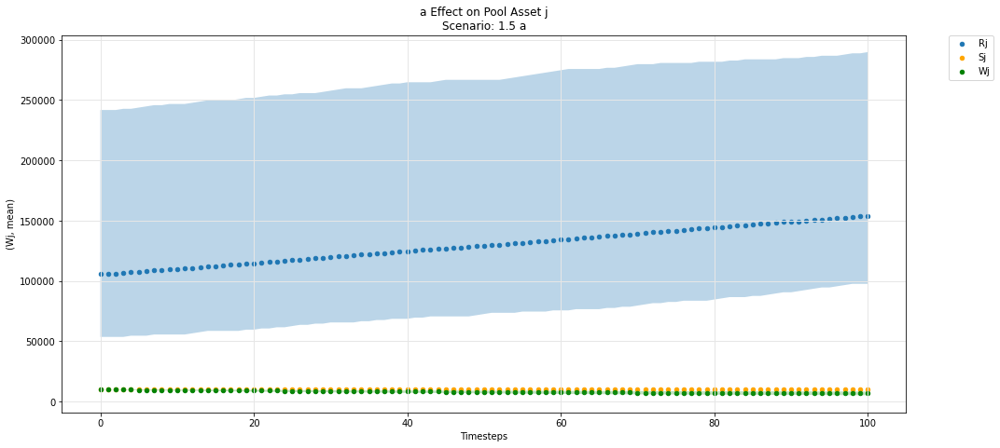

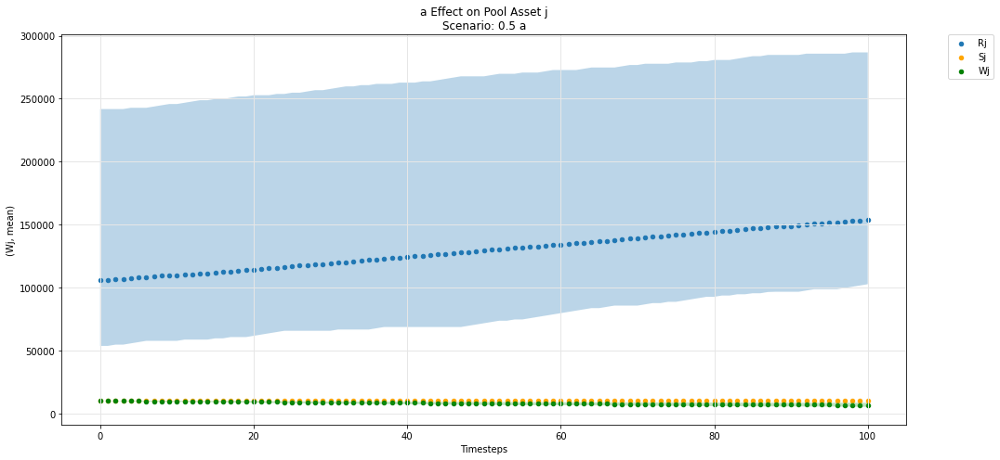

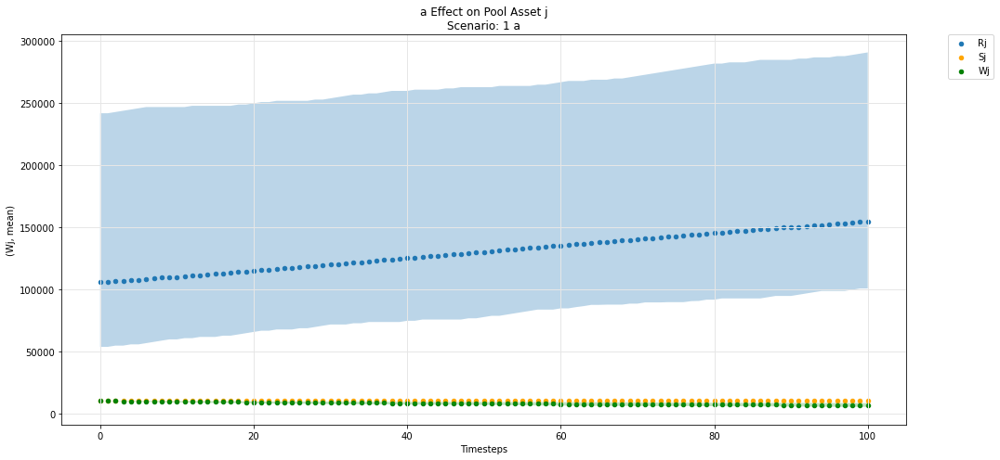

In [68]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

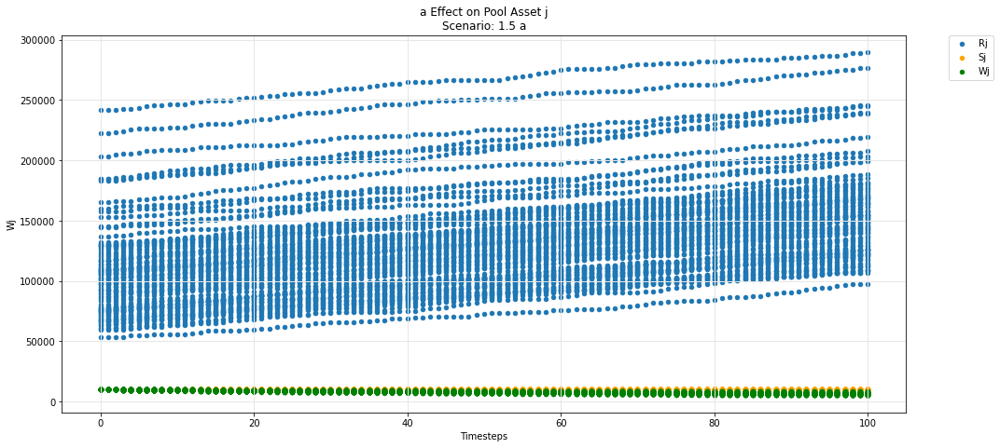

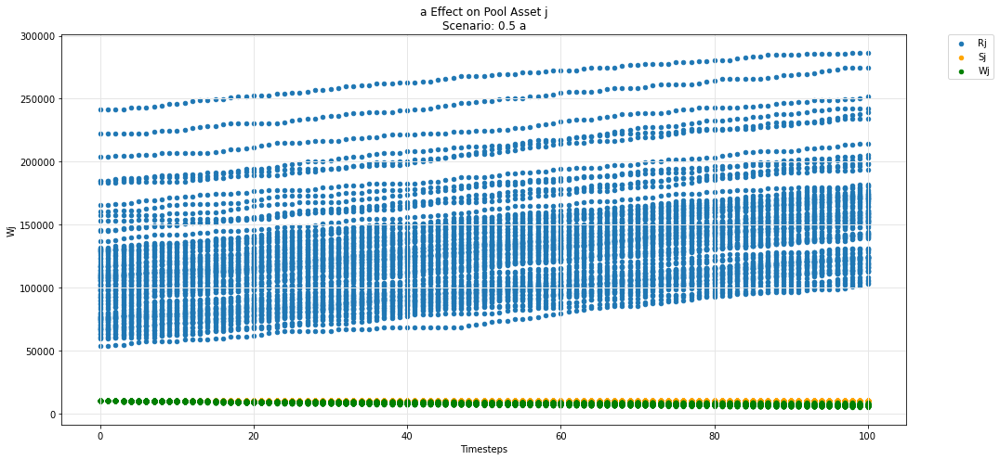

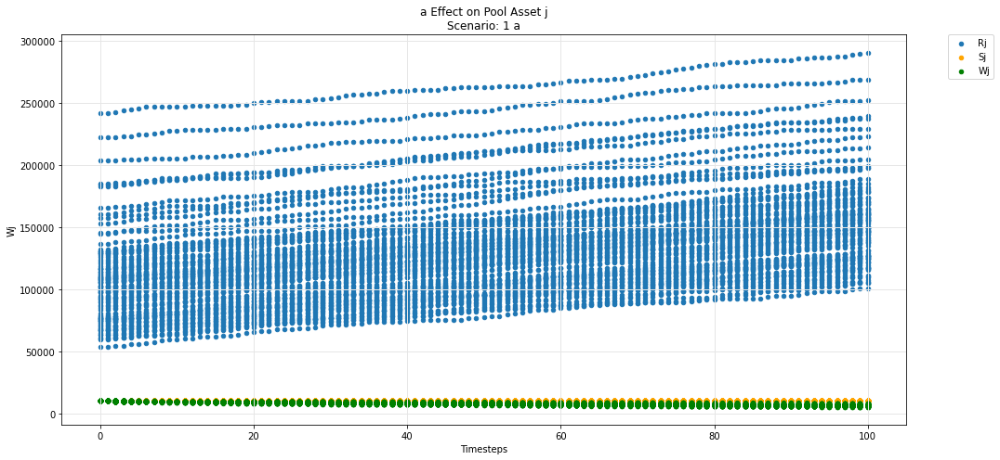

In [69]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

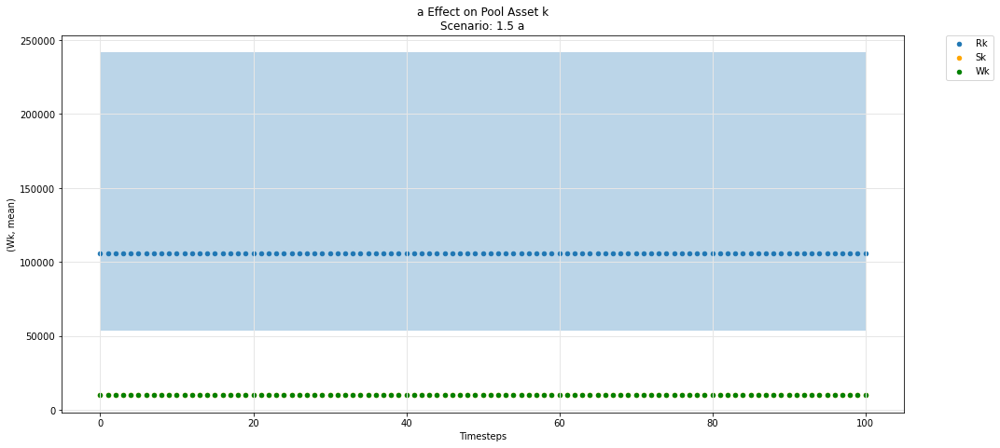

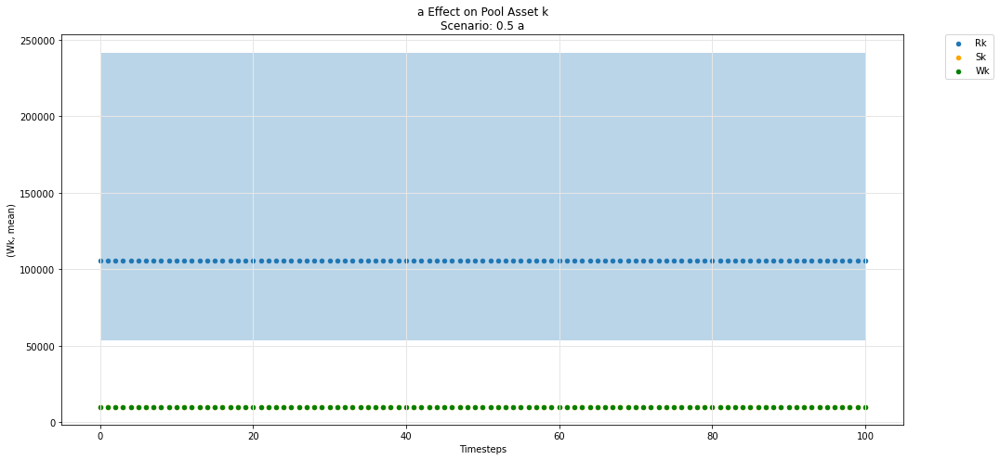

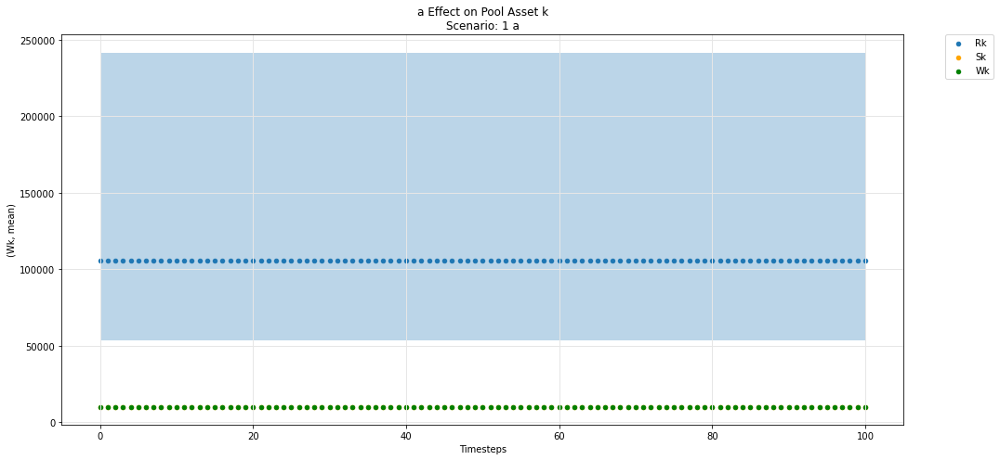

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

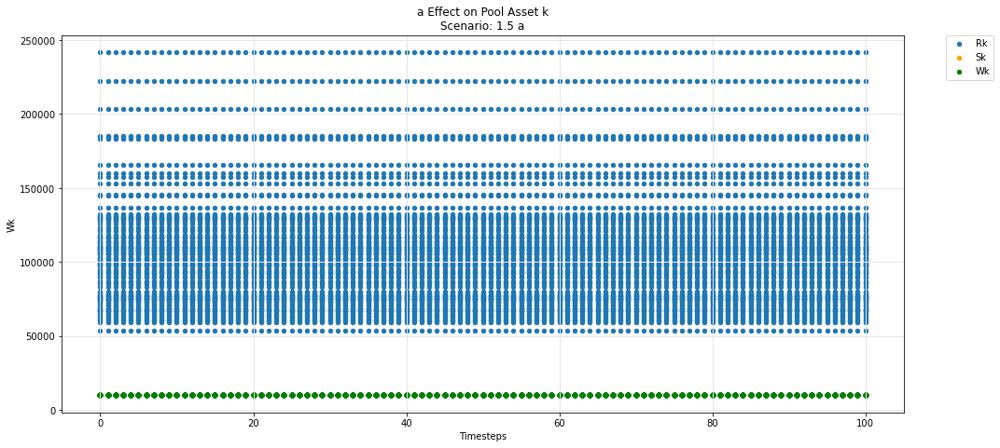

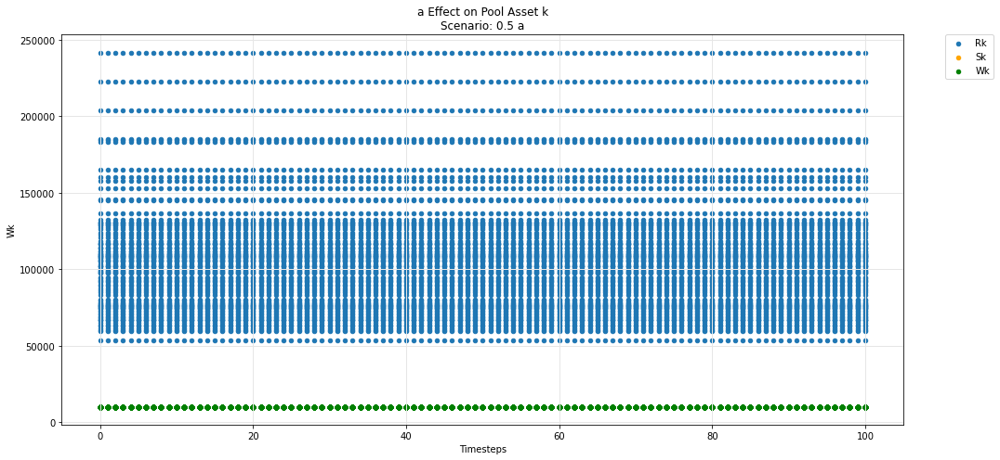

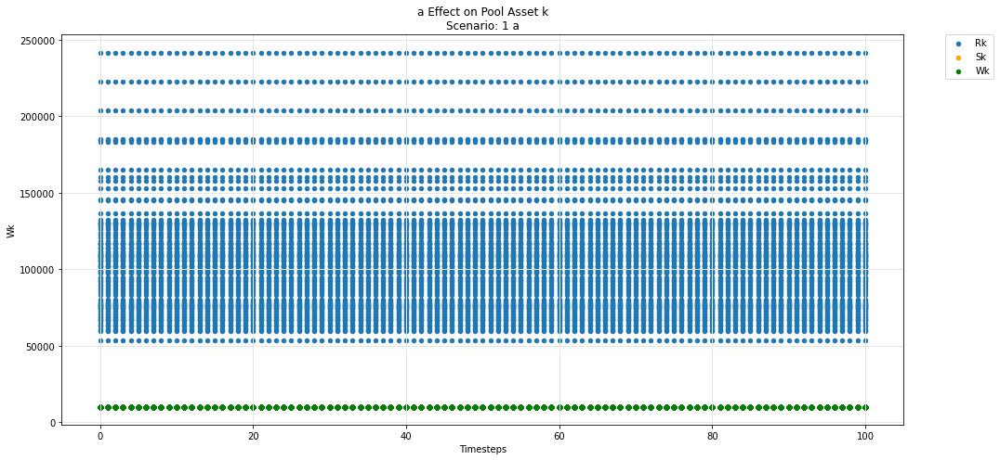

In [71]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [72]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

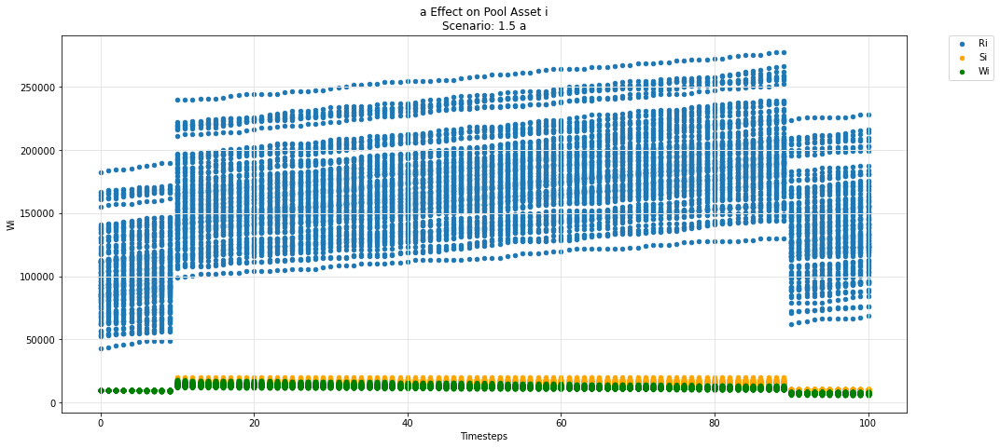

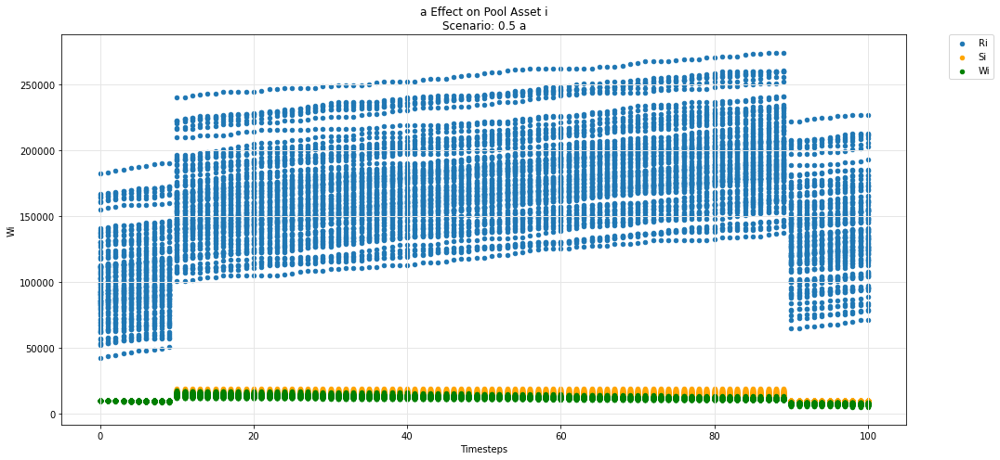

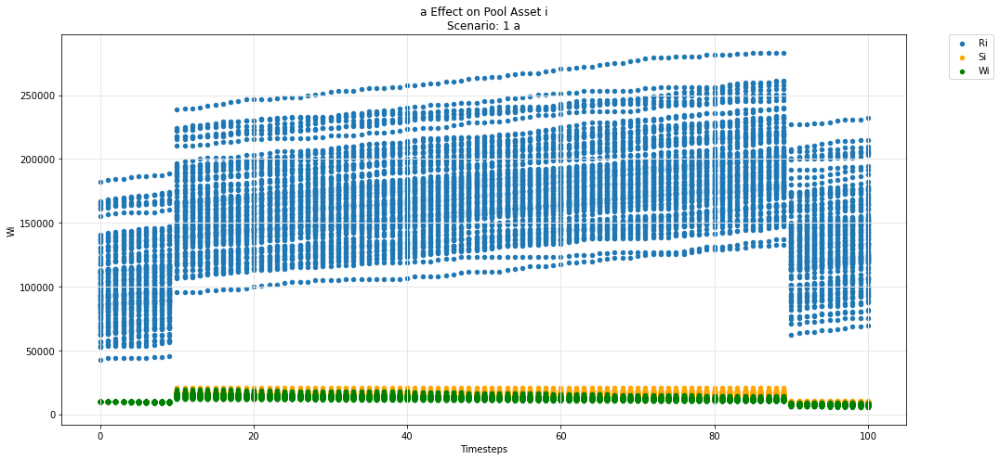

In [73]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

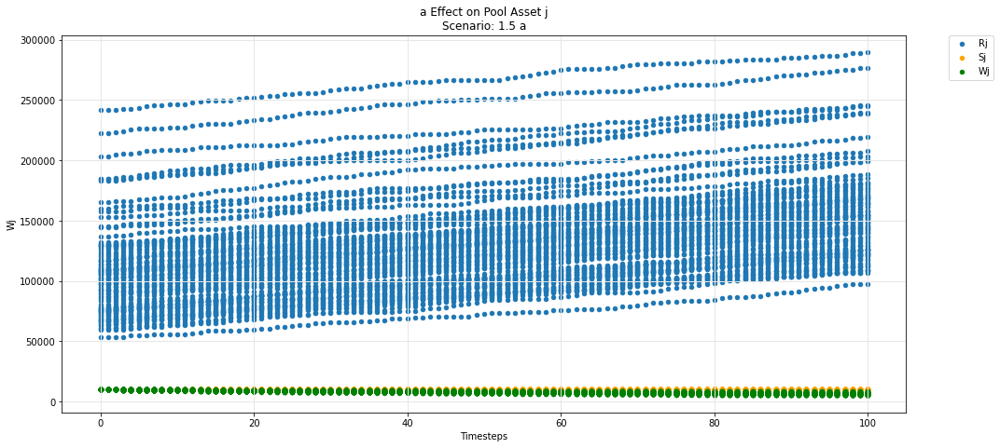

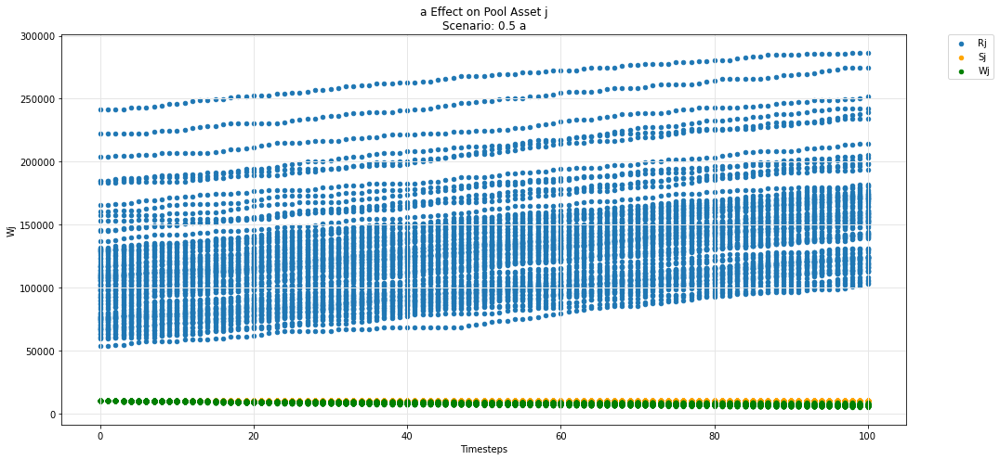

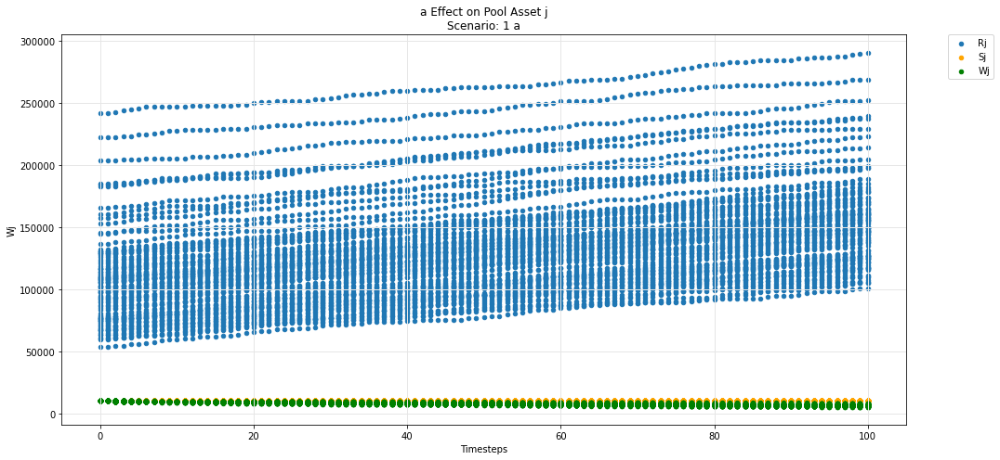

In [74]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [75]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

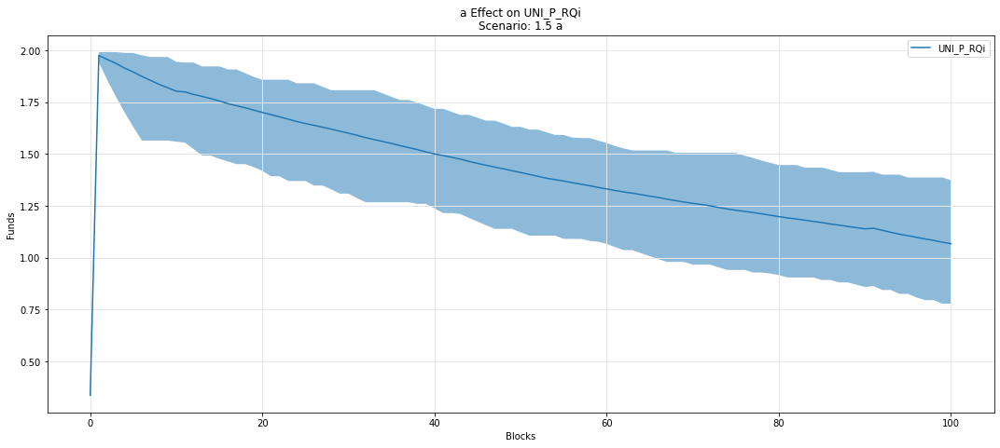

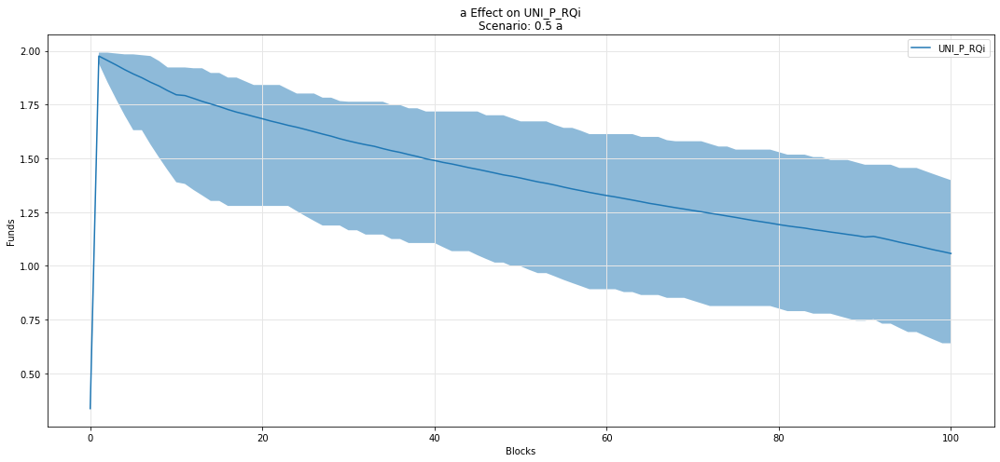

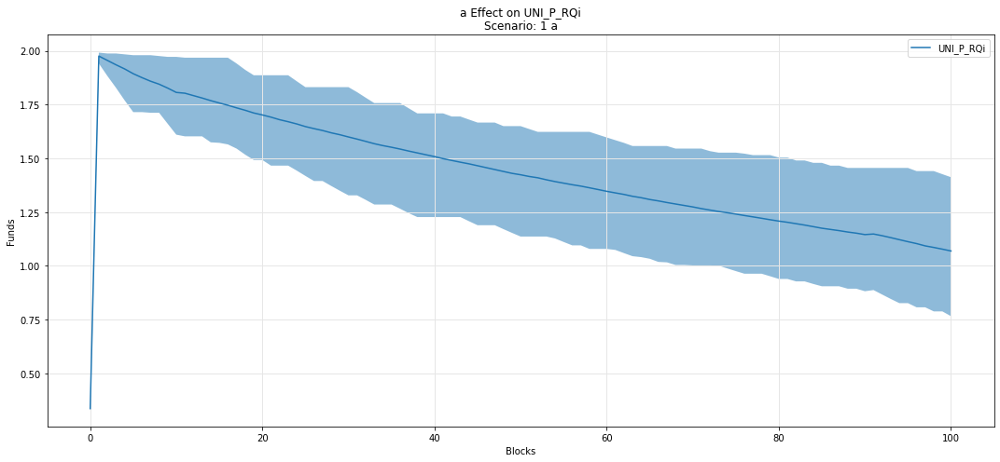

In [76]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

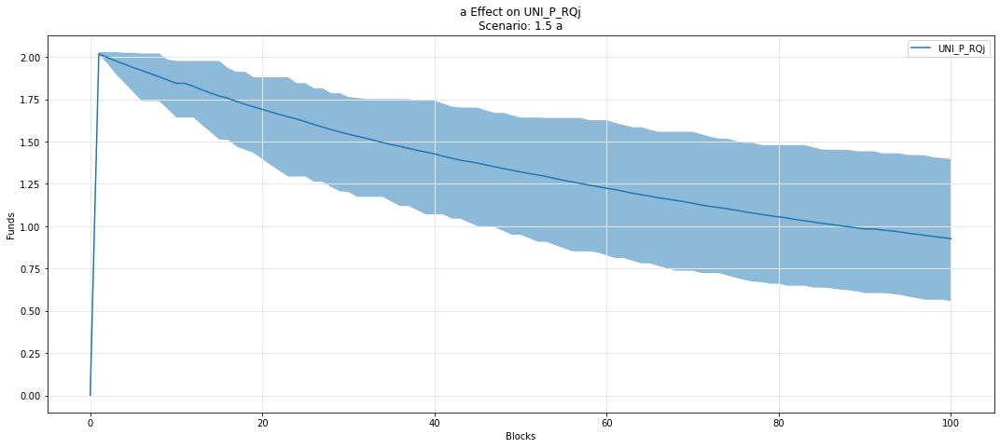

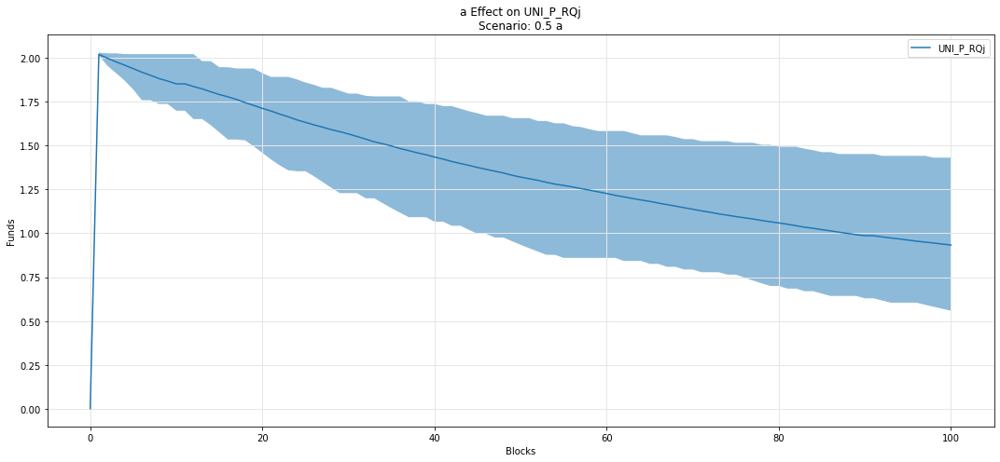

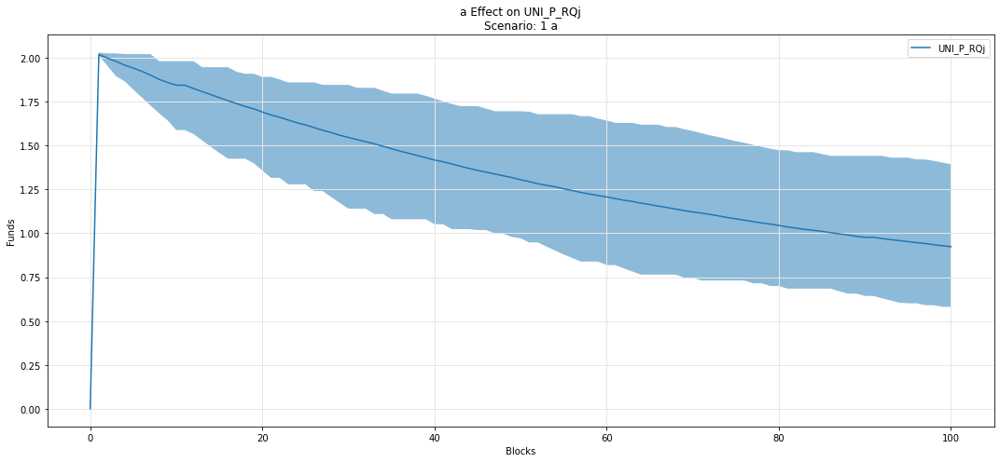

In [77]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

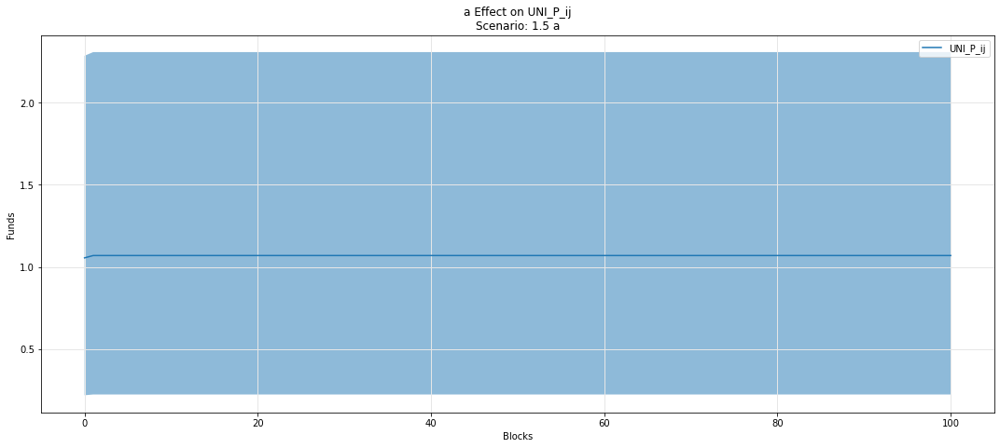

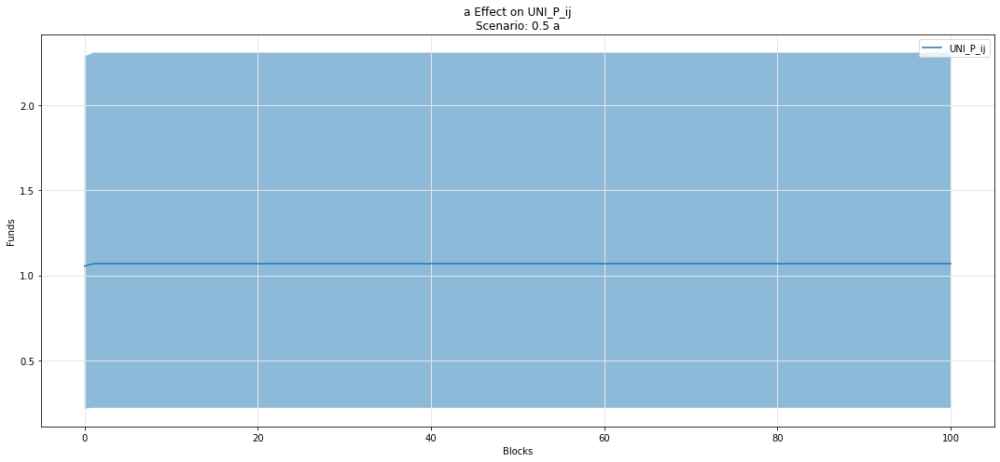

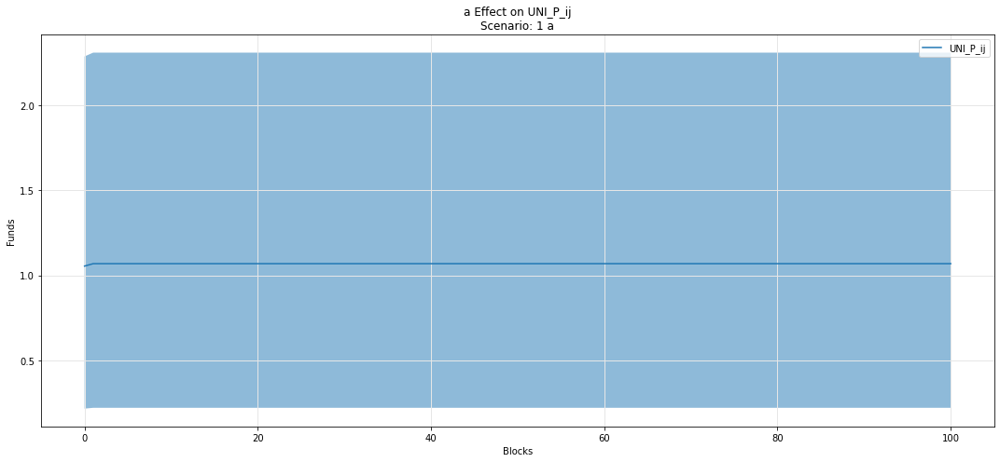

In [78]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

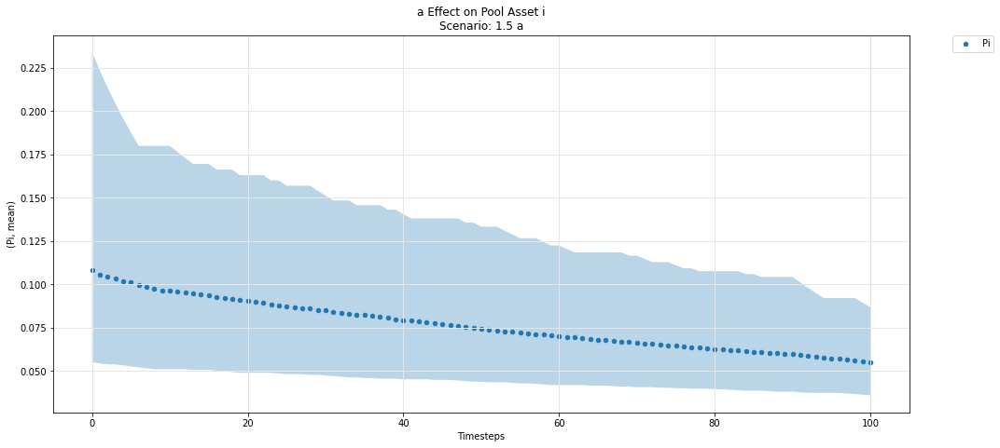

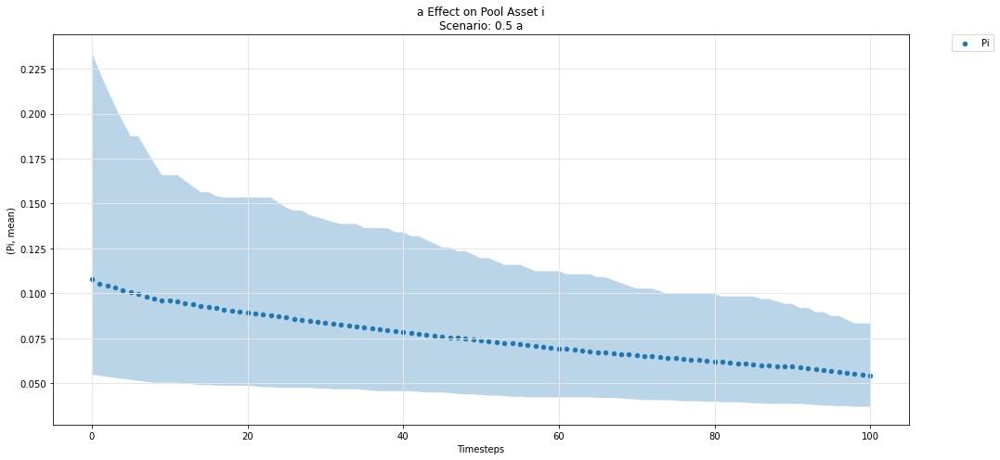

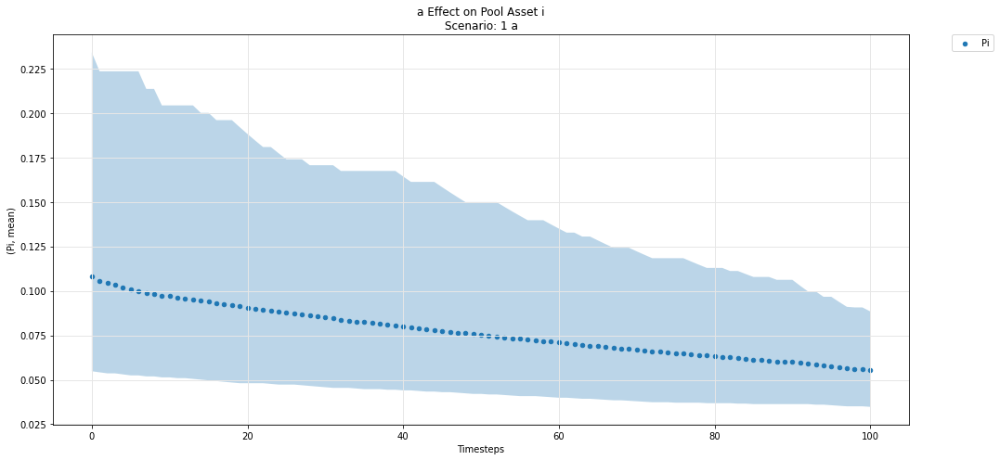

In [79]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

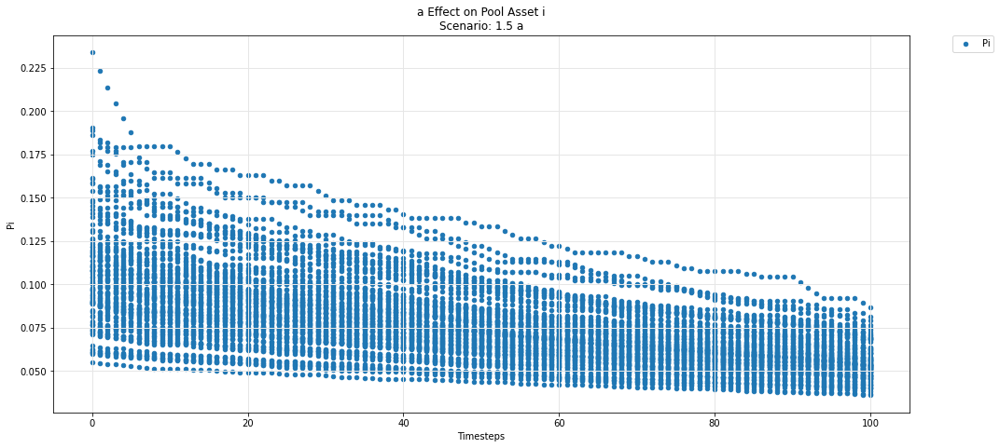

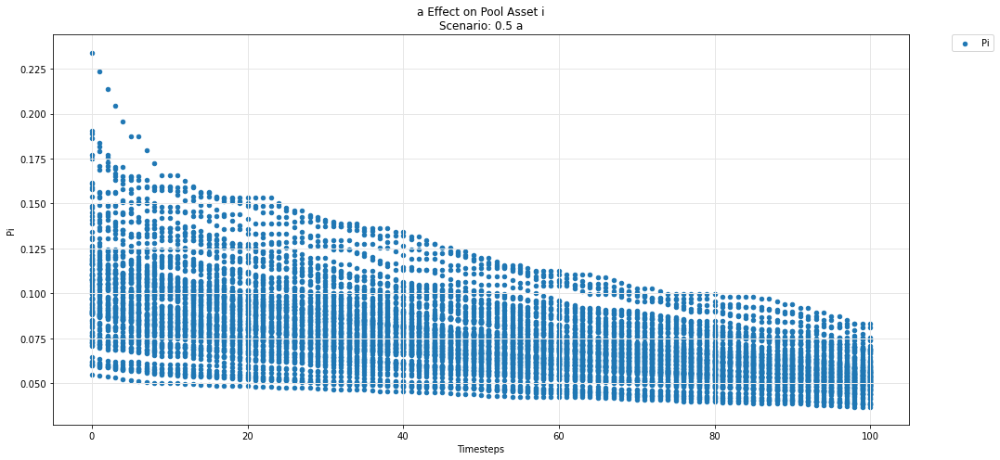

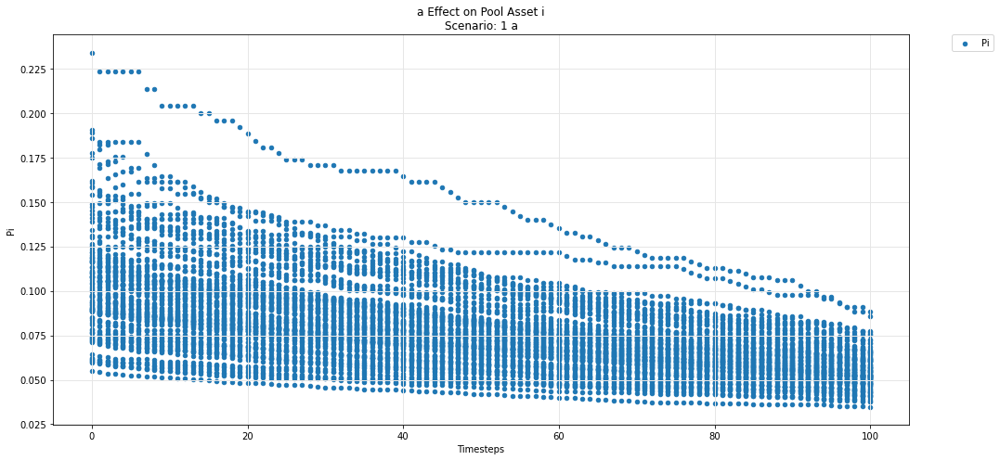

In [80]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

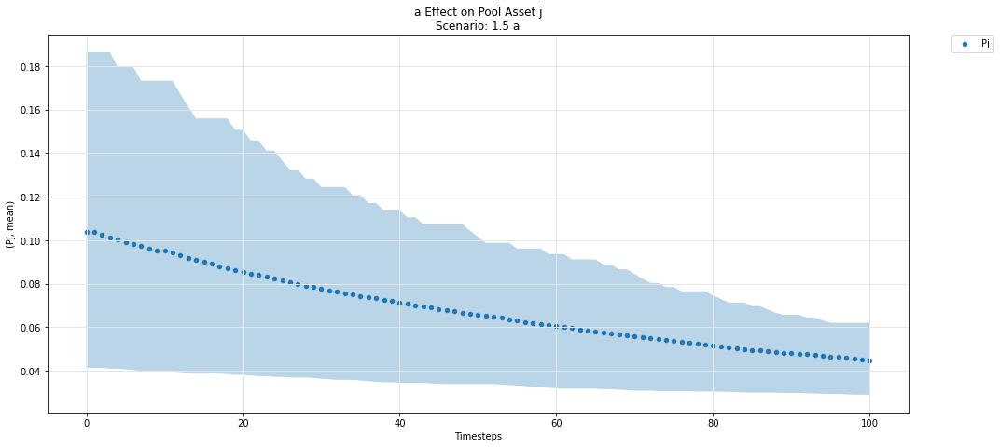

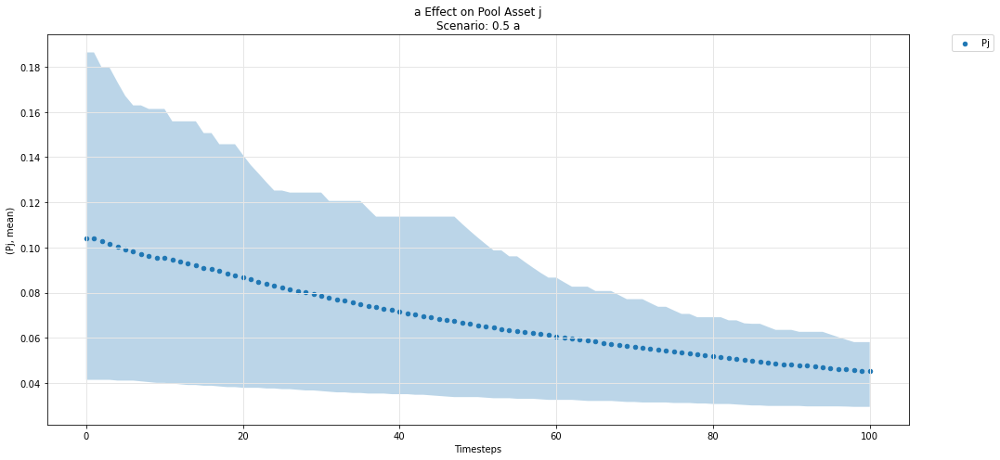

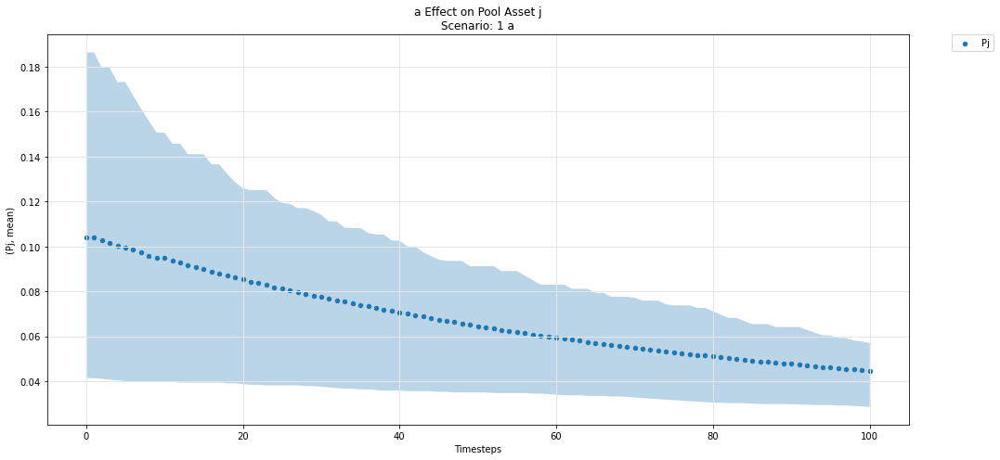

In [81]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

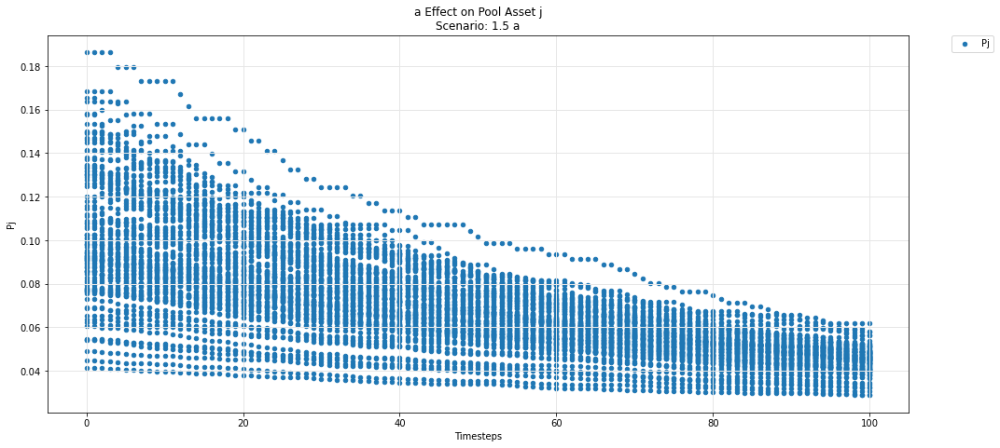

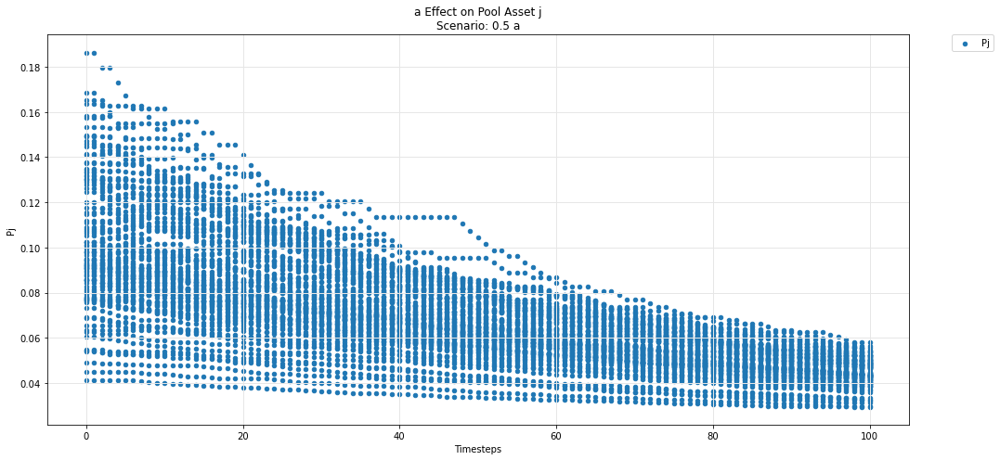

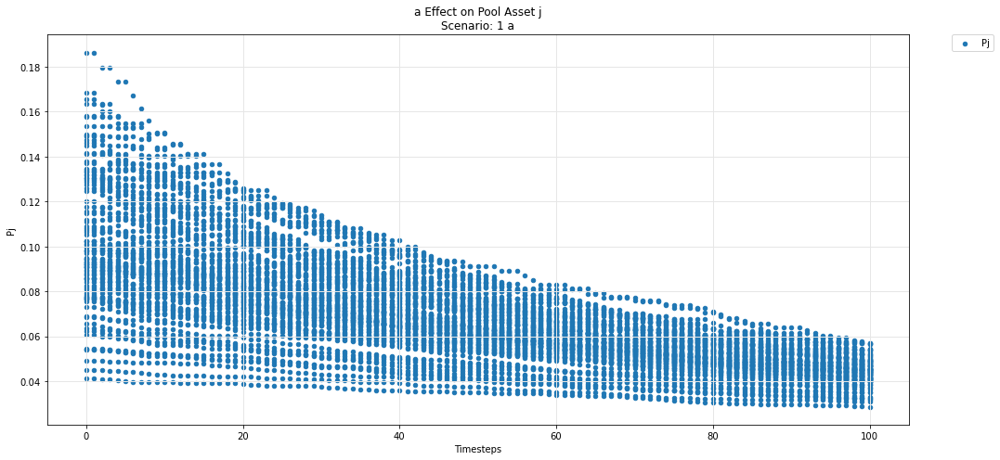

In [82]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

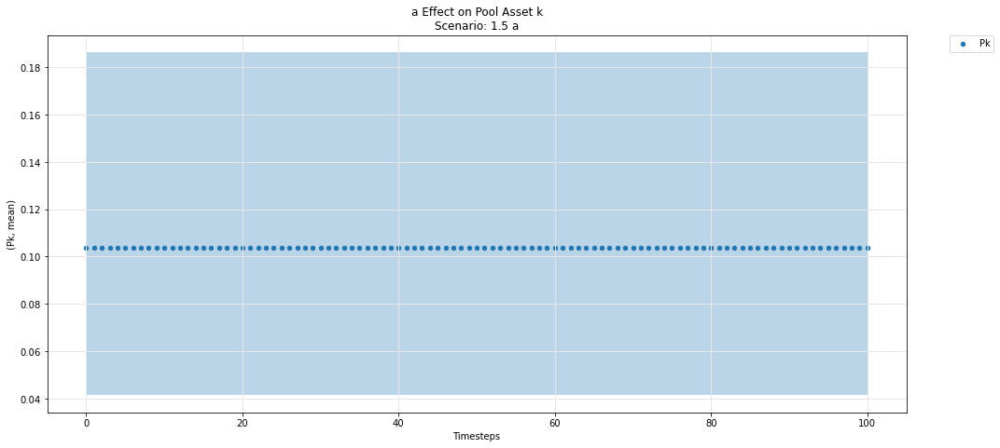

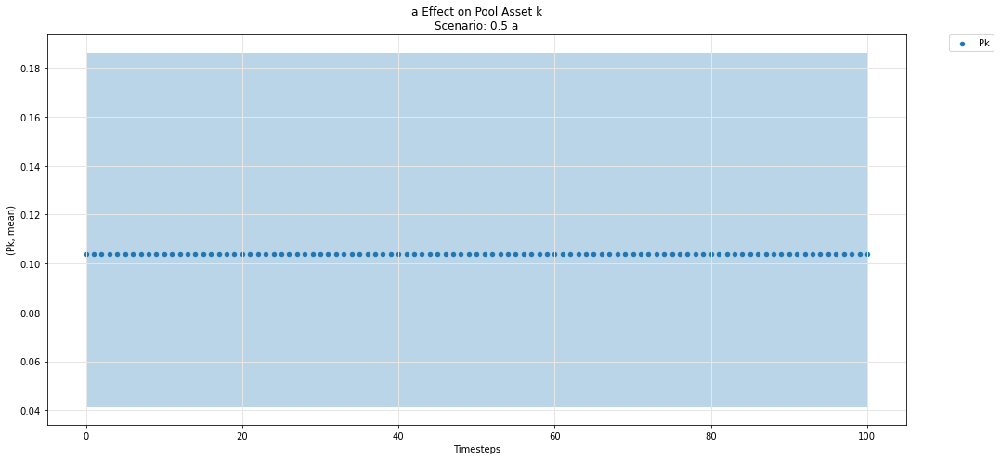

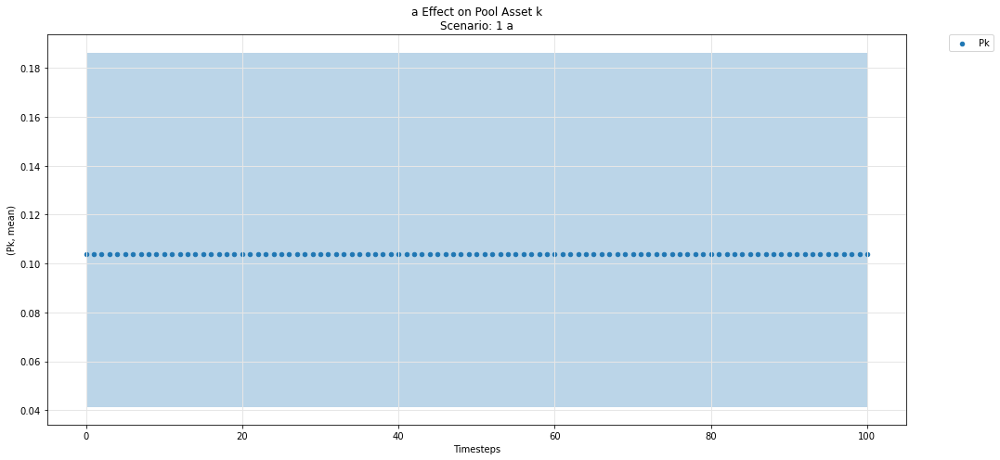

In [83]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

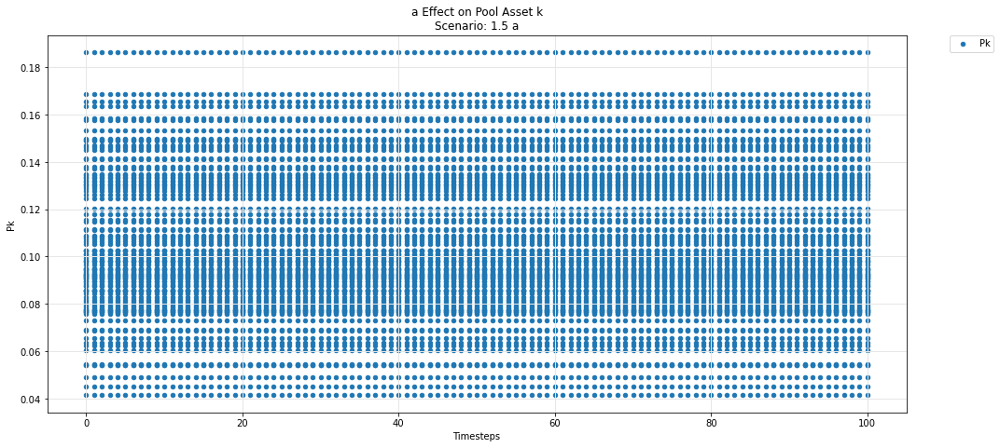

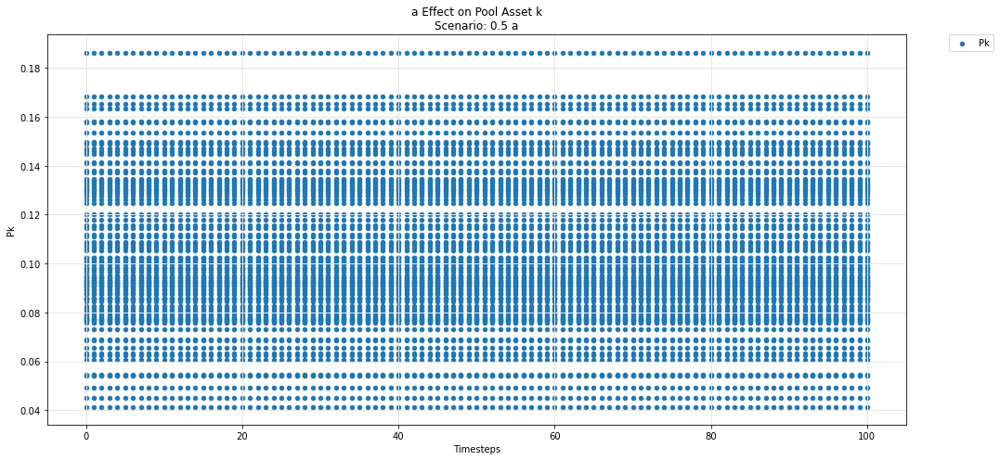

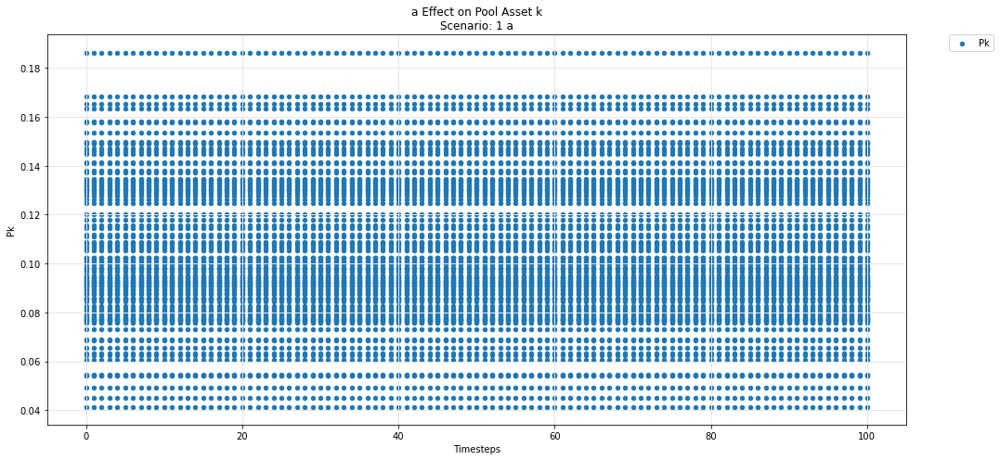

In [84]:
param_pool_plot(experiments, config_ids, 'a','k','P')